### Installing Libs

In [40]:
# Installing Libs

!pip3 install numpy matplotlib pandas tqdm ipykernel torchsummary scikit-learn
#!pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121


[notice] A new release of pip available: 22.3.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


### Importing Libs

In [41]:
# Importing Libs

import torch
import pandas as pd
from matplotlib import pyplot as plt
from torch import nn
from torch.nn import functional as F
import numpy as np
from tqdm import tqdm

### Utility Functions

In [42]:
device = "cpu"

def setup_device(to_print:bool=False):
    # Get cpu or gpu device for training.
    global device    
    
    device = "cuda" if torch.cuda.is_available() else "cpu"

    if to_print:
        print("Using {} device".format(device))

### Loading Data

In [43]:
import os

import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, ConcatDataset
from torchvision import datasets

# def fetch_dataset(root:str='data', train_dataset:str='train', val_dataset:str=None, train_transform:transforms=None, val_transform:transforms=None, target_transform=None):
#     assert train_dataset in ['train', 'trainval'] and val_dataset in ['val', None]

#     if train_dataset == 'trainval':
#         train_data = ConcatDataset(
#             [
#                 ImageFolder(root=os.path.join(root,'train'), transform=train_transform, target_transform=target_transform),
#                 ImageFolder(root=os.path.join(root,'val'), transform=train_transform, target_transform=target_transform)
#             ]
#         )
#     else:
#         train_data = ImageFolder(root=os.path.join(root,train_dataset), transform=train_transform, target_transform=target_transform)

#     if val_dataset is None:
#         return train_data
    
#     val_data = ImageFolder(root=os.path.join(root,val_dataset), transform=val_transform, target_transform=target_transform)
#     return train_data, val_data

def fetch_dataset(dataset=datasets.CIFAR10, train_transform=None, test_transform=None, target_transform=None):
    """
    EXAMPLE: datasets.MNIST
    """
    kwargs = [
        dict(   
            train=True
        ),
        dict(
            train=False
        )
    ]
    if dataset == datasets.STL10:
        kwargs = [dict(split='train'), dict(split='test')]
    # download dataset
    train_data = dataset(
        root="data",
        **kwargs[0],
        download=True,
        transform=train_transform,
        target_transform=target_transform
    )

    test_data = dataset(
        root="data",
        **kwargs[1],
        download=True,
        transform=test_transform,
        target_transform=target_transform
    )
    return train_data, test_data

def get_dataloader(train_data, val_data=None, batch_size=256, train_sampler=None, shuffle=True, **kwargs):
    # create dataloaders
    test_sampler_kwargs = dict(shuffle=shuffle)
    sampler_kwargs = dict(sampler=train_sampler) if train_sampler else test_sampler_kwargs
    train_loader = DataLoader(train_data, batch_size=batch_size, **sampler_kwargs, **kwargs)
    if val_data is None:
        return train_loader
    val_loader = DataLoader(val_data, batch_size=batch_size, **test_sampler_kwargs)
    return train_loader, val_loader

#### Saving

In [44]:
def text_to_file(JOINED_PATH:str, contents, mode:str='w'):
    with open(JOINED_PATH, mode) as f:
        print(contents, file=f)

def save_model(model:nn.Module, PATH:str='models', FILENAME:str=None, extra_info:str=""):
    if FILENAME == None:
        import time
        FILENAME = f'model_{int(time.time())}.h5'

    import os
    if not os.path.exists(PATH):
        os.makedirs(PATH)

    PATH = os.path.join(PATH, FILENAME)
    torch.save(model.state_dict(), PATH)

    text_to_file(PATH+'_details.txt', str(model)+'\n'+extra_info)
    return PATH

def load_model(model:nn.Module, FILE_PATH:str):
    if FILE_PATH is None:
        return
    model.load_state_dict(torch.load(FILE_PATH))

### Model

In [45]:
class Conv(nn.Module):
    def __init__(self, n_channels:int=3, n_classes:int=1000):
        super(Conv, self).__init__()
        self.n_channels = n_channels
        # self.flatten = nn.Flatten()
        self.conv = nn.Sequential(
            nn.Conv2d(n_channels, 64, 7, 2, 2),
            nn.ReLU(),
            nn.Conv2d(64, 256, 3, 2, 1),
            nn.ReLU(),
            nn.Conv2d(256, 1024, 3, 2, 1),
            nn.ReLU(),
        )
        self.gap = nn.AdaptiveAvgPool2d(output_size=1)
        self.flatten = nn.Flatten()
        self.linear = nn.Linear(1024, n_classes)

    def forward(self, x):
        # print(x.shape)
        x = self.conv(x)
        x = self.gap(x)
        x = self.flatten(x)
        # print(x.shape)
        logits = self.linear(x)
        return logits
    
    def __str__(self):
        return f'n_channels: {self.n_channels}\n\n'+super().__str__()
    

In [46]:
class _ResBlock(nn.Module):

    def __init__(self, inchannel, outchannel, stride=1):
        super(_ResBlock, self).__init__()

        self.left = nn.Sequential(
            nn.Conv2d(inchannel,outchannel,kernel_size=3,stride=stride,padding=1,bias=False),
            nn.BatchNorm2d(outchannel),
            nn.ReLU(inplace=True),
            nn.Conv2d(outchannel,outchannel,kernel_size=3,stride=1,padding=1,bias=False),
            nn.BatchNorm2d(outchannel)
        )
        self.shortcut = nn.Sequential()
        if stride != 1 or inchannel != outchannel:
            self.shortcut = nn.Sequential(
                nn.Conv2d(inchannel, outchannel, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(outchannel)
            )

    def forward(self, x):
        out = self.left(x)
        out = out + self.shortcut(x)
        out = F.relu(out)

        return out
    
class _BigResBlock(nn.Module):

    def __init__(self, inchannel, midchannel, outchannel, stride=1):
        super(_BigResBlock, self).__init__()

        self.left = nn.Sequential(
            nn.BatchNorm2d(inchannel),
            nn.ReLU(inplace=True),
            nn.Conv2d(inchannel,midchannel,kernel_size=1,stride=1,padding=0,bias=False),
            
            nn.BatchNorm2d(midchannel),
            nn.ReLU(inplace=True),
            nn.Conv2d(midchannel,midchannel,kernel_size=3,stride=stride,padding=1,bias=False),
            
            nn.BatchNorm2d(midchannel),
            nn.ReLU(inplace=True),
            nn.Conv2d(midchannel,outchannel,kernel_size=1,stride=1,padding=0,bias=False),
        )
        self.shortcut = nn.Sequential()
        if stride != 1 or inchannel != outchannel:
            self.shortcut = nn.Sequential(
                nn.BatchNorm2d(inchannel),
                nn.ReLU(inplace=True),
                nn.Conv2d(inchannel, outchannel, kernel_size=1, stride=stride, bias=False),
            )

    def forward(self, x):
        out = self.left(x)
        out = out + self.shortcut(x)

        return out
    
class ResNet18(nn.Module):

    def __init__(self, ResBlock=_ResBlock, num_classes=10, depth_multiple:int=2):
        super(ResNet18, self).__init__()

        assert depth_multiple >= 1

        self.inchannel = 64
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, self.inchannel, kernel_size=5, stride=1, padding=2, bias=False),
            nn.BatchNorm2d(self.inchannel),
            nn.ReLU()
        )
        self.lay1 = self.make_lay(ResBlock, 64 *depth_multiple, 2, stride=2)
        self.lay2 = self.make_lay(ResBlock, 128*depth_multiple, 2, stride=2)
        self.lay3 = self.make_lay(ResBlock, 256*depth_multiple, 2, stride=2)
        self.lay4 = self.make_lay(ResBlock, 512*depth_multiple, 2, stride=2)
        self.gap = nn.AdaptiveAvgPool2d(output_size=1)
        self.flat = nn.Flatten()
        self.fc = nn.Linear(512*depth_multiple, num_classes)
        
        
    def make_lay(self, block=_ResBlock, channels=64, num_blocks=2, stride=1):
        strides = [stride] + [1] * (num_blocks-1)
        layers = []
        for stride in strides:
            layers.append(block(self.inchannel, channels, stride))
            self.inchannel = channels
        return nn.Sequential(*layers)

    def forward(self, x):
        out = self.conv1(x)
        out = self.lay1(out)
        out = self.lay2(out)
        out = self.lay3(out)
        out = self.lay4(out)
        out = self.gap(out)
        out = self.flat(out)
        out = self.fc(out)

        return out
    
class ResNet34(nn.Module):

    def __init__(self, ResBlock=_ResBlock, in_channel=3, num_classes=10, first_lay_kernel_size=5, first_lay_stride=1, first_lay_padding=2):
        super(ResNet34, self).__init__()

        self.inchannel = 64
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channel, self.inchannel, kernel_size=first_lay_kernel_size, 
                      stride=first_lay_stride, padding=first_lay_padding, bias=False),
            nn.BatchNorm2d(self.inchannel),
            nn.ReLU()
        )
        self.lay1 = self.make_lay(ResBlock, 64, 3, stride=2)
        self.lay2 = self.make_lay(ResBlock, 128, 4, stride=2)
        self.lay3 = self.make_lay(ResBlock, 256, 6, stride=2)
        self.lay4 = self.make_lay(ResBlock, 512, 3, stride=2)
        self.gap = nn.AdaptiveAvgPool2d(output_size=1)
        self.flat = nn.Flatten()
        self.fc = nn.Linear(512, num_classes)
        
        
    def make_lay(self, block=_ResBlock, channels=64, num_blocks=2, stride=1):
        strides = [stride] + [1] * (num_blocks-1)
        layers = []
        for stride in strides:
            layers.append(block(self.inchannel, channels, stride))
            self.inchannel = channels
        return nn.Sequential(*layers)

    def forward(self, x):
        out = self.conv1(x)
        out = self.lay1(out)
        out = self.lay2(out)
        out = self.lay3(out)
        out = self.lay4(out)
        out = self.gap(out)
        out = self.flat(out)
        out = self.fc(out)

        return out
    
    
class ResNet50(nn.Module):

    def __init__(self, ResBlock=_BigResBlock, num_classes=1000):
        super(ResNet50, self).__init__()

        self.inchannel = 64
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, self.inchannel, kernel_size=5, stride=1, padding=2, bias=False),
            nn.BatchNorm2d(self.inchannel),
            nn.ReLU()
        )
        self.lay1 = self.make_lay(ResBlock, 64, 3, stride=2)
        self.lay2 = self.make_lay(ResBlock, 128, 4, stride=2)
        self.lay3 = self.make_lay(ResBlock, 256, 23, stride=2)
        self.lay4 = self.make_lay(ResBlock, 512, 3, stride=2)
        self.gap = nn.AdaptiveAvgPool2d(output_size=1)
        self.flat = nn.Flatten()
        self.fc = nn.Linear(self.inchannel, num_classes)
        
        
    def make_lay(self, block=_BigResBlock, channels=64, num_blocks=2, stride=1):
        strides = [stride] + [1] * (num_blocks-1)
        layers = []
        for stride in strides:
            layers.append(block(self.inchannel, channels, channels*4, stride))
            self.inchannel = channels*4
        return nn.Sequential(*layers)

    def forward(self, x):
        out = self.conv1(x)
        out = self.lay1(out)
        out = self.lay2(out)
        out = self.lay3(out)
        out = self.lay4(out)
        out = self.gap(out)
        out = self.flat(out)
        out = self.fc(out)

        return out

In [47]:
from deit.models import deit_small_distilled_patch16_224


In [48]:
class DEIT(nn.Module):
    def __init__(self, num_classes):
        super(DEIT, self).__init__()
        self.deit = deit_small_distilled_patch16_224()
        self.fc = nn.Linear(1000, num_classes)
        
    def forward(self, x):
        x = self.deit(x)
        if isinstance(x, tuple):
            x = x[0]
        x = self.fc(x)
        return x

In [49]:
import torch
from torch import nn

from einops import rearrange
from einops.layers.torch import Rearrange

# helpers

def pair(t):
    return t if isinstance(t, tuple) else (t, t)

def posemb_sincos_2d(h, w, dim, temperature: int = 10000, dtype = torch.float32):
    y, x = torch.meshgrid(torch.arange(h), torch.arange(w), indexing="ij")
    assert (dim % 4) == 0, "feature dimension must be multiple of 4 for sincos emb"
    omega = torch.arange(dim // 4) / (dim // 4 - 1)
    omega = 1.0 / (temperature ** omega)

    y = y.flatten()[:, None] * omega[None, :]
    x = x.flatten()[:, None] * omega[None, :]
    pe = torch.cat((x.sin(), x.cos(), y.sin(), y.cos()), dim=1)
    return pe.type(dtype)

# classes

class FeedForward(nn.Module):
    def __init__(self, dim, hidden_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.LayerNorm(dim),
            nn.Linear(dim, hidden_dim),
            nn.GELU(),
            nn.Linear(hidden_dim, dim),
        )
    def forward(self, x):
        return self.net(x)

class Attention(nn.Module):
    def __init__(self, dim, heads = 8, dim_head = 64):
        super().__init__()
        inner_dim = dim_head *  heads
        self.heads = heads
        self.scale = dim_head ** -0.5
        self.norm = nn.LayerNorm(dim)

        self.attend = nn.Softmax(dim = -1)

        self.to_qkv = nn.Linear(dim, inner_dim * 3, bias = False)
        self.to_out = nn.Linear(inner_dim, dim, bias = False)

    def forward(self, x):
        x = self.norm(x)

        qkv = self.to_qkv(x).chunk(3, dim = -1)
        q, k, v = map(lambda t: rearrange(t, 'b n (h d) -> b h n d', h = self.heads), qkv)

        dots = torch.matmul(q, k.transpose(-1, -2)) * self.scale

        attn = self.attend(dots)

        out = torch.matmul(attn, v)
        out = rearrange(out, 'b h n d -> b n (h d)')
        return self.to_out(out)

class Transformer(nn.Module):
    def __init__(self, dim, depth, heads, dim_head, mlp_dim):
        super().__init__()
        self.norm = nn.LayerNorm(dim)
        self.layers = nn.ModuleList([])
        for _ in range(depth):
            self.layers.append(nn.ModuleList([
                Attention(dim, heads = heads, dim_head = dim_head),
                FeedForward(dim, mlp_dim)
            ]))
    def forward(self, x):
        for attn, ff in self.layers:
            x = attn(x) + x
            x = ff(x) + x
        return self.norm(x)

class SimpleViT(nn.Module):
    def __init__(self, *, image_size, patch_size, num_classes, dim, depth, heads, mlp_dim, channels = 3, dim_head = 64):
        super().__init__()
        image_height, image_width = pair(image_size)
        patch_height, patch_width = pair(patch_size)

        assert image_height % patch_height == 0 and image_width % patch_width == 0, 'Image dimensions must be divisible by the patch size.'

        patch_dim = channels * patch_height * patch_width

        self.to_patch_embedding = nn.Sequential(
            Rearrange("b c (h p1) (w p2) -> b (h w) (p1 p2 c)", p1 = patch_height, p2 = patch_width),
            nn.LayerNorm(patch_dim),
            nn.Linear(patch_dim, dim),
            nn.LayerNorm(dim),
        )

        self.pos_embedding = posemb_sincos_2d(
            h = image_height // patch_height,
            w = image_width // patch_width,
            dim = dim,
        ) 

        self.transformer = Transformer(dim, depth, heads, dim_head, mlp_dim)

        self.pool = "mean"
        self.to_latent = nn.Identity()

        self.linear_head = nn.Linear(dim, num_classes)

    def forward(self, img):
        device = img.device

        x = self.to_patch_embedding(img)
        x += self.pos_embedding.to(device, dtype=x.dtype)

        x = self.transformer(x)
        x = x.mean(dim = 1)

        x = self.to_latent(x)
        return self.linear_head(x)

### Training

In [50]:
def set_optimizers(model:nn.Module, loss_fn=nn.CrossEntropyLoss, optimizer=torch.optim.SGD, lr=1e-1, decay=None, **kwargs):
    # Loss function
    loss_fn = loss_fn()

    # SGD Optimizer
    optimizer = optimizer(model.parameters(), lr=lr)
    scheduler = decay(optimizer, **kwargs) if decay != None else None
    return loss_fn, optimizer, scheduler

# Train function
def train(dataloader:DataLoader, model:nn.Module, loss_fn, optimizer, scheduler=None, show:bool=True, tqdm_show:bool=False):
    size = len(dataloader.dataset)
    
    # Turn on training mode
    model.to(device)
    model.train()
    train_loss, correct = 0, 0
    dtlr = tqdm(dataloader) if tqdm_show else dataloader
    for X, y in dtlr:
        X, y = X.to(device), y.to(device)

        # Compute prediction error
        
        # print(X.shape, y.shape)
        pred = model(X)
        loss = loss_fn(pred, y)

        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        # record loss
        train_loss += loss.item()
        correct += (pred.argmax(1) == y.argmax(1)).type(torch.float).sum().item()
    
    train_loss /= len(dataloader)
    correct /= size
    lr = optimizer.param_groups[0]['lr']
    if scheduler != None:
        scheduler.step(train_loss) if isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau) else scheduler.step()
    
    if show:
        print(f" Train accuracy: {(100*correct):>0.1f}%, Avg loss: {train_loss:>8f}, lr: {lr}")
    return train_loss, correct, lr

# Test function
def test(dataloader:DataLoader, model:nn.Module, loss_fn, show:bool=True, tqdm_show:bool=False):
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    
    # Turn on evalution mode
    model.eval()
    test_loss, correct = 0, 0
    
    # Turn off gradient descent
    with torch.no_grad():
        dtlr = tqdm(dataloader) if tqdm_show else dataloader
        for X, y in dtlr:
            X, y = X.to(device), y.to(device)
            # try:
            pred = model(X)
            # except Exception:
            #     print(X.shape, y.shape)
            
            # record loss
            test_loss += loss_fn(pred, y).item()
            correct += (pred.argmax(1) == y.argmax(1)).type(torch.float).sum().item()
            
    test_loss /= num_batches
    correct /= size
    
    if show:
        print(f" Test accuracy: {(100*correct):>0.1f}%, Avg loss: {test_loss:>8f}")
    return test_loss, correct

In [51]:
def ToGPU(samp):
    return samp.to(device)

In [52]:
def GaussianNoise(samp):
    return samp + .02*torch.randn_like(samp, device=device) #.01

In [53]:
from torch.utils.data import SubsetRandomSampler

def get_sampler(fraction, dataset:datasets.CIFAR10):
    # balanced sampling
    indexes = [[] for _ in range(len(dataset.classes))]
    for idx, (_, class_idx) in enumerate(dataset):
        indexes[np.argmax(class_idx)].append(idx)
    train_indices = []
    for cl_idx in indexes:
        size = len(cl_idx)
        split = int(np.floor(fraction * size))
        np.random.shuffle(cl_idx)
        train_indices.extend(cl_idx[:split])
    return SubsetRandomSampler(train_indices)

### Main Function

In [54]:
from torchvision import datasets
N_CLASSES = 10#100
# IMG_SIZE = (224,224)#
IMG_SIZE = (64,64)
PATCH_SIZE = (16,16)
BATCH_SIZE = 32

In [55]:
torch.cuda.empty_cache()

In [56]:
debug = False

setup_device(to_print=True)

configs = dict(interpolation=transforms.InterpolationMode.NEAREST)
train_transform = transforms.Compose(
    [
        transforms.ToTensor(),
        ToGPU,
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomRotation(degrees=35, **configs),
        transforms.RandomResizedCrop(IMG_SIZE, scale=(.6,1), antialias=True, **configs),
        transforms.ColorJitter(brightness=.5, contrast=.5, saturation=.5, hue=.5), # 4
        transforms.RandomPerspective(distortion_scale=0.4, **configs), ## 201+
        GaussianNoise, ## NEW
    ]
)
train_transform = transforms.Compose(
    [
        transforms.ToTensor(),
        ToGPU,
        transforms.Resize(IMG_SIZE, **configs)
    ]
)
val_transform = transforms.Compose(
    [
        transforms.ToTensor(),
        ToGPU,
        transforms.Resize(IMG_SIZE, **configs)
    ]
)
target_transform = lambda label: F.one_hot(torch.LongTensor(np.array([label])),num_classes=N_CLASSES).flatten().float()

# dataset = datasets.CIFAR10
fraction = .7
dataset = datasets.STL10
np.random.seed(42)
train_data, val_data = fetch_dataset(dataset, train_transform=train_transform, test_transform=val_transform, target_transform=target_transform)
sampler = get_sampler(fraction, train_data)
# train_data, val_data = fetch_dataset(
#     root='data',
#     train_dataset='train', val_dataset='val', 
#     train_transform=train_transform, 
#     val_transform=transforms.ToTensor(),
#     target_transform=target_transform
# )

Using cuda device
Files already downloaded and verified
Files already downloaded and verified


classes: ['airplane', 'bird', 'car', 'cat', 'deer', 'dog', 'horse', 'monkey', 'ship', 'truck']
train size: 5000, val size: 8000
input size: torch.Size([32, 3, 64, 64]), label size: torch.Size([32, 10])


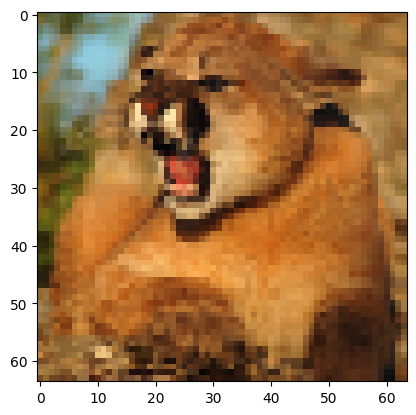

label: 3
input size: torch.Size([32, 3, 64, 64]), label size: torch.Size([32, 10])


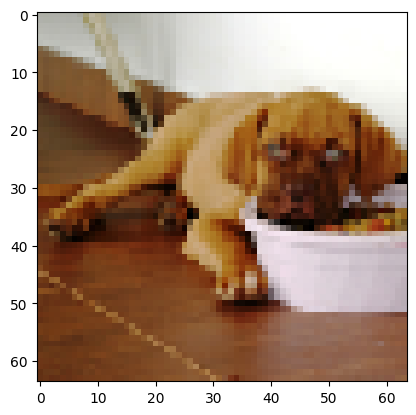

label: 5


In [57]:
train_loader, val_loader = get_dataloader(train_data, val_data, batch_size=BATCH_SIZE, shuffle=True, train_sampler=sampler) #1,2,4
#train_loader, val_loader = get_dataloader(train_data, val_data, batch_size=128, shuffle=True) #1,2,4
#train_loader, val_loader = get_dataloader(train_data, val_data, batch_size=64) #3

debug = True
if debug:
    print(f'classes: {train_data.classes}')
    print(f'train size: {len(train_loader.dataset)}, val size: {len(val_loader.dataset)}')

    data = next(iter(train_loader))
    print(f'input size: {data[0].shape}, label size: {data[1].shape}')
    plt.imshow(np.transpose(data[0][0].cpu(), (1,2,0)))
    plt.show()
    print(f'label: {torch.argmax(data[1][0])}')

    data = next(iter(val_loader))
    print(f'input size: {data[0].shape}, label size: {data[1].shape}')
    plt.imshow(np.transpose(data[0][0].cpu(), (1,2,0)))
    plt.show()
    print(f'label: {torch.argmax(data[1][0])}')

In [58]:
SUBLABEL = f'has_aug_split_{fraction}'

In [59]:
from torchsummary import summary

#model = Conv(n_channels=3, n_classes=1000) #1
#model = ResNet18(num_classes=10, depth_multiple=2) #2, 4
# model = ResNet34(num_classes=N_CLASSES) #3
#model = ResNet50(num_classes=10) # Kaggle
#model = ResNet18pFC(num_classes=1000)
model = SimpleViT(image_size=IMG_SIZE, patch_size=PATCH_SIZE, num_classes=N_CLASSES, dim=500, depth=16, heads=8, mlp_dim=500, channels = 3, dim_head = 64)
# model = DEIT(num_classes=N_CLASSES)
model = model.to(device) 
SUB_DIR = os.path.join('classification',f'{dataset.__name__}_{model.__class__.__name__}_{SUBLABEL}')

if debug:
    summary(model, next(iter(train_loader))[0].shape[1:])

    data = next(iter(train_loader))
    print(f'input size: {data[0].shape}, label size: {data[1].shape}')
    outp = model(data[0].to(device))
    print(f'label: {torch.argmax(data[1][0])}, pred: {torch.argmax(outp[0])}')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
         Rearrange-1              [-1, 16, 768]               0
         LayerNorm-2              [-1, 16, 768]           1,536
            Linear-3              [-1, 16, 500]         384,500
         LayerNorm-4              [-1, 16, 500]           1,000
         LayerNorm-5              [-1, 16, 500]           1,000
            Linear-6             [-1, 16, 1536]         768,000
           Softmax-7            [-1, 8, 16, 16]               0
            Linear-8              [-1, 16, 500]         256,000
         Attention-9              [-1, 16, 500]               0
        LayerNorm-10              [-1, 16, 500]           1,000
           Linear-11              [-1, 16, 500]         250,500
             GELU-12              [-1, 16, 500]               0
           Linear-13              [-1, 16, 500]         250,500
      FeedForward-14              [-1, 

In [60]:
#INITIAL_LR = 1e-3 #First training
INITIAL_LR = 8e-5 #ViT
#INITIAL_LR = 8e-05 #Start from saved point
#INITIAL_LR = 1e-4
#INITIAL_LR = 1e-5

In [61]:
#LOAD_PATH = '/models/resnet_50/1/model_1708420238.h5'
#LOAD_PATH = os.path.join('models','resnet_50','4','model_1708447042.h5')
#LOAD_PATH = os.path.join('models','resnet_18_good','model_1706970580.h5')
#LOAD_PATH = os.path.join('models','SimpleViT_1708653384','60','model_1708670107.h5')
LOAD_PATH = None
load_model(model, LOAD_PATH)

In [62]:
#GAMMA = .95
#GAMMA = .9
GAMMA = .999

In [63]:
# DECAY = torch.optim.lr_scheduler.ExponentialLR
# kwargs =  dict(gamma=GAMMA)
DECAY = torch.optim.lr_scheduler.ReduceLROnPlateau
kwargs =  dict(threshold_mode='rel')

In [64]:
#loss_fn, opt, scheduler = set_optimizers(model, nn.CrossEntropyLoss, torch.optim.Adam, lr=5e-3, decay=torch.optim.lr_scheduler.ExponentialLR, gamma=.97) #1
#loss_fn, opt, scheduler = set_optimizers(model, nn.CrossEntropyLoss, torch.optim.Adam, lr=1e-2, decay=torch.optim.lr_scheduler.ExponentialLR, gamma=.97) # 2,3,4
loss_fn, opt, scheduler = set_optimizers(model, nn.CrossEntropyLoss, torch.optim.Adam, lr=INITIAL_LR, decay=DECAY, **kwargs) # 4.1

In [65]:
import time
TRAIN_ID = int(time.time())

In [66]:
epoch = 0 # starting epoch
#epoch = 100
#epoch = 70

## Some Other Utility Functioins

In [67]:
training_losses = []
validation_losses = []
training_accuracy = []
validation_accuracy = []
lrs = []

In [68]:
def train_(epochs:int=100, show:bool=True, show2:bool=False):
    global epoch, training_losses, validation_losses, training_accuracy, validation_accuracy, lrs
    rng = range(epochs)
    rng = tqdm(rng) if show2 else rng
    for t in rng:
        if show:
            print('\n', "=" * 15, "Epoch", epoch + 1, "=" * 15)
        shw = show or t == epochs-1
        loss, train_accuracy, lr = train(train_loader, model, loss_fn, opt, scheduler=scheduler, show=shw, tqdm_show=show)
        val_loss, val_accuracy = test(val_loader, model, loss_fn, show=shw, tqdm_show=show)
        training_losses.append(loss)
        validation_losses.append(val_loss)
        training_accuracy.append(train_accuracy)
        validation_accuracy.append(val_accuracy)
        lrs.append(lr)
        epoch += 1

In [69]:
def plot(PTH):
    plt.plot(training_accuracy, label=f'Train Accuracy\nBest: {max(training_accuracy)}')
    plt.plot(validation_accuracy, label=f'Test Accuracy\nBest: {max(validation_accuracy)}')
    plt.legend(loc='best')
    plt.savefig(f'{PTH}_accs.png')
    plt.show()

    plt.plot(np.log10(lrs), label=f'Lrs\nFinal: {lrs[-1]}')
    plt.ylabel('log lr (base 10)')
    plt.legend(loc='best')
    plt.savefig(f'{PTH}_lrs.png')
    plt.show()

In [70]:
def save(TRAIN_ID):
    extra_info = f" Train accuracy: {(100*training_accuracy[-1]):>0.1f}%, Avg loss: {training_losses[-1]:>8f}, lr: {lrs[-1]}"
    if validation_accuracy is not None:
        extra_info += f"\n Test accuracy: {(100*validation_accuracy[-1]):>0.1f}%"
        if validation_losses is not None: 
            extra_info += f", Avg loss: {validation_losses[-1]:>8f}"
    return save_model(model=model, PATH=os.path.join('models',SUB_DIR, f'{str(model.__class__.__qualname__)}_{str(TRAIN_ID)}'), extra_info=extra_info)

## The Training

In [71]:
NUM_EPOCHS = 2000
NUM_EPOCHS_TO_SAVE = 10#50
SHOW = False
SHOW2 = True

In [72]:
print(device)

cuda


 90%|█████████ | 9/10 [01:03<00:07,  7.01s/it]

 Train accuracy: 66.0%, Avg loss: 0.183521, lr: 8e-05


100%|██████████| 10/10 [01:10<00:00,  7.08s/it]

 Test accuracy: 38.1%, Avg loss: 2.767497


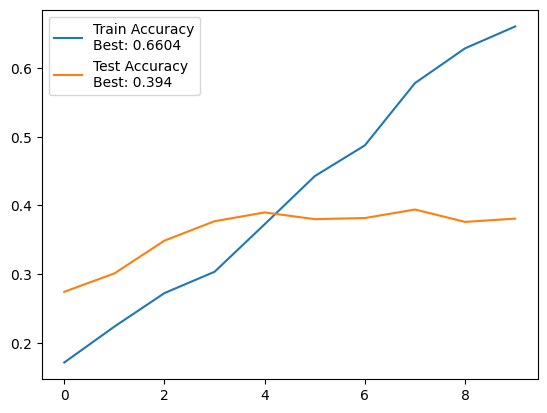

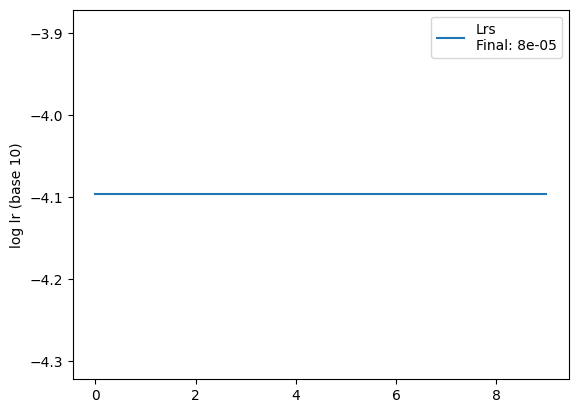

 90%|█████████ | 9/10 [01:02<00:07,  7.00s/it]

 Train accuracy: 70.0%, Avg loss: 0.001002, lr: 8e-05


100%|██████████| 10/10 [01:10<00:00,  7.01s/it]

 Test accuracy: 39.6%, Avg loss: 3.430616


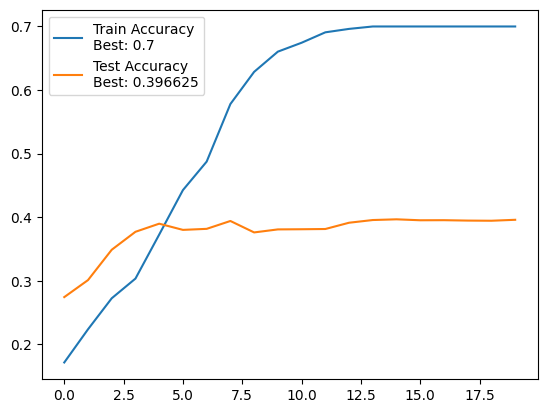

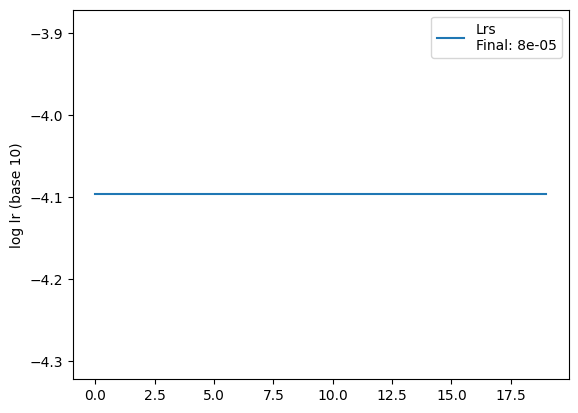

 90%|█████████ | 9/10 [01:04<00:07,  7.15s/it]

 Train accuracy: 70.0%, Avg loss: 0.000408, lr: 8e-05


100%|██████████| 10/10 [01:11<00:00,  7.19s/it]

 Test accuracy: 39.6%, Avg loss: 3.662909


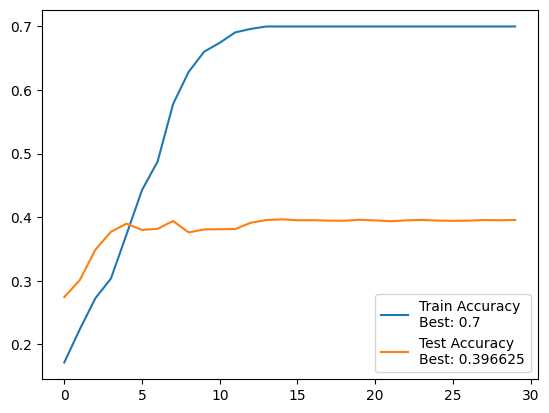

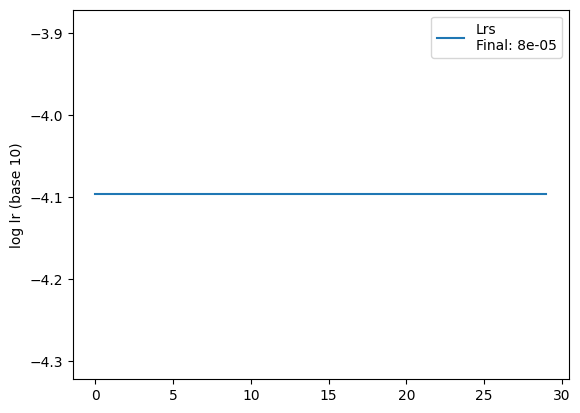

 90%|█████████ | 9/10 [01:04<00:07,  7.08s/it]

 Train accuracy: 70.0%, Avg loss: 0.000205, lr: 8e-05


100%|██████████| 10/10 [01:14<00:00,  7.42s/it]

 Test accuracy: 39.5%, Avg loss: 3.863016


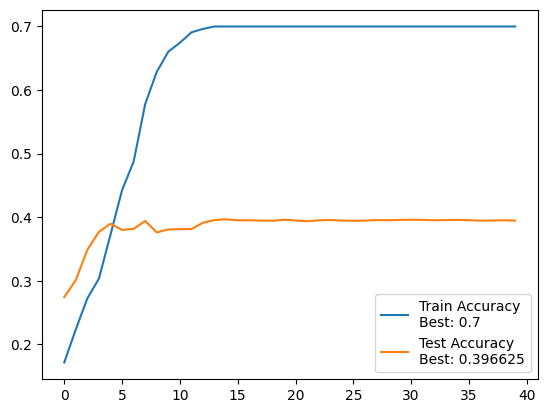

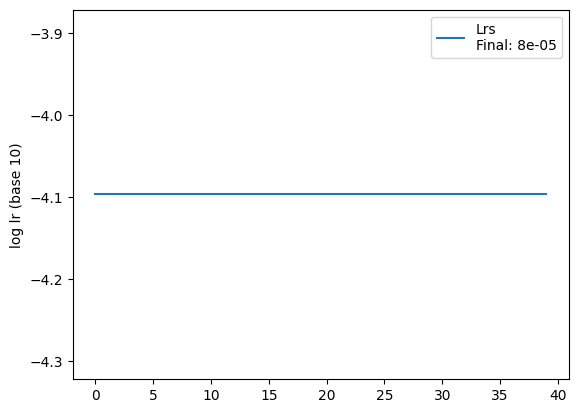

 90%|█████████ | 9/10 [01:02<00:06,  6.97s/it]

 Train accuracy: 70.0%, Avg loss: 0.000113, lr: 8e-05


100%|██████████| 10/10 [01:09<00:00,  6.96s/it]

 Test accuracy: 39.3%, Avg loss: 4.052637


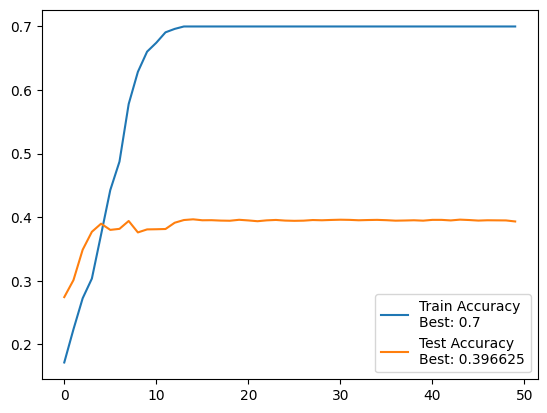

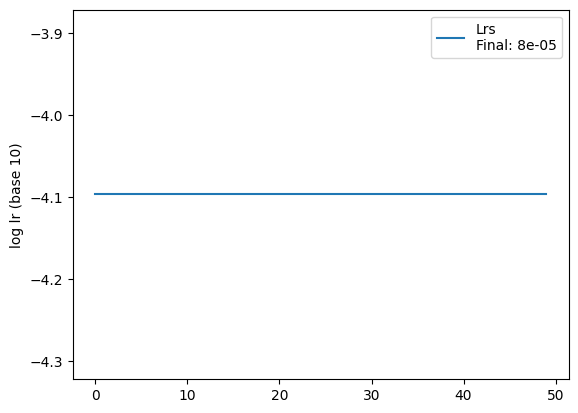

 90%|█████████ | 9/10 [01:03<00:07,  7.02s/it]

 Train accuracy: 70.0%, Avg loss: 0.000064, lr: 8e-05


100%|██████████| 10/10 [01:10<00:00,  7.05s/it]

 Test accuracy: 39.4%, Avg loss: 4.237410


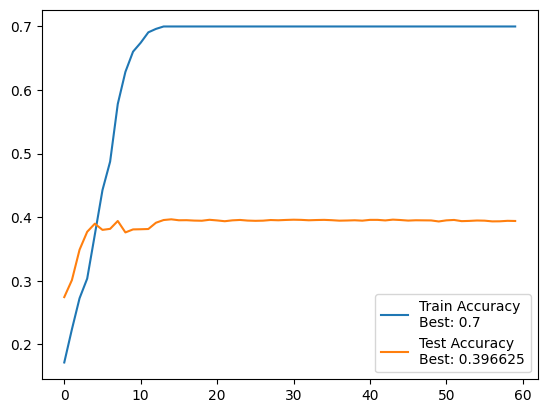

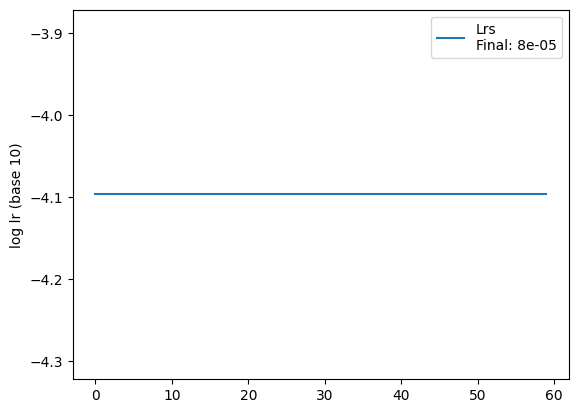

 90%|█████████ | 9/10 [01:02<00:06,  6.96s/it]

 Train accuracy: 70.0%, Avg loss: 0.000038, lr: 8e-05


100%|██████████| 10/10 [01:09<00:00,  6.98s/it]

 Test accuracy: 39.4%, Avg loss: 4.426999


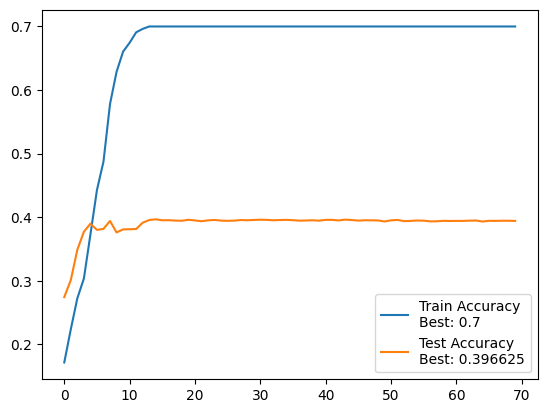

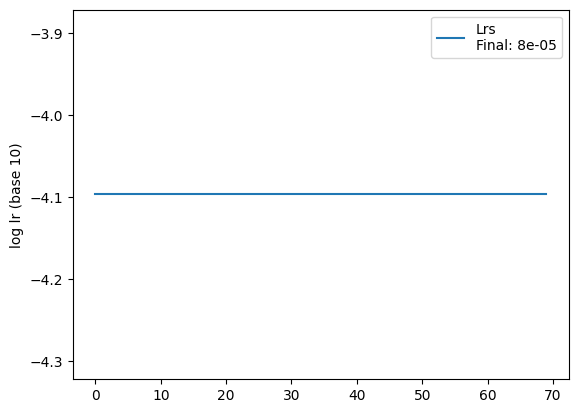

 90%|█████████ | 9/10 [01:02<00:06,  6.98s/it]

 Train accuracy: 70.0%, Avg loss: 0.000023, lr: 8e-05


100%|██████████| 10/10 [01:09<00:00,  6.99s/it]

 Test accuracy: 39.4%, Avg loss: 4.620527


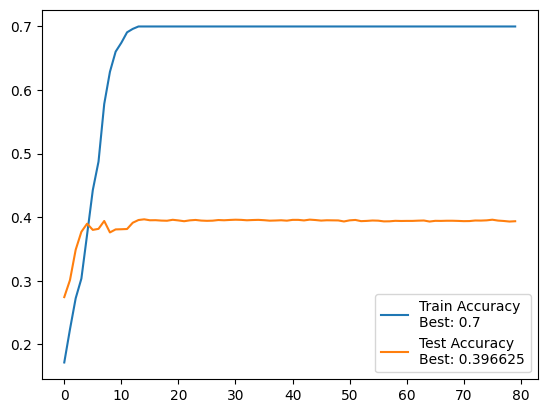

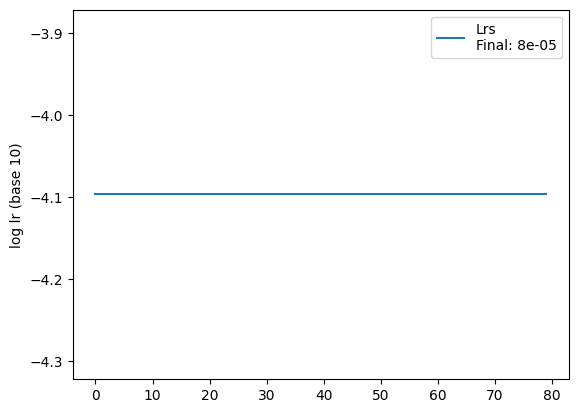

 90%|█████████ | 9/10 [01:02<00:07,  7.01s/it]

 Train accuracy: 70.0%, Avg loss: 0.000014, lr: 8e-05


100%|██████████| 10/10 [01:10<00:00,  7.03s/it]

 Test accuracy: 39.4%, Avg loss: 4.818588


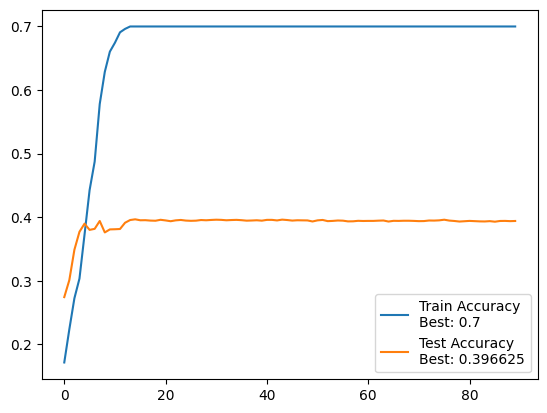

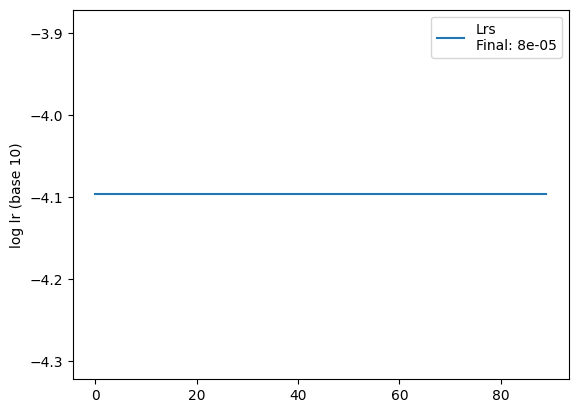

 90%|█████████ | 9/10 [01:05<00:07,  7.22s/it]

 Train accuracy: 70.0%, Avg loss: 0.000008, lr: 8e-05


100%|██████████| 10/10 [01:12<00:00,  7.24s/it]

 Test accuracy: 39.4%, Avg loss: 5.026164


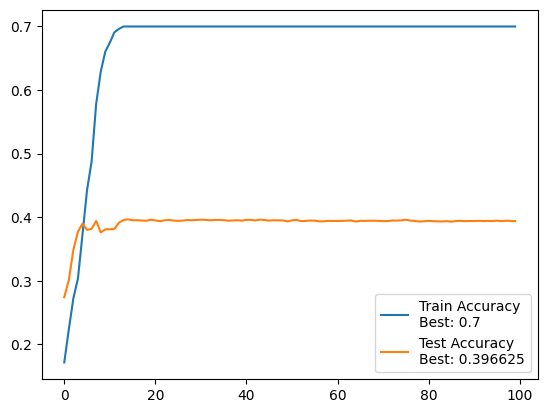

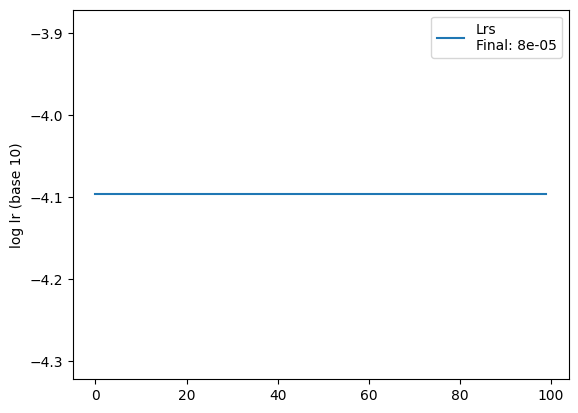

 90%|█████████ | 9/10 [01:01<00:06,  6.80s/it]

 Train accuracy: 70.0%, Avg loss: 0.000005, lr: 8e-05


100%|██████████| 10/10 [01:08<00:00,  6.84s/it]

 Test accuracy: 39.4%, Avg loss: 5.240818


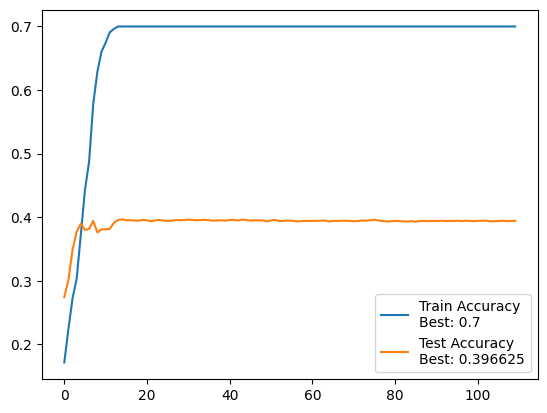

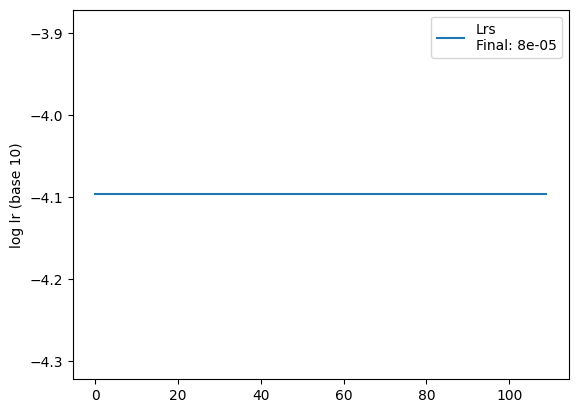

 90%|█████████ | 9/10 [01:01<00:06,  6.80s/it]

 Train accuracy: 70.0%, Avg loss: 0.000003, lr: 8e-05


100%|██████████| 10/10 [01:08<00:00,  6.82s/it]

 Test accuracy: 39.5%, Avg loss: 5.464309


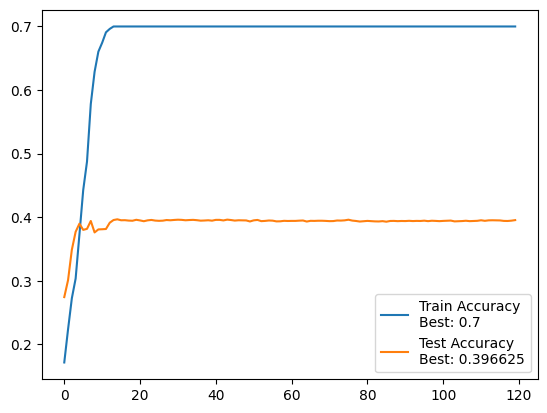

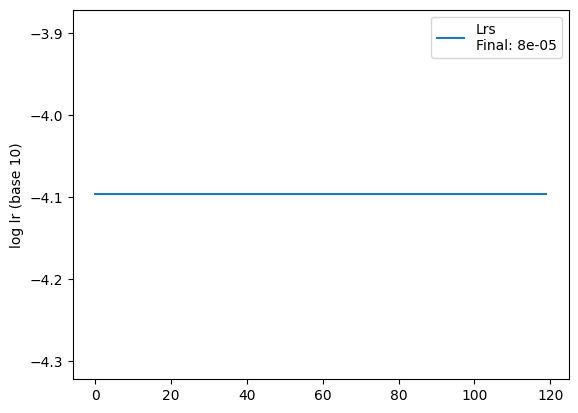

 90%|█████████ | 9/10 [01:01<00:06,  6.83s/it]

 Train accuracy: 70.0%, Avg loss: 0.000002, lr: 8e-05


100%|██████████| 10/10 [01:08<00:00,  6.85s/it]

 Test accuracy: 39.4%, Avg loss: 5.694373


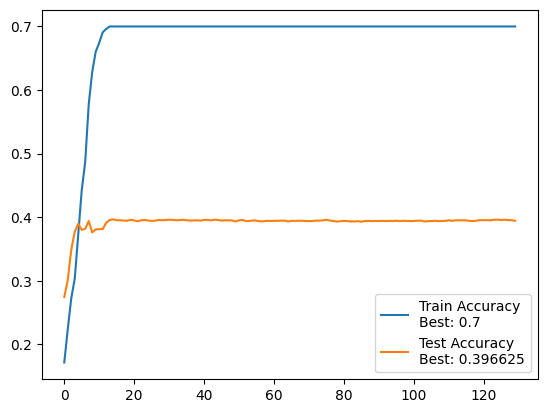

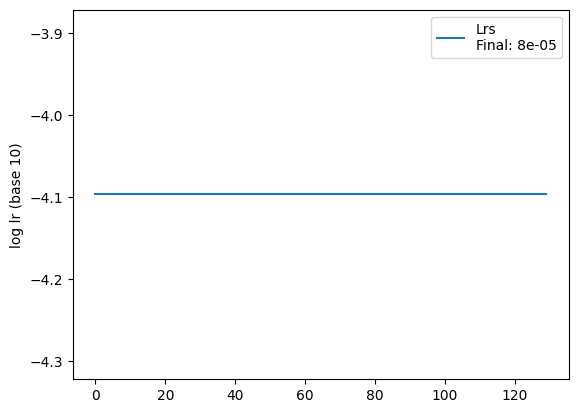

 90%|█████████ | 9/10 [01:03<00:07,  7.08s/it]

 Train accuracy: 70.0%, Avg loss: 0.000001, lr: 8e-05


100%|██████████| 10/10 [01:11<00:00,  7.11s/it]

 Test accuracy: 39.5%, Avg loss: 5.934063


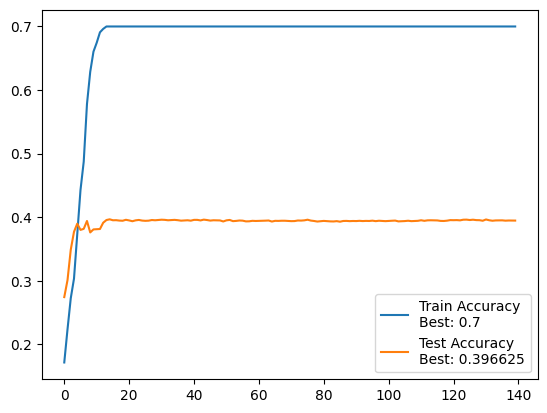

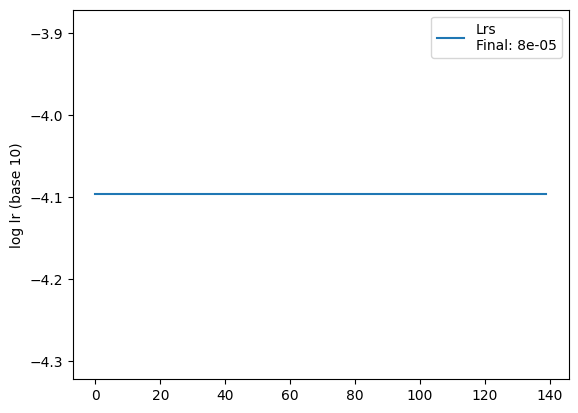

 90%|█████████ | 9/10 [01:03<00:07,  7.06s/it]

 Train accuracy: 70.0%, Avg loss: 0.000001, lr: 8e-05


100%|██████████| 10/10 [01:10<00:00,  7.09s/it]

 Test accuracy: 39.6%, Avg loss: 6.177048


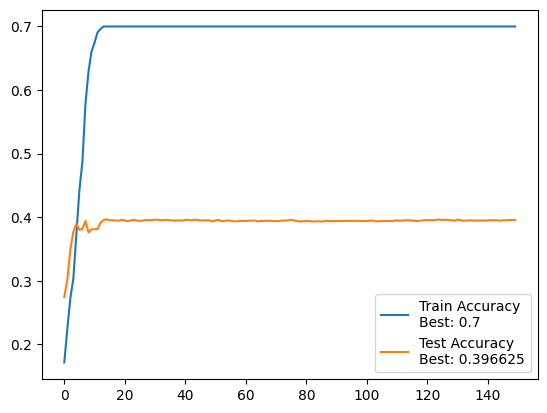

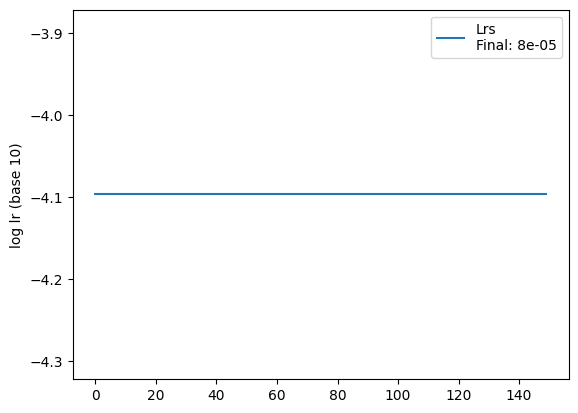

 90%|█████████ | 9/10 [01:04<00:07,  7.24s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8e-05


100%|██████████| 10/10 [01:12<00:00,  7.22s/it]

 Test accuracy: 39.6%, Avg loss: 6.423827


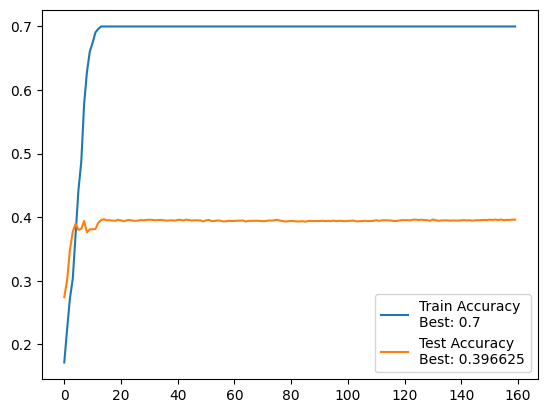

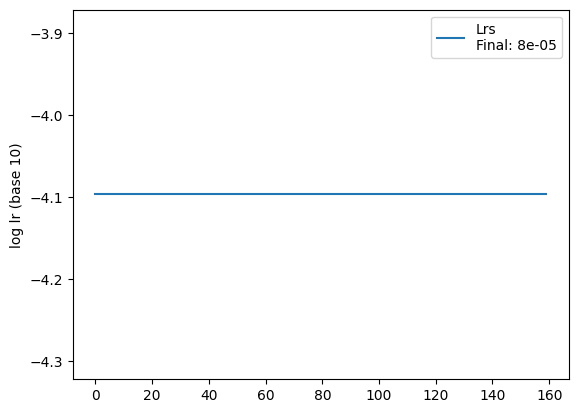

 90%|█████████ | 9/10 [01:04<00:07,  7.12s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8e-05


100%|██████████| 10/10 [01:11<00:00,  7.17s/it]

 Test accuracy: 39.7%, Avg loss: 6.661491


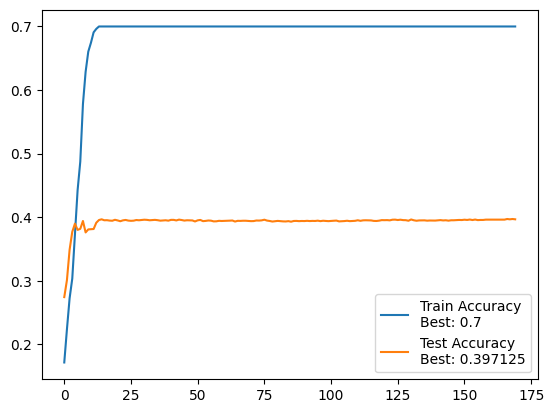

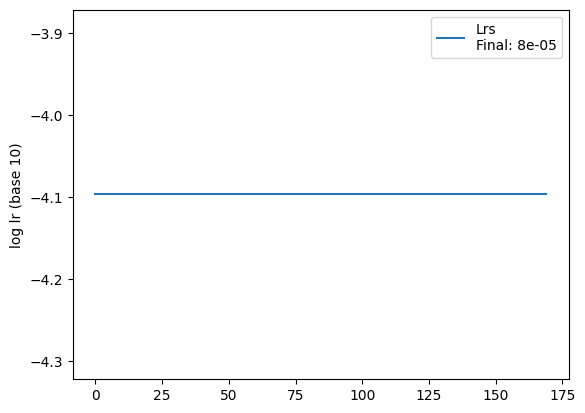

 90%|█████████ | 9/10 [01:03<00:07,  7.09s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8e-05


100%|██████████| 10/10 [01:11<00:00,  7.10s/it]

 Test accuracy: 39.6%, Avg loss: 6.889543


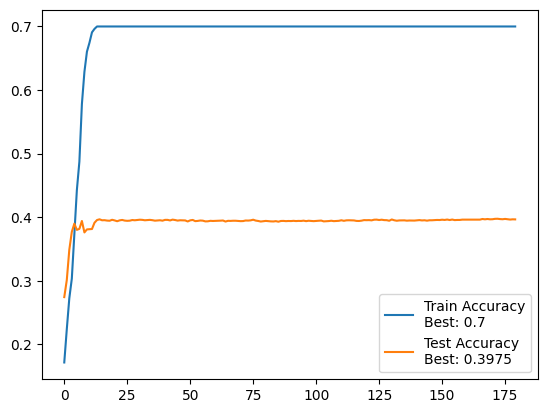

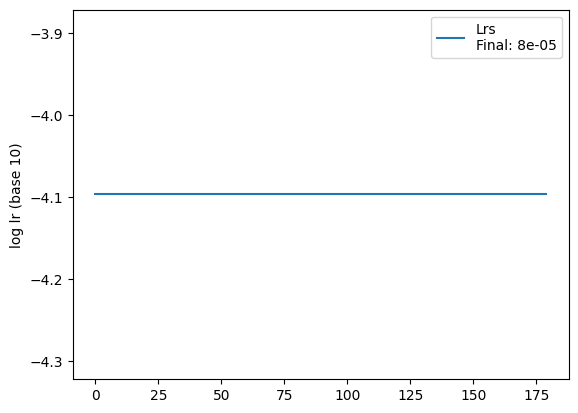

 90%|█████████ | 9/10 [01:04<00:07,  7.17s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8e-05


100%|██████████| 10/10 [01:11<00:00,  7.15s/it]

 Test accuracy: 39.8%, Avg loss: 7.073020


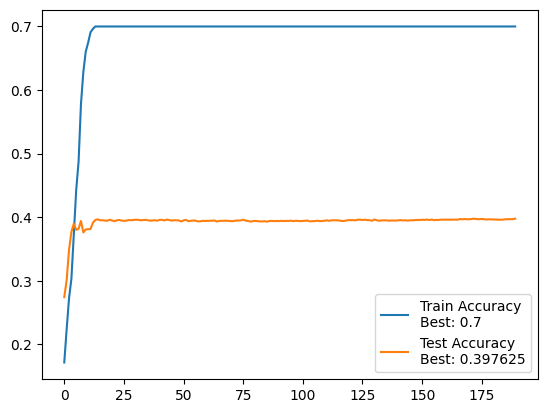

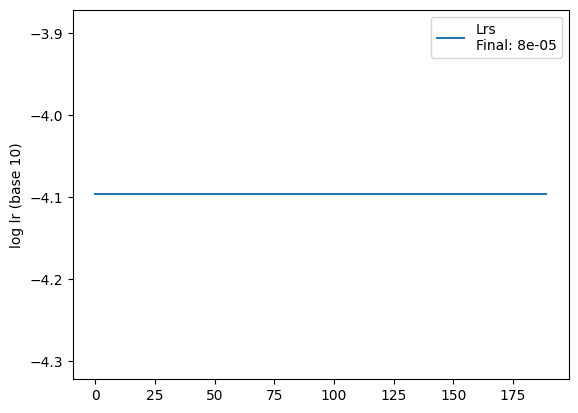

 90%|█████████ | 9/10 [01:05<00:07,  7.24s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8e-05


100%|██████████| 10/10 [01:12<00:00,  7.26s/it]

 Test accuracy: 39.7%, Avg loss: 7.172364


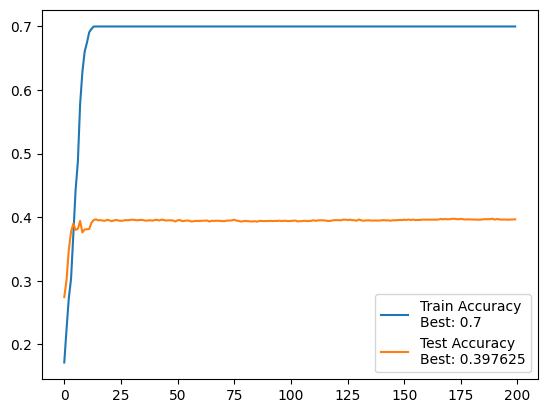

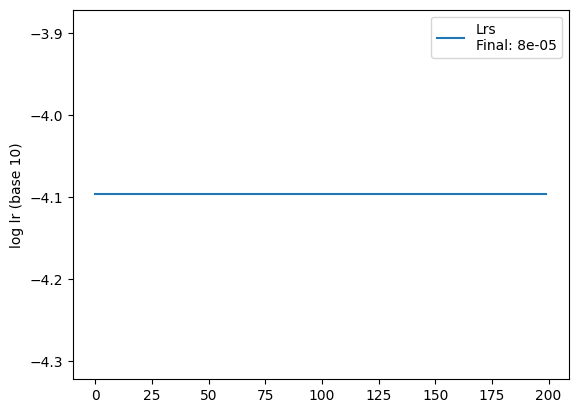

 90%|█████████ | 9/10 [01:05<00:07,  7.38s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8e-05


100%|██████████| 10/10 [01:12<00:00,  7.28s/it]

 Test accuracy: 39.7%, Avg loss: 7.160082


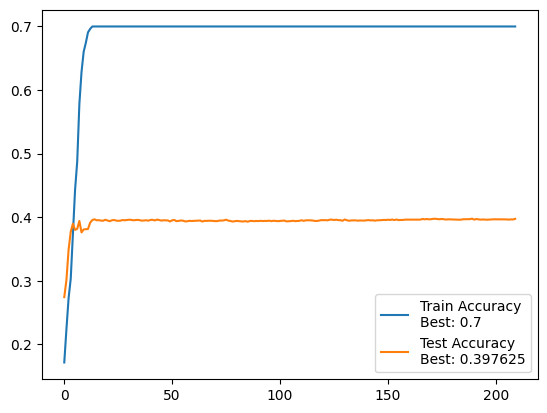

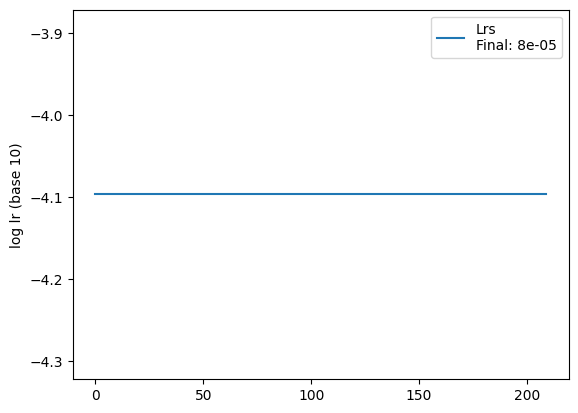

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8e-05


100%|██████████| 10/10 [01:13<00:00,  7.40s/it]

 Test accuracy: 39.6%, Avg loss: 6.903961


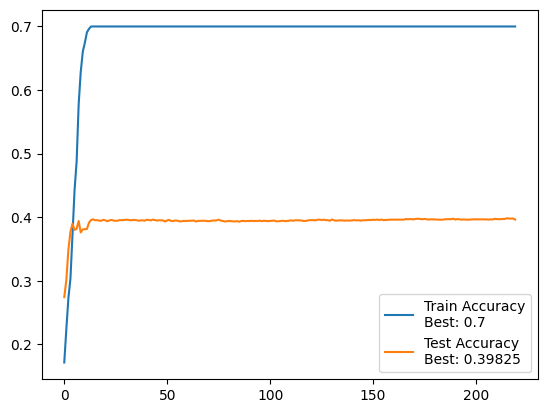

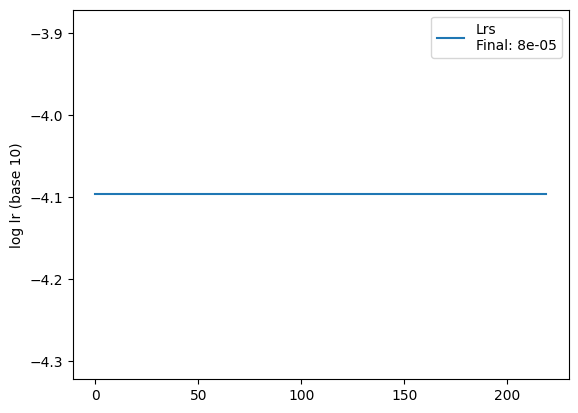

 90%|█████████ | 9/10 [01:05<00:07,  7.32s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000001e-06


100%|██████████| 10/10 [01:13<00:00,  7.32s/it]

 Test accuracy: 39.7%, Avg loss: 6.786978


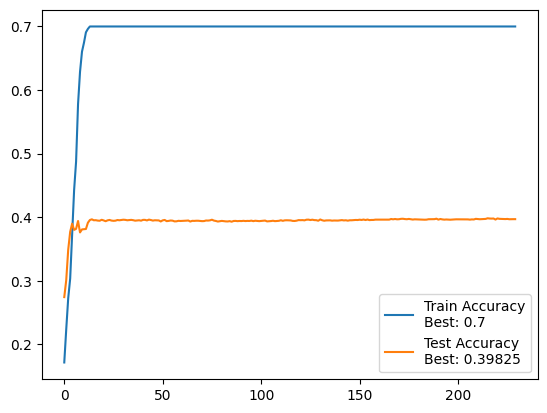

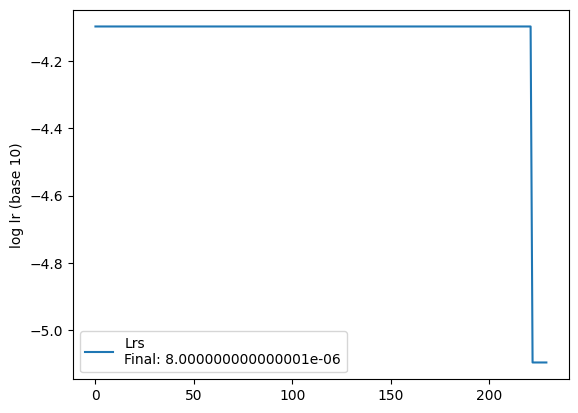

 90%|█████████ | 9/10 [01:06<00:07,  7.35s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000002e-07


100%|██████████| 10/10 [01:13<00:00,  7.34s/it]

 Test accuracy: 39.7%, Avg loss: 6.767239


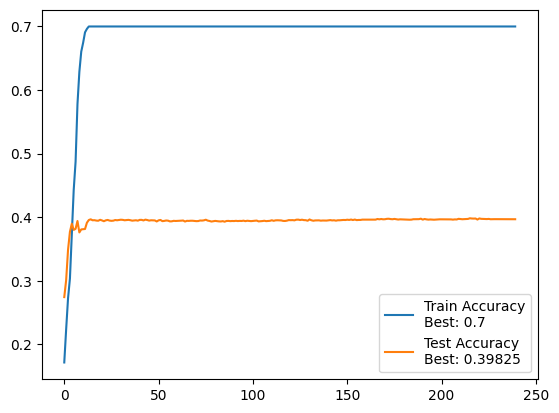

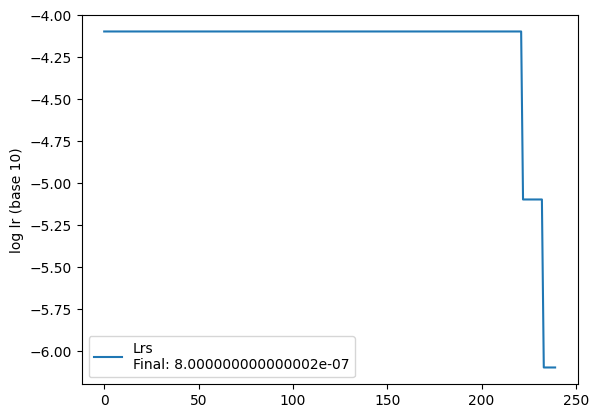

 90%|█████████ | 9/10 [01:07<00:07,  7.42s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000003e-08


100%|██████████| 10/10 [01:14<00:00,  7.48s/it]

 Test accuracy: 39.7%, Avg loss: 6.764938


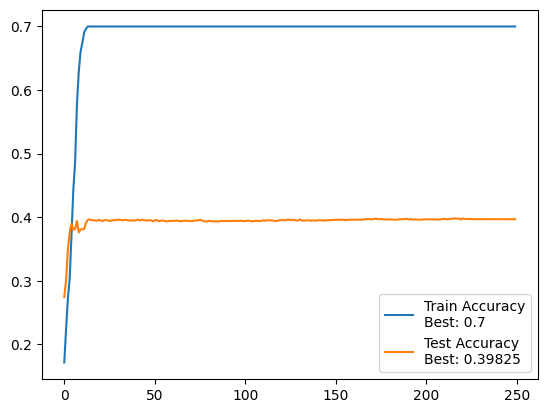

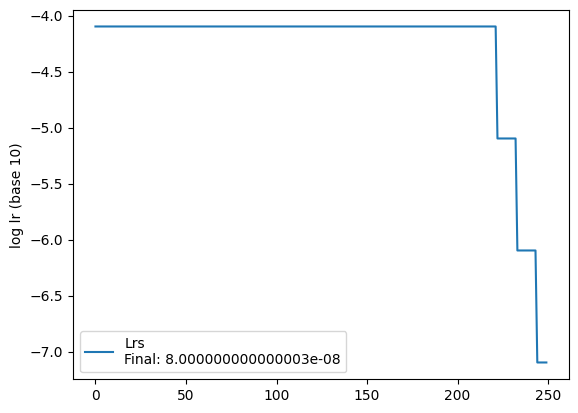

 90%|█████████ | 9/10 [01:05<00:07,  7.29s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.30s/it]

 Test accuracy: 39.7%, Avg loss: 6.765029


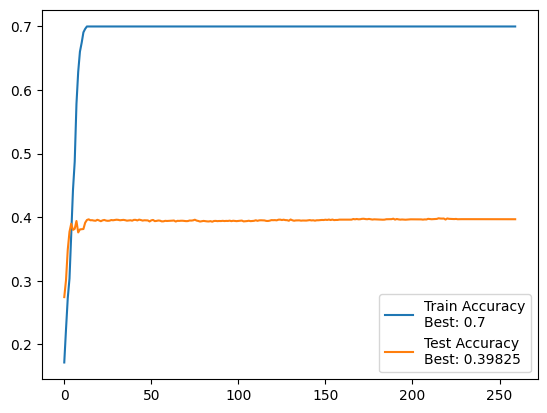

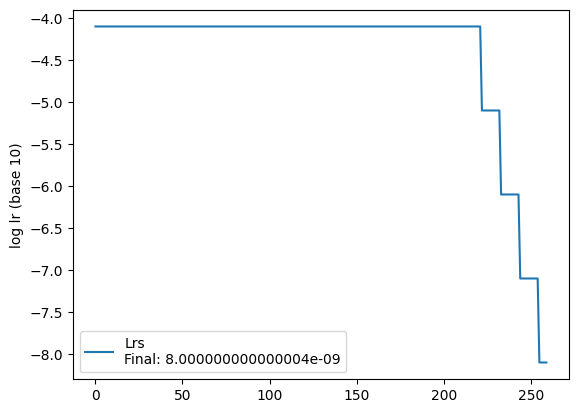

 90%|█████████ | 9/10 [01:05<00:07,  7.30s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.33s/it]

 Test accuracy: 39.7%, Avg loss: 6.765027


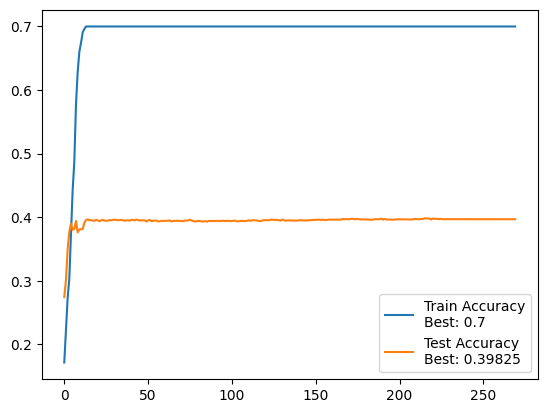

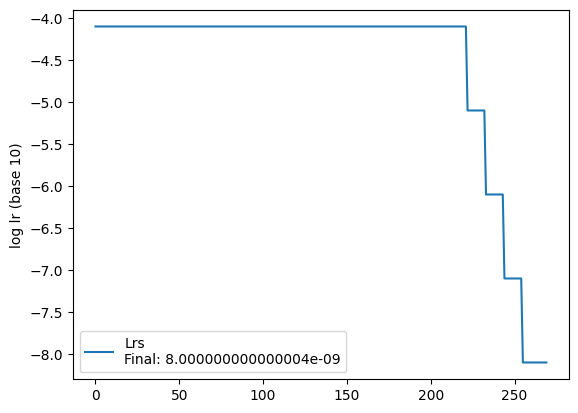

 90%|█████████ | 9/10 [01:05<00:07,  7.28s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:12<00:00,  7.30s/it]

 Test accuracy: 39.7%, Avg loss: 6.765048


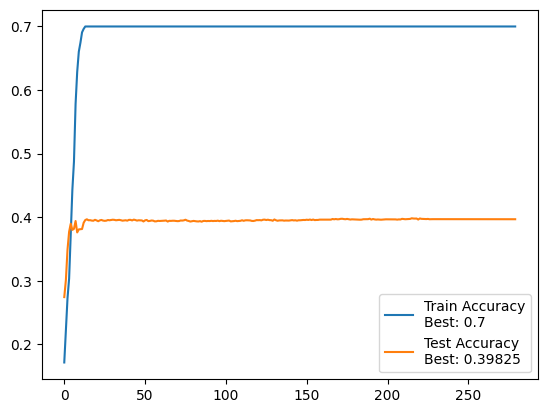

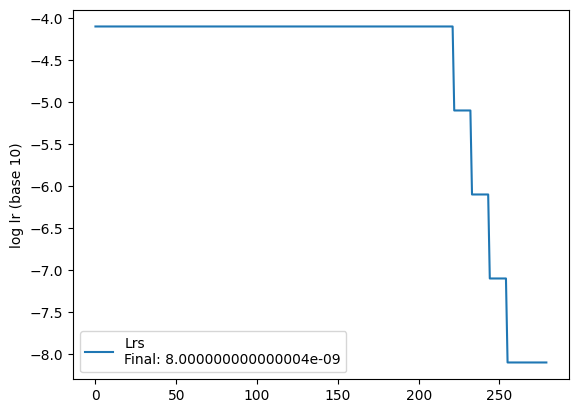

 90%|█████████ | 9/10 [01:05<00:07,  7.31s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.32s/it]

 Test accuracy: 39.7%, Avg loss: 6.765109


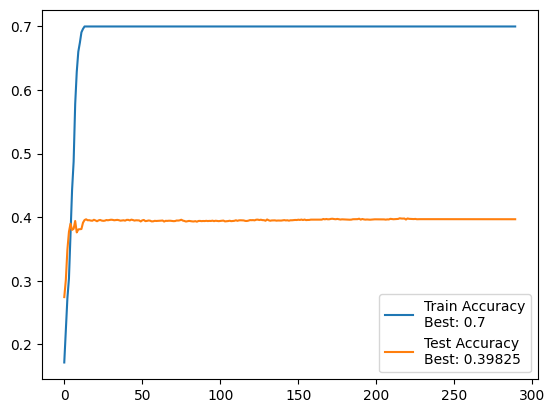

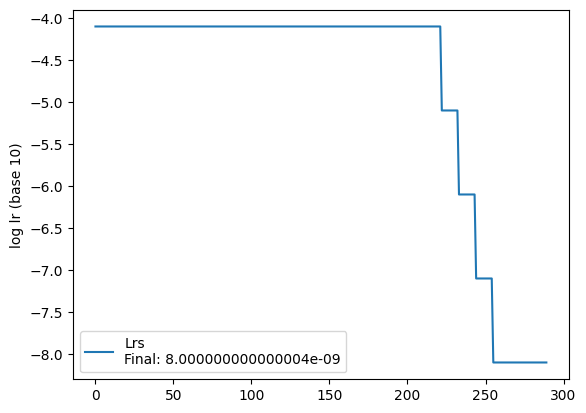

 90%|█████████ | 9/10 [01:07<00:07,  7.58s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:15<00:00,  7.55s/it]

 Test accuracy: 39.7%, Avg loss: 6.765209


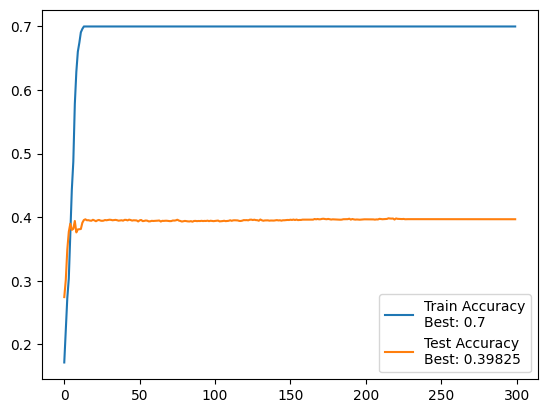

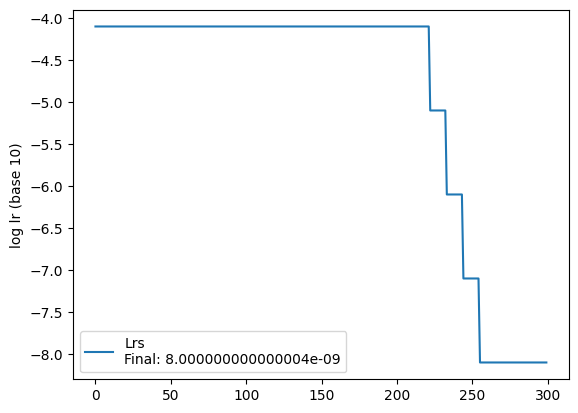

 90%|█████████ | 9/10 [01:06<00:07,  7.41s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:14<00:00,  7.42s/it]

 Test accuracy: 39.7%, Avg loss: 6.765333


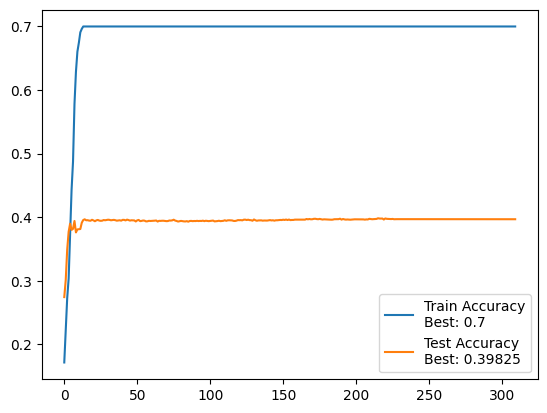

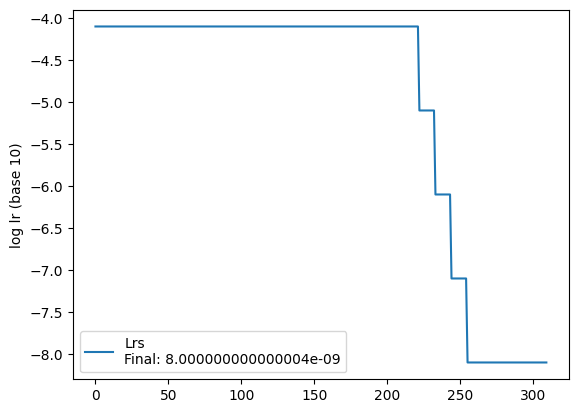

 90%|█████████ | 9/10 [01:06<00:07,  7.41s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:14<00:00,  7.41s/it]

 Test accuracy: 39.7%, Avg loss: 6.765468


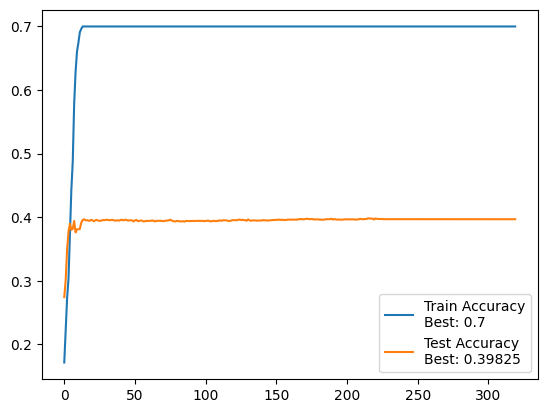

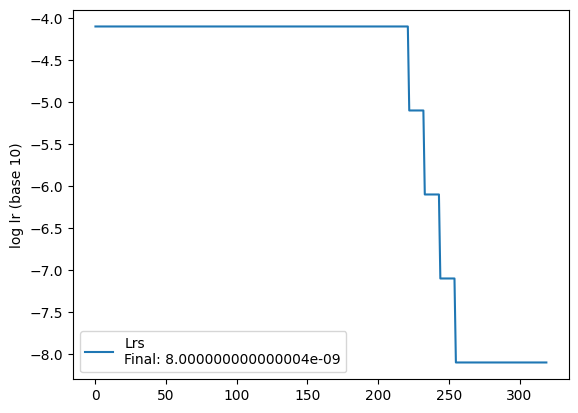

 90%|█████████ | 9/10 [01:07<00:07,  7.48s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:14<00:00,  7.45s/it]

 Test accuracy: 39.7%, Avg loss: 6.765606


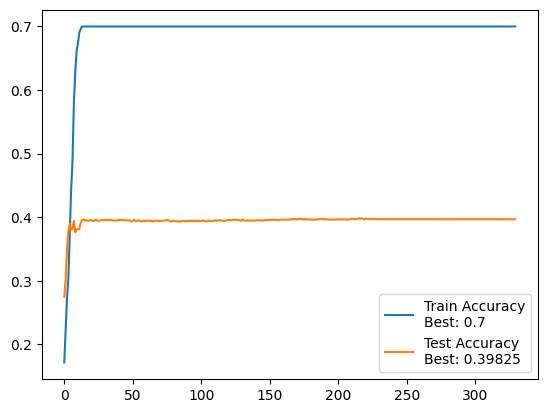

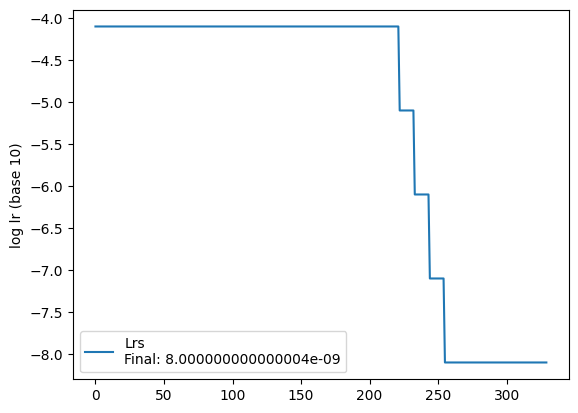

 90%|█████████ | 9/10 [01:05<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.33s/it]

 Test accuracy: 39.7%, Avg loss: 6.765743


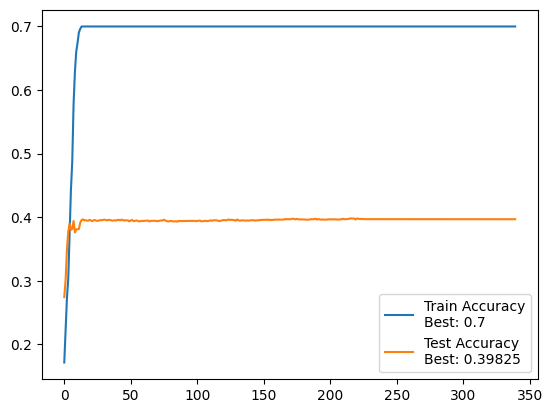

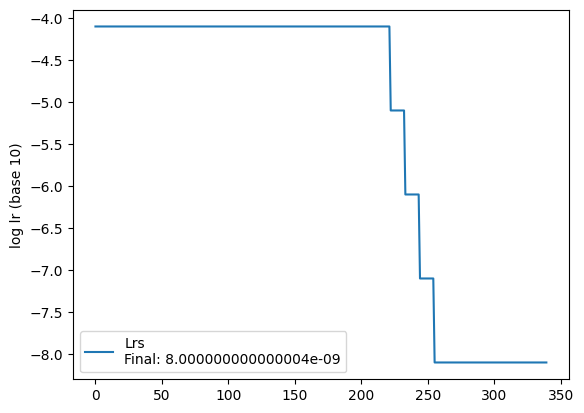

 90%|█████████ | 9/10 [01:06<00:07,  7.35s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:14<00:00,  7.41s/it]

 Test accuracy: 39.7%, Avg loss: 6.765882


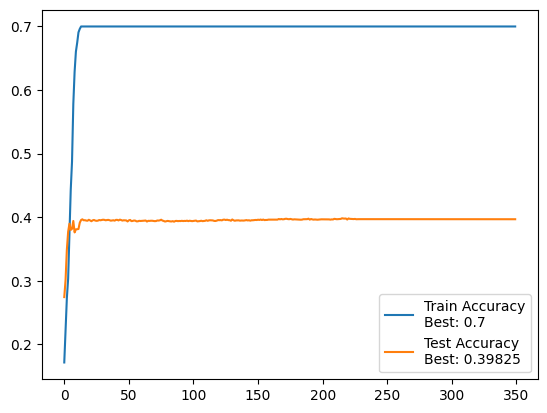

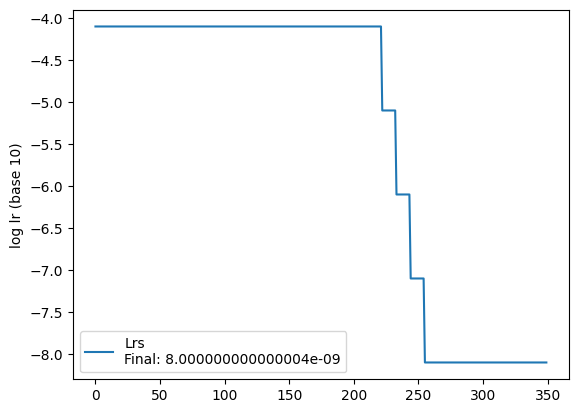

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.35s/it]

 Test accuracy: 39.7%, Avg loss: 6.766019


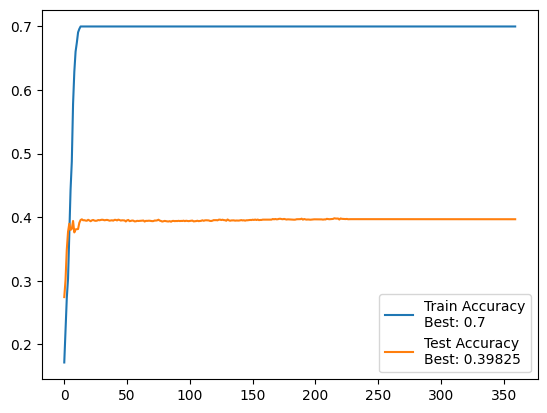

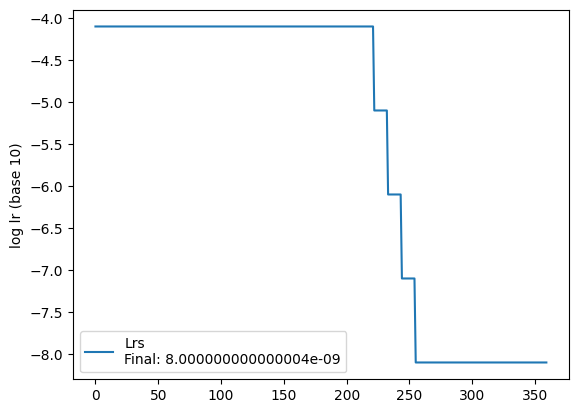

 90%|█████████ | 9/10 [01:05<00:07,  7.33s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.34s/it]

 Test accuracy: 39.7%, Avg loss: 6.766155


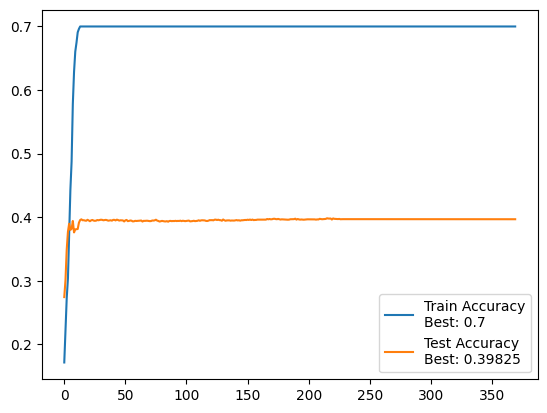

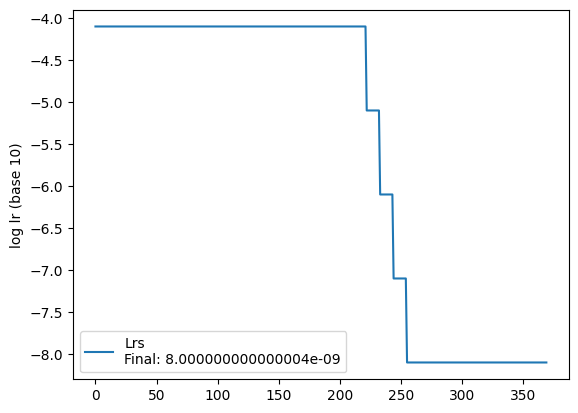

 90%|█████████ | 9/10 [01:06<00:07,  7.53s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:14<00:00,  7.44s/it]

 Test accuracy: 39.7%, Avg loss: 6.766290


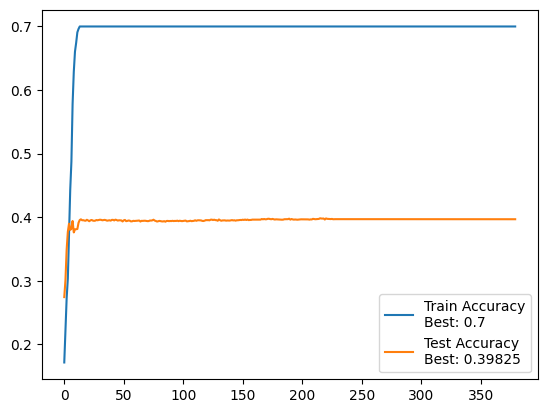

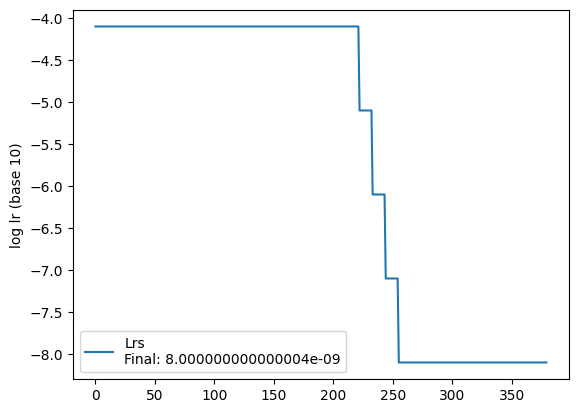

 90%|█████████ | 9/10 [01:06<00:07,  7.39s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:14<00:00,  7.41s/it]

 Test accuracy: 39.7%, Avg loss: 6.766425


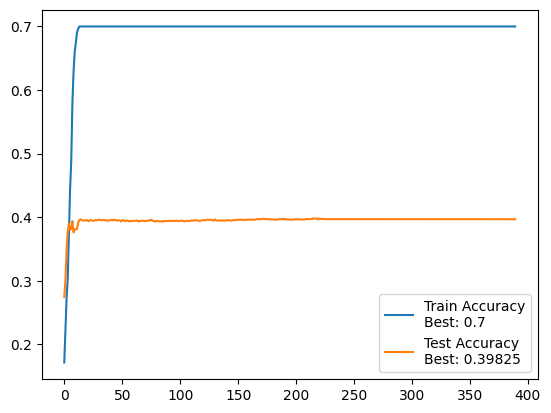

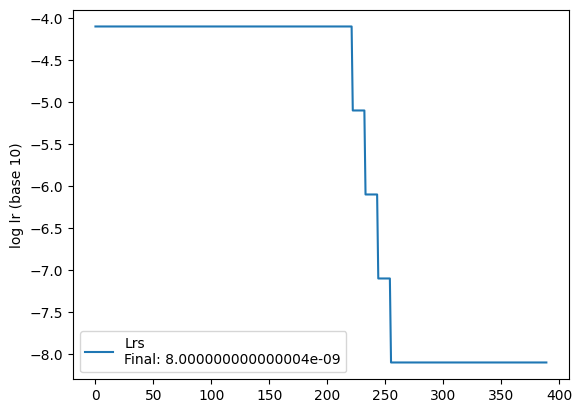

 90%|█████████ | 9/10 [01:06<00:07,  7.39s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.38s/it]

 Test accuracy: 39.7%, Avg loss: 6.766560


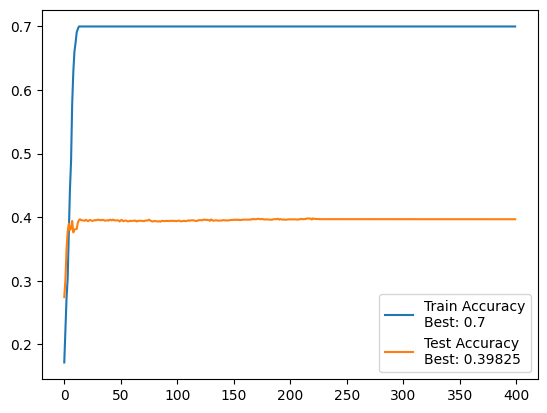

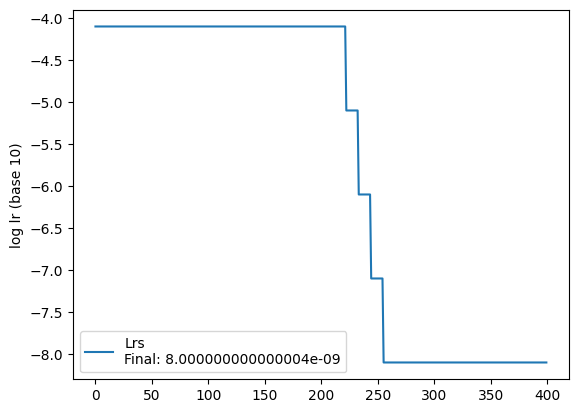

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.35s/it]

 Test accuracy: 39.7%, Avg loss: 6.766692


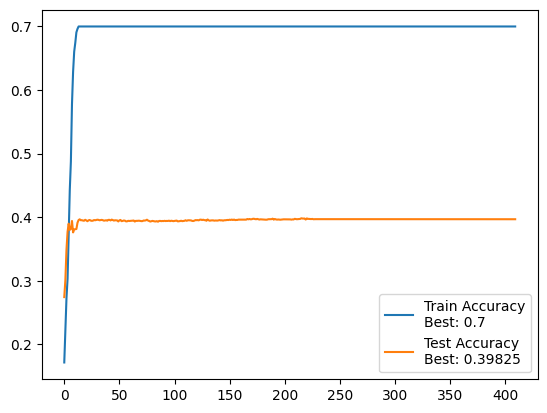

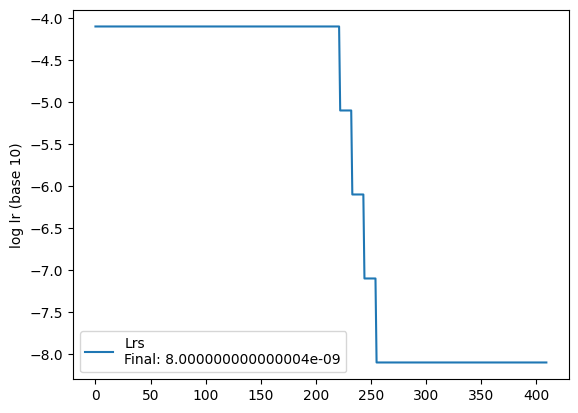

 90%|█████████ | 9/10 [01:05<00:07,  7.32s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.34s/it]

 Test accuracy: 39.7%, Avg loss: 6.766824


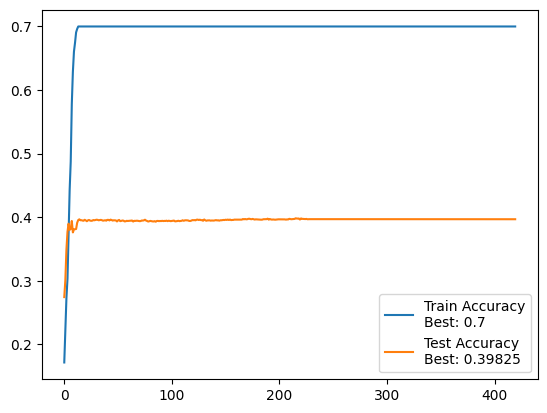

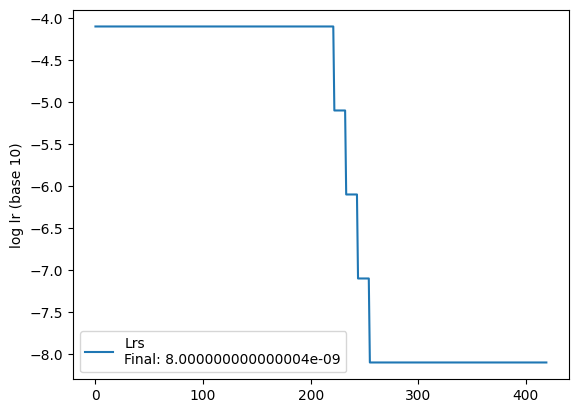

 90%|█████████ | 9/10 [01:05<00:07,  7.30s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.33s/it]

 Test accuracy: 39.7%, Avg loss: 6.766956


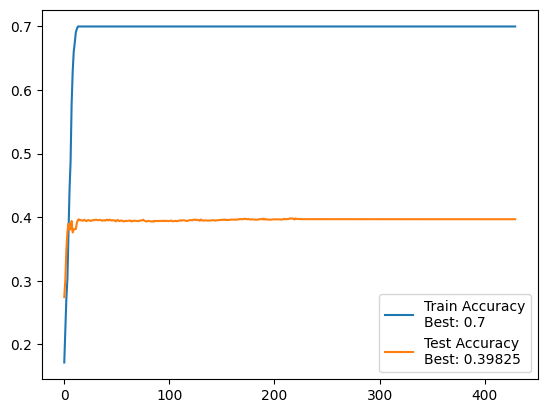

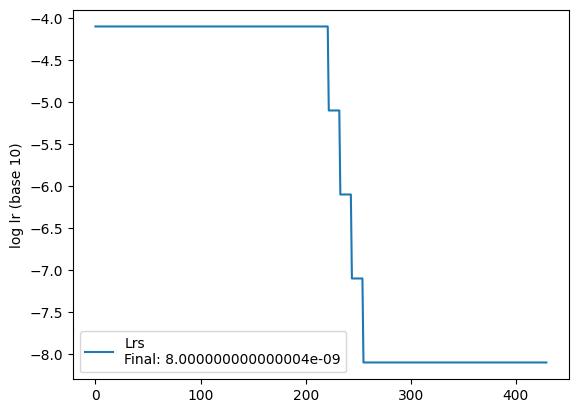

 90%|█████████ | 9/10 [01:08<00:07,  7.52s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:15<00:00,  7.56s/it]

 Test accuracy: 39.7%, Avg loss: 6.767087


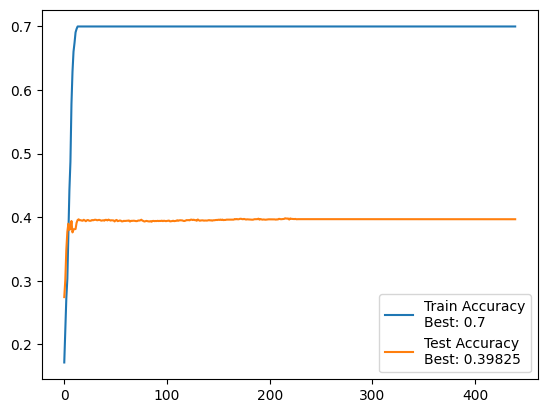

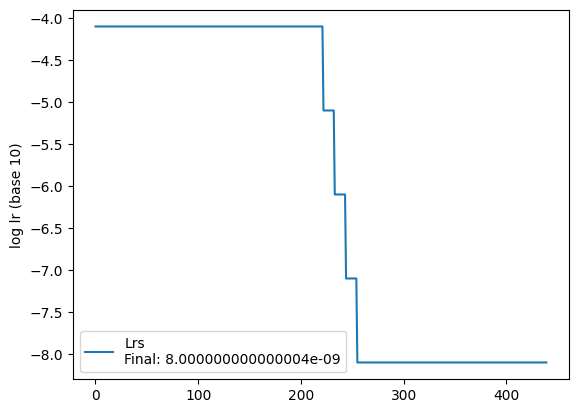

 90%|█████████ | 9/10 [01:08<00:07,  7.68s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:16<00:00,  7.65s/it]

 Test accuracy: 39.7%, Avg loss: 6.767218


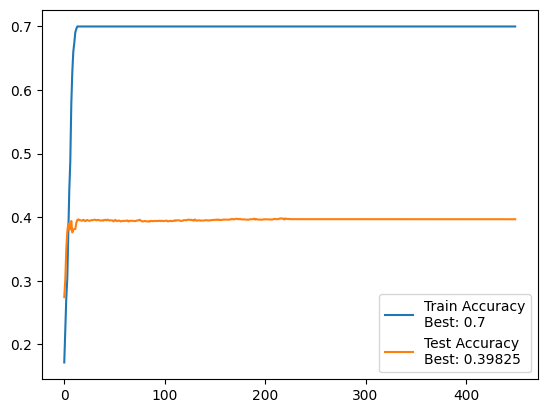

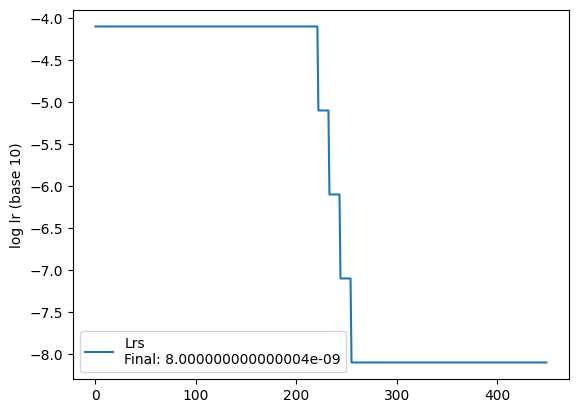

 90%|█████████ | 9/10 [01:06<00:07,  7.42s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:14<00:00,  7.41s/it]

 Test accuracy: 39.7%, Avg loss: 6.767348


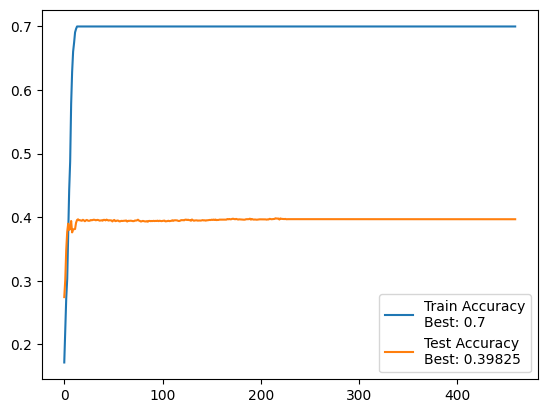

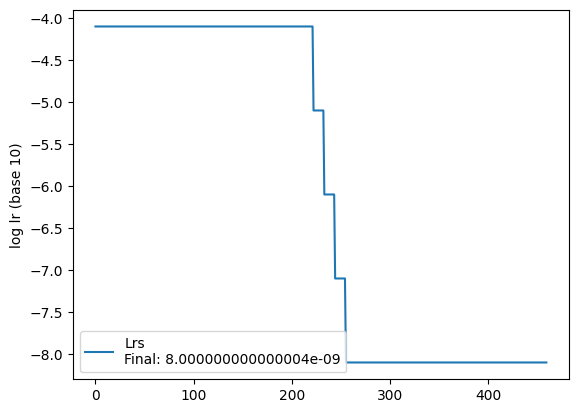

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.39s/it]

 Test accuracy: 39.7%, Avg loss: 6.767477


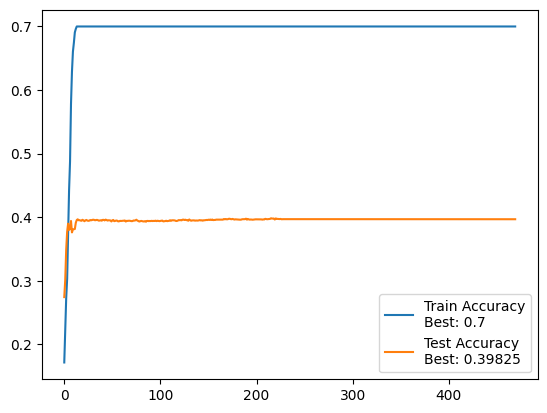

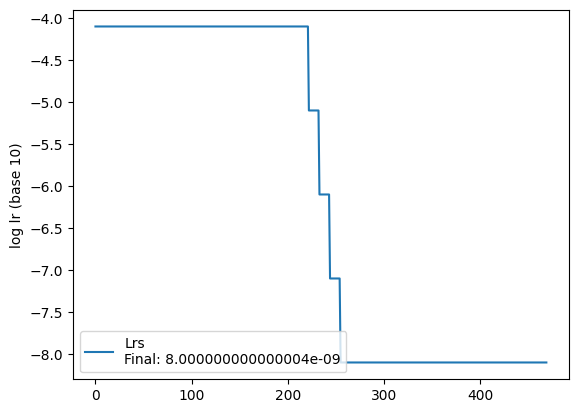

 90%|█████████ | 9/10 [01:05<00:07,  7.30s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.32s/it]

 Test accuracy: 39.7%, Avg loss: 6.767606


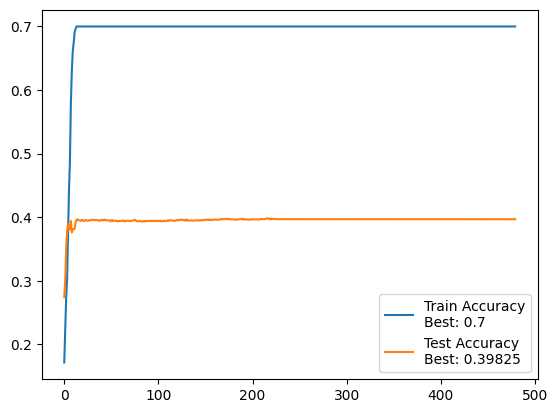

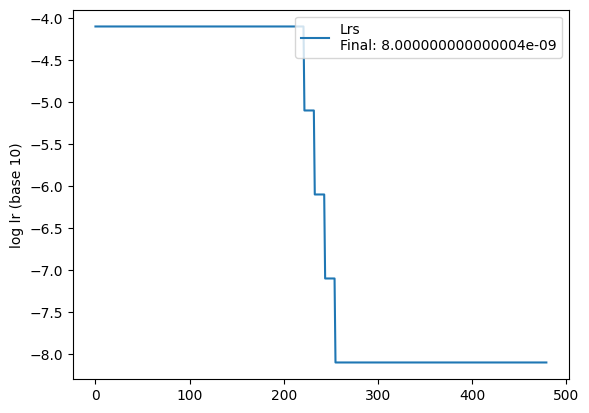

 90%|█████████ | 9/10 [01:05<00:07,  7.28s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.31s/it]

 Test accuracy: 39.7%, Avg loss: 6.767734


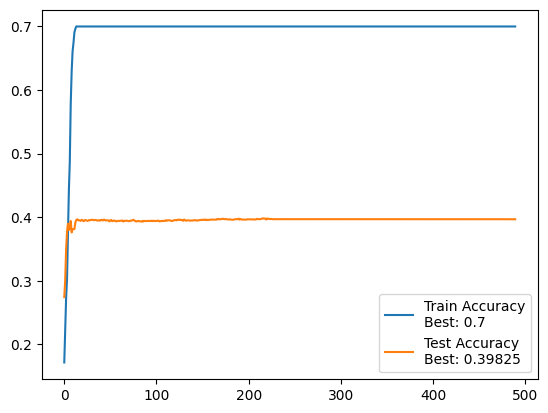

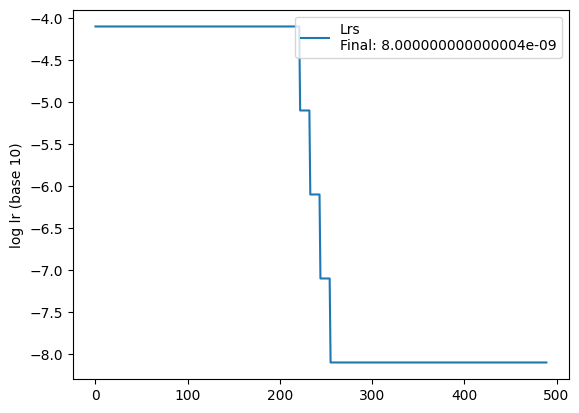

 90%|█████████ | 9/10 [01:06<00:07,  7.38s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:14<00:00,  7.41s/it]

 Test accuracy: 39.7%, Avg loss: 6.767864


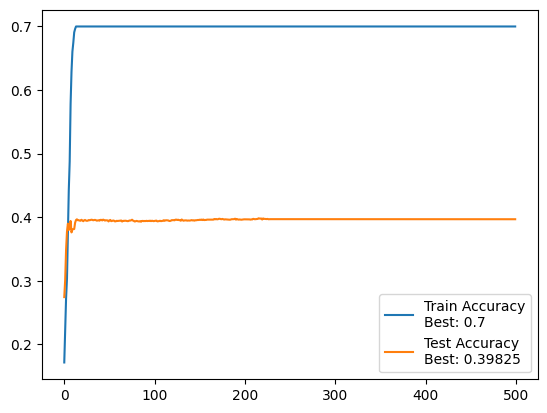

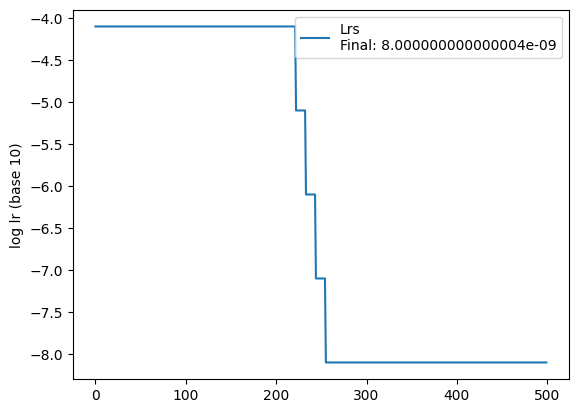

 90%|█████████ | 9/10 [01:06<00:07,  7.40s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.38s/it]

 Test accuracy: 39.7%, Avg loss: 6.767991


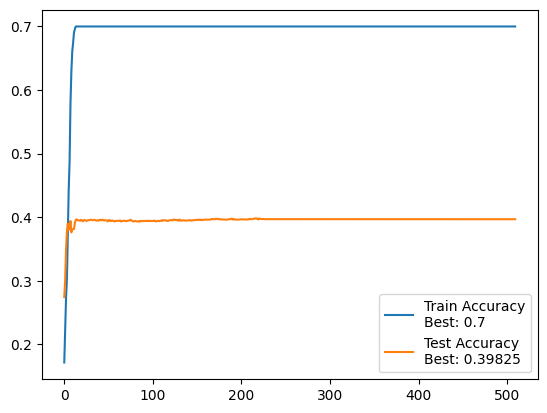

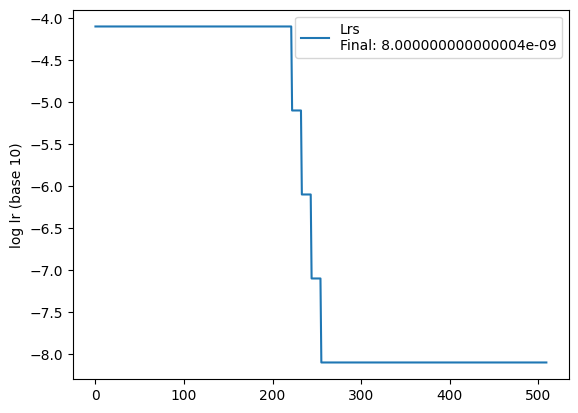

 90%|█████████ | 9/10 [01:06<00:07,  7.35s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.768118


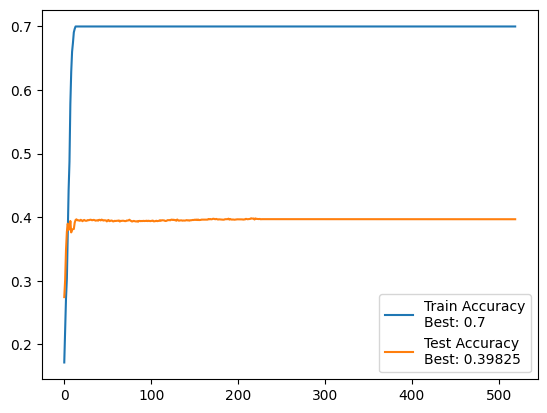

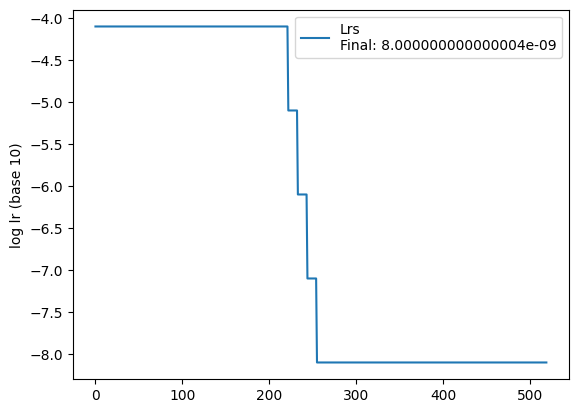

 90%|█████████ | 9/10 [01:06<00:07,  7.41s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:14<00:00,  7.40s/it]

 Test accuracy: 39.7%, Avg loss: 6.768244


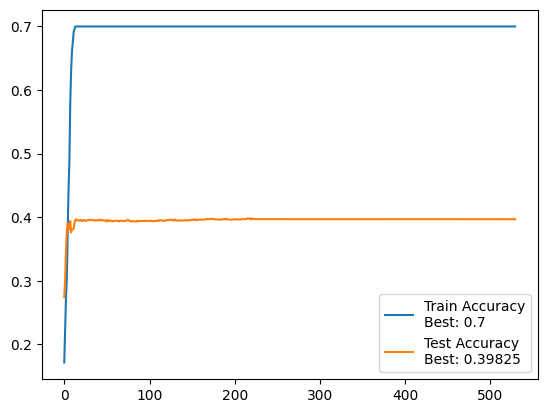

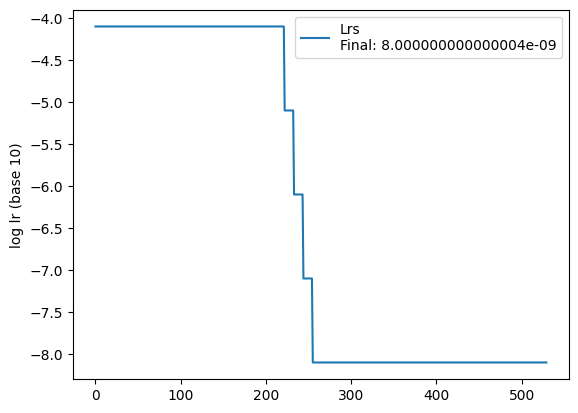

 90%|█████████ | 9/10 [01:05<00:07,  7.31s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.34s/it]

 Test accuracy: 39.7%, Avg loss: 6.768370


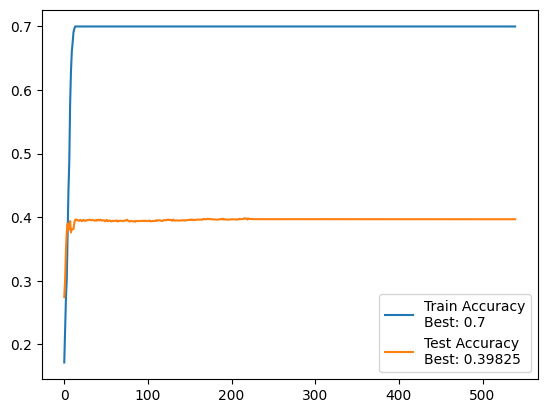

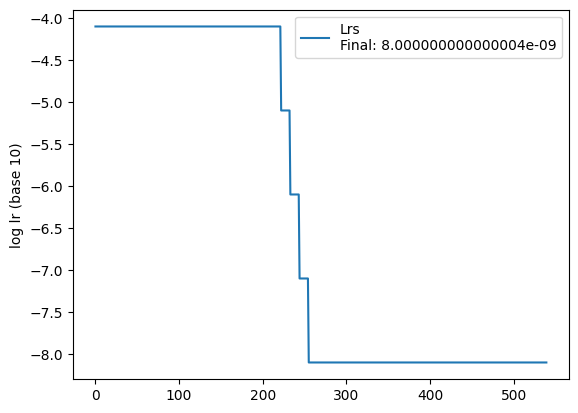

 90%|█████████ | 9/10 [01:05<00:07,  7.36s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.33s/it]

 Test accuracy: 39.7%, Avg loss: 6.768494


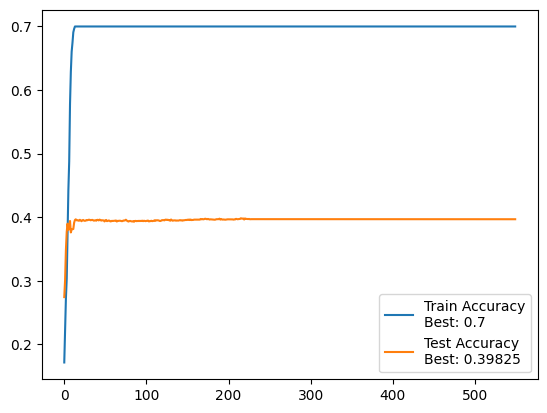

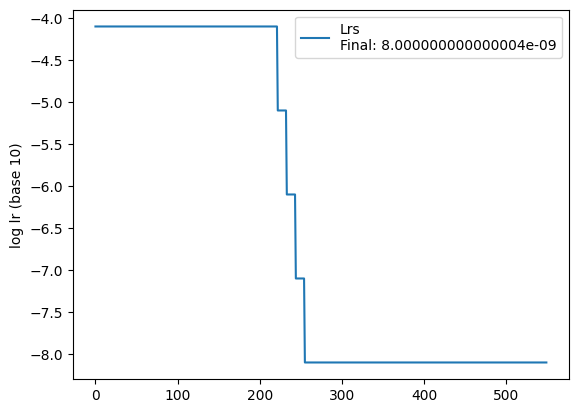

 90%|█████████ | 9/10 [01:04<00:07,  7.21s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:12<00:00,  7.23s/it]

 Test accuracy: 39.7%, Avg loss: 6.768618


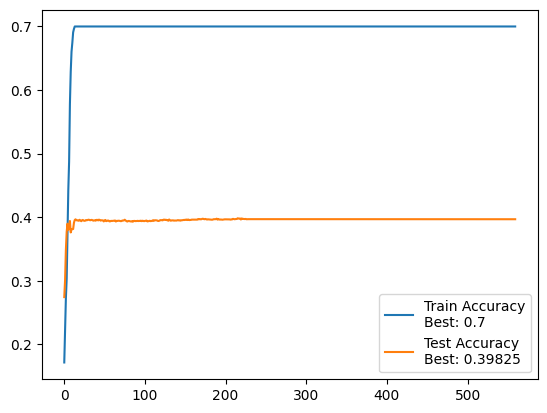

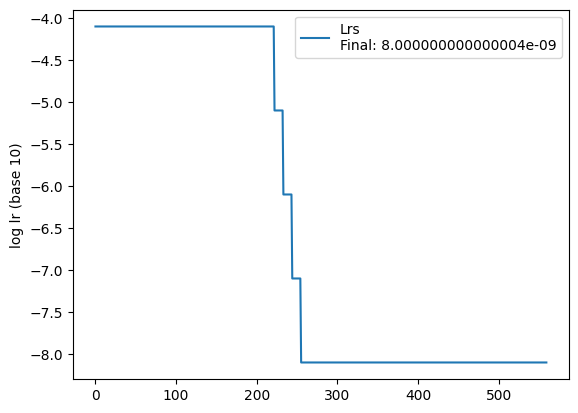

 90%|█████████ | 9/10 [01:04<00:07,  7.22s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:12<00:00,  7.24s/it]

 Test accuracy: 39.7%, Avg loss: 6.768742


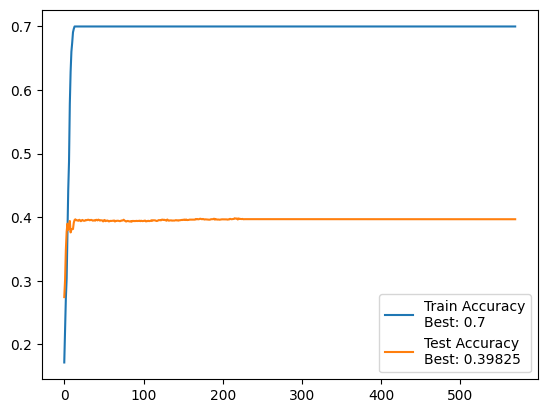

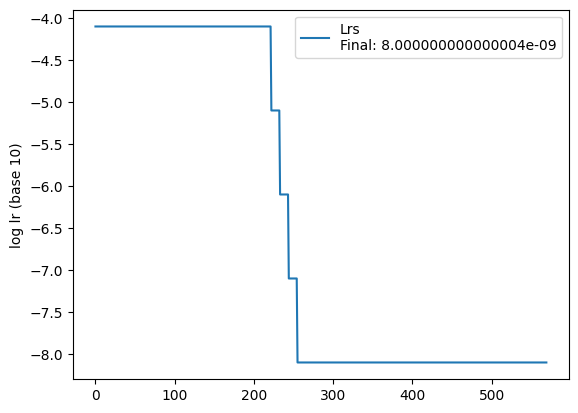

 90%|█████████ | 9/10 [01:05<00:07,  7.23s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:12<00:00,  7.23s/it]

 Test accuracy: 39.7%, Avg loss: 6.768865


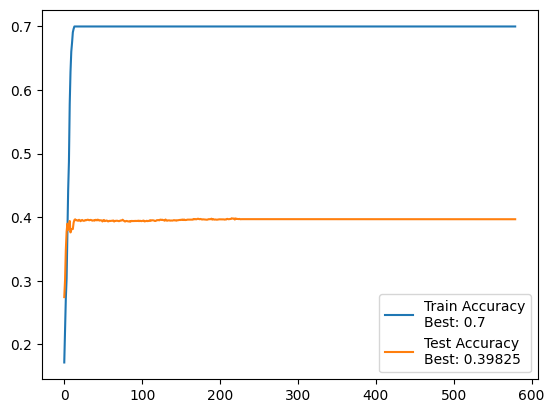

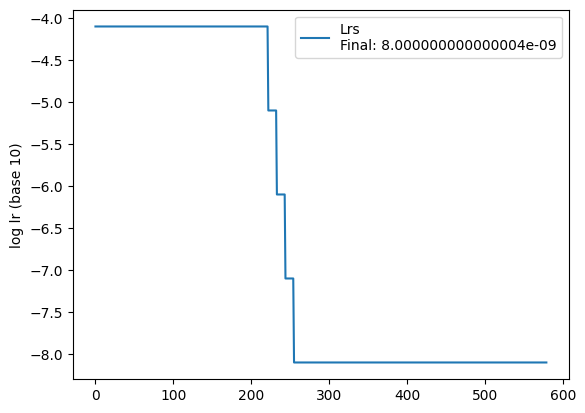

 90%|█████████ | 9/10 [01:05<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:12<00:00,  7.30s/it]

 Test accuracy: 39.7%, Avg loss: 6.768988


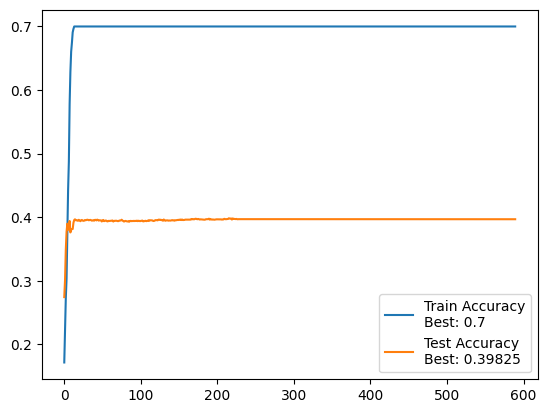

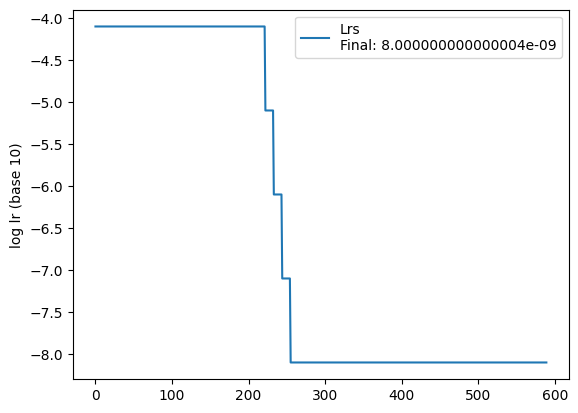

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.36s/it]

 Test accuracy: 39.7%, Avg loss: 6.769111


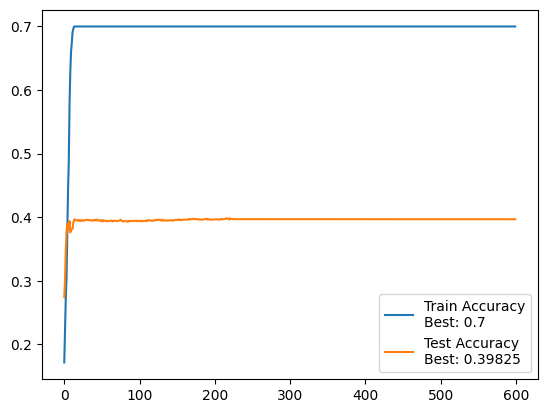

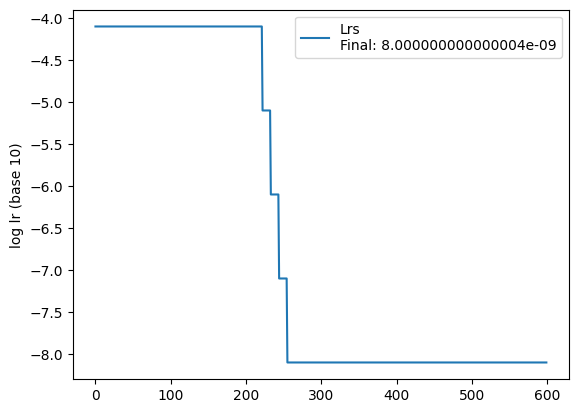

 90%|█████████ | 9/10 [01:05<00:07,  7.31s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.32s/it]

 Test accuracy: 39.7%, Avg loss: 6.769233


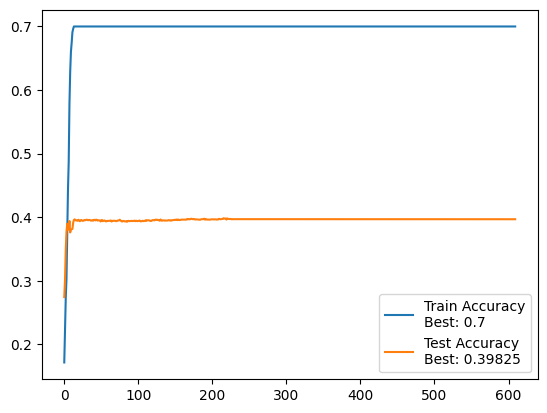

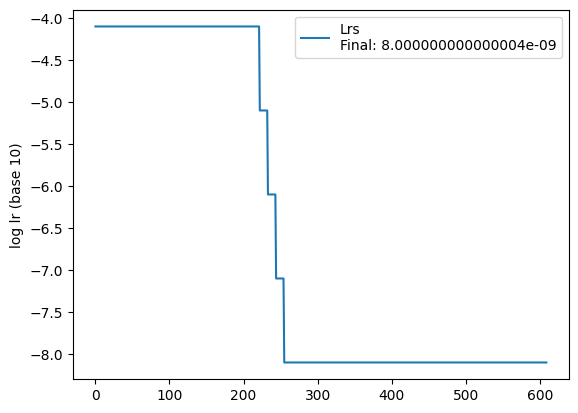

 90%|█████████ | 9/10 [01:06<00:07,  7.33s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.769352


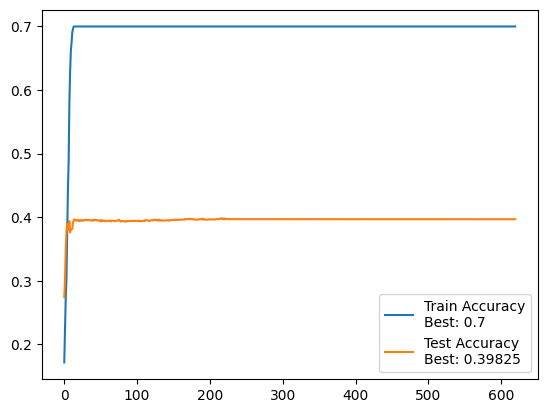

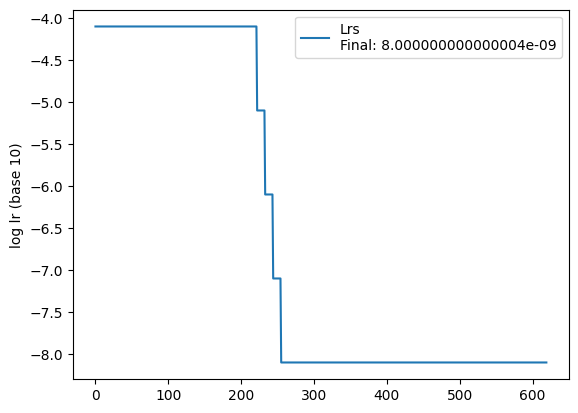

 90%|█████████ | 9/10 [01:06<00:07,  7.33s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.35s/it]

 Test accuracy: 39.7%, Avg loss: 6.769471


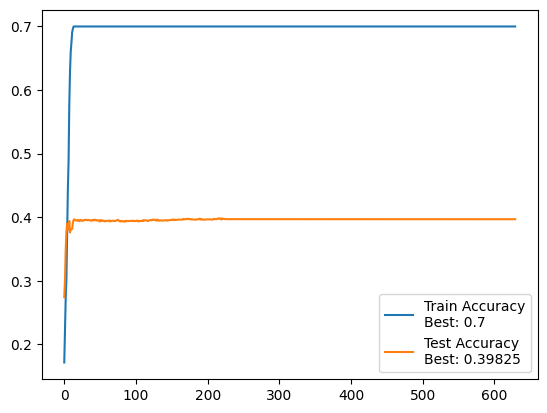

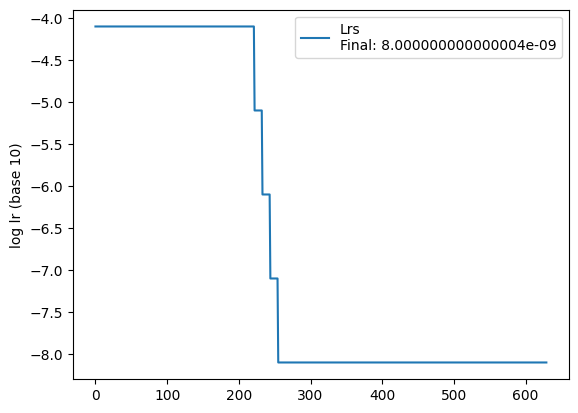

 90%|█████████ | 9/10 [01:07<00:07,  7.58s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:15<00:00,  7.55s/it]

 Test accuracy: 39.7%, Avg loss: 6.769590


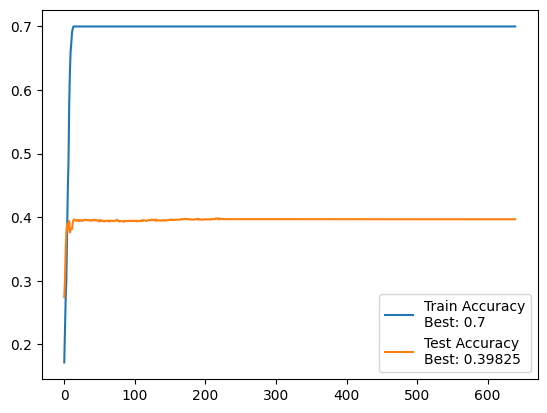

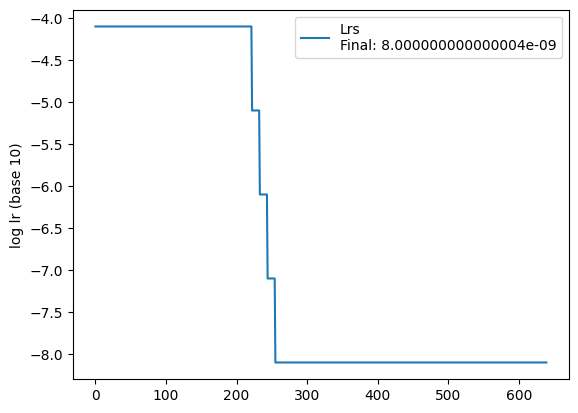

 90%|█████████ | 9/10 [01:08<00:07,  7.68s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:16<00:00,  7.66s/it]

 Test accuracy: 39.7%, Avg loss: 6.769709


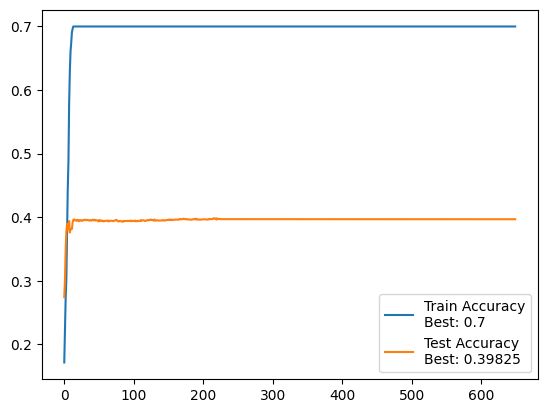

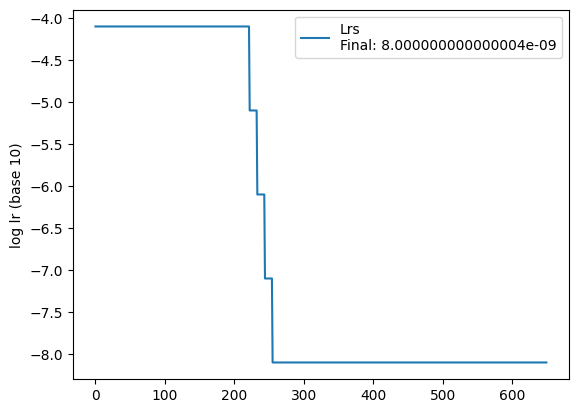

 90%|█████████ | 9/10 [01:07<00:07,  7.45s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:15<00:00,  7.57s/it]

 Test accuracy: 39.7%, Avg loss: 6.769827


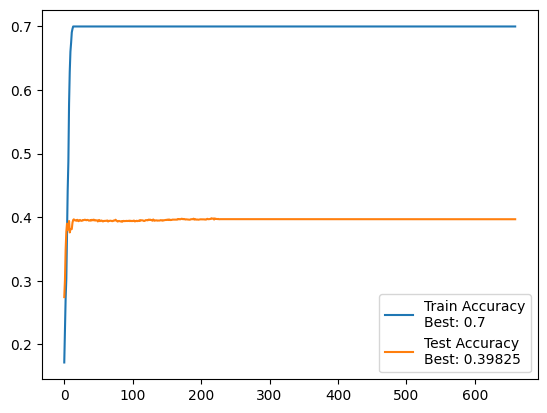

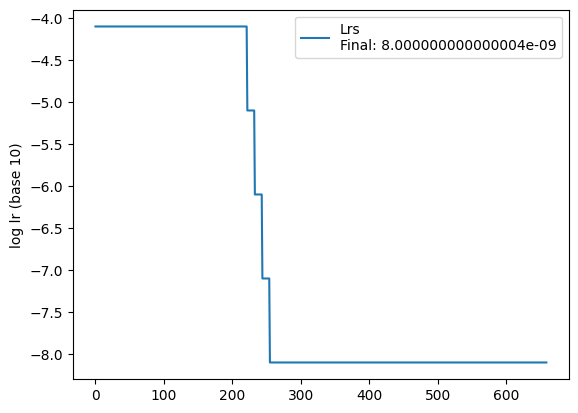

 90%|█████████ | 9/10 [01:07<00:07,  7.46s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:15<00:00,  7.50s/it]

 Test accuracy: 39.7%, Avg loss: 6.769943


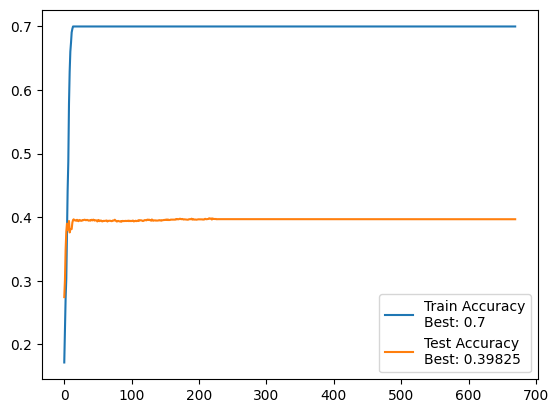

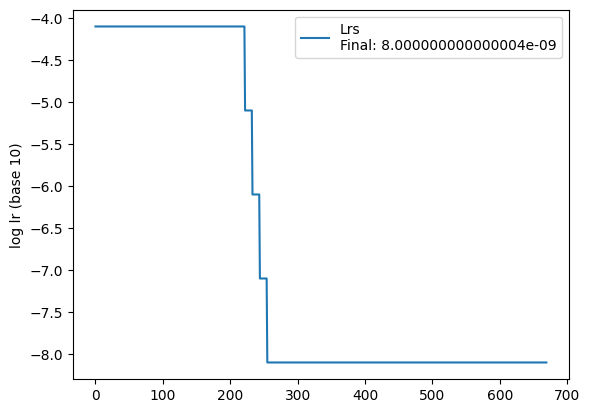

 90%|█████████ | 9/10 [01:07<00:07,  7.44s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:14<00:00,  7.46s/it]

 Test accuracy: 39.7%, Avg loss: 6.770060


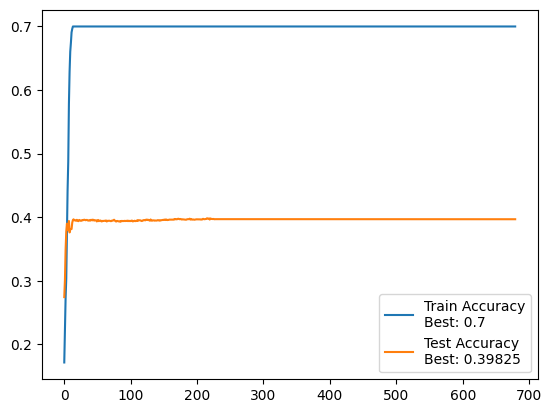

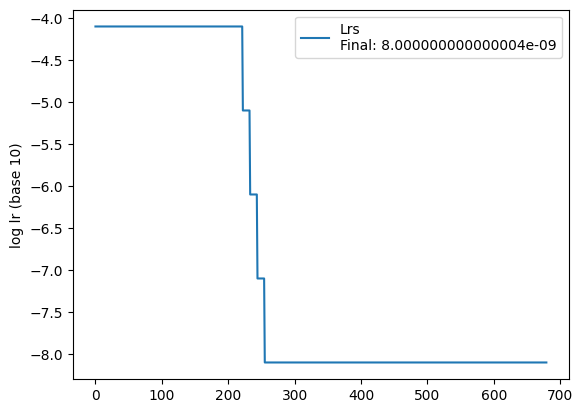

 90%|█████████ | 9/10 [01:07<00:07,  7.51s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:15<00:00,  7.51s/it]

 Test accuracy: 39.7%, Avg loss: 6.770177


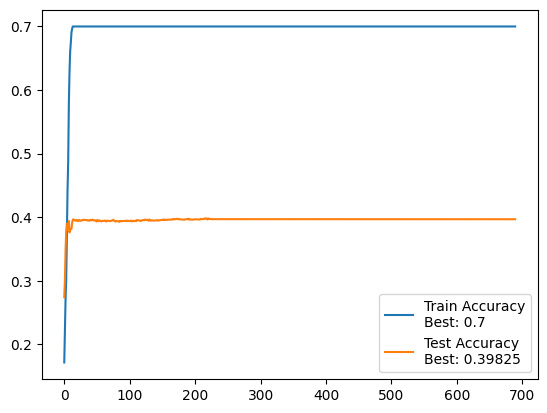

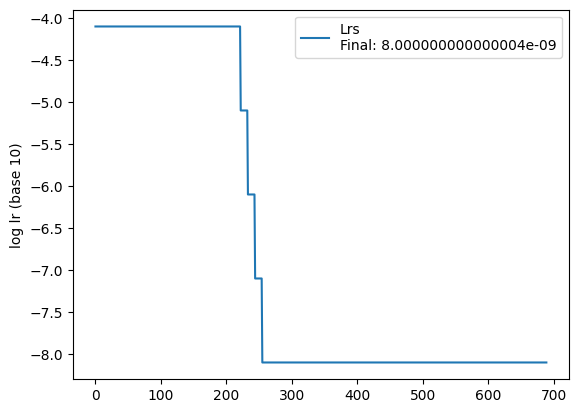

 90%|█████████ | 9/10 [01:07<00:07,  7.51s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:15<00:00,  7.53s/it]

 Test accuracy: 39.7%, Avg loss: 6.770292


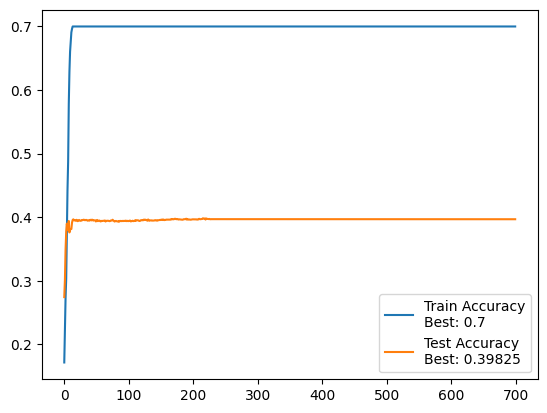

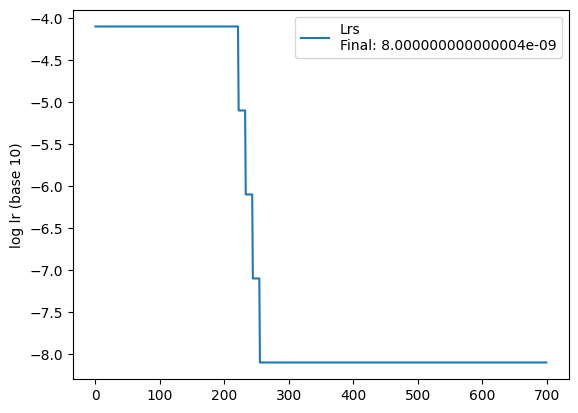

 90%|█████████ | 9/10 [01:07<00:07,  7.51s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:15<00:00,  7.53s/it]

 Test accuracy: 39.7%, Avg loss: 6.770408


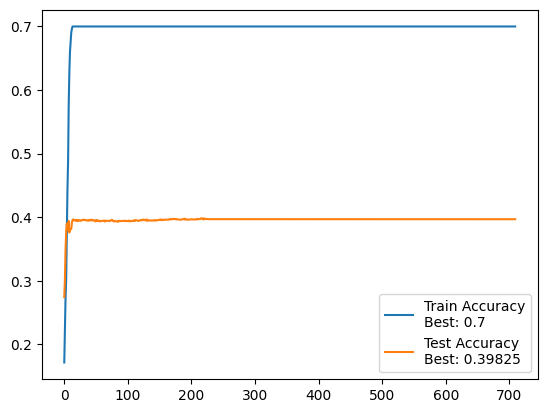

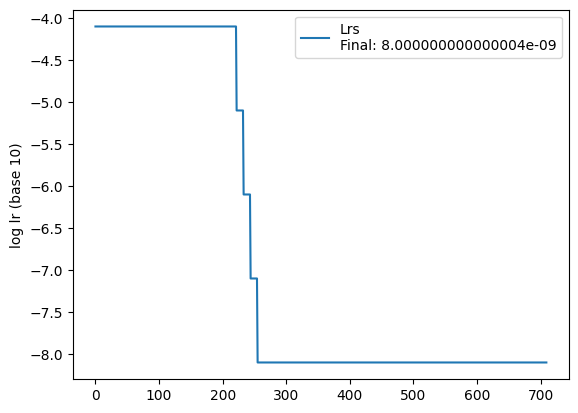

 90%|█████████ | 9/10 [01:07<00:07,  7.39s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:14<00:00,  7.46s/it]

 Test accuracy: 39.7%, Avg loss: 6.770522


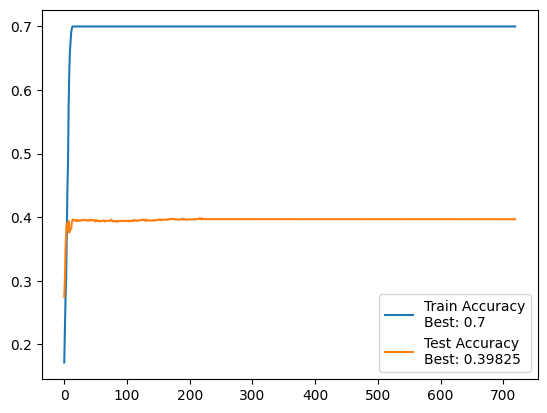

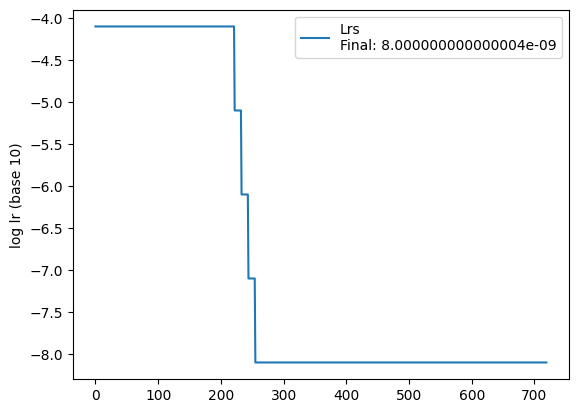

 90%|█████████ | 9/10 [01:08<00:07,  7.53s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:15<00:00,  7.58s/it]

 Test accuracy: 39.7%, Avg loss: 6.770637


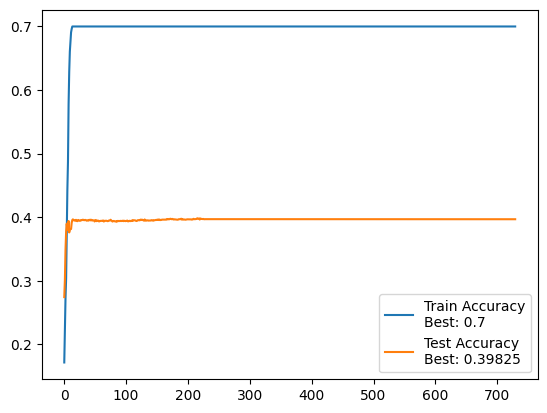

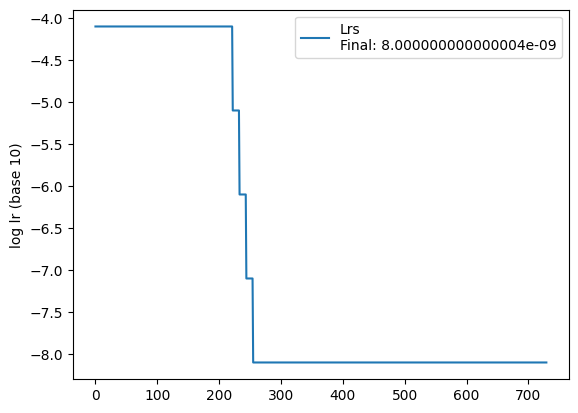

 90%|█████████ | 9/10 [01:06<00:07,  7.31s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.35s/it]

 Test accuracy: 39.7%, Avg loss: 6.770750


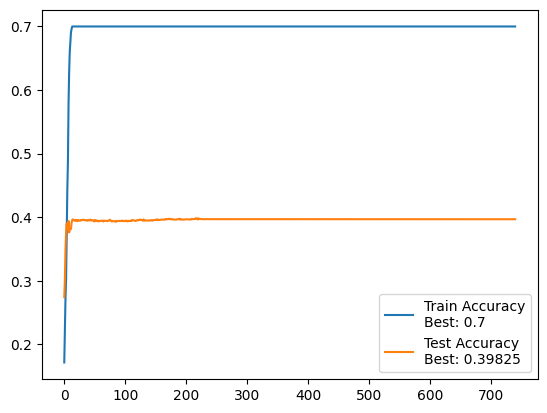

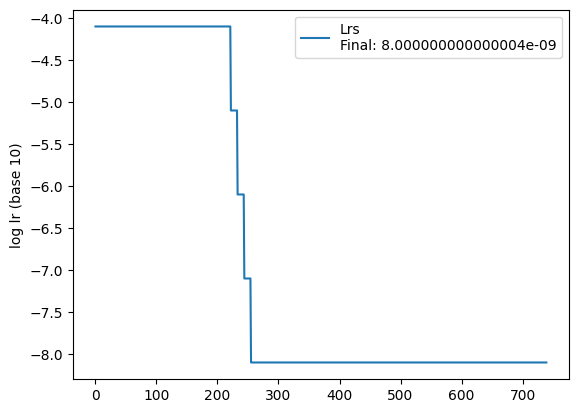

 90%|█████████ | 9/10 [01:05<00:07,  7.31s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.31s/it]

 Test accuracy: 39.7%, Avg loss: 6.770863


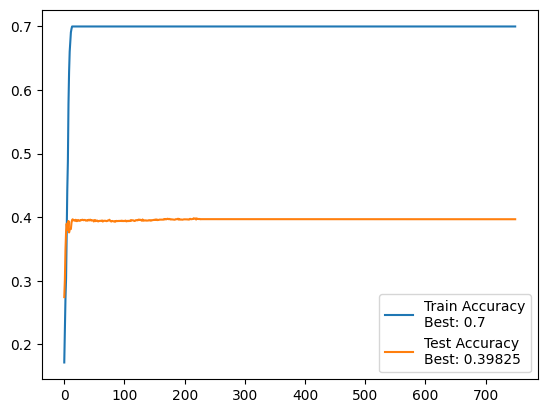

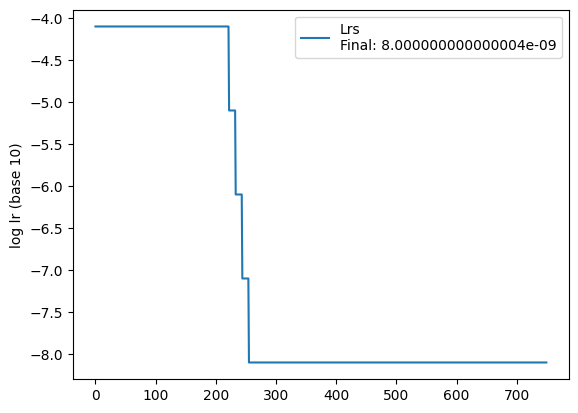

 90%|█████████ | 9/10 [01:06<00:07,  7.52s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:14<00:00,  7.48s/it]

 Test accuracy: 39.7%, Avg loss: 6.770977


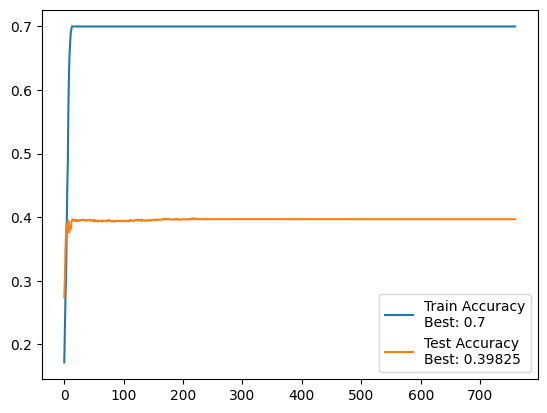

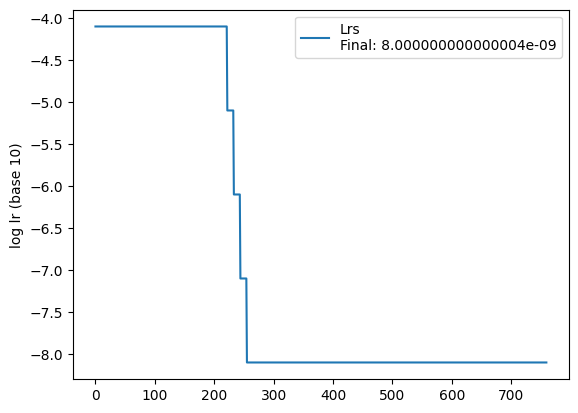

 90%|█████████ | 9/10 [01:07<00:07,  7.52s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:15<00:00,  7.56s/it]

 Test accuracy: 39.7%, Avg loss: 6.771089


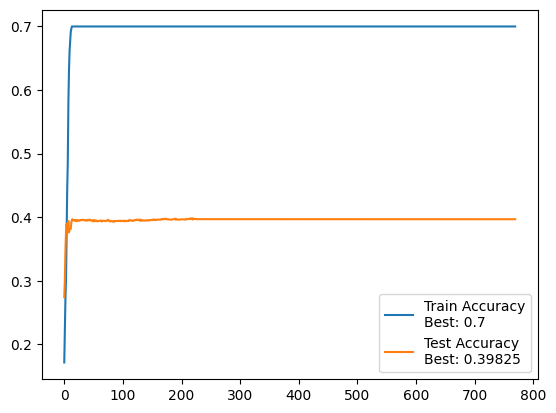

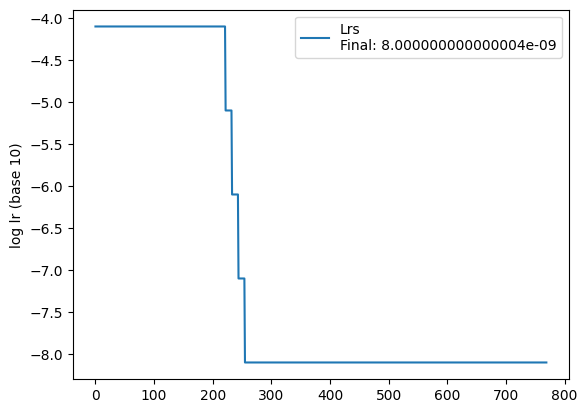

 90%|█████████ | 9/10 [01:08<00:07,  7.55s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:15<00:00,  7.57s/it]

 Test accuracy: 39.7%, Avg loss: 6.771202


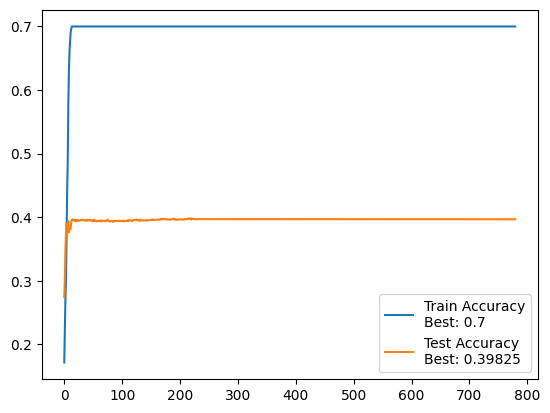

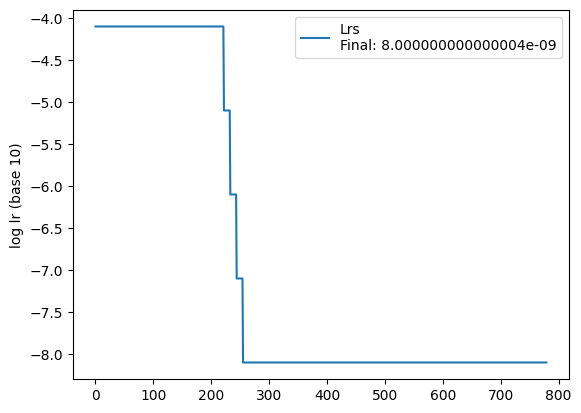

 90%|█████████ | 9/10 [01:07<00:07,  7.53s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:15<00:00,  7.52s/it]

 Test accuracy: 39.7%, Avg loss: 6.771313


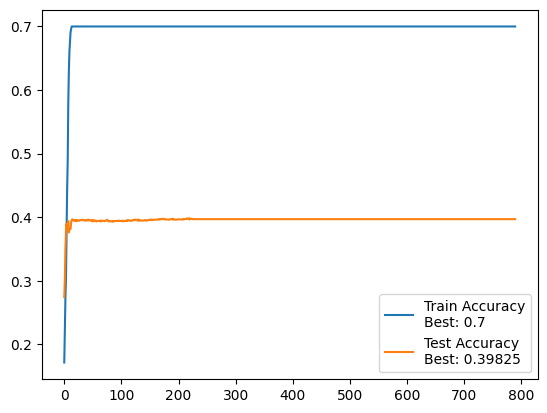

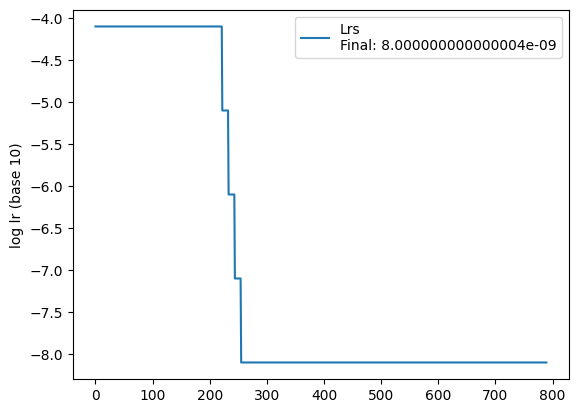

 90%|█████████ | 9/10 [01:07<00:07,  7.52s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:15<00:00,  7.55s/it]

 Test accuracy: 39.7%, Avg loss: 6.771425


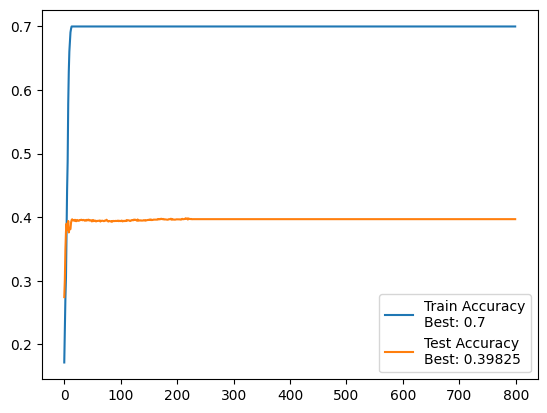

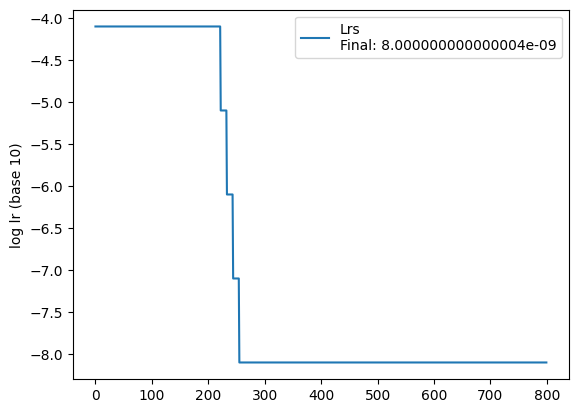

 90%|█████████ | 9/10 [01:07<00:07,  7.54s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:15<00:00,  7.55s/it]

 Test accuracy: 39.7%, Avg loss: 6.771536


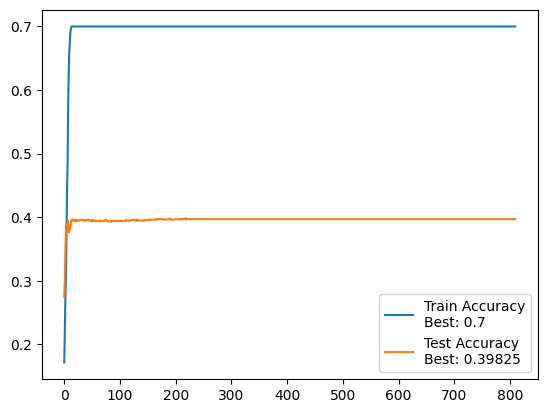

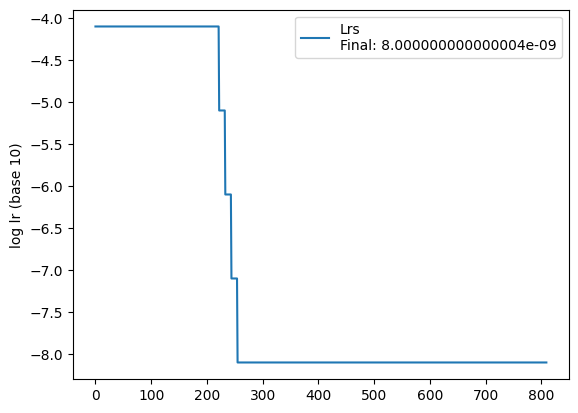

 90%|█████████ | 9/10 [01:07<00:07,  7.57s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:15<00:00,  7.53s/it]

 Test accuracy: 39.7%, Avg loss: 6.771645


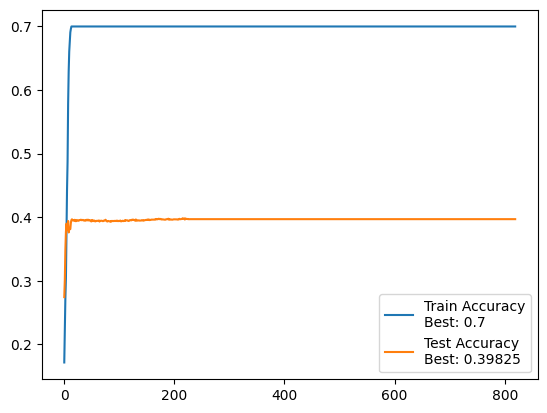

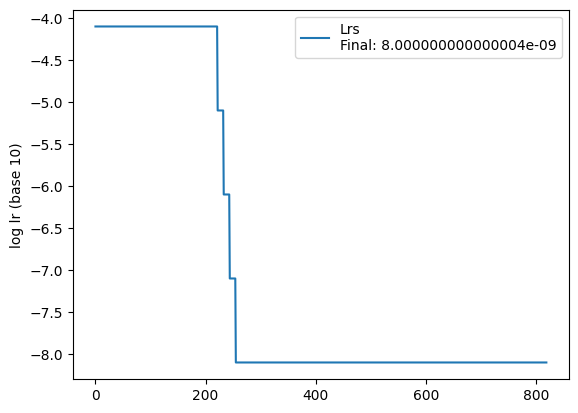

 90%|█████████ | 9/10 [01:08<00:07,  7.62s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:16<00:00,  7.63s/it]

 Test accuracy: 39.7%, Avg loss: 6.771756


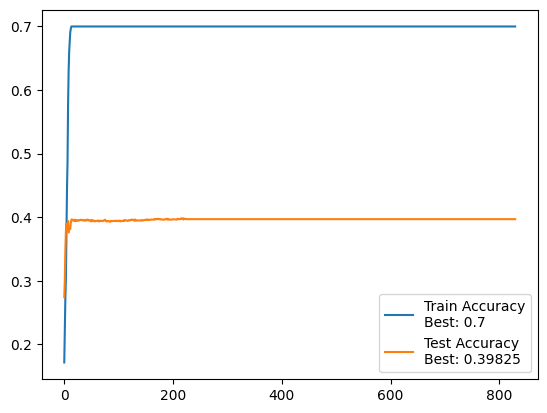

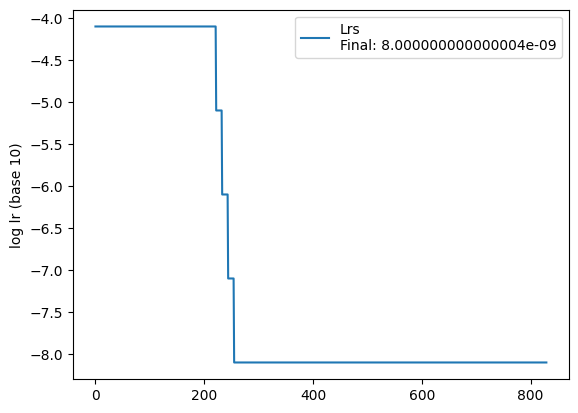

 90%|█████████ | 9/10 [01:07<00:07,  7.53s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:15<00:00,  7.54s/it]

 Test accuracy: 39.7%, Avg loss: 6.771864


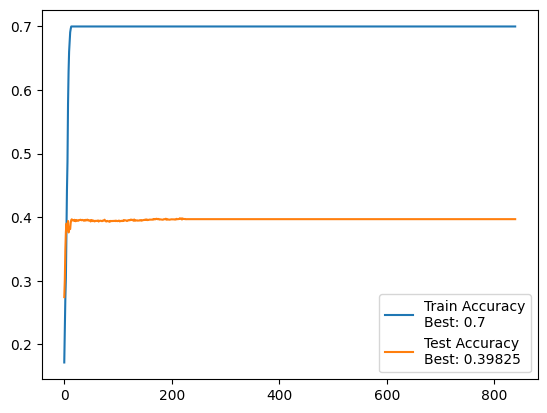

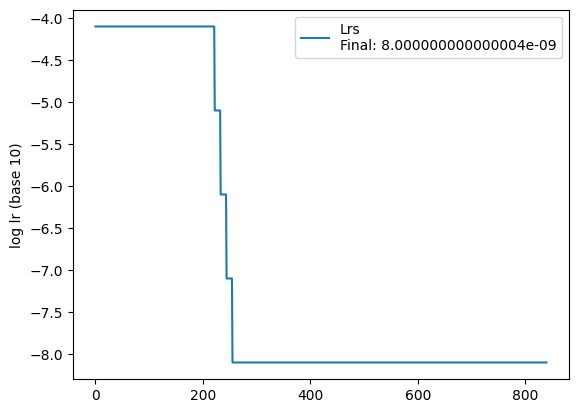

 90%|█████████ | 9/10 [01:06<00:07,  7.35s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:14<00:00,  7.42s/it]

 Test accuracy: 39.7%, Avg loss: 6.771973


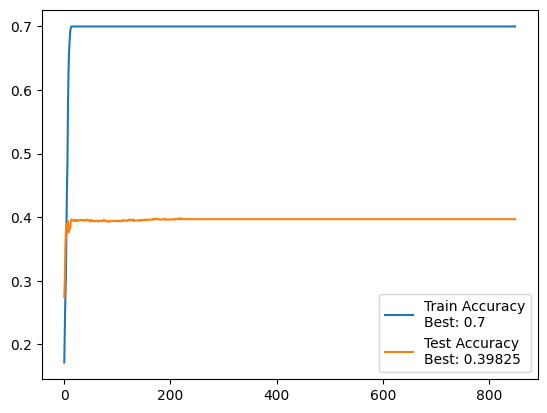

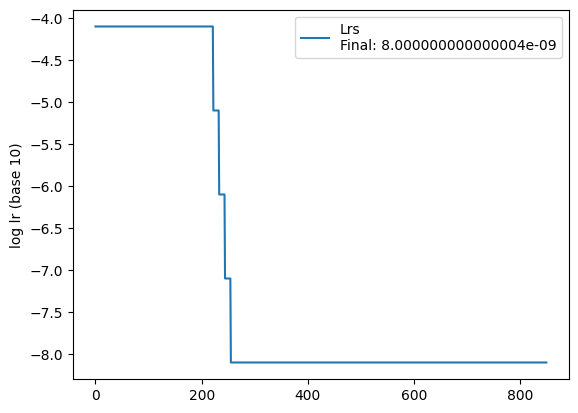

 90%|█████████ | 9/10 [01:06<00:07,  7.35s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:14<00:00,  7.42s/it]

 Test accuracy: 39.7%, Avg loss: 6.772082


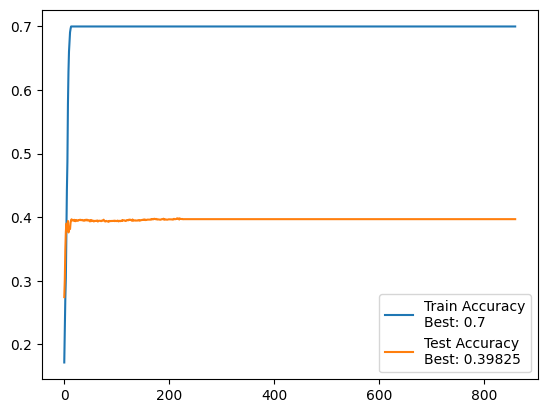

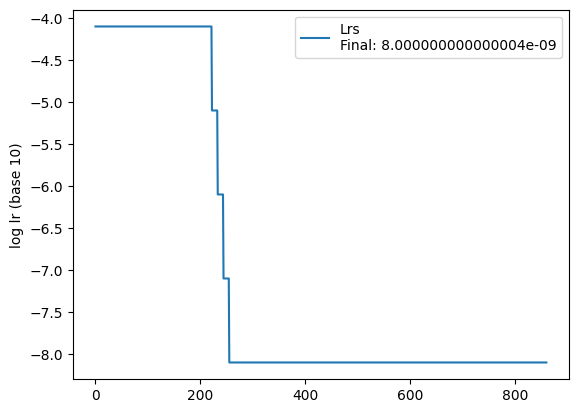

 90%|█████████ | 9/10 [01:05<00:07,  7.31s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.32s/it]

 Test accuracy: 39.7%, Avg loss: 6.772190


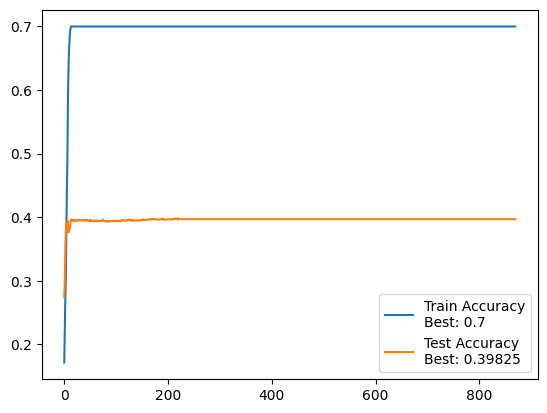

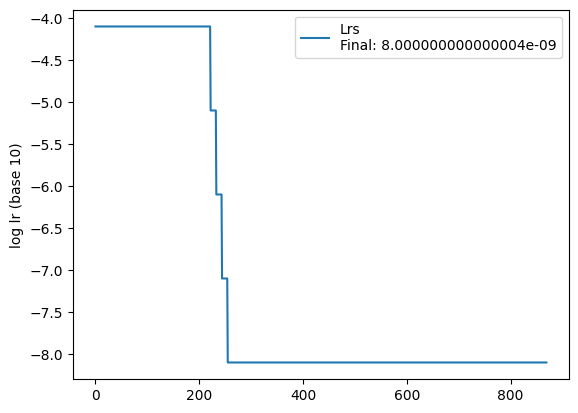

 90%|█████████ | 9/10 [01:05<00:07,  7.27s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:12<00:00,  7.30s/it]

 Test accuracy: 39.7%, Avg loss: 6.772298


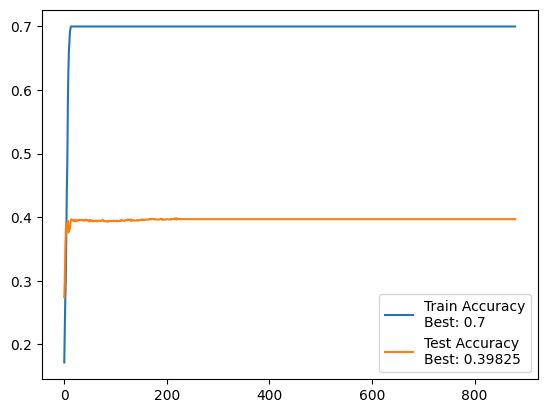

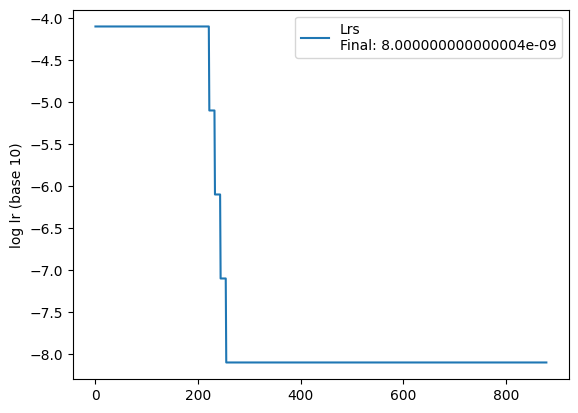

 90%|█████████ | 9/10 [01:05<00:07,  7.27s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:12<00:00,  7.30s/it]

 Test accuracy: 39.7%, Avg loss: 6.772406


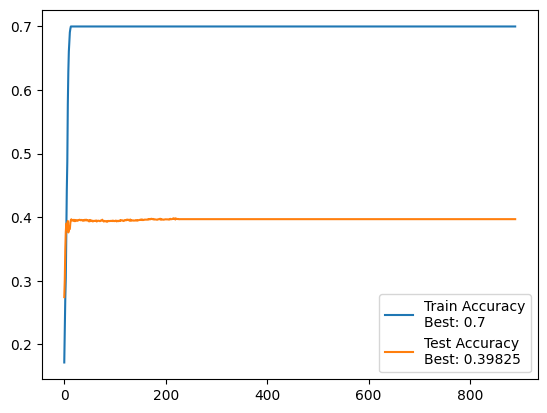

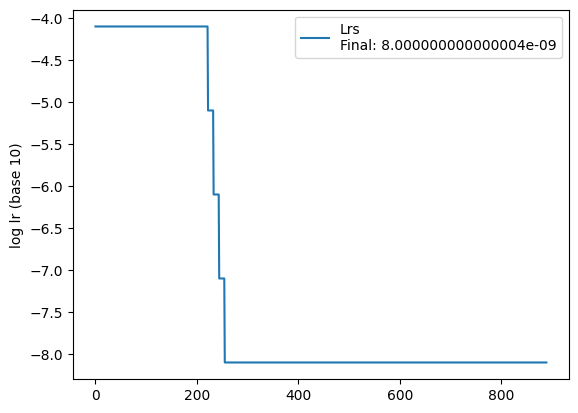

 90%|█████████ | 9/10 [01:05<00:07,  7.28s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.30s/it]

 Test accuracy: 39.7%, Avg loss: 6.772513


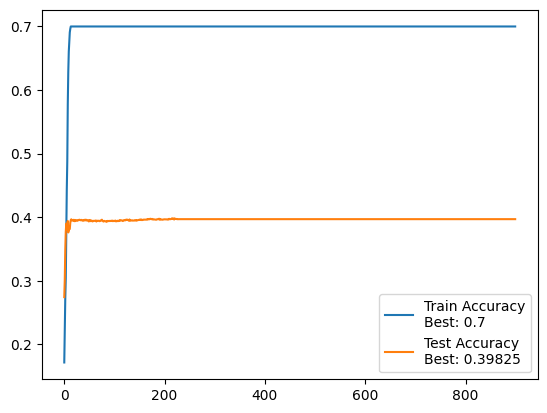

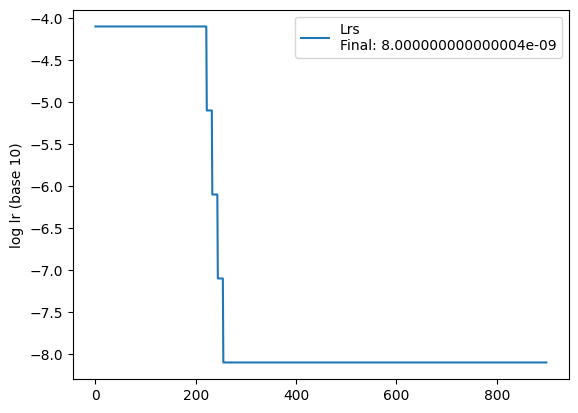

 90%|█████████ | 9/10 [01:05<00:07,  7.28s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.30s/it]

 Test accuracy: 39.7%, Avg loss: 6.772620


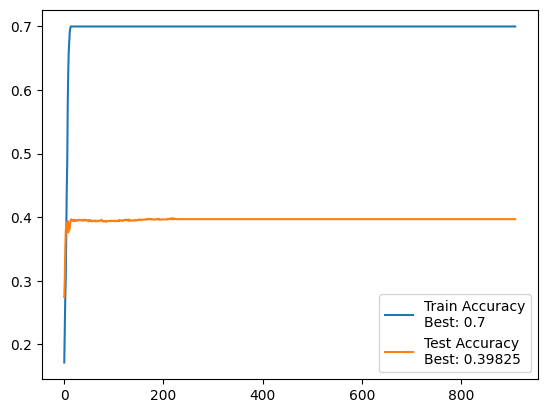

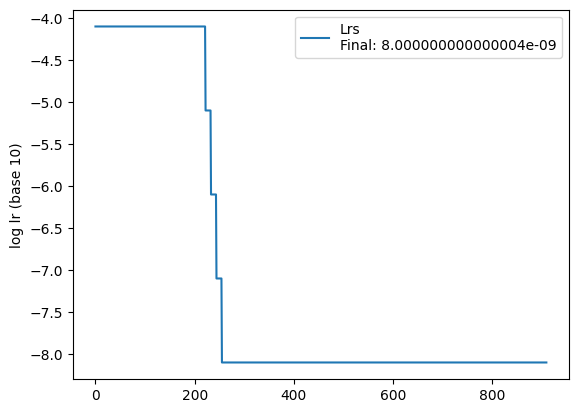

 90%|█████████ | 9/10 [01:05<00:07,  7.29s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.31s/it]

 Test accuracy: 39.7%, Avg loss: 6.772726


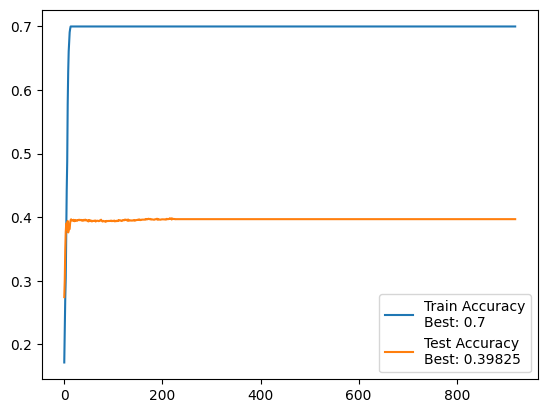

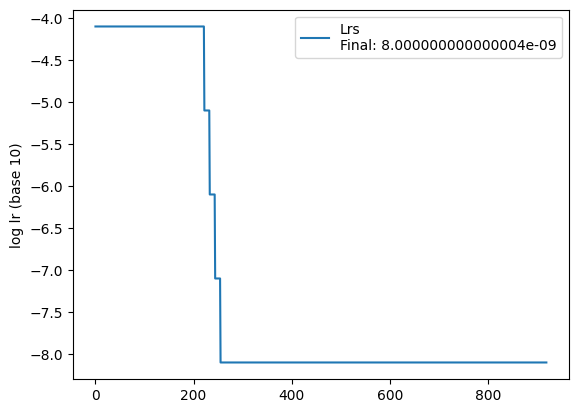

 90%|█████████ | 9/10 [01:05<00:07,  7.28s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.31s/it]

 Test accuracy: 39.7%, Avg loss: 6.772832


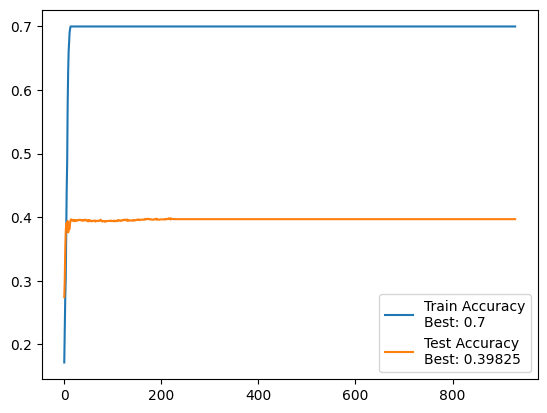

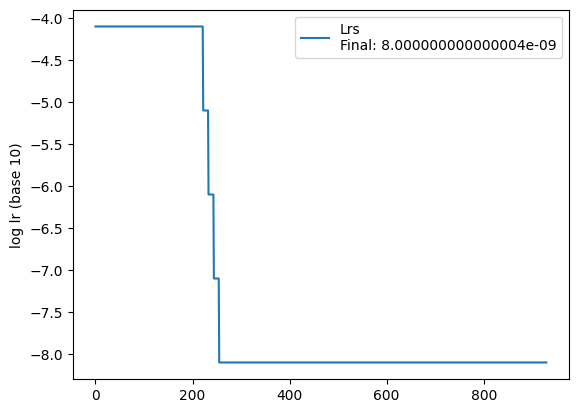

 90%|█████████ | 9/10 [01:05<00:07,  7.26s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:12<00:00,  7.29s/it]

 Test accuracy: 39.7%, Avg loss: 6.772939


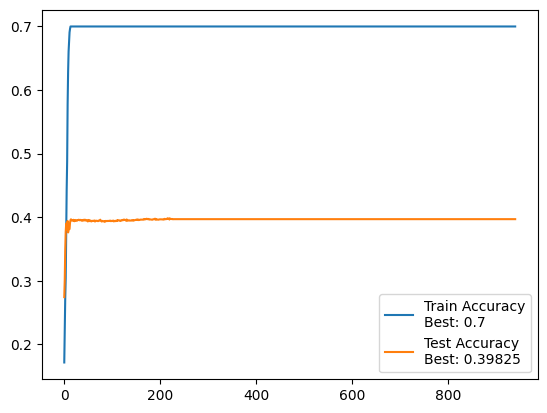

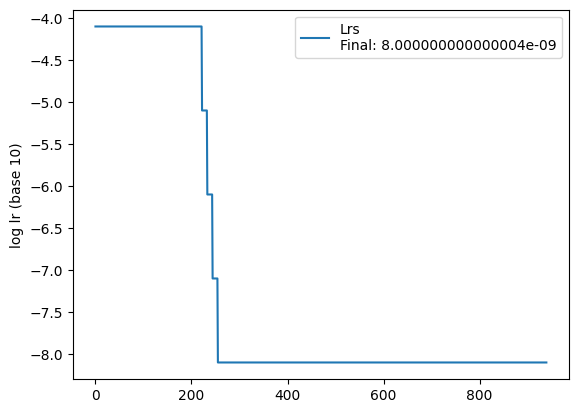

 90%|█████████ | 9/10 [01:05<00:07,  7.28s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.30s/it]

 Test accuracy: 39.7%, Avg loss: 6.773043


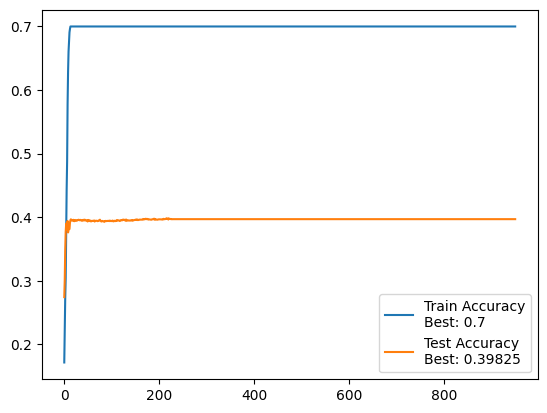

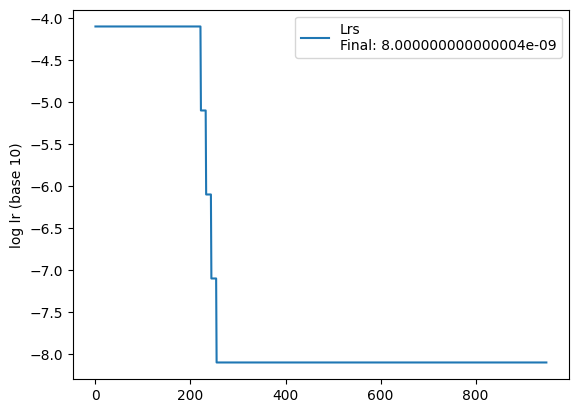

 90%|█████████ | 9/10 [01:05<00:07,  7.30s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.31s/it]

 Test accuracy: 39.7%, Avg loss: 6.773145


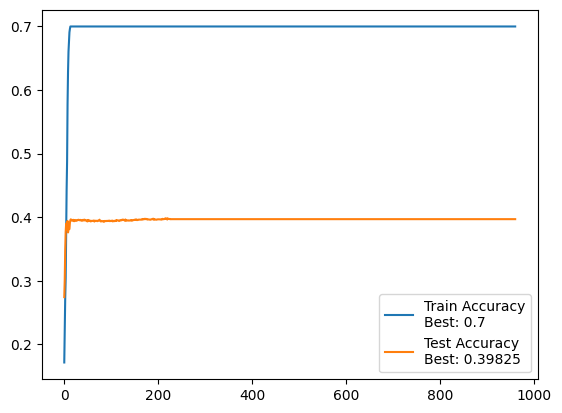

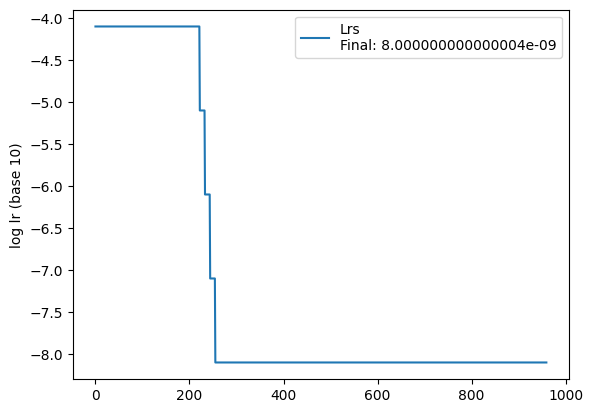

 90%|█████████ | 9/10 [01:05<00:07,  7.29s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:12<00:00,  7.30s/it]

 Test accuracy: 39.7%, Avg loss: 6.773247


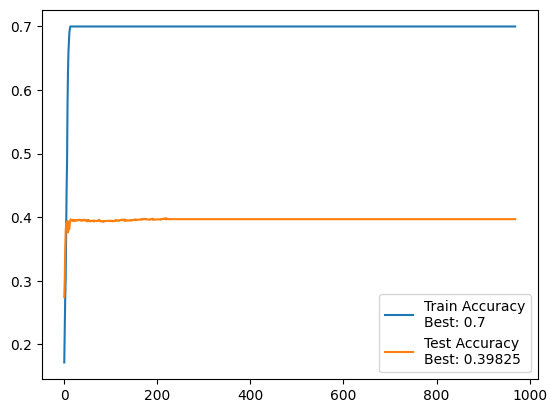

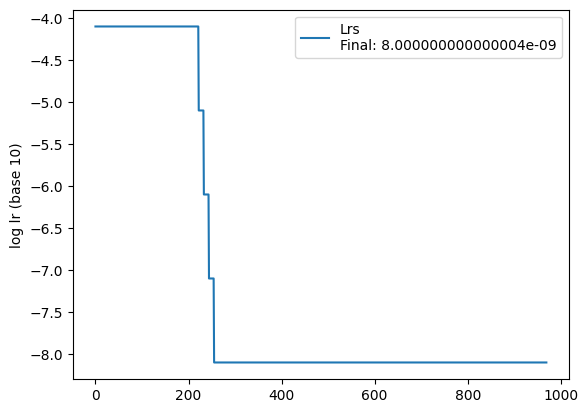

 90%|█████████ | 9/10 [01:05<00:07,  7.30s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.31s/it]

 Test accuracy: 39.7%, Avg loss: 6.773350


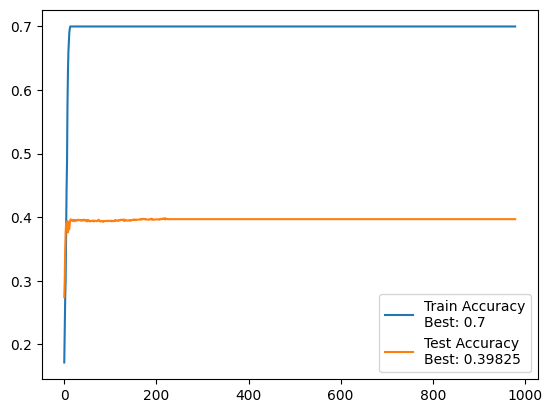

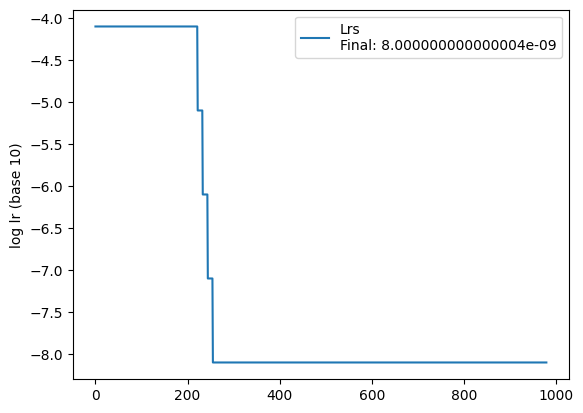

 90%|█████████ | 9/10 [01:05<00:07,  7.30s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.31s/it]

 Test accuracy: 39.7%, Avg loss: 6.773453


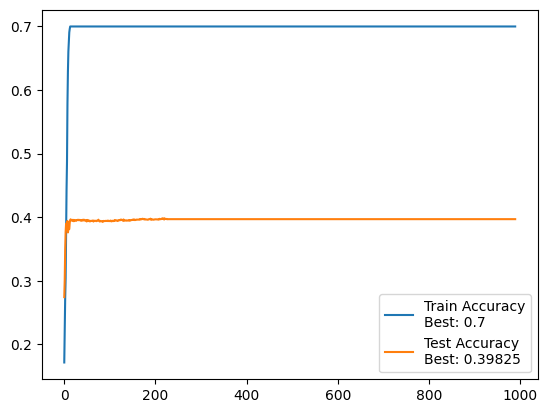

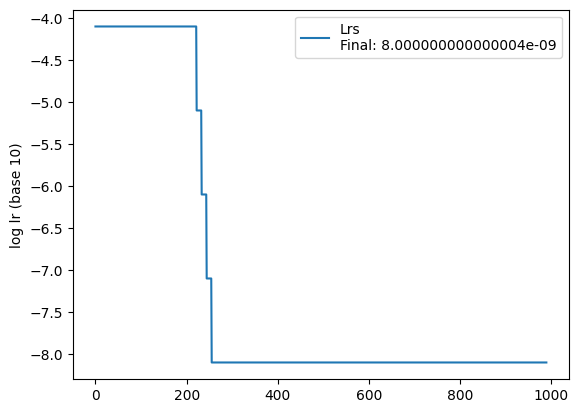

 90%|█████████ | 9/10 [01:05<00:07,  7.30s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.32s/it]

 Test accuracy: 39.7%, Avg loss: 6.773554


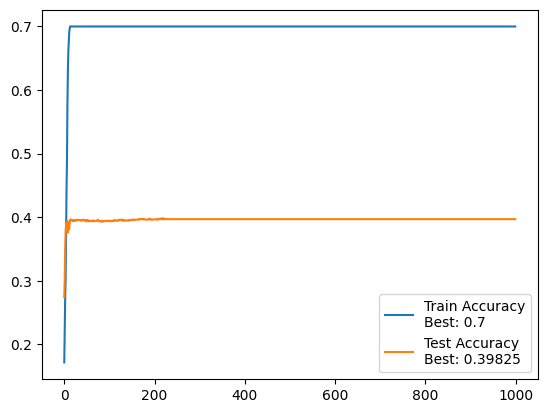

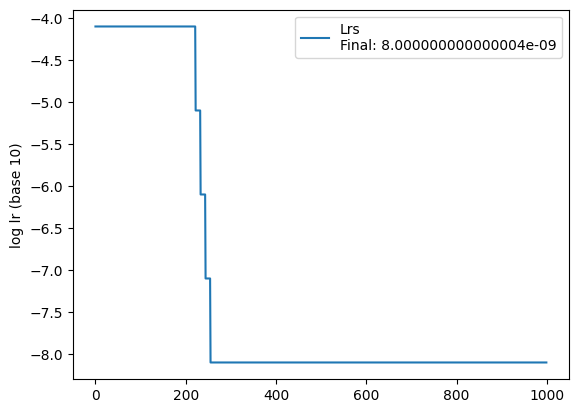

 90%|█████████ | 9/10 [01:05<00:07,  7.28s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.31s/it]

 Test accuracy: 39.7%, Avg loss: 6.773655


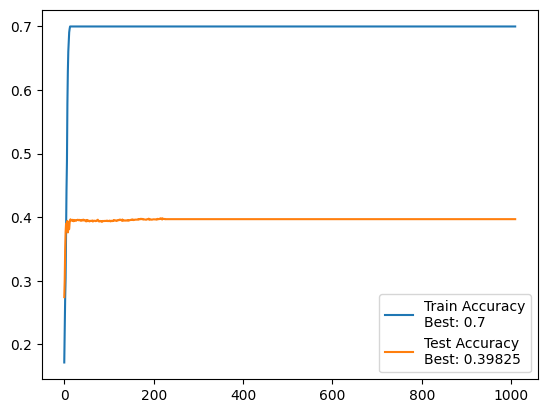

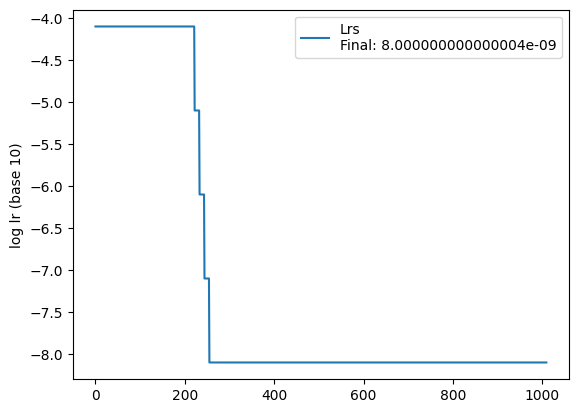

 90%|█████████ | 9/10 [01:05<00:07,  7.29s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.32s/it]

 Test accuracy: 39.7%, Avg loss: 6.773757


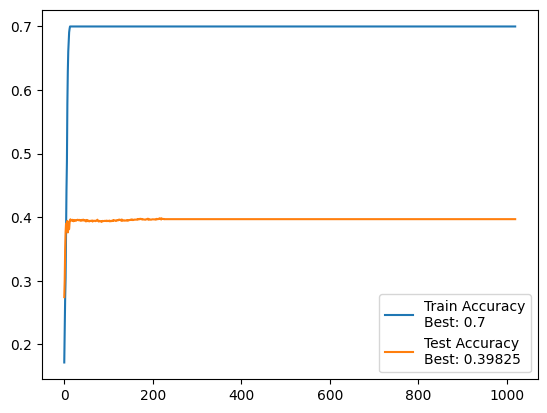

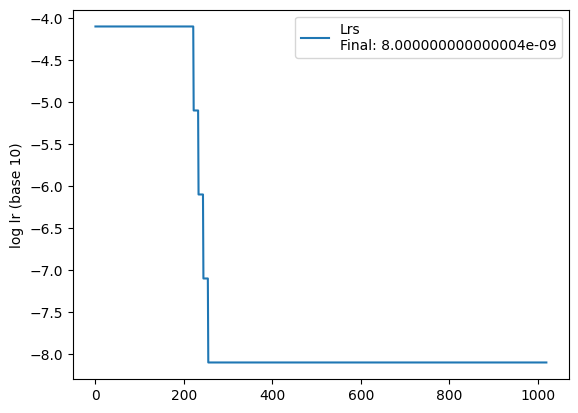

 90%|█████████ | 9/10 [01:06<00:07,  7.29s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.35s/it]

 Test accuracy: 39.7%, Avg loss: 6.773858


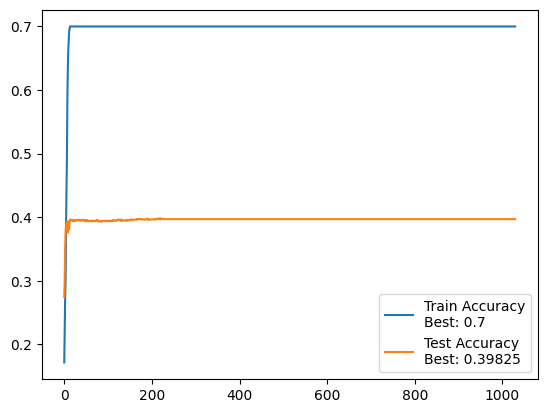

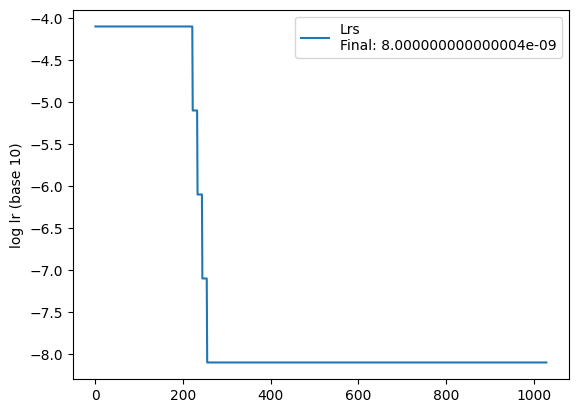

 90%|█████████ | 9/10 [01:05<00:07,  7.30s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.32s/it]

 Test accuracy: 39.7%, Avg loss: 6.773957


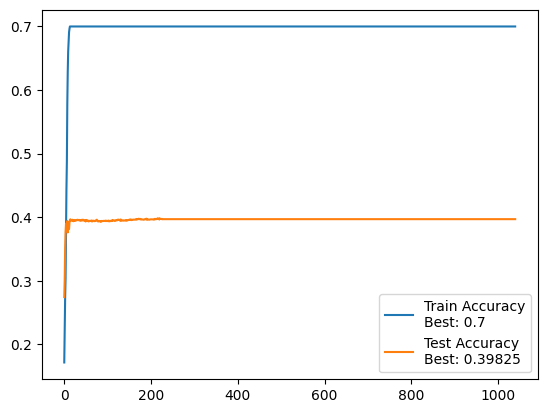

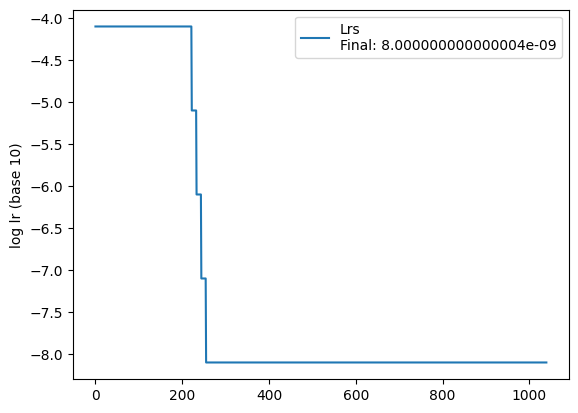

 90%|█████████ | 9/10 [01:05<00:07,  7.31s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.32s/it]

 Test accuracy: 39.7%, Avg loss: 6.774058


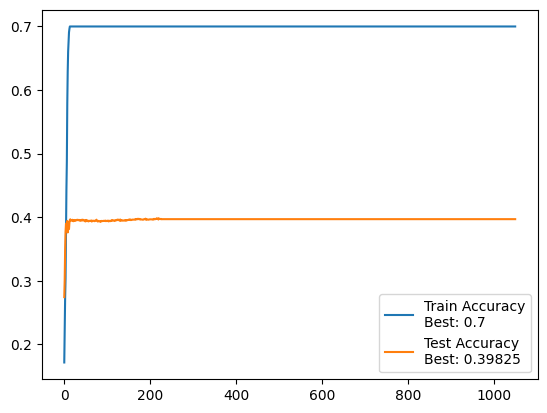

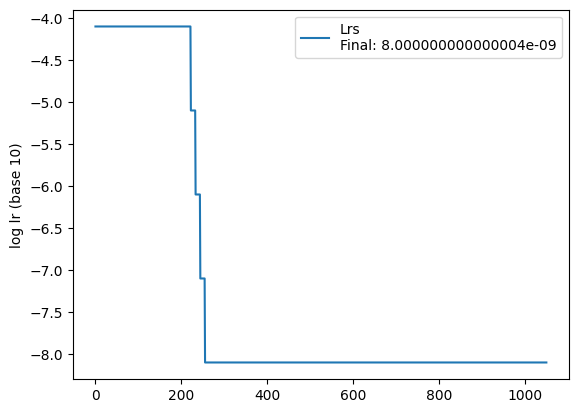

 90%|█████████ | 9/10 [01:05<00:07,  7.29s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.30s/it]

 Test accuracy: 39.7%, Avg loss: 6.774156


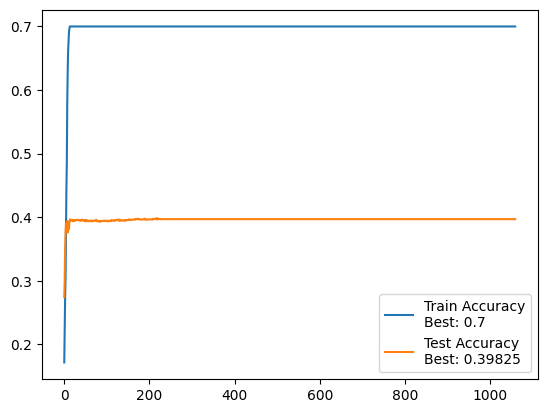

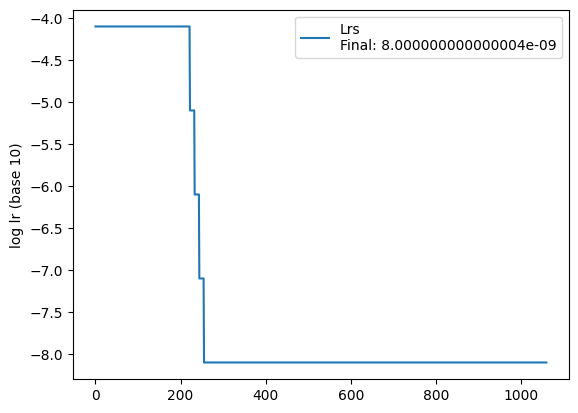

 90%|█████████ | 9/10 [01:05<00:07,  7.32s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.31s/it]

 Test accuracy: 39.7%, Avg loss: 6.774254


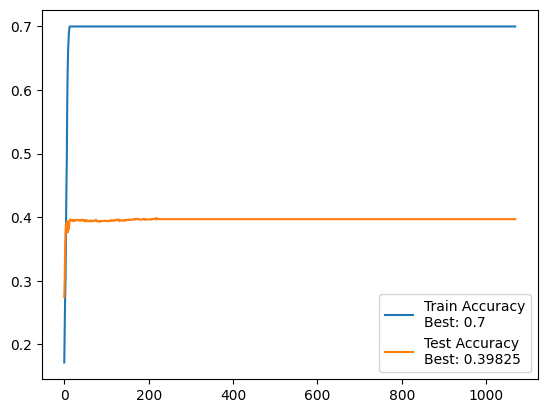

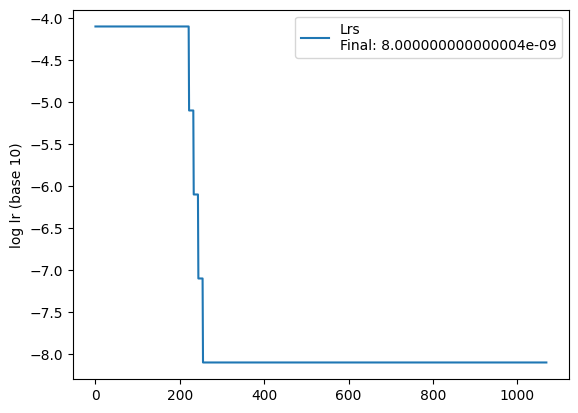

 90%|█████████ | 9/10 [01:05<00:07,  7.27s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:12<00:00,  7.28s/it]

 Test accuracy: 39.7%, Avg loss: 6.774352


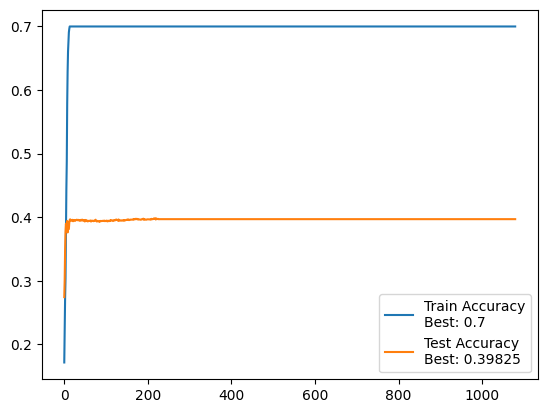

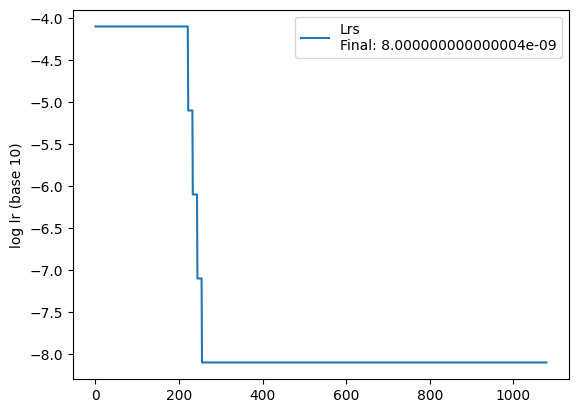

 90%|█████████ | 9/10 [01:05<00:07,  7.29s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:12<00:00,  7.30s/it]

 Test accuracy: 39.7%, Avg loss: 6.774451


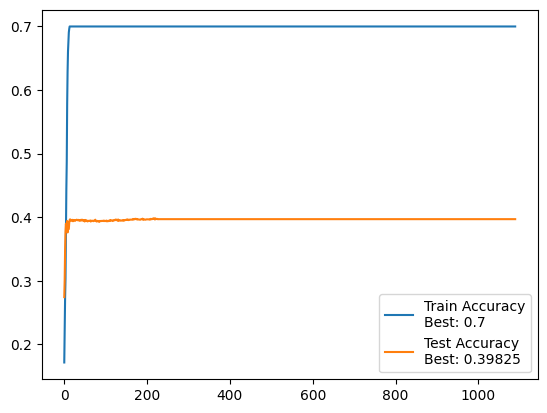

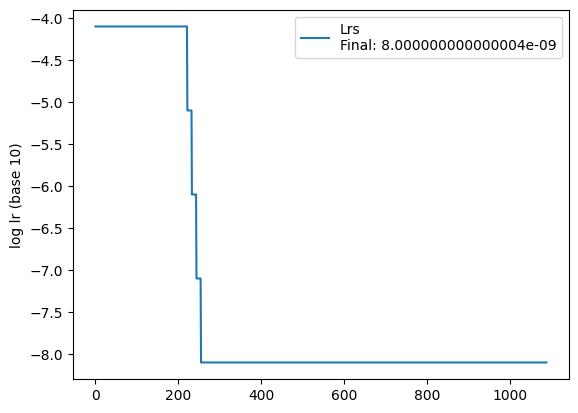

 90%|█████████ | 9/10 [01:05<00:07,  7.28s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:12<00:00,  7.30s/it]

 Test accuracy: 39.7%, Avg loss: 6.774548


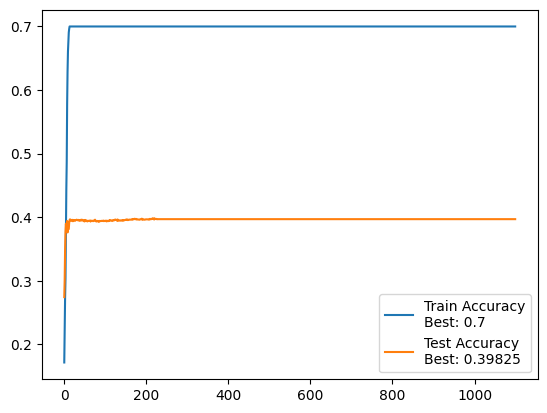

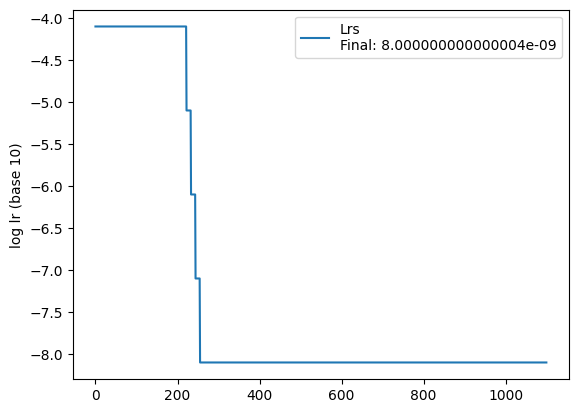

 90%|█████████ | 9/10 [01:05<00:07,  7.28s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:12<00:00,  7.29s/it]

 Test accuracy: 39.7%, Avg loss: 6.774645


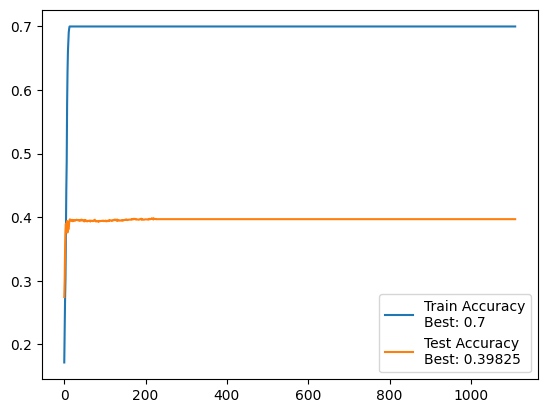

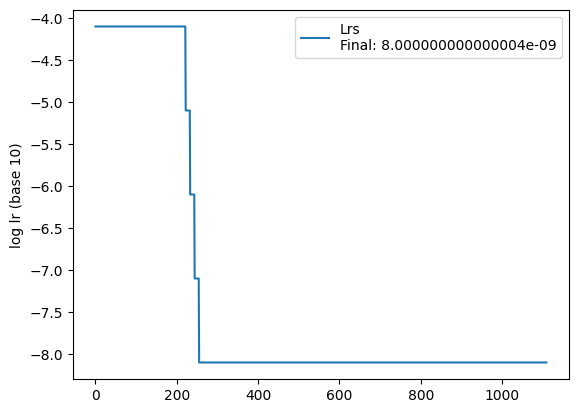

 90%|█████████ | 9/10 [01:05<00:07,  7.27s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:12<00:00,  7.29s/it]

 Test accuracy: 39.7%, Avg loss: 6.774741


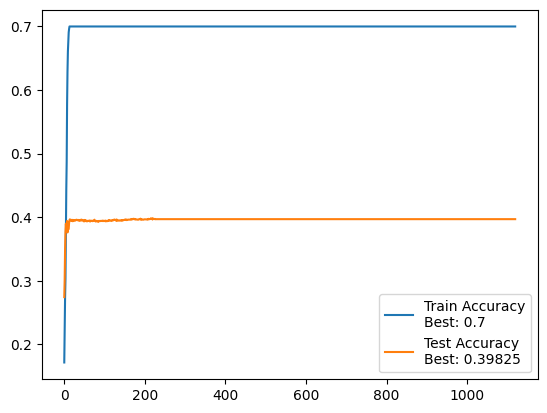

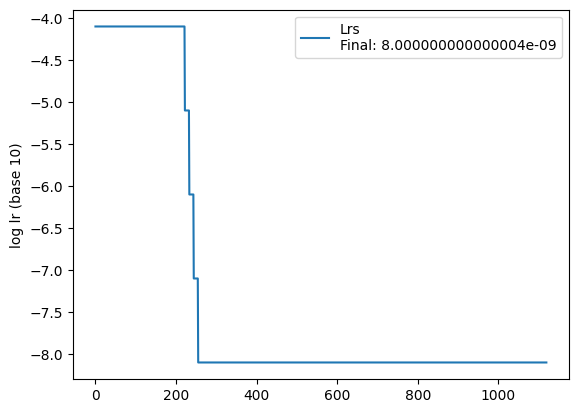

 90%|█████████ | 9/10 [01:05<00:07,  7.29s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.31s/it]

 Test accuracy: 39.7%, Avg loss: 6.774835


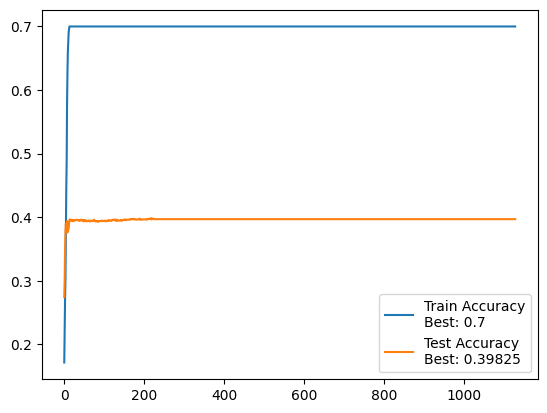

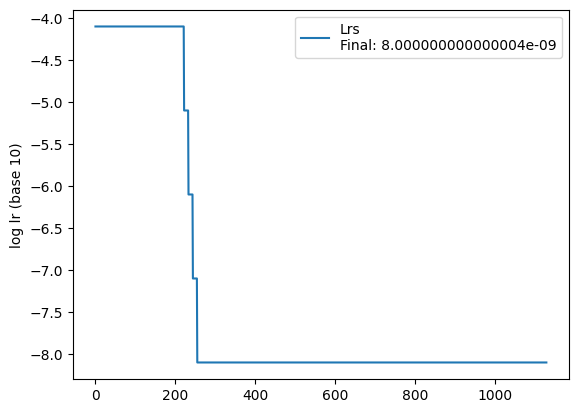

 90%|█████████ | 9/10 [01:05<00:07,  7.30s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:12<00:00,  7.30s/it]

 Test accuracy: 39.7%, Avg loss: 6.774930


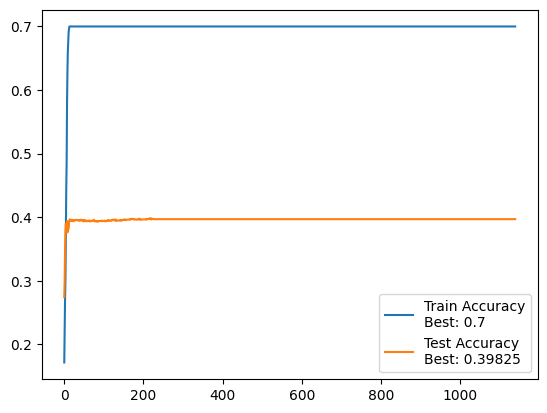

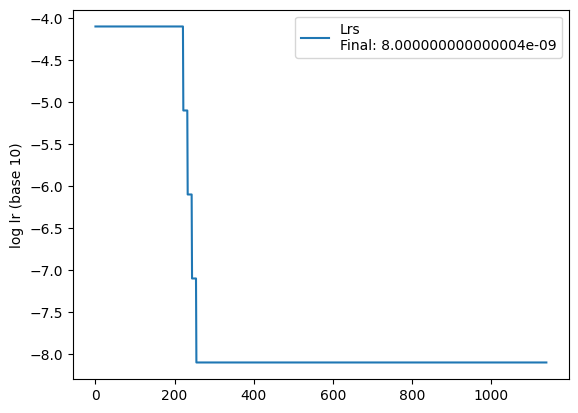

 90%|█████████ | 9/10 [01:05<00:07,  7.30s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.30s/it]

 Test accuracy: 39.7%, Avg loss: 6.775024


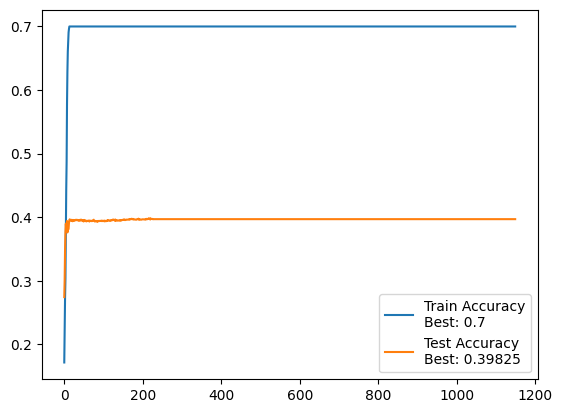

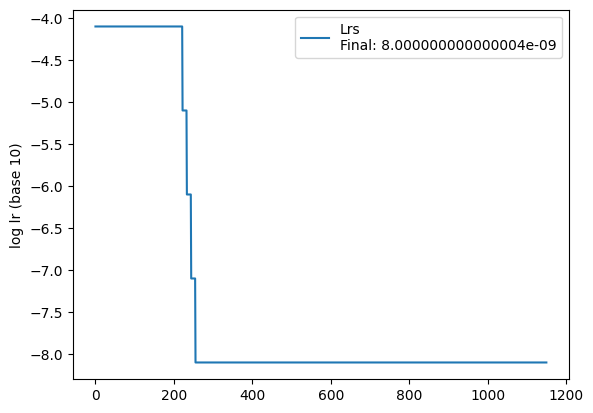

 90%|█████████ | 9/10 [01:05<00:07,  7.28s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.30s/it]

 Test accuracy: 39.7%, Avg loss: 6.775118


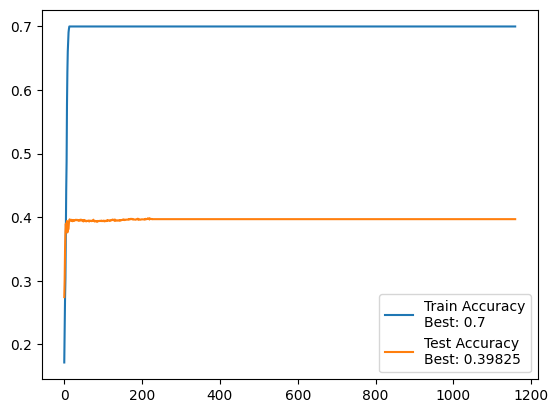

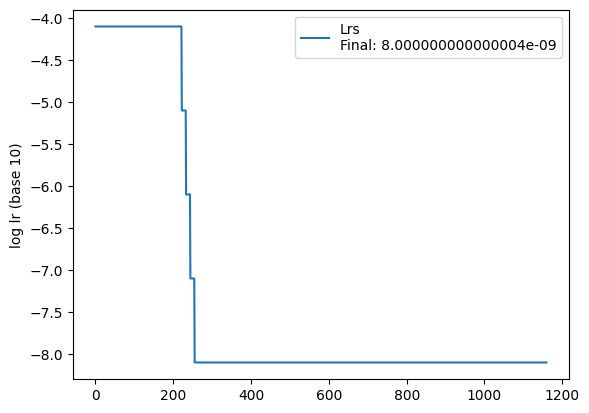

 90%|█████████ | 9/10 [01:05<00:07,  7.28s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.30s/it]

 Test accuracy: 39.7%, Avg loss: 6.775211


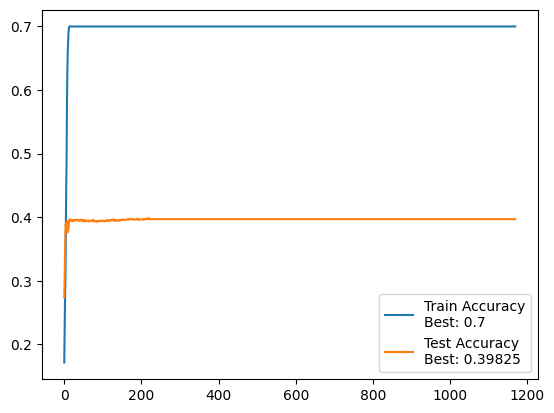

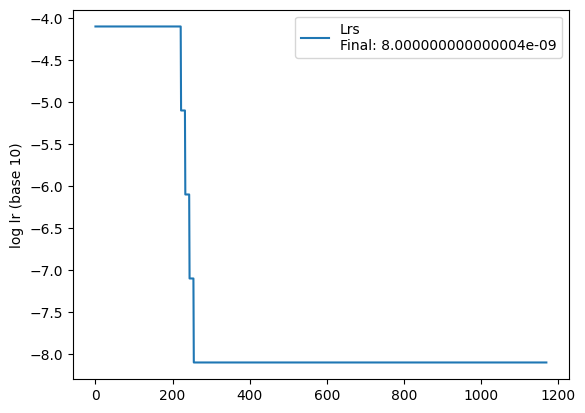

 90%|█████████ | 9/10 [01:05<00:07,  7.27s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:12<00:00,  7.29s/it]

 Test accuracy: 39.7%, Avg loss: 6.775303


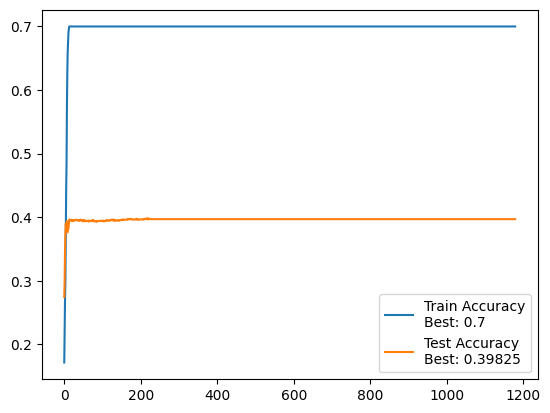

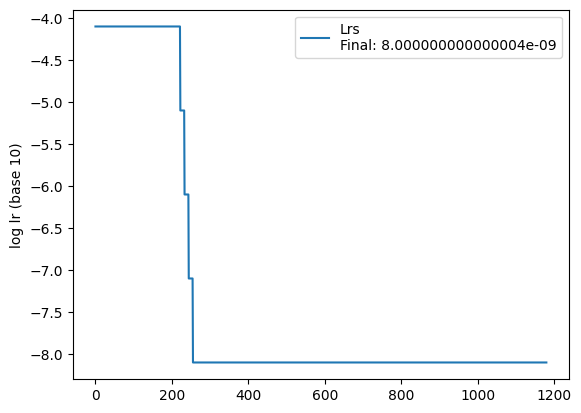

 90%|█████████ | 9/10 [01:05<00:07,  7.29s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:12<00:00,  7.29s/it]

 Test accuracy: 39.7%, Avg loss: 6.775397


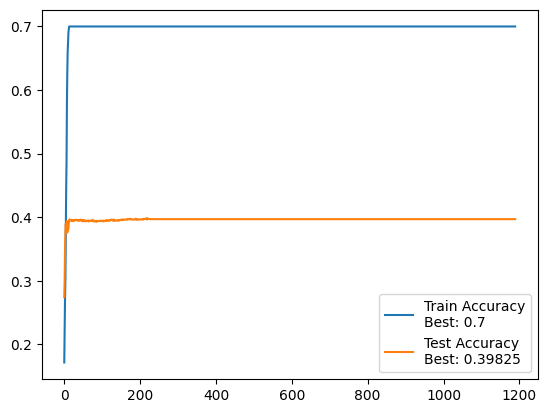

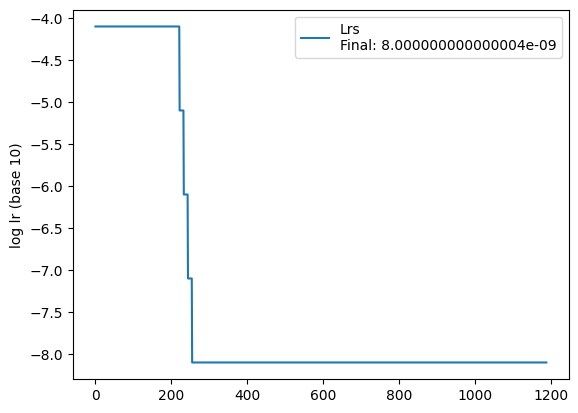

 90%|█████████ | 9/10 [01:05<00:07,  7.28s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:12<00:00,  7.30s/it]

 Test accuracy: 39.7%, Avg loss: 6.775490


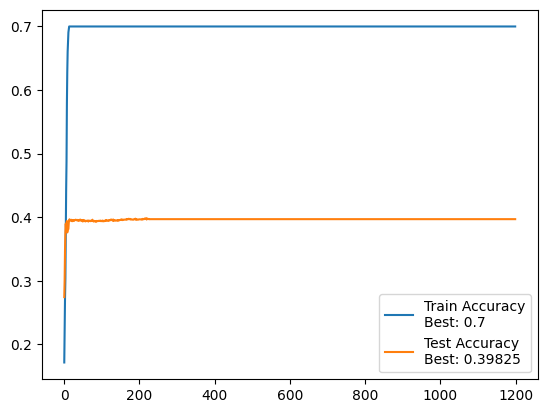

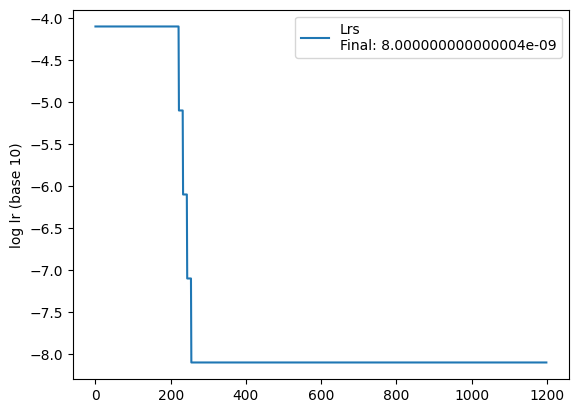

 90%|█████████ | 9/10 [01:05<00:07,  7.27s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:12<00:00,  7.28s/it]

 Test accuracy: 39.7%, Avg loss: 6.775581


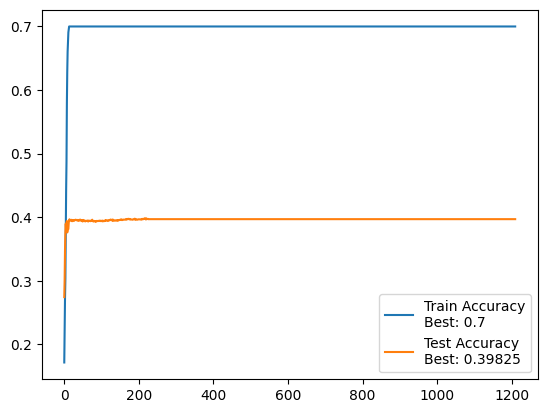

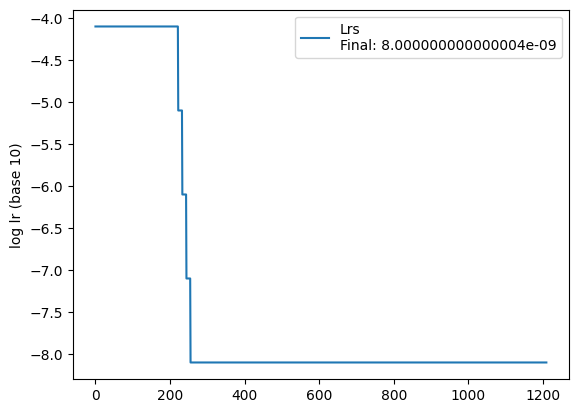

 90%|█████████ | 9/10 [01:05<00:07,  7.29s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.32s/it]

 Test accuracy: 39.7%, Avg loss: 6.775673


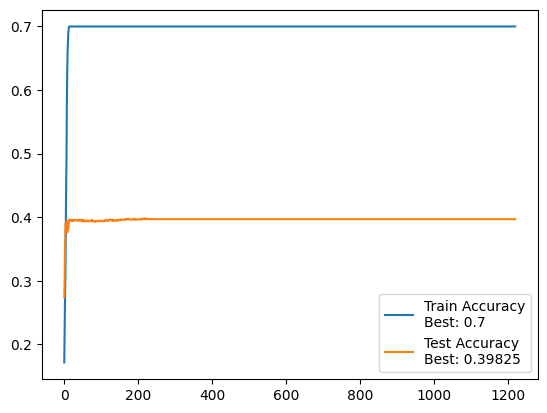

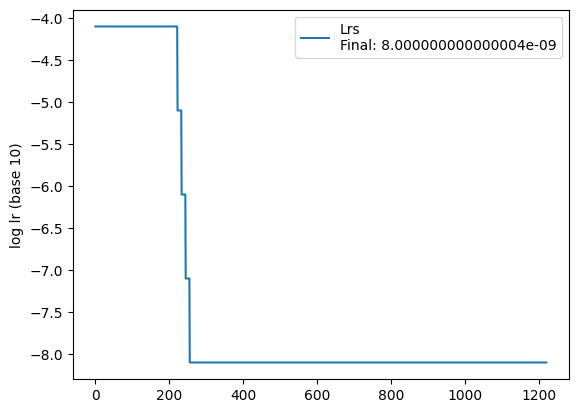

 90%|█████████ | 9/10 [01:05<00:07,  7.27s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:12<00:00,  7.29s/it]

 Test accuracy: 39.7%, Avg loss: 6.775764


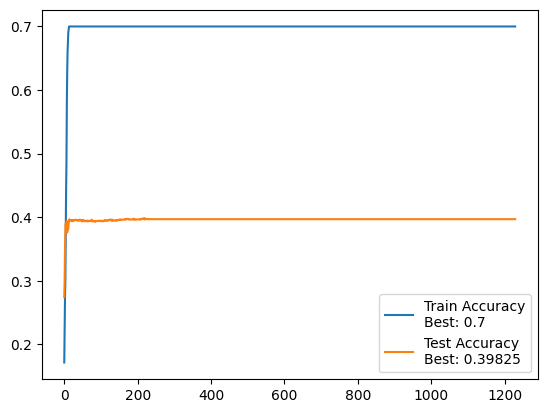

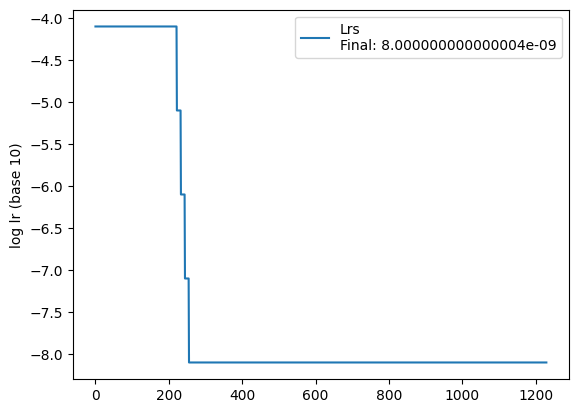

 90%|█████████ | 9/10 [01:05<00:07,  7.31s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.35s/it]

 Test accuracy: 39.7%, Avg loss: 6.775853


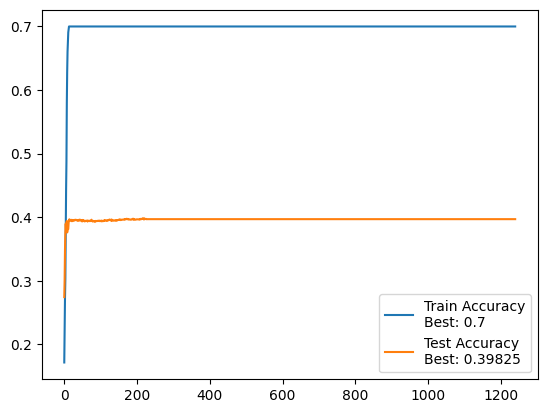

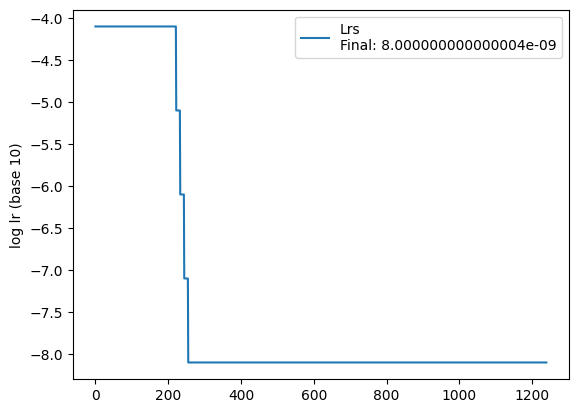

 90%|█████████ | 9/10 [01:05<00:07,  7.33s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.35s/it]

 Test accuracy: 39.7%, Avg loss: 6.775941


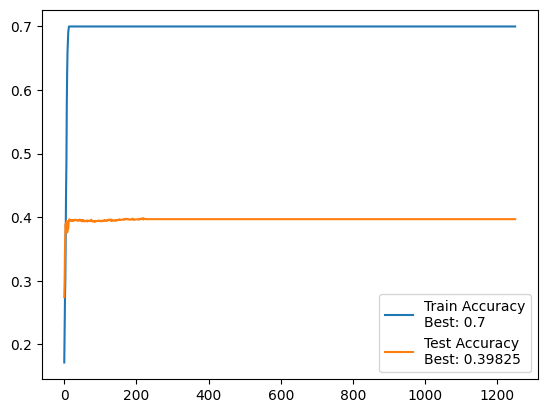

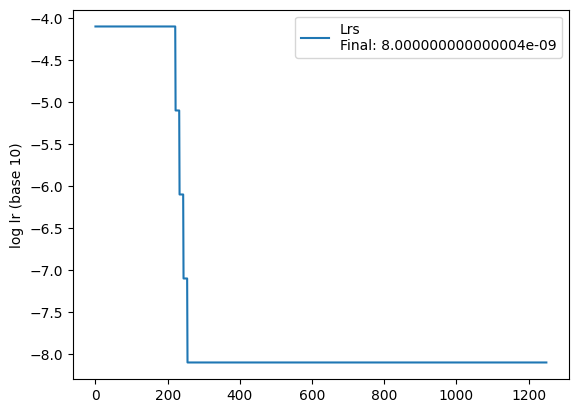

 90%|█████████ | 9/10 [01:06<00:07,  7.35s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.39s/it]

 Test accuracy: 39.7%, Avg loss: 6.776030


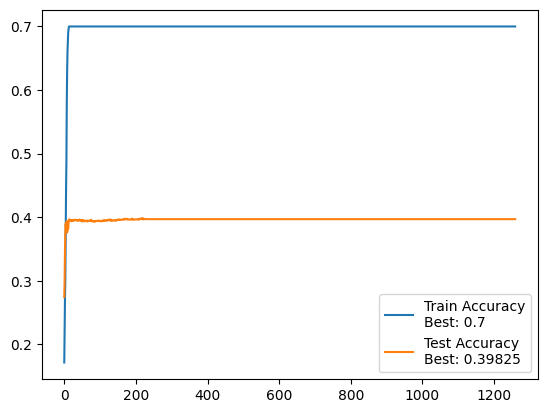

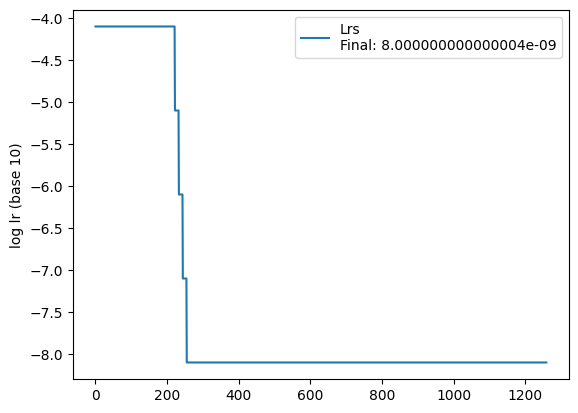

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.36s/it]

 Test accuracy: 39.7%, Avg loss: 6.776118


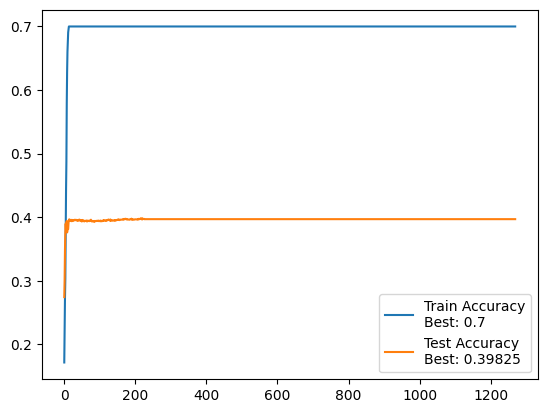

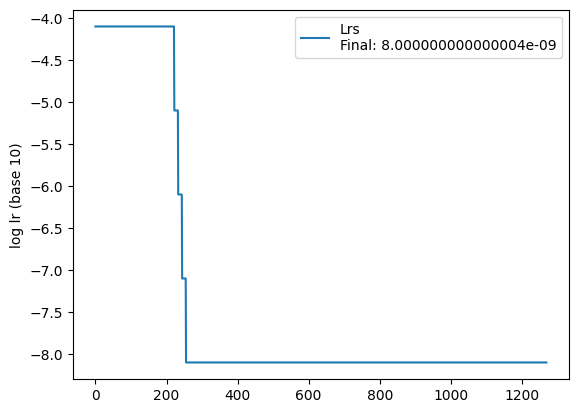

 90%|█████████ | 9/10 [01:05<00:07,  7.32s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.33s/it]

 Test accuracy: 39.7%, Avg loss: 6.776207


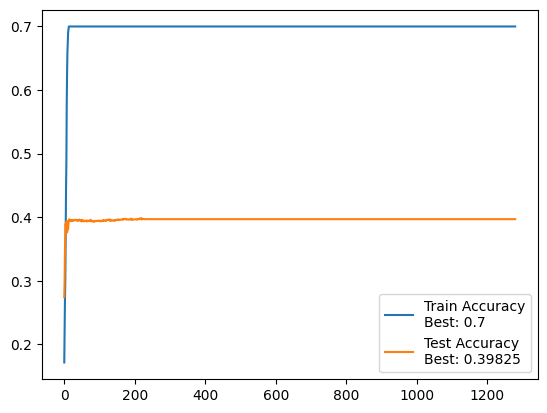

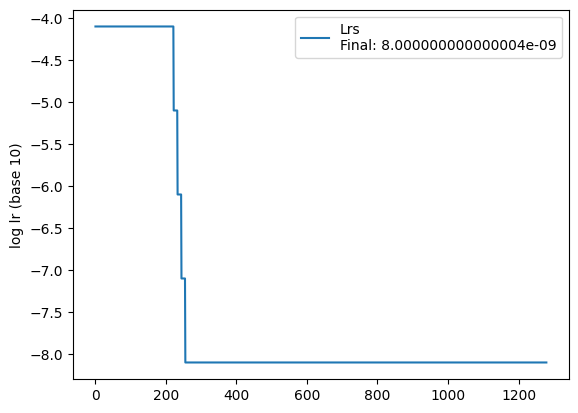

 90%|█████████ | 9/10 [01:05<00:07,  7.31s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.32s/it]

 Test accuracy: 39.7%, Avg loss: 6.776295


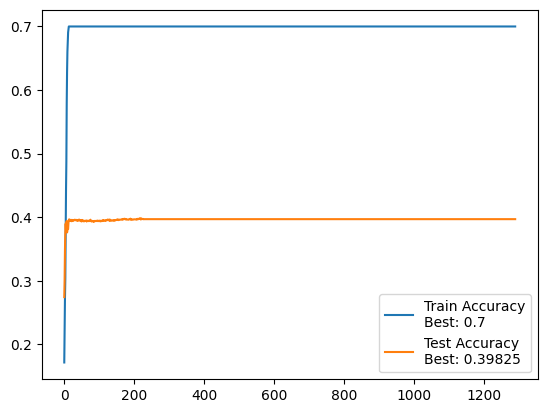

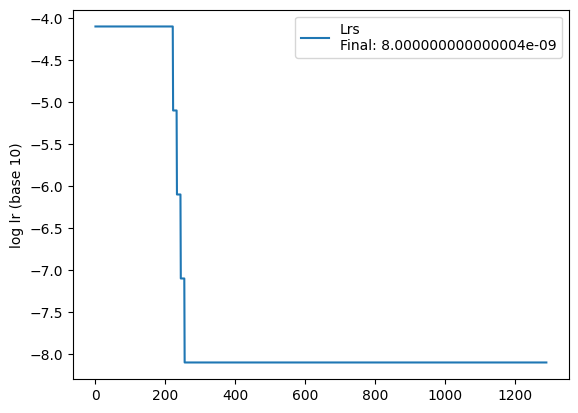

 90%|█████████ | 9/10 [01:05<00:07,  7.31s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.36s/it]

 Test accuracy: 39.7%, Avg loss: 6.776383


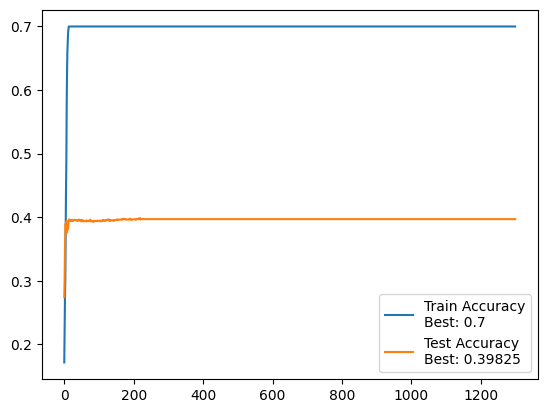

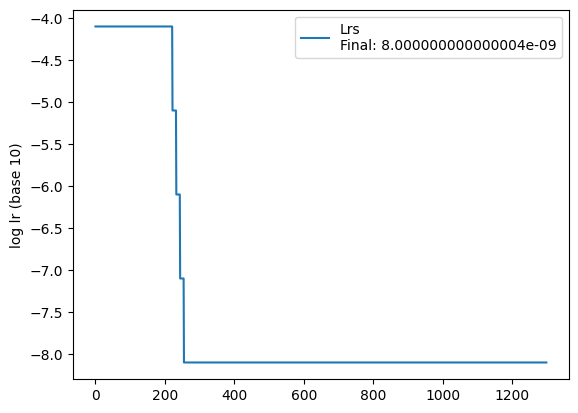

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.36s/it]

 Test accuracy: 39.7%, Avg loss: 6.776470


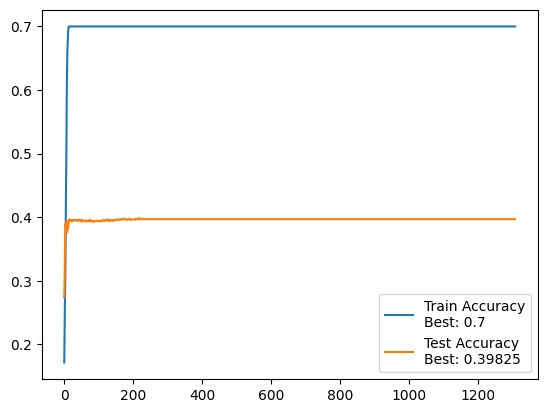

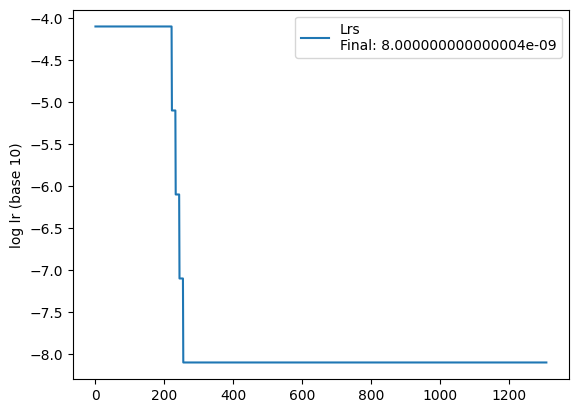

 90%|█████████ | 9/10 [01:06<00:07,  7.33s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.35s/it]

 Test accuracy: 39.7%, Avg loss: 6.776556


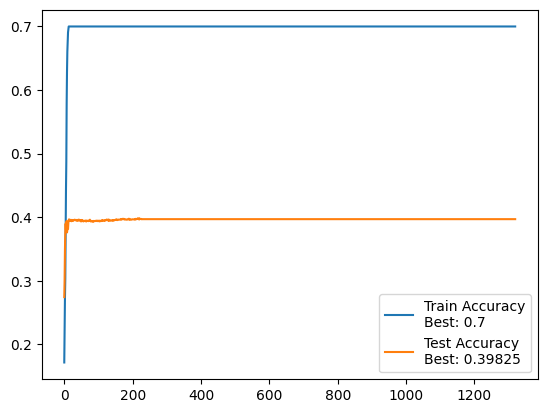

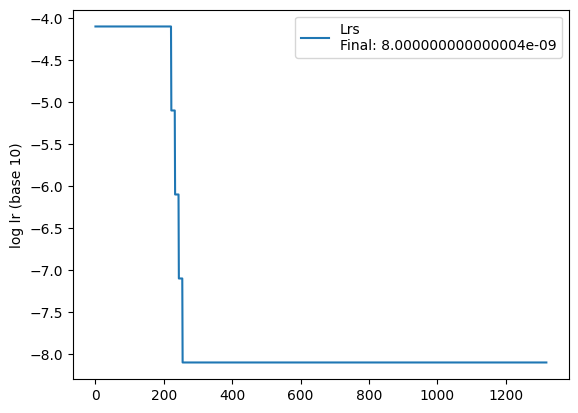

 90%|█████████ | 9/10 [01:06<00:07,  7.36s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:14<00:00,  7.44s/it]

 Test accuracy: 39.7%, Avg loss: 6.776641


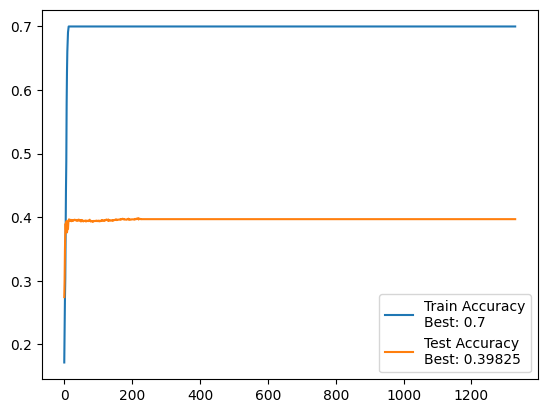

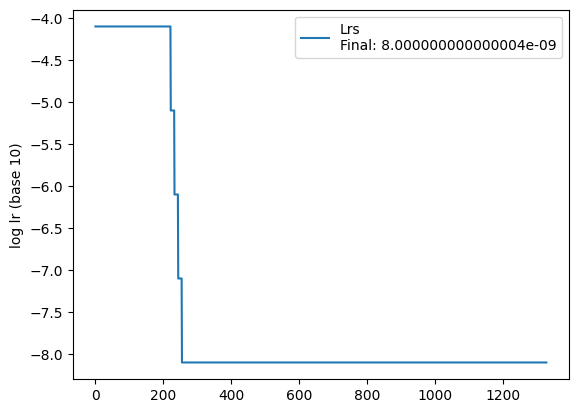

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.39s/it]

 Test accuracy: 39.7%, Avg loss: 6.776728


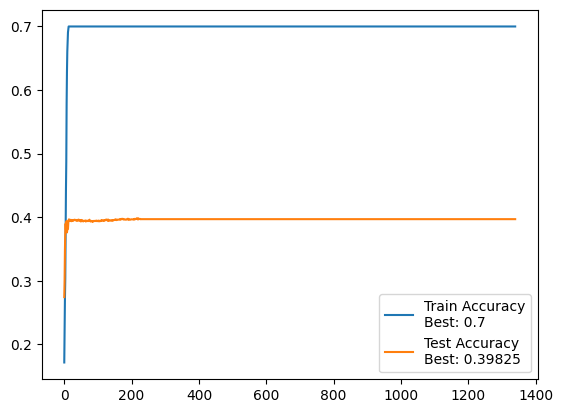

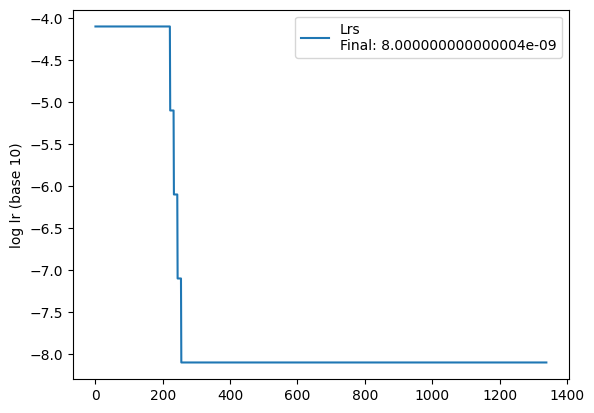

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.36s/it]

 Test accuracy: 39.7%, Avg loss: 6.776814


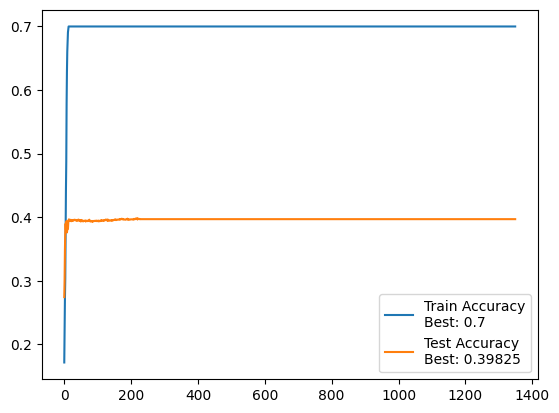

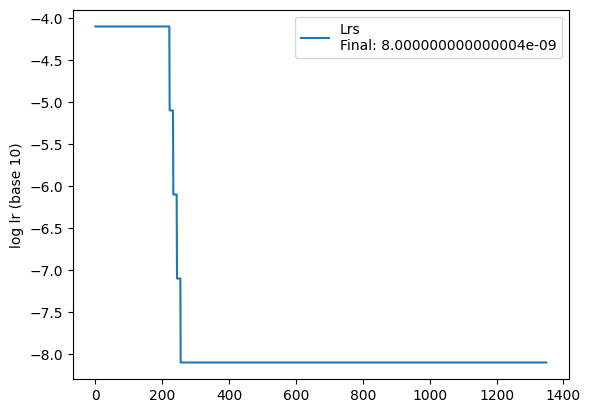

 90%|█████████ | 9/10 [01:06<00:07,  7.35s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.776900


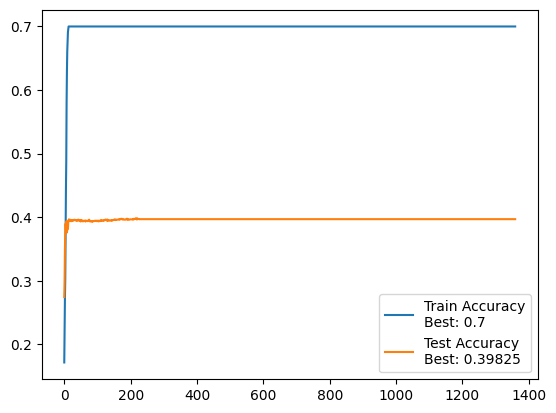

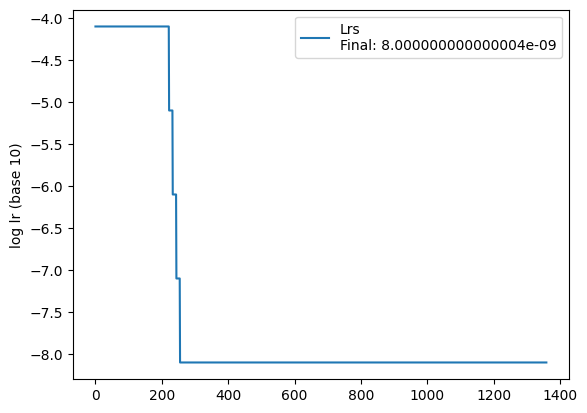

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.776986


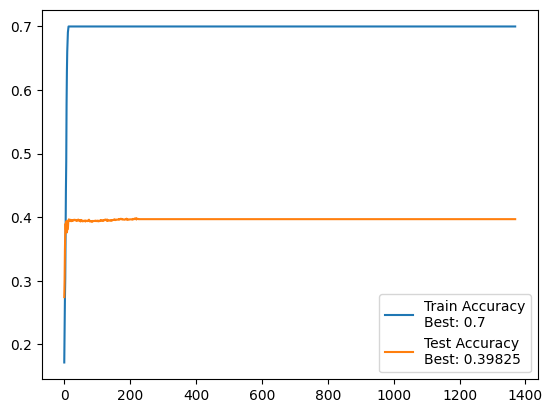

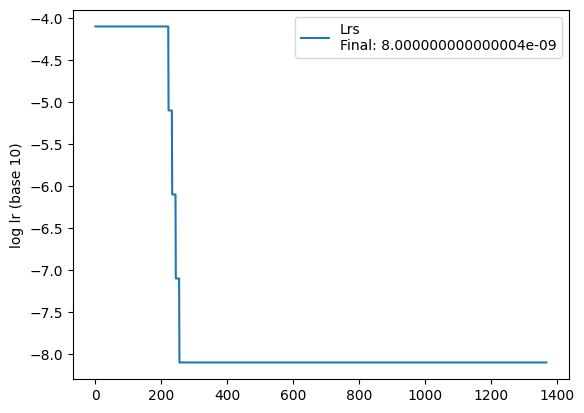

 90%|█████████ | 9/10 [01:06<00:07,  7.35s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.39s/it]

 Test accuracy: 39.7%, Avg loss: 6.777071


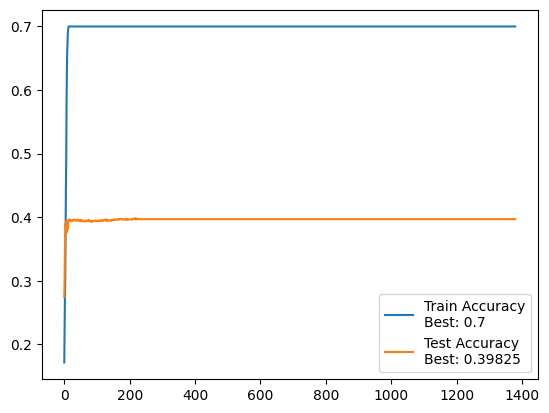

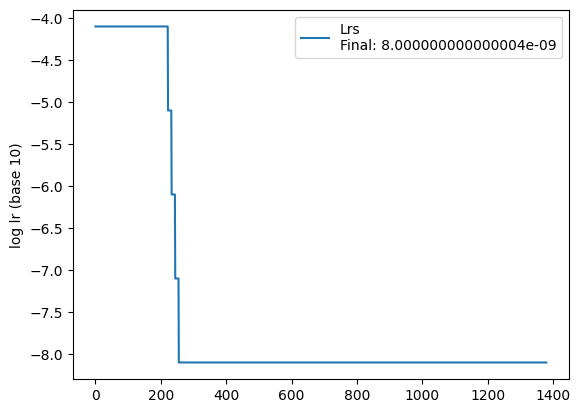

 90%|█████████ | 9/10 [01:06<00:07,  7.36s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.777156


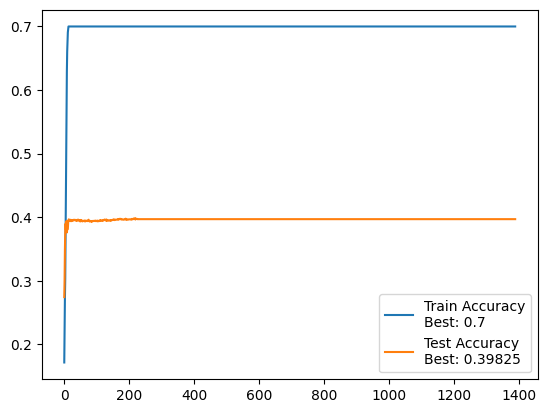

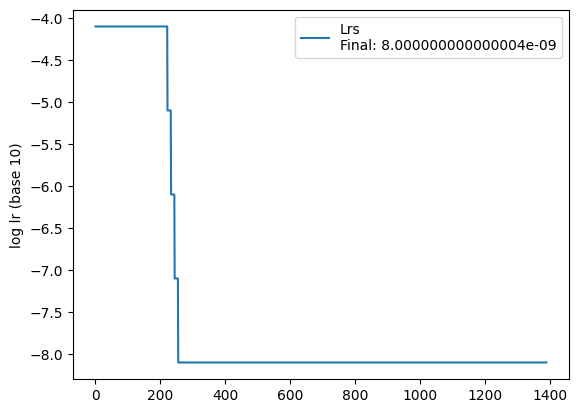

 90%|█████████ | 9/10 [01:06<00:07,  7.33s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.36s/it]

 Test accuracy: 39.7%, Avg loss: 6.777241


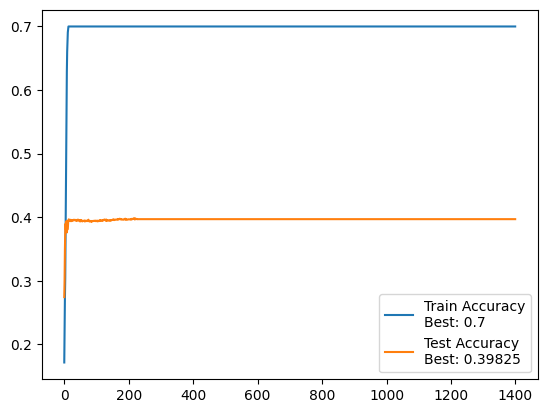

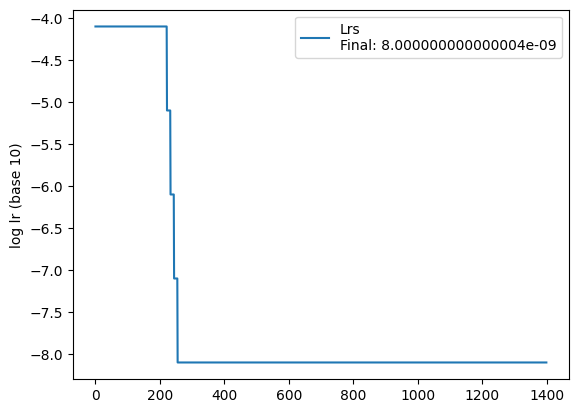

 90%|█████████ | 9/10 [01:06<00:07,  7.36s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.39s/it]

 Test accuracy: 39.7%, Avg loss: 6.777324


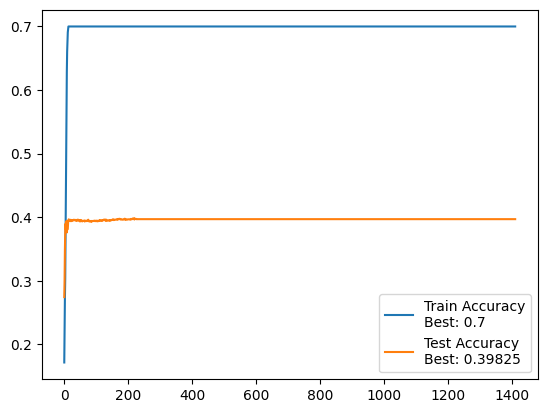

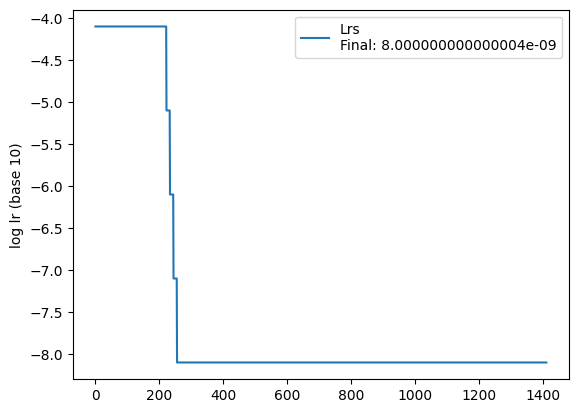

 90%|█████████ | 9/10 [01:06<00:07,  7.36s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.38s/it]

 Test accuracy: 39.7%, Avg loss: 6.777409


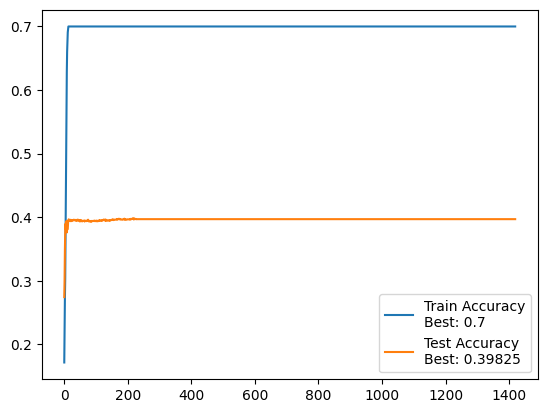

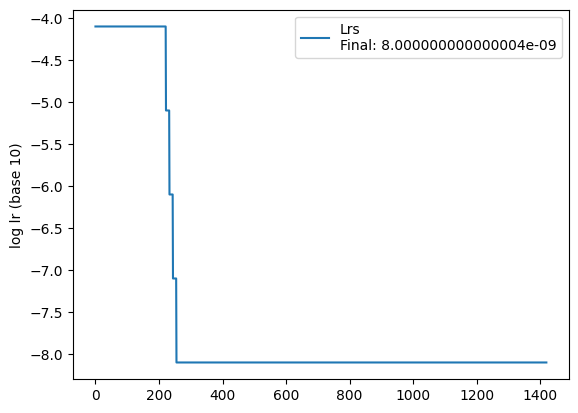

 90%|█████████ | 9/10 [01:06<00:07,  7.36s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.39s/it]

 Test accuracy: 39.7%, Avg loss: 6.777494


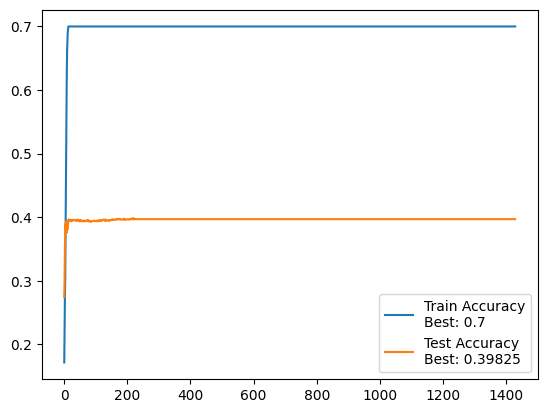

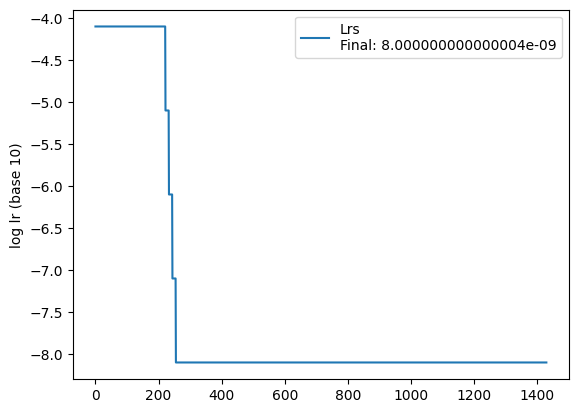

 90%|█████████ | 9/10 [01:06<00:07,  7.36s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.38s/it]

 Test accuracy: 39.7%, Avg loss: 6.777578


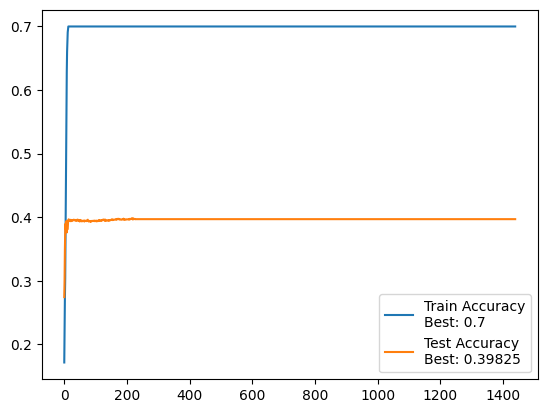

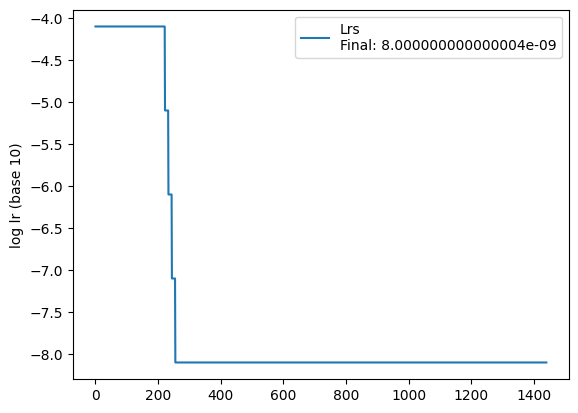

 90%|█████████ | 9/10 [01:06<00:07,  7.36s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.39s/it]

 Test accuracy: 39.7%, Avg loss: 6.777661


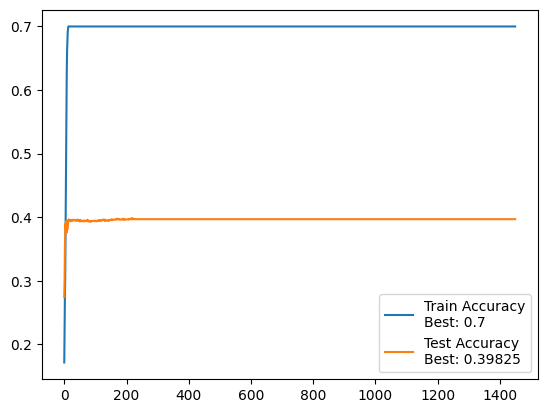

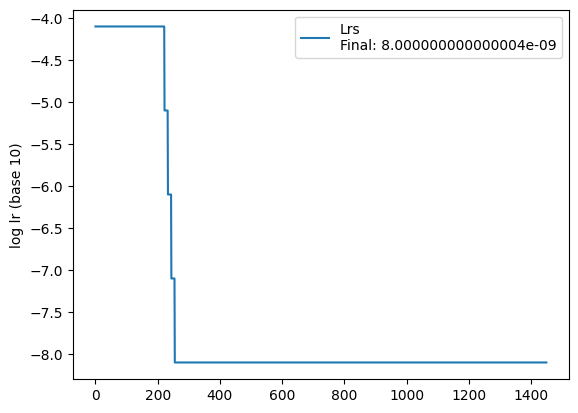

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.38s/it]

 Test accuracy: 39.7%, Avg loss: 6.777744


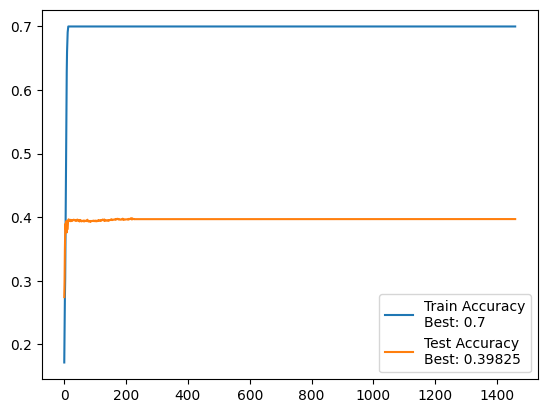

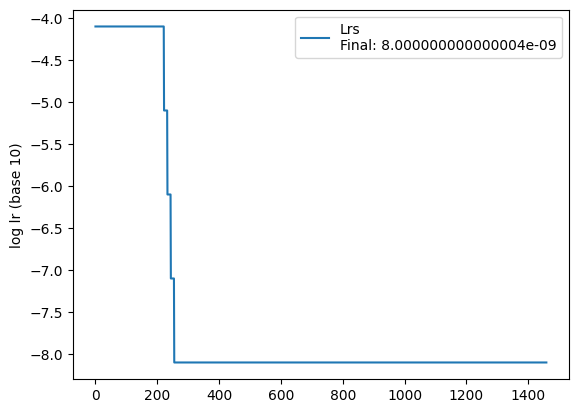

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.777826


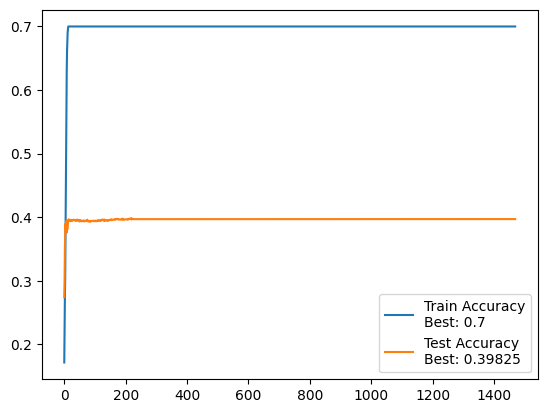

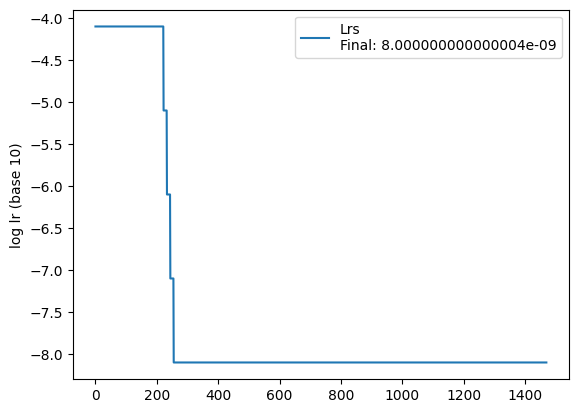

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.36s/it]


 Test accuracy: 39.7%, Avg loss: 6.777906


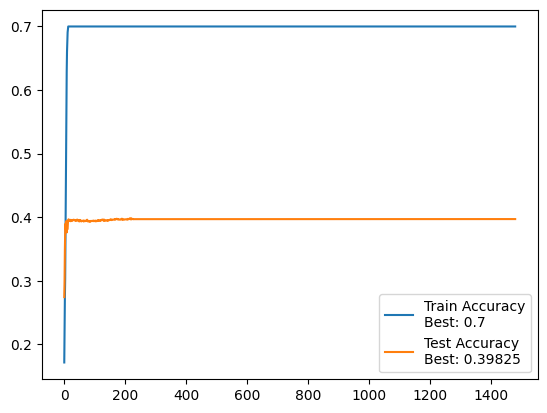

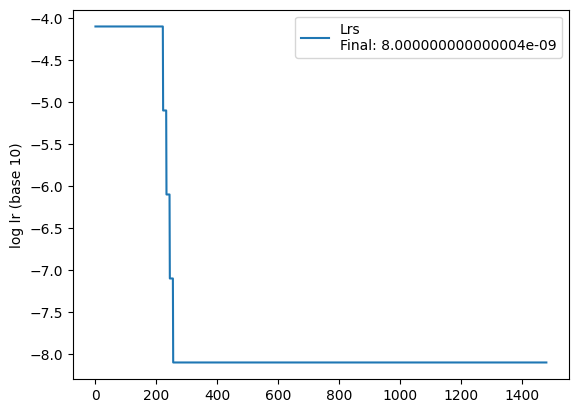

 90%|█████████ | 9/10 [01:05<00:07,  7.33s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.35s/it]

 Test accuracy: 39.7%, Avg loss: 6.777986


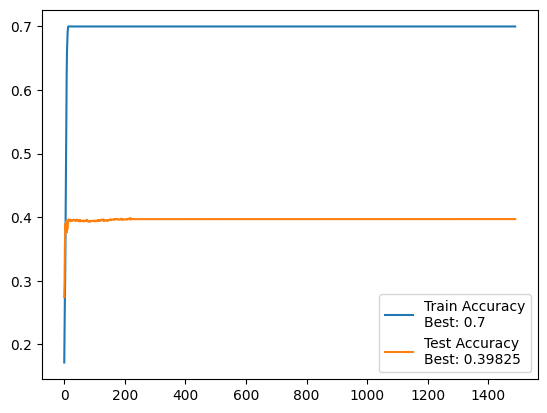

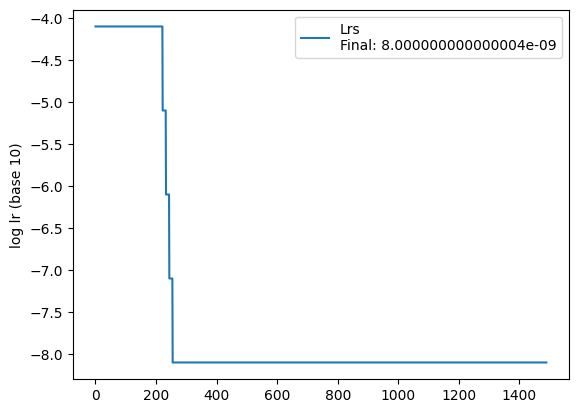

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.778066


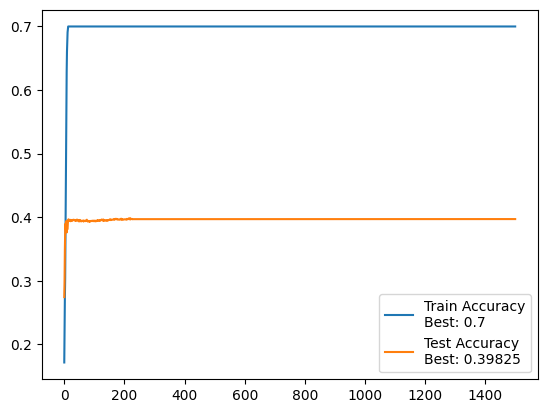

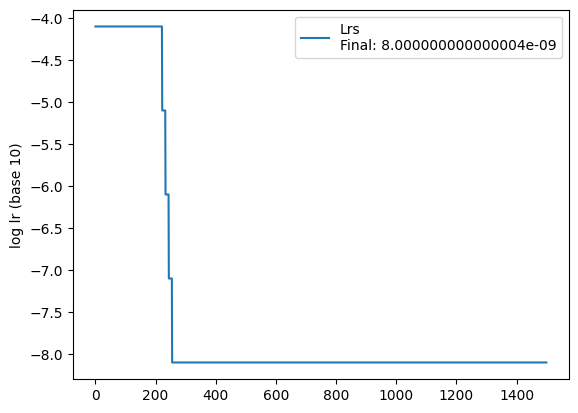

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.778146


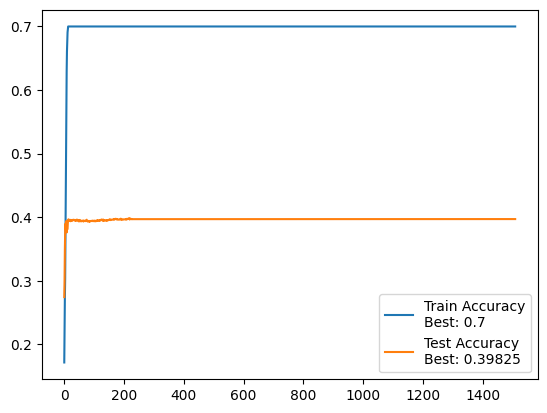

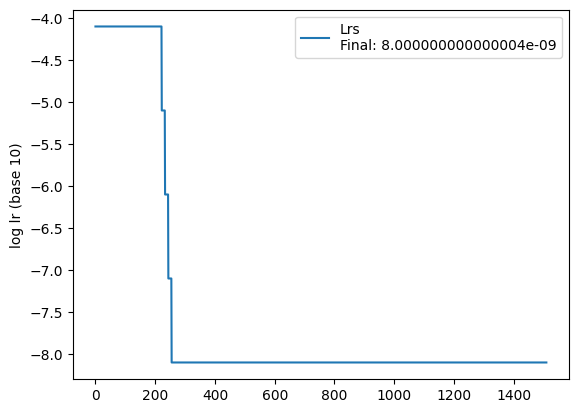

 90%|█████████ | 9/10 [01:06<00:07,  7.37s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.39s/it]

 Test accuracy: 39.7%, Avg loss: 6.778225


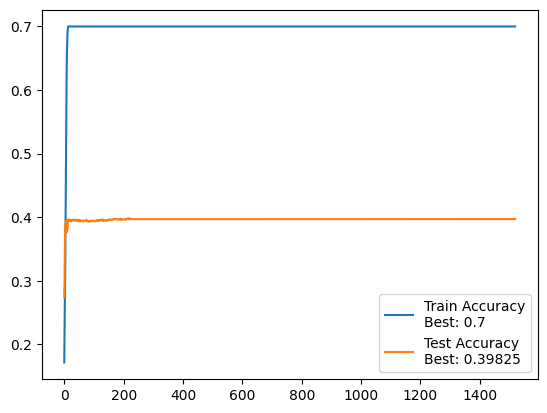

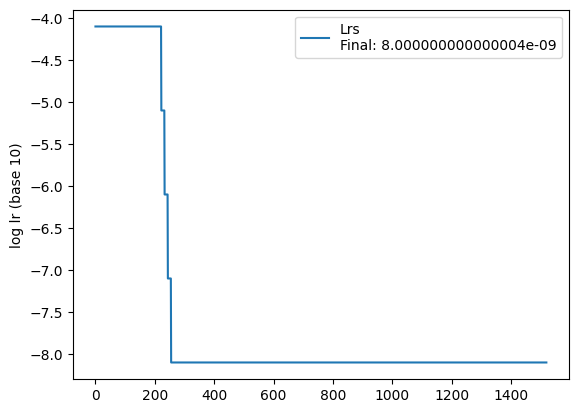

 90%|█████████ | 9/10 [01:06<00:07,  7.36s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.778304


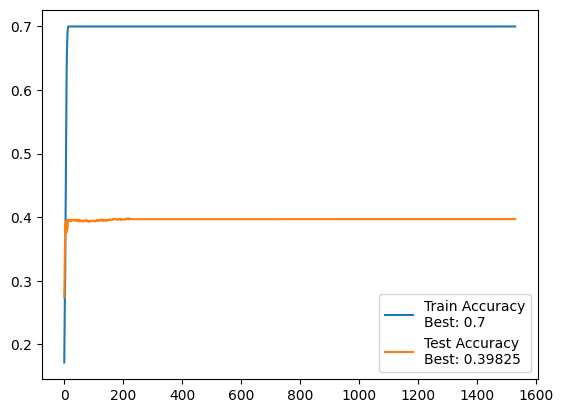

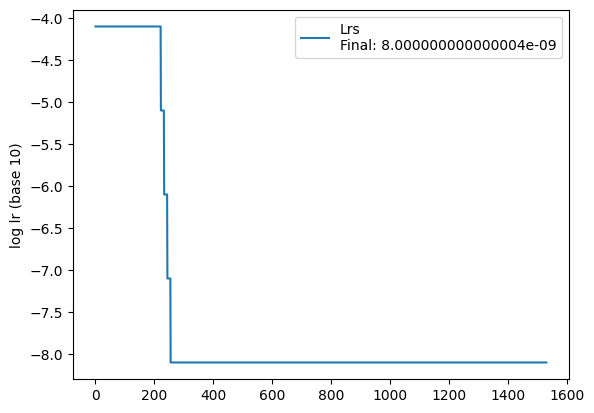

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.778382


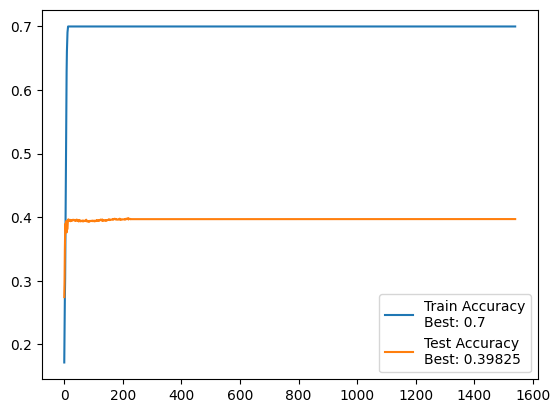

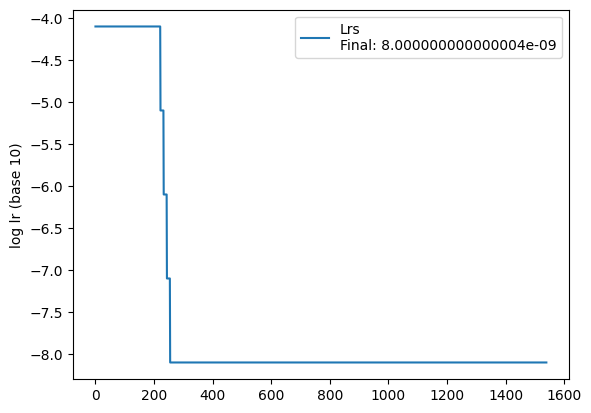

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.778460


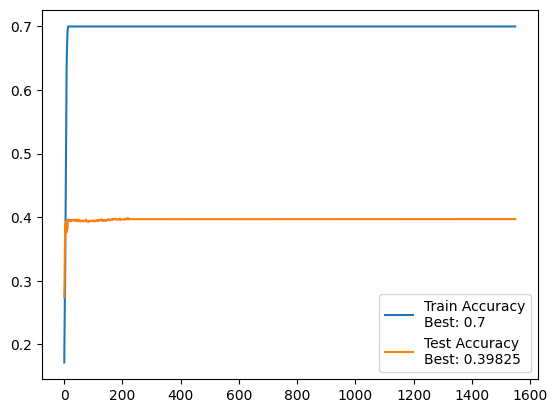

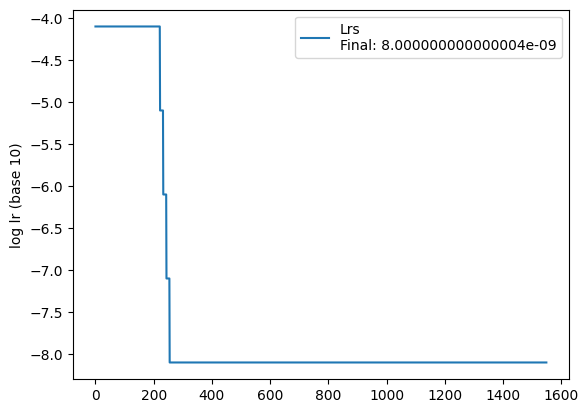

 90%|█████████ | 9/10 [01:06<00:07,  7.33s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.35s/it]

 Test accuracy: 39.7%, Avg loss: 6.778540


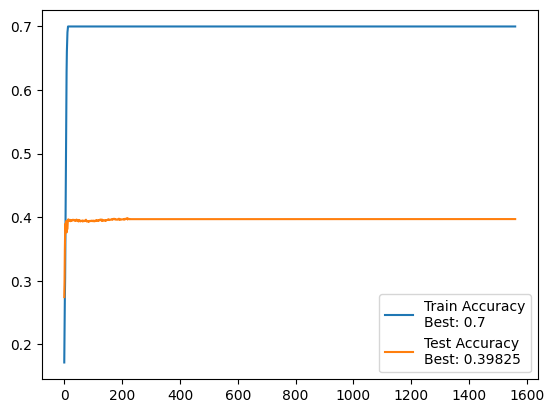

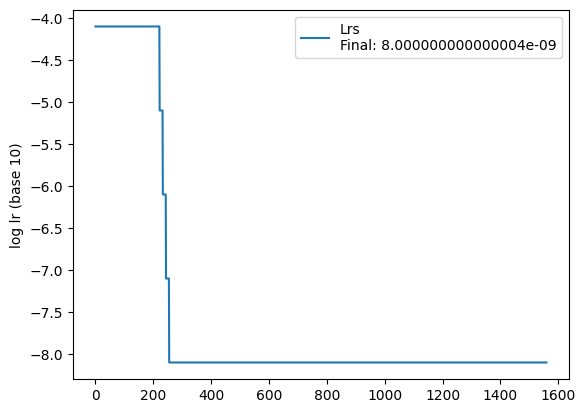

 90%|█████████ | 9/10 [01:06<00:07,  7.35s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.778618


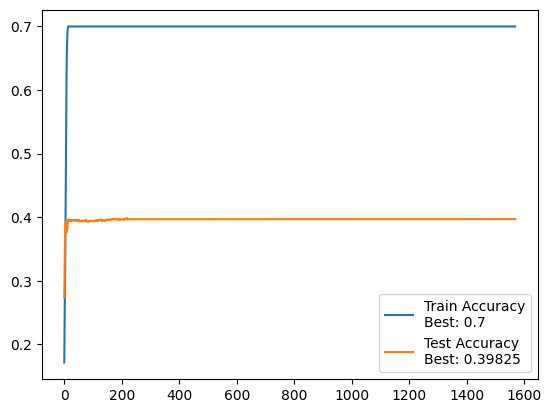

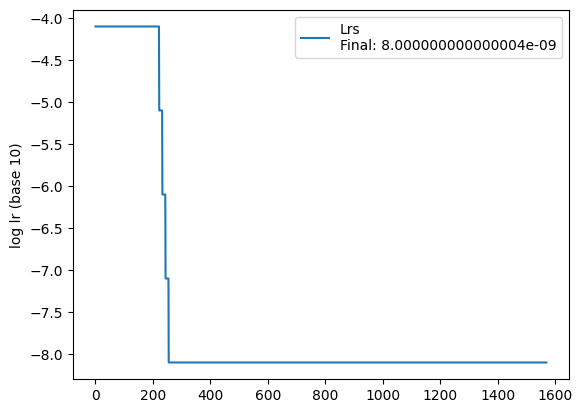

 90%|█████████ | 9/10 [01:06<00:07,  7.35s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.778695


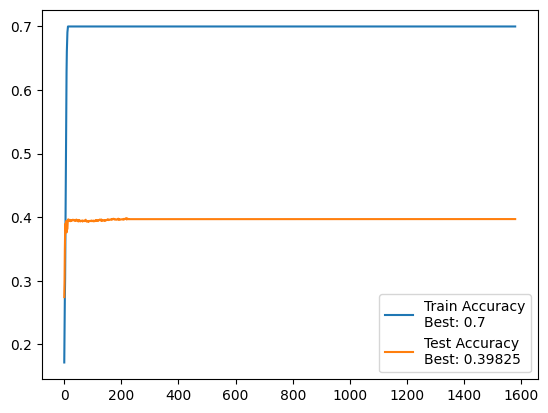

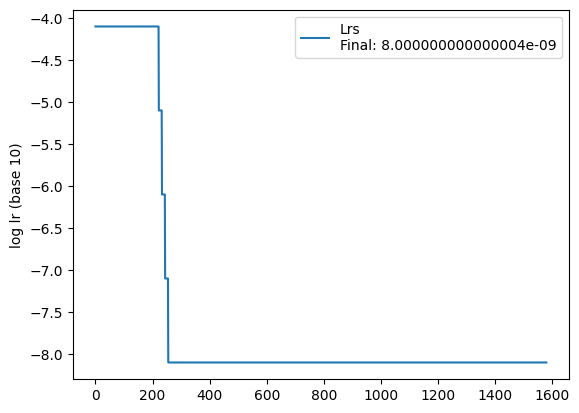

 90%|█████████ | 9/10 [01:06<00:07,  7.32s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.36s/it]

 Test accuracy: 39.7%, Avg loss: 6.778773


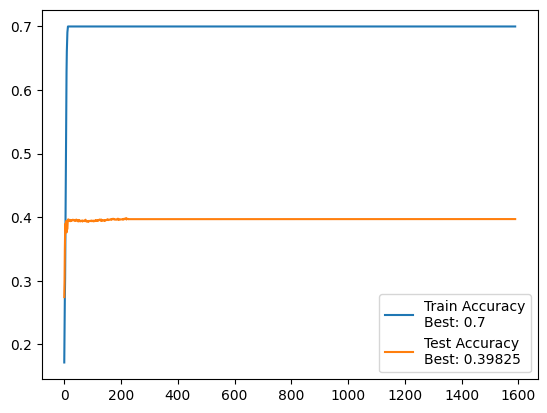

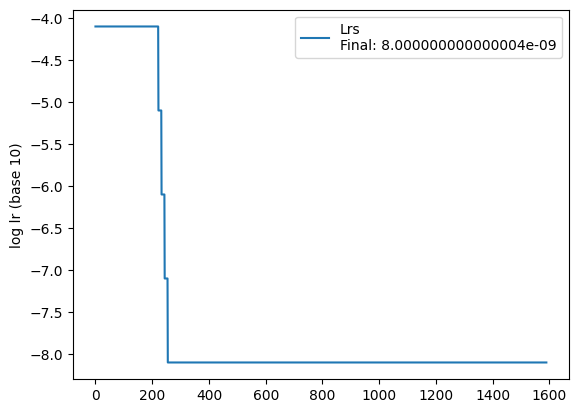

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.778850


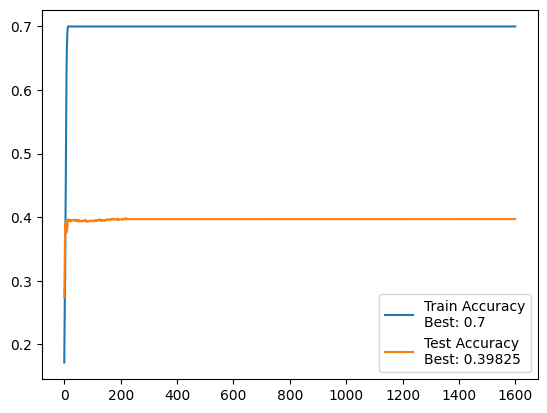

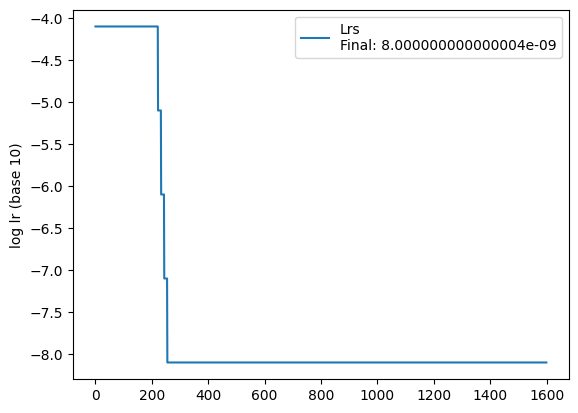

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.778928


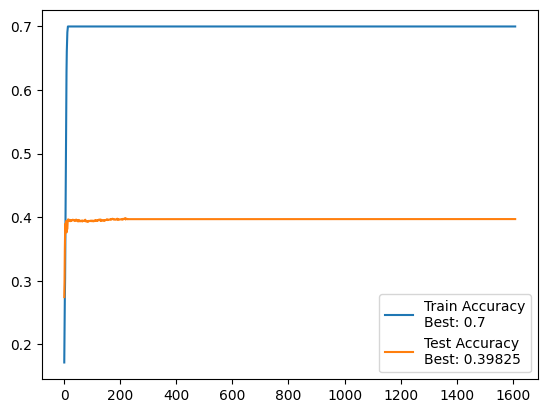

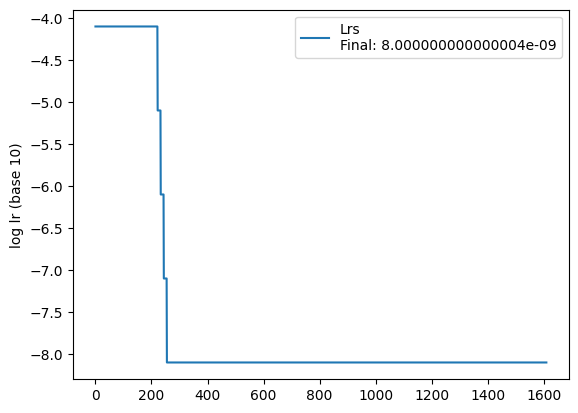

 90%|█████████ | 9/10 [01:06<00:07,  7.35s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.38s/it]

 Test accuracy: 39.7%, Avg loss: 6.779005


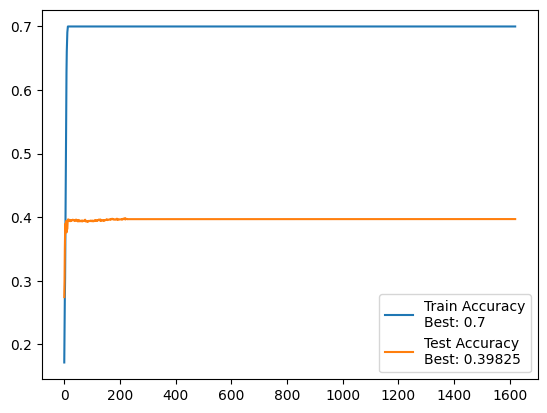

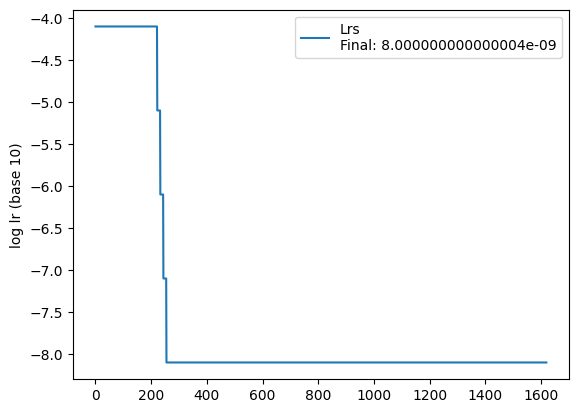

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.779082


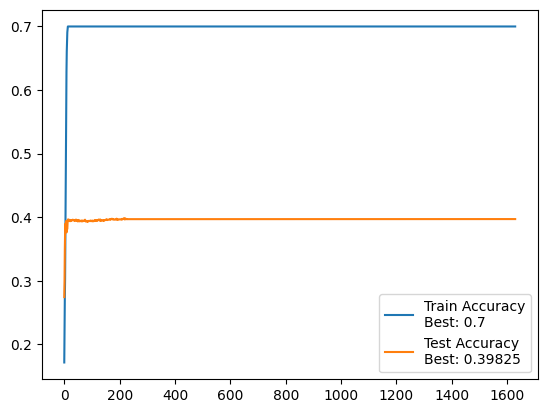

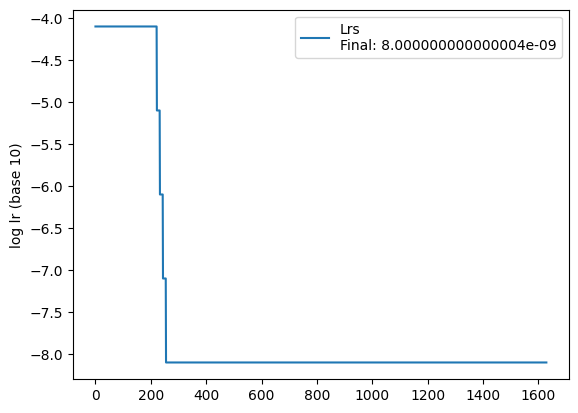

 90%|█████████ | 9/10 [01:06<00:07,  7.35s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.38s/it]

 Test accuracy: 39.7%, Avg loss: 6.779159


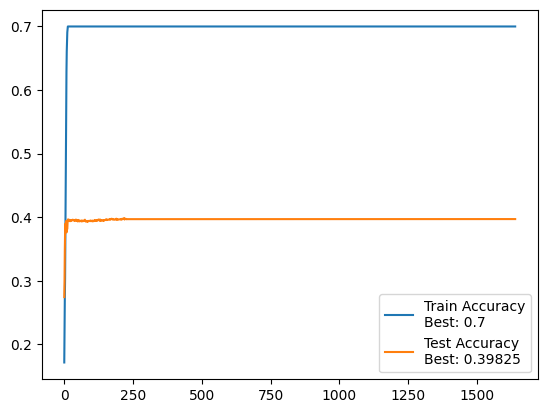

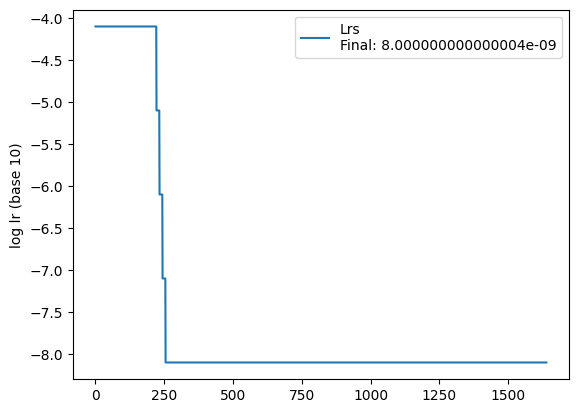

 90%|█████████ | 9/10 [01:06<00:07,  7.37s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:14<00:00,  7.40s/it]

 Test accuracy: 39.7%, Avg loss: 6.779235


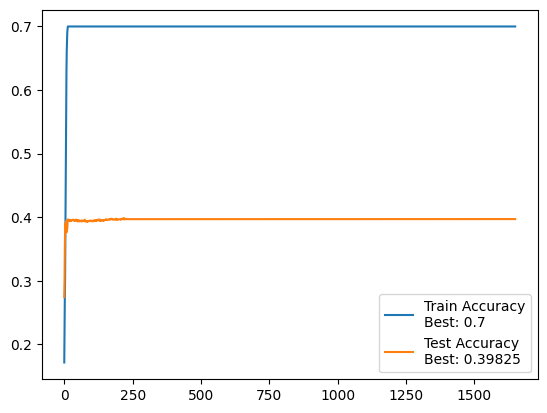

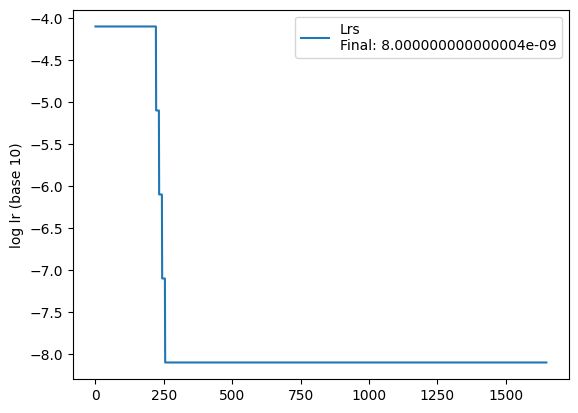

 90%|█████████ | 9/10 [01:06<00:07,  7.37s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.779310


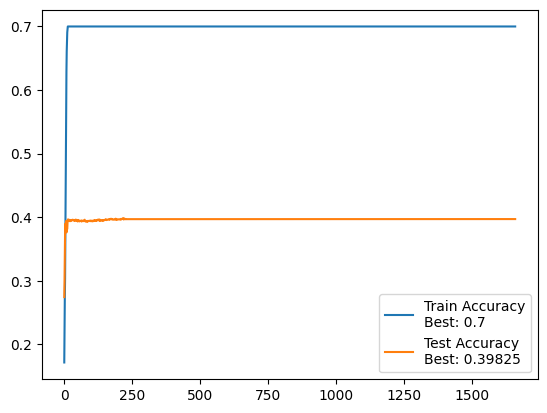

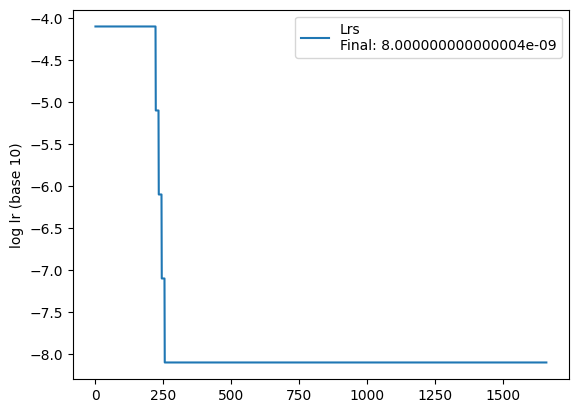

 90%|█████████ | 9/10 [01:06<00:07,  7.35s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.779385


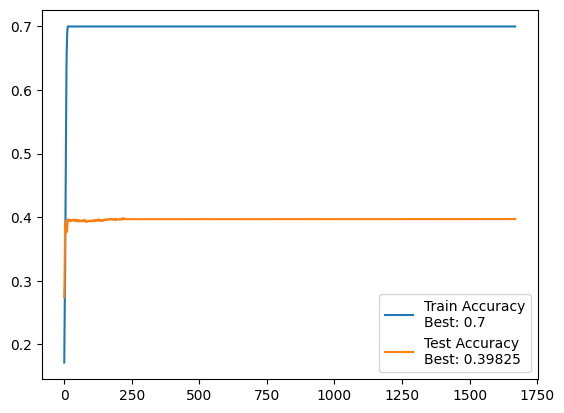

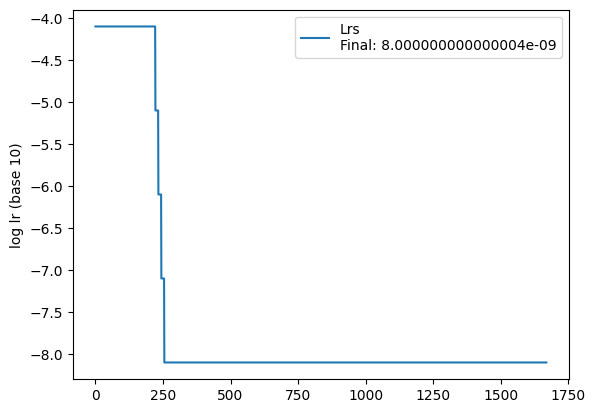

 90%|█████████ | 9/10 [01:06<00:07,  7.33s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.779460


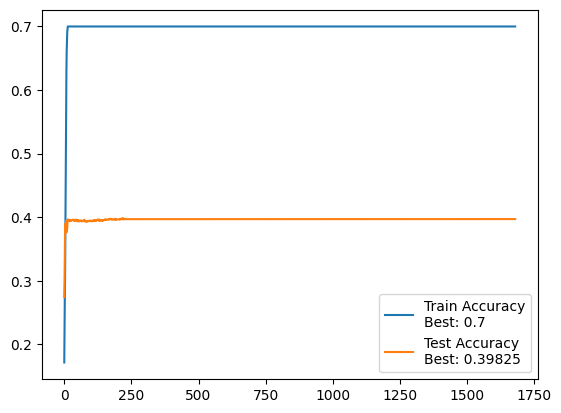

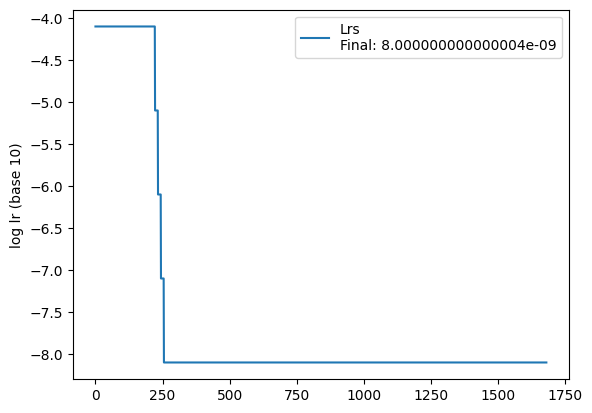

 90%|█████████ | 9/10 [01:06<00:07,  7.35s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.779533


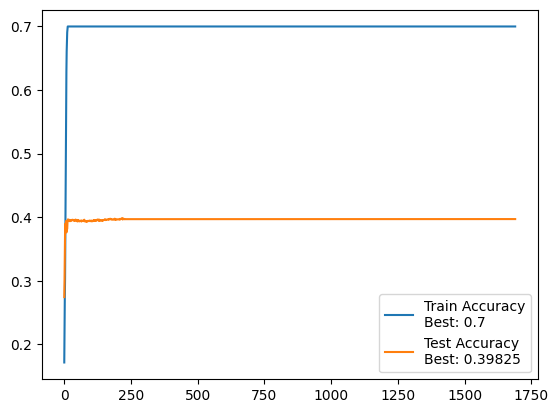

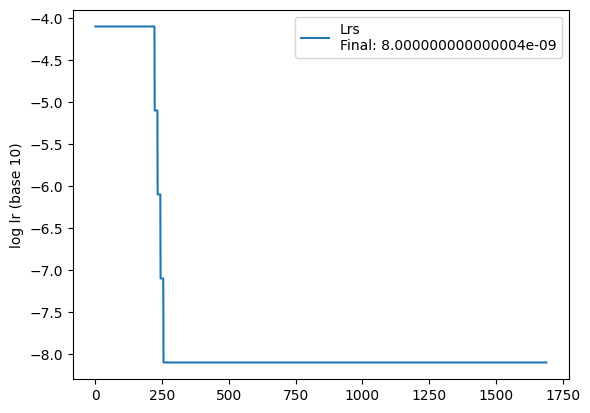

 90%|█████████ | 9/10 [01:06<00:07,  7.35s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.36s/it]

 Test accuracy: 39.7%, Avg loss: 6.779605


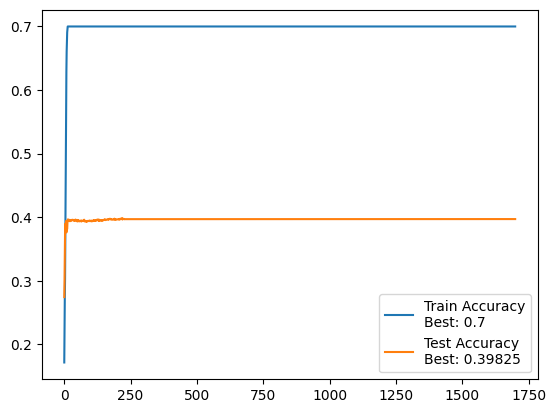

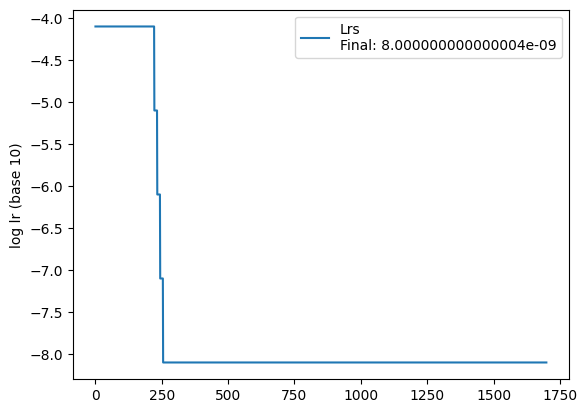

 90%|█████████ | 9/10 [01:06<00:07,  7.35s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.779680


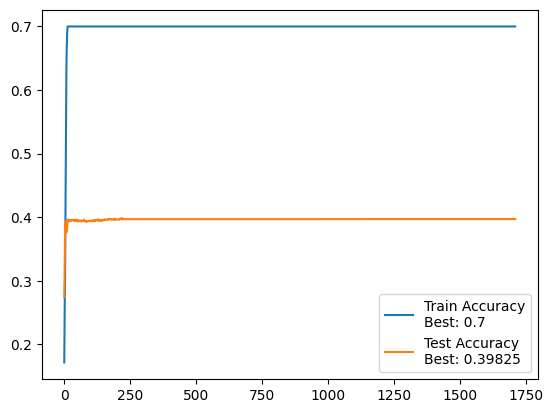

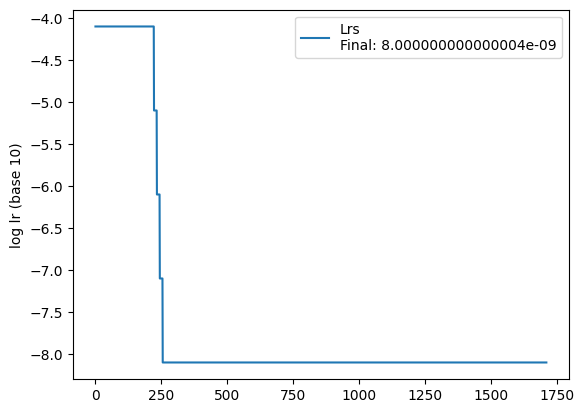

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.38s/it]

 Test accuracy: 39.7%, Avg loss: 6.779752


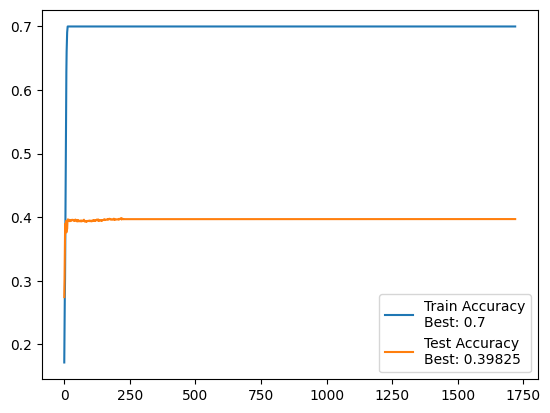

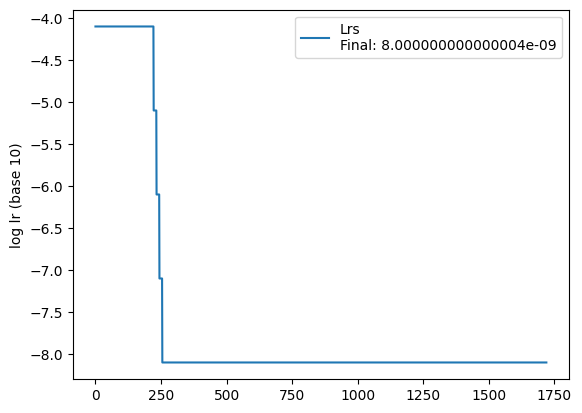

 90%|█████████ | 9/10 [01:06<00:07,  7.33s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.38s/it]

 Test accuracy: 39.7%, Avg loss: 6.779825


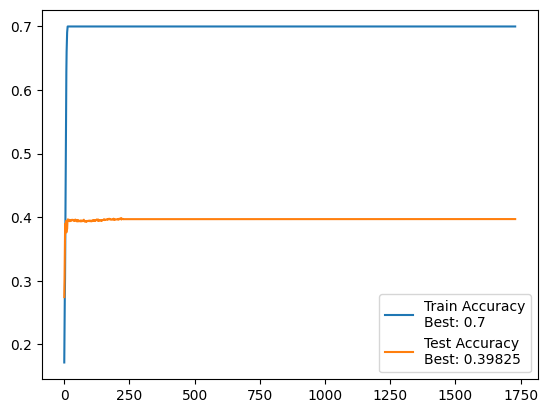

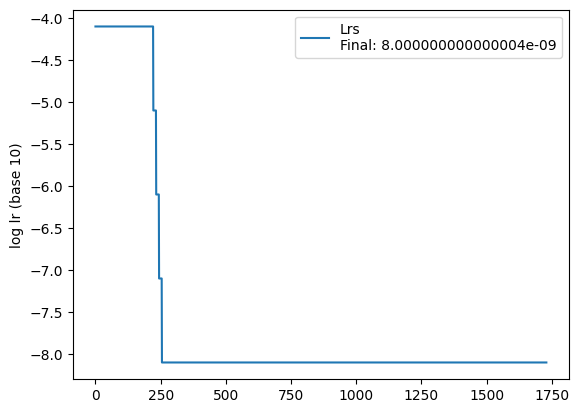

 90%|█████████ | 9/10 [01:06<00:07,  7.36s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.38s/it]

 Test accuracy: 39.7%, Avg loss: 6.779900


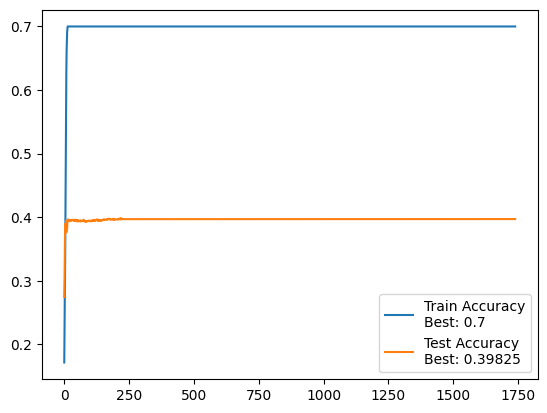

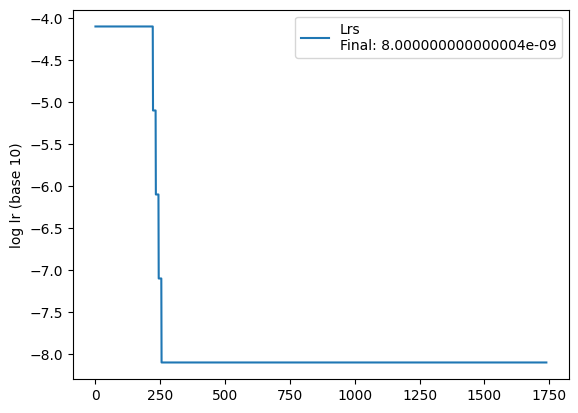

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.38s/it]

 Test accuracy: 39.7%, Avg loss: 6.779973


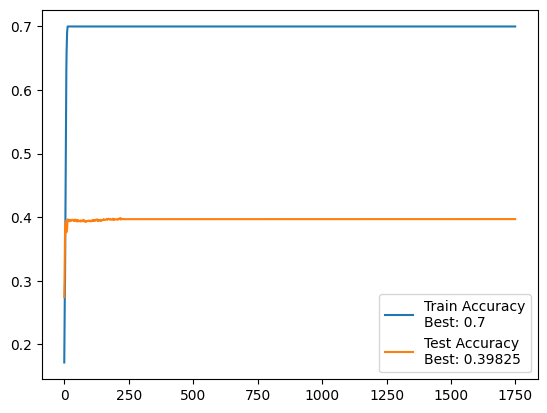

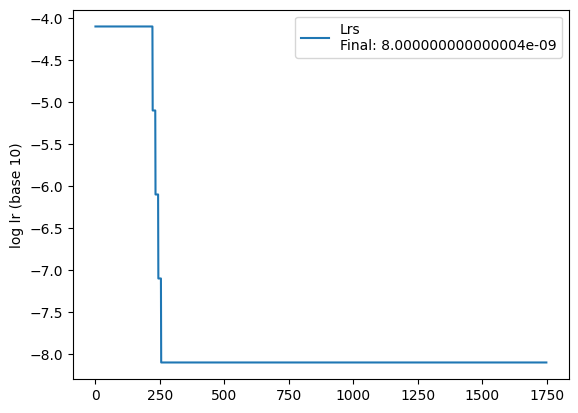

 90%|█████████ | 9/10 [01:06<00:07,  7.36s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.38s/it]

 Test accuracy: 39.7%, Avg loss: 6.780046


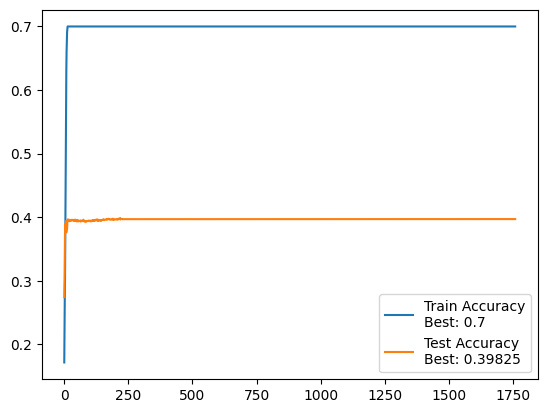

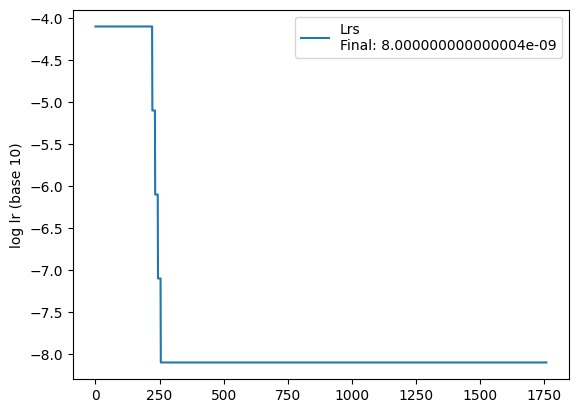

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.780118


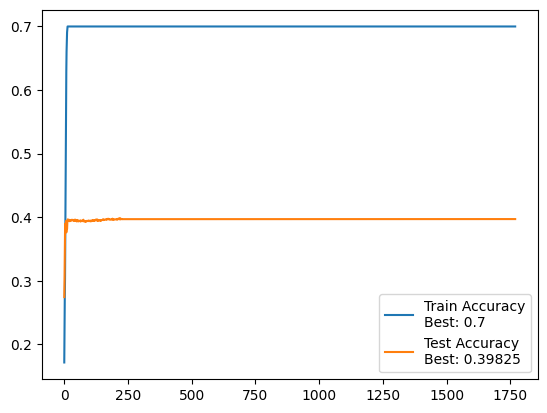

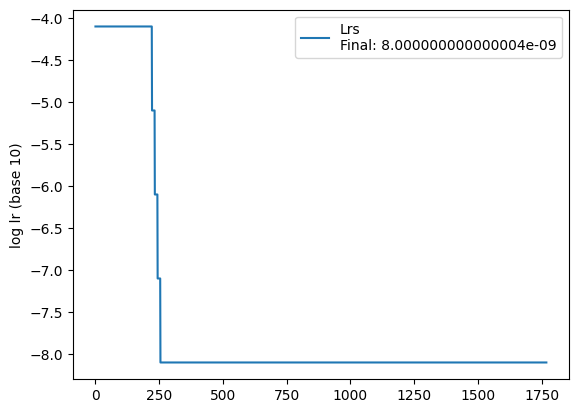

 90%|█████████ | 9/10 [01:06<00:07,  7.37s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.39s/it]

 Test accuracy: 39.7%, Avg loss: 6.780189


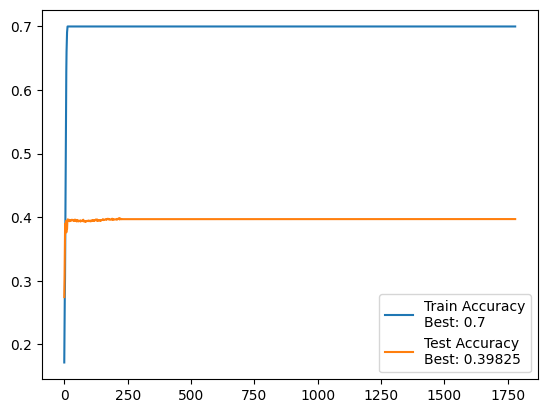

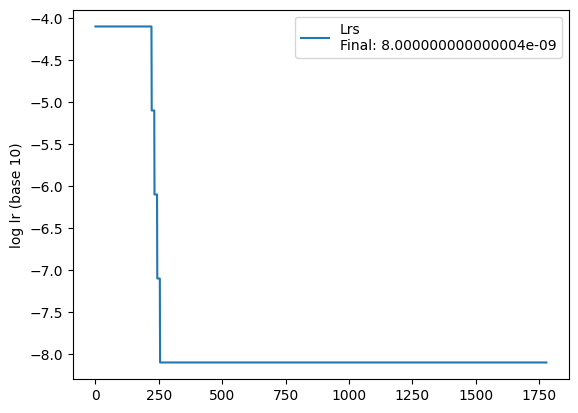

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.36s/it]

 Test accuracy: 39.7%, Avg loss: 6.780262


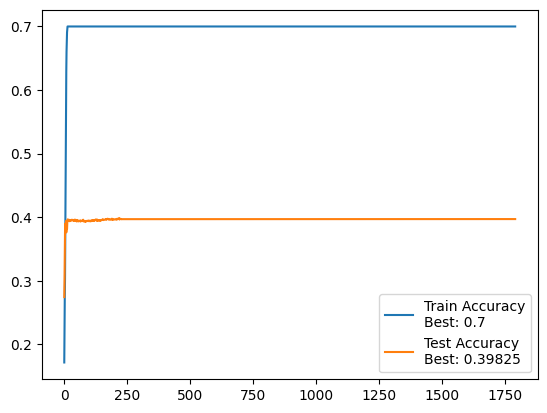

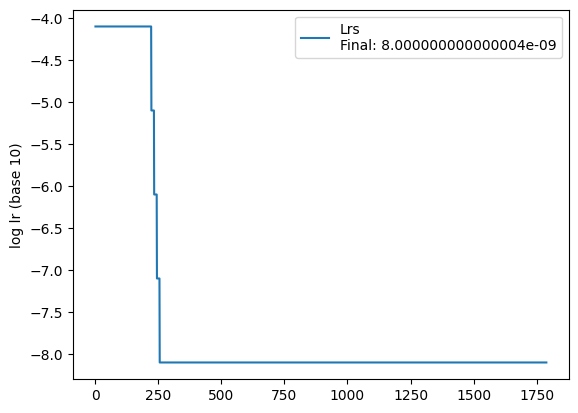

 90%|█████████ | 9/10 [01:06<00:07,  7.35s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.780332


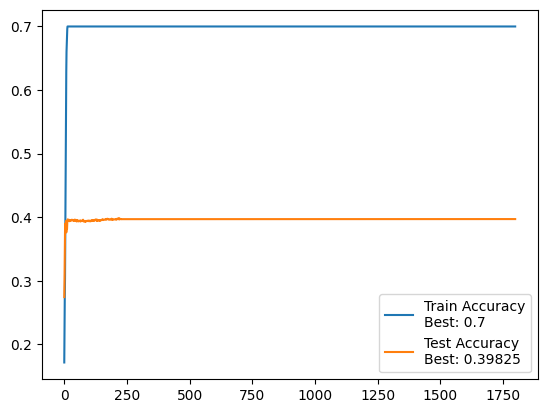

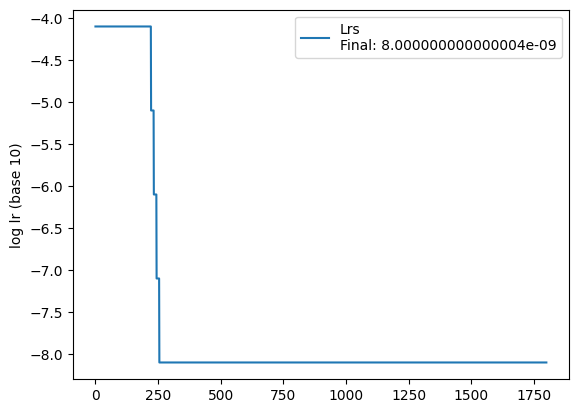

 90%|█████████ | 9/10 [01:06<00:07,  7.35s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.780403


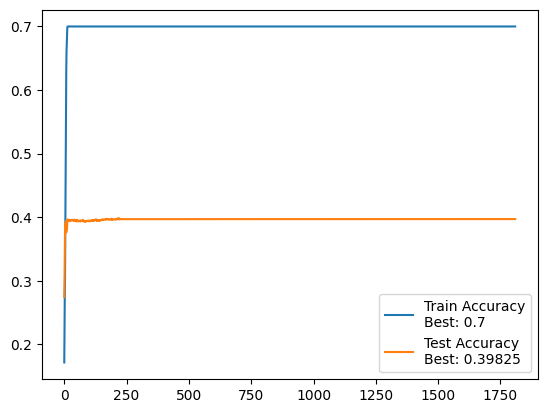

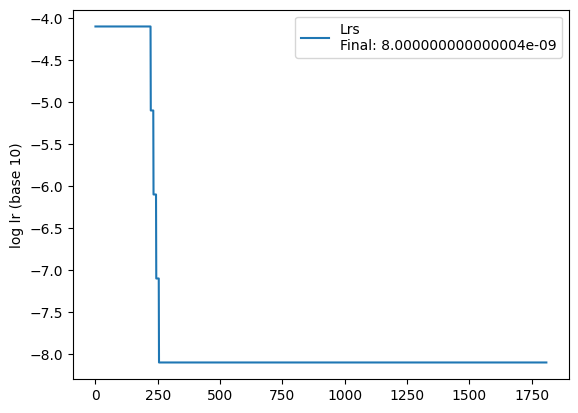

 90%|█████████ | 9/10 [01:06<00:07,  7.37s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.39s/it]

 Test accuracy: 39.7%, Avg loss: 6.780474


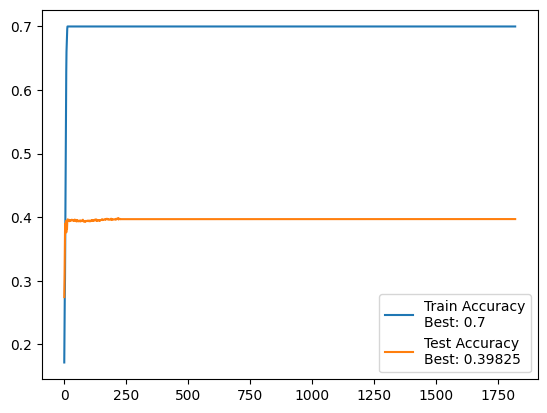

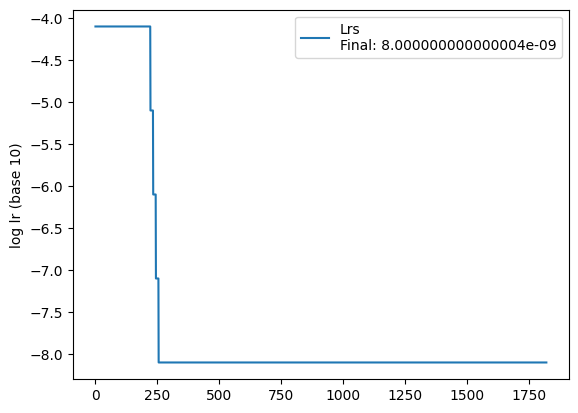

 90%|█████████ | 9/10 [01:06<00:07,  7.37s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.40s/it]

 Test accuracy: 39.7%, Avg loss: 6.780544


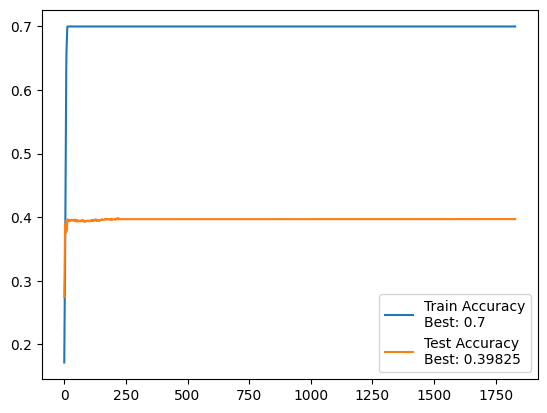

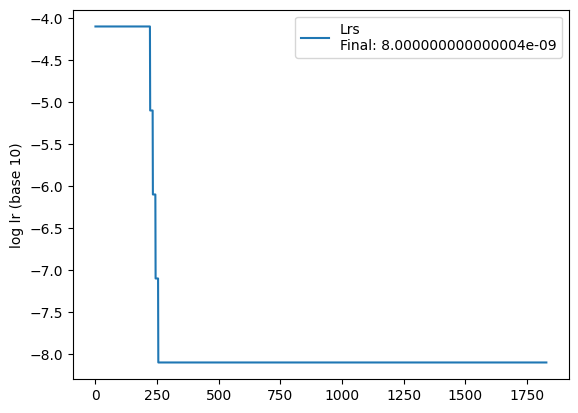

 90%|█████████ | 9/10 [01:06<00:07,  7.38s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.38s/it]

 Test accuracy: 39.7%, Avg loss: 6.780614


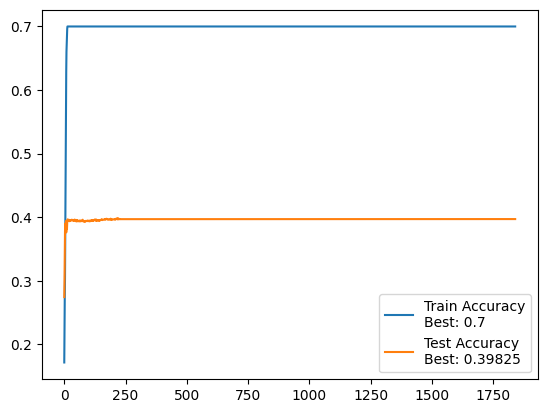

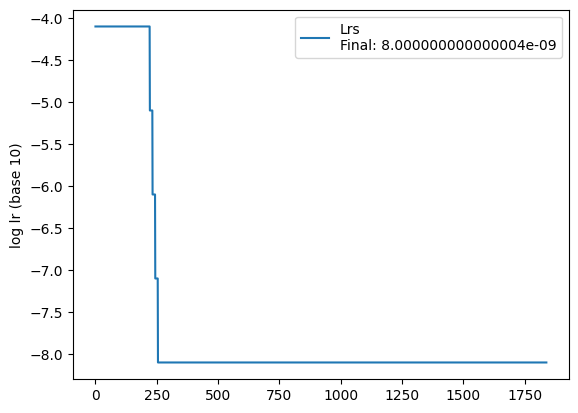

 90%|█████████ | 9/10 [01:06<00:07,  7.35s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.39s/it]

 Test accuracy: 39.7%, Avg loss: 6.780685


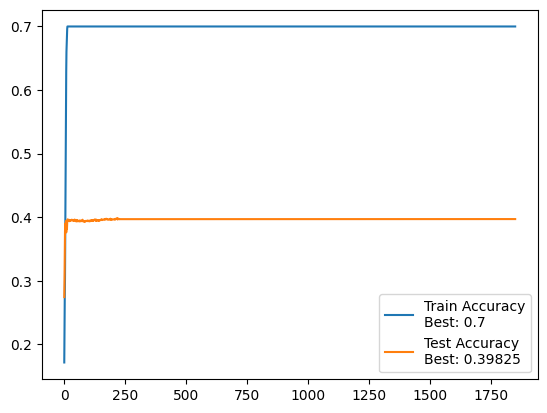

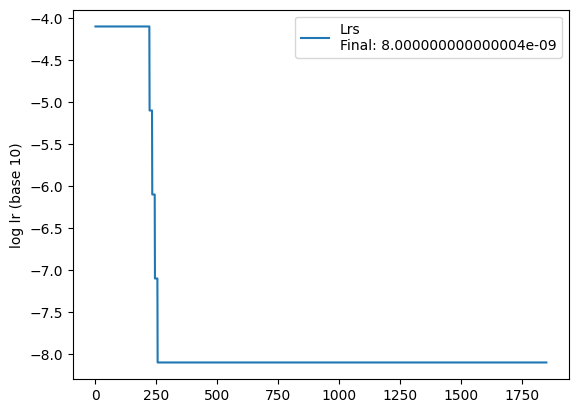

 90%|█████████ | 9/10 [01:06<00:07,  7.33s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.780755


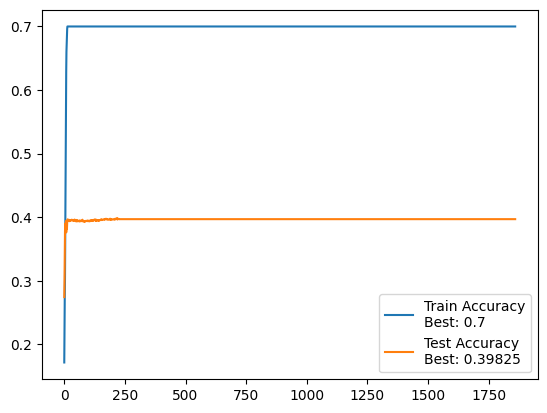

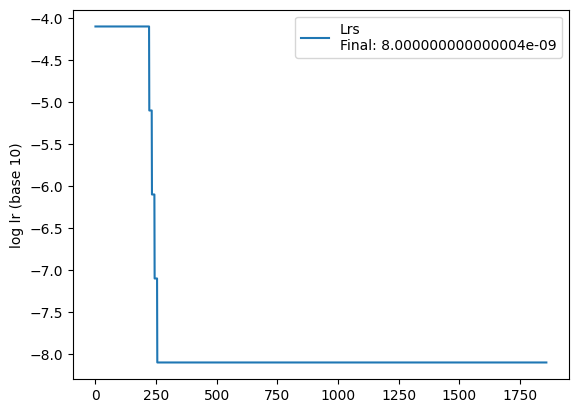

 90%|█████████ | 9/10 [01:06<00:07,  7.38s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:14<00:00,  7.40s/it]

 Test accuracy: 39.7%, Avg loss: 6.780825


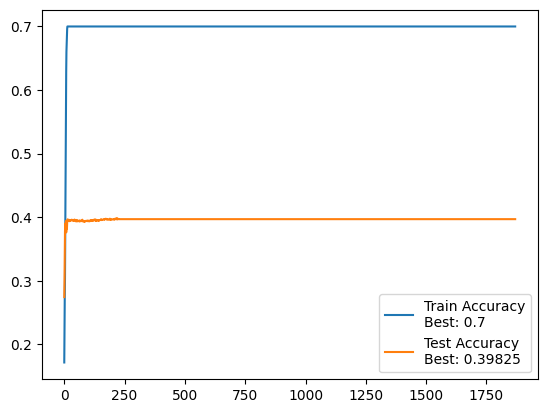

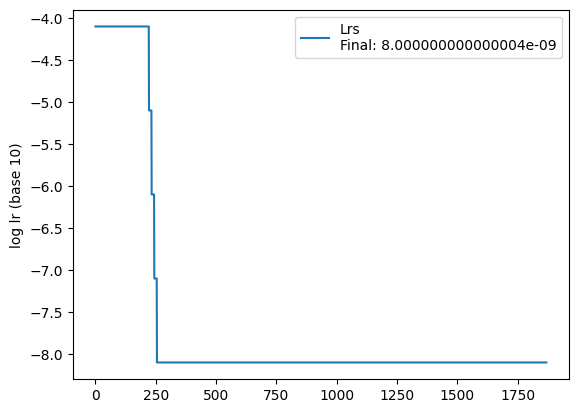

 90%|█████████ | 9/10 [01:06<00:07,  7.40s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:14<00:00,  7.41s/it]

 Test accuracy: 39.7%, Avg loss: 6.780895


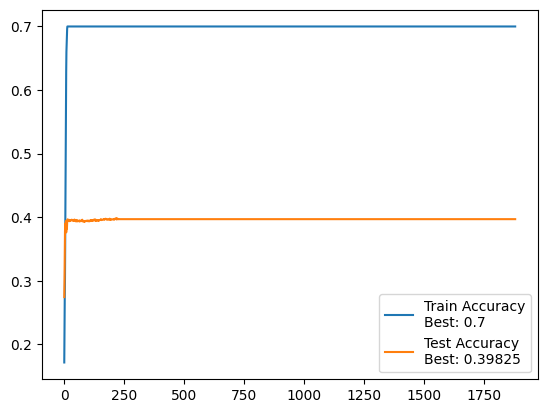

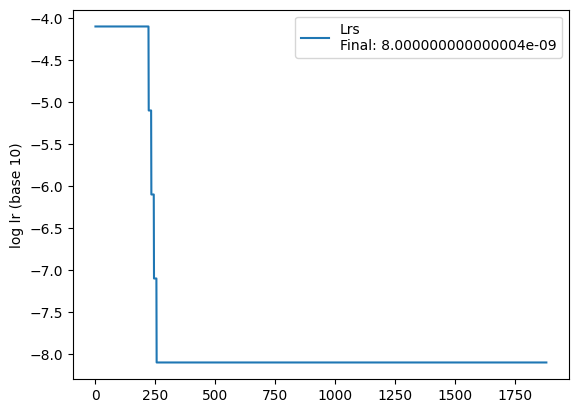

 90%|█████████ | 9/10 [01:06<00:07,  7.36s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.39s/it]

 Test accuracy: 39.7%, Avg loss: 6.780964


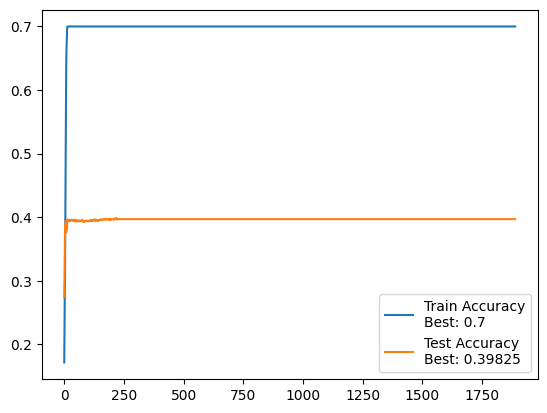

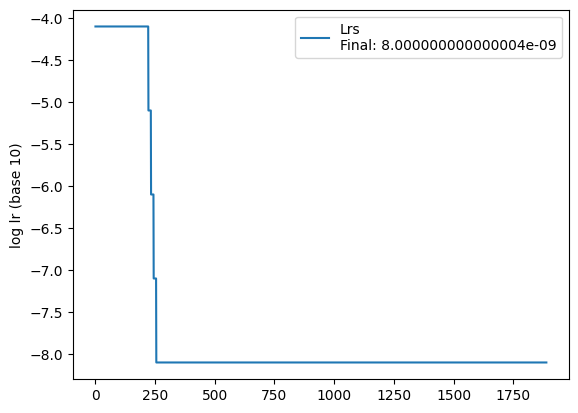

 90%|█████████ | 9/10 [01:06<00:07,  7.35s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.39s/it]

 Test accuracy: 39.7%, Avg loss: 6.781034


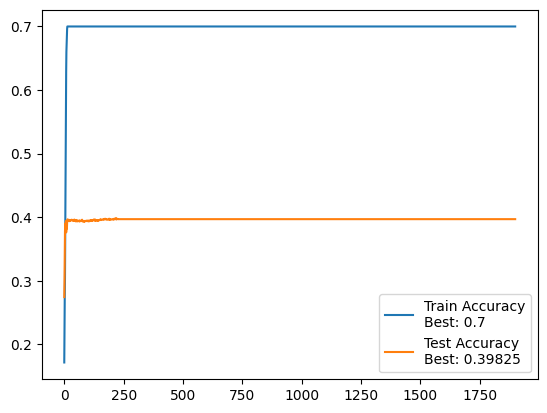

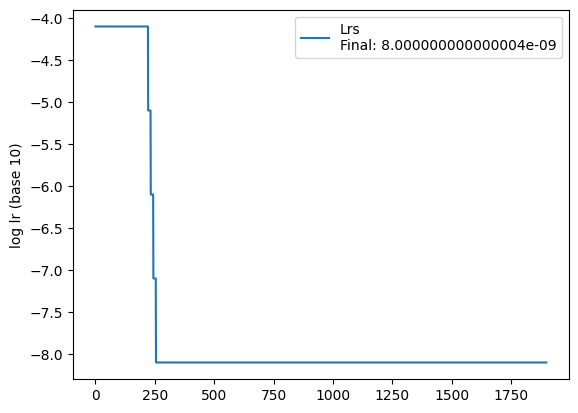

 90%|█████████ | 9/10 [01:06<00:07,  7.36s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.37s/it]

 Test accuracy: 39.7%, Avg loss: 6.781103


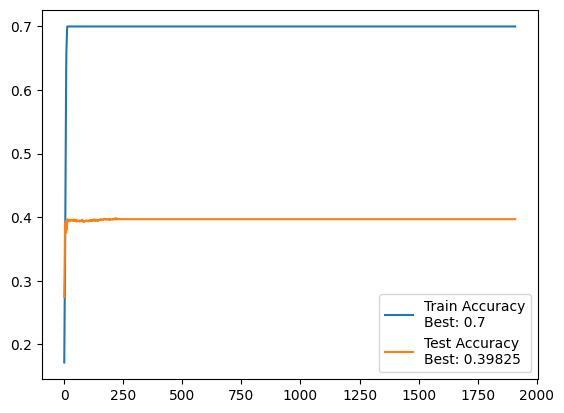

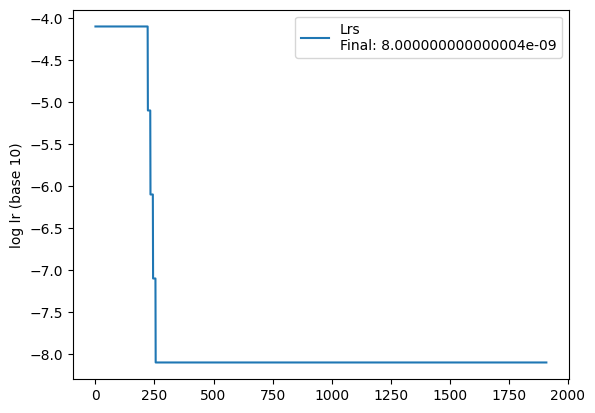

 90%|█████████ | 9/10 [01:06<00:07,  7.35s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.38s/it]

 Test accuracy: 39.7%, Avg loss: 6.781173


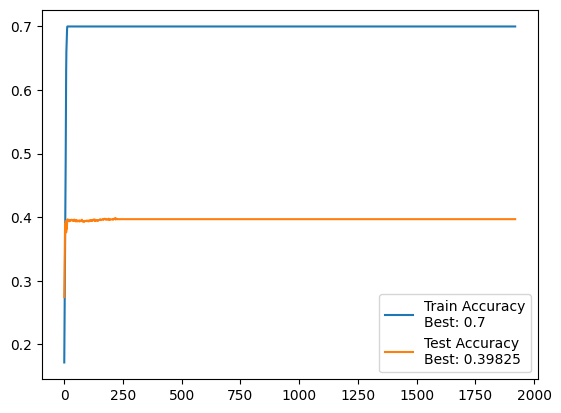

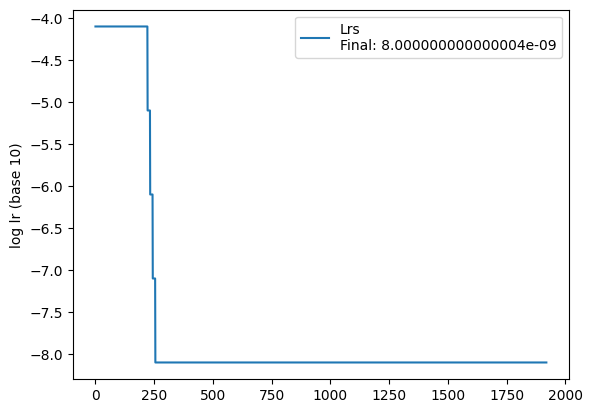

 90%|█████████ | 9/10 [01:06<00:07,  7.35s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.38s/it]

 Test accuracy: 39.7%, Avg loss: 6.781244


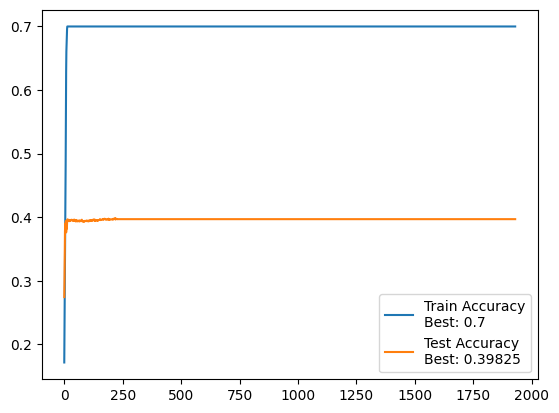

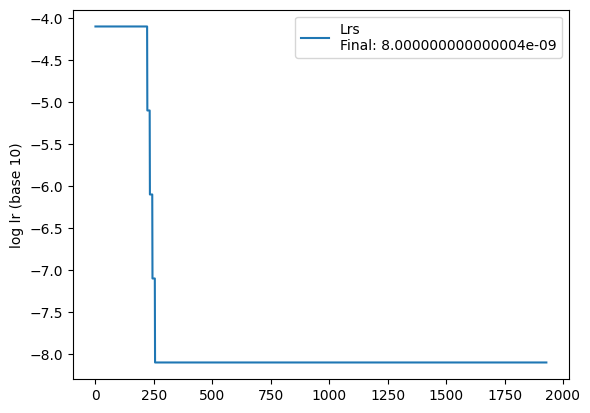

 90%|█████████ | 9/10 [01:06<00:07,  7.37s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.39s/it]

 Test accuracy: 39.7%, Avg loss: 6.781313


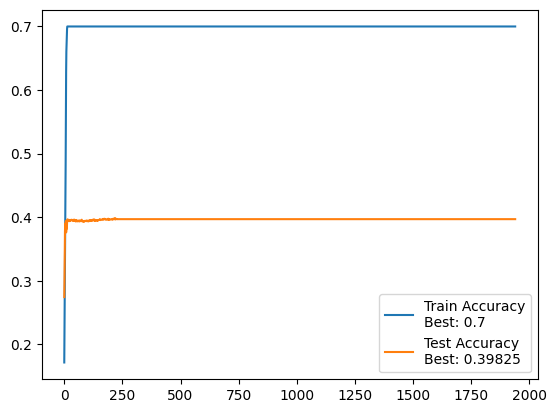

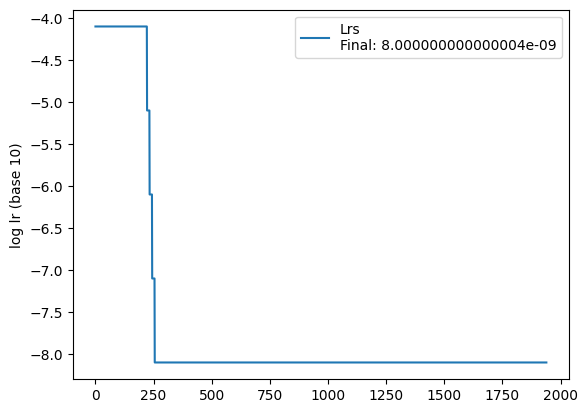

 90%|█████████ | 9/10 [01:06<00:07,  7.38s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.40s/it]

 Test accuracy: 39.7%, Avg loss: 6.781382


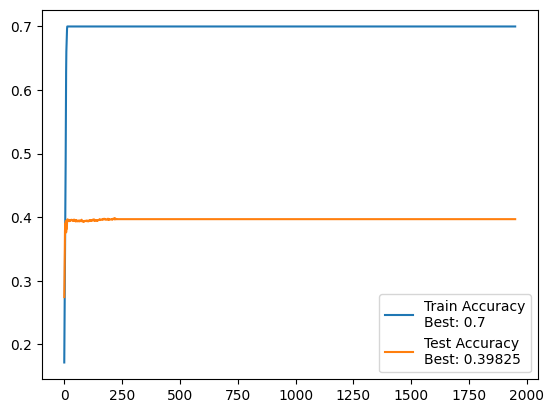

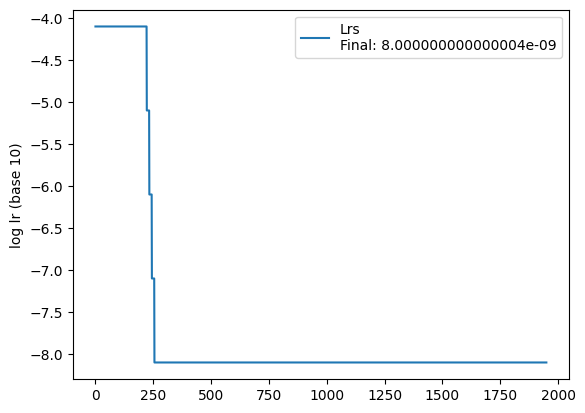

 90%|█████████ | 9/10 [01:06<00:07,  7.38s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:14<00:00,  7.41s/it]

 Test accuracy: 39.7%, Avg loss: 6.781450


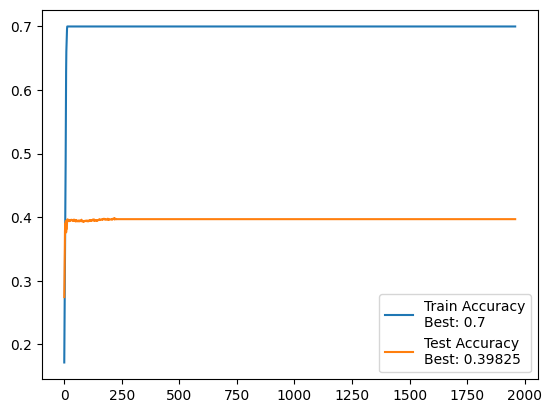

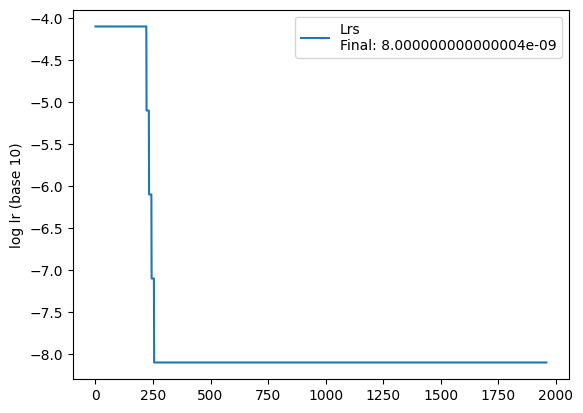

 90%|█████████ | 9/10 [01:06<00:07,  7.37s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:14<00:00,  7.41s/it]

 Test accuracy: 39.7%, Avg loss: 6.781518


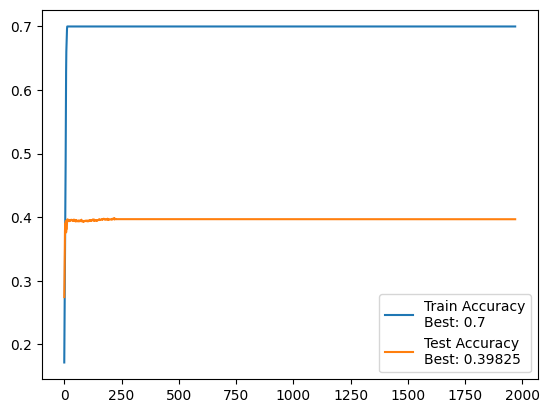

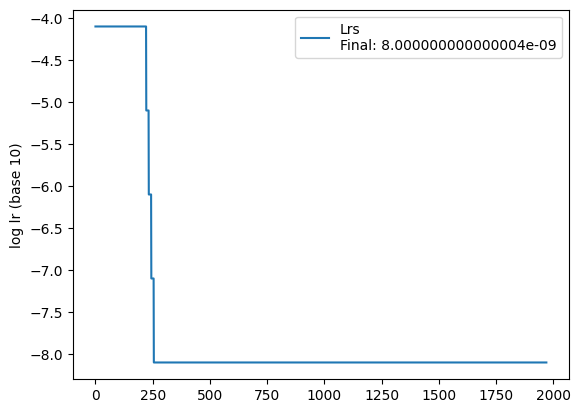

 90%|█████████ | 9/10 [01:06<00:07,  7.37s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.38s/it]

 Test accuracy: 39.7%, Avg loss: 6.781585


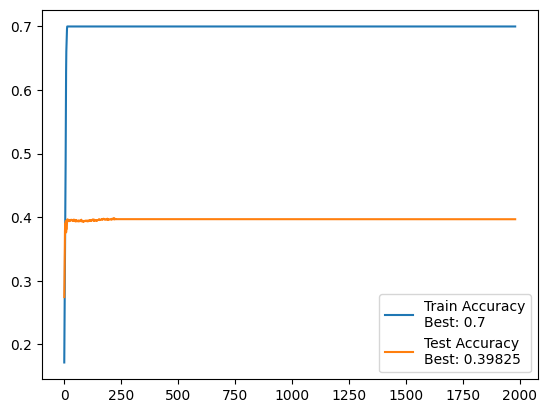

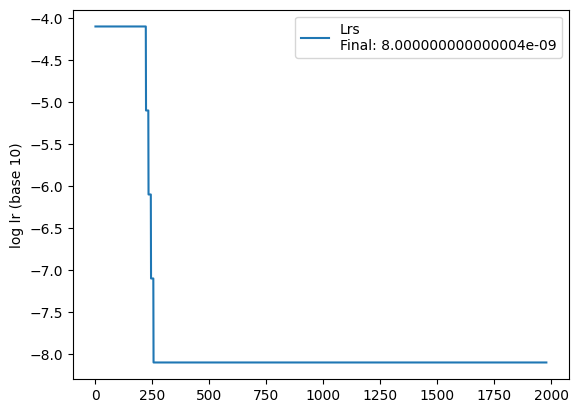

 90%|█████████ | 9/10 [01:05<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.35s/it]

 Test accuracy: 39.7%, Avg loss: 6.781653


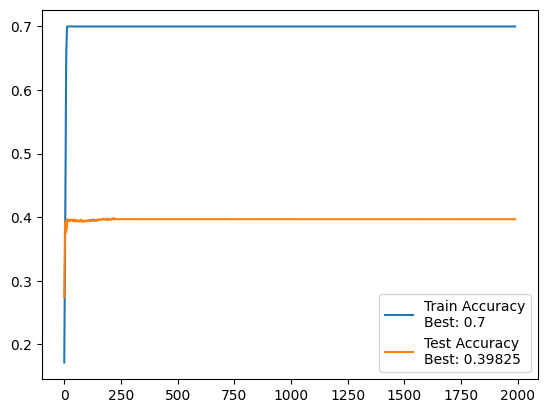

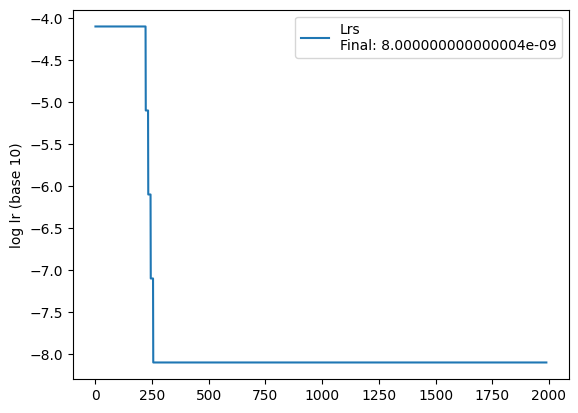

 90%|█████████ | 9/10 [01:06<00:07,  7.34s/it]

 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 10/10 [01:13<00:00,  7.38s/it]

 Test accuracy: 39.7%, Avg loss: 6.781718


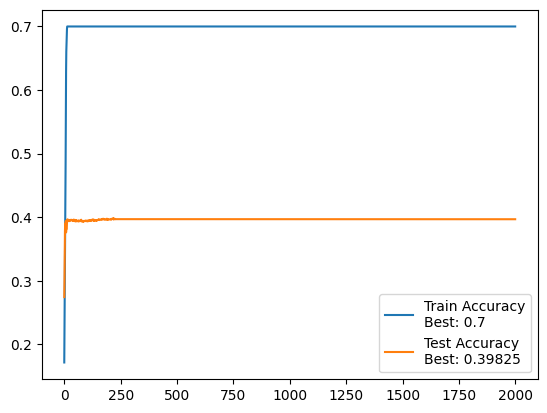

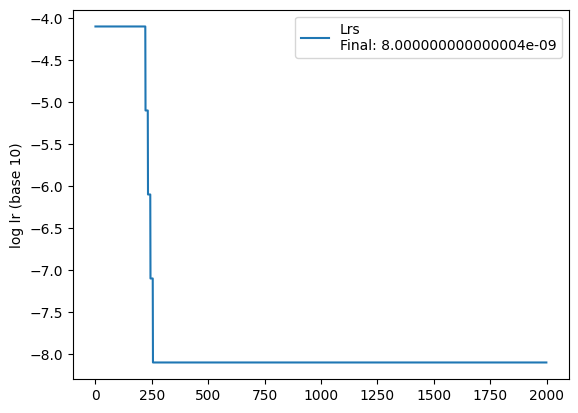

In [73]:
for i in range(NUM_EPOCHS//NUM_EPOCHS_TO_SAVE):
    train_(epochs=NUM_EPOCHS_TO_SAVE, show=SHOW, show2=SHOW2)
    STORE_PATH = save(os.path.join(str(TRAIN_ID), f'{epoch}'))
    plot(STORE_PATH)

In [74]:
### THIS IS: ResNet-34 with more augmentation.
### Nvidia RTX 3060-Ti ~4m 40s/epoch  


 =============== Epoch 2001 ===============


100%|██████████| 110/110 [00:03<00:00, 30.52it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.97it/s]


 Test accuracy: 39.7%, Avg loss: 6.781725

 =============== Epoch 2002 ===============


100%|██████████| 110/110 [00:03<00:00, 30.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.60it/s]


 Test accuracy: 39.7%, Avg loss: 6.781732

 =============== Epoch 2003 ===============


100%|██████████| 110/110 [00:03<00:00, 31.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.781738

 =============== Epoch 2004 ===============


100%|██████████| 110/110 [00:03<00:00, 31.85it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.32it/s]


 Test accuracy: 39.7%, Avg loss: 6.781745

 =============== Epoch 2005 ===============


100%|██████████| 110/110 [00:03<00:00, 31.74it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.31it/s]


 Test accuracy: 39.7%, Avg loss: 6.781752

 =============== Epoch 2006 ===============


100%|██████████| 110/110 [00:03<00:00, 31.58it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.781758

 =============== Epoch 2007 ===============


100%|██████████| 110/110 [00:03<00:00, 32.03it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.91it/s]


 Test accuracy: 39.7%, Avg loss: 6.781765

 =============== Epoch 2008 ===============


100%|██████████| 110/110 [00:03<00:00, 31.66it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.781771

 =============== Epoch 2009 ===============


100%|██████████| 110/110 [00:03<00:00, 31.43it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.781778

 =============== Epoch 2010 ===============


100%|██████████| 110/110 [00:03<00:00, 31.70it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.34it/s]


 Test accuracy: 39.7%, Avg loss: 6.781784


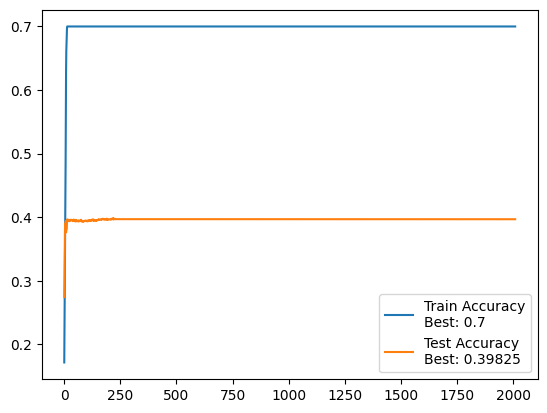

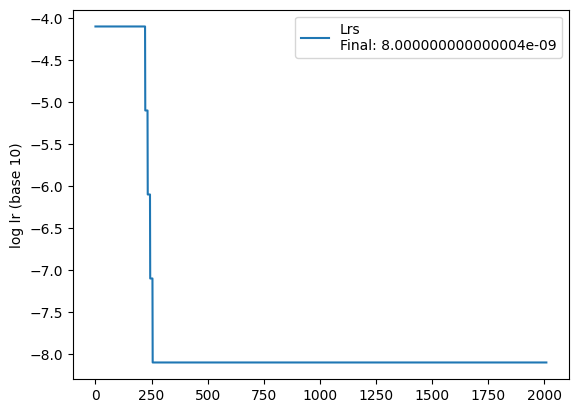


 =============== Epoch 2011 ===============


100%|██████████| 110/110 [00:03<00:00, 31.67it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.781791

 =============== Epoch 2012 ===============


100%|██████████| 110/110 [00:03<00:00, 31.78it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.781798

 =============== Epoch 2013 ===============


100%|██████████| 110/110 [00:03<00:00, 31.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.781804

 =============== Epoch 2014 ===============


100%|██████████| 110/110 [00:03<00:00, 31.78it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.72it/s]


 Test accuracy: 39.7%, Avg loss: 6.781811

 =============== Epoch 2015 ===============


100%|██████████| 110/110 [00:03<00:00, 31.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.781817

 =============== Epoch 2016 ===============


100%|██████████| 110/110 [00:03<00:00, 31.85it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.781824

 =============== Epoch 2017 ===============


100%|██████████| 110/110 [00:03<00:00, 31.71it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.88it/s]


 Test accuracy: 39.7%, Avg loss: 6.781831

 =============== Epoch 2018 ===============


100%|██████████| 110/110 [00:03<00:00, 31.79it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.93it/s]


 Test accuracy: 39.7%, Avg loss: 6.781837

 =============== Epoch 2019 ===============


100%|██████████| 110/110 [00:03<00:00, 32.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.17it/s]


 Test accuracy: 39.7%, Avg loss: 6.781844

 =============== Epoch 2020 ===============


100%|██████████| 110/110 [00:03<00:00, 31.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.781850


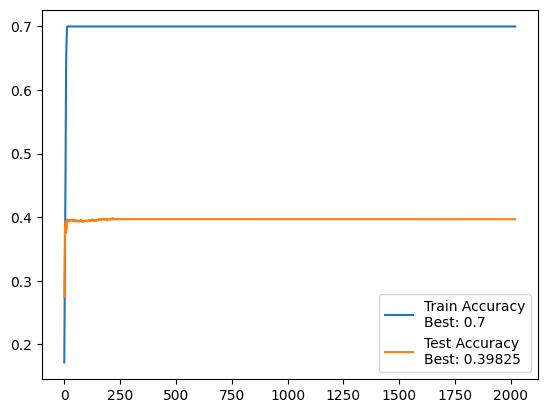

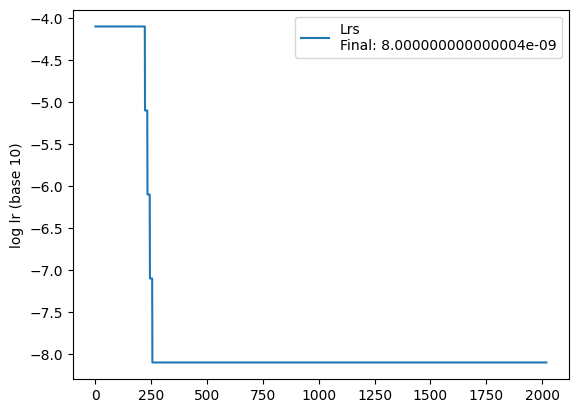


 =============== Epoch 2021 ===============


100%|██████████| 110/110 [00:03<00:00, 31.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.62it/s]


 Test accuracy: 39.7%, Avg loss: 6.781857

 =============== Epoch 2022 ===============


100%|██████████| 110/110 [00:03<00:00, 31.46it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.781864

 =============== Epoch 2023 ===============


100%|██████████| 110/110 [00:03<00:00, 31.73it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.38it/s]


 Test accuracy: 39.7%, Avg loss: 6.781871

 =============== Epoch 2024 ===============


100%|██████████| 110/110 [00:03<00:00, 31.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.43it/s]


 Test accuracy: 39.7%, Avg loss: 6.781877

 =============== Epoch 2025 ===============


100%|██████████| 110/110 [00:03<00:00, 31.44it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.41it/s]


 Test accuracy: 39.7%, Avg loss: 6.781884

 =============== Epoch 2026 ===============


100%|██████████| 110/110 [00:03<00:00, 31.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.75it/s]


 Test accuracy: 39.7%, Avg loss: 6.781890

 =============== Epoch 2027 ===============


100%|██████████| 110/110 [00:03<00:00, 31.74it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.781897

 =============== Epoch 2028 ===============


100%|██████████| 110/110 [00:03<00:00, 31.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.781904

 =============== Epoch 2029 ===============


100%|██████████| 110/110 [00:03<00:00, 31.72it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.19it/s]


 Test accuracy: 39.7%, Avg loss: 6.781911

 =============== Epoch 2030 ===============


100%|██████████| 110/110 [00:03<00:00, 31.64it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.781917


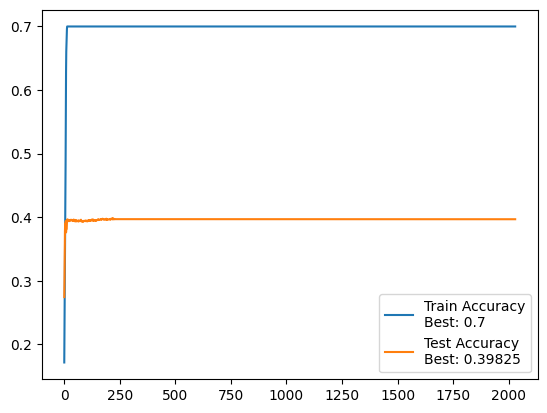

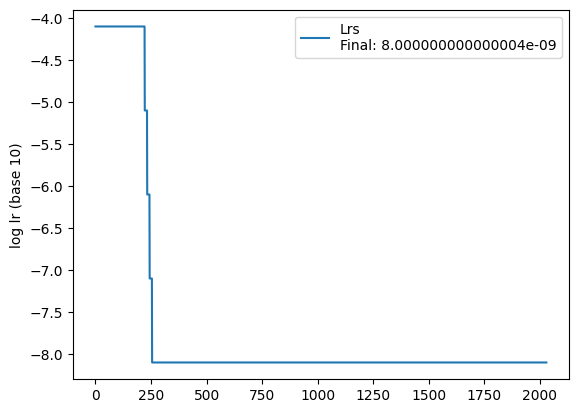


 =============== Epoch 2031 ===============


100%|██████████| 110/110 [00:03<00:00, 31.50it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.60it/s]


 Test accuracy: 39.7%, Avg loss: 6.781924

 =============== Epoch 2032 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.27it/s]


 Test accuracy: 39.7%, Avg loss: 6.781930

 =============== Epoch 2033 ===============


100%|██████████| 110/110 [00:03<00:00, 31.79it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.51it/s]


 Test accuracy: 39.7%, Avg loss: 6.781937

 =============== Epoch 2034 ===============


100%|██████████| 110/110 [00:03<00:00, 31.90it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.14it/s]


 Test accuracy: 39.7%, Avg loss: 6.781943

 =============== Epoch 2035 ===============


100%|██████████| 110/110 [00:03<00:00, 31.46it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.781950

 =============== Epoch 2036 ===============


100%|██████████| 110/110 [00:03<00:00, 31.89it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.62it/s]


 Test accuracy: 39.7%, Avg loss: 6.781957

 =============== Epoch 2037 ===============


100%|██████████| 110/110 [00:03<00:00, 31.67it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.781963

 =============== Epoch 2038 ===============


100%|██████████| 110/110 [00:03<00:00, 31.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.781970

 =============== Epoch 2039 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.781976

 =============== Epoch 2040 ===============


100%|██████████| 110/110 [00:03<00:00, 31.46it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.51it/s]


 Test accuracy: 39.7%, Avg loss: 6.781983


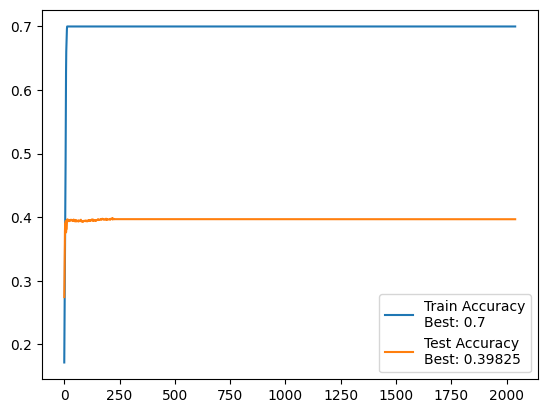

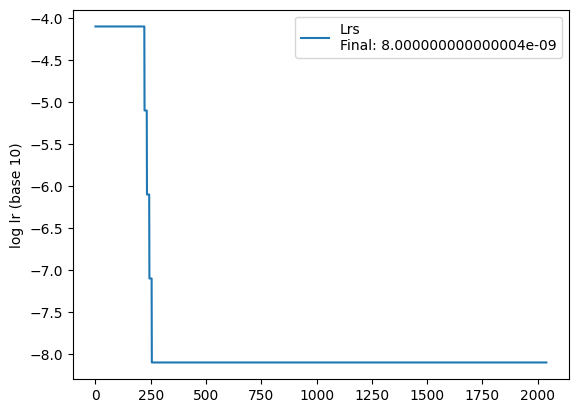


 =============== Epoch 2041 ===============


100%|██████████| 110/110 [00:03<00:00, 31.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.87it/s]


 Test accuracy: 39.7%, Avg loss: 6.781990

 =============== Epoch 2042 ===============


100%|██████████| 110/110 [00:03<00:00, 31.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.781996

 =============== Epoch 2043 ===============


100%|██████████| 110/110 [00:03<00:00, 31.89it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.782002

 =============== Epoch 2044 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.782009

 =============== Epoch 2045 ===============


100%|██████████| 110/110 [00:03<00:00, 31.94it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.782015

 =============== Epoch 2046 ===============


100%|██████████| 110/110 [00:03<00:00, 31.85it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.45it/s]


 Test accuracy: 39.7%, Avg loss: 6.782022

 =============== Epoch 2047 ===============


100%|██████████| 110/110 [00:03<00:00, 31.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.21it/s]


 Test accuracy: 39.7%, Avg loss: 6.782029

 =============== Epoch 2048 ===============


100%|██████████| 110/110 [00:03<00:00, 31.93it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.10it/s]


 Test accuracy: 39.7%, Avg loss: 6.782035

 =============== Epoch 2049 ===============


100%|██████████| 110/110 [00:03<00:00, 31.72it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.14it/s]


 Test accuracy: 39.7%, Avg loss: 6.782042

 =============== Epoch 2050 ===============


100%|██████████| 110/110 [00:03<00:00, 31.64it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.99it/s]


 Test accuracy: 39.7%, Avg loss: 6.782048


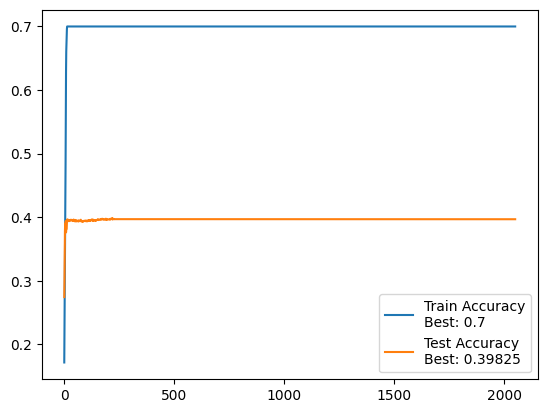

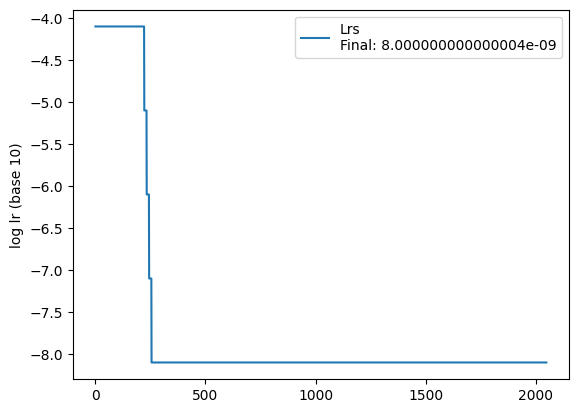


 =============== Epoch 2051 ===============


100%|██████████| 110/110 [00:03<00:00, 31.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.782054

 =============== Epoch 2052 ===============


100%|██████████| 110/110 [00:03<00:00, 32.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.29it/s]


 Test accuracy: 39.7%, Avg loss: 6.782061

 =============== Epoch 2053 ===============


100%|██████████| 110/110 [00:03<00:00, 31.41it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.782067

 =============== Epoch 2054 ===============


100%|██████████| 110/110 [00:03<00:00, 31.70it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.46it/s]


 Test accuracy: 39.7%, Avg loss: 6.782074

 =============== Epoch 2055 ===============


100%|██████████| 110/110 [00:03<00:00, 31.68it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.782080

 =============== Epoch 2056 ===============


100%|██████████| 110/110 [00:03<00:00, 31.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.782086

 =============== Epoch 2057 ===============


100%|██████████| 110/110 [00:03<00:00, 32.07it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.782093

 =============== Epoch 2058 ===============


100%|██████████| 110/110 [00:03<00:00, 31.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.782100

 =============== Epoch 2059 ===============


100%|██████████| 110/110 [00:03<00:00, 31.90it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.89it/s]


 Test accuracy: 39.7%, Avg loss: 6.782106

 =============== Epoch 2060 ===============


100%|██████████| 110/110 [00:03<00:00, 31.81it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.72it/s]


 Test accuracy: 39.7%, Avg loss: 6.782112


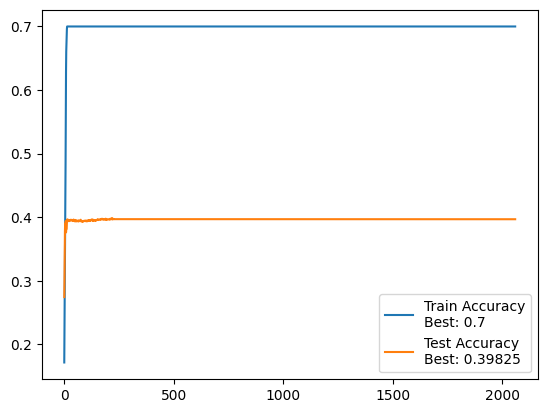

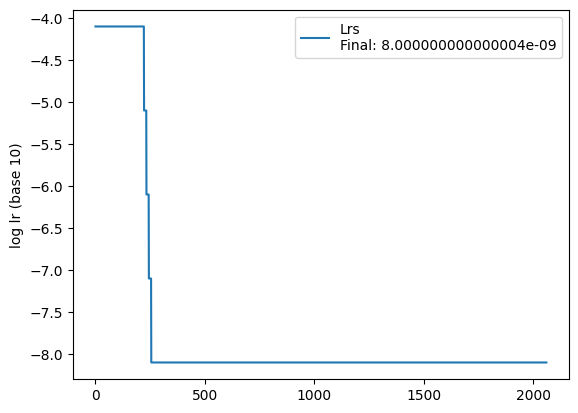


 =============== Epoch 2061 ===============


100%|██████████| 110/110 [00:03<00:00, 31.85it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.97it/s]


 Test accuracy: 39.7%, Avg loss: 6.782119

 =============== Epoch 2062 ===============


100%|██████████| 110/110 [00:03<00:00, 31.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.88it/s]


 Test accuracy: 39.7%, Avg loss: 6.782125

 =============== Epoch 2063 ===============


100%|██████████| 110/110 [00:03<00:00, 31.94it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.782132

 =============== Epoch 2064 ===============


100%|██████████| 110/110 [00:03<00:00, 31.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.72it/s]


 Test accuracy: 39.7%, Avg loss: 6.782138

 =============== Epoch 2065 ===============


100%|██████████| 110/110 [00:03<00:00, 31.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.46it/s]


 Test accuracy: 39.7%, Avg loss: 6.782145

 =============== Epoch 2066 ===============


100%|██████████| 110/110 [00:03<00:00, 31.35it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.782151

 =============== Epoch 2067 ===============


100%|██████████| 110/110 [00:03<00:00, 31.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.782158

 =============== Epoch 2068 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.29it/s]


 Test accuracy: 39.7%, Avg loss: 6.782164

 =============== Epoch 2069 ===============


100%|██████████| 110/110 [00:03<00:00, 32.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.77it/s]


 Test accuracy: 39.7%, Avg loss: 6.782170

 =============== Epoch 2070 ===============


100%|██████████| 110/110 [00:03<00:00, 31.90it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.43it/s]


 Test accuracy: 39.7%, Avg loss: 6.782177


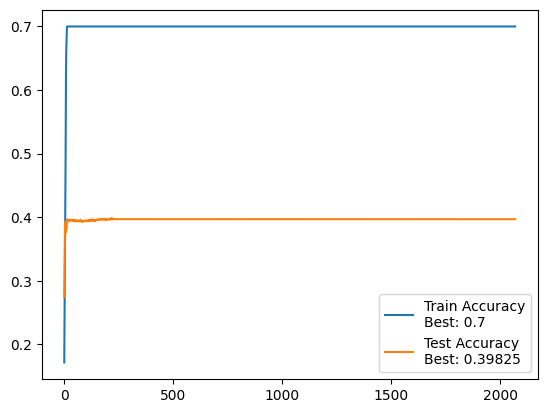

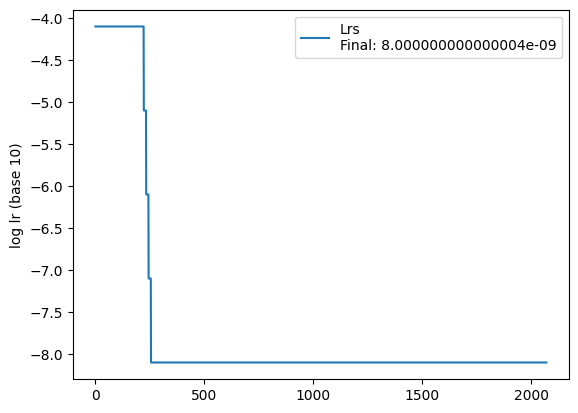


 =============== Epoch 2071 ===============


100%|██████████| 110/110 [00:03<00:00, 31.65it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.14it/s]


 Test accuracy: 39.7%, Avg loss: 6.782183

 =============== Epoch 2072 ===============


100%|██████████| 110/110 [00:03<00:00, 31.91it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.44it/s]


 Test accuracy: 39.7%, Avg loss: 6.782189

 =============== Epoch 2073 ===============


100%|██████████| 110/110 [00:03<00:00, 32.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.46it/s]


 Test accuracy: 39.7%, Avg loss: 6.782196

 =============== Epoch 2074 ===============


100%|██████████| 110/110 [00:03<00:00, 31.95it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.40it/s]


 Test accuracy: 39.7%, Avg loss: 6.782202

 =============== Epoch 2075 ===============


100%|██████████| 110/110 [00:03<00:00, 32.02it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.03it/s]


 Test accuracy: 39.7%, Avg loss: 6.782209

 =============== Epoch 2076 ===============


100%|██████████| 110/110 [00:03<00:00, 31.91it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.79it/s]


 Test accuracy: 39.7%, Avg loss: 6.782215

 =============== Epoch 2077 ===============


100%|██████████| 110/110 [00:03<00:00, 31.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.782221

 =============== Epoch 2078 ===============


100%|██████████| 110/110 [00:03<00:00, 32.04it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.782228

 =============== Epoch 2079 ===============


100%|██████████| 110/110 [00:03<00:00, 31.73it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.91it/s]


 Test accuracy: 39.7%, Avg loss: 6.782235

 =============== Epoch 2080 ===============


100%|██████████| 110/110 [00:03<00:00, 32.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.84it/s]


 Test accuracy: 39.7%, Avg loss: 6.782241


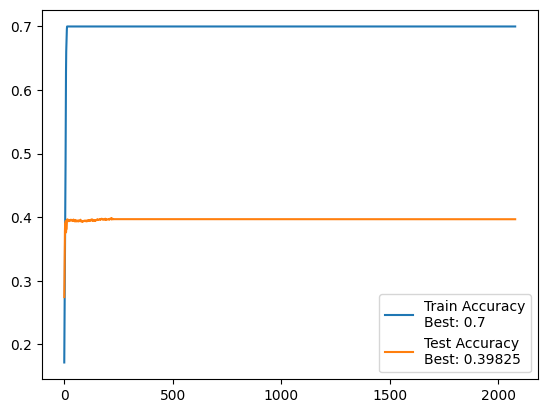

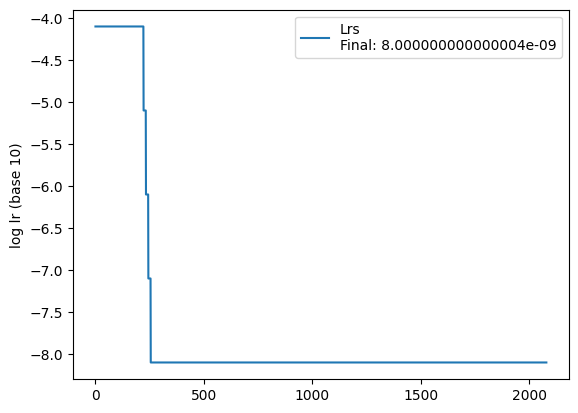


 =============== Epoch 2081 ===============


100%|██████████| 110/110 [00:03<00:00, 31.93it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.782247

 =============== Epoch 2082 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.782253

 =============== Epoch 2083 ===============


100%|██████████| 110/110 [00:03<00:00, 31.70it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.782260

 =============== Epoch 2084 ===============


100%|██████████| 110/110 [00:03<00:00, 31.85it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.782266

 =============== Epoch 2085 ===============


100%|██████████| 110/110 [00:03<00:00, 32.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.77it/s]


 Test accuracy: 39.7%, Avg loss: 6.782273

 =============== Epoch 2086 ===============


100%|██████████| 110/110 [00:03<00:00, 31.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.782279

 =============== Epoch 2087 ===============


100%|██████████| 110/110 [00:03<00:00, 31.90it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.32it/s]


 Test accuracy: 39.7%, Avg loss: 6.782286

 =============== Epoch 2088 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.782293

 =============== Epoch 2089 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.782299

 =============== Epoch 2090 ===============


100%|██████████| 110/110 [00:03<00:00, 31.53it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.782306


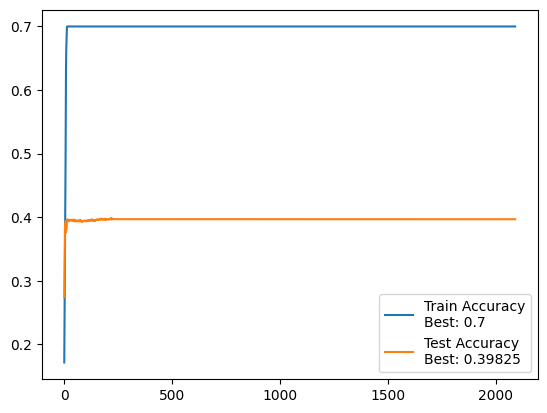

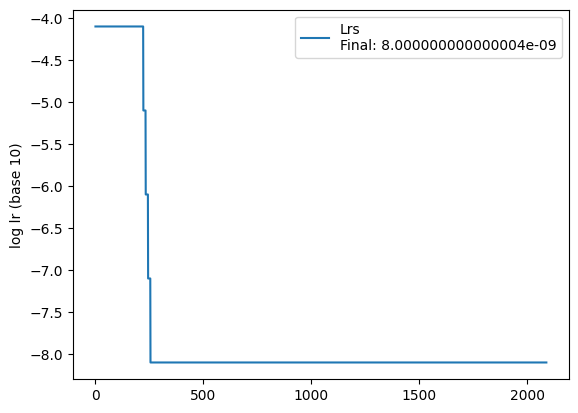


 =============== Epoch 2091 ===============


100%|██████████| 110/110 [00:03<00:00, 31.45it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.76it/s]


 Test accuracy: 39.7%, Avg loss: 6.782312

 =============== Epoch 2092 ===============


100%|██████████| 110/110 [00:03<00:00, 31.49it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.34it/s]


 Test accuracy: 39.7%, Avg loss: 6.782319

 =============== Epoch 2093 ===============


100%|██████████| 110/110 [00:03<00:00, 31.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.77it/s]


 Test accuracy: 39.7%, Avg loss: 6.782325

 =============== Epoch 2094 ===============


100%|██████████| 110/110 [00:03<00:00, 31.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.71it/s]


 Test accuracy: 39.7%, Avg loss: 6.782331

 =============== Epoch 2095 ===============


100%|██████████| 110/110 [00:03<00:00, 31.89it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.782337

 =============== Epoch 2096 ===============


100%|██████████| 110/110 [00:03<00:00, 31.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.782344

 =============== Epoch 2097 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.782350

 =============== Epoch 2098 ===============


100%|██████████| 110/110 [00:03<00:00, 31.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.77it/s]


 Test accuracy: 39.7%, Avg loss: 6.782357

 =============== Epoch 2099 ===============


100%|██████████| 110/110 [00:03<00:00, 31.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.14it/s]


 Test accuracy: 39.7%, Avg loss: 6.782363

 =============== Epoch 2100 ===============


100%|██████████| 110/110 [00:03<00:00, 31.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.88it/s]


 Test accuracy: 39.7%, Avg loss: 6.782369


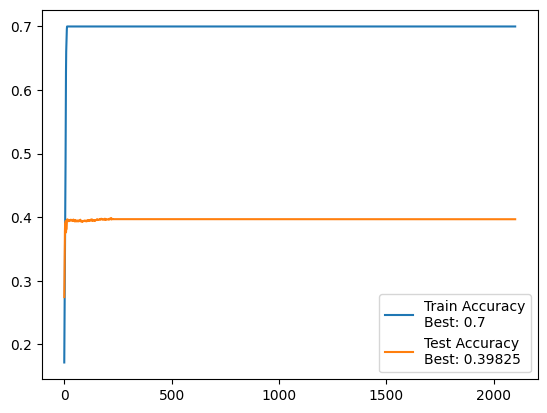

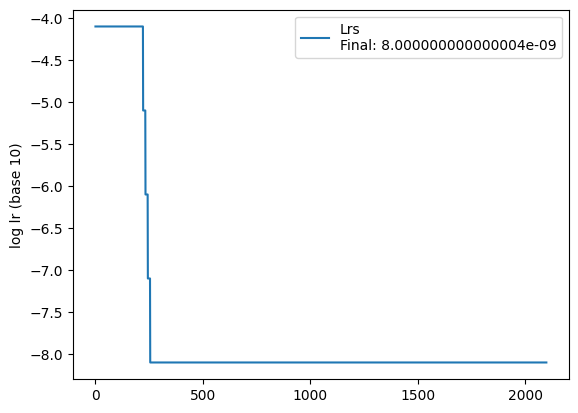


 =============== Epoch 2101 ===============


100%|██████████| 110/110 [00:03<00:00, 31.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.782376

 =============== Epoch 2102 ===============


100%|██████████| 110/110 [00:03<00:00, 31.79it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.84it/s]


 Test accuracy: 39.7%, Avg loss: 6.782382

 =============== Epoch 2103 ===============


100%|██████████| 110/110 [00:03<00:00, 31.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.41it/s]


 Test accuracy: 39.7%, Avg loss: 6.782389

 =============== Epoch 2104 ===============


100%|██████████| 110/110 [00:03<00:00, 31.74it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.782395

 =============== Epoch 2105 ===============


100%|██████████| 110/110 [00:03<00:00, 31.34it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.40it/s]


 Test accuracy: 39.7%, Avg loss: 6.782401

 =============== Epoch 2106 ===============


100%|██████████| 110/110 [00:03<00:00, 31.94it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.75it/s]


 Test accuracy: 39.7%, Avg loss: 6.782408

 =============== Epoch 2107 ===============


100%|██████████| 110/110 [00:03<00:00, 32.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.21it/s]


 Test accuracy: 39.7%, Avg loss: 6.782414

 =============== Epoch 2108 ===============


100%|██████████| 110/110 [00:03<00:00, 31.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.782421

 =============== Epoch 2109 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.782427

 =============== Epoch 2110 ===============


100%|██████████| 110/110 [00:03<00:00, 31.79it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.84it/s]


 Test accuracy: 39.7%, Avg loss: 6.782433


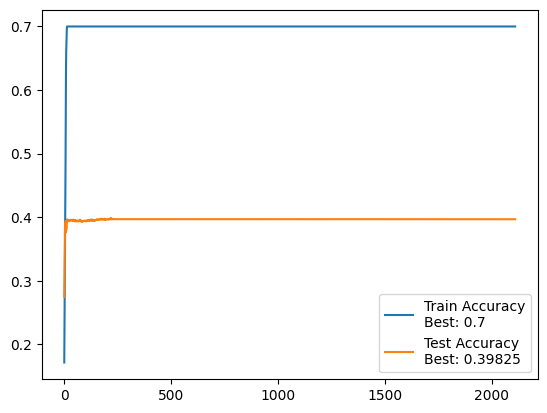

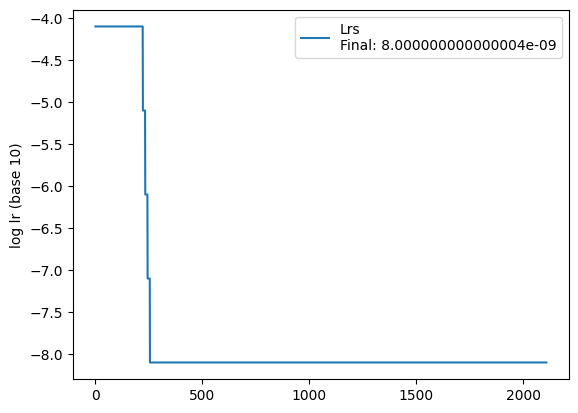


 =============== Epoch 2111 ===============


100%|██████████| 110/110 [00:03<00:00, 31.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.782440

 =============== Epoch 2112 ===============


100%|██████████| 110/110 [00:03<00:00, 31.62it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.782446

 =============== Epoch 2113 ===============


100%|██████████| 110/110 [00:03<00:00, 31.95it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.782452

 =============== Epoch 2114 ===============


100%|██████████| 110/110 [00:03<00:00, 31.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.782459

 =============== Epoch 2115 ===============


100%|██████████| 110/110 [00:03<00:00, 31.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.89it/s]


 Test accuracy: 39.7%, Avg loss: 6.782465

 =============== Epoch 2116 ===============


100%|██████████| 110/110 [00:03<00:00, 31.73it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.75it/s]


 Test accuracy: 39.7%, Avg loss: 6.782471

 =============== Epoch 2117 ===============


100%|██████████| 110/110 [00:03<00:00, 31.62it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.09it/s]


 Test accuracy: 39.7%, Avg loss: 6.782477

 =============== Epoch 2118 ===============


100%|██████████| 110/110 [00:03<00:00, 31.89it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.22it/s]


 Test accuracy: 39.7%, Avg loss: 6.782484

 =============== Epoch 2119 ===============


100%|██████████| 110/110 [00:03<00:00, 32.09it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.93it/s]


 Test accuracy: 39.7%, Avg loss: 6.782490

 =============== Epoch 2120 ===============


100%|██████████| 110/110 [00:03<00:00, 31.77it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.782497


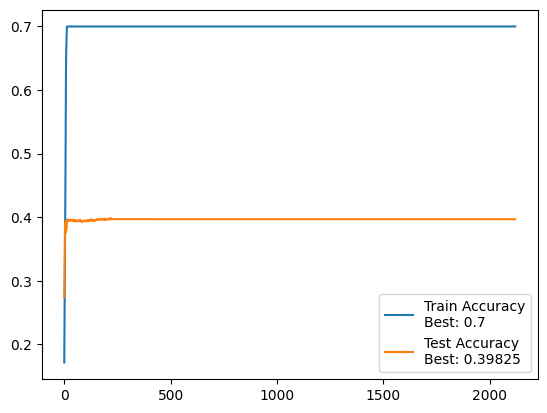

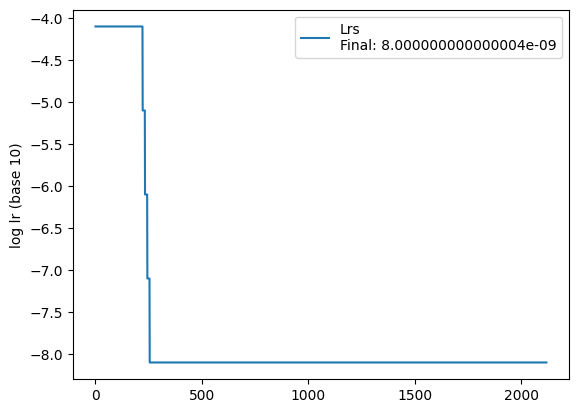


 =============== Epoch 2121 ===============


100%|██████████| 110/110 [00:03<00:00, 31.71it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.14it/s]


 Test accuracy: 39.7%, Avg loss: 6.782503

 =============== Epoch 2122 ===============


100%|██████████| 110/110 [00:03<00:00, 31.77it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.57it/s]


 Test accuracy: 39.7%, Avg loss: 6.782509

 =============== Epoch 2123 ===============


100%|██████████| 110/110 [00:03<00:00, 31.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.34it/s]


 Test accuracy: 39.7%, Avg loss: 6.782516

 =============== Epoch 2124 ===============


100%|██████████| 110/110 [00:03<00:00, 31.74it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.782522

 =============== Epoch 2125 ===============


100%|██████████| 110/110 [00:03<00:00, 31.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.88it/s]


 Test accuracy: 39.7%, Avg loss: 6.782528

 =============== Epoch 2126 ===============


100%|██████████| 110/110 [00:03<00:00, 31.33it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.782534

 =============== Epoch 2127 ===============


100%|██████████| 110/110 [00:03<00:00, 31.79it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.81it/s]


 Test accuracy: 39.7%, Avg loss: 6.782541

 =============== Epoch 2128 ===============


100%|██████████| 110/110 [00:03<00:00, 31.71it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.09it/s]


 Test accuracy: 39.7%, Avg loss: 6.782547

 =============== Epoch 2129 ===============


100%|██████████| 110/110 [00:03<00:00, 31.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.62it/s]


 Test accuracy: 39.7%, Avg loss: 6.782553

 =============== Epoch 2130 ===============


100%|██████████| 110/110 [00:03<00:00, 31.48it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.43it/s]


 Test accuracy: 39.7%, Avg loss: 6.782559


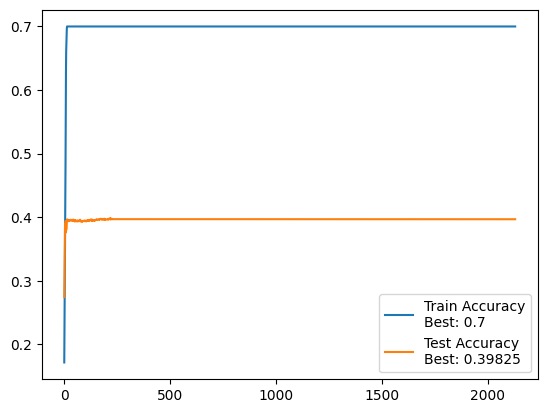

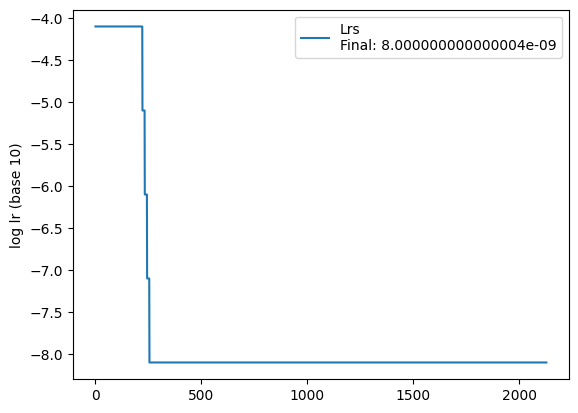


 =============== Epoch 2131 ===============


100%|██████████| 110/110 [00:03<00:00, 31.90it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.84it/s]


 Test accuracy: 39.7%, Avg loss: 6.782566

 =============== Epoch 2132 ===============


100%|██████████| 110/110 [00:03<00:00, 31.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.782572

 =============== Epoch 2133 ===============


100%|██████████| 110/110 [00:03<00:00, 32.07it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.62it/s]


 Test accuracy: 39.7%, Avg loss: 6.782579

 =============== Epoch 2134 ===============


100%|██████████| 110/110 [00:03<00:00, 31.40it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.83it/s]


 Test accuracy: 39.7%, Avg loss: 6.782585

 =============== Epoch 2135 ===============


100%|██████████| 110/110 [00:03<00:00, 31.98it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.77it/s]


 Test accuracy: 39.7%, Avg loss: 6.782591

 =============== Epoch 2136 ===============


100%|██████████| 110/110 [00:03<00:00, 31.56it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.77it/s]


 Test accuracy: 39.7%, Avg loss: 6.782597

 =============== Epoch 2137 ===============


100%|██████████| 110/110 [00:03<00:00, 31.84it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.93it/s]


 Test accuracy: 39.7%, Avg loss: 6.782604

 =============== Epoch 2138 ===============


100%|██████████| 110/110 [00:03<00:00, 32.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.16it/s]


 Test accuracy: 39.7%, Avg loss: 6.782610

 =============== Epoch 2139 ===============


100%|██████████| 110/110 [00:03<00:00, 31.94it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.782616

 =============== Epoch 2140 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.782622


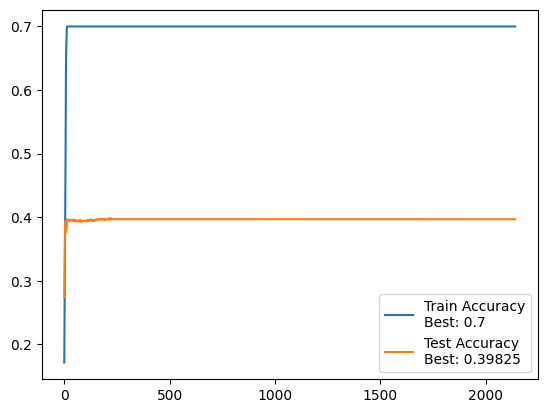

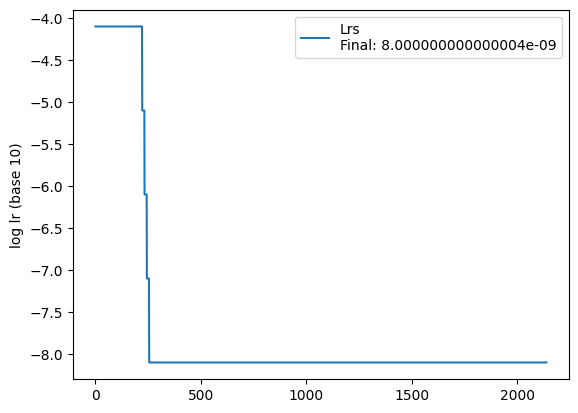


 =============== Epoch 2141 ===============


100%|██████████| 110/110 [00:03<00:00, 31.59it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.782629

 =============== Epoch 2142 ===============


100%|██████████| 110/110 [00:03<00:00, 31.94it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.99it/s]


 Test accuracy: 39.7%, Avg loss: 6.782635

 =============== Epoch 2143 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.782641

 =============== Epoch 2144 ===============


100%|██████████| 110/110 [00:03<00:00, 31.85it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.782647

 =============== Epoch 2145 ===============


100%|██████████| 110/110 [00:03<00:00, 31.81it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.89it/s]


 Test accuracy: 39.7%, Avg loss: 6.782654

 =============== Epoch 2146 ===============


100%|██████████| 110/110 [00:03<00:00, 31.89it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.782660

 =============== Epoch 2147 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.46it/s]


 Test accuracy: 39.7%, Avg loss: 6.782666

 =============== Epoch 2148 ===============


100%|██████████| 110/110 [00:03<00:00, 32.02it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.782673

 =============== Epoch 2149 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.81it/s]


 Test accuracy: 39.7%, Avg loss: 6.782679

 =============== Epoch 2150 ===============


100%|██████████| 110/110 [00:03<00:00, 31.81it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.782685


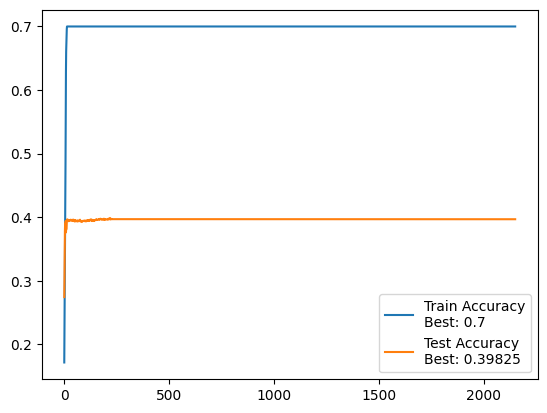

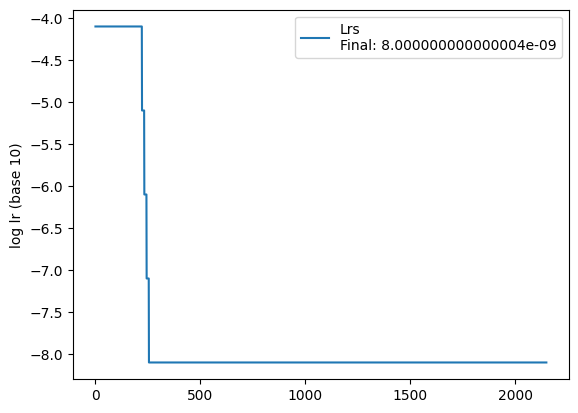


 =============== Epoch 2151 ===============


100%|██████████| 110/110 [00:03<00:00, 31.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.782691

 =============== Epoch 2152 ===============


100%|██████████| 110/110 [00:03<00:00, 32.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.85it/s]


 Test accuracy: 39.7%, Avg loss: 6.782697

 =============== Epoch 2153 ===============


100%|██████████| 110/110 [00:03<00:00, 31.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.33it/s]


 Test accuracy: 39.7%, Avg loss: 6.782704

 =============== Epoch 2154 ===============


100%|██████████| 110/110 [00:03<00:00, 31.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.71it/s]


 Test accuracy: 39.7%, Avg loss: 6.782710

 =============== Epoch 2155 ===============


100%|██████████| 110/110 [00:03<00:00, 31.90it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.72it/s]


 Test accuracy: 39.7%, Avg loss: 6.782716

 =============== Epoch 2156 ===============


100%|██████████| 110/110 [00:03<00:00, 31.84it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.29it/s]


 Test accuracy: 39.7%, Avg loss: 6.782722

 =============== Epoch 2157 ===============


100%|██████████| 110/110 [00:03<00:00, 31.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.78it/s]


 Test accuracy: 39.7%, Avg loss: 6.782728

 =============== Epoch 2158 ===============


100%|██████████| 110/110 [00:03<00:00, 31.77it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.782734

 =============== Epoch 2159 ===============


100%|██████████| 110/110 [00:03<00:00, 31.59it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.24it/s]


 Test accuracy: 39.7%, Avg loss: 6.782740

 =============== Epoch 2160 ===============


100%|██████████| 110/110 [00:03<00:00, 31.75it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.78it/s]


 Test accuracy: 39.7%, Avg loss: 6.782746


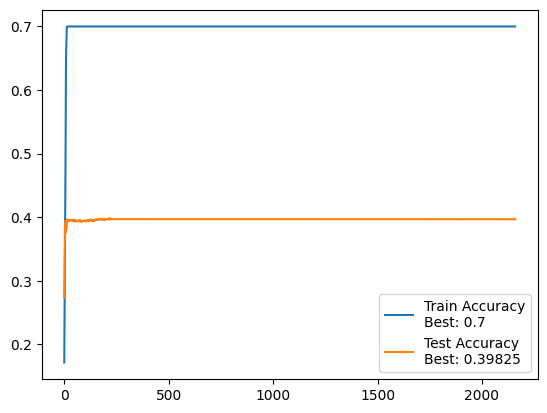

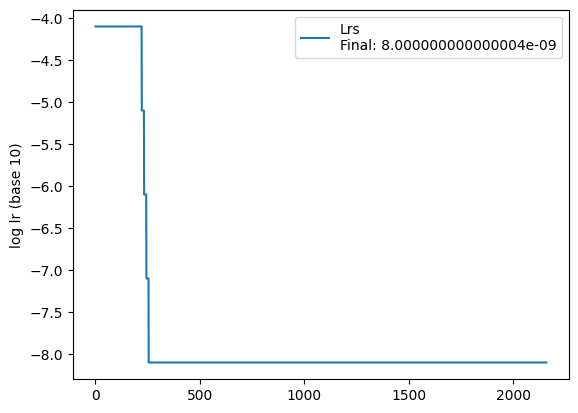


 =============== Epoch 2161 ===============


100%|██████████| 110/110 [00:03<00:00, 31.73it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.22it/s]


 Test accuracy: 39.7%, Avg loss: 6.782753

 =============== Epoch 2162 ===============


100%|██████████| 110/110 [00:03<00:00, 30.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.40it/s]


 Test accuracy: 39.7%, Avg loss: 6.782759

 =============== Epoch 2163 ===============


100%|██████████| 110/110 [00:03<00:00, 31.69it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.782765

 =============== Epoch 2164 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.75it/s]


 Test accuracy: 39.7%, Avg loss: 6.782771

 =============== Epoch 2165 ===============


100%|██████████| 110/110 [00:03<00:00, 31.85it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.24it/s]


 Test accuracy: 39.7%, Avg loss: 6.782778

 =============== Epoch 2166 ===============


100%|██████████| 110/110 [00:03<00:00, 31.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.33it/s]


 Test accuracy: 39.7%, Avg loss: 6.782784

 =============== Epoch 2167 ===============


100%|██████████| 110/110 [00:03<00:00, 31.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.09it/s]


 Test accuracy: 39.7%, Avg loss: 6.782790

 =============== Epoch 2168 ===============


100%|██████████| 110/110 [00:03<00:00, 31.85it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.46it/s]


 Test accuracy: 39.7%, Avg loss: 6.782795

 =============== Epoch 2169 ===============


100%|██████████| 110/110 [00:03<00:00, 31.56it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.782802

 =============== Epoch 2170 ===============


100%|██████████| 110/110 [00:03<00:00, 31.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.37it/s]


 Test accuracy: 39.7%, Avg loss: 6.782808


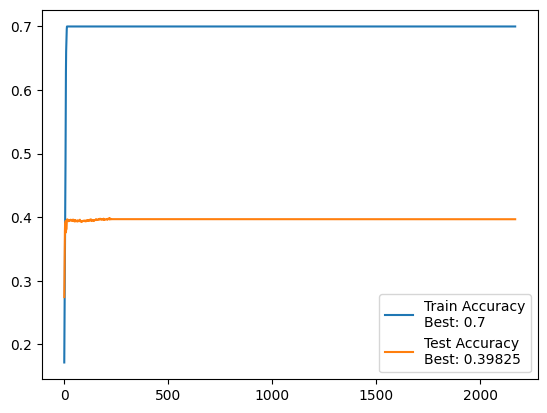

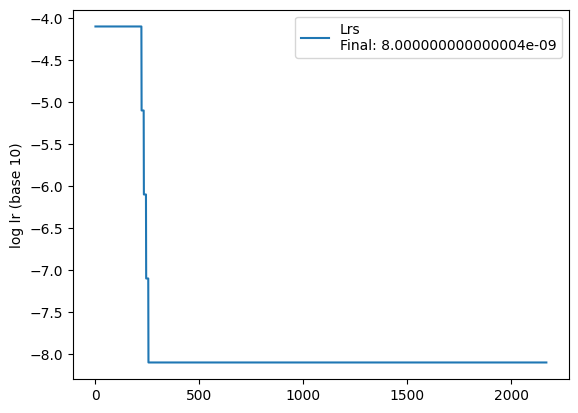


 =============== Epoch 2171 ===============


100%|██████████| 110/110 [00:03<00:00, 32.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.81it/s]


 Test accuracy: 39.7%, Avg loss: 6.782814

 =============== Epoch 2172 ===============


100%|██████████| 110/110 [00:03<00:00, 31.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.40it/s]


 Test accuracy: 39.7%, Avg loss: 6.782820

 =============== Epoch 2173 ===============


100%|██████████| 110/110 [00:03<00:00, 31.63it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.782826

 =============== Epoch 2174 ===============


100%|██████████| 110/110 [00:03<00:00, 31.75it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.25it/s]


 Test accuracy: 39.7%, Avg loss: 6.782832

 =============== Epoch 2175 ===============


100%|██████████| 110/110 [00:03<00:00, 31.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.17it/s]


 Test accuracy: 39.7%, Avg loss: 6.782838

 =============== Epoch 2176 ===============


100%|██████████| 110/110 [00:03<00:00, 31.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.782844

 =============== Epoch 2177 ===============


100%|██████████| 110/110 [00:03<00:00, 31.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.96it/s]


 Test accuracy: 39.7%, Avg loss: 6.782851

 =============== Epoch 2178 ===============


100%|██████████| 110/110 [00:03<00:00, 31.04it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.97it/s]


 Test accuracy: 39.7%, Avg loss: 6.782857

 =============== Epoch 2179 ===============


100%|██████████| 110/110 [00:03<00:00, 31.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.95it/s]


 Test accuracy: 39.7%, Avg loss: 6.782863

 =============== Epoch 2180 ===============


100%|██████████| 110/110 [00:03<00:00, 32.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.782869


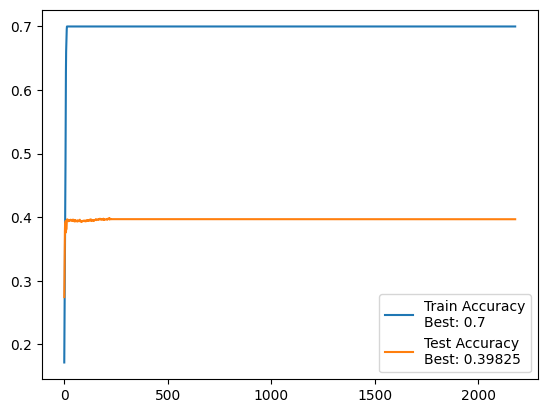

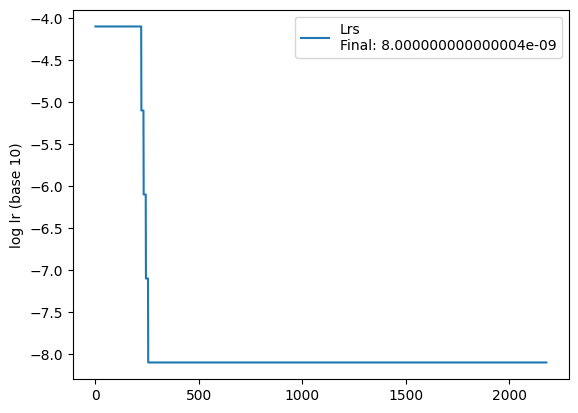


 =============== Epoch 2181 ===============


100%|██████████| 110/110 [00:03<00:00, 31.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.57it/s]


 Test accuracy: 39.7%, Avg loss: 6.782876

 =============== Epoch 2182 ===============


100%|██████████| 110/110 [00:03<00:00, 31.89it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.75it/s]


 Test accuracy: 39.7%, Avg loss: 6.782881

 =============== Epoch 2183 ===============


100%|██████████| 110/110 [00:03<00:00, 31.85it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.782888

 =============== Epoch 2184 ===============


100%|██████████| 110/110 [00:03<00:00, 31.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.47it/s]


 Test accuracy: 39.7%, Avg loss: 6.782894

 =============== Epoch 2185 ===============


100%|██████████| 110/110 [00:03<00:00, 32.04it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.97it/s]


 Test accuracy: 39.7%, Avg loss: 6.782900

 =============== Epoch 2186 ===============


100%|██████████| 110/110 [00:03<00:00, 32.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.91it/s]


 Test accuracy: 39.7%, Avg loss: 6.782906

 =============== Epoch 2187 ===============


100%|██████████| 110/110 [00:03<00:00, 31.74it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.782912

 =============== Epoch 2188 ===============


100%|██████████| 110/110 [00:03<00:00, 31.91it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.43it/s]


 Test accuracy: 39.7%, Avg loss: 6.782918

 =============== Epoch 2189 ===============


100%|██████████| 110/110 [00:03<00:00, 31.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.782924

 =============== Epoch 2190 ===============


100%|██████████| 110/110 [00:03<00:00, 31.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.47it/s]


 Test accuracy: 39.7%, Avg loss: 6.782930


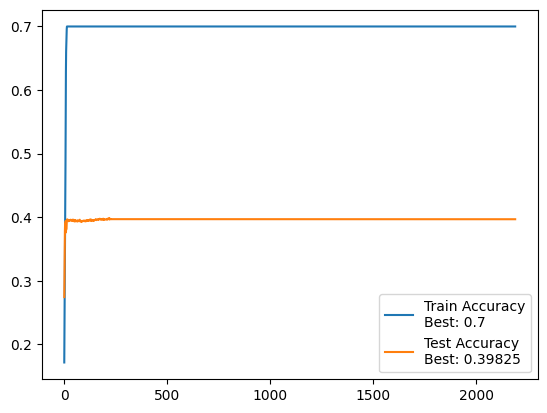

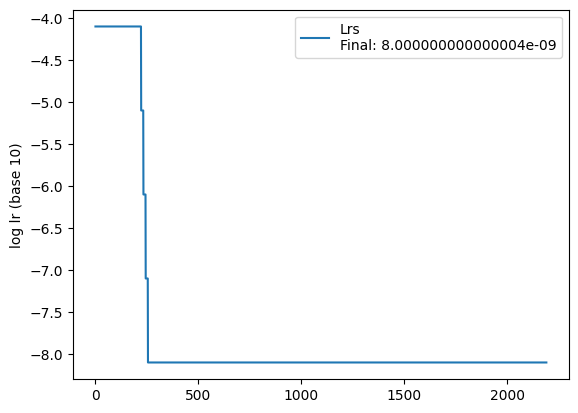


 =============== Epoch 2191 ===============


100%|██████████| 110/110 [00:03<00:00, 31.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.782936

 =============== Epoch 2192 ===============


100%|██████████| 110/110 [00:03<00:00, 31.64it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.782942

 =============== Epoch 2193 ===============


100%|██████████| 110/110 [00:03<00:00, 31.77it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.27it/s]


 Test accuracy: 39.7%, Avg loss: 6.782948

 =============== Epoch 2194 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.09it/s]


 Test accuracy: 39.7%, Avg loss: 6.782954

 =============== Epoch 2195 ===============


100%|██████████| 110/110 [00:03<00:00, 31.79it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.782960

 =============== Epoch 2196 ===============


100%|██████████| 110/110 [00:03<00:00, 31.94it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.17it/s]


 Test accuracy: 39.7%, Avg loss: 6.782966

 =============== Epoch 2197 ===============


100%|██████████| 110/110 [00:03<00:00, 31.75it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.782972

 =============== Epoch 2198 ===============


100%|██████████| 110/110 [00:03<00:00, 32.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.782978

 =============== Epoch 2199 ===============


100%|██████████| 110/110 [00:03<00:00, 31.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.98it/s]


 Test accuracy: 39.7%, Avg loss: 6.782985

 =============== Epoch 2200 ===============


100%|██████████| 110/110 [00:03<00:00, 31.79it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.782991


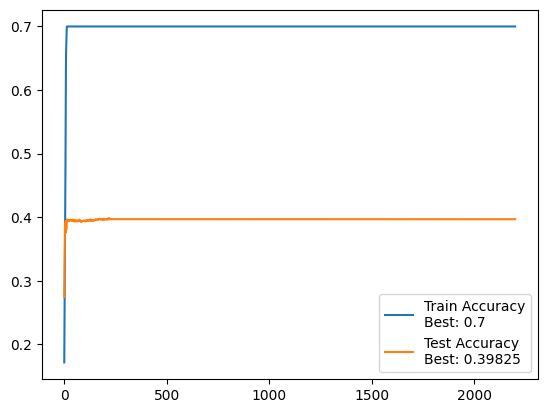

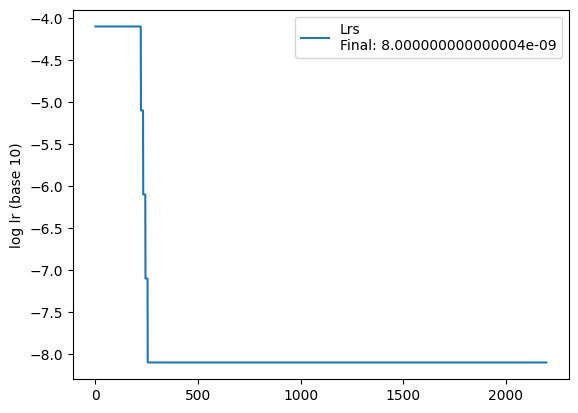


 =============== Epoch 2201 ===============


100%|██████████| 110/110 [00:03<00:00, 31.74it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.782997

 =============== Epoch 2202 ===============


100%|██████████| 110/110 [00:03<00:00, 31.75it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.783004

 =============== Epoch 2203 ===============


100%|██████████| 110/110 [00:03<00:00, 31.54it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.49it/s]


 Test accuracy: 39.7%, Avg loss: 6.783009

 =============== Epoch 2204 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.60it/s]


 Test accuracy: 39.7%, Avg loss: 6.783016

 =============== Epoch 2205 ===============


100%|██████████| 110/110 [00:03<00:00, 31.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.783022

 =============== Epoch 2206 ===============


100%|██████████| 110/110 [00:03<00:00, 31.81it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.783028

 =============== Epoch 2207 ===============


100%|██████████| 110/110 [00:03<00:00, 31.42it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.68it/s]


 Test accuracy: 39.7%, Avg loss: 6.783033

 =============== Epoch 2208 ===============


100%|██████████| 110/110 [00:03<00:00, 31.90it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.41it/s]


 Test accuracy: 39.7%, Avg loss: 6.783040

 =============== Epoch 2209 ===============


100%|██████████| 110/110 [00:03<00:00, 31.74it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.95it/s]


 Test accuracy: 39.7%, Avg loss: 6.783046

 =============== Epoch 2210 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.783052


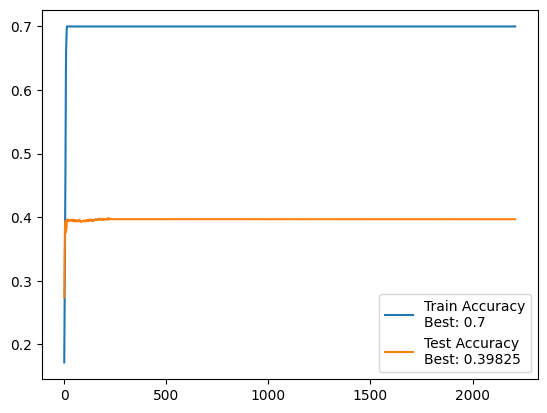

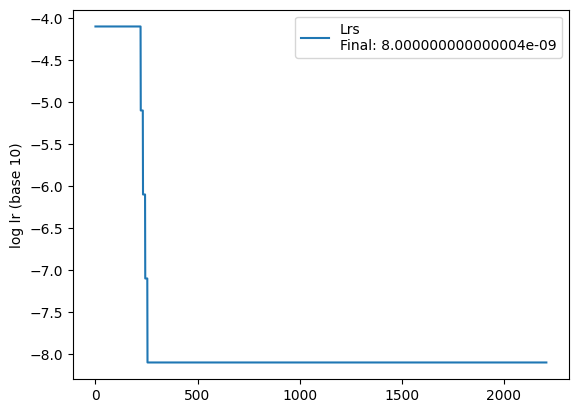


 =============== Epoch 2211 ===============


100%|██████████| 110/110 [00:03<00:00, 31.39it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.92it/s]


 Test accuracy: 39.7%, Avg loss: 6.783058

 =============== Epoch 2212 ===============


100%|██████████| 110/110 [00:03<00:00, 31.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.17it/s]


 Test accuracy: 39.7%, Avg loss: 6.783064

 =============== Epoch 2213 ===============


100%|██████████| 110/110 [00:03<00:00, 31.70it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.41it/s]


 Test accuracy: 39.7%, Avg loss: 6.783070

 =============== Epoch 2214 ===============


100%|██████████| 110/110 [00:03<00:00, 31.77it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.46it/s]


 Test accuracy: 39.7%, Avg loss: 6.783076

 =============== Epoch 2215 ===============


100%|██████████| 110/110 [00:03<00:00, 31.36it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.783082

 =============== Epoch 2216 ===============


100%|██████████| 110/110 [00:03<00:00, 31.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.783088

 =============== Epoch 2217 ===============


100%|██████████| 110/110 [00:03<00:00, 31.67it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.783094

 =============== Epoch 2218 ===============


100%|██████████| 110/110 [00:03<00:00, 31.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.57it/s]


 Test accuracy: 39.7%, Avg loss: 6.783100

 =============== Epoch 2219 ===============


100%|██████████| 110/110 [00:03<00:00, 31.38it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.93it/s]


 Test accuracy: 39.7%, Avg loss: 6.783106

 =============== Epoch 2220 ===============


100%|██████████| 110/110 [00:03<00:00, 31.69it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.75it/s]


 Test accuracy: 39.7%, Avg loss: 6.783112


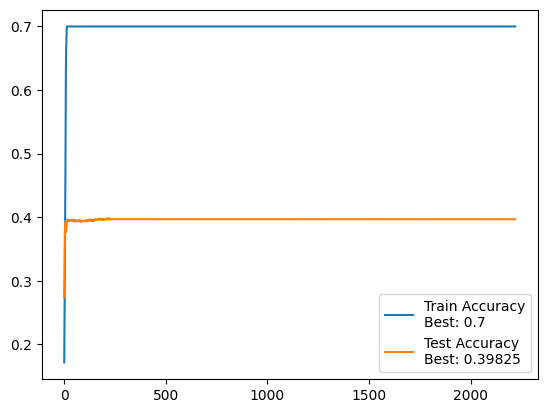

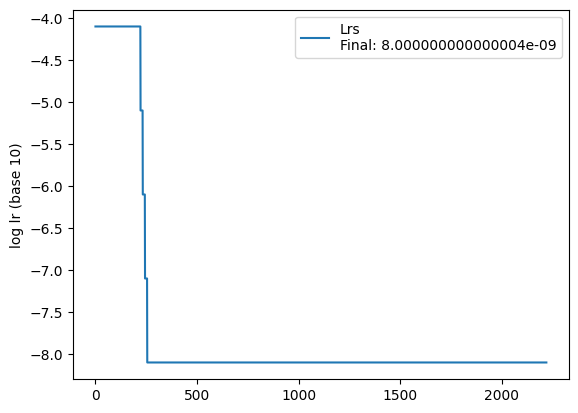


 =============== Epoch 2221 ===============


100%|██████████| 110/110 [00:03<00:00, 31.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.03it/s]


 Test accuracy: 39.7%, Avg loss: 6.783118

 =============== Epoch 2222 ===============


100%|██████████| 110/110 [00:03<00:00, 31.75it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.783124

 =============== Epoch 2223 ===============


100%|██████████| 110/110 [00:03<00:00, 31.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.57it/s]


 Test accuracy: 39.7%, Avg loss: 6.783130

 =============== Epoch 2224 ===============


100%|██████████| 110/110 [00:03<00:00, 31.67it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.41it/s]


 Test accuracy: 39.7%, Avg loss: 6.783136

 =============== Epoch 2225 ===============


100%|██████████| 110/110 [00:03<00:00, 31.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.783142

 =============== Epoch 2226 ===============


100%|██████████| 110/110 [00:03<00:00, 32.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.783148

 =============== Epoch 2227 ===============


100%|██████████| 110/110 [00:03<00:00, 31.63it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.84it/s]


 Test accuracy: 39.7%, Avg loss: 6.783154

 =============== Epoch 2228 ===============


100%|██████████| 110/110 [00:03<00:00, 31.70it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.60it/s]


 Test accuracy: 39.7%, Avg loss: 6.783160

 =============== Epoch 2229 ===============


100%|██████████| 110/110 [00:03<00:00, 31.67it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.783165

 =============== Epoch 2230 ===============


100%|██████████| 110/110 [00:03<00:00, 31.31it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.62it/s]


 Test accuracy: 39.7%, Avg loss: 6.783171


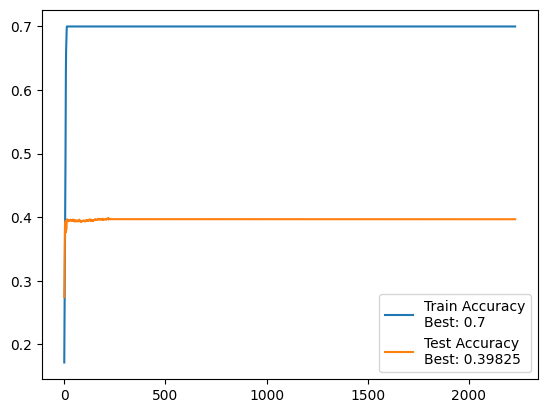

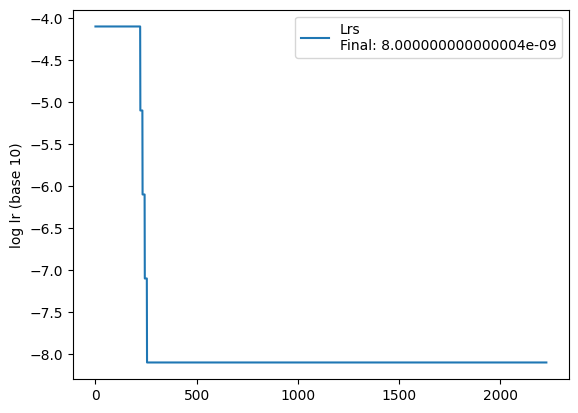


 =============== Epoch 2231 ===============


100%|██████████| 110/110 [00:03<00:00, 31.91it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.98it/s]


 Test accuracy: 39.7%, Avg loss: 6.783177

 =============== Epoch 2232 ===============


100%|██████████| 110/110 [00:03<00:00, 31.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.79it/s]


 Test accuracy: 39.7%, Avg loss: 6.783183

 =============== Epoch 2233 ===============


100%|██████████| 110/110 [00:03<00:00, 31.98it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.41it/s]


 Test accuracy: 39.7%, Avg loss: 6.783190

 =============== Epoch 2234 ===============


100%|██████████| 110/110 [00:03<00:00, 31.04it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.17it/s]


 Test accuracy: 39.7%, Avg loss: 6.783196

 =============== Epoch 2235 ===============


100%|██████████| 110/110 [00:03<00:00, 31.77it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.24it/s]


 Test accuracy: 39.7%, Avg loss: 6.783201

 =============== Epoch 2236 ===============


100%|██████████| 110/110 [00:03<00:00, 31.75it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.783207

 =============== Epoch 2237 ===============


100%|██████████| 110/110 [00:03<00:00, 32.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.783213

 =============== Epoch 2238 ===============


100%|██████████| 110/110 [00:03<00:00, 31.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.91it/s]


 Test accuracy: 39.7%, Avg loss: 6.783219

 =============== Epoch 2239 ===============


100%|██████████| 110/110 [00:03<00:00, 31.72it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.783225

 =============== Epoch 2240 ===============


100%|██████████| 110/110 [00:03<00:00, 31.90it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.783231


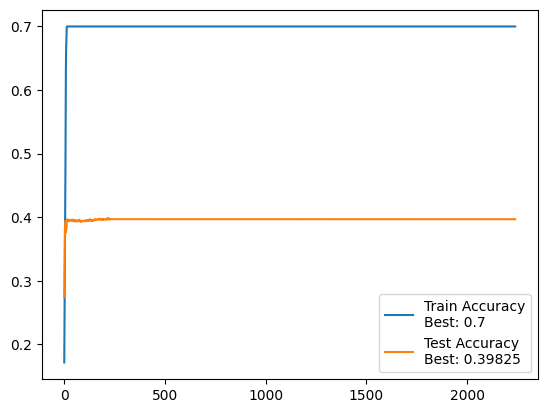

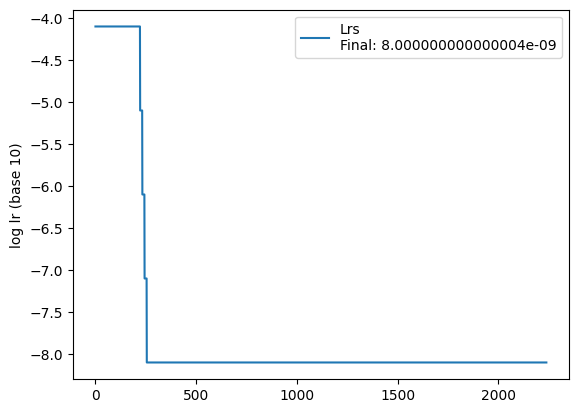


 =============== Epoch 2241 ===============


100%|██████████| 110/110 [00:03<00:00, 31.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.60it/s]


 Test accuracy: 39.7%, Avg loss: 6.783237

 =============== Epoch 2242 ===============


100%|██████████| 110/110 [00:03<00:00, 31.42it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.98it/s]


 Test accuracy: 39.7%, Avg loss: 6.783243

 =============== Epoch 2243 ===============


100%|██████████| 110/110 [00:03<00:00, 31.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.62it/s]


 Test accuracy: 39.7%, Avg loss: 6.783249

 =============== Epoch 2244 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.14it/s]


 Test accuracy: 39.7%, Avg loss: 6.783255

 =============== Epoch 2245 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.79it/s]


 Test accuracy: 39.7%, Avg loss: 6.783261

 =============== Epoch 2246 ===============


100%|██████████| 110/110 [00:03<00:00, 31.59it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.98it/s]


 Test accuracy: 39.7%, Avg loss: 6.783267

 =============== Epoch 2247 ===============


100%|██████████| 110/110 [00:03<00:00, 32.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.41it/s]


 Test accuracy: 39.7%, Avg loss: 6.783273

 =============== Epoch 2248 ===============


100%|██████████| 110/110 [00:03<00:00, 31.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.783279

 =============== Epoch 2249 ===============


100%|██████████| 110/110 [00:03<00:00, 31.93it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.92it/s]


 Test accuracy: 39.7%, Avg loss: 6.783285

 =============== Epoch 2250 ===============


100%|██████████| 110/110 [00:03<00:00, 31.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.38it/s]


 Test accuracy: 39.7%, Avg loss: 6.783291


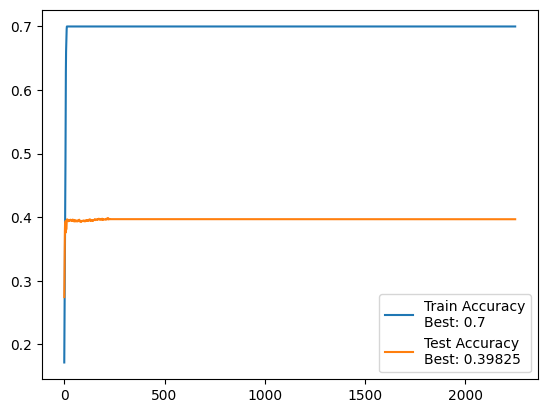

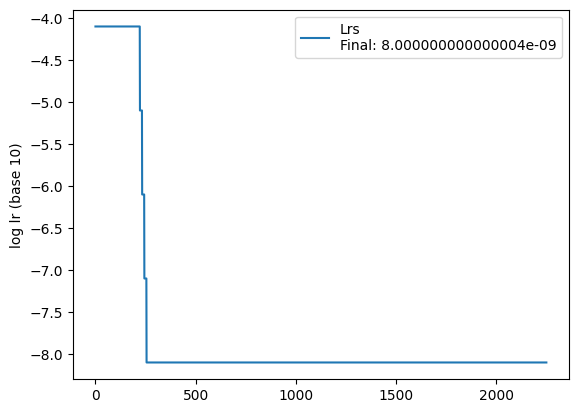


 =============== Epoch 2251 ===============


100%|██████████| 110/110 [00:03<00:00, 31.74it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.783297

 =============== Epoch 2252 ===============


100%|██████████| 110/110 [00:03<00:00, 31.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.79it/s]


 Test accuracy: 39.7%, Avg loss: 6.783302

 =============== Epoch 2253 ===============


100%|██████████| 110/110 [00:03<00:00, 31.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.783308

 =============== Epoch 2254 ===============


100%|██████████| 110/110 [00:03<00:00, 31.91it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.22it/s]


 Test accuracy: 39.7%, Avg loss: 6.783315

 =============== Epoch 2255 ===============


100%|██████████| 110/110 [00:03<00:00, 31.94it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.17it/s]


 Test accuracy: 39.7%, Avg loss: 6.783321

 =============== Epoch 2256 ===============


100%|██████████| 110/110 [00:03<00:00, 31.77it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.783326

 =============== Epoch 2257 ===============


100%|██████████| 110/110 [00:03<00:00, 31.30it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.45it/s]


 Test accuracy: 39.7%, Avg loss: 6.783332

 =============== Epoch 2258 ===============


100%|██████████| 110/110 [00:03<00:00, 32.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.97it/s]


 Test accuracy: 39.7%, Avg loss: 6.783338

 =============== Epoch 2259 ===============


100%|██████████| 110/110 [00:03<00:00, 31.81it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.783344

 =============== Epoch 2260 ===============


100%|██████████| 110/110 [00:03<00:00, 31.93it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.783350


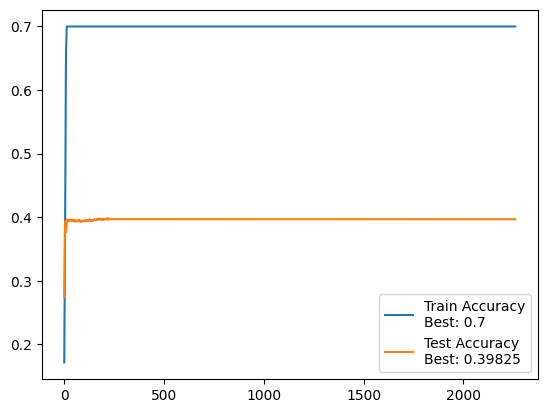

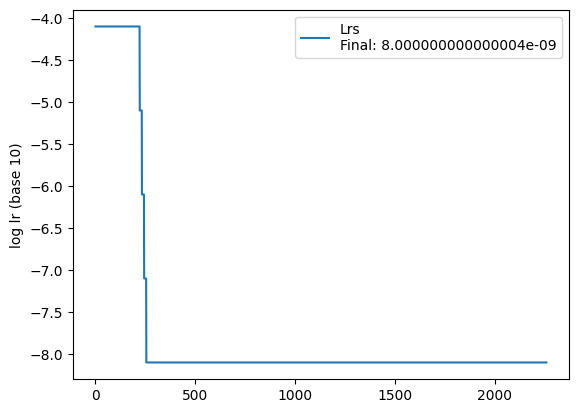


 =============== Epoch 2261 ===============


100%|██████████| 110/110 [00:03<00:00, 31.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.57it/s]


 Test accuracy: 39.7%, Avg loss: 6.783356

 =============== Epoch 2262 ===============


100%|██████████| 110/110 [00:03<00:00, 31.98it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.62it/s]


 Test accuracy: 39.7%, Avg loss: 6.783362

 =============== Epoch 2263 ===============


100%|██████████| 110/110 [00:03<00:00, 31.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.45it/s]


 Test accuracy: 39.7%, Avg loss: 6.783368

 =============== Epoch 2264 ===============


100%|██████████| 110/110 [00:03<00:00, 31.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.783374

 =============== Epoch 2265 ===============


100%|██████████| 110/110 [00:03<00:00, 31.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.21it/s]


 Test accuracy: 39.7%, Avg loss: 6.783380

 =============== Epoch 2266 ===============


100%|██████████| 110/110 [00:03<00:00, 31.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.783386

 =============== Epoch 2267 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.783392

 =============== Epoch 2268 ===============


100%|██████████| 110/110 [00:03<00:00, 31.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.783398

 =============== Epoch 2269 ===============


100%|██████████| 110/110 [00:03<00:00, 31.98it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.88it/s]


 Test accuracy: 39.7%, Avg loss: 6.783404

 =============== Epoch 2270 ===============


100%|██████████| 110/110 [00:03<00:00, 31.75it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.09it/s]


 Test accuracy: 39.7%, Avg loss: 6.783410


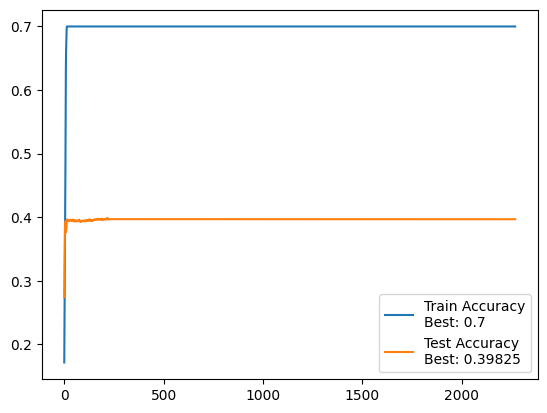

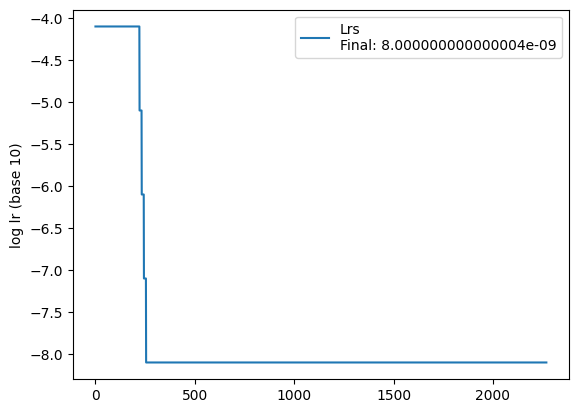


 =============== Epoch 2271 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.54it/s]


 Test accuracy: 39.7%, Avg loss: 6.783416

 =============== Epoch 2272 ===============


100%|██████████| 110/110 [00:03<00:00, 31.33it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.29it/s]


 Test accuracy: 39.7%, Avg loss: 6.783422

 =============== Epoch 2273 ===============


100%|██████████| 110/110 [00:03<00:00, 31.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.783428

 =============== Epoch 2274 ===============


100%|██████████| 110/110 [00:03<00:00, 31.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.783433

 =============== Epoch 2275 ===============


100%|██████████| 110/110 [00:03<00:00, 31.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.783439

 =============== Epoch 2276 ===============


100%|██████████| 110/110 [00:03<00:00, 31.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.22it/s]


 Test accuracy: 39.7%, Avg loss: 6.783445

 =============== Epoch 2277 ===============


100%|██████████| 110/110 [00:03<00:00, 31.79it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.783451

 =============== Epoch 2278 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.77it/s]


 Test accuracy: 39.7%, Avg loss: 6.783457

 =============== Epoch 2279 ===============


100%|██████████| 110/110 [00:03<00:00, 31.89it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.71it/s]


 Test accuracy: 39.7%, Avg loss: 6.783464

 =============== Epoch 2280 ===============


100%|██████████| 110/110 [00:03<00:00, 31.37it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.10it/s]


 Test accuracy: 39.7%, Avg loss: 6.783469


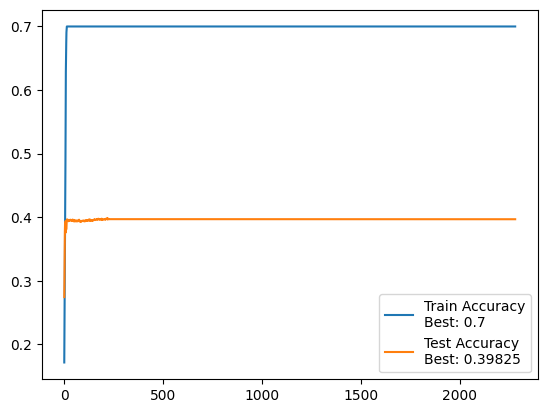

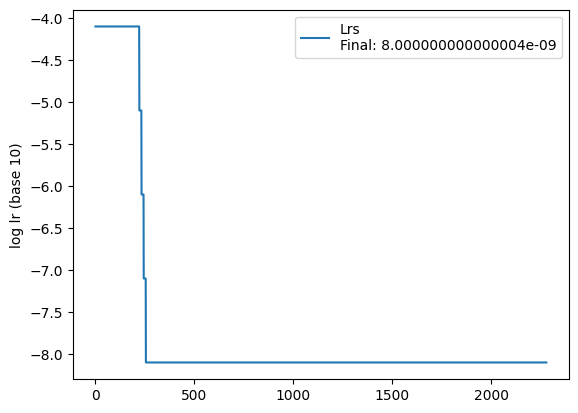


 =============== Epoch 2281 ===============


100%|██████████| 110/110 [00:03<00:00, 31.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.75it/s]


 Test accuracy: 39.7%, Avg loss: 6.783476

 =============== Epoch 2282 ===============


100%|██████████| 110/110 [00:03<00:00, 31.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.783482

 =============== Epoch 2283 ===============


100%|██████████| 110/110 [00:03<00:00, 31.78it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.85it/s]


 Test accuracy: 39.7%, Avg loss: 6.783488

 =============== Epoch 2284 ===============


100%|██████████| 110/110 [00:03<00:00, 31.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.21it/s]


 Test accuracy: 39.7%, Avg loss: 6.783494

 =============== Epoch 2285 ===============


100%|██████████| 110/110 [00:03<00:00, 31.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.783499

 =============== Epoch 2286 ===============


100%|██████████| 110/110 [00:03<00:00, 31.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.57it/s]


 Test accuracy: 39.7%, Avg loss: 6.783506

 =============== Epoch 2287 ===============


100%|██████████| 110/110 [00:03<00:00, 31.61it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.26it/s]


 Test accuracy: 39.7%, Avg loss: 6.783512

 =============== Epoch 2288 ===============


100%|██████████| 110/110 [00:03<00:00, 31.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.783518

 =============== Epoch 2289 ===============


100%|██████████| 110/110 [00:03<00:00, 31.93it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.783524

 =============== Epoch 2290 ===============


100%|██████████| 110/110 [00:03<00:00, 31.77it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.91it/s]


 Test accuracy: 39.7%, Avg loss: 6.783530


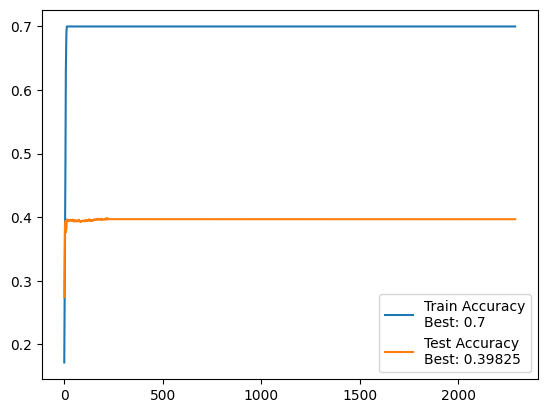

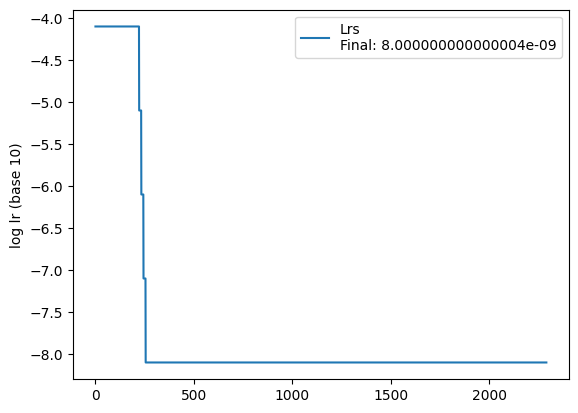


 =============== Epoch 2291 ===============


100%|██████████| 110/110 [00:03<00:00, 31.68it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.33it/s]


 Test accuracy: 39.7%, Avg loss: 6.783535

 =============== Epoch 2292 ===============


100%|██████████| 110/110 [00:03<00:00, 31.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.41it/s]


 Test accuracy: 39.7%, Avg loss: 6.783541

 =============== Epoch 2293 ===============


100%|██████████| 110/110 [00:03<00:00, 31.94it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.45it/s]


 Test accuracy: 39.7%, Avg loss: 6.783547

 =============== Epoch 2294 ===============


100%|██████████| 110/110 [00:03<00:00, 31.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.37it/s]


 Test accuracy: 39.7%, Avg loss: 6.783553

 =============== Epoch 2295 ===============


100%|██████████| 110/110 [00:03<00:00, 31.78it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.783559

 =============== Epoch 2296 ===============


100%|██████████| 110/110 [00:03<00:00, 31.69it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.34it/s]


 Test accuracy: 39.7%, Avg loss: 6.783565

 =============== Epoch 2297 ===============


100%|██████████| 110/110 [00:03<00:00, 31.60it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.89it/s]


 Test accuracy: 39.7%, Avg loss: 6.783571

 =============== Epoch 2298 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.68it/s]


 Test accuracy: 39.7%, Avg loss: 6.783577

 =============== Epoch 2299 ===============


100%|██████████| 110/110 [00:03<00:00, 31.89it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.783583

 =============== Epoch 2300 ===============


100%|██████████| 110/110 [00:03<00:00, 31.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.783589


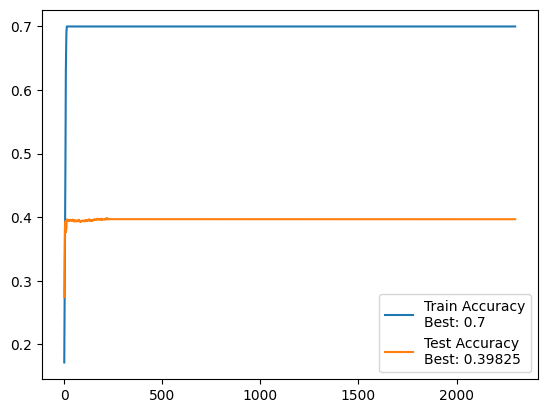

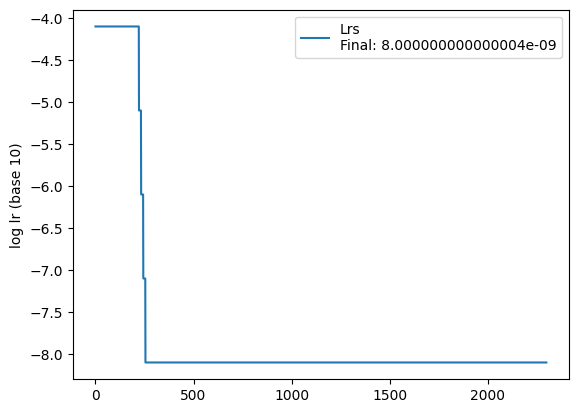


 =============== Epoch 2301 ===============


100%|██████████| 110/110 [00:03<00:00, 31.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.783595

 =============== Epoch 2302 ===============


100%|██████████| 110/110 [00:03<00:00, 31.31it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.783601

 =============== Epoch 2303 ===============


100%|██████████| 110/110 [00:03<00:00, 31.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.783607

 =============== Epoch 2304 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.783613

 =============== Epoch 2305 ===============


100%|██████████| 110/110 [00:03<00:00, 32.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.783619

 =============== Epoch 2306 ===============


100%|██████████| 110/110 [00:03<00:00, 31.51it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.81it/s]


 Test accuracy: 39.7%, Avg loss: 6.783625

 =============== Epoch 2307 ===============


100%|██████████| 110/110 [00:03<00:00, 31.98it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.783631

 =============== Epoch 2308 ===============


100%|██████████| 110/110 [00:03<00:00, 31.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.46it/s]


 Test accuracy: 39.7%, Avg loss: 6.783637

 =============== Epoch 2309 ===============


100%|██████████| 110/110 [00:03<00:00, 32.02it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.75it/s]


 Test accuracy: 39.7%, Avg loss: 6.783643

 =============== Epoch 2310 ===============


100%|██████████| 110/110 [00:03<00:00, 31.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.57it/s]


 Test accuracy: 39.7%, Avg loss: 6.783649


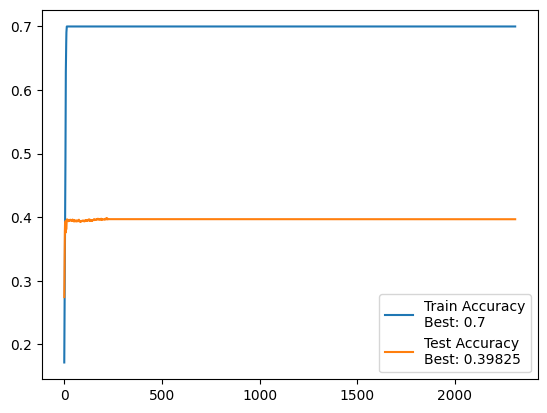

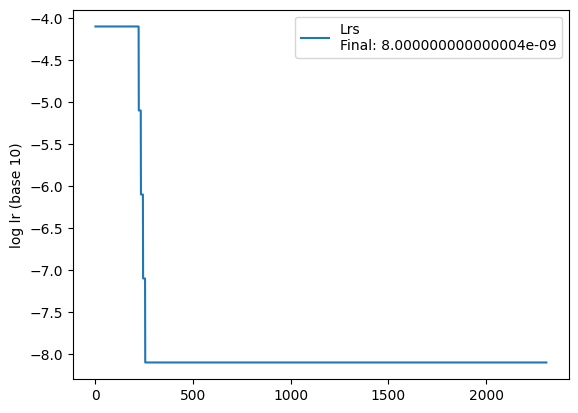


 =============== Epoch 2311 ===============


100%|██████████| 110/110 [00:03<00:00, 31.81it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.47it/s]


 Test accuracy: 39.7%, Avg loss: 6.783654

 =============== Epoch 2312 ===============


100%|██████████| 110/110 [00:03<00:00, 31.85it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.09it/s]


 Test accuracy: 39.7%, Avg loss: 6.783661

 =============== Epoch 2313 ===============


100%|██████████| 110/110 [00:03<00:00, 31.53it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.68it/s]


 Test accuracy: 39.7%, Avg loss: 6.783666

 =============== Epoch 2314 ===============


100%|██████████| 110/110 [00:03<00:00, 30.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.32it/s]


 Test accuracy: 39.7%, Avg loss: 6.783672

 =============== Epoch 2315 ===============


100%|██████████| 110/110 [00:03<00:00, 30.79it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.09it/s]


 Test accuracy: 39.7%, Avg loss: 6.783678

 =============== Epoch 2316 ===============


100%|██████████| 110/110 [00:03<00:00, 31.58it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.32it/s]


 Test accuracy: 39.7%, Avg loss: 6.783683

 =============== Epoch 2317 ===============


100%|██████████| 110/110 [00:03<00:00, 31.98it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.783689

 =============== Epoch 2318 ===============


100%|██████████| 110/110 [00:03<00:00, 31.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.783695

 =============== Epoch 2319 ===============


100%|██████████| 110/110 [00:03<00:00, 31.79it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.783701

 =============== Epoch 2320 ===============


100%|██████████| 110/110 [00:03<00:00, 31.35it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.44it/s]


 Test accuracy: 39.7%, Avg loss: 6.783707


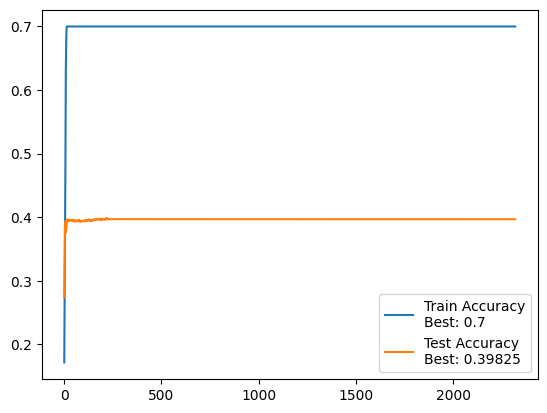

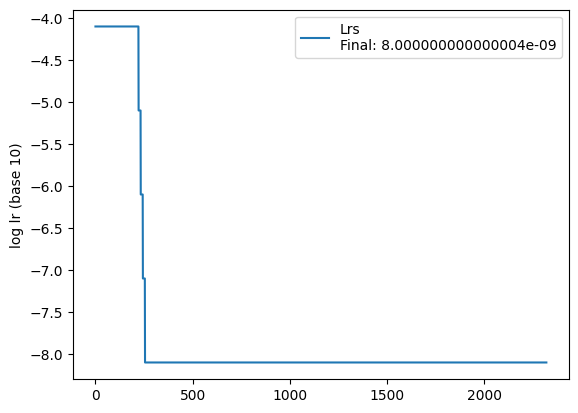


 =============== Epoch 2321 ===============


100%|██████████| 110/110 [00:03<00:00, 31.69it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.38it/s]


 Test accuracy: 39.7%, Avg loss: 6.783712

 =============== Epoch 2322 ===============


100%|██████████| 110/110 [00:03<00:00, 31.91it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.783719

 =============== Epoch 2323 ===============


100%|██████████| 110/110 [00:03<00:00, 31.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.62it/s]


 Test accuracy: 39.7%, Avg loss: 6.783725

 =============== Epoch 2324 ===============


100%|██████████| 110/110 [00:03<00:00, 31.51it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.33it/s]


 Test accuracy: 39.7%, Avg loss: 6.783731

 =============== Epoch 2325 ===============


100%|██████████| 110/110 [00:03<00:00, 31.81it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.783737

 =============== Epoch 2326 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.21it/s]


 Test accuracy: 39.7%, Avg loss: 6.783742

 =============== Epoch 2327 ===============


100%|██████████| 110/110 [00:03<00:00, 31.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.10it/s]


 Test accuracy: 39.7%, Avg loss: 6.783748

 =============== Epoch 2328 ===============


100%|██████████| 110/110 [00:03<00:00, 31.91it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.783754

 =============== Epoch 2329 ===============


100%|██████████| 110/110 [00:03<00:00, 31.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.78it/s]


 Test accuracy: 39.7%, Avg loss: 6.783760

 =============== Epoch 2330 ===============


100%|██████████| 110/110 [00:03<00:00, 31.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.83it/s]


 Test accuracy: 39.7%, Avg loss: 6.783766


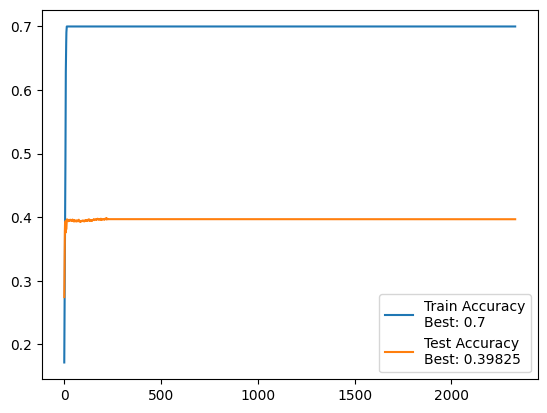

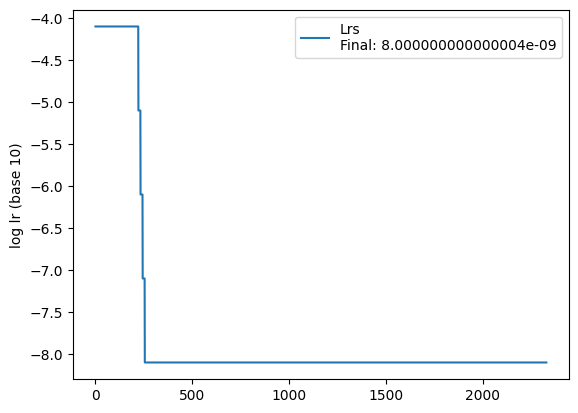


 =============== Epoch 2331 ===============


100%|██████████| 110/110 [00:03<00:00, 31.25it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.783772

 =============== Epoch 2332 ===============


100%|██████████| 110/110 [00:03<00:00, 31.75it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.93it/s]


 Test accuracy: 39.7%, Avg loss: 6.783778

 =============== Epoch 2333 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.783784

 =============== Epoch 2334 ===============


100%|██████████| 110/110 [00:03<00:00, 31.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.09it/s]


 Test accuracy: 39.7%, Avg loss: 6.783790

 =============== Epoch 2335 ===============


100%|██████████| 110/110 [00:03<00:00, 31.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.93it/s]


 Test accuracy: 39.7%, Avg loss: 6.783796

 =============== Epoch 2336 ===============


100%|██████████| 110/110 [00:03<00:00, 31.81it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.26it/s]


 Test accuracy: 39.7%, Avg loss: 6.783802

 =============== Epoch 2337 ===============


100%|██████████| 110/110 [00:03<00:00, 31.94it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.84it/s]


 Test accuracy: 39.7%, Avg loss: 6.783808

 =============== Epoch 2338 ===============


100%|██████████| 110/110 [00:03<00:00, 31.34it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.783814

 =============== Epoch 2339 ===============


100%|██████████| 110/110 [00:03<00:00, 31.98it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.46it/s]


 Test accuracy: 39.7%, Avg loss: 6.783820

 =============== Epoch 2340 ===============


100%|██████████| 110/110 [00:03<00:00, 31.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.98it/s]


 Test accuracy: 39.7%, Avg loss: 6.783826


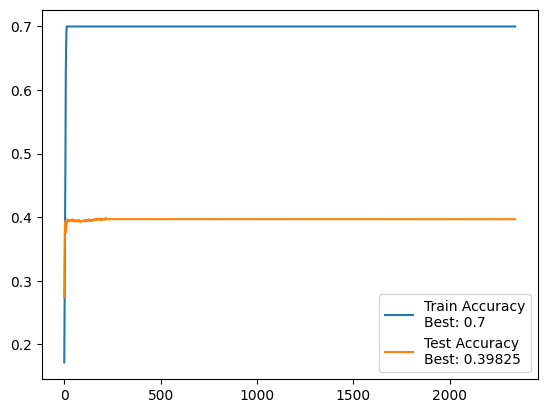

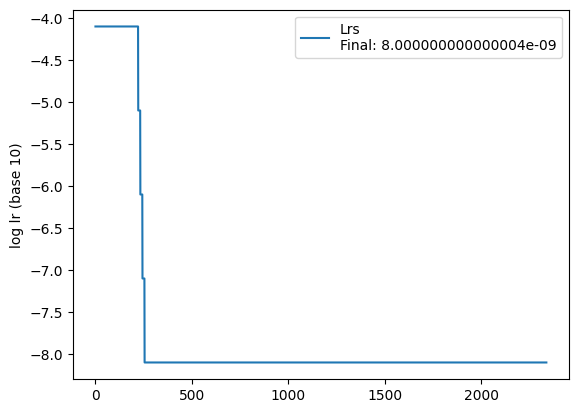


 =============== Epoch 2341 ===============


100%|██████████| 110/110 [00:03<00:00, 31.75it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.783832

 =============== Epoch 2342 ===============


100%|██████████| 110/110 [00:03<00:00, 31.78it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.98it/s]


 Test accuracy: 39.7%, Avg loss: 6.783838

 =============== Epoch 2343 ===============


100%|██████████| 110/110 [00:03<00:00, 31.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.51it/s]


 Test accuracy: 39.7%, Avg loss: 6.783843

 =============== Epoch 2344 ===============


100%|██████████| 110/110 [00:03<00:00, 31.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.40it/s]


 Test accuracy: 39.7%, Avg loss: 6.783849

 =============== Epoch 2345 ===============


100%|██████████| 110/110 [00:03<00:00, 31.28it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.57it/s]


 Test accuracy: 39.7%, Avg loss: 6.783855

 =============== Epoch 2346 ===============


100%|██████████| 110/110 [00:03<00:00, 31.71it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.783861

 =============== Epoch 2347 ===============


100%|██████████| 110/110 [00:03<00:00, 31.66it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.783867

 =============== Epoch 2348 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.783873

 =============== Epoch 2349 ===============


100%|██████████| 110/110 [00:03<00:00, 31.81it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.783879

 =============== Epoch 2350 ===============


100%|██████████| 110/110 [00:03<00:00, 31.78it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.783885


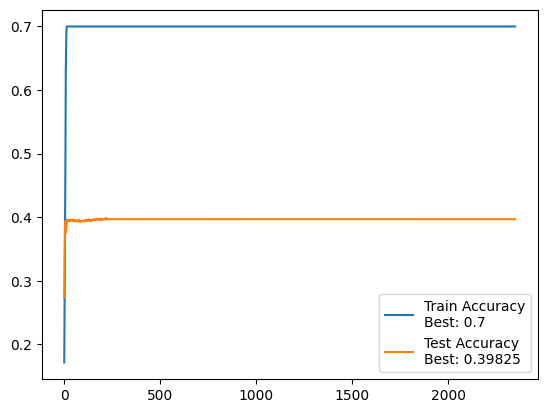

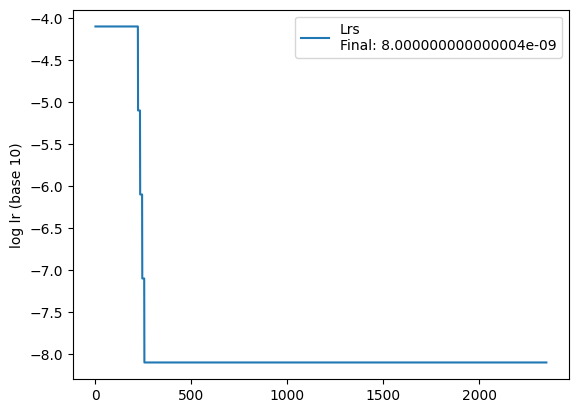


 =============== Epoch 2351 ===============


100%|██████████| 110/110 [00:03<00:00, 31.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.95it/s]


 Test accuracy: 39.7%, Avg loss: 6.783890

 =============== Epoch 2352 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.783896

 =============== Epoch 2353 ===============


100%|██████████| 110/110 [00:03<00:00, 31.69it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.29it/s]


 Test accuracy: 39.7%, Avg loss: 6.783902

 =============== Epoch 2354 ===============


100%|██████████| 110/110 [00:03<00:00, 31.65it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.14it/s]


 Test accuracy: 39.7%, Avg loss: 6.783908

 =============== Epoch 2355 ===============


100%|██████████| 110/110 [00:03<00:00, 31.71it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.783914

 =============== Epoch 2356 ===============


100%|██████████| 110/110 [00:03<00:00, 31.31it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.34it/s]


 Test accuracy: 39.7%, Avg loss: 6.783919

 =============== Epoch 2357 ===============


100%|██████████| 110/110 [00:03<00:00, 31.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.57it/s]


 Test accuracy: 39.7%, Avg loss: 6.783925

 =============== Epoch 2358 ===============


100%|██████████| 110/110 [00:03<00:00, 31.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.60it/s]


 Test accuracy: 39.7%, Avg loss: 6.783931

 =============== Epoch 2359 ===============


100%|██████████| 110/110 [00:03<00:00, 31.78it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.783937

 =============== Epoch 2360 ===============


100%|██████████| 110/110 [00:03<00:00, 31.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.783943


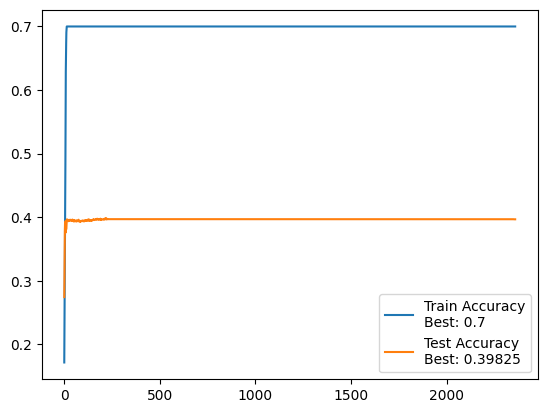

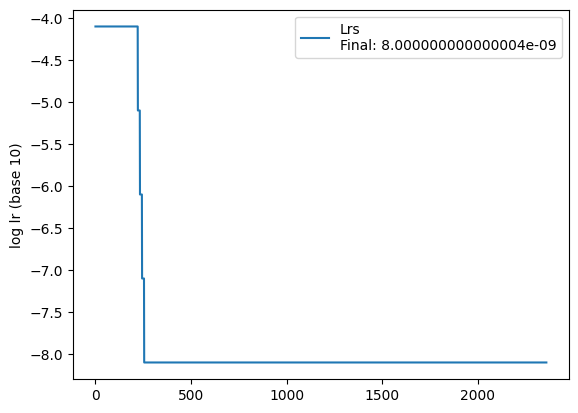


 =============== Epoch 2361 ===============


100%|██████████| 110/110 [00:03<00:00, 31.89it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.783949

 =============== Epoch 2362 ===============


100%|██████████| 110/110 [00:03<00:00, 31.85it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.46it/s]


 Test accuracy: 39.7%, Avg loss: 6.783955

 =============== Epoch 2363 ===============


100%|██████████| 110/110 [00:03<00:00, 31.09it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.783960

 =============== Epoch 2364 ===============


100%|██████████| 110/110 [00:03<00:00, 31.69it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.72it/s]


 Test accuracy: 39.7%, Avg loss: 6.783966

 =============== Epoch 2365 ===============


100%|██████████| 110/110 [00:03<00:00, 31.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.33it/s]


 Test accuracy: 39.7%, Avg loss: 6.783972

 =============== Epoch 2366 ===============


100%|██████████| 110/110 [00:03<00:00, 31.81it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.783978

 =============== Epoch 2367 ===============


100%|██████████| 110/110 [00:03<00:00, 31.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.783984

 =============== Epoch 2368 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.14it/s]


 Test accuracy: 39.7%, Avg loss: 6.783990

 =============== Epoch 2369 ===============


100%|██████████| 110/110 [00:03<00:00, 31.73it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.783995

 =============== Epoch 2370 ===============


100%|██████████| 110/110 [00:03<00:00, 31.70it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.784001


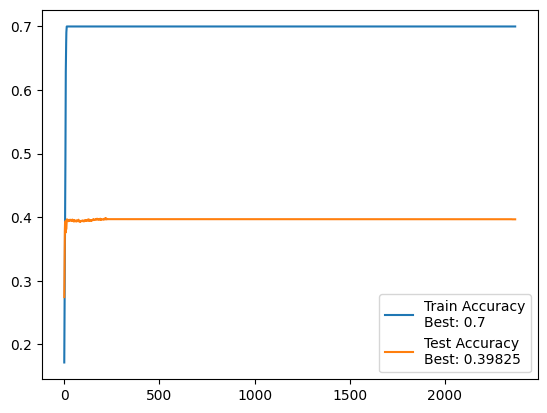

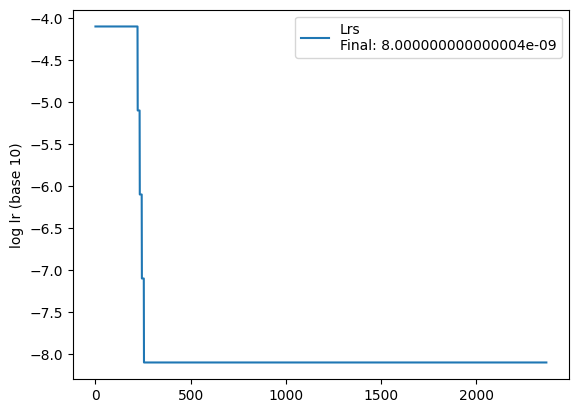


 =============== Epoch 2371 ===============


100%|██████████| 110/110 [00:03<00:00, 31.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.31it/s]


 Test accuracy: 39.7%, Avg loss: 6.784007

 =============== Epoch 2372 ===============


100%|██████████| 110/110 [00:03<00:00, 31.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.87it/s]


 Test accuracy: 39.7%, Avg loss: 6.784013

 =============== Epoch 2373 ===============


100%|██████████| 110/110 [00:03<00:00, 31.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.96it/s]


 Test accuracy: 39.7%, Avg loss: 6.784019

 =============== Epoch 2374 ===============


100%|██████████| 110/110 [00:03<00:00, 31.28it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.31it/s]


 Test accuracy: 39.7%, Avg loss: 6.784024

 =============== Epoch 2375 ===============


100%|██████████| 110/110 [00:03<00:00, 31.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.784030

 =============== Epoch 2376 ===============


100%|██████████| 110/110 [00:03<00:00, 31.95it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.784036

 =============== Epoch 2377 ===============


100%|██████████| 110/110 [00:03<00:00, 31.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.784042

 =============== Epoch 2378 ===============


100%|██████████| 110/110 [00:03<00:00, 31.95it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.03it/s]


 Test accuracy: 39.7%, Avg loss: 6.784048

 =============== Epoch 2379 ===============


100%|██████████| 110/110 [00:03<00:00, 31.95it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.14it/s]


 Test accuracy: 39.7%, Avg loss: 6.784054

 =============== Epoch 2380 ===============


100%|██████████| 110/110 [00:03<00:00, 31.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.784060


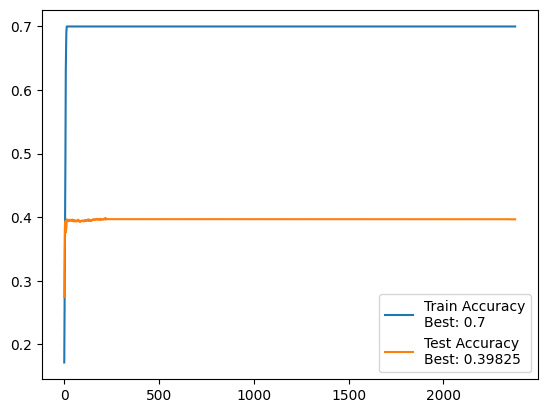

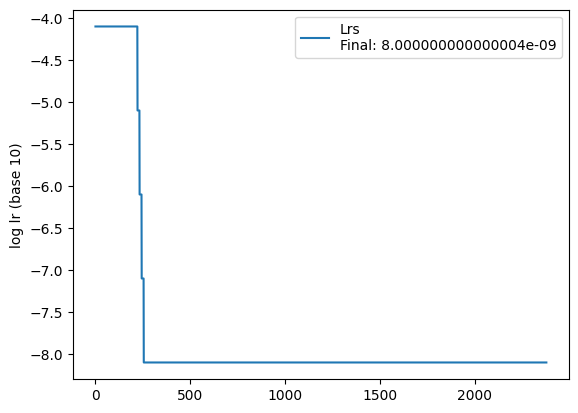


 =============== Epoch 2381 ===============


100%|██████████| 110/110 [00:03<00:00, 30.65it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.31it/s]


 Test accuracy: 39.7%, Avg loss: 6.784066

 =============== Epoch 2382 ===============


100%|██████████| 110/110 [00:03<00:00, 31.74it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.77it/s]


 Test accuracy: 39.7%, Avg loss: 6.784072

 =============== Epoch 2383 ===============


100%|██████████| 110/110 [00:03<00:00, 31.74it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.81it/s]


 Test accuracy: 39.7%, Avg loss: 6.784077

 =============== Epoch 2384 ===============


100%|██████████| 110/110 [00:03<00:00, 31.70it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.68it/s]


 Test accuracy: 39.7%, Avg loss: 6.784083

 =============== Epoch 2385 ===============


100%|██████████| 110/110 [00:03<00:00, 31.65it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.79it/s]


 Test accuracy: 39.7%, Avg loss: 6.784089

 =============== Epoch 2386 ===============


100%|██████████| 110/110 [00:03<00:00, 32.07it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.51it/s]


 Test accuracy: 39.7%, Avg loss: 6.784095

 =============== Epoch 2387 ===============


100%|██████████| 110/110 [00:03<00:00, 32.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.784100

 =============== Epoch 2388 ===============


100%|██████████| 110/110 [00:03<00:00, 31.71it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.784106

 =============== Epoch 2389 ===============


100%|██████████| 110/110 [00:03<00:00, 32.04it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.784112

 =============== Epoch 2390 ===============


100%|██████████| 110/110 [00:03<00:00, 31.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.784118


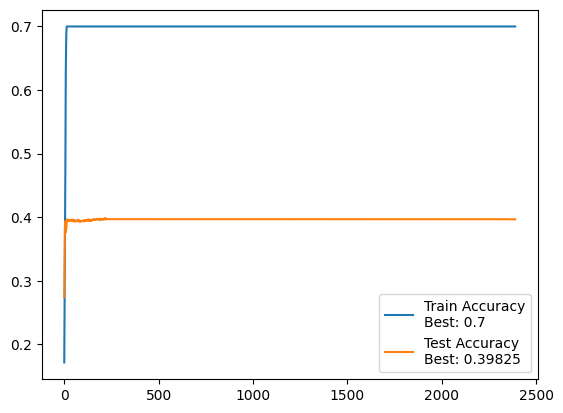

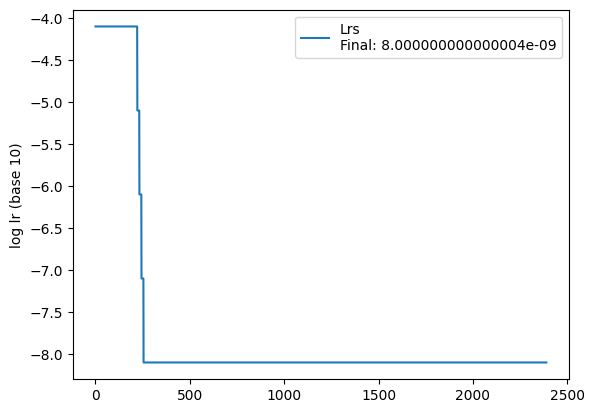


 =============== Epoch 2391 ===============


100%|██████████| 110/110 [00:03<00:00, 31.73it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.784123

 =============== Epoch 2392 ===============


100%|██████████| 110/110 [00:03<00:00, 31.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.79it/s]


 Test accuracy: 39.7%, Avg loss: 6.784129

 =============== Epoch 2393 ===============


100%|██████████| 110/110 [00:03<00:00, 31.65it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.784134

 =============== Epoch 2394 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.51it/s]


 Test accuracy: 39.7%, Avg loss: 6.784140

 =============== Epoch 2395 ===============


100%|██████████| 110/110 [00:03<00:00, 31.46it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.77it/s]


 Test accuracy: 39.7%, Avg loss: 6.784146

 =============== Epoch 2396 ===============


100%|██████████| 110/110 [00:03<00:00, 31.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.784152

 =============== Epoch 2397 ===============


100%|██████████| 110/110 [00:03<00:00, 31.77it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.784158

 =============== Epoch 2398 ===============


100%|██████████| 110/110 [00:03<00:00, 31.72it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.81it/s]


 Test accuracy: 39.7%, Avg loss: 6.784163

 =============== Epoch 2399 ===============


100%|██████████| 110/110 [00:03<00:00, 31.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.784169

 =============== Epoch 2400 ===============


100%|██████████| 110/110 [00:03<00:00, 31.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.38it/s]


 Test accuracy: 39.7%, Avg loss: 6.784175


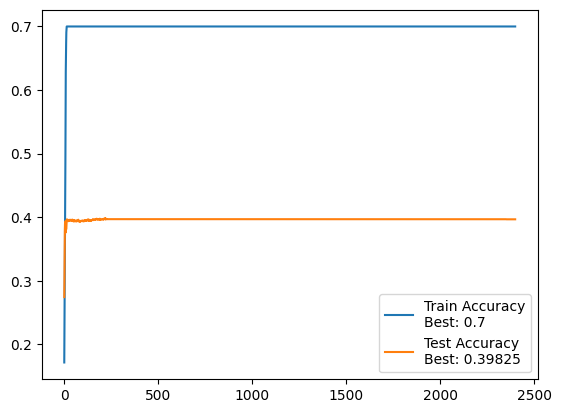

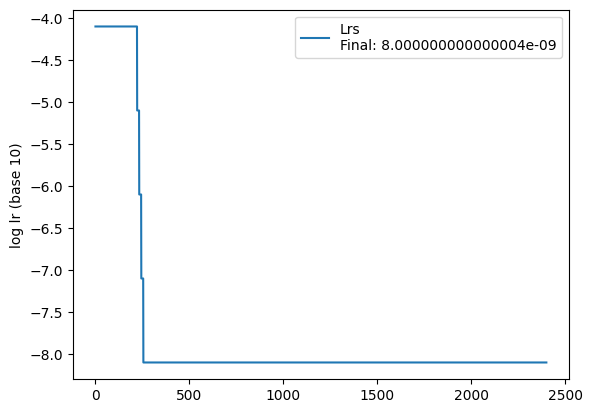


 =============== Epoch 2401 ===============


100%|██████████| 110/110 [00:03<00:00, 31.94it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.784181

 =============== Epoch 2402 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.51it/s]


 Test accuracy: 39.7%, Avg loss: 6.784186

 =============== Epoch 2403 ===============


100%|██████████| 110/110 [00:03<00:00, 31.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.784192

 =============== Epoch 2404 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.43it/s]


 Test accuracy: 39.7%, Avg loss: 6.784198

 =============== Epoch 2405 ===============


100%|██████████| 110/110 [00:03<00:00, 31.73it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.784204

 =============== Epoch 2406 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.88it/s]


 Test accuracy: 39.7%, Avg loss: 6.784210

 =============== Epoch 2407 ===============


100%|██████████| 110/110 [00:03<00:00, 31.71it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.51it/s]


 Test accuracy: 39.7%, Avg loss: 6.784215

 =============== Epoch 2408 ===============


100%|██████████| 110/110 [00:03<00:00, 31.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.784221

 =============== Epoch 2409 ===============


100%|██████████| 110/110 [00:03<00:00, 31.38it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.784227

 =============== Epoch 2410 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.784233


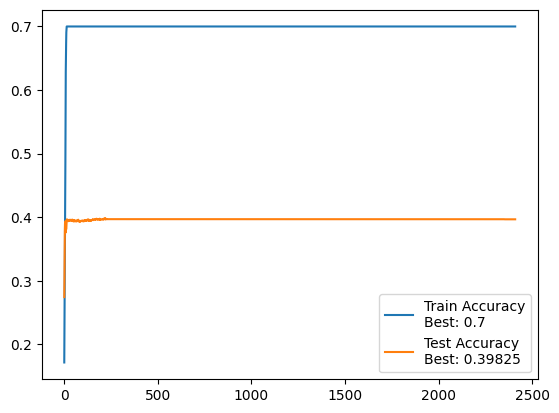

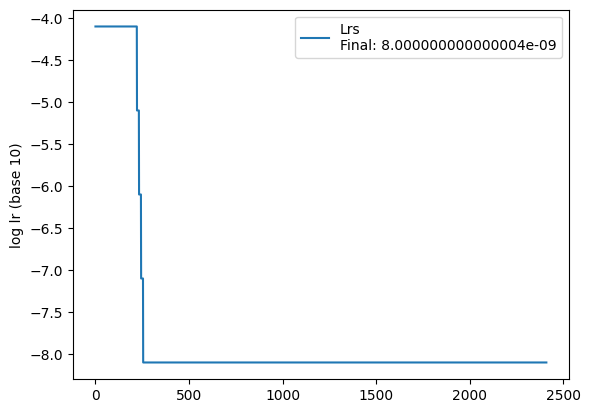


 =============== Epoch 2411 ===============


100%|██████████| 110/110 [00:03<00:00, 31.91it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.51it/s]


 Test accuracy: 39.7%, Avg loss: 6.784239

 =============== Epoch 2412 ===============


100%|██████████| 110/110 [00:03<00:00, 31.79it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.87it/s]


 Test accuracy: 39.7%, Avg loss: 6.784244

 =============== Epoch 2413 ===============


100%|██████████| 110/110 [00:03<00:00, 31.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.34it/s]


 Test accuracy: 39.7%, Avg loss: 6.784250

 =============== Epoch 2414 ===============


100%|██████████| 110/110 [00:03<00:00, 31.98it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.44it/s]


 Test accuracy: 39.7%, Avg loss: 6.784256

 =============== Epoch 2415 ===============


100%|██████████| 110/110 [00:03<00:00, 31.78it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.784261

 =============== Epoch 2416 ===============


100%|██████████| 110/110 [00:03<00:00, 31.22it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.22it/s]


 Test accuracy: 39.7%, Avg loss: 6.784267

 =============== Epoch 2417 ===============


100%|██████████| 110/110 [00:03<00:00, 31.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.784273

 =============== Epoch 2418 ===============


100%|██████████| 110/110 [00:03<00:00, 31.91it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.45it/s]


 Test accuracy: 39.7%, Avg loss: 6.784278

 =============== Epoch 2419 ===============


100%|██████████| 110/110 [00:03<00:00, 31.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.23it/s]


 Test accuracy: 39.7%, Avg loss: 6.784284

 =============== Epoch 2420 ===============


100%|██████████| 110/110 [00:03<00:00, 31.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.95it/s]


 Test accuracy: 39.7%, Avg loss: 6.784290


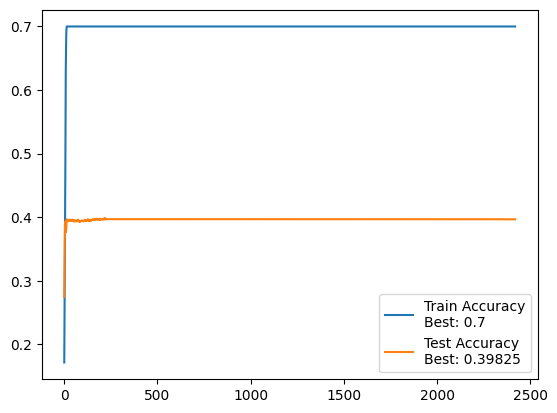

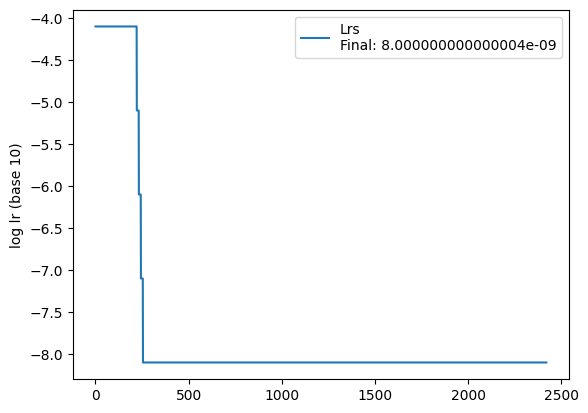


 =============== Epoch 2421 ===============


100%|██████████| 110/110 [00:03<00:00, 31.81it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.33it/s]


 Test accuracy: 39.7%, Avg loss: 6.784295

 =============== Epoch 2422 ===============


100%|██████████| 110/110 [00:03<00:00, 31.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.784301

 =============== Epoch 2423 ===============


100%|██████████| 110/110 [00:03<00:00, 31.46it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.57it/s]


 Test accuracy: 39.7%, Avg loss: 6.784307

 =============== Epoch 2424 ===============


100%|██████████| 110/110 [00:03<00:00, 31.85it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.43it/s]


 Test accuracy: 39.7%, Avg loss: 6.784313

 =============== Epoch 2425 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.57it/s]


 Test accuracy: 39.7%, Avg loss: 6.784318

 =============== Epoch 2426 ===============


100%|██████████| 110/110 [00:03<00:00, 32.03it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.784324

 =============== Epoch 2427 ===============


100%|██████████| 110/110 [00:03<00:00, 31.37it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.73it/s]


 Test accuracy: 39.7%, Avg loss: 6.784330

 =============== Epoch 2428 ===============


100%|██████████| 110/110 [00:03<00:00, 31.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.68it/s]


 Test accuracy: 39.7%, Avg loss: 6.784335

 =============== Epoch 2429 ===============


100%|██████████| 110/110 [00:03<00:00, 31.54it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.24it/s]


 Test accuracy: 39.7%, Avg loss: 6.784341

 =============== Epoch 2430 ===============


100%|██████████| 110/110 [00:03<00:00, 31.58it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.784347


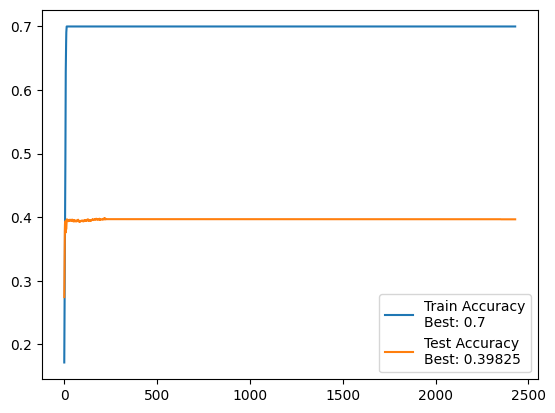

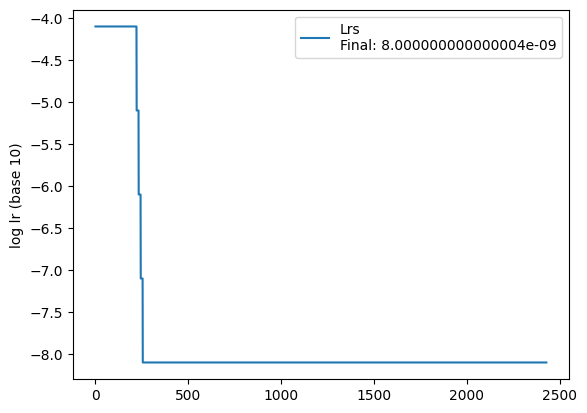


 =============== Epoch 2431 ===============


100%|██████████| 110/110 [00:03<00:00, 31.98it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.35it/s]


 Test accuracy: 39.7%, Avg loss: 6.784353

 =============== Epoch 2432 ===============


100%|██████████| 110/110 [00:03<00:00, 31.91it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.60it/s]


 Test accuracy: 39.7%, Avg loss: 6.784358

 =============== Epoch 2433 ===============


100%|██████████| 110/110 [00:03<00:00, 31.73it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.81it/s]


 Test accuracy: 39.7%, Avg loss: 6.784364

 =============== Epoch 2434 ===============


100%|██████████| 110/110 [00:03<00:00, 32.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.51it/s]


 Test accuracy: 39.7%, Avg loss: 6.784370

 =============== Epoch 2435 ===============


100%|██████████| 110/110 [00:03<00:00, 31.95it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.88it/s]


 Test accuracy: 39.7%, Avg loss: 6.784375

 =============== Epoch 2436 ===============


100%|██████████| 110/110 [00:03<00:00, 31.70it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.45it/s]


 Test accuracy: 39.7%, Avg loss: 6.784381

 =============== Epoch 2437 ===============


100%|██████████| 110/110 [00:03<00:00, 31.44it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.31it/s]


 Test accuracy: 39.7%, Avg loss: 6.784387

 =============== Epoch 2438 ===============


100%|██████████| 110/110 [00:03<00:00, 31.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.784393

 =============== Epoch 2439 ===============


100%|██████████| 110/110 [00:03<00:00, 31.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.27it/s]


 Test accuracy: 39.7%, Avg loss: 6.784398

 =============== Epoch 2440 ===============


100%|██████████| 110/110 [00:03<00:00, 31.49it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.93it/s]


 Test accuracy: 39.7%, Avg loss: 6.784404


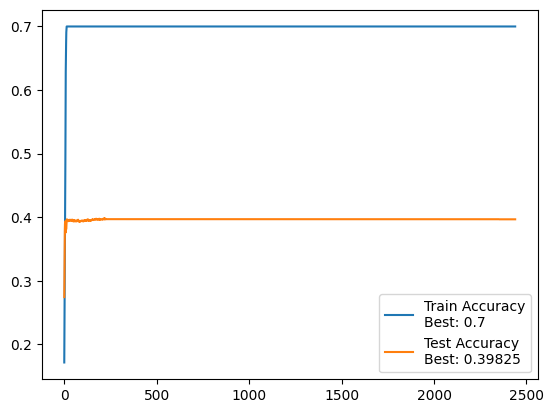

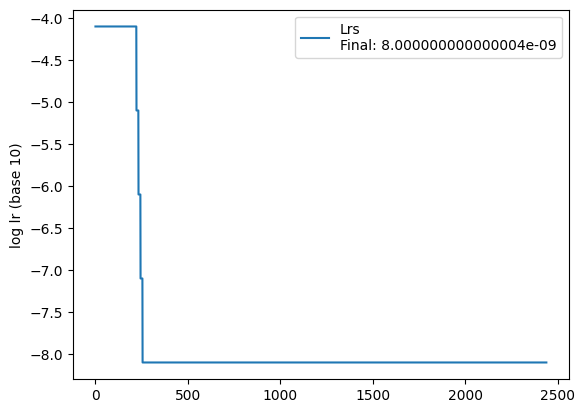


 =============== Epoch 2441 ===============


100%|██████████| 110/110 [00:03<00:00, 31.47it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.41it/s]


 Test accuracy: 39.7%, Avg loss: 6.784409

 =============== Epoch 2442 ===============


100%|██████████| 110/110 [00:03<00:00, 31.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.38it/s]


 Test accuracy: 39.7%, Avg loss: 6.784414

 =============== Epoch 2443 ===============


100%|██████████| 110/110 [00:03<00:00, 31.78it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.88it/s]


 Test accuracy: 39.7%, Avg loss: 6.784420

 =============== Epoch 2444 ===============


100%|██████████| 110/110 [00:03<00:00, 31.84it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.33it/s]


 Test accuracy: 39.7%, Avg loss: 6.784426

 =============== Epoch 2445 ===============


100%|██████████| 110/110 [00:03<00:00, 31.75it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.34it/s]


 Test accuracy: 39.7%, Avg loss: 6.784431

 =============== Epoch 2446 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.83it/s]


 Test accuracy: 39.7%, Avg loss: 6.784437

 =============== Epoch 2447 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.784443

 =============== Epoch 2448 ===============


100%|██████████| 110/110 [00:03<00:00, 31.69it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.89it/s]


 Test accuracy: 39.7%, Avg loss: 6.784448

 =============== Epoch 2449 ===============


100%|██████████| 110/110 [00:03<00:00, 31.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.33it/s]


 Test accuracy: 39.7%, Avg loss: 6.784454

 =============== Epoch 2450 ===============


100%|██████████| 110/110 [00:03<00:00, 31.57it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.43it/s]


 Test accuracy: 39.7%, Avg loss: 6.784460


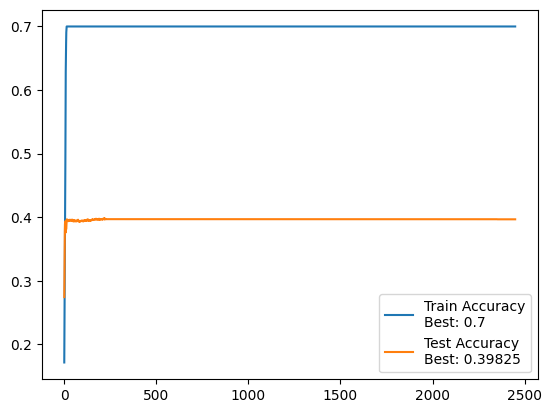

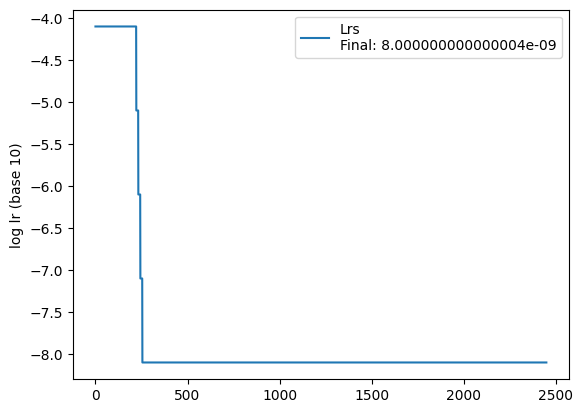


 =============== Epoch 2451 ===============


100%|██████████| 110/110 [00:03<00:00, 31.52it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.784465

 =============== Epoch 2452 ===============


100%|██████████| 110/110 [00:03<00:00, 31.72it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.47it/s]


 Test accuracy: 39.7%, Avg loss: 6.784470

 =============== Epoch 2453 ===============


100%|██████████| 110/110 [00:03<00:00, 31.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.60it/s]


 Test accuracy: 39.7%, Avg loss: 6.784477

 =============== Epoch 2454 ===============


100%|██████████| 110/110 [00:03<00:00, 31.90it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.21it/s]


 Test accuracy: 39.7%, Avg loss: 6.784482

 =============== Epoch 2455 ===============


100%|██████████| 110/110 [00:03<00:00, 30.73it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.784487

 =============== Epoch 2456 ===============


100%|██████████| 110/110 [00:03<00:00, 31.79it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.784493

 =============== Epoch 2457 ===============


100%|██████████| 110/110 [00:03<00:00, 31.70it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.95it/s]


 Test accuracy: 39.7%, Avg loss: 6.784498

 =============== Epoch 2458 ===============


100%|██████████| 110/110 [00:03<00:00, 31.78it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.51it/s]


 Test accuracy: 39.7%, Avg loss: 6.784504

 =============== Epoch 2459 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.784509

 =============== Epoch 2460 ===============


100%|██████████| 110/110 [00:03<00:00, 31.37it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.784515


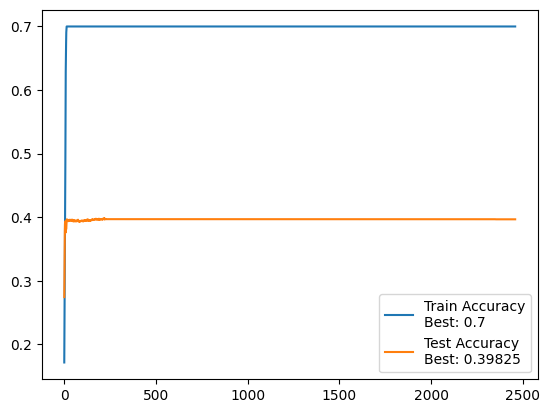

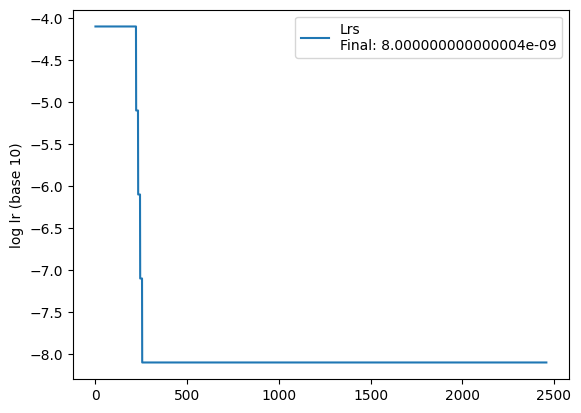


 =============== Epoch 2461 ===============


100%|██████████| 110/110 [00:03<00:00, 31.25it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.784521

 =============== Epoch 2462 ===============


100%|██████████| 110/110 [00:03<00:00, 32.02it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.10it/s]


 Test accuracy: 39.7%, Avg loss: 6.784526

 =============== Epoch 2463 ===============


100%|██████████| 110/110 [00:03<00:00, 31.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.68it/s]


 Test accuracy: 39.7%, Avg loss: 6.784532

 =============== Epoch 2464 ===============


100%|██████████| 110/110 [00:03<00:00, 31.84it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.784537

 =============== Epoch 2465 ===============


100%|██████████| 110/110 [00:03<00:00, 31.78it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.784543

 =============== Epoch 2466 ===============


100%|██████████| 110/110 [00:03<00:00, 31.36it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.60it/s]


 Test accuracy: 39.7%, Avg loss: 6.784548

 =============== Epoch 2467 ===============


100%|██████████| 110/110 [00:03<00:00, 31.93it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.784554

 =============== Epoch 2468 ===============


100%|██████████| 110/110 [00:03<00:00, 31.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.31it/s]


 Test accuracy: 39.7%, Avg loss: 6.784559

 =============== Epoch 2469 ===============


100%|██████████| 110/110 [00:03<00:00, 31.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.57it/s]


 Test accuracy: 39.7%, Avg loss: 6.784565

 =============== Epoch 2470 ===============


100%|██████████| 110/110 [00:03<00:00, 31.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.38it/s]


 Test accuracy: 39.7%, Avg loss: 6.784571


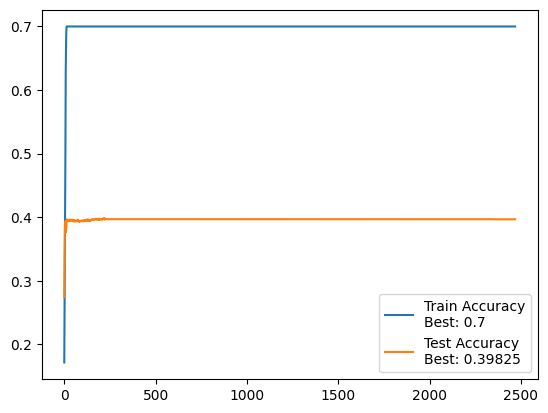

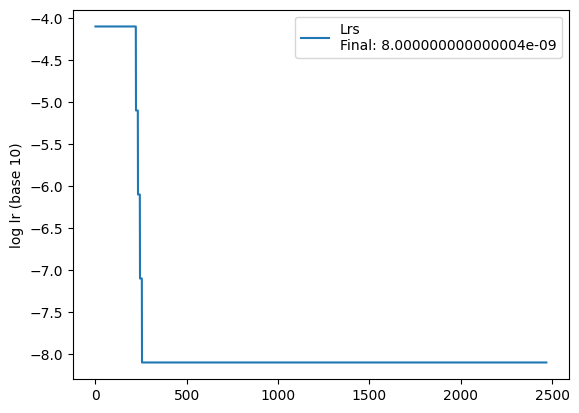


 =============== Epoch 2471 ===============


100%|██████████| 110/110 [00:03<00:00, 31.90it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.43it/s]


 Test accuracy: 39.7%, Avg loss: 6.784576

 =============== Epoch 2472 ===============


100%|██████████| 110/110 [00:03<00:00, 31.85it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.784582

 =============== Epoch 2473 ===============


100%|██████████| 110/110 [00:03<00:00, 31.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.43it/s]


 Test accuracy: 39.7%, Avg loss: 6.784587

 =============== Epoch 2474 ===============


100%|██████████| 110/110 [00:03<00:00, 32.02it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.66it/s]


 Test accuracy: 39.7%, Avg loss: 6.784593

 =============== Epoch 2475 ===============


100%|██████████| 110/110 [00:03<00:00, 31.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.45it/s]


 Test accuracy: 39.7%, Avg loss: 6.784598

 =============== Epoch 2476 ===============


100%|██████████| 110/110 [00:03<00:00, 31.85it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.51it/s]


 Test accuracy: 39.7%, Avg loss: 6.784604

 =============== Epoch 2477 ===============


100%|██████████| 110/110 [00:03<00:00, 32.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.784609

 =============== Epoch 2478 ===============


100%|██████████| 110/110 [00:03<00:00, 31.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.22it/s]


 Test accuracy: 39.7%, Avg loss: 6.784615

 =============== Epoch 2479 ===============


100%|██████████| 110/110 [00:03<00:00, 31.81it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.06it/s]


 Test accuracy: 39.7%, Avg loss: 6.784620

 =============== Epoch 2480 ===============


100%|██████████| 110/110 [00:03<00:00, 32.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.72it/s]


 Test accuracy: 39.7%, Avg loss: 6.784626


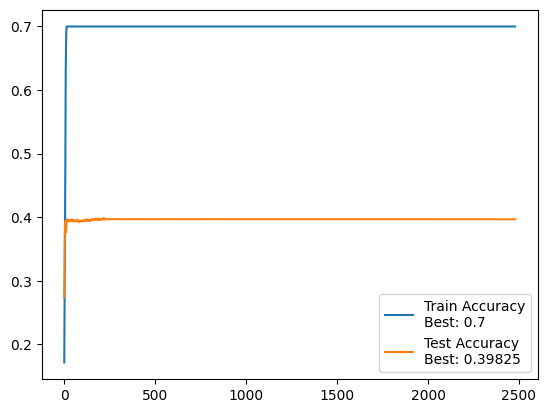

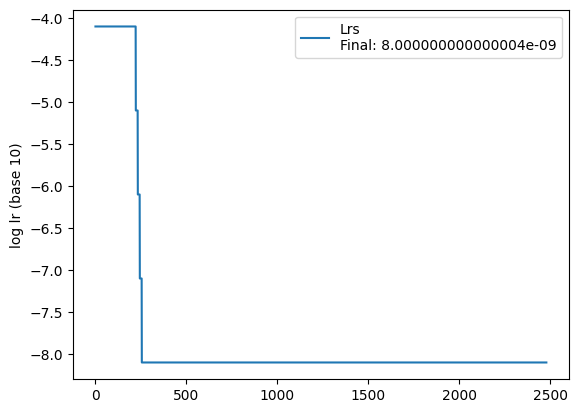


 =============== Epoch 2481 ===============


100%|██████████| 110/110 [00:03<00:00, 31.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.77it/s]


 Test accuracy: 39.7%, Avg loss: 6.784631

 =============== Epoch 2482 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.784637

 =============== Epoch 2483 ===============


100%|██████████| 110/110 [00:03<00:00, 31.68it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.784642

 =============== Epoch 2484 ===============


100%|██████████| 110/110 [00:03<00:00, 32.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.784648

 =============== Epoch 2485 ===============


100%|██████████| 110/110 [00:03<00:00, 31.44it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.77it/s]


 Test accuracy: 39.7%, Avg loss: 6.784653

 =============== Epoch 2486 ===============


100%|██████████| 110/110 [00:03<00:00, 31.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.66it/s]


 Test accuracy: 39.7%, Avg loss: 6.784659

 =============== Epoch 2487 ===============


100%|██████████| 110/110 [00:03<00:00, 31.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.784664

 =============== Epoch 2488 ===============


100%|██████████| 110/110 [00:03<00:00, 31.89it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.32it/s]


 Test accuracy: 39.7%, Avg loss: 6.784670

 =============== Epoch 2489 ===============


100%|██████████| 110/110 [00:03<00:00, 31.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.40it/s]


 Test accuracy: 39.7%, Avg loss: 6.784675

 =============== Epoch 2490 ===============


100%|██████████| 110/110 [00:03<00:00, 31.93it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.24it/s]


 Test accuracy: 39.7%, Avg loss: 6.784681


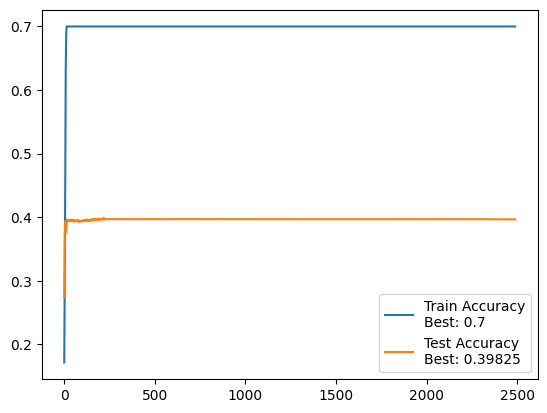

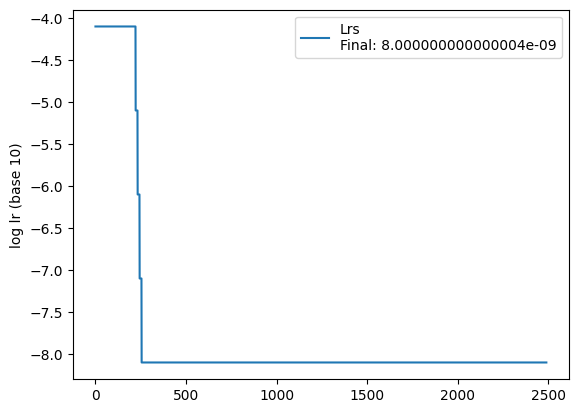


 =============== Epoch 2491 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.784687

 =============== Epoch 2492 ===============


100%|██████████| 110/110 [00:03<00:00, 31.72it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.26it/s]


 Test accuracy: 39.7%, Avg loss: 6.784692

 =============== Epoch 2493 ===============


100%|██████████| 110/110 [00:03<00:00, 31.93it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.51it/s]


 Test accuracy: 39.7%, Avg loss: 6.784698

 =============== Epoch 2494 ===============


100%|██████████| 110/110 [00:03<00:00, 31.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.784704

 =============== Epoch 2495 ===============


100%|██████████| 110/110 [00:03<00:00, 31.93it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.90it/s]


 Test accuracy: 39.7%, Avg loss: 6.784709

 =============== Epoch 2496 ===============


100%|██████████| 110/110 [00:03<00:00, 31.81it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.84it/s]


 Test accuracy: 39.7%, Avg loss: 6.784715

 =============== Epoch 2497 ===============


100%|██████████| 110/110 [00:03<00:00, 31.78it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.10it/s]


 Test accuracy: 39.7%, Avg loss: 6.784720

 =============== Epoch 2498 ===============


100%|██████████| 110/110 [00:03<00:00, 31.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.27it/s]


 Test accuracy: 39.7%, Avg loss: 6.784725

 =============== Epoch 2499 ===============


100%|██████████| 110/110 [00:03<00:00, 31.91it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.66it/s]


 Test accuracy: 39.7%, Avg loss: 6.784731

 =============== Epoch 2500 ===============


100%|██████████| 110/110 [00:03<00:00, 31.94it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.71it/s]


 Test accuracy: 39.7%, Avg loss: 6.784736


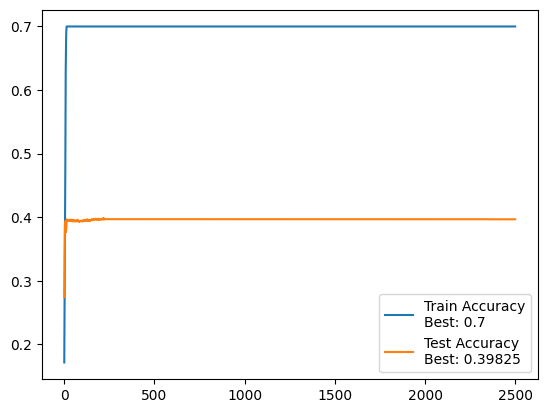

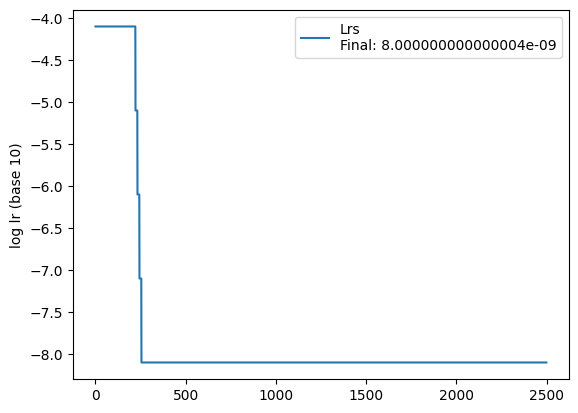


 =============== Epoch 2501 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 66.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.784742

 =============== Epoch 2502 ===============


100%|██████████| 110/110 [00:03<00:00, 31.91it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.17it/s]


 Test accuracy: 39.7%, Avg loss: 6.784747

 =============== Epoch 2503 ===============


100%|██████████| 110/110 [00:03<00:00, 31.75it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.784753

 =============== Epoch 2504 ===============


100%|██████████| 110/110 [00:03<00:00, 31.58it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.784759

 =============== Epoch 2505 ===============


100%|██████████| 110/110 [00:03<00:00, 31.27it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.89it/s]


 Test accuracy: 39.7%, Avg loss: 6.784764

 =============== Epoch 2506 ===============


100%|██████████| 110/110 [00:03<00:00, 31.48it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.23it/s]


 Test accuracy: 39.7%, Avg loss: 6.784770

 =============== Epoch 2507 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.93it/s]


 Test accuracy: 39.7%, Avg loss: 6.784775

 =============== Epoch 2508 ===============


100%|██████████| 110/110 [00:03<00:00, 31.09it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.784780

 =============== Epoch 2509 ===============


100%|██████████| 110/110 [00:03<00:00, 31.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.52it/s]


 Test accuracy: 39.7%, Avg loss: 6.784786

 =============== Epoch 2510 ===============


100%|██████████| 110/110 [00:03<00:00, 31.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.30it/s]


 Test accuracy: 39.7%, Avg loss: 6.784791


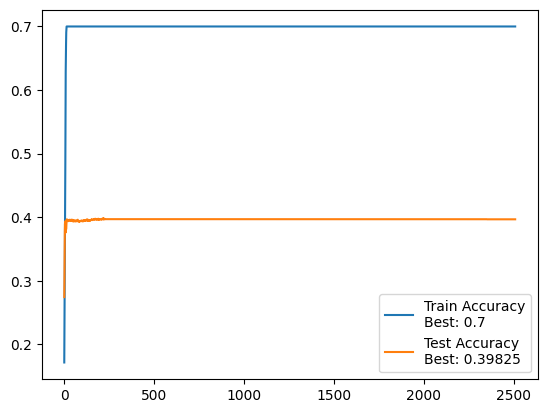

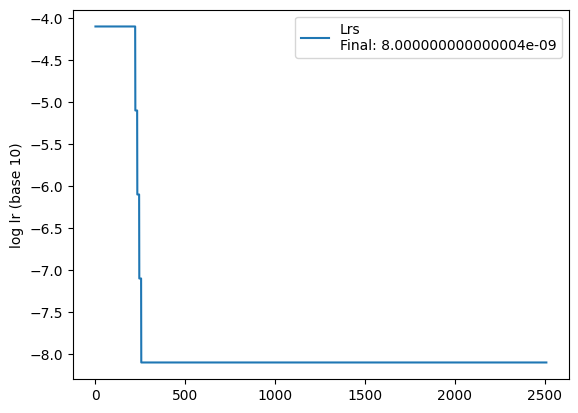


 =============== Epoch 2511 ===============


100%|██████████| 110/110 [00:03<00:00, 31.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.784797

 =============== Epoch 2512 ===============


100%|██████████| 110/110 [00:03<00:00, 31.35it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.23it/s]


 Test accuracy: 39.7%, Avg loss: 6.784802

 =============== Epoch 2513 ===============


100%|██████████| 110/110 [00:03<00:00, 30.93it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.784808

 =============== Epoch 2514 ===============


100%|██████████| 110/110 [00:03<00:00, 31.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.784813

 =============== Epoch 2515 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.78it/s]


 Test accuracy: 39.7%, Avg loss: 6.784818

 =============== Epoch 2516 ===============


100%|██████████| 110/110 [00:03<00:00, 31.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.784824

 =============== Epoch 2517 ===============


100%|██████████| 110/110 [00:03<00:00, 31.22it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.784829

 =============== Epoch 2518 ===============


100%|██████████| 110/110 [00:03<00:00, 31.31it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.784835

 =============== Epoch 2519 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.784840

 =============== Epoch 2520 ===============


100%|██████████| 110/110 [00:03<00:00, 30.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.16it/s]


 Test accuracy: 39.7%, Avg loss: 6.784845


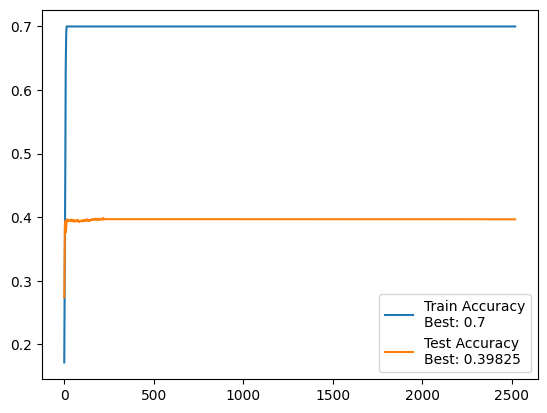

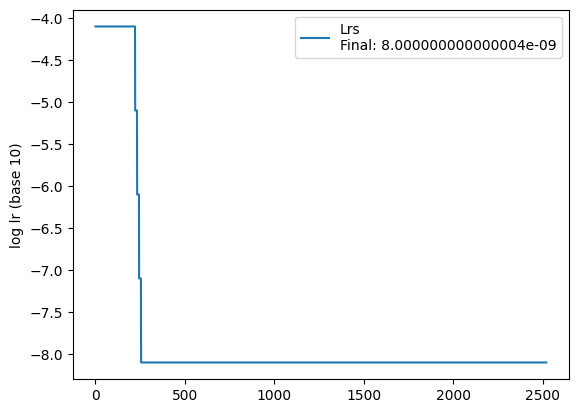


 =============== Epoch 2521 ===============


100%|██████████| 110/110 [00:03<00:00, 31.03it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.66it/s]


 Test accuracy: 39.7%, Avg loss: 6.784851

 =============== Epoch 2522 ===============


100%|██████████| 110/110 [00:03<00:00, 31.18it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.18it/s]


 Test accuracy: 39.7%, Avg loss: 6.784856

 =============== Epoch 2523 ===============


100%|██████████| 110/110 [00:03<00:00, 30.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.784862

 =============== Epoch 2524 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.26it/s]


 Test accuracy: 39.7%, Avg loss: 6.784867

 =============== Epoch 2525 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.784872

 =============== Epoch 2526 ===============


100%|██████████| 110/110 [00:03<00:00, 30.90it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.784878

 =============== Epoch 2527 ===============


100%|██████████| 110/110 [00:03<00:00, 31.07it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.52it/s]


 Test accuracy: 39.7%, Avg loss: 6.784883

 =============== Epoch 2528 ===============


100%|██████████| 110/110 [00:03<00:00, 31.15it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.784889

 =============== Epoch 2529 ===============


100%|██████████| 110/110 [00:03<00:00, 31.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.784894

 =============== Epoch 2530 ===============


100%|██████████| 110/110 [00:03<00:00, 31.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.37it/s]


 Test accuracy: 39.7%, Avg loss: 6.784900


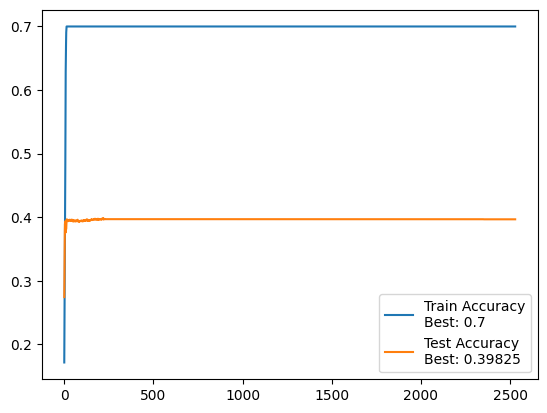

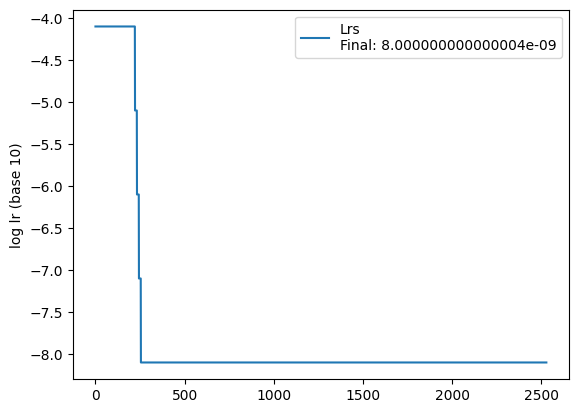


 =============== Epoch 2531 ===============


100%|██████████| 110/110 [00:03<00:00, 31.27it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.784905

 =============== Epoch 2532 ===============


100%|██████████| 110/110 [00:03<00:00, 31.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.784910

 =============== Epoch 2533 ===============


100%|██████████| 110/110 [00:03<00:00, 30.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.784916

 =============== Epoch 2534 ===============


100%|██████████| 110/110 [00:03<00:00, 30.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.08it/s]


 Test accuracy: 39.7%, Avg loss: 6.784921

 =============== Epoch 2535 ===============


100%|██████████| 110/110 [00:03<00:00, 31.37it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.33it/s]


 Test accuracy: 39.7%, Avg loss: 6.784926

 =============== Epoch 2536 ===============


100%|██████████| 110/110 [00:03<00:00, 31.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.21it/s]


 Test accuracy: 39.7%, Avg loss: 6.784933

 =============== Epoch 2537 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.31it/s]


 Test accuracy: 39.7%, Avg loss: 6.784938

 =============== Epoch 2538 ===============


100%|██████████| 110/110 [00:03<00:00, 31.03it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.14it/s]


 Test accuracy: 39.7%, Avg loss: 6.784943

 =============== Epoch 2539 ===============


100%|██████████| 110/110 [00:03<00:00, 31.33it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.06it/s]


 Test accuracy: 39.7%, Avg loss: 6.784949

 =============== Epoch 2540 ===============


100%|██████████| 110/110 [00:03<00:00, 29.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.784955


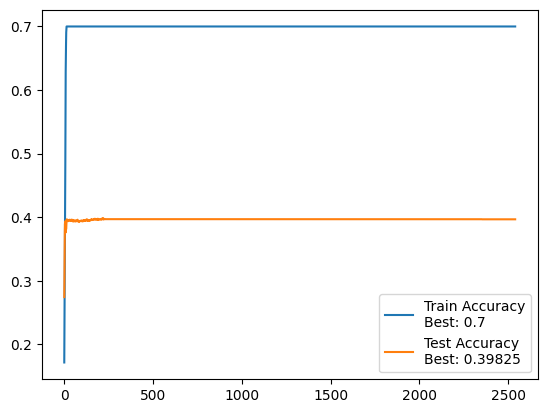

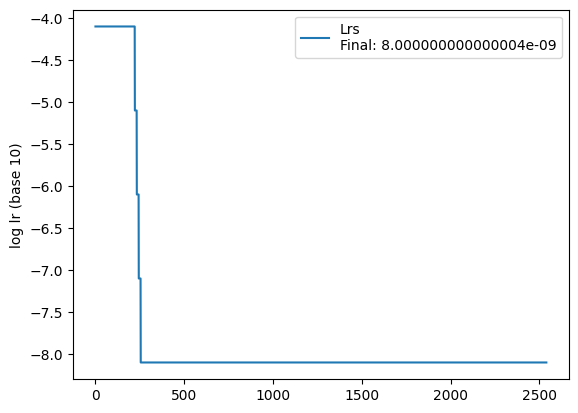


 =============== Epoch 2541 ===============


100%|██████████| 110/110 [00:03<00:00, 31.30it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.89it/s]


 Test accuracy: 39.7%, Avg loss: 6.784960

 =============== Epoch 2542 ===============


100%|██████████| 110/110 [00:03<00:00, 31.60it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.26it/s]


 Test accuracy: 39.7%, Avg loss: 6.784965

 =============== Epoch 2543 ===============


100%|██████████| 110/110 [00:03<00:00, 31.31it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.784970

 =============== Epoch 2544 ===============


100%|██████████| 110/110 [00:03<00:00, 31.44it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.25it/s]


 Test accuracy: 39.7%, Avg loss: 6.784976

 =============== Epoch 2545 ===============


100%|██████████| 110/110 [00:03<00:00, 31.60it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.98it/s]


 Test accuracy: 39.7%, Avg loss: 6.784981

 =============== Epoch 2546 ===============


100%|██████████| 110/110 [00:03<00:00, 31.38it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.784987

 =============== Epoch 2547 ===============


100%|██████████| 110/110 [00:03<00:00, 31.50it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.784992

 =============== Epoch 2548 ===============


100%|██████████| 110/110 [00:03<00:00, 31.40it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.784997

 =============== Epoch 2549 ===============


100%|██████████| 110/110 [00:03<00:00, 31.61it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.09it/s]


 Test accuracy: 39.7%, Avg loss: 6.785003

 =============== Epoch 2550 ===============


100%|██████████| 110/110 [00:03<00:00, 31.33it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.41it/s]


 Test accuracy: 39.7%, Avg loss: 6.785008


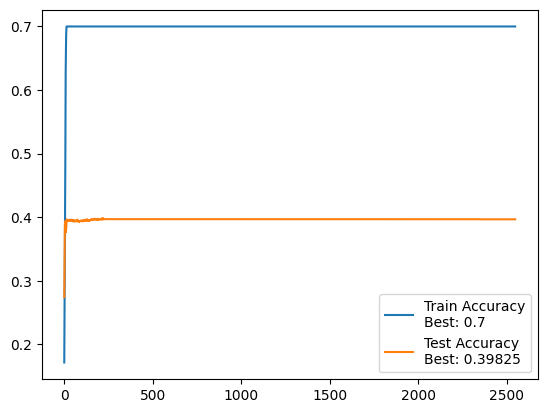

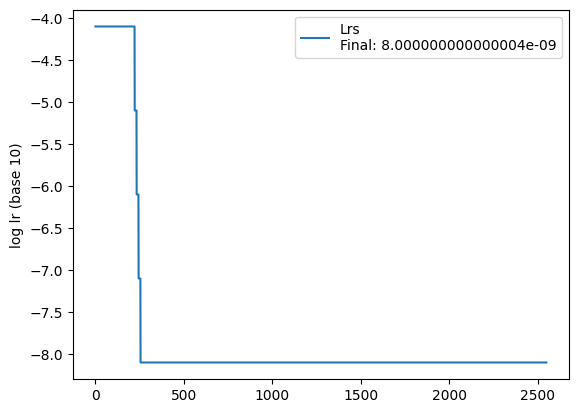


 =============== Epoch 2551 ===============


100%|██████████| 110/110 [00:03<00:00, 31.44it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.95it/s]


 Test accuracy: 39.7%, Avg loss: 6.785013

 =============== Epoch 2552 ===============


100%|██████████| 110/110 [00:03<00:00, 31.43it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.785018

 =============== Epoch 2553 ===============


100%|██████████| 110/110 [00:03<00:00, 31.47it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.785023

 =============== Epoch 2554 ===============


100%|██████████| 110/110 [00:03<00:00, 31.77it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.95it/s]


 Test accuracy: 39.7%, Avg loss: 6.785029

 =============== Epoch 2555 ===============


100%|██████████| 110/110 [00:03<00:00, 31.49it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.785034

 =============== Epoch 2556 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.60it/s]


 Test accuracy: 39.7%, Avg loss: 6.785040

 =============== Epoch 2557 ===============


100%|██████████| 110/110 [00:03<00:00, 31.51it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.14it/s]


 Test accuracy: 39.7%, Avg loss: 6.785046

 =============== Epoch 2558 ===============


100%|██████████| 110/110 [00:03<00:00, 31.37it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.785051

 =============== Epoch 2559 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.785056

 =============== Epoch 2560 ===============


100%|██████████| 110/110 [00:03<00:00, 31.34it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.785061


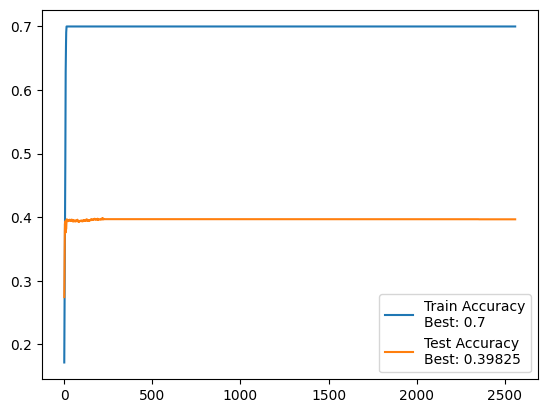

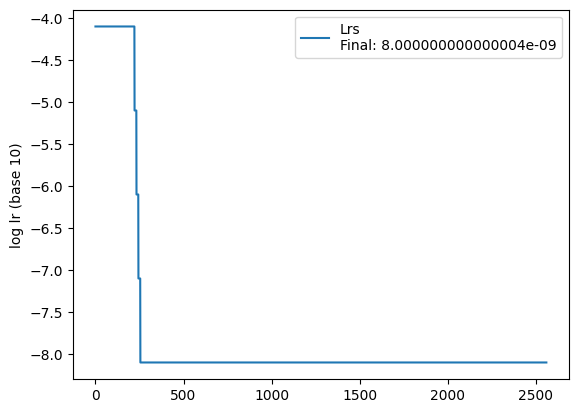


 =============== Epoch 2561 ===============


100%|██████████| 110/110 [00:03<00:00, 31.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.44it/s]


 Test accuracy: 39.7%, Avg loss: 6.785067

 =============== Epoch 2562 ===============


100%|██████████| 110/110 [00:03<00:00, 30.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.28it/s]


 Test accuracy: 39.7%, Avg loss: 6.785072

 =============== Epoch 2563 ===============


100%|██████████| 110/110 [00:03<00:00, 31.26it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.40it/s]


 Test accuracy: 39.7%, Avg loss: 6.785078

 =============== Epoch 2564 ===============


100%|██████████| 110/110 [00:03<00:00, 31.37it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.785083

 =============== Epoch 2565 ===============


100%|██████████| 110/110 [00:03<00:00, 30.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.37it/s]


 Test accuracy: 39.7%, Avg loss: 6.785089

 =============== Epoch 2566 ===============


100%|██████████| 110/110 [00:03<00:00, 31.28it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.785094

 =============== Epoch 2567 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.37it/s]


 Test accuracy: 39.7%, Avg loss: 6.785099

 =============== Epoch 2568 ===============


100%|██████████| 110/110 [00:03<00:00, 30.62it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.785105

 =============== Epoch 2569 ===============


100%|██████████| 110/110 [00:03<00:00, 31.18it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.91it/s]


 Test accuracy: 39.7%, Avg loss: 6.785111

 =============== Epoch 2570 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.26it/s]


 Test accuracy: 39.7%, Avg loss: 6.785116


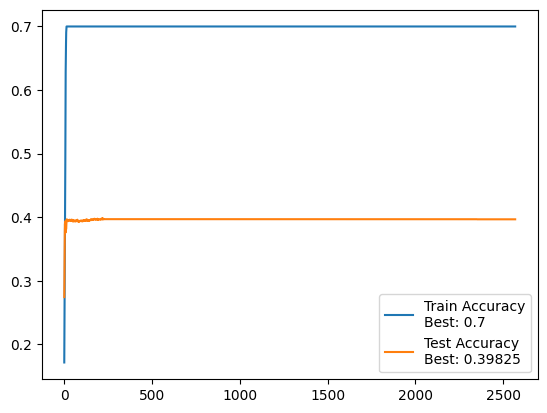

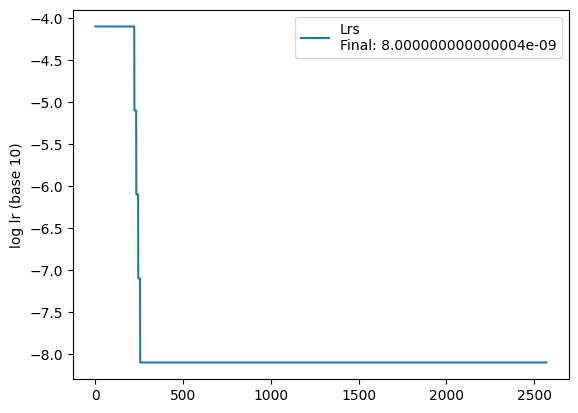


 =============== Epoch 2571 ===============


100%|██████████| 110/110 [00:03<00:00, 30.78it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.66it/s]


 Test accuracy: 39.7%, Avg loss: 6.785121

 =============== Epoch 2572 ===============


100%|██████████| 110/110 [00:03<00:00, 31.03it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.16it/s]


 Test accuracy: 39.7%, Avg loss: 6.785127

 =============== Epoch 2573 ===============


100%|██████████| 110/110 [00:03<00:00, 31.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.785132

 =============== Epoch 2574 ===============


100%|██████████| 110/110 [00:03<00:00, 30.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.21it/s]


 Test accuracy: 39.7%, Avg loss: 6.785137

 =============== Epoch 2575 ===============


100%|██████████| 110/110 [00:03<00:00, 31.24it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.77it/s]


 Test accuracy: 39.7%, Avg loss: 6.785143

 =============== Epoch 2576 ===============


100%|██████████| 110/110 [00:03<00:00, 31.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.785148

 =============== Epoch 2577 ===============


100%|██████████| 110/110 [00:03<00:00, 30.73it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.37it/s]


 Test accuracy: 39.7%, Avg loss: 6.785154

 =============== Epoch 2578 ===============


100%|██████████| 110/110 [00:03<00:00, 31.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.26it/s]


 Test accuracy: 39.7%, Avg loss: 6.785159

 =============== Epoch 2579 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.88it/s]


 Test accuracy: 39.7%, Avg loss: 6.785164

 =============== Epoch 2580 ===============


100%|██████████| 110/110 [00:03<00:00, 30.75it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.04it/s]


 Test accuracy: 39.7%, Avg loss: 6.785170


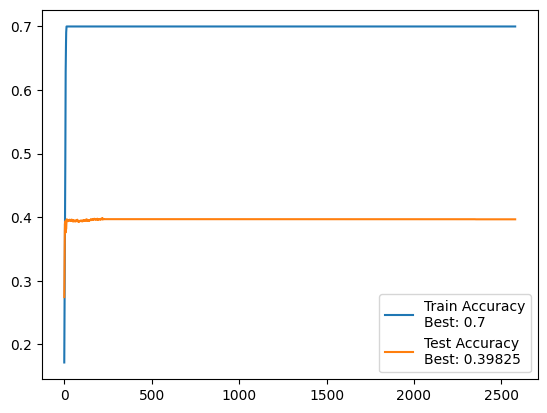

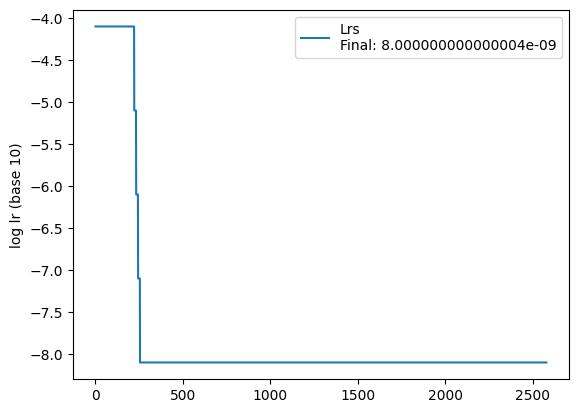


 =============== Epoch 2581 ===============


100%|██████████| 110/110 [00:03<00:00, 30.67it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.89it/s]


 Test accuracy: 39.7%, Avg loss: 6.785175

 =============== Epoch 2582 ===============


100%|██████████| 110/110 [00:03<00:00, 30.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.785180

 =============== Epoch 2583 ===============


100%|██████████| 110/110 [00:03<00:00, 30.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.785186

 =============== Epoch 2584 ===============


100%|██████████| 110/110 [00:03<00:00, 30.48it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.785191

 =============== Epoch 2585 ===============


100%|██████████| 110/110 [00:03<00:00, 31.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.10it/s]


 Test accuracy: 39.7%, Avg loss: 6.785197

 =============== Epoch 2586 ===============


100%|██████████| 110/110 [00:03<00:00, 31.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.87it/s]


 Test accuracy: 39.7%, Avg loss: 6.785202

 =============== Epoch 2587 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.785208

 =============== Epoch 2588 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.785213

 =============== Epoch 2589 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.785219

 =============== Epoch 2590 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.785224


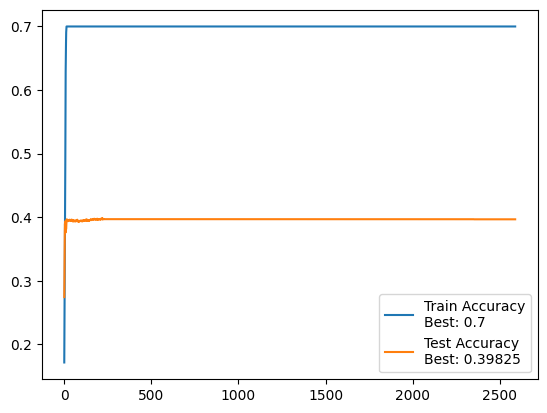

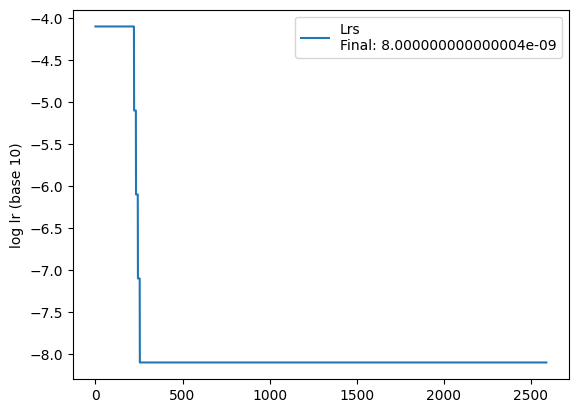


 =============== Epoch 2591 ===============


100%|██████████| 110/110 [00:03<00:00, 31.26it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.785229

 =============== Epoch 2592 ===============


100%|██████████| 110/110 [00:03<00:00, 30.67it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.81it/s]


 Test accuracy: 39.7%, Avg loss: 6.785235

 =============== Epoch 2593 ===============


100%|██████████| 110/110 [00:03<00:00, 30.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.21it/s]


 Test accuracy: 39.7%, Avg loss: 6.785240

 =============== Epoch 2594 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.29it/s]


 Test accuracy: 39.7%, Avg loss: 6.785245

 =============== Epoch 2595 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.97it/s]


 Test accuracy: 39.7%, Avg loss: 6.785250

 =============== Epoch 2596 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.99it/s]


 Test accuracy: 39.7%, Avg loss: 6.785256

 =============== Epoch 2597 ===============


100%|██████████| 110/110 [00:03<00:00, 31.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.785261

 =============== Epoch 2598 ===============


100%|██████████| 110/110 [00:03<00:00, 31.17it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.785267

 =============== Epoch 2599 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.99it/s]


 Test accuracy: 39.7%, Avg loss: 6.785272

 =============== Epoch 2600 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.97it/s]


 Test accuracy: 39.7%, Avg loss: 6.785277


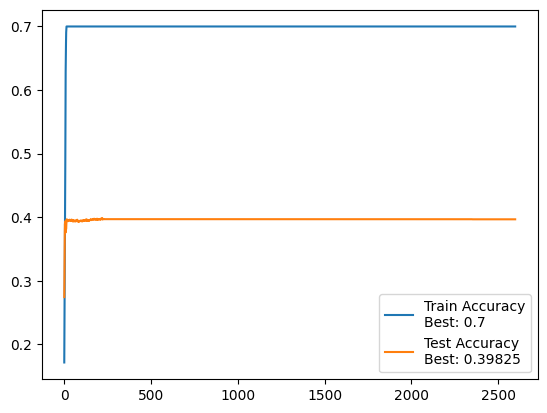

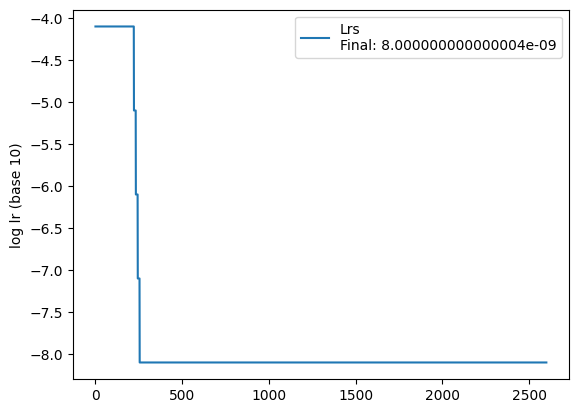


 =============== Epoch 2601 ===============


100%|██████████| 110/110 [00:03<00:00, 31.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.96it/s]


 Test accuracy: 39.7%, Avg loss: 6.785283

 =============== Epoch 2602 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.785288

 =============== Epoch 2603 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.785294

 =============== Epoch 2604 ===============


100%|██████████| 110/110 [00:03<00:00, 30.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.32it/s]


 Test accuracy: 39.7%, Avg loss: 6.785299

 =============== Epoch 2605 ===============


100%|██████████| 110/110 [00:03<00:00, 30.95it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.785304

 =============== Epoch 2606 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.785310

 =============== Epoch 2607 ===============


100%|██████████| 110/110 [00:03<00:00, 30.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.785315

 =============== Epoch 2608 ===============


100%|██████████| 110/110 [00:03<00:00, 31.18it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.785320

 =============== Epoch 2609 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.785326

 =============== Epoch 2610 ===============


100%|██████████| 110/110 [00:03<00:00, 30.73it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.29it/s]


 Test accuracy: 39.7%, Avg loss: 6.785332


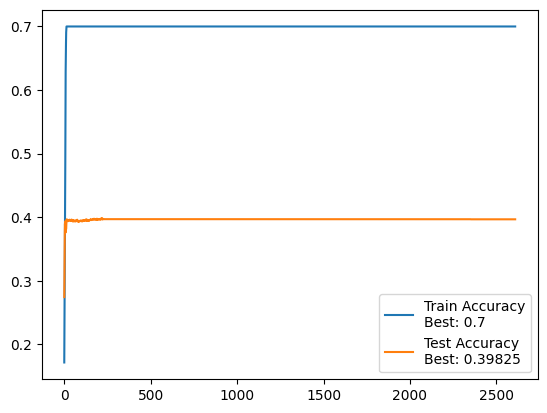

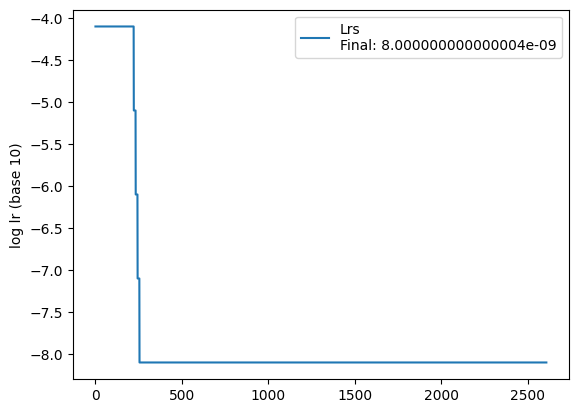


 =============== Epoch 2611 ===============


100%|██████████| 110/110 [00:03<00:00, 31.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.785337

 =============== Epoch 2612 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.29it/s]


 Test accuracy: 39.7%, Avg loss: 6.785342

 =============== Epoch 2613 ===============


100%|██████████| 110/110 [00:03<00:00, 30.61it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.785347

 =============== Epoch 2614 ===============


100%|██████████| 110/110 [00:03<00:00, 31.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.78it/s]


 Test accuracy: 39.7%, Avg loss: 6.785352

 =============== Epoch 2615 ===============


100%|██████████| 110/110 [00:03<00:00, 31.15it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.97it/s]


 Test accuracy: 39.7%, Avg loss: 6.785358

 =============== Epoch 2616 ===============


100%|██████████| 110/110 [00:03<00:00, 30.64it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.92it/s]


 Test accuracy: 39.7%, Avg loss: 6.785363

 =============== Epoch 2617 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.38it/s]


 Test accuracy: 39.7%, Avg loss: 6.785368

 =============== Epoch 2618 ===============


100%|██████████| 110/110 [00:03<00:00, 31.28it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.785374

 =============== Epoch 2619 ===============


100%|██████████| 110/110 [00:03<00:00, 30.68it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.785379

 =============== Epoch 2620 ===============


100%|██████████| 110/110 [00:03<00:00, 31.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.97it/s]


 Test accuracy: 39.7%, Avg loss: 6.785385


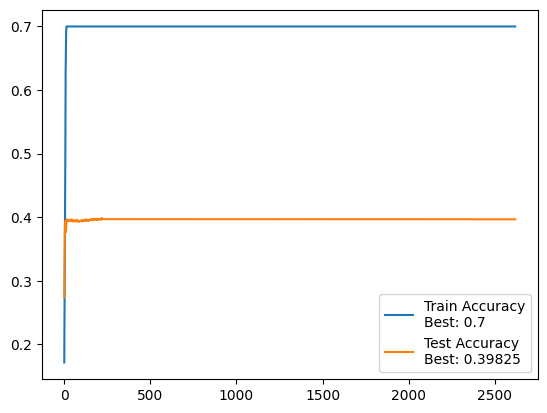

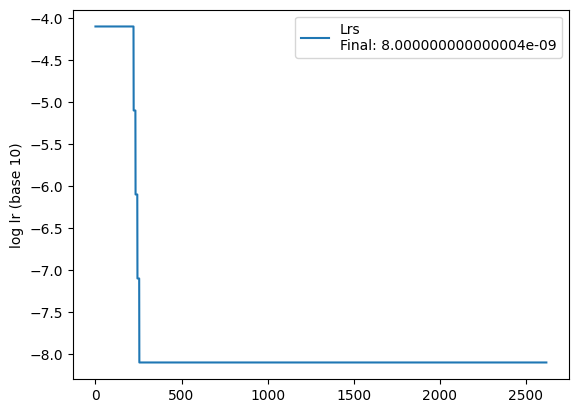


 =============== Epoch 2621 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.785390

 =============== Epoch 2622 ===============


100%|██████████| 110/110 [00:03<00:00, 30.66it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.785395

 =============== Epoch 2623 ===============


100%|██████████| 110/110 [00:03<00:00, 31.09it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.77it/s]


 Test accuracy: 39.7%, Avg loss: 6.785400

 =============== Epoch 2624 ===============


100%|██████████| 110/110 [00:03<00:00, 31.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.785405

 =============== Epoch 2625 ===============


100%|██████████| 110/110 [00:03<00:00, 30.75it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.785411

 =============== Epoch 2626 ===============


100%|██████████| 110/110 [00:03<00:00, 31.30it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.72it/s]


 Test accuracy: 39.7%, Avg loss: 6.785416

 =============== Epoch 2627 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.92it/s]


 Test accuracy: 39.7%, Avg loss: 6.785421

 =============== Epoch 2628 ===============


100%|██████████| 110/110 [00:03<00:00, 30.56it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.18it/s]


 Test accuracy: 39.7%, Avg loss: 6.785426

 =============== Epoch 2629 ===============


100%|██████████| 110/110 [00:03<00:00, 31.11it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.785432

 =============== Epoch 2630 ===============


100%|██████████| 110/110 [00:03<00:00, 30.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.785437


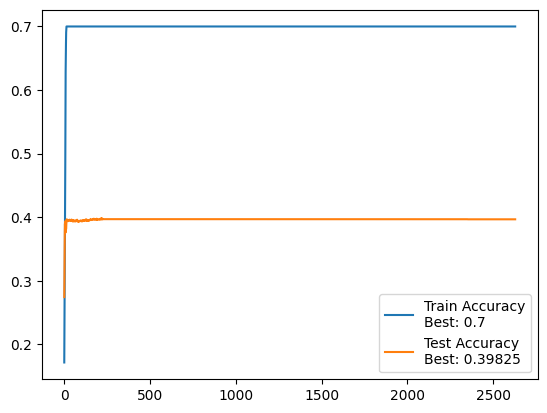

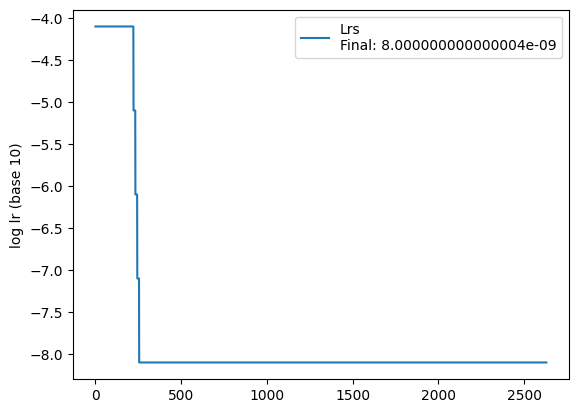


 =============== Epoch 2631 ===============


100%|██████████| 110/110 [00:03<00:00, 30.73it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.04it/s]


 Test accuracy: 39.7%, Avg loss: 6.785442

 =============== Epoch 2632 ===============


100%|██████████| 110/110 [00:03<00:00, 31.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.29it/s]


 Test accuracy: 39.7%, Avg loss: 6.785447

 =============== Epoch 2633 ===============


100%|██████████| 110/110 [00:03<00:00, 31.30it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.785453

 =============== Epoch 2634 ===============


100%|██████████| 110/110 [00:03<00:00, 30.90it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.785458

 =============== Epoch 2635 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.785463

 =============== Epoch 2636 ===============


100%|██████████| 110/110 [00:03<00:00, 31.09it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.785469

 =============== Epoch 2637 ===============


100%|██████████| 110/110 [00:03<00:00, 30.25it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.785474

 =============== Epoch 2638 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.88it/s]


 Test accuracy: 39.7%, Avg loss: 6.785479

 =============== Epoch 2639 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.91it/s]


 Test accuracy: 39.7%, Avg loss: 6.785485

 =============== Epoch 2640 ===============


100%|██████████| 110/110 [00:03<00:00, 30.66it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.11it/s]


 Test accuracy: 39.7%, Avg loss: 6.785490


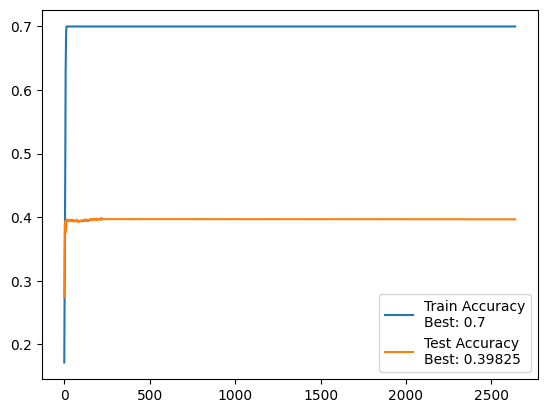

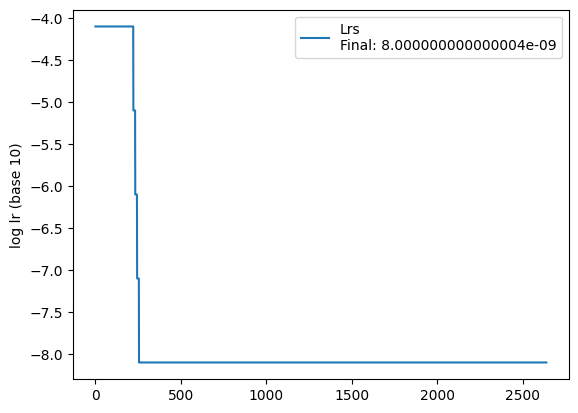


 =============== Epoch 2641 ===============


100%|██████████| 110/110 [00:03<00:00, 31.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.34it/s]


 Test accuracy: 39.7%, Avg loss: 6.785496

 =============== Epoch 2642 ===============


100%|██████████| 110/110 [00:03<00:00, 31.15it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.73it/s]


 Test accuracy: 39.7%, Avg loss: 6.785501

 =============== Epoch 2643 ===============


100%|██████████| 110/110 [00:03<00:00, 31.15it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.83it/s]


 Test accuracy: 39.7%, Avg loss: 6.785506

 =============== Epoch 2644 ===============


100%|██████████| 110/110 [00:03<00:00, 31.18it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.785511

 =============== Epoch 2645 ===============


100%|██████████| 110/110 [00:03<00:00, 31.26it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.93it/s]


 Test accuracy: 39.7%, Avg loss: 6.785516

 =============== Epoch 2646 ===============


100%|██████████| 110/110 [00:03<00:00, 31.27it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.96it/s]


 Test accuracy: 39.7%, Avg loss: 6.785522

 =============== Epoch 2647 ===============


100%|██████████| 110/110 [00:03<00:00, 30.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.89it/s]


 Test accuracy: 39.7%, Avg loss: 6.785527

 =============== Epoch 2648 ===============


100%|██████████| 110/110 [00:03<00:00, 31.28it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.785532

 =============== Epoch 2649 ===============


100%|██████████| 110/110 [00:03<00:00, 31.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.04it/s]


 Test accuracy: 39.7%, Avg loss: 6.785537

 =============== Epoch 2650 ===============


100%|██████████| 110/110 [00:03<00:00, 31.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.08it/s]


 Test accuracy: 39.7%, Avg loss: 6.785542


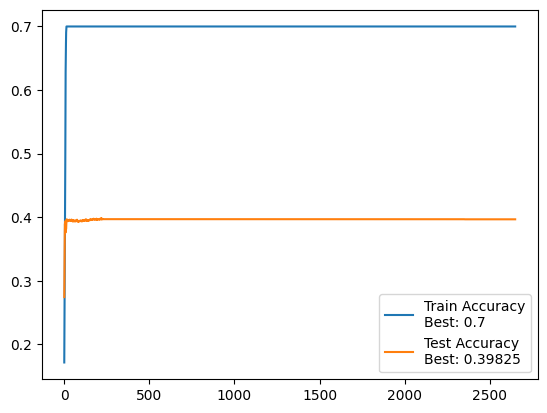

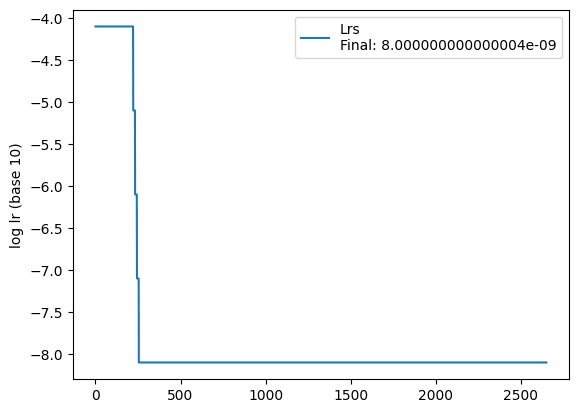


 =============== Epoch 2651 ===============


100%|██████████| 110/110 [00:03<00:00, 31.24it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.785548

 =============== Epoch 2652 ===============


100%|██████████| 110/110 [00:03<00:00, 31.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.18it/s]


 Test accuracy: 39.7%, Avg loss: 6.785553

 =============== Epoch 2653 ===============


100%|██████████| 110/110 [00:03<00:00, 31.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.785558

 =============== Epoch 2654 ===============


100%|██████████| 110/110 [00:03<00:00, 30.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.99it/s]


 Test accuracy: 39.7%, Avg loss: 6.785564

 =============== Epoch 2655 ===============


100%|██████████| 110/110 [00:03<00:00, 31.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.89it/s]


 Test accuracy: 39.7%, Avg loss: 6.785568

 =============== Epoch 2656 ===============


100%|██████████| 110/110 [00:03<00:00, 31.15it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.785573

 =============== Epoch 2657 ===============


100%|██████████| 110/110 [00:03<00:00, 30.49it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.26it/s]


 Test accuracy: 39.7%, Avg loss: 6.785578

 =============== Epoch 2658 ===============


100%|██████████| 110/110 [00:03<00:00, 31.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.785583

 =============== Epoch 2659 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.785589

 =============== Epoch 2660 ===============


100%|██████████| 110/110 [00:03<00:00, 30.67it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.785594


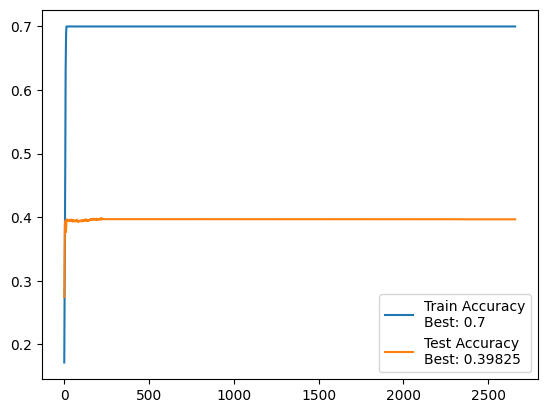

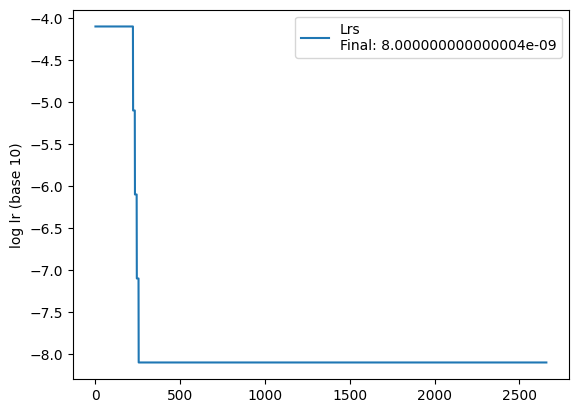


 =============== Epoch 2661 ===============


100%|██████████| 110/110 [00:03<00:00, 31.35it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.24it/s]


 Test accuracy: 39.7%, Avg loss: 6.785599

 =============== Epoch 2662 ===============


100%|██████████| 110/110 [00:03<00:00, 31.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.785604

 =============== Epoch 2663 ===============


100%|██████████| 110/110 [00:03<00:00, 30.62it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.28it/s]


 Test accuracy: 39.7%, Avg loss: 6.785609

 =============== Epoch 2664 ===============


100%|██████████| 110/110 [00:03<00:00, 31.07it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.785614

 =============== Epoch 2665 ===============


100%|██████████| 110/110 [00:03<00:00, 31.28it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.16it/s]


 Test accuracy: 39.7%, Avg loss: 6.785619

 =============== Epoch 2666 ===============


100%|██████████| 110/110 [00:03<00:00, 30.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.91it/s]


 Test accuracy: 39.7%, Avg loss: 6.785625

 =============== Epoch 2667 ===============


100%|██████████| 110/110 [00:03<00:00, 31.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.92it/s]


 Test accuracy: 39.7%, Avg loss: 6.785630

 =============== Epoch 2668 ===============


100%|██████████| 110/110 [00:03<00:00, 31.15it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.85it/s]


 Test accuracy: 39.7%, Avg loss: 6.785635

 =============== Epoch 2669 ===============


100%|██████████| 110/110 [00:03<00:00, 30.63it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.32it/s]


 Test accuracy: 39.7%, Avg loss: 6.785640

 =============== Epoch 2670 ===============


100%|██████████| 110/110 [00:03<00:00, 31.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.785645


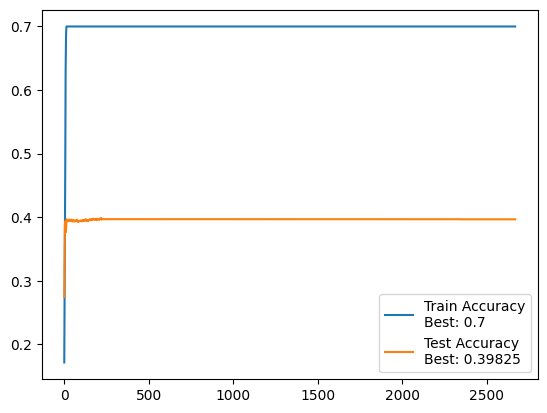

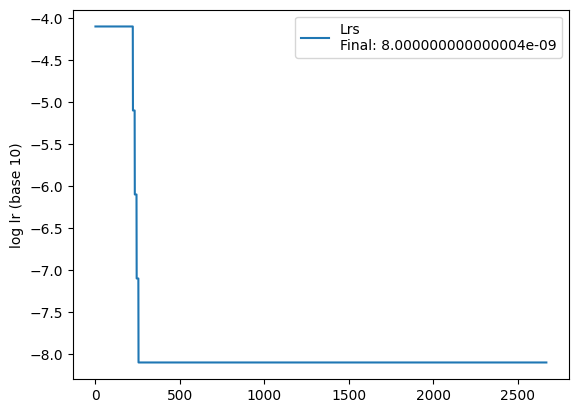


 =============== Epoch 2671 ===============


100%|██████████| 110/110 [00:03<00:00, 31.17it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.18it/s]


 Test accuracy: 39.7%, Avg loss: 6.785650

 =============== Epoch 2672 ===============


100%|██████████| 110/110 [00:03<00:00, 30.42it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.08it/s]


 Test accuracy: 39.7%, Avg loss: 6.785655

 =============== Epoch 2673 ===============


100%|██████████| 110/110 [00:03<00:00, 31.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.785660

 =============== Epoch 2674 ===============


100%|██████████| 110/110 [00:03<00:00, 31.25it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.785666

 =============== Epoch 2675 ===============


100%|██████████| 110/110 [00:03<00:00, 30.58it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.29it/s]


 Test accuracy: 39.7%, Avg loss: 6.785671

 =============== Epoch 2676 ===============


100%|██████████| 110/110 [00:03<00:00, 31.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.16it/s]


 Test accuracy: 39.7%, Avg loss: 6.785676

 =============== Epoch 2677 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.785681

 =============== Epoch 2678 ===============


100%|██████████| 110/110 [00:03<00:00, 31.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.99it/s]


 Test accuracy: 39.7%, Avg loss: 6.785686

 =============== Epoch 2679 ===============


100%|██████████| 110/110 [00:03<00:00, 31.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.44it/s]


 Test accuracy: 39.7%, Avg loss: 6.785691

 =============== Epoch 2680 ===============


100%|██████████| 110/110 [00:03<00:00, 31.15it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.52it/s]


 Test accuracy: 39.7%, Avg loss: 6.785696


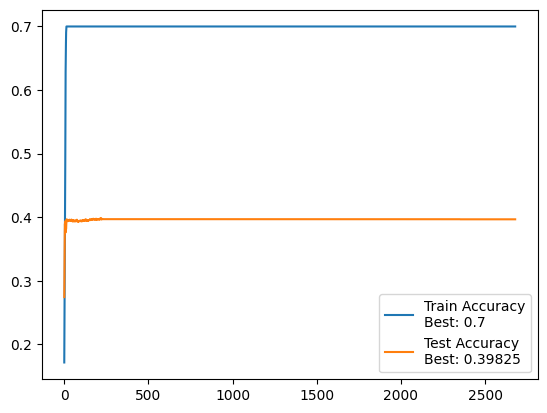

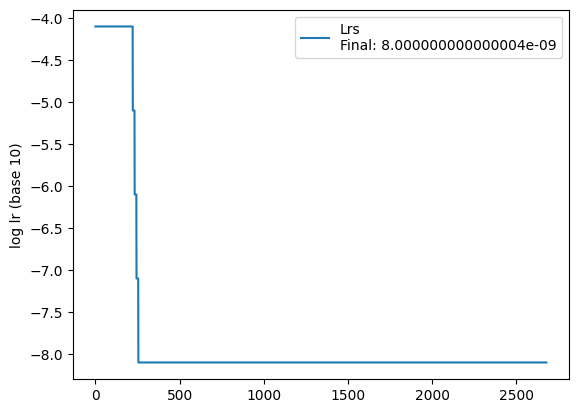


 =============== Epoch 2681 ===============


100%|██████████| 110/110 [00:03<00:00, 31.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.41it/s]


 Test accuracy: 39.7%, Avg loss: 6.785701

 =============== Epoch 2682 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.785706

 =============== Epoch 2683 ===============


100%|██████████| 110/110 [00:03<00:00, 30.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.785711

 =============== Epoch 2684 ===============


100%|██████████| 110/110 [00:03<00:00, 31.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.785716

 =============== Epoch 2685 ===============


100%|██████████| 110/110 [00:03<00:00, 31.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.24it/s]


 Test accuracy: 39.7%, Avg loss: 6.785722

 =============== Epoch 2686 ===============


100%|██████████| 110/110 [00:03<00:00, 30.78it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.89it/s]


 Test accuracy: 39.7%, Avg loss: 6.785727

 =============== Epoch 2687 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.76it/s]


 Test accuracy: 39.7%, Avg loss: 6.785732

 =============== Epoch 2688 ===============


100%|██████████| 110/110 [00:03<00:00, 31.22it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.04it/s]


 Test accuracy: 39.7%, Avg loss: 6.785737

 =============== Epoch 2689 ===============


100%|██████████| 110/110 [00:03<00:00, 30.67it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.785742

 =============== Epoch 2690 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.99it/s]


 Test accuracy: 39.7%, Avg loss: 6.785747


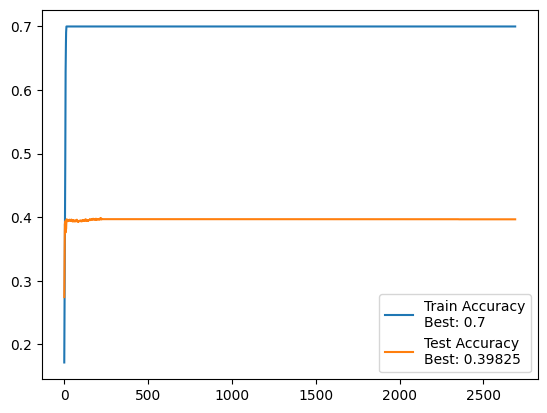

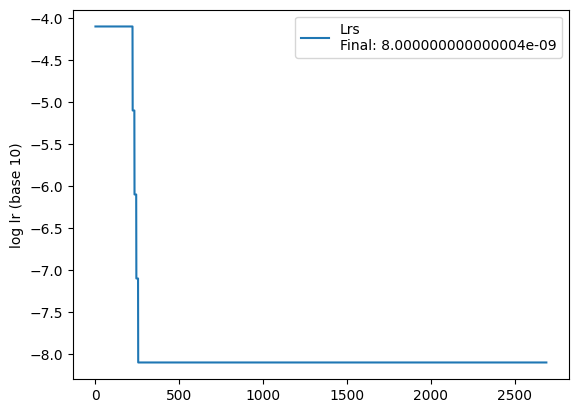


 =============== Epoch 2691 ===============


100%|██████████| 110/110 [00:03<00:00, 31.25it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.785753

 =============== Epoch 2692 ===============


100%|██████████| 110/110 [00:03<00:00, 30.24it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.88it/s]


 Test accuracy: 39.7%, Avg loss: 6.785758

 =============== Epoch 2693 ===============


100%|██████████| 110/110 [00:03<00:00, 31.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.25it/s]


 Test accuracy: 39.7%, Avg loss: 6.785763

 =============== Epoch 2694 ===============


100%|██████████| 110/110 [00:03<00:00, 31.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.785768

 =============== Epoch 2695 ===============


100%|██████████| 110/110 [00:03<00:00, 30.62it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.10it/s]


 Test accuracy: 39.7%, Avg loss: 6.785773

 =============== Epoch 2696 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.19it/s]


 Test accuracy: 39.7%, Avg loss: 6.785778

 =============== Epoch 2697 ===============


100%|██████████| 110/110 [00:03<00:00, 31.25it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.785783

 =============== Epoch 2698 ===============


100%|██████████| 110/110 [00:03<00:00, 30.49it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.24it/s]


 Test accuracy: 39.7%, Avg loss: 6.785788

 =============== Epoch 2699 ===============


100%|██████████| 110/110 [00:03<00:00, 31.15it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.785793

 =============== Epoch 2700 ===============


100%|██████████| 110/110 [00:03<00:00, 30.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.785798


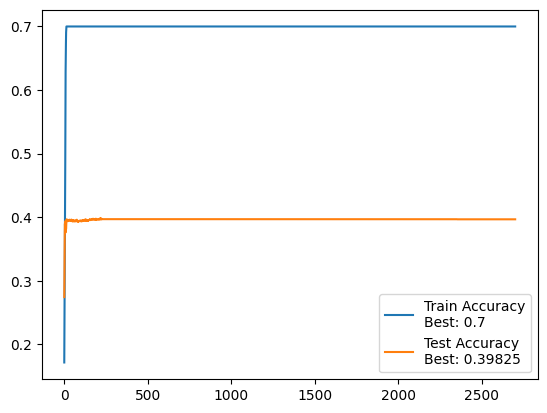

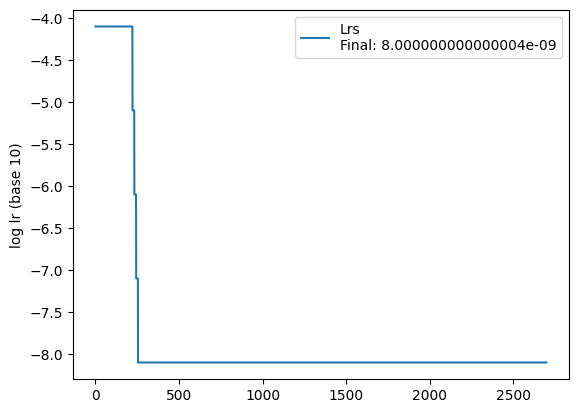


 =============== Epoch 2701 ===============


100%|██████████| 110/110 [00:03<00:00, 30.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.10it/s]


 Test accuracy: 39.7%, Avg loss: 6.785803

 =============== Epoch 2702 ===============


100%|██████████| 110/110 [00:03<00:00, 31.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.785808

 =============== Epoch 2703 ===============


100%|██████████| 110/110 [00:03<00:00, 31.09it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.785813

 =============== Epoch 2704 ===============


100%|██████████| 110/110 [00:03<00:00, 30.67it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.96it/s]


 Test accuracy: 39.7%, Avg loss: 6.785818

 =============== Epoch 2705 ===============


100%|██████████| 110/110 [00:03<00:00, 30.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.73it/s]


 Test accuracy: 39.7%, Avg loss: 6.785824

 =============== Epoch 2706 ===============


100%|██████████| 110/110 [00:03<00:00, 31.15it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.785828

 =============== Epoch 2707 ===============


100%|██████████| 110/110 [00:03<00:00, 30.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.44it/s]


 Test accuracy: 39.7%, Avg loss: 6.785834

 =============== Epoch 2708 ===============


100%|██████████| 110/110 [00:03<00:00, 31.11it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.37it/s]


 Test accuracy: 39.7%, Avg loss: 6.785839

 =============== Epoch 2709 ===============


100%|██████████| 110/110 [00:03<00:00, 31.22it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.21it/s]


 Test accuracy: 39.7%, Avg loss: 6.785844

 =============== Epoch 2710 ===============


100%|██████████| 110/110 [00:03<00:00, 30.78it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.785849


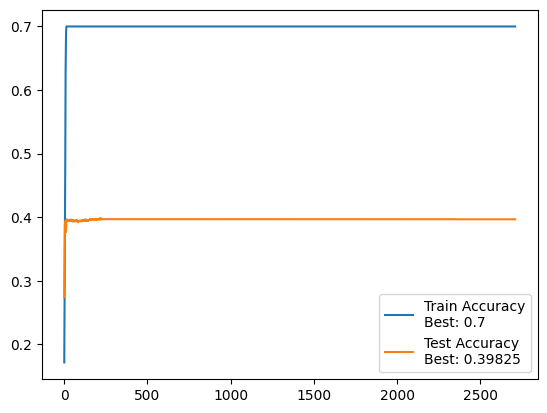

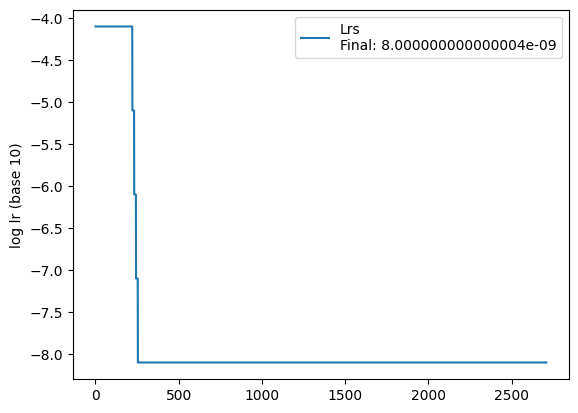


 =============== Epoch 2711 ===============


100%|██████████| 110/110 [00:03<00:00, 31.18it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.785854

 =============== Epoch 2712 ===============


100%|██████████| 110/110 [00:03<00:00, 30.34it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.43it/s]


 Test accuracy: 39.7%, Avg loss: 6.785860

 =============== Epoch 2713 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.83it/s]


 Test accuracy: 39.7%, Avg loss: 6.785864

 =============== Epoch 2714 ===============


100%|██████████| 110/110 [00:03<00:00, 31.07it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.34it/s]


 Test accuracy: 39.7%, Avg loss: 6.785869

 =============== Epoch 2715 ===============


100%|██████████| 110/110 [00:03<00:00, 30.49it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.78it/s]


 Test accuracy: 39.7%, Avg loss: 6.785875

 =============== Epoch 2716 ===============


100%|██████████| 110/110 [00:03<00:00, 31.38it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.77it/s]


 Test accuracy: 39.7%, Avg loss: 6.785879

 =============== Epoch 2717 ===============


100%|██████████| 110/110 [00:03<00:00, 31.31it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.78it/s]


 Test accuracy: 39.7%, Avg loss: 6.785885

 =============== Epoch 2718 ===============


100%|██████████| 110/110 [00:03<00:00, 30.79it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.785890

 =============== Epoch 2719 ===============


100%|██████████| 110/110 [00:03<00:00, 31.37it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.81it/s]


 Test accuracy: 39.7%, Avg loss: 6.785894

 =============== Epoch 2720 ===============


100%|██████████| 110/110 [00:03<00:00, 31.36it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.29it/s]


 Test accuracy: 39.7%, Avg loss: 6.785900


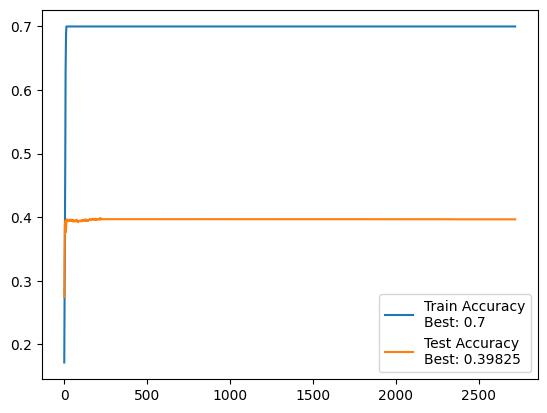

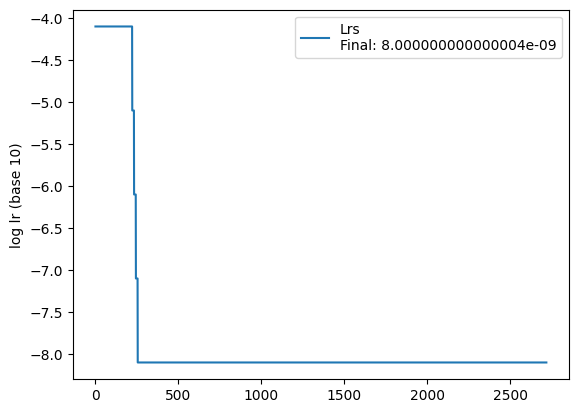


 =============== Epoch 2721 ===============


100%|██████████| 110/110 [00:03<00:00, 30.58it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.98it/s]


 Test accuracy: 39.7%, Avg loss: 6.785905

 =============== Epoch 2722 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.785910

 =============== Epoch 2723 ===============


100%|██████████| 110/110 [00:03<00:00, 30.98it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.30it/s]


 Test accuracy: 39.7%, Avg loss: 6.785915

 =============== Epoch 2724 ===============


100%|██████████| 110/110 [00:03<00:00, 31.31it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.785920

 =============== Epoch 2725 ===============


100%|██████████| 110/110 [00:03<00:00, 31.24it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.45it/s]


 Test accuracy: 39.7%, Avg loss: 6.785925

 =============== Epoch 2726 ===============


100%|██████████| 110/110 [00:03<00:00, 31.02it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.47it/s]


 Test accuracy: 39.7%, Avg loss: 6.785930

 =============== Epoch 2727 ===============


100%|██████████| 110/110 [00:03<00:00, 31.22it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.83it/s]


 Test accuracy: 39.7%, Avg loss: 6.785935

 =============== Epoch 2728 ===============


100%|██████████| 110/110 [00:03<00:00, 31.27it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.785940

 =============== Epoch 2729 ===============


100%|██████████| 110/110 [00:03<00:00, 30.71it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.08it/s]


 Test accuracy: 39.7%, Avg loss: 6.785946

 =============== Epoch 2730 ===============


100%|██████████| 110/110 [00:03<00:00, 31.25it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.785951


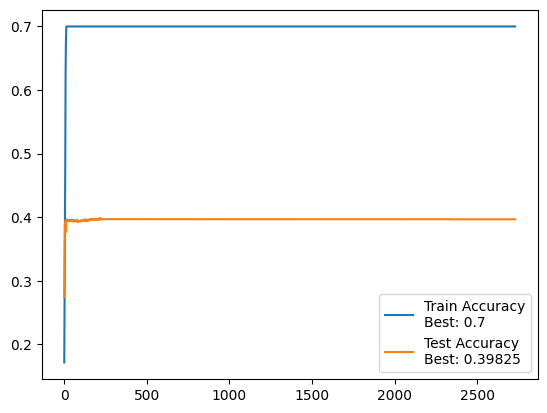

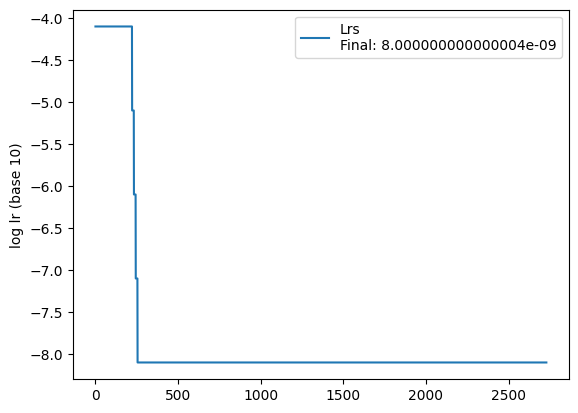


 =============== Epoch 2731 ===============


100%|██████████| 110/110 [00:03<00:00, 31.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.785956

 =============== Epoch 2732 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.45it/s]


 Test accuracy: 39.7%, Avg loss: 6.785961

 =============== Epoch 2733 ===============


100%|██████████| 110/110 [00:03<00:00, 31.33it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.24it/s]


 Test accuracy: 39.7%, Avg loss: 6.785966

 =============== Epoch 2734 ===============


100%|██████████| 110/110 [00:03<00:00, 30.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.27it/s]


 Test accuracy: 39.7%, Avg loss: 6.785971

 =============== Epoch 2735 ===============


100%|██████████| 110/110 [00:03<00:00, 31.35it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.21it/s]


 Test accuracy: 39.7%, Avg loss: 6.785976

 =============== Epoch 2736 ===============


100%|██████████| 110/110 [00:03<00:00, 31.03it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.785981

 =============== Epoch 2737 ===============


100%|██████████| 110/110 [00:03<00:00, 30.67it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.91it/s]


 Test accuracy: 39.7%, Avg loss: 6.785986

 =============== Epoch 2738 ===============


100%|██████████| 110/110 [00:03<00:00, 31.04it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.47it/s]


 Test accuracy: 39.7%, Avg loss: 6.785991

 =============== Epoch 2739 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.785996

 =============== Epoch 2740 ===============


100%|██████████| 110/110 [00:03<00:00, 30.50it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.786001


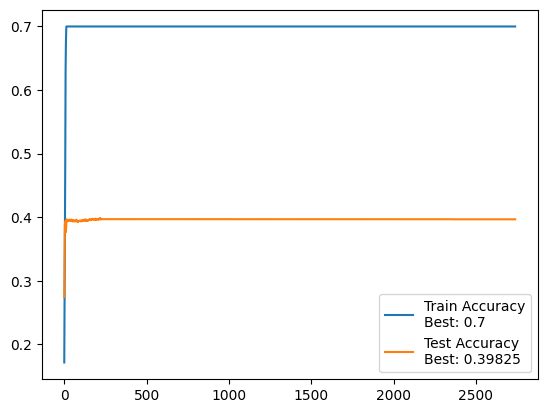

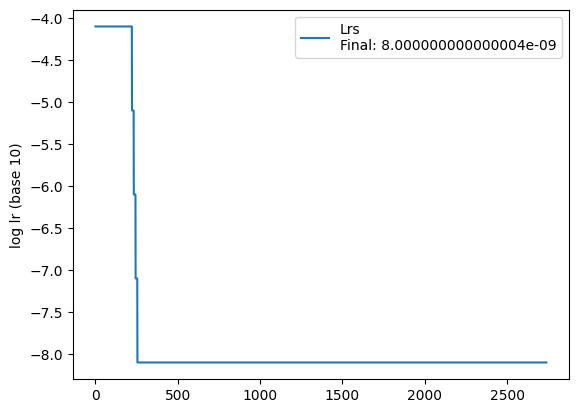


 =============== Epoch 2741 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.04it/s]


 Test accuracy: 39.7%, Avg loss: 6.786006

 =============== Epoch 2742 ===============


100%|██████████| 110/110 [00:03<00:00, 31.07it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.14it/s]


 Test accuracy: 39.7%, Avg loss: 6.786011

 =============== Epoch 2743 ===============


100%|██████████| 110/110 [00:03<00:00, 30.93it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.28it/s]


 Test accuracy: 39.7%, Avg loss: 6.786016

 =============== Epoch 2744 ===============


100%|██████████| 110/110 [00:03<00:00, 31.24it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.786021

 =============== Epoch 2745 ===============


100%|██████████| 110/110 [00:03<00:00, 30.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.26it/s]


 Test accuracy: 39.7%, Avg loss: 6.786026

 =============== Epoch 2746 ===============


100%|██████████| 110/110 [00:03<00:00, 31.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.76it/s]


 Test accuracy: 39.7%, Avg loss: 6.786032

 =============== Epoch 2747 ===============


100%|██████████| 110/110 [00:03<00:00, 31.18it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.99it/s]


 Test accuracy: 39.7%, Avg loss: 6.786037

 =============== Epoch 2748 ===============


100%|██████████| 110/110 [00:03<00:00, 30.67it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.786042

 =============== Epoch 2749 ===============


100%|██████████| 110/110 [00:03<00:00, 31.18it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.26it/s]


 Test accuracy: 39.7%, Avg loss: 6.786047

 =============== Epoch 2750 ===============


100%|██████████| 110/110 [00:03<00:00, 31.25it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.21it/s]


 Test accuracy: 39.7%, Avg loss: 6.786052


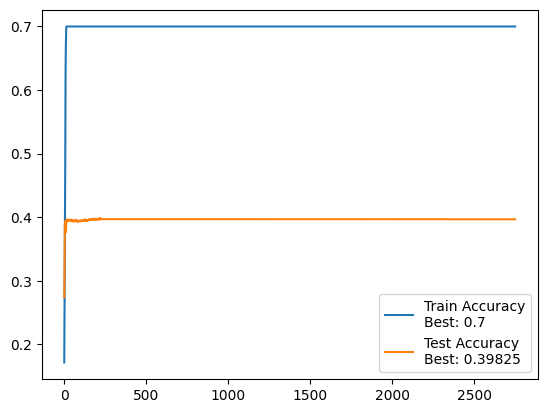

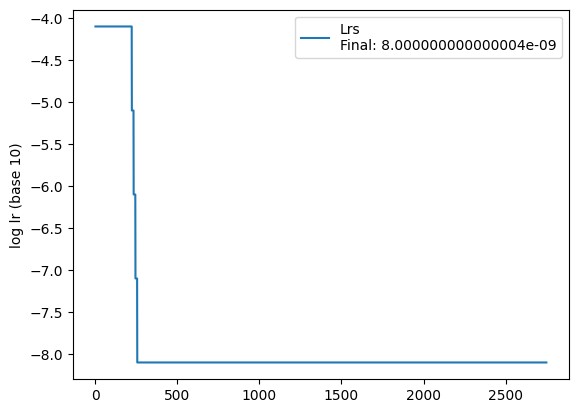


 =============== Epoch 2751 ===============


100%|██████████| 110/110 [00:03<00:00, 30.48it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.786057

 =============== Epoch 2752 ===============


100%|██████████| 110/110 [00:03<00:00, 31.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.786062

 =============== Epoch 2753 ===============


100%|██████████| 110/110 [00:03<00:00, 30.84it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.28it/s]


 Test accuracy: 39.7%, Avg loss: 6.786067

 =============== Epoch 2754 ===============


100%|██████████| 110/110 [00:03<00:00, 30.59it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.786072

 =============== Epoch 2755 ===============


100%|██████████| 110/110 [00:03<00:00, 31.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.786077

 =============== Epoch 2756 ===============


100%|██████████| 110/110 [00:03<00:00, 31.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.60it/s]


 Test accuracy: 39.7%, Avg loss: 6.786082

 =============== Epoch 2757 ===============


100%|██████████| 110/110 [00:03<00:00, 30.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.96it/s]


 Test accuracy: 39.7%, Avg loss: 6.786087

 =============== Epoch 2758 ===============


100%|██████████| 110/110 [00:03<00:00, 31.07it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.786092

 =============== Epoch 2759 ===============


100%|██████████| 110/110 [00:03<00:00, 30.84it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.04it/s]


 Test accuracy: 39.7%, Avg loss: 6.786097

 =============== Epoch 2760 ===============


100%|██████████| 110/110 [00:03<00:00, 30.61it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.83it/s]


 Test accuracy: 39.7%, Avg loss: 6.786103


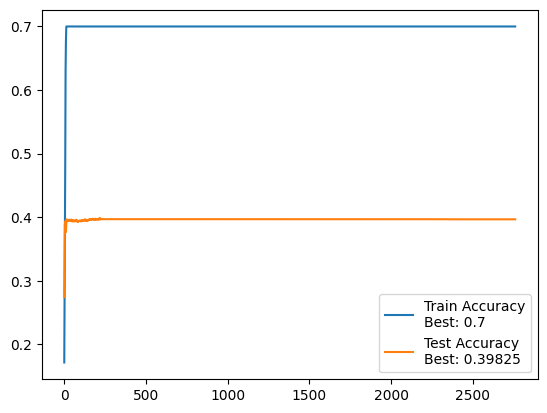

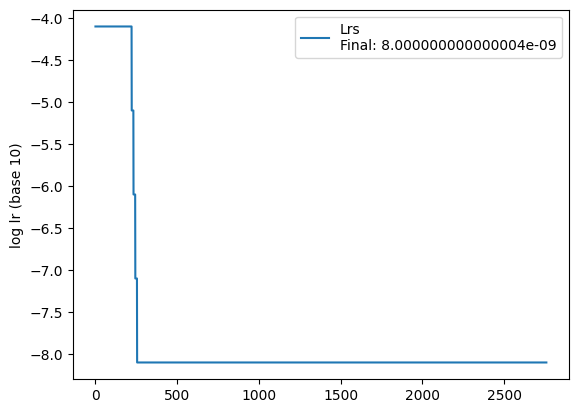


 =============== Epoch 2761 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.24it/s]


 Test accuracy: 39.7%, Avg loss: 6.786108

 =============== Epoch 2762 ===============


100%|██████████| 110/110 [00:03<00:00, 31.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.35it/s]


 Test accuracy: 39.7%, Avg loss: 6.786113

 =============== Epoch 2763 ===============


100%|██████████| 110/110 [00:03<00:00, 31.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.27it/s]


 Test accuracy: 39.7%, Avg loss: 6.786118

 =============== Epoch 2764 ===============


100%|██████████| 110/110 [00:03<00:00, 31.17it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.786123

 =============== Epoch 2765 ===============


100%|██████████| 110/110 [00:03<00:00, 30.56it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.786128

 =============== Epoch 2766 ===============


100%|██████████| 110/110 [00:03<00:00, 31.09it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.786133

 =============== Epoch 2767 ===============


100%|██████████| 110/110 [00:03<00:00, 31.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.786138

 =============== Epoch 2768 ===============


100%|██████████| 110/110 [00:03<00:00, 30.56it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.786143

 =============== Epoch 2769 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.23it/s]


 Test accuracy: 39.7%, Avg loss: 6.786148

 =============== Epoch 2770 ===============


100%|██████████| 110/110 [00:03<00:00, 31.17it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.30it/s]


 Test accuracy: 39.7%, Avg loss: 6.786153


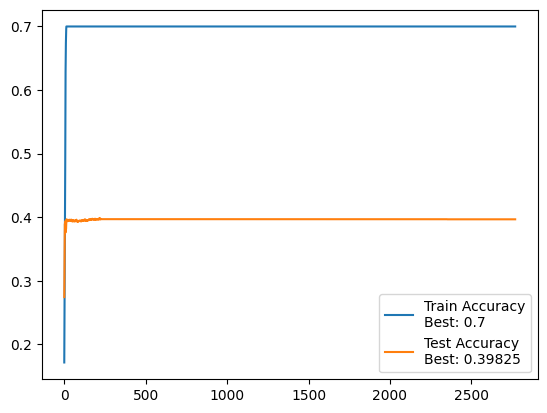

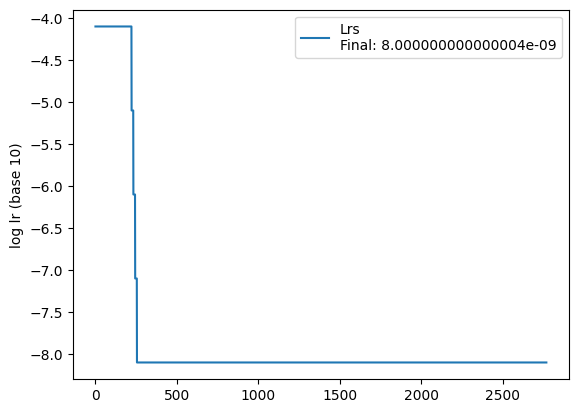


 =============== Epoch 2771 ===============


100%|██████████| 110/110 [00:03<00:00, 30.39it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.34it/s]


 Test accuracy: 39.7%, Avg loss: 6.786157

 =============== Epoch 2772 ===============


100%|██████████| 110/110 [00:03<00:00, 30.84it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.786163

 =============== Epoch 2773 ===============


100%|██████████| 110/110 [00:03<00:00, 31.09it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.81it/s]


 Test accuracy: 39.7%, Avg loss: 6.786168

 =============== Epoch 2774 ===============


100%|██████████| 110/110 [00:03<00:00, 30.36it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.31it/s]


 Test accuracy: 39.7%, Avg loss: 6.786173

 =============== Epoch 2775 ===============


100%|██████████| 110/110 [00:03<00:00, 31.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.786178

 =============== Epoch 2776 ===============


100%|██████████| 110/110 [00:03<00:00, 31.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.44it/s]


 Test accuracy: 39.7%, Avg loss: 6.786183

 =============== Epoch 2777 ===============


100%|██████████| 110/110 [00:03<00:00, 30.61it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.786187

 =============== Epoch 2778 ===============


100%|██████████| 110/110 [00:03<00:00, 31.11it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.08it/s]


 Test accuracy: 39.7%, Avg loss: 6.786192

 =============== Epoch 2779 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.786197

 =============== Epoch 2780 ===============


100%|██████████| 110/110 [00:03<00:00, 30.67it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.31it/s]


 Test accuracy: 39.7%, Avg loss: 6.786202


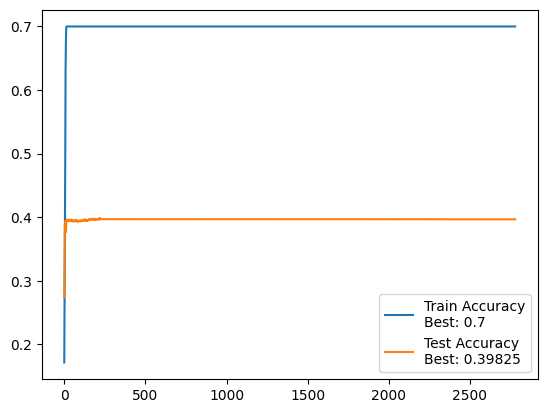

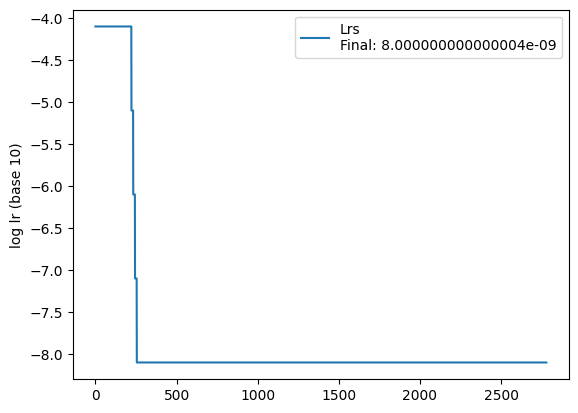


 =============== Epoch 2781 ===============


100%|██████████| 110/110 [00:03<00:00, 30.94it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.786208

 =============== Epoch 2782 ===============


100%|██████████| 110/110 [00:03<00:00, 31.15it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.84it/s]


 Test accuracy: 39.7%, Avg loss: 6.786212

 =============== Epoch 2783 ===============


100%|██████████| 110/110 [00:03<00:00, 31.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.786217

 =============== Epoch 2784 ===============


100%|██████████| 110/110 [00:03<00:00, 31.07it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.29it/s]


 Test accuracy: 39.7%, Avg loss: 6.786222

 =============== Epoch 2785 ===============


100%|██████████| 110/110 [00:03<00:00, 30.67it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.786227

 =============== Epoch 2786 ===============


100%|██████████| 110/110 [00:03<00:00, 31.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.44it/s]


 Test accuracy: 39.7%, Avg loss: 6.786232

 =============== Epoch 2787 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.62it/s]


 Test accuracy: 39.7%, Avg loss: 6.786237

 =============== Epoch 2788 ===============


100%|██████████| 110/110 [00:03<00:00, 31.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.786242

 =============== Epoch 2789 ===============


100%|██████████| 110/110 [00:03<00:00, 31.17it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.786247

 =============== Epoch 2790 ===============


100%|██████████| 110/110 [00:03<00:00, 30.79it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.786252


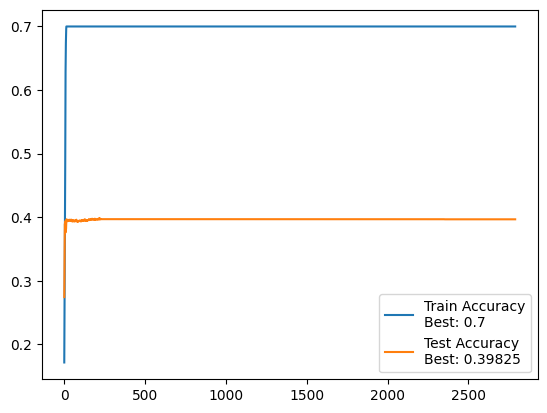

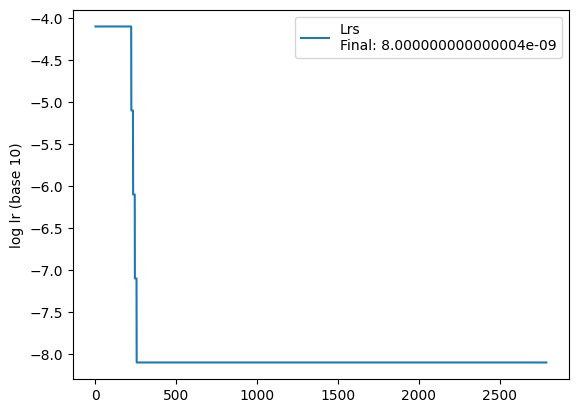


 =============== Epoch 2791 ===============


100%|██████████| 110/110 [00:03<00:00, 31.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.786257

 =============== Epoch 2792 ===============


100%|██████████| 110/110 [00:03<00:00, 31.37it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.17it/s]


 Test accuracy: 39.7%, Avg loss: 6.786262

 =============== Epoch 2793 ===============


100%|██████████| 110/110 [00:03<00:00, 31.37it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.16it/s]


 Test accuracy: 39.7%, Avg loss: 6.786268

 =============== Epoch 2794 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.28it/s]


 Test accuracy: 39.7%, Avg loss: 6.786272

 =============== Epoch 2795 ===============


100%|██████████| 110/110 [00:03<00:00, 30.68it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.786277

 =============== Epoch 2796 ===============


100%|██████████| 110/110 [00:03<00:00, 31.26it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.786282

 =============== Epoch 2797 ===============


100%|██████████| 110/110 [00:03<00:00, 31.22it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.40it/s]


 Test accuracy: 39.7%, Avg loss: 6.786288

 =============== Epoch 2798 ===============


100%|██████████| 110/110 [00:03<00:00, 30.72it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.786293

 =============== Epoch 2799 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.786297

 =============== Epoch 2800 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.25it/s]


 Test accuracy: 39.7%, Avg loss: 6.786303


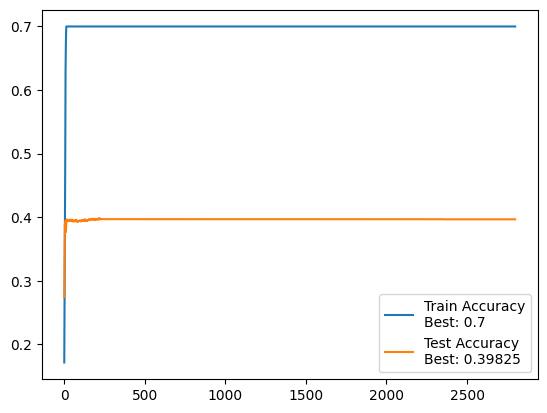

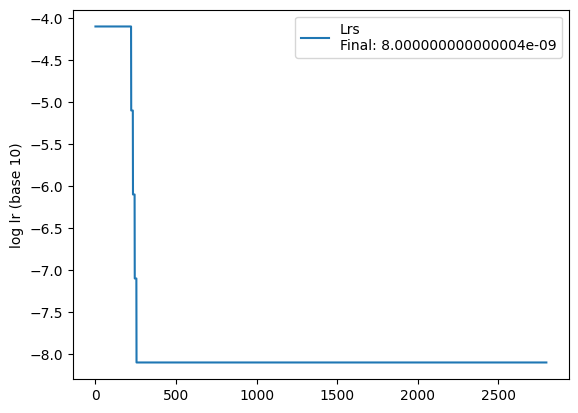


 =============== Epoch 2801 ===============


100%|██████████| 110/110 [00:03<00:00, 30.15it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.786308

 =============== Epoch 2802 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.84it/s]


 Test accuracy: 39.7%, Avg loss: 6.786312

 =============== Epoch 2803 ===============


100%|██████████| 110/110 [00:03<00:00, 30.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.85it/s]


 Test accuracy: 39.7%, Avg loss: 6.786317

 =============== Epoch 2804 ===============


100%|██████████| 110/110 [00:03<00:00, 31.18it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.786322

 =============== Epoch 2805 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.04it/s]


 Test accuracy: 39.7%, Avg loss: 6.786327

 =============== Epoch 2806 ===============


100%|██████████| 110/110 [00:03<00:00, 30.59it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.786332

 =============== Epoch 2807 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.29it/s]


 Test accuracy: 39.7%, Avg loss: 6.786337

 =============== Epoch 2808 ===============


100%|██████████| 110/110 [00:03<00:00, 29.15it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.786342

 =============== Epoch 2809 ===============


100%|██████████| 110/110 [00:03<00:00, 31.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.35it/s]


 Test accuracy: 39.7%, Avg loss: 6.786346

 =============== Epoch 2810 ===============


100%|██████████| 110/110 [00:03<00:00, 30.61it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.90it/s]


 Test accuracy: 39.7%, Avg loss: 6.786351


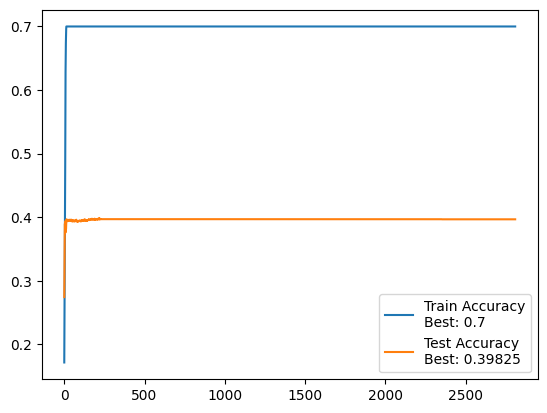

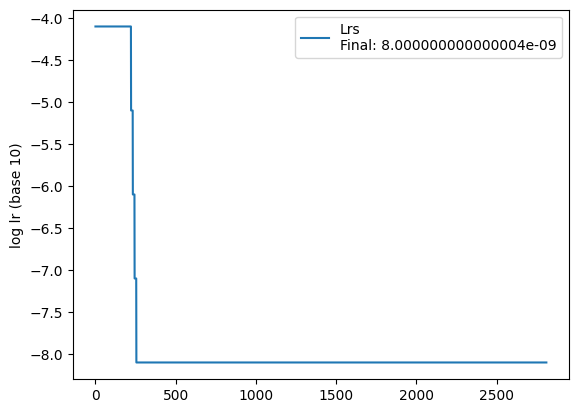


 =============== Epoch 2811 ===============


100%|██████████| 110/110 [00:03<00:00, 31.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.786357

 =============== Epoch 2812 ===============


100%|██████████| 110/110 [00:03<00:00, 31.68it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.33it/s]


 Test accuracy: 39.7%, Avg loss: 6.786361

 =============== Epoch 2813 ===============


100%|██████████| 110/110 [00:03<00:00, 31.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.78it/s]


 Test accuracy: 39.7%, Avg loss: 6.786366

 =============== Epoch 2814 ===============


100%|██████████| 110/110 [00:03<00:00, 31.40it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.786371

 =============== Epoch 2815 ===============


100%|██████████| 110/110 [00:03<00:00, 31.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.786377

 =============== Epoch 2816 ===============


100%|██████████| 110/110 [00:03<00:00, 30.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.43it/s]


 Test accuracy: 39.7%, Avg loss: 6.786381

 =============== Epoch 2817 ===============


100%|██████████| 110/110 [00:03<00:00, 31.81it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.19it/s]


 Test accuracy: 39.7%, Avg loss: 6.786386

 =============== Epoch 2818 ===============


100%|██████████| 110/110 [00:03<00:00, 32.11it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.786391

 =============== Epoch 2819 ===============


100%|██████████| 110/110 [00:03<00:00, 31.46it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.89it/s]


 Test accuracy: 39.7%, Avg loss: 6.786396

 =============== Epoch 2820 ===============


100%|██████████| 110/110 [00:03<00:00, 30.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.11it/s]


 Test accuracy: 39.7%, Avg loss: 6.786402


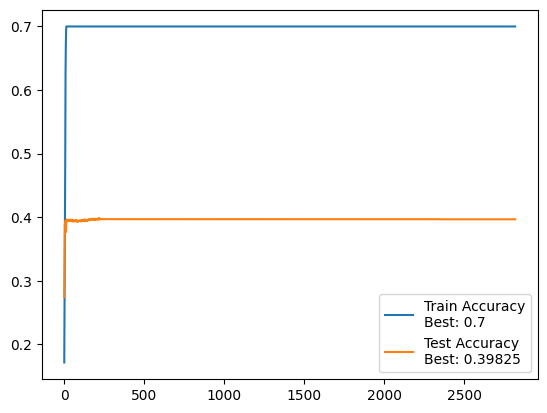

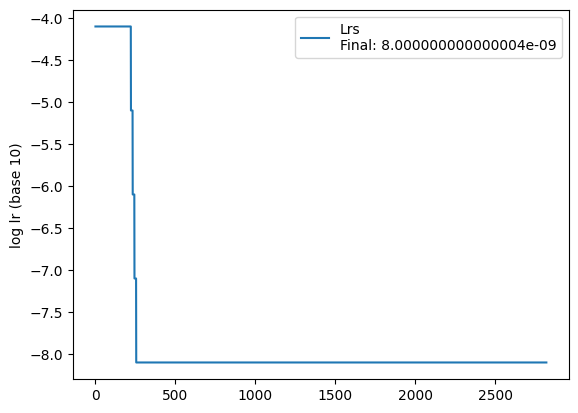


 =============== Epoch 2821 ===============


100%|██████████| 110/110 [00:03<00:00, 30.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.28it/s]


 Test accuracy: 39.7%, Avg loss: 6.786406

 =============== Epoch 2822 ===============


100%|██████████| 110/110 [00:03<00:00, 30.91it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.43it/s]


 Test accuracy: 39.7%, Avg loss: 6.786411

 =============== Epoch 2823 ===============


100%|██████████| 110/110 [00:03<00:00, 31.32it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.85it/s]


 Test accuracy: 39.7%, Avg loss: 6.786416

 =============== Epoch 2824 ===============


100%|██████████| 110/110 [00:03<00:00, 31.03it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.786421

 =============== Epoch 2825 ===============


100%|██████████| 110/110 [00:03<00:00, 31.45it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.21it/s]


 Test accuracy: 39.7%, Avg loss: 6.786426

 =============== Epoch 2826 ===============


100%|██████████| 110/110 [00:03<00:00, 31.49it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.41it/s]


 Test accuracy: 39.7%, Avg loss: 6.786431

 =============== Epoch 2827 ===============


100%|██████████| 110/110 [00:03<00:00, 31.02it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.786435

 =============== Epoch 2828 ===============


100%|██████████| 110/110 [00:03<00:00, 31.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.786441

 =============== Epoch 2829 ===============


100%|██████████| 110/110 [00:03<00:00, 30.39it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.37it/s]


 Test accuracy: 39.7%, Avg loss: 6.786445

 =============== Epoch 2830 ===============


100%|██████████| 110/110 [00:03<00:00, 28.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.09it/s]


 Test accuracy: 39.7%, Avg loss: 6.786450


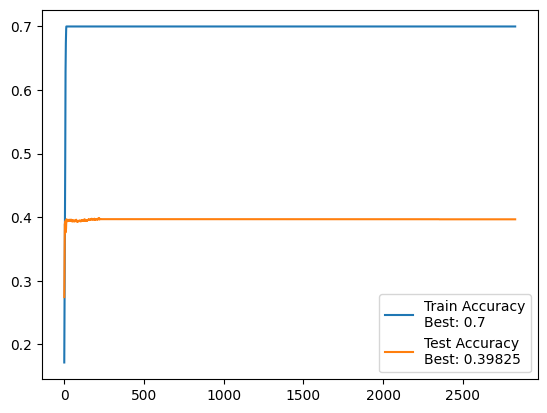

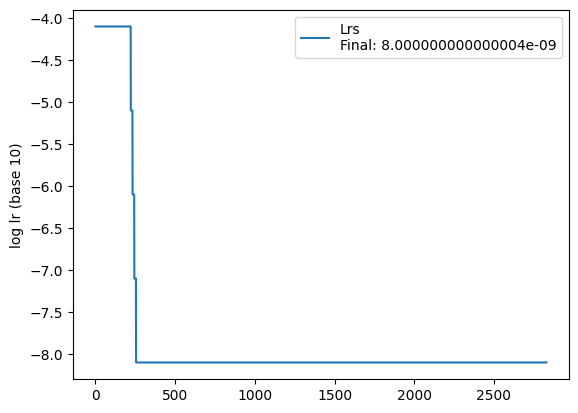


 =============== Epoch 2831 ===============


100%|██████████| 110/110 [00:03<00:00, 28.18it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.81it/s]


 Test accuracy: 39.7%, Avg loss: 6.786455

 =============== Epoch 2832 ===============


100%|██████████| 110/110 [00:03<00:00, 31.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.28it/s]


 Test accuracy: 39.7%, Avg loss: 6.786460

 =============== Epoch 2833 ===============


100%|██████████| 110/110 [00:03<00:00, 31.35it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.43it/s]


 Test accuracy: 39.7%, Avg loss: 6.786465

 =============== Epoch 2834 ===============


100%|██████████| 110/110 [00:03<00:00, 31.04it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.37it/s]


 Test accuracy: 39.7%, Avg loss: 6.786470

 =============== Epoch 2835 ===============


100%|██████████| 110/110 [00:03<00:00, 31.32it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.21it/s]


 Test accuracy: 39.7%, Avg loss: 6.786475

 =============== Epoch 2836 ===============


100%|██████████| 110/110 [00:03<00:00, 30.62it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.77it/s]


 Test accuracy: 39.7%, Avg loss: 6.786480

 =============== Epoch 2837 ===============


100%|██████████| 110/110 [00:03<00:00, 31.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.786485

 =============== Epoch 2838 ===============


100%|██████████| 110/110 [00:03<00:00, 30.98it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.786489

 =============== Epoch 2839 ===============


100%|██████████| 110/110 [00:03<00:00, 30.65it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.83it/s]


 Test accuracy: 39.7%, Avg loss: 6.786495

 =============== Epoch 2840 ===============


100%|██████████| 110/110 [00:03<00:00, 30.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.786499


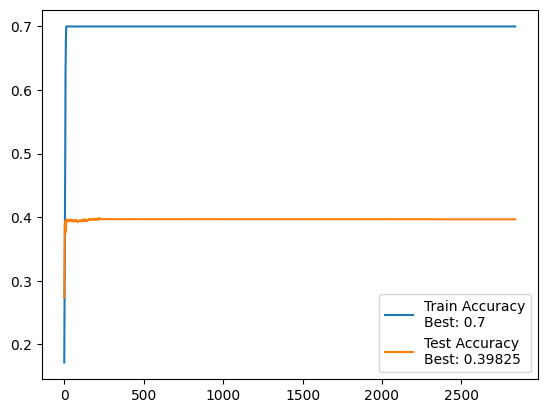

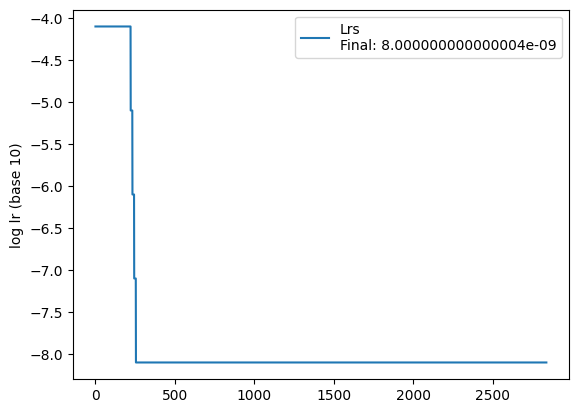


 =============== Epoch 2841 ===============


100%|██████████| 110/110 [00:03<00:00, 31.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.18it/s]


 Test accuracy: 39.7%, Avg loss: 6.786504

 =============== Epoch 2842 ===============


100%|██████████| 110/110 [00:03<00:00, 30.78it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.786509

 =============== Epoch 2843 ===============


100%|██████████| 110/110 [00:03<00:00, 31.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.92it/s]


 Test accuracy: 39.7%, Avg loss: 6.786514

 =============== Epoch 2844 ===============


100%|██████████| 110/110 [00:03<00:00, 29.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.45it/s]


 Test accuracy: 39.7%, Avg loss: 6.786518

 =============== Epoch 2845 ===============


100%|██████████| 110/110 [00:03<00:00, 31.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.786523

 =============== Epoch 2846 ===============


100%|██████████| 110/110 [00:03<00:00, 31.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.76it/s]


 Test accuracy: 39.7%, Avg loss: 6.786528

 =============== Epoch 2847 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.786533

 =============== Epoch 2848 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.786538

 =============== Epoch 2849 ===============


100%|██████████| 110/110 [00:03<00:00, 30.63it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.786543

 =============== Epoch 2850 ===============


100%|██████████| 110/110 [00:03<00:00, 31.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.786548


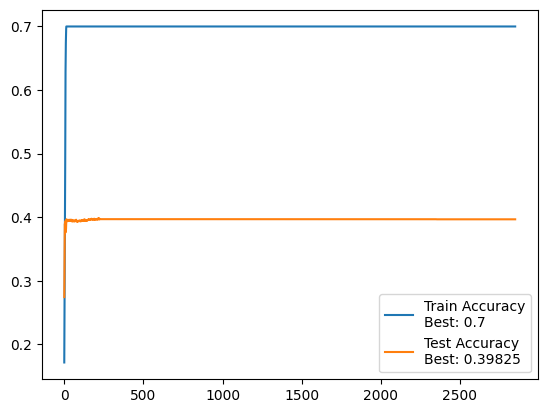

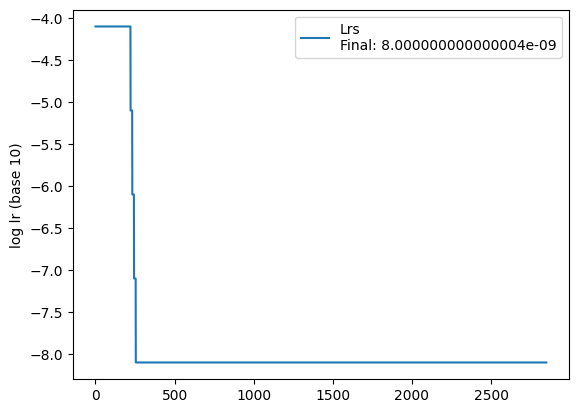


 =============== Epoch 2851 ===============


100%|██████████| 110/110 [00:03<00:00, 31.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.06it/s]


 Test accuracy: 39.7%, Avg loss: 6.786553

 =============== Epoch 2852 ===============


100%|██████████| 110/110 [00:03<00:00, 30.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.786557

 =============== Epoch 2853 ===============


100%|██████████| 110/110 [00:03<00:00, 31.04it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.92it/s]


 Test accuracy: 39.7%, Avg loss: 6.786563

 =============== Epoch 2854 ===============


100%|██████████| 110/110 [00:03<00:00, 30.53it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.37it/s]


 Test accuracy: 39.7%, Avg loss: 6.786568

 =============== Epoch 2855 ===============


100%|██████████| 110/110 [00:03<00:00, 31.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.786573

 =============== Epoch 2856 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.786577

 =============== Epoch 2857 ===============


100%|██████████| 110/110 [00:03<00:00, 30.56it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.786582

 =============== Epoch 2858 ===============


100%|██████████| 110/110 [00:03<00:00, 31.24it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.60it/s]


 Test accuracy: 39.7%, Avg loss: 6.786587

 =============== Epoch 2859 ===============


100%|██████████| 110/110 [00:03<00:00, 31.35it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.03it/s]


 Test accuracy: 39.7%, Avg loss: 6.786592

 =============== Epoch 2860 ===============


100%|██████████| 110/110 [00:03<00:00, 31.04it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.08it/s]


 Test accuracy: 39.7%, Avg loss: 6.786597


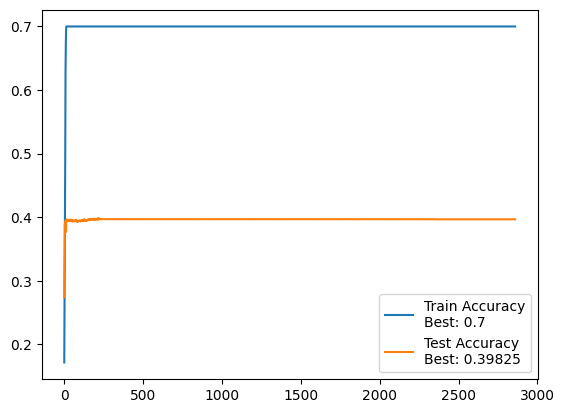

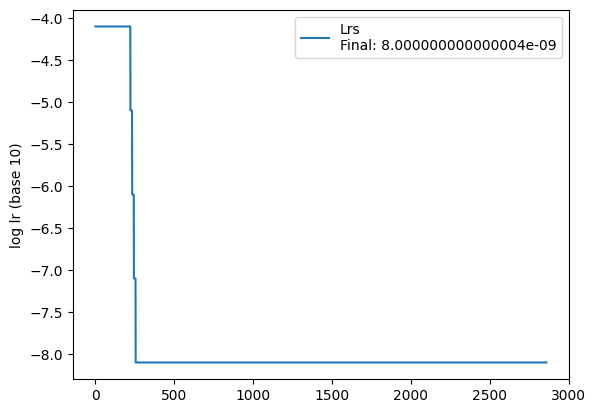


 =============== Epoch 2861 ===============


100%|██████████| 110/110 [00:03<00:00, 30.95it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.786602

 =============== Epoch 2862 ===============


100%|██████████| 110/110 [00:03<00:00, 30.60it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.786607

 =============== Epoch 2863 ===============


100%|██████████| 110/110 [00:03<00:00, 30.77it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.786611

 =============== Epoch 2864 ===============


100%|██████████| 110/110 [00:03<00:00, 31.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.786617

 =============== Epoch 2865 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.16it/s]


 Test accuracy: 39.7%, Avg loss: 6.786621

 =============== Epoch 2866 ===============


100%|██████████| 110/110 [00:03<00:00, 31.24it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.786626

 =============== Epoch 2867 ===============


100%|██████████| 110/110 [00:03<00:00, 30.32it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.786631

 =============== Epoch 2868 ===============


100%|██████████| 110/110 [00:03<00:00, 30.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.786636

 =============== Epoch 2869 ===============


100%|██████████| 110/110 [00:03<00:00, 31.09it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.96it/s]


 Test accuracy: 39.7%, Avg loss: 6.786641

 =============== Epoch 2870 ===============


100%|██████████| 110/110 [00:03<00:00, 30.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.08it/s]


 Test accuracy: 39.7%, Avg loss: 6.786645


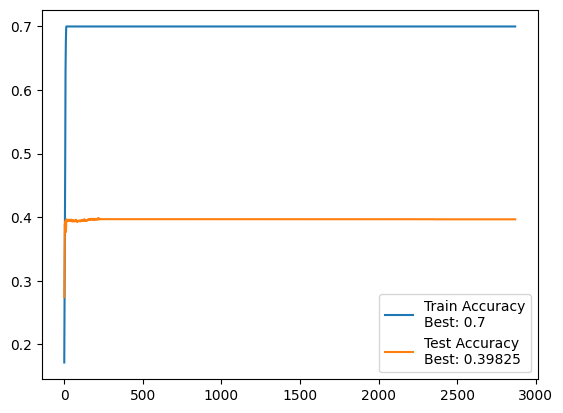

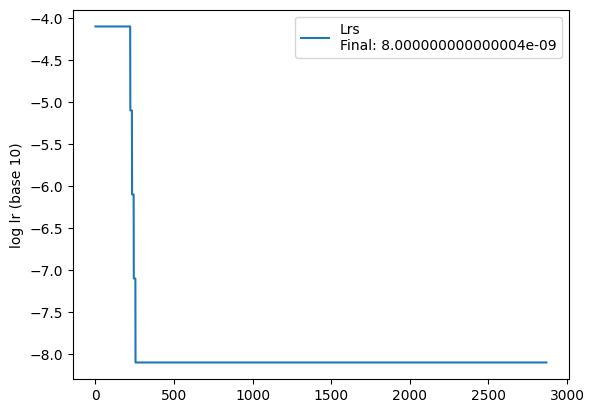


 =============== Epoch 2871 ===============


100%|██████████| 110/110 [00:03<00:00, 31.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.786651

 =============== Epoch 2872 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.786655

 =============== Epoch 2873 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.786661

 =============== Epoch 2874 ===============


100%|██████████| 110/110 [00:03<00:00, 30.78it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.786665

 =============== Epoch 2875 ===============


100%|██████████| 110/110 [00:03<00:00, 31.27it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.66it/s]


 Test accuracy: 39.7%, Avg loss: 6.786670

 =============== Epoch 2876 ===============


100%|██████████| 110/110 [00:03<00:00, 31.30it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.41it/s]


 Test accuracy: 39.7%, Avg loss: 6.786675

 =============== Epoch 2877 ===============


100%|██████████| 110/110 [00:03<00:00, 31.25it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.786680

 =============== Epoch 2878 ===============


100%|██████████| 110/110 [00:03<00:00, 31.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.786685

 =============== Epoch 2879 ===============


100%|██████████| 110/110 [00:03<00:00, 30.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.91it/s]


 Test accuracy: 39.7%, Avg loss: 6.786690

 =============== Epoch 2880 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.786694


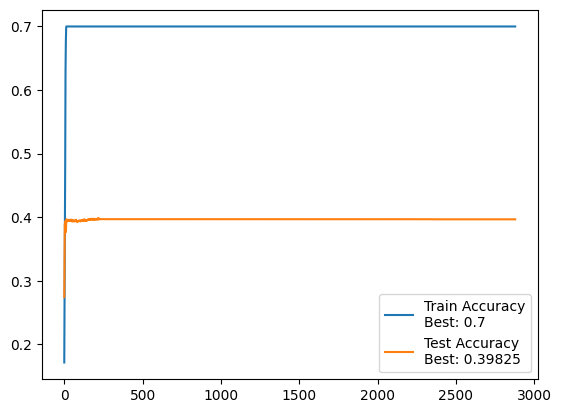

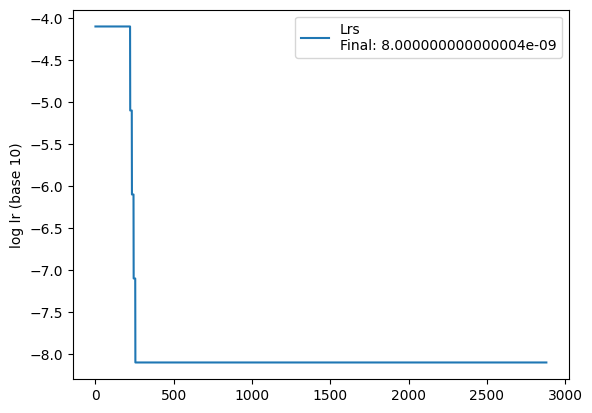


 =============== Epoch 2881 ===============


100%|██████████| 110/110 [00:03<00:00, 31.15it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.85it/s]


 Test accuracy: 39.7%, Avg loss: 6.786699

 =============== Epoch 2882 ===============


100%|██████████| 110/110 [00:03<00:00, 31.09it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.19it/s]


 Test accuracy: 39.7%, Avg loss: 6.786704

 =============== Epoch 2883 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.93it/s]


 Test accuracy: 39.7%, Avg loss: 6.786709

 =============== Epoch 2884 ===============


100%|██████████| 110/110 [00:03<00:00, 30.52it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.786714

 =============== Epoch 2885 ===============


100%|██████████| 110/110 [00:03<00:00, 31.17it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.786719

 =============== Epoch 2886 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.786724

 =============== Epoch 2887 ===============


100%|██████████| 110/110 [00:03<00:00, 31.18it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.75it/s]


 Test accuracy: 39.7%, Avg loss: 6.786729

 =============== Epoch 2888 ===============


100%|██████████| 110/110 [00:03<00:00, 31.11it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.85it/s]


 Test accuracy: 39.7%, Avg loss: 6.786734

 =============== Epoch 2889 ===============


100%|██████████| 110/110 [00:03<00:00, 30.72it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.786738

 =============== Epoch 2890 ===============


100%|██████████| 110/110 [00:03<00:00, 30.98it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.52it/s]


 Test accuracy: 39.7%, Avg loss: 6.786743


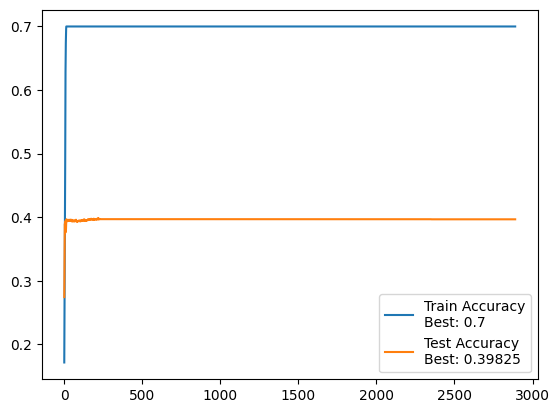

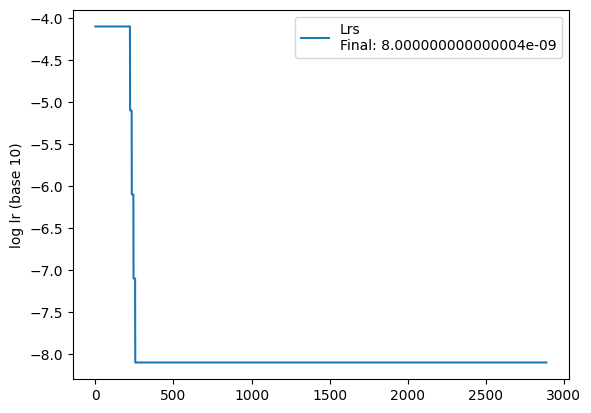


 =============== Epoch 2891 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.786748

 =============== Epoch 2892 ===============


100%|██████████| 110/110 [00:03<00:00, 31.03it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.29it/s]


 Test accuracy: 39.7%, Avg loss: 6.786754

 =============== Epoch 2893 ===============


100%|██████████| 110/110 [00:03<00:00, 30.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.40it/s]


 Test accuracy: 39.7%, Avg loss: 6.786758

 =============== Epoch 2894 ===============


100%|██████████| 110/110 [00:03<00:00, 30.60it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.41it/s]


 Test accuracy: 39.7%, Avg loss: 6.786763

 =============== Epoch 2895 ===============


100%|██████████| 110/110 [00:03<00:00, 31.17it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.786768

 =============== Epoch 2896 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.77it/s]


 Test accuracy: 39.7%, Avg loss: 6.786773

 =============== Epoch 2897 ===============


100%|██████████| 110/110 [00:03<00:00, 31.31it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.99it/s]


 Test accuracy: 39.7%, Avg loss: 6.786778

 =============== Epoch 2898 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.786783

 =============== Epoch 2899 ===============


100%|██████████| 110/110 [00:03<00:00, 30.69it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.786788

 =============== Epoch 2900 ===============


100%|██████████| 110/110 [00:03<00:00, 31.02it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.45it/s]


 Test accuracy: 39.7%, Avg loss: 6.786793


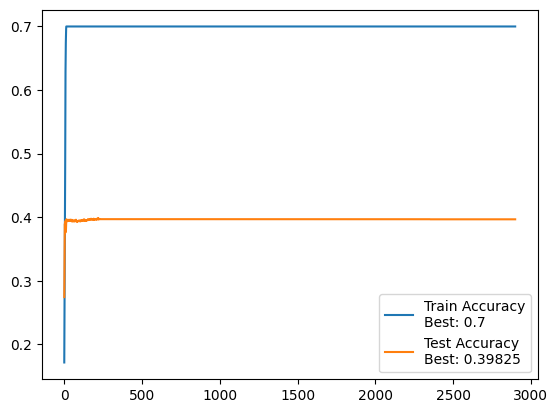

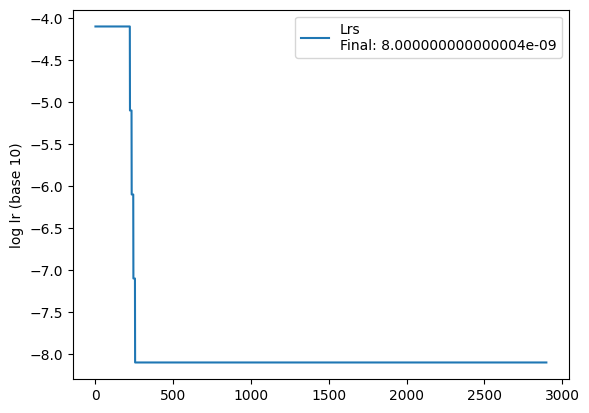


 =============== Epoch 2901 ===============


100%|██████████| 110/110 [00:03<00:00, 30.54it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.28it/s]


 Test accuracy: 39.7%, Avg loss: 6.786797

 =============== Epoch 2902 ===============


100%|██████████| 110/110 [00:03<00:00, 31.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.786802

 =============== Epoch 2903 ===============


100%|██████████| 110/110 [00:03<00:00, 30.93it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.10it/s]


 Test accuracy: 39.7%, Avg loss: 6.786807

 =============== Epoch 2904 ===============


100%|██████████| 110/110 [00:03<00:00, 30.53it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.786811

 =============== Epoch 2905 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.11it/s]


 Test accuracy: 39.7%, Avg loss: 6.786817

 =============== Epoch 2906 ===============


100%|██████████| 110/110 [00:03<00:00, 31.11it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.786821

 =============== Epoch 2907 ===============


100%|██████████| 110/110 [00:03<00:00, 31.15it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.786826

 =============== Epoch 2908 ===============


100%|██████████| 110/110 [00:03<00:00, 31.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.96it/s]


 Test accuracy: 39.7%, Avg loss: 6.786831

 =============== Epoch 2909 ===============


100%|██████████| 110/110 [00:03<00:00, 30.43it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.85it/s]


 Test accuracy: 39.7%, Avg loss: 6.786836

 =============== Epoch 2910 ===============


100%|██████████| 110/110 [00:03<00:00, 30.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.786841


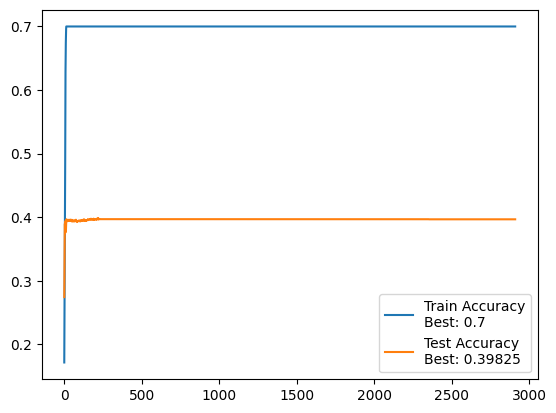

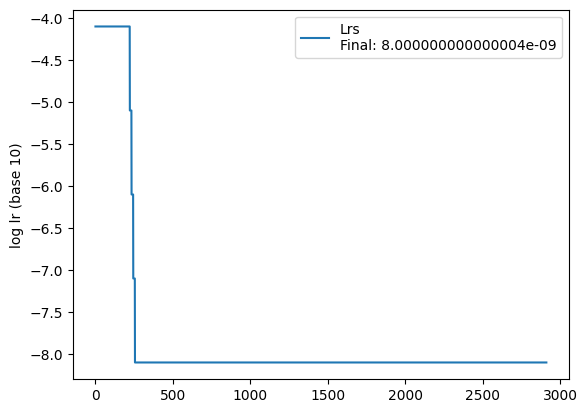


 =============== Epoch 2911 ===============


100%|██████████| 110/110 [00:03<00:00, 30.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.28it/s]


 Test accuracy: 39.7%, Avg loss: 6.786846

 =============== Epoch 2912 ===============


100%|██████████| 110/110 [00:03<00:00, 30.95it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.786851

 =============== Epoch 2913 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.786855

 =============== Epoch 2914 ===============


100%|██████████| 110/110 [00:03<00:00, 30.51it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.786861

 =============== Epoch 2915 ===============


100%|██████████| 110/110 [00:03<00:00, 30.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.72it/s]


 Test accuracy: 39.7%, Avg loss: 6.786865

 =============== Epoch 2916 ===============


100%|██████████| 110/110 [00:03<00:00, 31.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.786870

 =============== Epoch 2917 ===============


100%|██████████| 110/110 [00:03<00:00, 31.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.786875

 =============== Epoch 2918 ===============


100%|██████████| 110/110 [00:03<00:00, 31.22it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.91it/s]


 Test accuracy: 39.7%, Avg loss: 6.786880

 =============== Epoch 2919 ===============


100%|██████████| 110/110 [00:03<00:00, 30.40it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.786884

 =============== Epoch 2920 ===============


100%|██████████| 110/110 [00:03<00:00, 31.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.786889


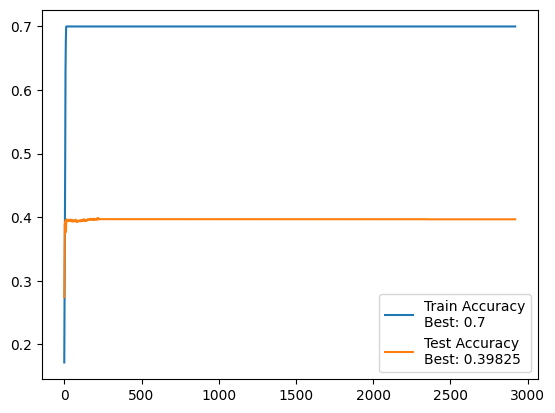

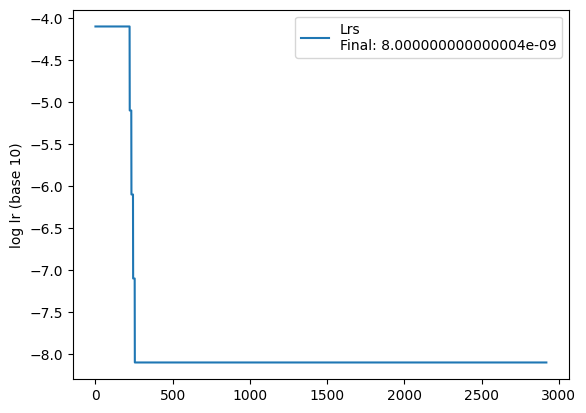


 =============== Epoch 2921 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.786894

 =============== Epoch 2922 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.786899

 =============== Epoch 2923 ===============


100%|██████████| 110/110 [00:03<00:00, 31.03it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.786904

 =============== Epoch 2924 ===============


100%|██████████| 110/110 [00:03<00:00, 30.74it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.786909

 =============== Epoch 2925 ===============


100%|██████████| 110/110 [00:03<00:00, 30.98it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.786913

 =============== Epoch 2926 ===============


100%|██████████| 110/110 [00:03<00:00, 31.25it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.85it/s]


 Test accuracy: 39.7%, Avg loss: 6.786918

 =============== Epoch 2927 ===============


100%|██████████| 110/110 [00:03<00:00, 30.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.23it/s]


 Test accuracy: 39.7%, Avg loss: 6.786922

 =============== Epoch 2928 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.08it/s]


 Test accuracy: 39.7%, Avg loss: 6.786927

 =============== Epoch 2929 ===============


100%|██████████| 110/110 [00:03<00:00, 30.50it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.99it/s]


 Test accuracy: 39.7%, Avg loss: 6.786932

 =============== Epoch 2930 ===============


100%|██████████| 110/110 [00:03<00:00, 31.26it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.786937


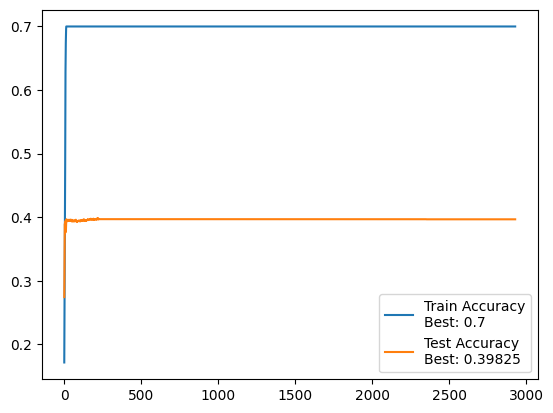

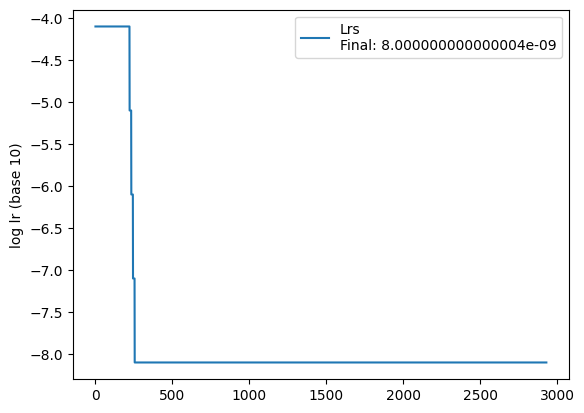


 =============== Epoch 2931 ===============


100%|██████████| 110/110 [00:03<00:00, 30.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.46it/s]


 Test accuracy: 39.7%, Avg loss: 6.786942

 =============== Epoch 2932 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.14it/s]


 Test accuracy: 39.7%, Avg loss: 6.786947

 =============== Epoch 2933 ===============


100%|██████████| 110/110 [00:03<00:00, 31.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.786951

 =============== Epoch 2934 ===============


100%|██████████| 110/110 [00:03<00:00, 30.52it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.72it/s]


 Test accuracy: 39.7%, Avg loss: 6.786956

 =============== Epoch 2935 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.18it/s]


 Test accuracy: 39.7%, Avg loss: 6.786961

 =============== Epoch 2936 ===============


100%|██████████| 110/110 [00:03<00:00, 30.98it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.786966

 =============== Epoch 2937 ===============


100%|██████████| 110/110 [00:03<00:00, 31.15it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.08it/s]


 Test accuracy: 39.7%, Avg loss: 6.786970

 =============== Epoch 2938 ===============


100%|██████████| 110/110 [00:03<00:00, 30.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.97it/s]


 Test accuracy: 39.7%, Avg loss: 6.786976

 =============== Epoch 2939 ===============


100%|██████████| 110/110 [00:03<00:00, 30.51it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.88it/s]


 Test accuracy: 39.7%, Avg loss: 6.786980

 =============== Epoch 2940 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.08it/s]


 Test accuracy: 39.7%, Avg loss: 6.786985


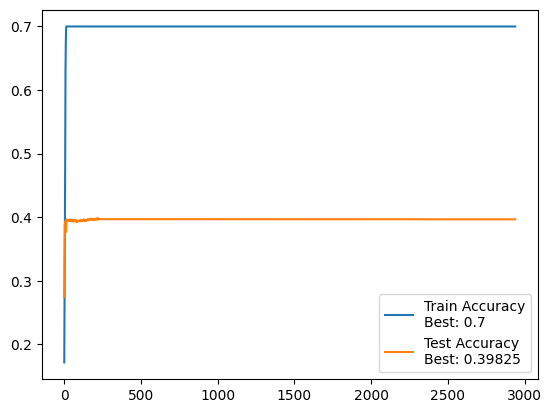

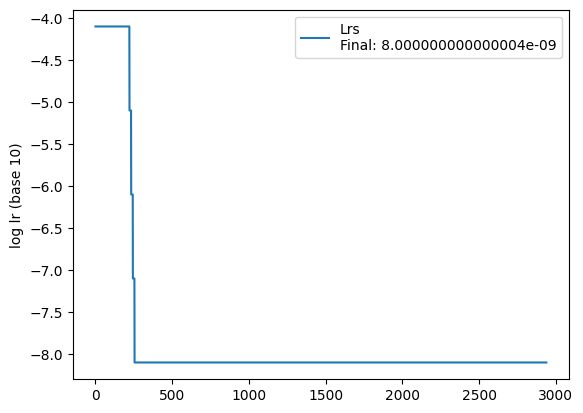


 =============== Epoch 2941 ===============


100%|██████████| 110/110 [00:03<00:00, 30.42it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.786989

 =============== Epoch 2942 ===============


100%|██████████| 110/110 [00:03<00:00, 30.81it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.786995

 =============== Epoch 2943 ===============


100%|██████████| 110/110 [00:03<00:00, 30.79it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.786999

 =============== Epoch 2944 ===============


100%|██████████| 110/110 [00:03<00:00, 30.94it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.47it/s]


 Test accuracy: 39.7%, Avg loss: 6.787004

 =============== Epoch 2945 ===============


100%|██████████| 110/110 [00:03<00:00, 30.77it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.787008

 =============== Epoch 2946 ===============


100%|██████████| 110/110 [00:03<00:00, 30.54it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.787013

 =============== Epoch 2947 ===============


100%|██████████| 110/110 [00:03<00:00, 31.03it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.787017

 =============== Epoch 2948 ===============


100%|██████████| 110/110 [00:03<00:00, 30.98it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.787022

 =============== Epoch 2949 ===============


100%|██████████| 110/110 [00:03<00:00, 31.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.787027

 =============== Epoch 2950 ===============


100%|██████████| 110/110 [00:03<00:00, 31.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.787031


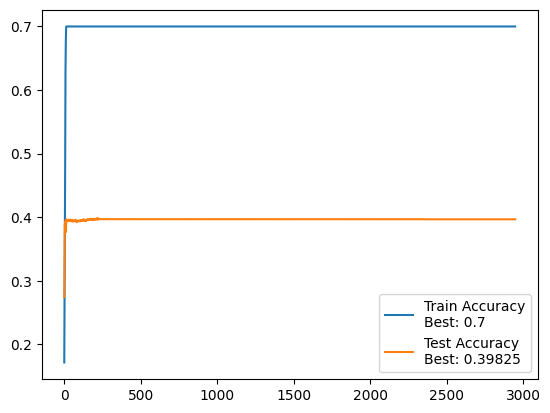

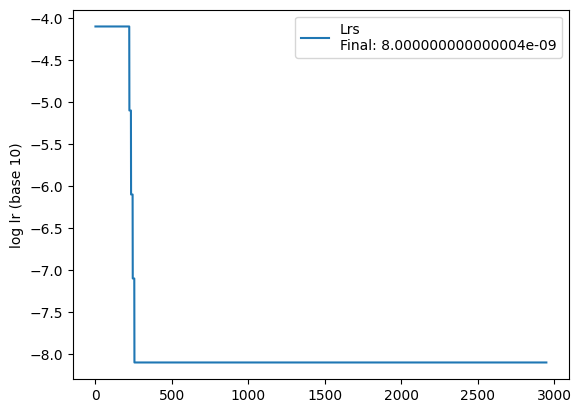


 =============== Epoch 2951 ===============


100%|██████████| 110/110 [00:03<00:00, 30.24it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.787036

 =============== Epoch 2952 ===============


100%|██████████| 110/110 [00:03<00:00, 31.09it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.99it/s]


 Test accuracy: 39.7%, Avg loss: 6.787041

 =============== Epoch 2953 ===============


100%|██████████| 110/110 [00:03<00:00, 31.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.787046

 =============== Epoch 2954 ===============


100%|██████████| 110/110 [00:03<00:00, 31.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.787050

 =============== Epoch 2955 ===============


100%|██████████| 110/110 [00:03<00:00, 31.03it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.24it/s]


 Test accuracy: 39.7%, Avg loss: 6.787054

 =============== Epoch 2956 ===============


100%|██████████| 110/110 [00:03<00:00, 30.60it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.44it/s]


 Test accuracy: 39.7%, Avg loss: 6.787059

 =============== Epoch 2957 ===============


100%|██████████| 110/110 [00:03<00:00, 31.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.787064

 =============== Epoch 2958 ===============


100%|██████████| 110/110 [00:03<00:00, 31.03it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.787069

 =============== Epoch 2959 ===============


100%|██████████| 110/110 [00:03<00:00, 31.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.787073

 =============== Epoch 2960 ===============


100%|██████████| 110/110 [00:03<00:00, 31.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.16it/s]


 Test accuracy: 39.7%, Avg loss: 6.787078


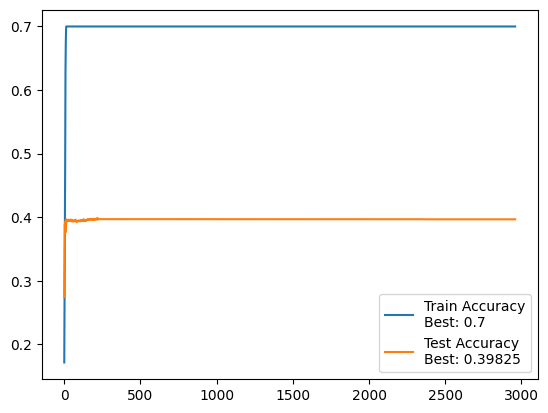

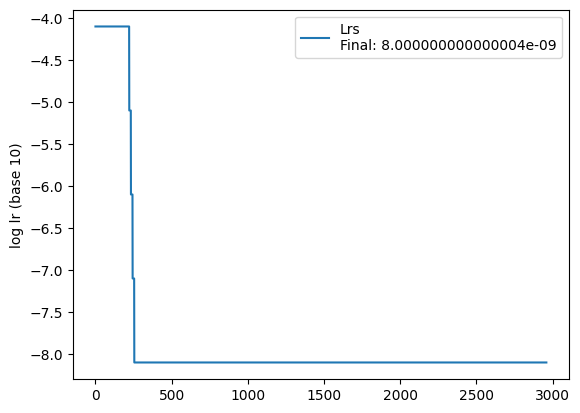


 =============== Epoch 2961 ===============


100%|██████████| 110/110 [00:03<00:00, 30.18it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.787083

 =============== Epoch 2962 ===============


100%|██████████| 110/110 [00:03<00:00, 31.25it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.787087

 =============== Epoch 2963 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.73it/s]


 Test accuracy: 39.7%, Avg loss: 6.787092

 =============== Epoch 2964 ===============


100%|██████████| 110/110 [00:03<00:00, 30.98it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.38it/s]


 Test accuracy: 39.7%, Avg loss: 6.787096

 =============== Epoch 2965 ===============


100%|██████████| 110/110 [00:03<00:00, 31.17it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.04it/s]


 Test accuracy: 39.7%, Avg loss: 6.787101

 =============== Epoch 2966 ===============


100%|██████████| 110/110 [00:03<00:00, 30.74it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.787105

 =============== Epoch 2967 ===============


100%|██████████| 110/110 [00:03<00:00, 31.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.787110

 =============== Epoch 2968 ===============


100%|██████████| 110/110 [00:03<00:00, 30.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.96it/s]


 Test accuracy: 39.7%, Avg loss: 6.787115

 =============== Epoch 2969 ===============


100%|██████████| 110/110 [00:03<00:00, 30.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.96it/s]


 Test accuracy: 39.7%, Avg loss: 6.787120

 =============== Epoch 2970 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.30it/s]


 Test accuracy: 39.7%, Avg loss: 6.787125


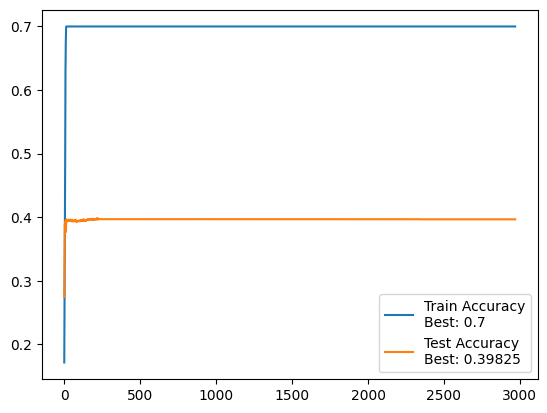

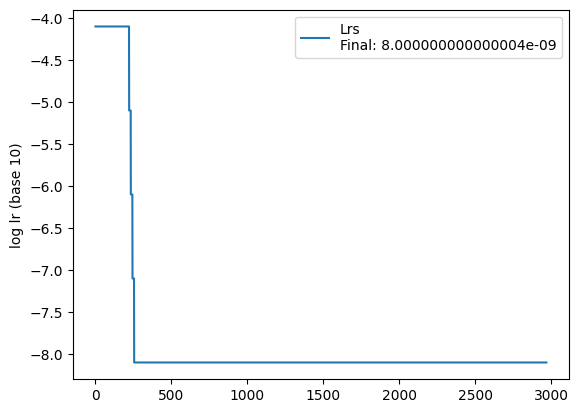


 =============== Epoch 2971 ===============


100%|██████████| 110/110 [00:03<00:00, 29.58it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.787129

 =============== Epoch 2972 ===============


100%|██████████| 110/110 [00:03<00:00, 31.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.52it/s]


 Test accuracy: 39.7%, Avg loss: 6.787134

 =============== Epoch 2973 ===============


100%|██████████| 110/110 [00:03<00:00, 31.09it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.84it/s]


 Test accuracy: 39.7%, Avg loss: 6.787139

 =============== Epoch 2974 ===============


100%|██████████| 110/110 [00:03<00:00, 31.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.66it/s]


 Test accuracy: 39.7%, Avg loss: 6.787143

 =============== Epoch 2975 ===============


100%|██████████| 110/110 [00:03<00:00, 30.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.787147

 =============== Epoch 2976 ===============


100%|██████████| 110/110 [00:03<00:00, 30.62it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.91it/s]


 Test accuracy: 39.7%, Avg loss: 6.787152

 =============== Epoch 2977 ===============


100%|██████████| 110/110 [00:03<00:00, 31.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.28it/s]


 Test accuracy: 39.7%, Avg loss: 6.787157

 =============== Epoch 2978 ===============


100%|██████████| 110/110 [00:03<00:00, 31.27it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.787161

 =============== Epoch 2979 ===============


100%|██████████| 110/110 [00:03<00:00, 31.32it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.29it/s]


 Test accuracy: 39.7%, Avg loss: 6.787166

 =============== Epoch 2980 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.787170


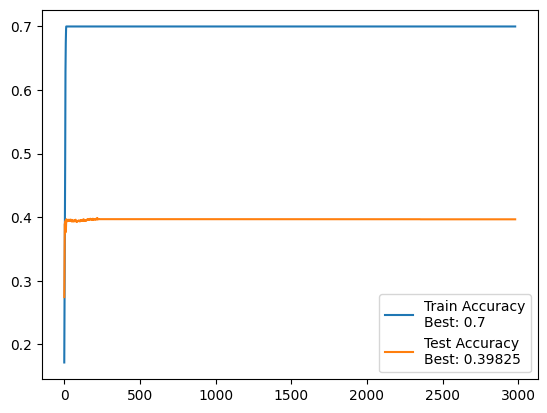

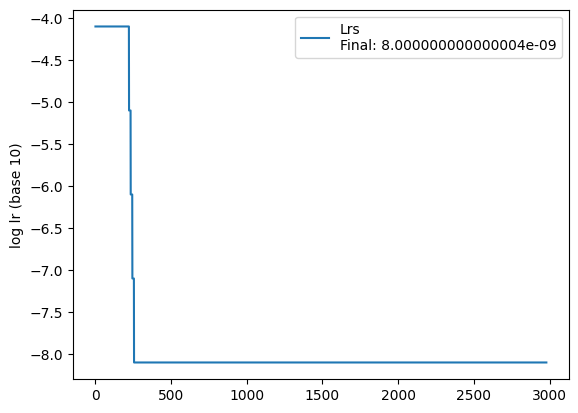


 =============== Epoch 2981 ===============


100%|██████████| 110/110 [00:03<00:00, 30.40it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.88it/s]


 Test accuracy: 39.7%, Avg loss: 6.787175

 =============== Epoch 2982 ===============


100%|██████████| 110/110 [00:03<00:00, 30.56it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.23it/s]


 Test accuracy: 39.7%, Avg loss: 6.787180

 =============== Epoch 2983 ===============


100%|██████████| 110/110 [00:03<00:00, 31.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.44it/s]


 Test accuracy: 39.7%, Avg loss: 6.787184

 =============== Epoch 2984 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.03it/s]


 Test accuracy: 39.7%, Avg loss: 6.787189

 =============== Epoch 2985 ===============


100%|██████████| 110/110 [00:03<00:00, 31.27it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.787193

 =============== Epoch 2986 ===============


100%|██████████| 110/110 [00:03<00:00, 30.33it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.31it/s]


 Test accuracy: 39.7%, Avg loss: 6.787198

 =============== Epoch 2987 ===============


100%|██████████| 110/110 [00:03<00:00, 31.17it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.787202

 =============== Epoch 2988 ===============


100%|██████████| 110/110 [00:03<00:00, 30.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.96it/s]


 Test accuracy: 39.7%, Avg loss: 6.787207

 =============== Epoch 2989 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.16it/s]


 Test accuracy: 39.7%, Avg loss: 6.787211

 =============== Epoch 2990 ===============


100%|██████████| 110/110 [00:03<00:00, 31.02it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.787216


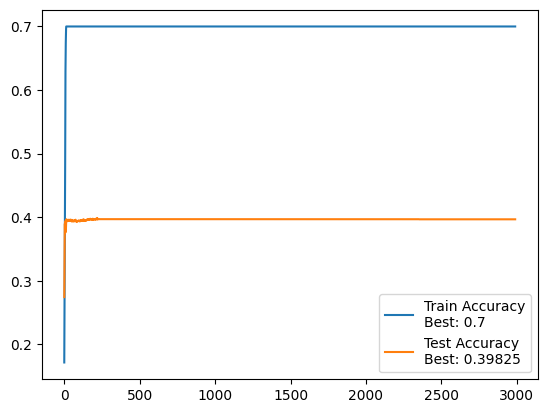

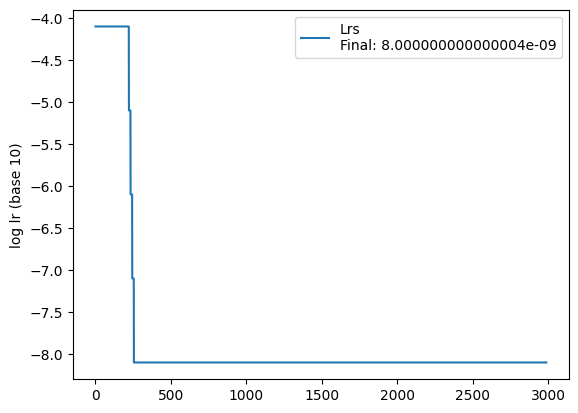


 =============== Epoch 2991 ===============


100%|██████████| 110/110 [00:03<00:00, 31.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.45it/s]


 Test accuracy: 39.7%, Avg loss: 6.787221

 =============== Epoch 2992 ===============


100%|██████████| 110/110 [00:03<00:00, 31.02it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.04it/s]


 Test accuracy: 39.7%, Avg loss: 6.787225

 =============== Epoch 2993 ===============


100%|██████████| 110/110 [00:03<00:00, 30.66it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.787230

 =============== Epoch 2994 ===============


100%|██████████| 110/110 [00:03<00:00, 31.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.787234

 =============== Epoch 2995 ===============


100%|██████████| 110/110 [00:03<00:00, 31.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.787238

 =============== Epoch 2996 ===============


100%|██████████| 110/110 [00:03<00:00, 31.25it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.787243

 =============== Epoch 2997 ===============


100%|██████████| 110/110 [00:03<00:00, 31.03it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.28it/s]


 Test accuracy: 39.7%, Avg loss: 6.787247

 =============== Epoch 2998 ===============


100%|██████████| 110/110 [00:03<00:00, 30.67it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.787252

 =============== Epoch 2999 ===============


100%|██████████| 110/110 [00:03<00:00, 31.07it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.787256

 =============== Epoch 3000 ===============


100%|██████████| 110/110 [00:03<00:00, 31.24it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.49it/s]


 Test accuracy: 39.7%, Avg loss: 6.787261


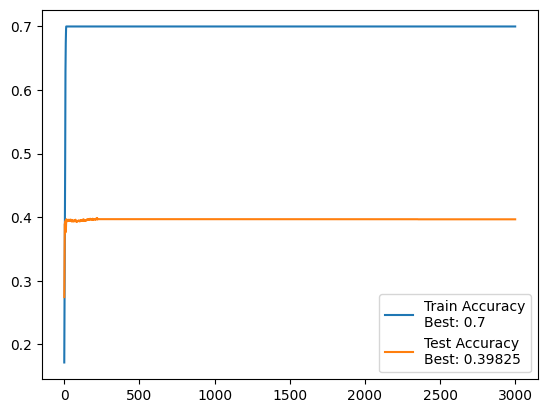

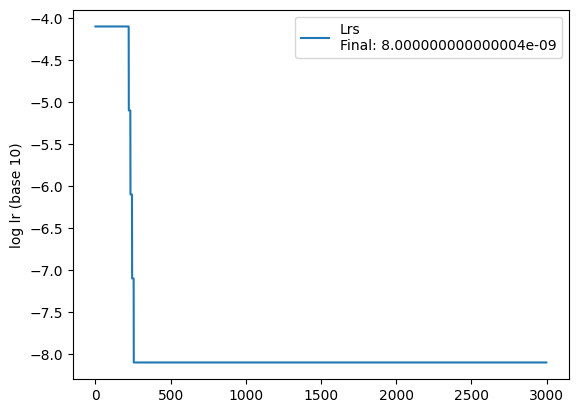


 =============== Epoch 3001 ===============


100%|██████████| 110/110 [00:03<00:00, 30.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.99it/s]


 Test accuracy: 39.7%, Avg loss: 6.787265

 =============== Epoch 3002 ===============


100%|██████████| 110/110 [00:03<00:00, 31.18it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.73it/s]


 Test accuracy: 39.7%, Avg loss: 6.787269

 =============== Epoch 3003 ===============


100%|██████████| 110/110 [00:03<00:00, 31.11it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.787274

 =============== Epoch 3004 ===============


100%|██████████| 110/110 [00:03<00:00, 30.65it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.66it/s]


 Test accuracy: 39.7%, Avg loss: 6.787278

 =============== Epoch 3005 ===============


100%|██████████| 110/110 [00:03<00:00, 30.47it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.90it/s]


 Test accuracy: 39.7%, Avg loss: 6.787283

 =============== Epoch 3006 ===============


100%|██████████| 110/110 [00:03<00:00, 30.07it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.21it/s]


 Test accuracy: 39.7%, Avg loss: 6.787287

 =============== Epoch 3007 ===============


100%|██████████| 110/110 [00:03<00:00, 30.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.11it/s]


 Test accuracy: 39.7%, Avg loss: 6.787291

 =============== Epoch 3008 ===============


100%|██████████| 110/110 [00:03<00:00, 30.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.43it/s]


 Test accuracy: 39.7%, Avg loss: 6.787295

 =============== Epoch 3009 ===============


100%|██████████| 110/110 [00:03<00:00, 30.15it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.08it/s]


 Test accuracy: 39.7%, Avg loss: 6.787300

 =============== Epoch 3010 ===============


100%|██████████| 110/110 [00:03<00:00, 29.72it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.01it/s]


 Test accuracy: 39.7%, Avg loss: 6.787305


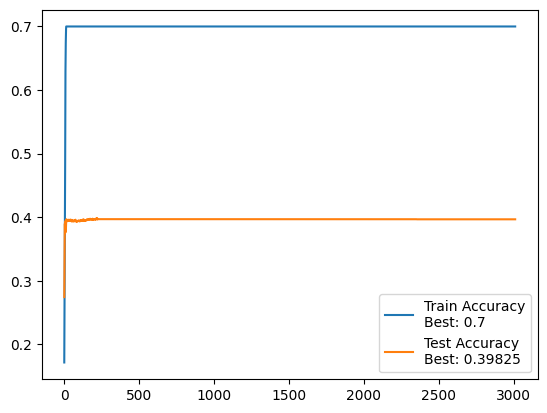

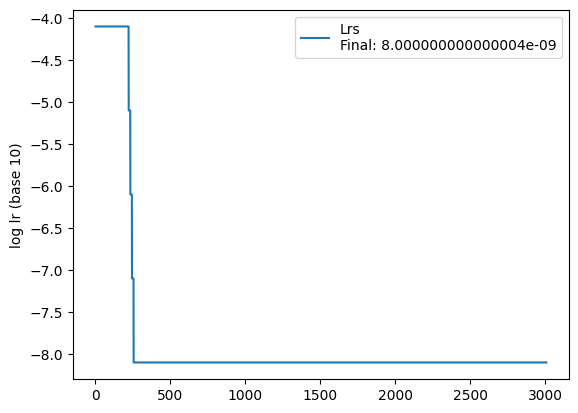


 =============== Epoch 3011 ===============


100%|██████████| 110/110 [00:03<00:00, 29.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.787309

 =============== Epoch 3012 ===============


100%|██████████| 110/110 [00:03<00:00, 29.48it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.52it/s]


 Test accuracy: 39.7%, Avg loss: 6.787313

 =============== Epoch 3013 ===============


100%|██████████| 110/110 [00:03<00:00, 29.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.37it/s]


 Test accuracy: 39.7%, Avg loss: 6.787318

 =============== Epoch 3014 ===============


100%|██████████| 110/110 [00:03<00:00, 30.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.44it/s]


 Test accuracy: 39.7%, Avg loss: 6.787322

 =============== Epoch 3015 ===============


100%|██████████| 110/110 [00:03<00:00, 29.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.83it/s]


 Test accuracy: 39.7%, Avg loss: 6.787326

 =============== Epoch 3016 ===============


100%|██████████| 110/110 [00:03<00:00, 29.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.31it/s]


 Test accuracy: 39.7%, Avg loss: 6.787331

 =============== Epoch 3017 ===============


100%|██████████| 110/110 [00:03<00:00, 29.42it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.787336

 =============== Epoch 3018 ===============


100%|██████████| 110/110 [00:03<00:00, 30.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.787340

 =============== Epoch 3019 ===============


100%|██████████| 110/110 [00:03<00:00, 30.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.787345

 =============== Epoch 3020 ===============


100%|██████████| 110/110 [00:03<00:00, 30.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.787349


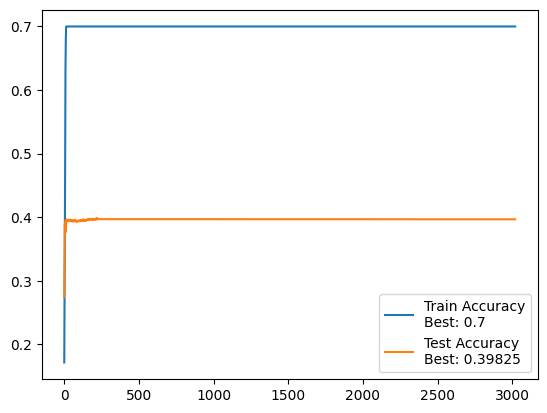

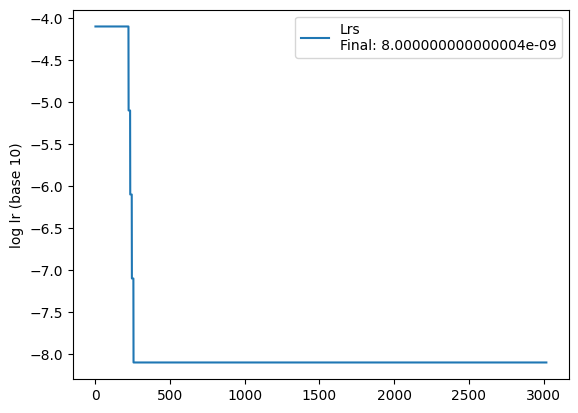


 =============== Epoch 3021 ===============


100%|██████████| 110/110 [00:03<00:00, 30.03it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.787353

 =============== Epoch 3022 ===============


100%|██████████| 110/110 [00:03<00:00, 30.18it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.49it/s]


 Test accuracy: 39.7%, Avg loss: 6.787357

 =============== Epoch 3023 ===============


100%|██████████| 110/110 [00:03<00:00, 30.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.26it/s]


 Test accuracy: 39.7%, Avg loss: 6.787362

 =============== Epoch 3024 ===============


100%|██████████| 110/110 [00:03<00:00, 29.56it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.787367

 =============== Epoch 3025 ===============


100%|██████████| 110/110 [00:03<00:00, 29.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.787371

 =============== Epoch 3026 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.787376

 =============== Epoch 3027 ===============


100%|██████████| 110/110 [00:03<00:00, 31.31it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.787380

 =============== Epoch 3028 ===============


100%|██████████| 110/110 [00:03<00:00, 31.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.85it/s]


 Test accuracy: 39.7%, Avg loss: 6.787385

 =============== Epoch 3029 ===============


100%|██████████| 110/110 [00:03<00:00, 30.75it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.787389

 =============== Epoch 3030 ===============


100%|██████████| 110/110 [00:03<00:00, 31.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.83it/s]


 Test accuracy: 39.7%, Avg loss: 6.787393


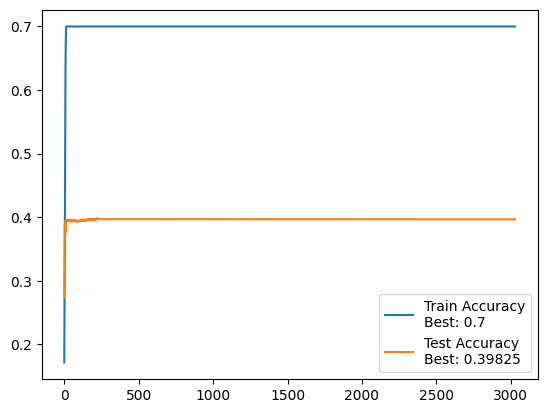

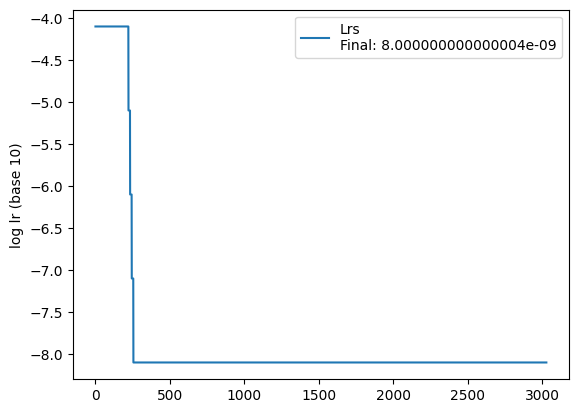


 =============== Epoch 3031 ===============


100%|██████████| 110/110 [00:03<00:00, 30.30it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.47it/s]


 Test accuracy: 39.7%, Avg loss: 6.787398

 =============== Epoch 3032 ===============


100%|██████████| 110/110 [00:03<00:00, 30.67it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.23it/s]


 Test accuracy: 39.7%, Avg loss: 6.787402

 =============== Epoch 3033 ===============


100%|██████████| 110/110 [00:03<00:00, 31.22it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.87it/s]


 Test accuracy: 39.7%, Avg loss: 6.787407

 =============== Epoch 3034 ===============


100%|██████████| 110/110 [00:03<00:00, 31.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.787411

 =============== Epoch 3035 ===============


100%|██████████| 110/110 [00:03<00:00, 31.18it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.85it/s]


 Test accuracy: 39.7%, Avg loss: 6.787415

 =============== Epoch 3036 ===============


100%|██████████| 110/110 [00:03<00:00, 30.40it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.26it/s]


 Test accuracy: 39.7%, Avg loss: 6.787420

 =============== Epoch 3037 ===============


100%|██████████| 110/110 [00:03<00:00, 30.45it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.04it/s]


 Test accuracy: 39.7%, Avg loss: 6.787424

 =============== Epoch 3038 ===============


100%|██████████| 110/110 [00:03<00:00, 31.18it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.79it/s]


 Test accuracy: 39.7%, Avg loss: 6.787429

 =============== Epoch 3039 ===============


100%|██████████| 110/110 [00:03<00:00, 31.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.787433

 =============== Epoch 3040 ===============


100%|██████████| 110/110 [00:03<00:00, 31.03it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.03it/s]


 Test accuracy: 39.7%, Avg loss: 6.787437


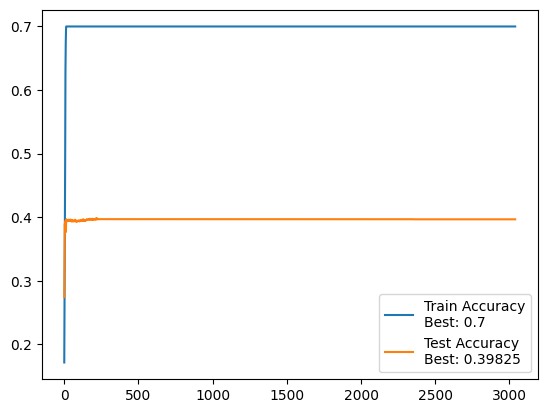

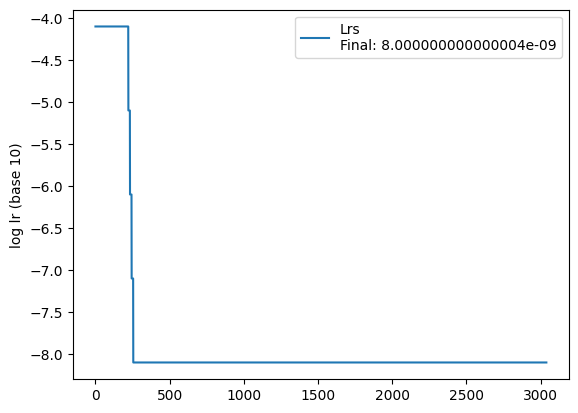


 =============== Epoch 3041 ===============


100%|██████████| 110/110 [00:03<00:00, 30.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.787442

 =============== Epoch 3042 ===============


100%|██████████| 110/110 [00:03<00:00, 31.07it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.787446

 =============== Epoch 3043 ===============


100%|██████████| 110/110 [00:03<00:00, 31.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.787450

 =============== Epoch 3044 ===============


100%|██████████| 110/110 [00:03<00:00, 31.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.31it/s]


 Test accuracy: 39.7%, Avg loss: 6.787455

 =============== Epoch 3045 ===============


100%|██████████| 110/110 [00:03<00:00, 31.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.787459

 =============== Epoch 3046 ===============


100%|██████████| 110/110 [00:03<00:00, 30.34it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.787464

 =============== Epoch 3047 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.787468

 =============== Epoch 3048 ===============


100%|██████████| 110/110 [00:03<00:00, 31.27it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.45it/s]


 Test accuracy: 39.7%, Avg loss: 6.787473

 =============== Epoch 3049 ===============


100%|██████████| 110/110 [00:03<00:00, 31.31it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.787477

 =============== Epoch 3050 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.60it/s]


 Test accuracy: 39.7%, Avg loss: 6.787482


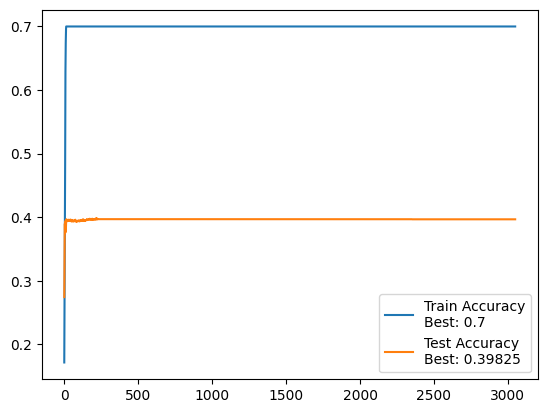

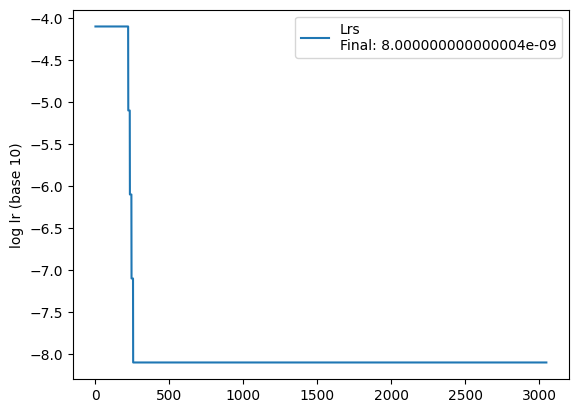


 =============== Epoch 3051 ===============


100%|██████████| 110/110 [00:03<00:00, 31.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.66it/s]


 Test accuracy: 39.7%, Avg loss: 6.787486

 =============== Epoch 3052 ===============


100%|██████████| 110/110 [00:03<00:00, 31.41it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.787491

 =============== Epoch 3053 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.787495

 =============== Epoch 3054 ===============


100%|██████████| 110/110 [00:03<00:00, 31.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.28it/s]


 Test accuracy: 39.7%, Avg loss: 6.787500

 =============== Epoch 3055 ===============


100%|██████████| 110/110 [00:03<00:00, 31.30it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.787504

 =============== Epoch 3056 ===============


100%|██████████| 110/110 [00:03<00:00, 30.48it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.97it/s]


 Test accuracy: 39.7%, Avg loss: 6.787508

 =============== Epoch 3057 ===============


100%|██████████| 110/110 [00:03<00:00, 31.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.787512

 =============== Epoch 3058 ===============


100%|██████████| 110/110 [00:03<00:00, 31.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.787517

 =============== Epoch 3059 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.787521

 =============== Epoch 3060 ===============


100%|██████████| 110/110 [00:03<00:00, 31.32it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.24it/s]


 Test accuracy: 39.7%, Avg loss: 6.787526


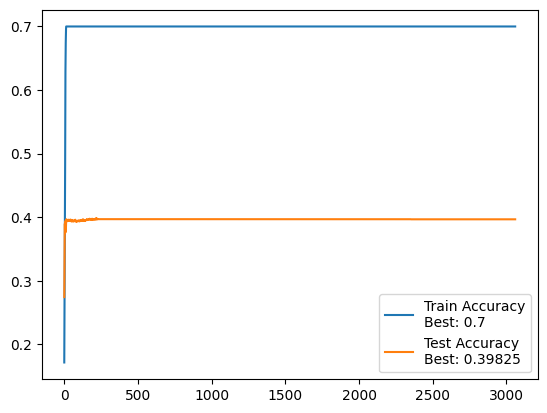

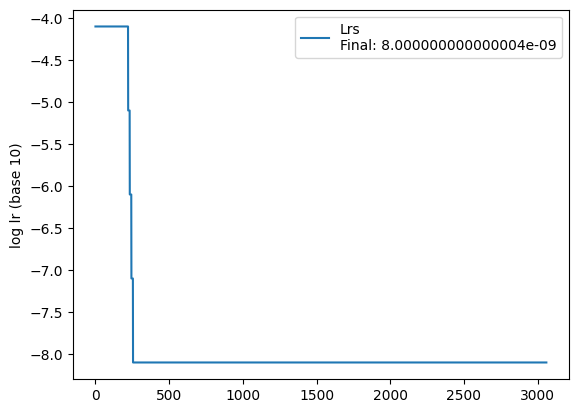


 =============== Epoch 3061 ===============


100%|██████████| 110/110 [00:03<00:00, 31.03it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.787530

 =============== Epoch 3062 ===============


100%|██████████| 110/110 [00:03<00:00, 31.31it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.787535

 =============== Epoch 3063 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.787539

 =============== Epoch 3064 ===============


100%|██████████| 110/110 [00:03<00:00, 31.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.787544

 =============== Epoch 3065 ===============


100%|██████████| 110/110 [00:03<00:00, 31.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.787548

 =============== Epoch 3066 ===============


100%|██████████| 110/110 [00:03<00:00, 30.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.89it/s]


 Test accuracy: 39.7%, Avg loss: 6.787552

 =============== Epoch 3067 ===============


100%|██████████| 110/110 [00:03<00:00, 30.98it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.85it/s]


 Test accuracy: 39.7%, Avg loss: 6.787557

 =============== Epoch 3068 ===============


100%|██████████| 110/110 [00:03<00:00, 31.02it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.30it/s]


 Test accuracy: 39.7%, Avg loss: 6.787561

 =============== Epoch 3069 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.24it/s]


 Test accuracy: 39.7%, Avg loss: 6.787566

 =============== Epoch 3070 ===============


100%|██████████| 110/110 [00:03<00:00, 31.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.787570


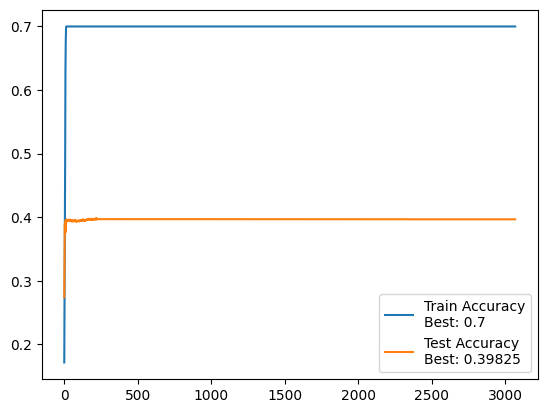

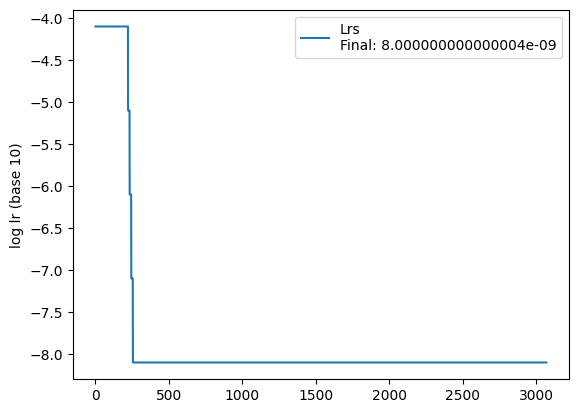


 =============== Epoch 3071 ===============


100%|██████████| 110/110 [00:03<00:00, 30.91it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.14it/s]


 Test accuracy: 39.7%, Avg loss: 6.787574

 =============== Epoch 3072 ===============


100%|██████████| 110/110 [00:03<00:00, 31.11it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.35it/s]


 Test accuracy: 39.7%, Avg loss: 6.787579

 =============== Epoch 3073 ===============


100%|██████████| 110/110 [00:03<00:00, 30.85it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.787583

 =============== Epoch 3074 ===============


100%|██████████| 110/110 [00:03<00:00, 30.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.787587

 =============== Epoch 3075 ===============


100%|██████████| 110/110 [00:03<00:00, 30.46it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.787592

 =============== Epoch 3076 ===============


100%|██████████| 110/110 [00:03<00:00, 31.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.787596

 =============== Epoch 3077 ===============


100%|██████████| 110/110 [00:03<00:00, 31.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.52it/s]


 Test accuracy: 39.7%, Avg loss: 6.787600

 =============== Epoch 3078 ===============


100%|██████████| 110/110 [00:03<00:00, 31.09it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.787605

 =============== Epoch 3079 ===============


100%|██████████| 110/110 [00:03<00:00, 31.24it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.787609

 =============== Epoch 3080 ===============


100%|██████████| 110/110 [00:03<00:00, 30.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.787614


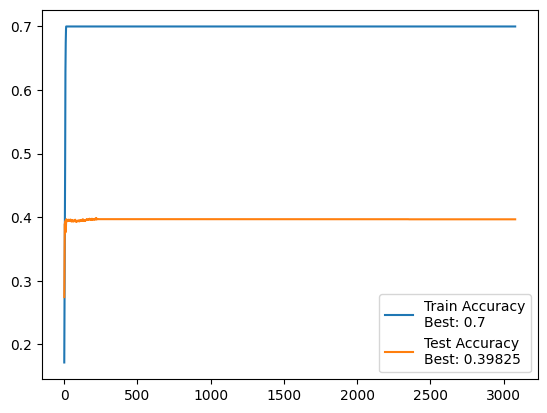

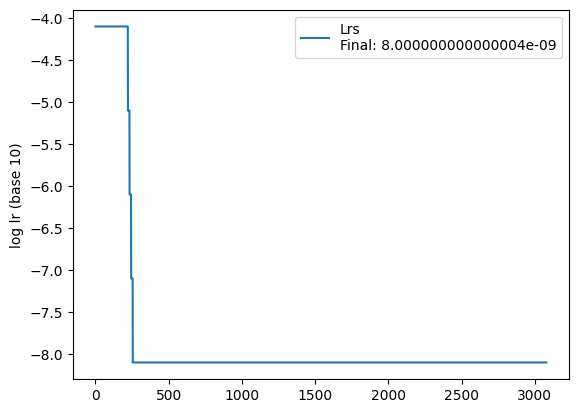


 =============== Epoch 3081 ===============


100%|██████████| 110/110 [00:03<00:00, 31.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.787619

 =============== Epoch 3082 ===============


100%|██████████| 110/110 [00:03<00:00, 30.56it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.83it/s]


 Test accuracy: 39.7%, Avg loss: 6.787623

 =============== Epoch 3083 ===============


100%|██████████| 110/110 [00:03<00:00, 31.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.78it/s]


 Test accuracy: 39.7%, Avg loss: 6.787627

 =============== Epoch 3084 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.79it/s]


 Test accuracy: 39.7%, Avg loss: 6.787631

 =============== Epoch 3085 ===============


100%|██████████| 110/110 [00:03<00:00, 31.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.78it/s]


 Test accuracy: 39.7%, Avg loss: 6.787636

 =============== Epoch 3086 ===============


100%|██████████| 110/110 [00:03<00:00, 30.95it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.787640

 =============== Epoch 3087 ===============


100%|██████████| 110/110 [00:03<00:00, 30.71it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.787645

 =============== Epoch 3088 ===============


100%|██████████| 110/110 [00:03<00:00, 30.84it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.16it/s]


 Test accuracy: 39.7%, Avg loss: 6.787649

 =============== Epoch 3089 ===============


100%|██████████| 110/110 [00:03<00:00, 30.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.787653

 =============== Epoch 3090 ===============


100%|██████████| 110/110 [00:03<00:00, 31.11it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.88it/s]


 Test accuracy: 39.7%, Avg loss: 6.787658


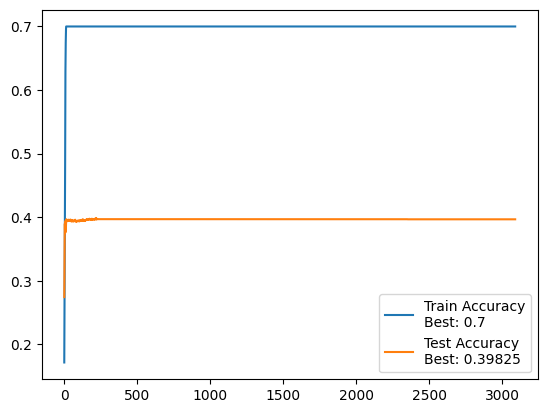

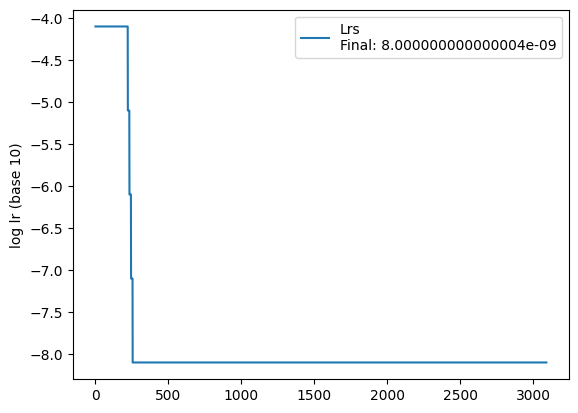


 =============== Epoch 3091 ===============


100%|██████████| 110/110 [00:03<00:00, 31.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.38it/s]


 Test accuracy: 39.7%, Avg loss: 6.787662

 =============== Epoch 3092 ===============


100%|██████████| 110/110 [00:03<00:00, 30.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.787667

 =============== Epoch 3093 ===============


100%|██████████| 110/110 [00:03<00:00, 31.15it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.17it/s]


 Test accuracy: 39.7%, Avg loss: 6.787671

 =============== Epoch 3094 ===============


100%|██████████| 110/110 [00:03<00:00, 31.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.34it/s]


 Test accuracy: 39.7%, Avg loss: 6.787675

 =============== Epoch 3095 ===============


100%|██████████| 110/110 [00:03<00:00, 31.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.787679

 =============== Epoch 3096 ===============


100%|██████████| 110/110 [00:03<00:00, 31.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.787684

 =============== Epoch 3097 ===============


100%|██████████| 110/110 [00:03<00:00, 31.07it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.787688

 =============== Epoch 3098 ===============


100%|██████████| 110/110 [00:03<00:00, 30.38it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.787693

 =============== Epoch 3099 ===============


100%|██████████| 110/110 [00:03<00:00, 31.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.47it/s]


 Test accuracy: 39.7%, Avg loss: 6.787697

 =============== Epoch 3100 ===============


100%|██████████| 110/110 [00:03<00:00, 30.47it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.17it/s]


 Test accuracy: 39.7%, Avg loss: 6.787702


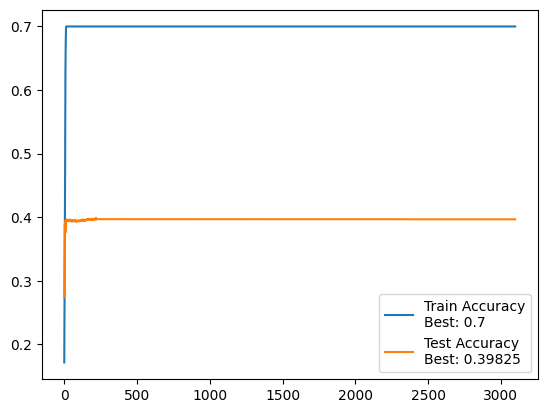

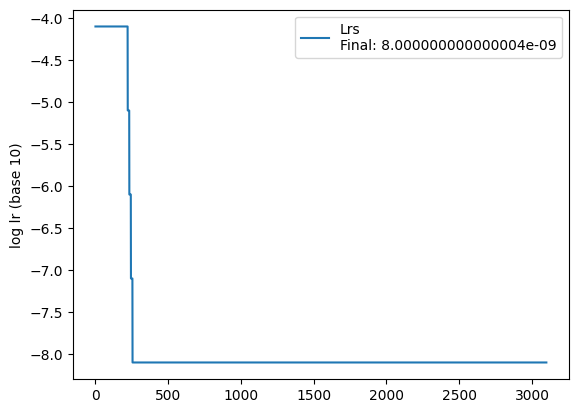


 =============== Epoch 3101 ===============


100%|██████████| 110/110 [00:03<00:00, 30.30it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.77it/s]


 Test accuracy: 39.7%, Avg loss: 6.787706

 =============== Epoch 3102 ===============


100%|██████████| 110/110 [00:03<00:00, 30.70it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.32it/s]


 Test accuracy: 39.7%, Avg loss: 6.787711

 =============== Epoch 3103 ===============


100%|██████████| 110/110 [00:03<00:00, 31.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.16it/s]


 Test accuracy: 39.7%, Avg loss: 6.787715

 =============== Epoch 3104 ===============


100%|██████████| 110/110 [00:03<00:00, 30.36it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.85it/s]


 Test accuracy: 39.7%, Avg loss: 6.787719

 =============== Epoch 3105 ===============


100%|██████████| 110/110 [00:03<00:00, 31.35it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.41it/s]


 Test accuracy: 39.7%, Avg loss: 6.787724

 =============== Epoch 3106 ===============


100%|██████████| 110/110 [00:03<00:00, 30.32it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.787729

 =============== Epoch 3107 ===============


100%|██████████| 110/110 [00:03<00:00, 31.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.787733

 =============== Epoch 3108 ===============


100%|██████████| 110/110 [00:03<00:00, 30.26it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.96it/s]


 Test accuracy: 39.7%, Avg loss: 6.787738

 =============== Epoch 3109 ===============


100%|██████████| 110/110 [00:03<00:00, 31.22it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.23it/s]


 Test accuracy: 39.7%, Avg loss: 6.787742

 =============== Epoch 3110 ===============


100%|██████████| 110/110 [00:03<00:00, 30.73it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.60it/s]


 Test accuracy: 39.7%, Avg loss: 6.787746


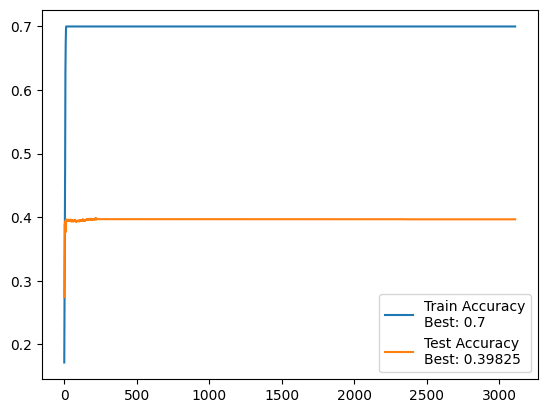

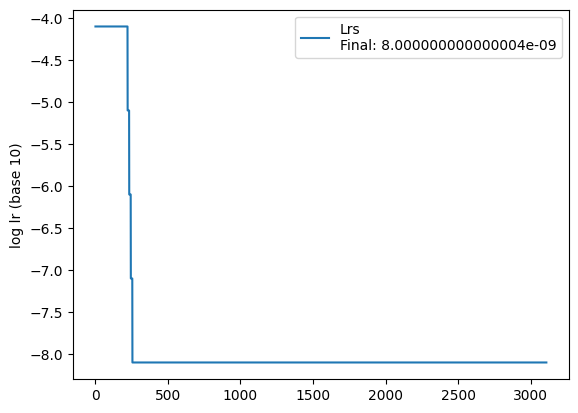


 =============== Epoch 3111 ===============


100%|██████████| 110/110 [00:03<00:00, 31.32it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.787750

 =============== Epoch 3112 ===============


100%|██████████| 110/110 [00:03<00:00, 30.60it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.787755

 =============== Epoch 3113 ===============


100%|██████████| 110/110 [00:03<00:00, 31.24it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.787759

 =============== Epoch 3114 ===============


100%|██████████| 110/110 [00:03<00:00, 30.50it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.787763

 =============== Epoch 3115 ===============


100%|██████████| 110/110 [00:03<00:00, 31.31it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.787767

 =============== Epoch 3116 ===============


100%|██████████| 110/110 [00:03<00:00, 30.66it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.787772

 =============== Epoch 3117 ===============


100%|██████████| 110/110 [00:03<00:00, 30.64it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.787776

 =============== Epoch 3118 ===============


100%|██████████| 110/110 [00:03<00:00, 29.35it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.92it/s]


 Test accuracy: 39.7%, Avg loss: 6.787780

 =============== Epoch 3119 ===============


100%|██████████| 110/110 [00:03<00:00, 30.47it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.08it/s]


 Test accuracy: 39.7%, Avg loss: 6.787785

 =============== Epoch 3120 ===============


100%|██████████| 110/110 [00:03<00:00, 29.71it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.787789


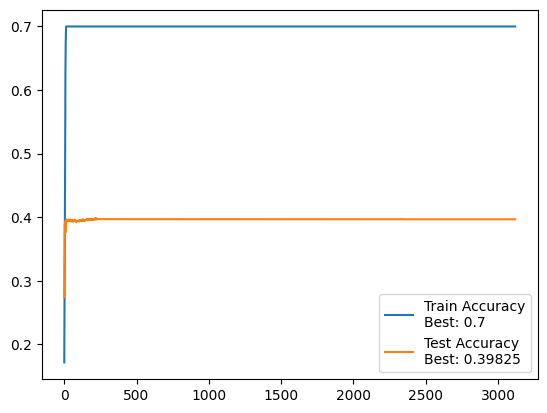

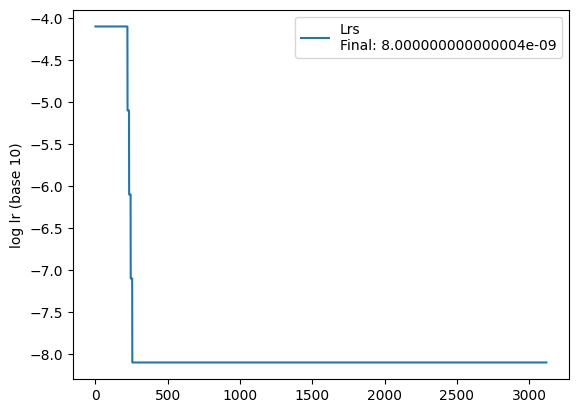


 =============== Epoch 3121 ===============


100%|██████████| 110/110 [00:03<00:00, 30.03it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.01it/s]


 Test accuracy: 39.7%, Avg loss: 6.787794

 =============== Epoch 3122 ===============


100%|██████████| 110/110 [00:03<00:00, 29.79it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.787798

 =============== Epoch 3123 ===============


100%|██████████| 110/110 [00:03<00:00, 30.18it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.24it/s]


 Test accuracy: 39.7%, Avg loss: 6.787802

 =============== Epoch 3124 ===============


100%|██████████| 110/110 [00:03<00:00, 29.77it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.23it/s]


 Test accuracy: 39.7%, Avg loss: 6.787807

 =============== Epoch 3125 ===============


100%|██████████| 110/110 [00:03<00:00, 30.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.31it/s]


 Test accuracy: 39.7%, Avg loss: 6.787812

 =============== Epoch 3126 ===============


100%|██████████| 110/110 [00:03<00:00, 29.64it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.01it/s]


 Test accuracy: 39.7%, Avg loss: 6.787816

 =============== Epoch 3127 ===============


100%|██████████| 110/110 [00:03<00:00, 29.89it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.21it/s]


 Test accuracy: 39.7%, Avg loss: 6.787821

 =============== Epoch 3128 ===============


100%|██████████| 110/110 [00:03<00:00, 29.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.43it/s]


 Test accuracy: 39.7%, Avg loss: 6.787825

 =============== Epoch 3129 ===============


100%|██████████| 110/110 [00:03<00:00, 30.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.787829

 =============== Epoch 3130 ===============


100%|██████████| 110/110 [00:03<00:00, 29.66it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.90it/s]


 Test accuracy: 39.7%, Avg loss: 6.787834


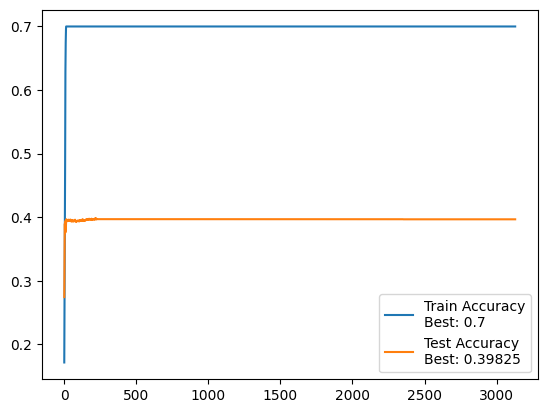

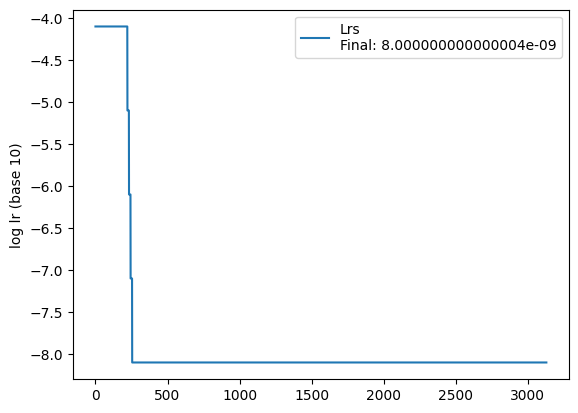


 =============== Epoch 3131 ===============


100%|██████████| 110/110 [00:03<00:00, 30.36it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.787838

 =============== Epoch 3132 ===============


100%|██████████| 110/110 [00:03<00:00, 29.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.787843

 =============== Epoch 3133 ===============


100%|██████████| 110/110 [00:03<00:00, 30.34it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.787847

 =============== Epoch 3134 ===============


100%|██████████| 110/110 [00:03<00:00, 29.58it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.23it/s]


 Test accuracy: 39.7%, Avg loss: 6.787851

 =============== Epoch 3135 ===============


100%|██████████| 110/110 [00:03<00:00, 30.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.787855

 =============== Epoch 3136 ===============


100%|██████████| 110/110 [00:03<00:00, 29.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.87it/s]


 Test accuracy: 39.7%, Avg loss: 6.787860

 =============== Epoch 3137 ===============


100%|██████████| 110/110 [00:03<00:00, 30.30it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.32it/s]


 Test accuracy: 39.7%, Avg loss: 6.787864

 =============== Epoch 3138 ===============


100%|██████████| 110/110 [00:03<00:00, 28.62it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.787869

 =============== Epoch 3139 ===============


100%|██████████| 110/110 [00:03<00:00, 30.42it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.787873

 =============== Epoch 3140 ===============


100%|██████████| 110/110 [00:03<00:00, 29.77it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.93it/s]


 Test accuracy: 39.7%, Avg loss: 6.787877


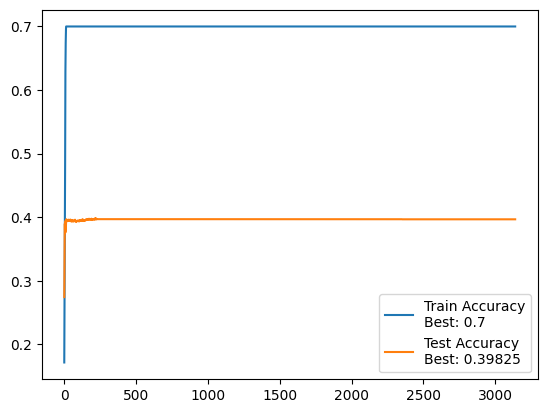

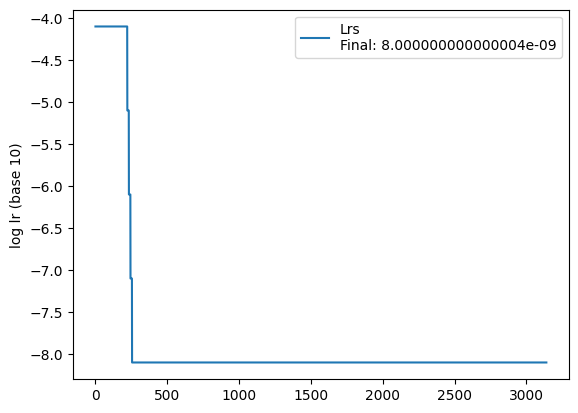


 =============== Epoch 3141 ===============


100%|██████████| 110/110 [00:03<00:00, 30.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.95it/s]


 Test accuracy: 39.7%, Avg loss: 6.787881

 =============== Epoch 3142 ===============


100%|██████████| 110/110 [00:03<00:00, 29.52it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.62it/s]


 Test accuracy: 39.7%, Avg loss: 6.787886

 =============== Epoch 3143 ===============


100%|██████████| 110/110 [00:03<00:00, 30.17it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.49it/s]


 Test accuracy: 39.7%, Avg loss: 6.787890

 =============== Epoch 3144 ===============


100%|██████████| 110/110 [00:03<00:00, 28.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.52it/s]


 Test accuracy: 39.7%, Avg loss: 6.787894

 =============== Epoch 3145 ===============


100%|██████████| 110/110 [00:03<00:00, 30.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.68it/s]


 Test accuracy: 39.7%, Avg loss: 6.787899

 =============== Epoch 3146 ===============


100%|██████████| 110/110 [00:03<00:00, 29.30it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.87it/s]


 Test accuracy: 39.7%, Avg loss: 6.787903

 =============== Epoch 3147 ===============


100%|██████████| 110/110 [00:03<00:00, 30.26it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.09it/s]


 Test accuracy: 39.7%, Avg loss: 6.787907

 =============== Epoch 3148 ===============


100%|██████████| 110/110 [00:03<00:00, 29.33it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.93it/s]


 Test accuracy: 39.7%, Avg loss: 6.787911

 =============== Epoch 3149 ===============


100%|██████████| 110/110 [00:03<00:00, 30.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.787916

 =============== Epoch 3150 ===============


100%|██████████| 110/110 [00:03<00:00, 29.59it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.787920


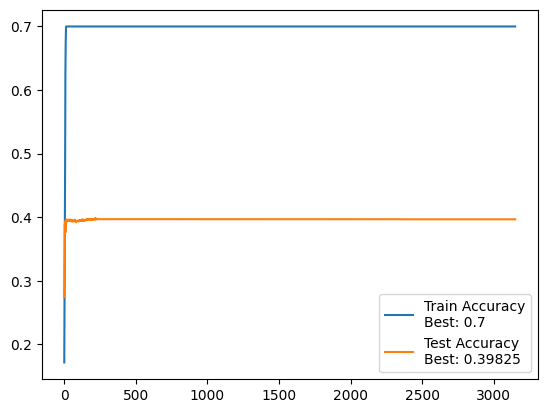

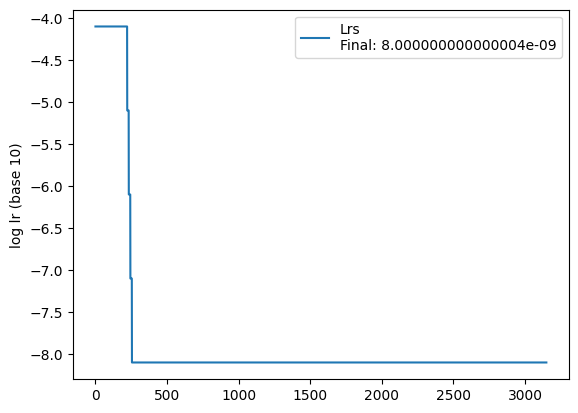


 =============== Epoch 3151 ===============


100%|██████████| 110/110 [00:03<00:00, 30.04it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.11it/s]


 Test accuracy: 39.7%, Avg loss: 6.787924

 =============== Epoch 3152 ===============


100%|██████████| 110/110 [00:03<00:00, 29.60it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.71it/s]


 Test accuracy: 39.7%, Avg loss: 6.787929

 =============== Epoch 3153 ===============


100%|██████████| 110/110 [00:03<00:00, 30.09it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.90it/s]


 Test accuracy: 39.7%, Avg loss: 6.787933

 =============== Epoch 3154 ===============


100%|██████████| 110/110 [00:03<00:00, 29.59it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.787938

 =============== Epoch 3155 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.14it/s]


 Test accuracy: 39.7%, Avg loss: 6.787942

 =============== Epoch 3156 ===============


100%|██████████| 110/110 [00:03<00:00, 30.42it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.19it/s]


 Test accuracy: 39.7%, Avg loss: 6.787946

 =============== Epoch 3157 ===============


100%|██████████| 110/110 [00:03<00:00, 31.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.04it/s]


 Test accuracy: 39.7%, Avg loss: 6.787951

 =============== Epoch 3158 ===============


100%|██████████| 110/110 [00:03<00:00, 30.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.47it/s]


 Test accuracy: 39.7%, Avg loss: 6.787955

 =============== Epoch 3159 ===============


100%|██████████| 110/110 [00:03<00:00, 31.17it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.787959

 =============== Epoch 3160 ===============


100%|██████████| 110/110 [00:03<00:00, 30.50it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.10it/s]


 Test accuracy: 39.7%, Avg loss: 6.787964


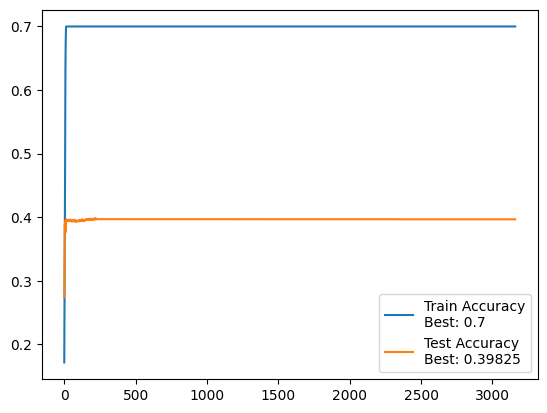

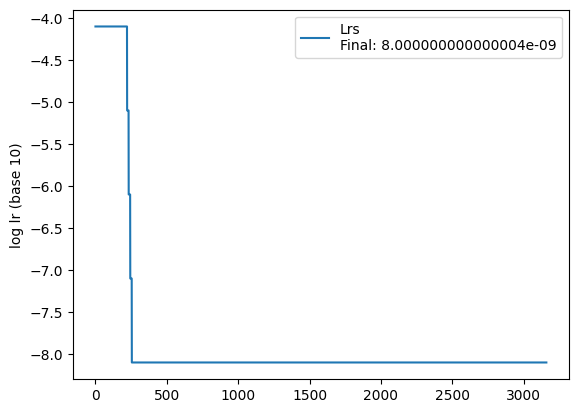


 =============== Epoch 3161 ===============


100%|██████████| 110/110 [00:03<00:00, 31.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.787968

 =============== Epoch 3162 ===============


100%|██████████| 110/110 [00:03<00:00, 30.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.787972

 =============== Epoch 3163 ===============


100%|██████████| 110/110 [00:03<00:00, 31.18it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.787976

 =============== Epoch 3164 ===============


100%|██████████| 110/110 [00:03<00:00, 30.59it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.34it/s]


 Test accuracy: 39.7%, Avg loss: 6.787981

 =============== Epoch 3165 ===============


100%|██████████| 110/110 [00:03<00:00, 31.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.787985

 =============== Epoch 3166 ===============


100%|██████████| 110/110 [00:03<00:00, 30.56it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.81it/s]


 Test accuracy: 39.7%, Avg loss: 6.787989

 =============== Epoch 3167 ===============


100%|██████████| 110/110 [00:03<00:00, 30.37it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.787994

 =============== Epoch 3168 ===============


100%|██████████| 110/110 [00:03<00:00, 30.52it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.787998

 =============== Epoch 3169 ===============


100%|██████████| 110/110 [00:03<00:00, 30.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.40it/s]


 Test accuracy: 39.7%, Avg loss: 6.788002

 =============== Epoch 3170 ===============


100%|██████████| 110/110 [00:03<00:00, 30.67it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.788007


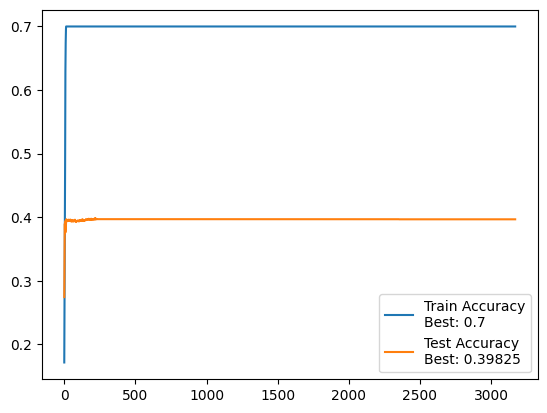

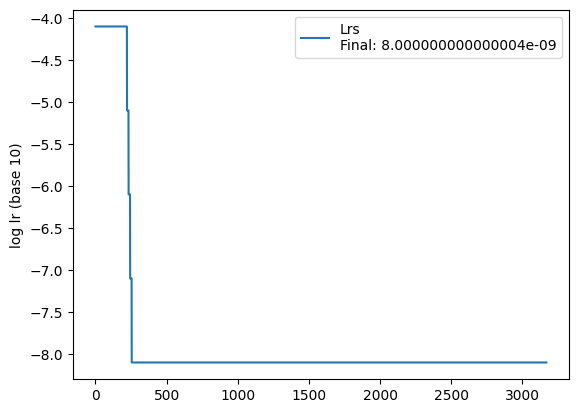


 =============== Epoch 3171 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.10it/s]


 Test accuracy: 39.7%, Avg loss: 6.788011

 =============== Epoch 3172 ===============


100%|██████████| 110/110 [00:03<00:00, 30.36it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.78it/s]


 Test accuracy: 39.7%, Avg loss: 6.788015

 =============== Epoch 3173 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.788020

 =============== Epoch 3174 ===============


100%|██████████| 110/110 [00:03<00:00, 30.69it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.71it/s]


 Test accuracy: 39.7%, Avg loss: 6.788024

 =============== Epoch 3175 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.44it/s]


 Test accuracy: 39.7%, Avg loss: 6.788029

 =============== Epoch 3176 ===============


100%|██████████| 110/110 [00:03<00:00, 30.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.788033

 =============== Epoch 3177 ===============


100%|██████████| 110/110 [00:03<00:00, 31.24it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.97it/s]


 Test accuracy: 39.7%, Avg loss: 6.788037

 =============== Epoch 3178 ===============


100%|██████████| 110/110 [00:03<00:00, 30.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.08it/s]


 Test accuracy: 39.7%, Avg loss: 6.788041

 =============== Epoch 3179 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.47it/s]


 Test accuracy: 39.7%, Avg loss: 6.788046

 =============== Epoch 3180 ===============


100%|██████████| 110/110 [00:03<00:00, 30.50it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.88it/s]


 Test accuracy: 39.7%, Avg loss: 6.788050


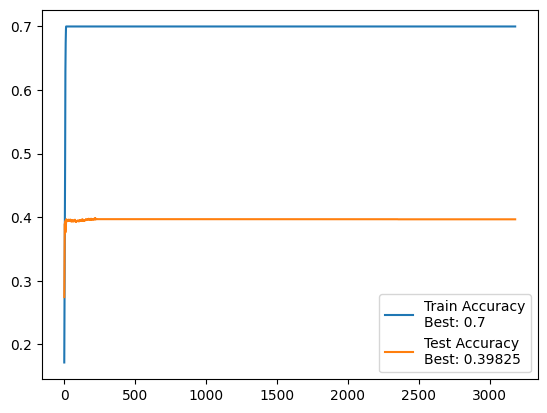

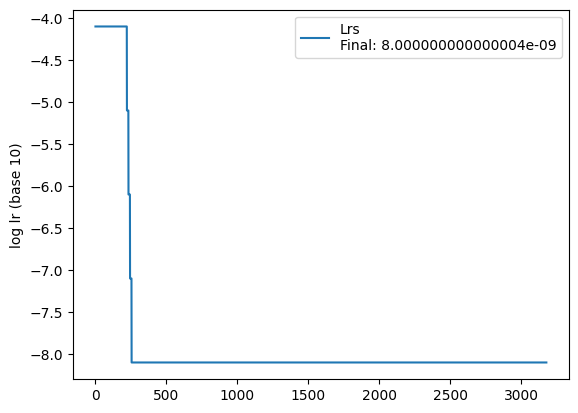


 =============== Epoch 3181 ===============


100%|██████████| 110/110 [00:03<00:00, 31.25it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.75it/s]


 Test accuracy: 39.7%, Avg loss: 6.788054

 =============== Epoch 3182 ===============


100%|██████████| 110/110 [00:03<00:00, 30.62it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.04it/s]


 Test accuracy: 39.7%, Avg loss: 6.788058

 =============== Epoch 3183 ===============


100%|██████████| 110/110 [00:03<00:00, 31.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.04it/s]


 Test accuracy: 39.7%, Avg loss: 6.788063

 =============== Epoch 3184 ===============


100%|██████████| 110/110 [00:03<00:00, 30.68it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.24it/s]


 Test accuracy: 39.7%, Avg loss: 6.788067

 =============== Epoch 3185 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.788071

 =============== Epoch 3186 ===============


100%|██████████| 110/110 [00:03<00:00, 30.46it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.788076

 =============== Epoch 3187 ===============


100%|██████████| 110/110 [00:03<00:00, 31.25it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.788080

 =============== Epoch 3188 ===============


100%|██████████| 110/110 [00:03<00:00, 30.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.78it/s]


 Test accuracy: 39.7%, Avg loss: 6.788084

 =============== Epoch 3189 ===============


100%|██████████| 110/110 [00:03<00:00, 31.22it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.91it/s]


 Test accuracy: 39.7%, Avg loss: 6.788089

 =============== Epoch 3190 ===============


100%|██████████| 110/110 [00:03<00:00, 30.73it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.26it/s]


 Test accuracy: 39.7%, Avg loss: 6.788093


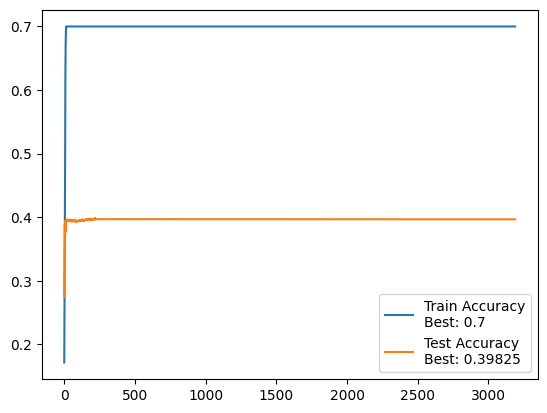

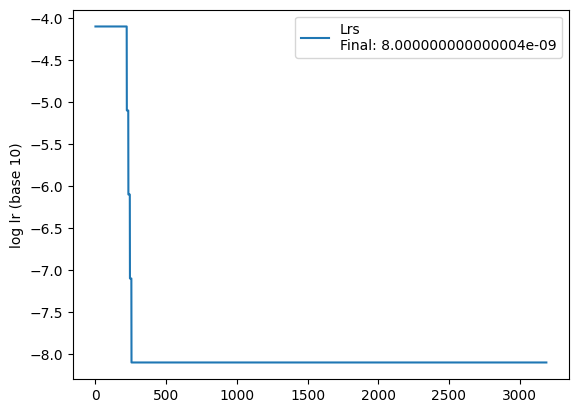


 =============== Epoch 3191 ===============


100%|██████████| 110/110 [00:03<00:00, 31.11it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.788097

 =============== Epoch 3192 ===============


100%|██████████| 110/110 [00:03<00:00, 30.45it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.52it/s]


 Test accuracy: 39.7%, Avg loss: 6.788101

 =============== Epoch 3193 ===============


100%|██████████| 110/110 [00:03<00:00, 30.93it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.788106

 =============== Epoch 3194 ===============


100%|██████████| 110/110 [00:03<00:00, 29.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.788110

 =============== Epoch 3195 ===============


100%|██████████| 110/110 [00:03<00:00, 30.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.96it/s]


 Test accuracy: 39.7%, Avg loss: 6.788114

 =============== Epoch 3196 ===============


100%|██████████| 110/110 [00:03<00:00, 30.57it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.788119

 =============== Epoch 3197 ===============


100%|██████████| 110/110 [00:03<00:00, 31.30it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.89it/s]


 Test accuracy: 39.7%, Avg loss: 6.788123

 =============== Epoch 3198 ===============


100%|██████████| 110/110 [00:03<00:00, 30.85it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.788127

 =============== Epoch 3199 ===============


100%|██████████| 110/110 [00:03<00:00, 31.27it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.788131

 =============== Epoch 3200 ===============


100%|██████████| 110/110 [00:03<00:00, 30.60it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.19it/s]


 Test accuracy: 39.7%, Avg loss: 6.788135


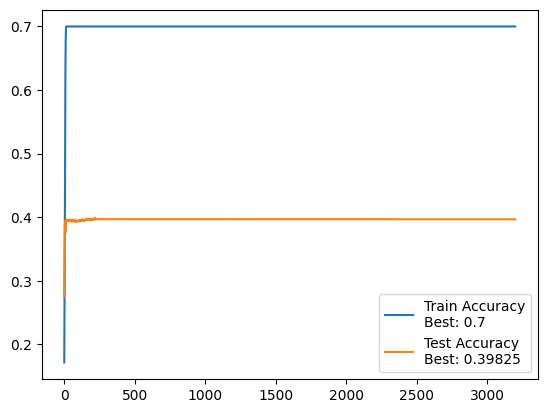

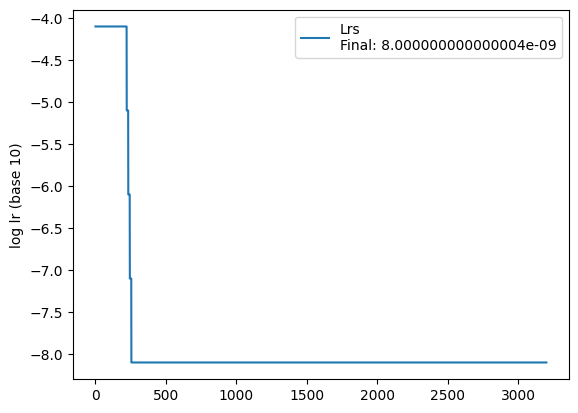


 =============== Epoch 3201 ===============


100%|██████████| 110/110 [00:03<00:00, 31.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.788140

 =============== Epoch 3202 ===============


100%|██████████| 110/110 [00:03<00:00, 30.53it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.29it/s]


 Test accuracy: 39.7%, Avg loss: 6.788144

 =============== Epoch 3203 ===============


100%|██████████| 110/110 [00:03<00:00, 31.36it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.788148

 =============== Epoch 3204 ===============


100%|██████████| 110/110 [00:03<00:00, 30.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.32it/s]


 Test accuracy: 39.7%, Avg loss: 6.788152

 =============== Epoch 3205 ===============


100%|██████████| 110/110 [00:03<00:00, 31.17it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.96it/s]


 Test accuracy: 39.7%, Avg loss: 6.788157

 =============== Epoch 3206 ===============


100%|██████████| 110/110 [00:03<00:00, 30.44it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.788161

 =============== Epoch 3207 ===============


100%|██████████| 110/110 [00:03<00:00, 31.28it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.788165

 =============== Epoch 3208 ===============


100%|██████████| 110/110 [00:03<00:00, 30.62it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.85it/s]


 Test accuracy: 39.7%, Avg loss: 6.788169

 =============== Epoch 3209 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.78it/s]


 Test accuracy: 39.7%, Avg loss: 6.788173

 =============== Epoch 3210 ===============


100%|██████████| 110/110 [00:03<00:00, 30.63it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.26it/s]


 Test accuracy: 39.7%, Avg loss: 6.788177


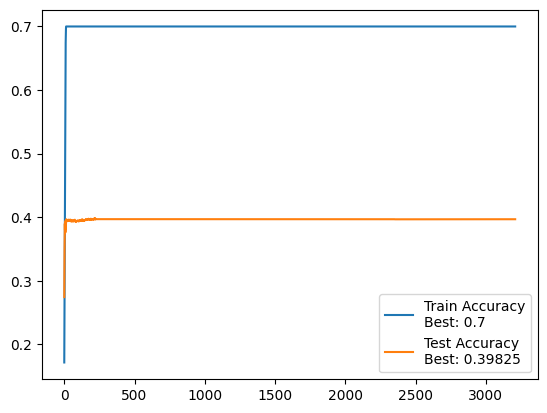

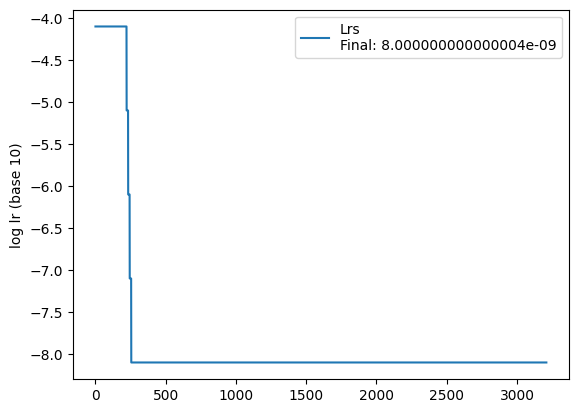


 =============== Epoch 3211 ===============


100%|██████████| 110/110 [00:03<00:00, 31.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.788182

 =============== Epoch 3212 ===============


100%|██████████| 110/110 [00:03<00:00, 30.75it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.33it/s]


 Test accuracy: 39.7%, Avg loss: 6.788186

 =============== Epoch 3213 ===============


100%|██████████| 110/110 [00:03<00:00, 31.52it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.788190

 =============== Epoch 3214 ===============


100%|██████████| 110/110 [00:03<00:00, 30.75it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.788195

 =============== Epoch 3215 ===============


100%|██████████| 110/110 [00:03<00:00, 31.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.31it/s]


 Test accuracy: 39.7%, Avg loss: 6.788199

 =============== Epoch 3216 ===============


100%|██████████| 110/110 [00:03<00:00, 30.61it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.66it/s]


 Test accuracy: 39.7%, Avg loss: 6.788203

 =============== Epoch 3217 ===============


100%|██████████| 110/110 [00:03<00:00, 31.03it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.66it/s]


 Test accuracy: 39.7%, Avg loss: 6.788207

 =============== Epoch 3218 ===============


100%|██████████| 110/110 [00:03<00:00, 30.69it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.788211

 =============== Epoch 3219 ===============


100%|██████████| 110/110 [00:03<00:00, 31.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.788215

 =============== Epoch 3220 ===============


100%|██████████| 110/110 [00:03<00:00, 30.71it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.788220


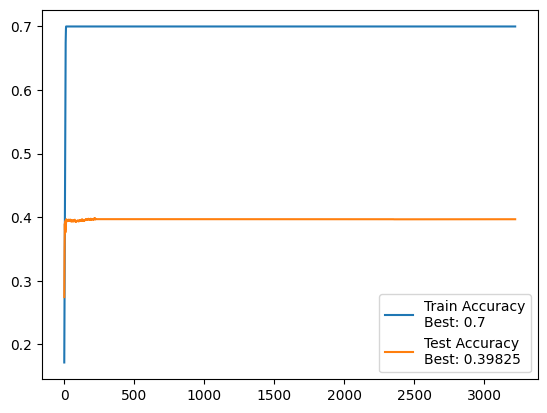

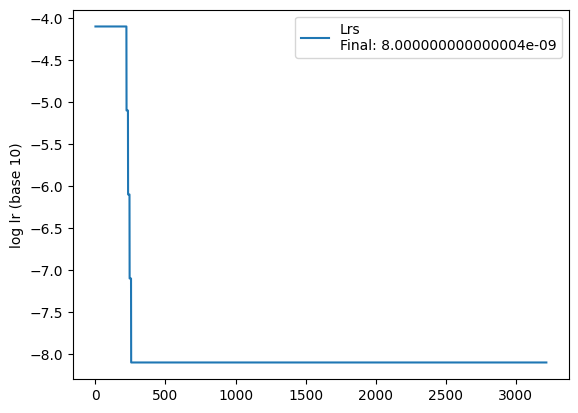


 =============== Epoch 3221 ===============


100%|██████████| 110/110 [00:03<00:00, 31.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.30it/s]


 Test accuracy: 39.7%, Avg loss: 6.788223

 =============== Epoch 3222 ===============


100%|██████████| 110/110 [00:03<00:00, 30.37it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.40it/s]


 Test accuracy: 39.7%, Avg loss: 6.788228

 =============== Epoch 3223 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.75it/s]


 Test accuracy: 39.7%, Avg loss: 6.788232

 =============== Epoch 3224 ===============


100%|██████████| 110/110 [00:03<00:00, 30.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.788236

 =============== Epoch 3225 ===============


100%|██████████| 110/110 [00:03<00:00, 31.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.91it/s]


 Test accuracy: 39.7%, Avg loss: 6.788240

 =============== Epoch 3226 ===============


100%|██████████| 110/110 [00:03<00:00, 30.61it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.16it/s]


 Test accuracy: 39.7%, Avg loss: 6.788245

 =============== Epoch 3227 ===============


100%|██████████| 110/110 [00:03<00:00, 31.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.37it/s]


 Test accuracy: 39.7%, Avg loss: 6.788249

 =============== Epoch 3228 ===============


100%|██████████| 110/110 [00:03<00:00, 30.62it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.84it/s]


 Test accuracy: 39.7%, Avg loss: 6.788252

 =============== Epoch 3229 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.788257

 =============== Epoch 3230 ===============


100%|██████████| 110/110 [00:03<00:00, 30.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.788261


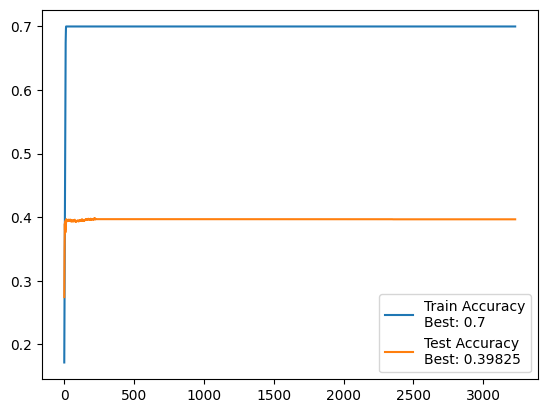

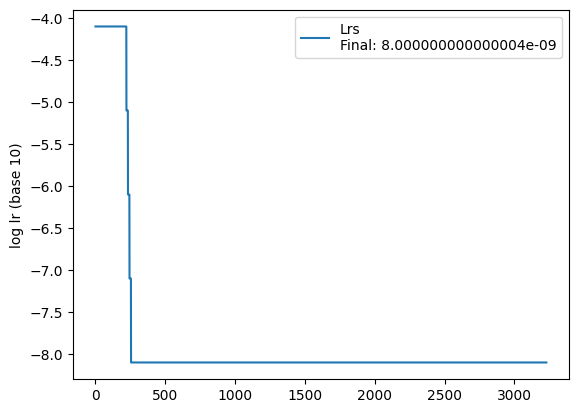


 =============== Epoch 3231 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.788265

 =============== Epoch 3232 ===============


100%|██████████| 110/110 [00:03<00:00, 30.50it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.21it/s]


 Test accuracy: 39.7%, Avg loss: 6.788269

 =============== Epoch 3233 ===============


100%|██████████| 110/110 [00:03<00:00, 31.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.16it/s]


 Test accuracy: 39.7%, Avg loss: 6.788274

 =============== Epoch 3234 ===============


100%|██████████| 110/110 [00:03<00:00, 30.71it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.85it/s]


 Test accuracy: 39.7%, Avg loss: 6.788278

 =============== Epoch 3235 ===============


100%|██████████| 110/110 [00:03<00:00, 31.33it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.788281

 =============== Epoch 3236 ===============


100%|██████████| 110/110 [00:03<00:00, 30.40it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.66it/s]


 Test accuracy: 39.7%, Avg loss: 6.788285

 =============== Epoch 3237 ===============


100%|██████████| 110/110 [00:03<00:00, 31.22it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.34it/s]


 Test accuracy: 39.7%, Avg loss: 6.788290

 =============== Epoch 3238 ===============


100%|██████████| 110/110 [00:03<00:00, 30.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.97it/s]


 Test accuracy: 39.7%, Avg loss: 6.788294

 =============== Epoch 3239 ===============


100%|██████████| 110/110 [00:03<00:00, 31.27it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.91it/s]


 Test accuracy: 39.7%, Avg loss: 6.788298

 =============== Epoch 3240 ===============


100%|██████████| 110/110 [00:03<00:00, 30.56it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.19it/s]


 Test accuracy: 39.7%, Avg loss: 6.788302


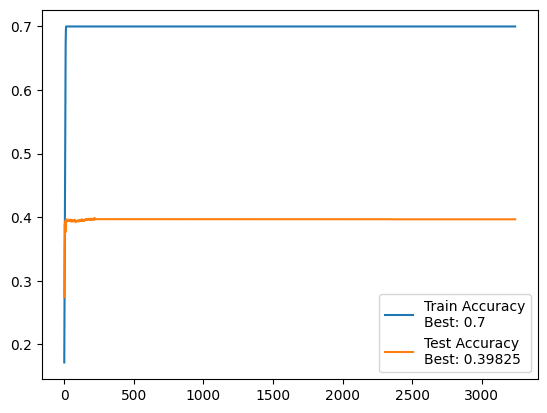

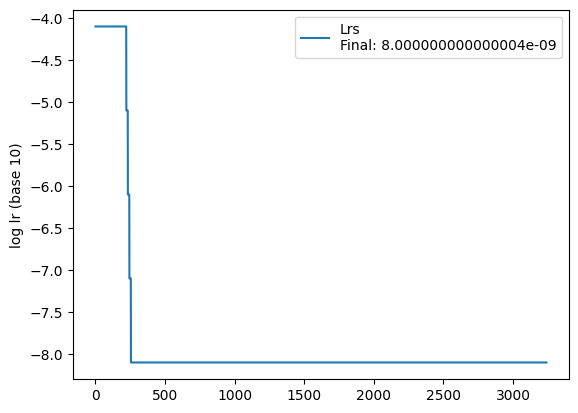


 =============== Epoch 3241 ===============


100%|██████████| 110/110 [00:03<00:00, 30.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.788306

 =============== Epoch 3242 ===============


100%|██████████| 110/110 [00:03<00:00, 30.50it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.83it/s]


 Test accuracy: 39.7%, Avg loss: 6.788309

 =============== Epoch 3243 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.788314

 =============== Epoch 3244 ===============


100%|██████████| 110/110 [00:03<00:00, 30.64it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.97it/s]


 Test accuracy: 39.7%, Avg loss: 6.788317

 =============== Epoch 3245 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.24it/s]


 Test accuracy: 39.7%, Avg loss: 6.788322

 =============== Epoch 3246 ===============


100%|██████████| 110/110 [00:03<00:00, 30.34it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.88it/s]


 Test accuracy: 39.7%, Avg loss: 6.788325

 =============== Epoch 3247 ===============


100%|██████████| 110/110 [00:03<00:00, 30.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.38it/s]


 Test accuracy: 39.7%, Avg loss: 6.788330

 =============== Epoch 3248 ===============


100%|██████████| 110/110 [00:03<00:00, 30.73it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.788334

 =============== Epoch 3249 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.81it/s]


 Test accuracy: 39.7%, Avg loss: 6.788338

 =============== Epoch 3250 ===============


100%|██████████| 110/110 [00:03<00:00, 30.49it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.77it/s]


 Test accuracy: 39.7%, Avg loss: 6.788342


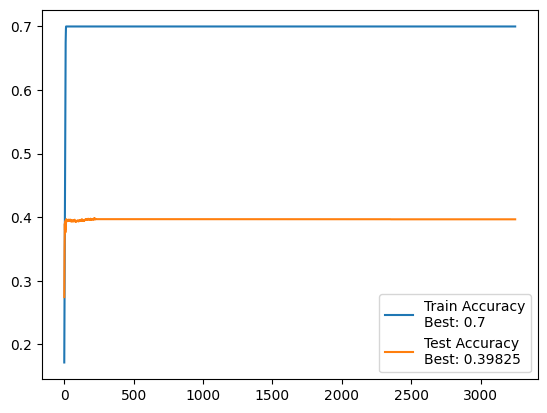

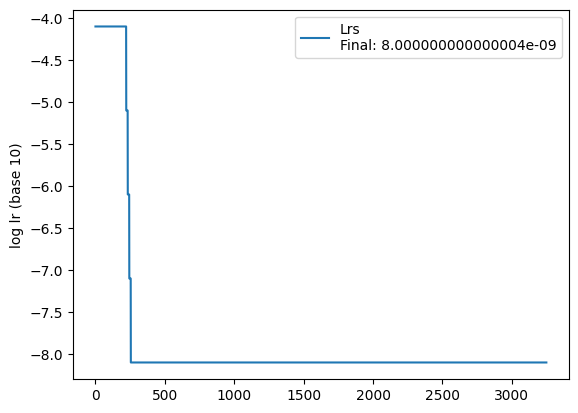


 =============== Epoch 3251 ===============


100%|██████████| 110/110 [00:03<00:00, 31.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.788346

 =============== Epoch 3252 ===============


100%|██████████| 110/110 [00:03<00:00, 30.72it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.91it/s]


 Test accuracy: 39.7%, Avg loss: 6.788350

 =============== Epoch 3253 ===============


100%|██████████| 110/110 [00:03<00:00, 31.04it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.77it/s]


 Test accuracy: 39.7%, Avg loss: 6.788354

 =============== Epoch 3254 ===============


100%|██████████| 110/110 [00:03<00:00, 30.54it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.72it/s]


 Test accuracy: 39.7%, Avg loss: 6.788358

 =============== Epoch 3255 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.788362

 =============== Epoch 3256 ===============


100%|██████████| 110/110 [00:03<00:00, 30.45it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.16it/s]


 Test accuracy: 39.7%, Avg loss: 6.788366

 =============== Epoch 3257 ===============


100%|██████████| 110/110 [00:03<00:00, 31.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.92it/s]


 Test accuracy: 39.7%, Avg loss: 6.788370

 =============== Epoch 3258 ===============


100%|██████████| 110/110 [00:03<00:00, 30.34it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.788373

 =============== Epoch 3259 ===============


100%|██████████| 110/110 [00:03<00:00, 31.32it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.788377

 =============== Epoch 3260 ===============


100%|██████████| 110/110 [00:03<00:00, 30.85it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.34it/s]


 Test accuracy: 39.7%, Avg loss: 6.788381


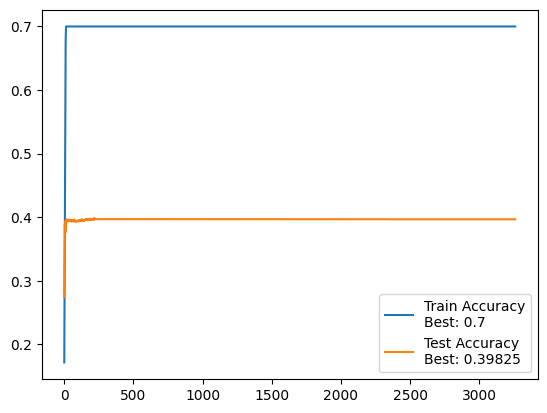

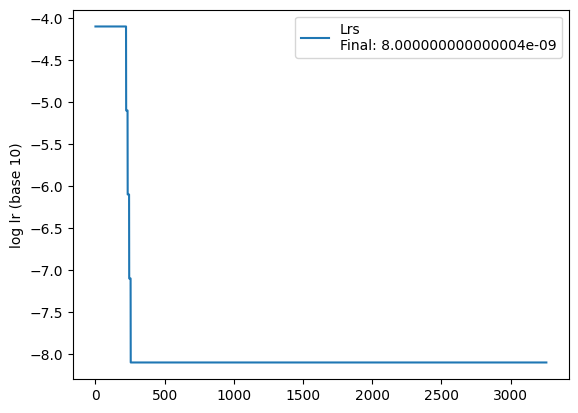


 =============== Epoch 3261 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.788386

 =============== Epoch 3262 ===============


100%|██████████| 110/110 [00:03<00:00, 30.45it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.40it/s]


 Test accuracy: 39.7%, Avg loss: 6.788389

 =============== Epoch 3263 ===============


100%|██████████| 110/110 [00:03<00:00, 31.07it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.44it/s]


 Test accuracy: 39.7%, Avg loss: 6.788393

 =============== Epoch 3264 ===============


100%|██████████| 110/110 [00:03<00:00, 30.17it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.25it/s]


 Test accuracy: 39.7%, Avg loss: 6.788398

 =============== Epoch 3265 ===============


100%|██████████| 110/110 [00:03<00:00, 31.30it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.16it/s]


 Test accuracy: 39.7%, Avg loss: 6.788401

 =============== Epoch 3266 ===============


100%|██████████| 110/110 [00:03<00:00, 30.66it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.91it/s]


 Test accuracy: 39.7%, Avg loss: 6.788405

 =============== Epoch 3267 ===============


100%|██████████| 110/110 [00:03<00:00, 31.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.788409

 =============== Epoch 3268 ===============


100%|██████████| 110/110 [00:03<00:00, 30.68it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.788413

 =============== Epoch 3269 ===============


100%|██████████| 110/110 [00:03<00:00, 31.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.788417

 =============== Epoch 3270 ===============


100%|██████████| 110/110 [00:03<00:00, 30.15it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.66it/s]


 Test accuracy: 39.7%, Avg loss: 6.788421


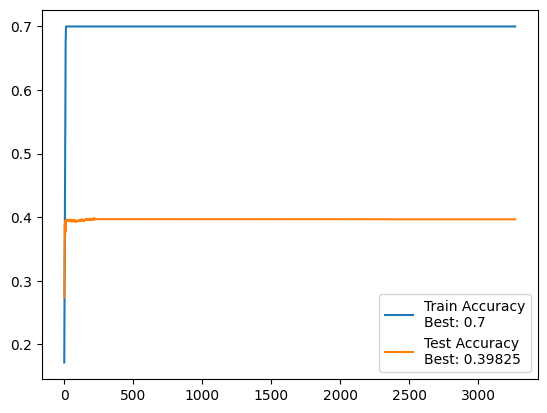

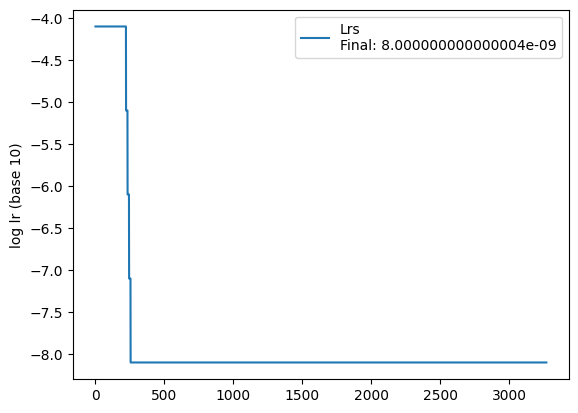


 =============== Epoch 3271 ===============


100%|██████████| 110/110 [00:03<00:00, 31.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.25it/s]


 Test accuracy: 39.7%, Avg loss: 6.788425

 =============== Epoch 3272 ===============


100%|██████████| 110/110 [00:03<00:00, 30.51it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.89it/s]


 Test accuracy: 39.7%, Avg loss: 6.788429

 =============== Epoch 3273 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.49it/s]


 Test accuracy: 39.7%, Avg loss: 6.788433

 =============== Epoch 3274 ===============


100%|██████████| 110/110 [00:03<00:00, 30.38it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.788437

 =============== Epoch 3275 ===============


100%|██████████| 110/110 [00:03<00:00, 31.27it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.62it/s]


 Test accuracy: 39.7%, Avg loss: 6.788441

 =============== Epoch 3276 ===============


100%|██████████| 110/110 [00:03<00:00, 30.56it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.89it/s]


 Test accuracy: 39.7%, Avg loss: 6.788444

 =============== Epoch 3277 ===============


100%|██████████| 110/110 [00:03<00:00, 31.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.788448

 =============== Epoch 3278 ===============


100%|██████████| 110/110 [00:03<00:00, 30.50it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.788452

 =============== Epoch 3279 ===============


100%|██████████| 110/110 [00:03<00:00, 31.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.44it/s]


 Test accuracy: 39.7%, Avg loss: 6.788456

 =============== Epoch 3280 ===============


100%|██████████| 110/110 [00:03<00:00, 30.85it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.788460


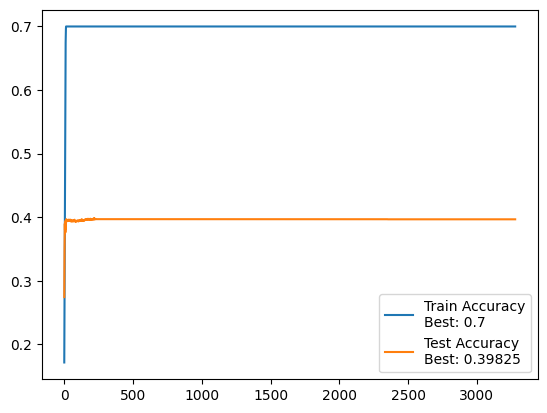

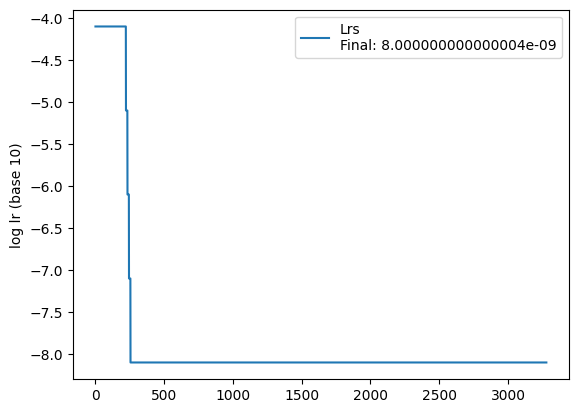


 =============== Epoch 3281 ===============


100%|██████████| 110/110 [00:03<00:00, 30.69it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.788464

 =============== Epoch 3282 ===============


100%|██████████| 110/110 [00:03<00:00, 31.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.78it/s]


 Test accuracy: 39.7%, Avg loss: 6.788468

 =============== Epoch 3283 ===============


100%|██████████| 110/110 [00:03<00:00, 30.95it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.52it/s]


 Test accuracy: 39.7%, Avg loss: 6.788471

 =============== Epoch 3284 ===============


100%|██████████| 110/110 [00:03<00:00, 30.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.18it/s]


 Test accuracy: 39.7%, Avg loss: 6.788475

 =============== Epoch 3285 ===============


100%|██████████| 110/110 [00:03<00:00, 31.03it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.84it/s]


 Test accuracy: 39.7%, Avg loss: 6.788479

 =============== Epoch 3286 ===============


100%|██████████| 110/110 [00:03<00:00, 31.24it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.788483

 =============== Epoch 3287 ===============


100%|██████████| 110/110 [00:03<00:00, 31.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.09it/s]


 Test accuracy: 39.7%, Avg loss: 6.788487

 =============== Epoch 3288 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.788491

 =============== Epoch 3289 ===============


100%|██████████| 110/110 [00:03<00:00, 31.11it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.788494

 =============== Epoch 3290 ===============


100%|██████████| 110/110 [00:03<00:00, 31.28it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.08it/s]


 Test accuracy: 39.7%, Avg loss: 6.788498


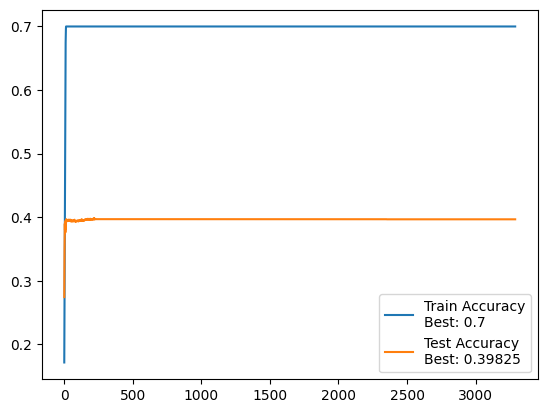

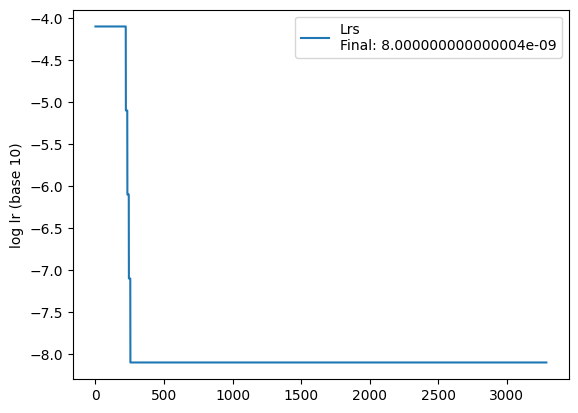


 =============== Epoch 3291 ===============


100%|██████████| 110/110 [00:03<00:00, 28.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.99it/s]


 Test accuracy: 39.7%, Avg loss: 6.788502

 =============== Epoch 3292 ===============


100%|██████████| 110/110 [00:03<00:00, 30.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.788506

 =============== Epoch 3293 ===============


100%|██████████| 110/110 [00:03<00:00, 30.52it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.788510

 =============== Epoch 3294 ===============


100%|██████████| 110/110 [00:03<00:00, 31.04it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.19it/s]


 Test accuracy: 39.7%, Avg loss: 6.788514

 =============== Epoch 3295 ===============


100%|██████████| 110/110 [00:03<00:00, 29.39it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.29it/s]


 Test accuracy: 39.7%, Avg loss: 6.788518

 =============== Epoch 3296 ===============


100%|██████████| 110/110 [00:03<00:00, 30.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.90it/s]


 Test accuracy: 39.7%, Avg loss: 6.788522

 =============== Epoch 3297 ===============


100%|██████████| 110/110 [00:03<00:00, 29.51it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.31it/s]


 Test accuracy: 39.7%, Avg loss: 6.788525

 =============== Epoch 3298 ===============


100%|██████████| 110/110 [00:03<00:00, 30.94it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.72it/s]


 Test accuracy: 39.7%, Avg loss: 6.788529

 =============== Epoch 3299 ===============


100%|██████████| 110/110 [00:03<00:00, 30.51it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.26it/s]


 Test accuracy: 39.7%, Avg loss: 6.788534

 =============== Epoch 3300 ===============


100%|██████████| 110/110 [00:03<00:00, 31.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.88it/s]


 Test accuracy: 39.7%, Avg loss: 6.788537


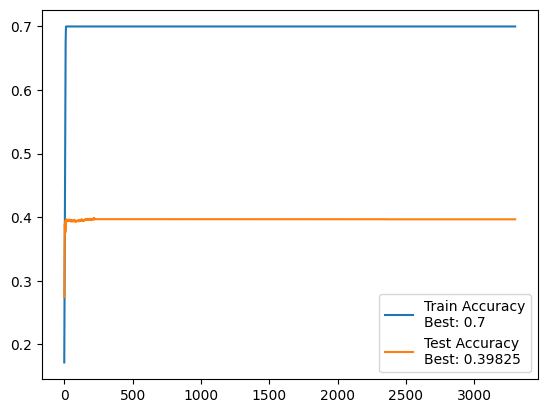

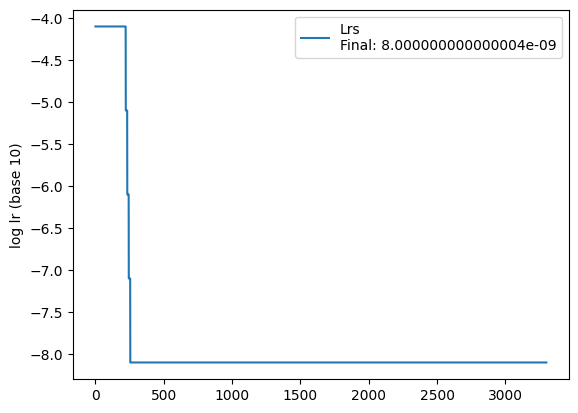


 =============== Epoch 3301 ===============


100%|██████████| 110/110 [00:03<00:00, 31.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.788541

 =============== Epoch 3302 ===============


100%|██████████| 110/110 [00:03<00:00, 31.25it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.81it/s]


 Test accuracy: 39.7%, Avg loss: 6.788545

 =============== Epoch 3303 ===============


100%|██████████| 110/110 [00:03<00:00, 30.34it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.92it/s]


 Test accuracy: 39.7%, Avg loss: 6.788549

 =============== Epoch 3304 ===============


100%|██████████| 110/110 [00:03<00:00, 30.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.83it/s]


 Test accuracy: 39.7%, Avg loss: 6.788553

 =============== Epoch 3305 ===============


100%|██████████| 110/110 [00:03<00:00, 30.56it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.81it/s]


 Test accuracy: 39.7%, Avg loss: 6.788556

 =============== Epoch 3306 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.31it/s]


 Test accuracy: 39.7%, Avg loss: 6.788561

 =============== Epoch 3307 ===============


100%|██████████| 110/110 [00:03<00:00, 30.57it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.788564

 =============== Epoch 3308 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.788568

 =============== Epoch 3309 ===============


100%|██████████| 110/110 [00:03<00:00, 30.40it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.34it/s]


 Test accuracy: 39.7%, Avg loss: 6.788572

 =============== Epoch 3310 ===============


100%|██████████| 110/110 [00:03<00:00, 31.02it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.788576


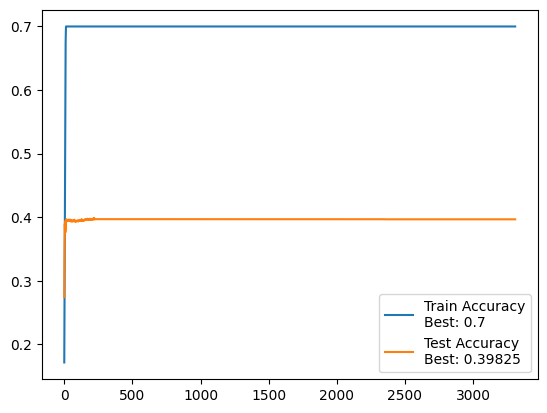

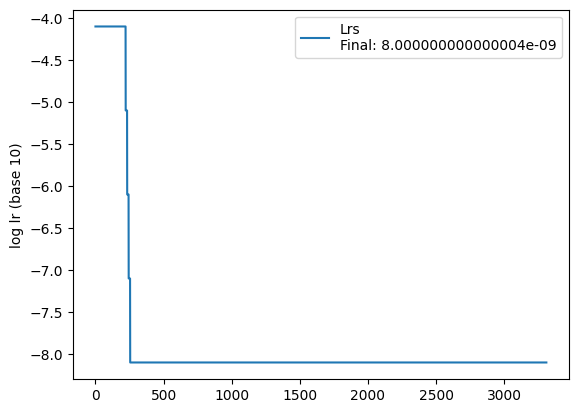


 =============== Epoch 3311 ===============


100%|██████████| 110/110 [00:03<00:00, 31.04it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.04it/s]


 Test accuracy: 39.7%, Avg loss: 6.788580

 =============== Epoch 3312 ===============


100%|██████████| 110/110 [00:03<00:00, 31.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.08it/s]


 Test accuracy: 39.7%, Avg loss: 6.788584

 =============== Epoch 3313 ===============


100%|██████████| 110/110 [00:03<00:00, 30.54it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.81it/s]


 Test accuracy: 39.7%, Avg loss: 6.788588

 =============== Epoch 3314 ===============


100%|██████████| 110/110 [00:03<00:00, 31.11it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.10it/s]


 Test accuracy: 39.7%, Avg loss: 6.788591

 =============== Epoch 3315 ===============


100%|██████████| 110/110 [00:03<00:00, 29.52it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.788595

 =============== Epoch 3316 ===============


100%|██████████| 110/110 [00:03<00:00, 29.34it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.788599

 =============== Epoch 3317 ===============


100%|██████████| 110/110 [00:03<00:00, 29.22it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.788603

 =============== Epoch 3318 ===============


100%|██████████| 110/110 [00:03<00:00, 30.50it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.31it/s]


 Test accuracy: 39.7%, Avg loss: 6.788607

 =============== Epoch 3319 ===============


100%|██████████| 110/110 [00:03<00:00, 30.38it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.33it/s]


 Test accuracy: 39.7%, Avg loss: 6.788611

 =============== Epoch 3320 ===============


100%|██████████| 110/110 [00:03<00:00, 30.78it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.27it/s]


 Test accuracy: 39.7%, Avg loss: 6.788615


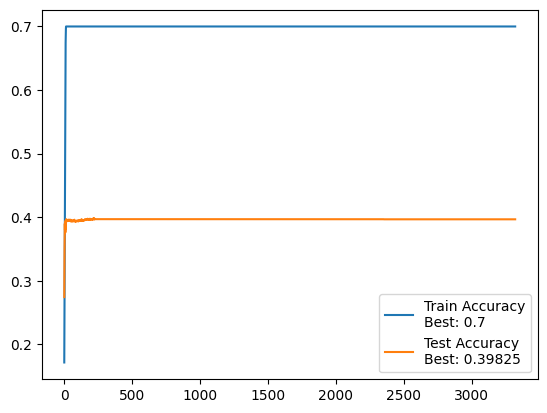

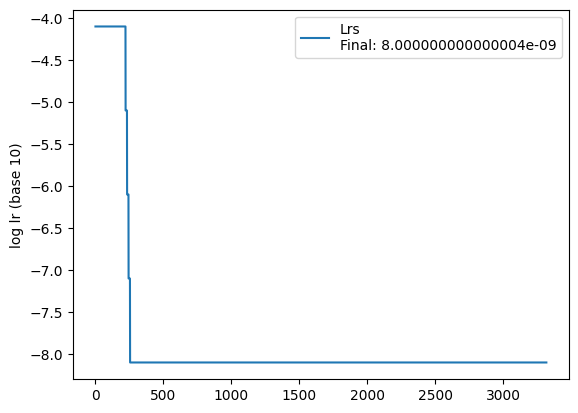


 =============== Epoch 3321 ===============


100%|██████████| 110/110 [00:03<00:00, 29.62it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.85it/s]


 Test accuracy: 39.7%, Avg loss: 6.788619

 =============== Epoch 3322 ===============


100%|██████████| 110/110 [00:03<00:00, 30.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.47it/s]


 Test accuracy: 39.7%, Avg loss: 6.788622

 =============== Epoch 3323 ===============


100%|██████████| 110/110 [00:03<00:00, 30.65it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.96it/s]


 Test accuracy: 39.7%, Avg loss: 6.788626

 =============== Epoch 3324 ===============


100%|██████████| 110/110 [00:03<00:00, 29.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.68it/s]


 Test accuracy: 39.7%, Avg loss: 6.788630

 =============== Epoch 3325 ===============


100%|██████████| 110/110 [00:03<00:00, 29.72it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.30it/s]


 Test accuracy: 39.7%, Avg loss: 6.788634

 =============== Epoch 3326 ===============


100%|██████████| 110/110 [00:03<00:00, 30.84it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.84it/s]


 Test accuracy: 39.7%, Avg loss: 6.788638

 =============== Epoch 3327 ===============


100%|██████████| 110/110 [00:03<00:00, 30.62it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.97it/s]


 Test accuracy: 39.7%, Avg loss: 6.788642

 =============== Epoch 3328 ===============


100%|██████████| 110/110 [00:03<00:00, 30.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.24it/s]


 Test accuracy: 39.7%, Avg loss: 6.788646

 =============== Epoch 3329 ===============


100%|██████████| 110/110 [00:03<00:00, 30.38it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.788650

 =============== Epoch 3330 ===============


100%|██████████| 110/110 [00:03<00:00, 30.91it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.26it/s]


 Test accuracy: 39.7%, Avg loss: 6.788654


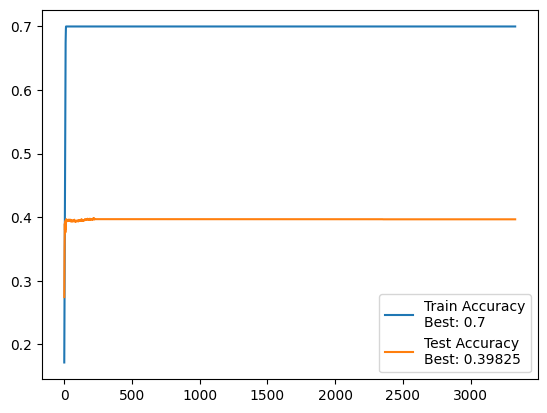

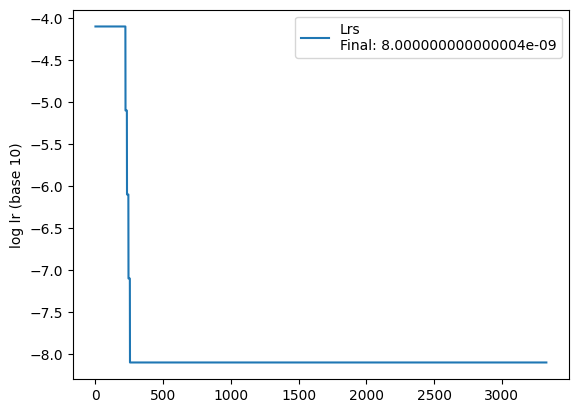


 =============== Epoch 3331 ===============


100%|██████████| 110/110 [00:03<00:00, 30.28it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.788658

 =============== Epoch 3332 ===============


100%|██████████| 110/110 [00:03<00:00, 31.30it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.788662

 =============== Epoch 3333 ===============


100%|██████████| 110/110 [00:03<00:00, 30.89it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.788666

 =============== Epoch 3334 ===============


100%|██████████| 110/110 [00:03<00:00, 31.48it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.26it/s]


 Test accuracy: 39.7%, Avg loss: 6.788670

 =============== Epoch 3335 ===============


100%|██████████| 110/110 [00:03<00:00, 30.42it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.97it/s]


 Test accuracy: 39.7%, Avg loss: 6.788673

 =============== Epoch 3336 ===============


100%|██████████| 110/110 [00:03<00:00, 31.11it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.68it/s]


 Test accuracy: 39.7%, Avg loss: 6.788677

 =============== Epoch 3337 ===============


100%|██████████| 110/110 [00:03<00:00, 29.22it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.49it/s]


 Test accuracy: 39.7%, Avg loss: 6.788681

 =============== Epoch 3338 ===============


100%|██████████| 110/110 [00:03<00:00, 30.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.16it/s]


 Test accuracy: 39.7%, Avg loss: 6.788686

 =============== Epoch 3339 ===============


100%|██████████| 110/110 [00:03<00:00, 31.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.788689

 =============== Epoch 3340 ===============


100%|██████████| 110/110 [00:03<00:00, 31.43it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.81it/s]


 Test accuracy: 39.7%, Avg loss: 6.788693


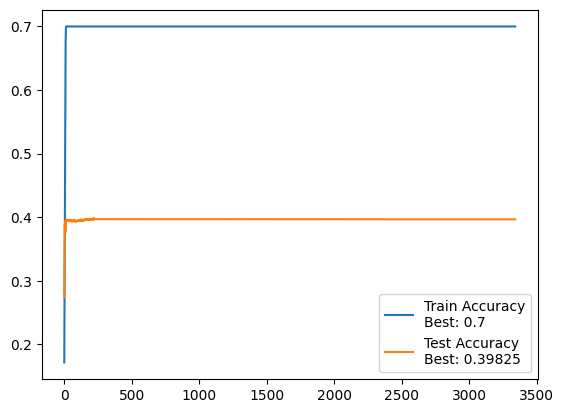

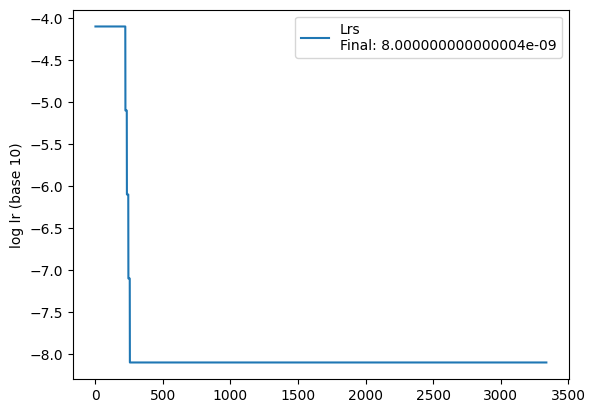


 =============== Epoch 3341 ===============


100%|██████████| 110/110 [00:03<00:00, 31.28it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.25it/s]


 Test accuracy: 39.7%, Avg loss: 6.788697

 =============== Epoch 3342 ===============


100%|██████████| 110/110 [00:03<00:00, 31.17it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.788700

 =============== Epoch 3343 ===============


100%|██████████| 110/110 [00:03<00:00, 31.02it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.34it/s]


 Test accuracy: 39.7%, Avg loss: 6.788705

 =============== Epoch 3344 ===============


100%|██████████| 110/110 [00:03<00:00, 31.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.28it/s]


 Test accuracy: 39.7%, Avg loss: 6.788708

 =============== Epoch 3345 ===============


100%|██████████| 110/110 [00:03<00:00, 30.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.788712

 =============== Epoch 3346 ===============


100%|██████████| 110/110 [00:03<00:00, 31.56it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.788716

 =============== Epoch 3347 ===============


100%|██████████| 110/110 [00:03<00:00, 31.37it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.76it/s]


 Test accuracy: 39.7%, Avg loss: 6.788720

 =============== Epoch 3348 ===============


100%|██████████| 110/110 [00:03<00:00, 31.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.788724

 =============== Epoch 3349 ===============


100%|██████████| 110/110 [00:03<00:00, 31.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.788728

 =============== Epoch 3350 ===============


100%|██████████| 110/110 [00:03<00:00, 31.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.88it/s]


 Test accuracy: 39.7%, Avg loss: 6.788732


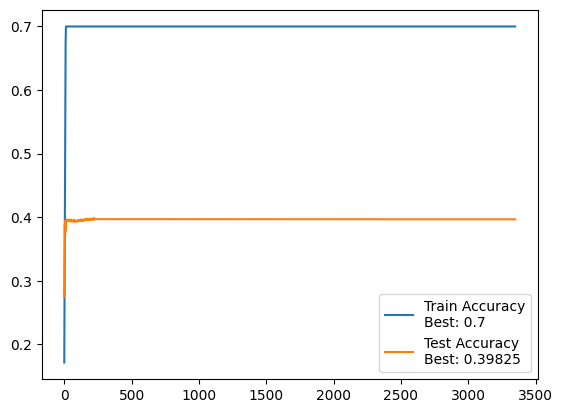

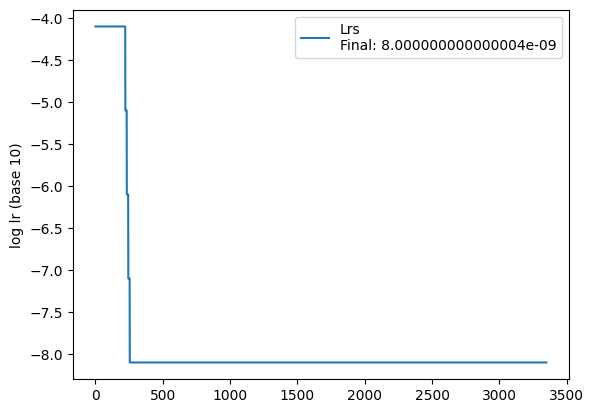


 =============== Epoch 3351 ===============


100%|██████████| 110/110 [00:03<00:00, 31.52it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.788735

 =============== Epoch 3352 ===============


100%|██████████| 110/110 [00:03<00:00, 29.44it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.788739

 =============== Epoch 3353 ===============


100%|██████████| 110/110 [00:03<00:00, 30.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.41it/s]


 Test accuracy: 39.7%, Avg loss: 6.788743

 =============== Epoch 3354 ===============


100%|██████████| 110/110 [00:03<00:00, 30.63it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.788747

 =============== Epoch 3355 ===============


100%|██████████| 110/110 [00:03<00:00, 31.28it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.71it/s]


 Test accuracy: 39.7%, Avg loss: 6.788751

 =============== Epoch 3356 ===============


100%|██████████| 110/110 [00:03<00:00, 29.59it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.88it/s]


 Test accuracy: 39.7%, Avg loss: 6.788755

 =============== Epoch 3357 ===============


100%|██████████| 110/110 [00:03<00:00, 29.79it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.788758

 =============== Epoch 3358 ===============


100%|██████████| 110/110 [00:03<00:00, 28.50it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.98it/s]


 Test accuracy: 39.7%, Avg loss: 6.788763

 =============== Epoch 3359 ===============


100%|██████████| 110/110 [00:03<00:00, 29.34it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.788767

 =============== Epoch 3360 ===============


100%|██████████| 110/110 [00:03<00:00, 29.71it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.28it/s]


 Test accuracy: 39.7%, Avg loss: 6.788770


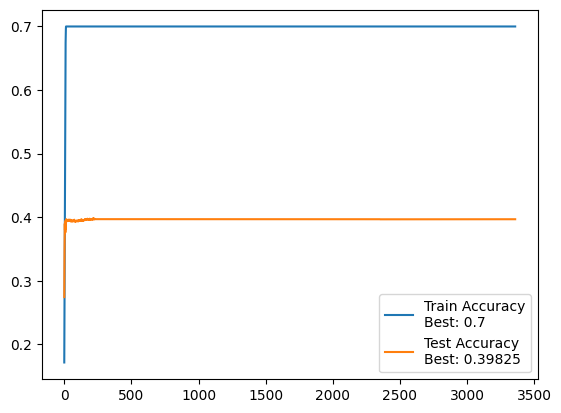

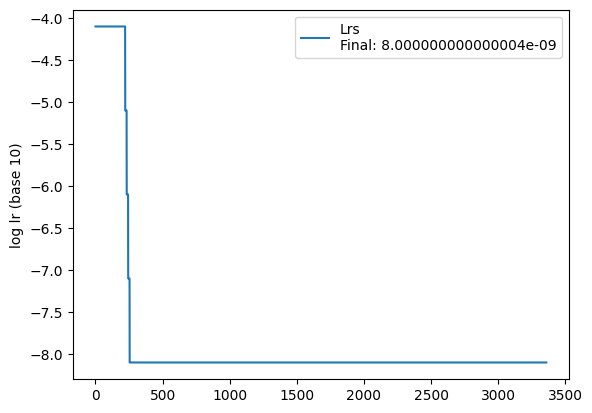


 =============== Epoch 3361 ===============


100%|██████████| 110/110 [00:03<00:00, 30.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.14it/s]


 Test accuracy: 39.7%, Avg loss: 6.788774

 =============== Epoch 3362 ===============


100%|██████████| 110/110 [00:03<00:00, 30.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.30it/s]


 Test accuracy: 39.7%, Avg loss: 6.788778

 =============== Epoch 3363 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.788782

 =============== Epoch 3364 ===============


100%|██████████| 110/110 [00:03<00:00, 31.09it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.788787

 =============== Epoch 3365 ===============


100%|██████████| 110/110 [00:03<00:00, 31.18it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.788790

 =============== Epoch 3366 ===============


100%|██████████| 110/110 [00:03<00:00, 29.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.788794

 =============== Epoch 3367 ===============


100%|██████████| 110/110 [00:03<00:00, 28.67it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.06it/s]


 Test accuracy: 39.7%, Avg loss: 6.788798

 =============== Epoch 3368 ===============


100%|██████████| 110/110 [00:03<00:00, 29.02it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.788801

 =============== Epoch 3369 ===============


100%|██████████| 110/110 [00:03<00:00, 29.43it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.788805

 =============== Epoch 3370 ===============


100%|██████████| 110/110 [00:03<00:00, 29.27it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.08it/s]


 Test accuracy: 39.7%, Avg loss: 6.788809


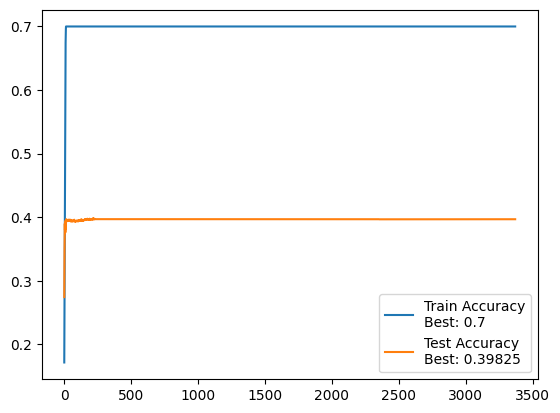

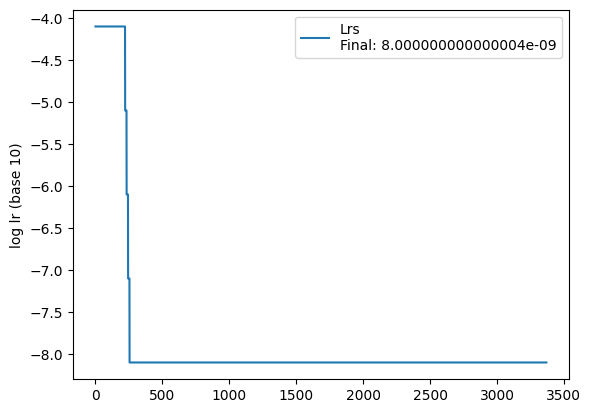


 =============== Epoch 3371 ===============


100%|██████████| 110/110 [00:03<00:00, 29.34it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.75it/s]


 Test accuracy: 39.7%, Avg loss: 6.788812

 =============== Epoch 3372 ===============


100%|██████████| 110/110 [00:03<00:00, 28.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.22it/s]


 Test accuracy: 39.7%, Avg loss: 6.788816

 =============== Epoch 3373 ===============


100%|██████████| 110/110 [00:03<00:00, 29.44it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.25it/s]


 Test accuracy: 39.7%, Avg loss: 6.788820

 =============== Epoch 3374 ===============


100%|██████████| 110/110 [00:03<00:00, 29.36it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.22it/s]


 Test accuracy: 39.7%, Avg loss: 6.788823

 =============== Epoch 3375 ===============


100%|██████████| 110/110 [00:03<00:00, 28.31it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.788827

 =============== Epoch 3376 ===============


100%|██████████| 110/110 [00:03<00:00, 29.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.788831

 =============== Epoch 3377 ===============


100%|██████████| 110/110 [00:03<00:00, 29.59it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.788835

 =============== Epoch 3378 ===============


100%|██████████| 110/110 [00:03<00:00, 27.90it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.71it/s]


 Test accuracy: 39.7%, Avg loss: 6.788838

 =============== Epoch 3379 ===============


100%|██████████| 110/110 [00:03<00:00, 29.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.788842

 =============== Epoch 3380 ===============


100%|██████████| 110/110 [00:03<00:00, 29.45it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.93it/s]


 Test accuracy: 39.7%, Avg loss: 6.788846


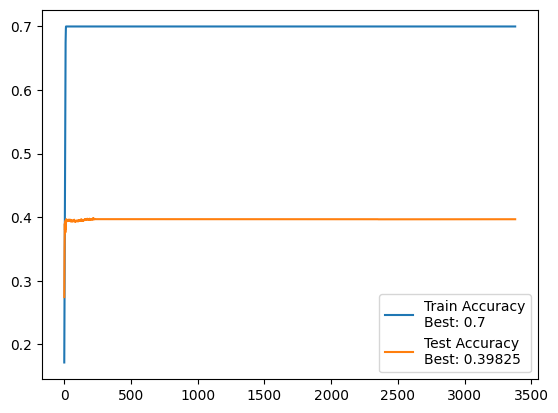

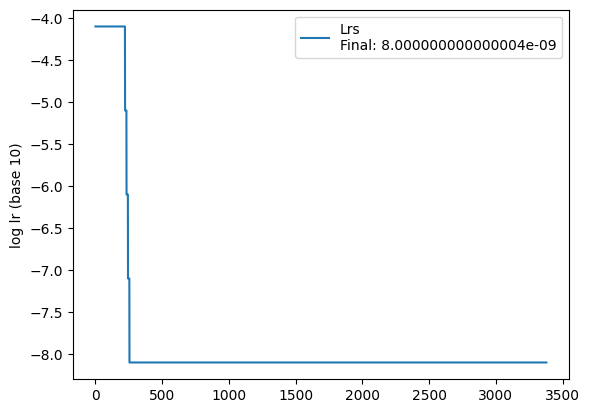


 =============== Epoch 3381 ===============


100%|██████████| 110/110 [00:03<00:00, 29.09it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.14it/s]


 Test accuracy: 39.7%, Avg loss: 6.788849

 =============== Epoch 3382 ===============


100%|██████████| 110/110 [00:03<00:00, 29.24it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.788853

 =============== Epoch 3383 ===============


100%|██████████| 110/110 [00:03<00:00, 29.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.788857

 =============== Epoch 3384 ===============


100%|██████████| 110/110 [00:03<00:00, 28.45it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.788860

 =============== Epoch 3385 ===============


100%|██████████| 110/110 [00:03<00:00, 29.31it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.92it/s]


 Test accuracy: 39.7%, Avg loss: 6.788864

 =============== Epoch 3386 ===============


100%|██████████| 110/110 [00:03<00:00, 29.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.87it/s]


 Test accuracy: 39.7%, Avg loss: 6.788868

 =============== Epoch 3387 ===============


100%|██████████| 110/110 [00:03<00:00, 28.36it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.788872

 =============== Epoch 3388 ===============


100%|██████████| 110/110 [00:03<00:00, 28.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.38it/s]


 Test accuracy: 39.7%, Avg loss: 6.788876

 =============== Epoch 3389 ===============


100%|██████████| 110/110 [00:03<00:00, 29.49it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.788880

 =============== Epoch 3390 ===============


100%|██████████| 110/110 [00:03<00:00, 28.64it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.66it/s]


 Test accuracy: 39.7%, Avg loss: 6.788884


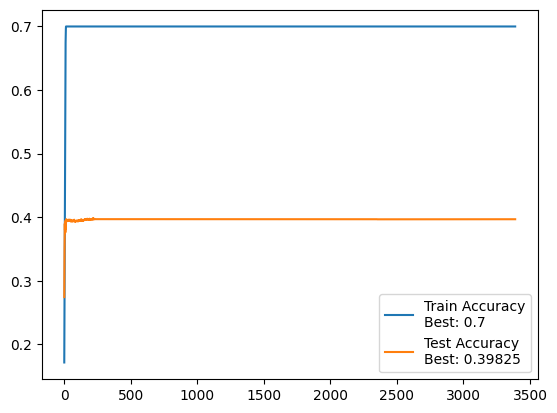

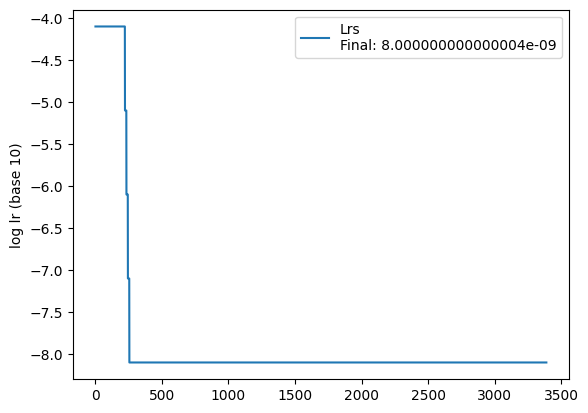


 =============== Epoch 3391 ===============


100%|██████████| 110/110 [00:03<00:00, 29.02it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.23it/s]


 Test accuracy: 39.7%, Avg loss: 6.788887

 =============== Epoch 3392 ===============


100%|██████████| 110/110 [00:03<00:00, 30.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.34it/s]


 Test accuracy: 39.7%, Avg loss: 6.788891

 =============== Epoch 3393 ===============


100%|██████████| 110/110 [00:03<00:00, 31.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.14it/s]


 Test accuracy: 39.7%, Avg loss: 6.788895

 =============== Epoch 3394 ===============


100%|██████████| 110/110 [00:03<00:00, 31.46it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.28it/s]


 Test accuracy: 39.7%, Avg loss: 6.788898

 =============== Epoch 3395 ===============


100%|██████████| 110/110 [00:03<00:00, 30.68it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.788902

 =============== Epoch 3396 ===============


100%|██████████| 110/110 [00:03<00:00, 31.17it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.788906

 =============== Epoch 3397 ===============


100%|██████████| 110/110 [00:03<00:00, 30.73it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.57it/s]


 Test accuracy: 39.7%, Avg loss: 6.788910

 =============== Epoch 3398 ===============


100%|██████████| 110/110 [00:03<00:00, 31.46it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.91it/s]


 Test accuracy: 39.7%, Avg loss: 6.788914

 =============== Epoch 3399 ===============


100%|██████████| 110/110 [00:03<00:00, 31.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.788917

 =============== Epoch 3400 ===============


100%|██████████| 110/110 [00:03<00:00, 31.45it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.788921


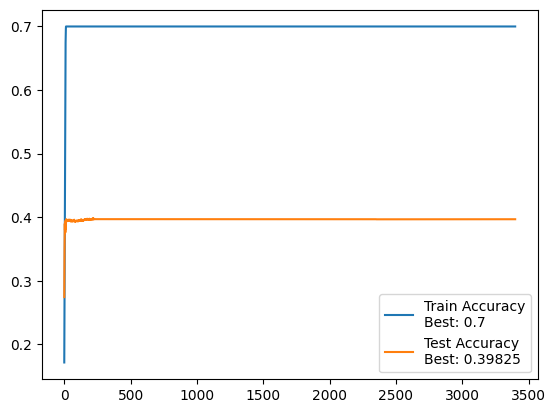

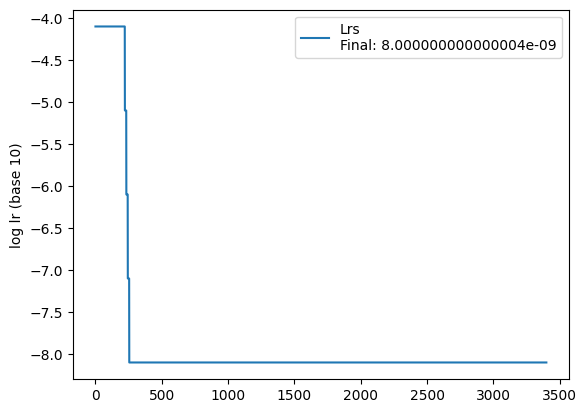


 =============== Epoch 3401 ===============


100%|██████████| 110/110 [00:03<00:00, 31.49it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.32it/s]


 Test accuracy: 39.7%, Avg loss: 6.788925

 =============== Epoch 3402 ===============


100%|██████████| 110/110 [00:03<00:00, 30.79it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.788928

 =============== Epoch 3403 ===============


100%|██████████| 110/110 [00:03<00:00, 31.26it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.96it/s]


 Test accuracy: 39.7%, Avg loss: 6.788932

 =============== Epoch 3404 ===============


100%|██████████| 110/110 [00:03<00:00, 31.53it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.18it/s]


 Test accuracy: 39.7%, Avg loss: 6.788936

 =============== Epoch 3405 ===============


100%|██████████| 110/110 [00:03<00:00, 31.46it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.97it/s]


 Test accuracy: 39.7%, Avg loss: 6.788940

 =============== Epoch 3406 ===============


100%|██████████| 110/110 [00:03<00:00, 31.43it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.38it/s]


 Test accuracy: 39.7%, Avg loss: 6.788944

 =============== Epoch 3407 ===============


100%|██████████| 110/110 [00:03<00:00, 31.07it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.788947

 =============== Epoch 3408 ===============


100%|██████████| 110/110 [00:03<00:00, 31.56it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.788951

 =============== Epoch 3409 ===============


100%|██████████| 110/110 [00:03<00:00, 31.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.73it/s]


 Test accuracy: 39.7%, Avg loss: 6.788955

 =============== Epoch 3410 ===============


100%|██████████| 110/110 [00:03<00:00, 31.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.788958


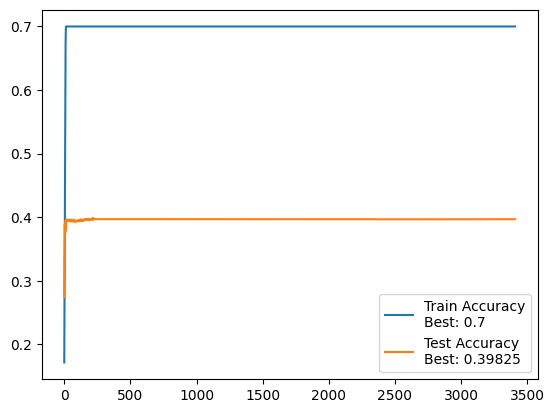

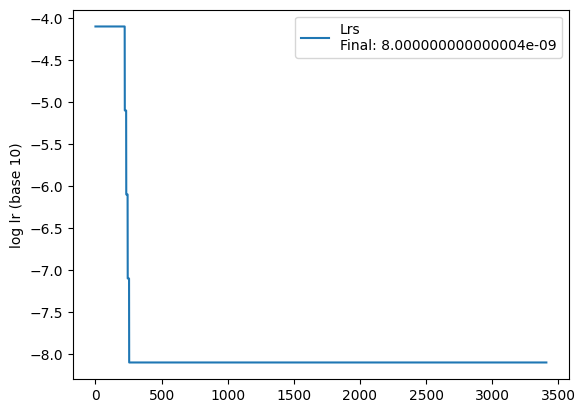


 =============== Epoch 3411 ===============


100%|██████████| 110/110 [00:03<00:00, 31.45it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.92it/s]


 Test accuracy: 39.7%, Avg loss: 6.788962

 =============== Epoch 3412 ===============


100%|██████████| 110/110 [00:03<00:00, 31.67it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.788966

 =============== Epoch 3413 ===============


100%|██████████| 110/110 [00:03<00:00, 31.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.71it/s]


 Test accuracy: 39.7%, Avg loss: 6.788969

 =============== Epoch 3414 ===============


100%|██████████| 110/110 [00:03<00:00, 31.52it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.788973

 =============== Epoch 3415 ===============


100%|██████████| 110/110 [00:03<00:00, 31.64it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.788977

 =============== Epoch 3416 ===============


100%|██████████| 110/110 [00:03<00:00, 30.84it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.87it/s]


 Test accuracy: 39.7%, Avg loss: 6.788981

 =============== Epoch 3417 ===============


100%|██████████| 110/110 [00:03<00:00, 31.73it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.788984

 =============== Epoch 3418 ===============


100%|██████████| 110/110 [00:03<00:00, 30.91it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.97it/s]


 Test accuracy: 39.7%, Avg loss: 6.788988

 =============== Epoch 3419 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.788992

 =============== Epoch 3420 ===============


100%|██████████| 110/110 [00:03<00:00, 31.46it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.37it/s]


 Test accuracy: 39.7%, Avg loss: 6.788995


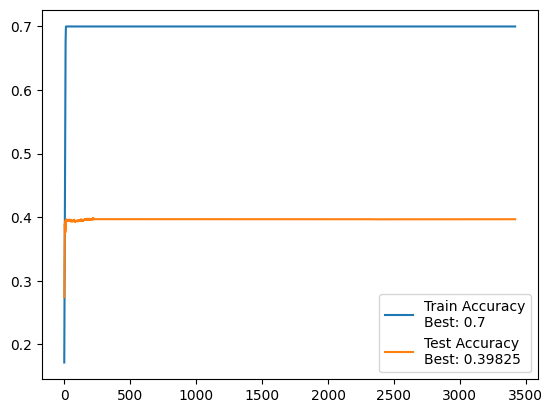

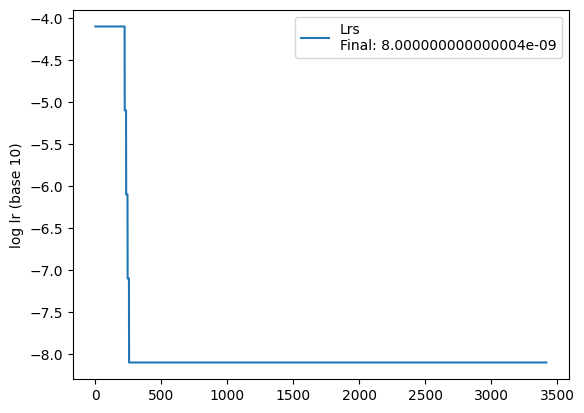


 =============== Epoch 3421 ===============


100%|██████████| 110/110 [00:03<00:00, 30.60it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.788999

 =============== Epoch 3422 ===============


100%|██████████| 110/110 [00:03<00:00, 31.63it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.789003

 =============== Epoch 3423 ===============


100%|██████████| 110/110 [00:03<00:00, 31.63it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.72it/s]


 Test accuracy: 39.7%, Avg loss: 6.789007

 =============== Epoch 3424 ===============


100%|██████████| 110/110 [00:03<00:00, 31.41it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.789010

 =============== Epoch 3425 ===============


100%|██████████| 110/110 [00:03<00:00, 31.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.789014

 =============== Epoch 3426 ===============


100%|██████████| 110/110 [00:03<00:00, 30.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.789018

 =============== Epoch 3427 ===============


100%|██████████| 110/110 [00:03<00:00, 31.45it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.789022

 =============== Epoch 3428 ===============


100%|██████████| 110/110 [00:03<00:00, 31.60it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.62it/s]


 Test accuracy: 39.7%, Avg loss: 6.789025

 =============== Epoch 3429 ===============


100%|██████████| 110/110 [00:03<00:00, 31.64it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.789029

 =============== Epoch 3430 ===============


100%|██████████| 110/110 [00:03<00:00, 31.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.789032


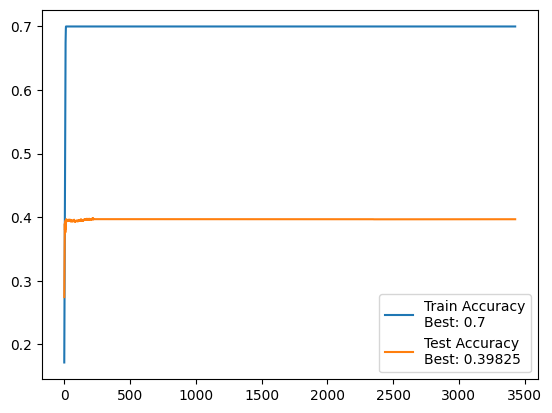

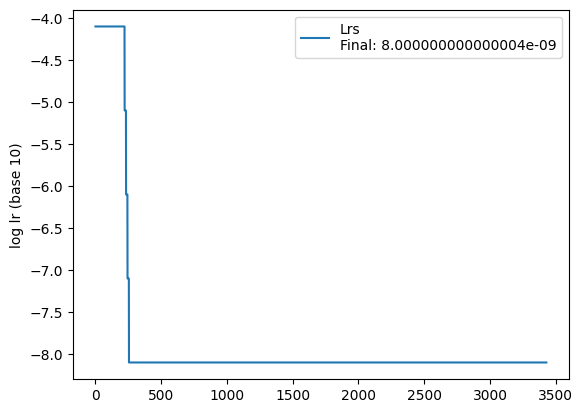


 =============== Epoch 3431 ===============


100%|██████████| 110/110 [00:03<00:00, 30.69it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.37it/s]


 Test accuracy: 39.7%, Avg loss: 6.789036

 =============== Epoch 3432 ===============


100%|██████████| 110/110 [00:03<00:00, 30.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.789040

 =============== Epoch 3433 ===============


100%|██████████| 110/110 [00:03<00:00, 30.48it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.83it/s]


 Test accuracy: 39.7%, Avg loss: 6.789043

 =============== Epoch 3434 ===============


100%|██████████| 110/110 [00:03<00:00, 31.84it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.92it/s]


 Test accuracy: 39.7%, Avg loss: 6.789047

 =============== Epoch 3435 ===============


100%|██████████| 110/110 [00:03<00:00, 31.98it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.57it/s]


 Test accuracy: 39.7%, Avg loss: 6.789051

 =============== Epoch 3436 ===============


100%|██████████| 110/110 [00:03<00:00, 31.37it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 65.24it/s]


 Test accuracy: 39.7%, Avg loss: 6.789055

 =============== Epoch 3437 ===============


100%|██████████| 110/110 [00:03<00:00, 31.68it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.08it/s]


 Test accuracy: 39.7%, Avg loss: 6.789059

 =============== Epoch 3438 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.789063

 =============== Epoch 3439 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.72it/s]


 Test accuracy: 39.7%, Avg loss: 6.789066

 =============== Epoch 3440 ===============


100%|██████████| 110/110 [00:03<00:00, 31.47it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.66it/s]


 Test accuracy: 39.7%, Avg loss: 6.789070


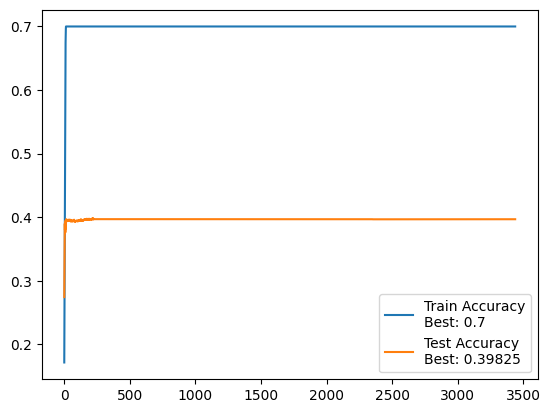

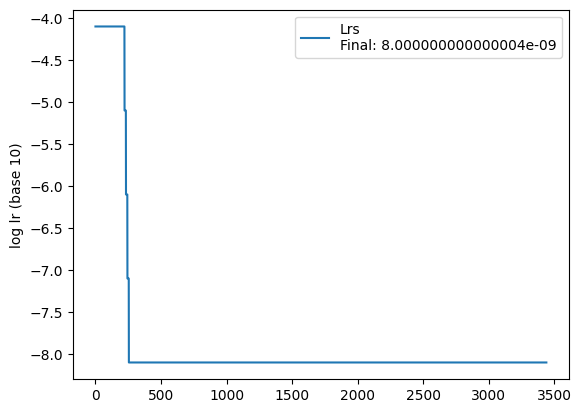


 =============== Epoch 3441 ===============


100%|██████████| 110/110 [00:03<00:00, 31.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.789074

 =============== Epoch 3442 ===============


100%|██████████| 110/110 [00:03<00:00, 31.72it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.789077

 =============== Epoch 3443 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.91it/s]


 Test accuracy: 39.7%, Avg loss: 6.789081

 =============== Epoch 3444 ===============


100%|██████████| 110/110 [00:03<00:00, 31.70it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.35it/s]


 Test accuracy: 39.7%, Avg loss: 6.789085

 =============== Epoch 3445 ===============


100%|██████████| 110/110 [00:03<00:00, 30.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.62it/s]


 Test accuracy: 39.7%, Avg loss: 6.789089

 =============== Epoch 3446 ===============


100%|██████████| 110/110 [00:03<00:00, 31.71it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.789092

 =============== Epoch 3447 ===============


100%|██████████| 110/110 [00:03<00:00, 31.46it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.73it/s]


 Test accuracy: 39.7%, Avg loss: 6.789096

 =============== Epoch 3448 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.789100

 =============== Epoch 3449 ===============


100%|██████████| 110/110 [00:03<00:00, 31.69it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.38it/s]


 Test accuracy: 39.7%, Avg loss: 6.789104

 =============== Epoch 3450 ===============


100%|██████████| 110/110 [00:03<00:00, 31.85it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.789107


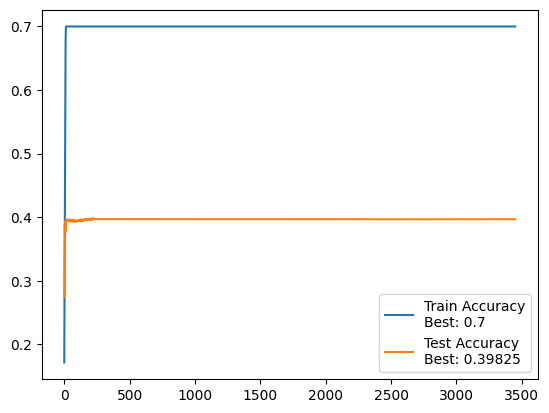

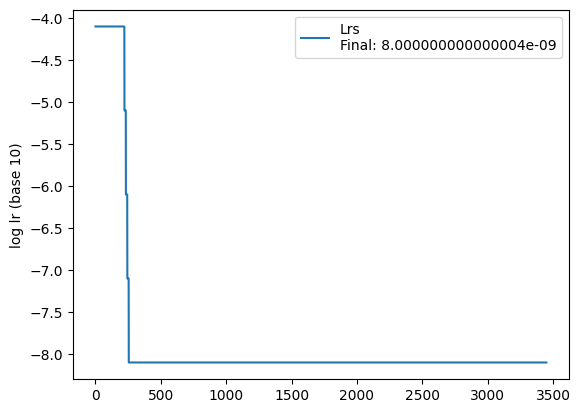


 =============== Epoch 3451 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.789111

 =============== Epoch 3452 ===============


100%|██████████| 110/110 [00:03<00:00, 30.62it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.789114

 =============== Epoch 3453 ===============


100%|██████████| 110/110 [00:03<00:00, 31.45it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.06it/s]


 Test accuracy: 39.7%, Avg loss: 6.789118

 =============== Epoch 3454 ===============


100%|██████████| 110/110 [00:03<00:00, 31.11it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.38it/s]


 Test accuracy: 39.7%, Avg loss: 6.789121

 =============== Epoch 3455 ===============


100%|██████████| 110/110 [00:03<00:00, 31.42it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.27it/s]


 Test accuracy: 39.7%, Avg loss: 6.789125

 =============== Epoch 3456 ===============


100%|██████████| 110/110 [00:03<00:00, 31.61it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.14it/s]


 Test accuracy: 39.7%, Avg loss: 6.789129

 =============== Epoch 3457 ===============


100%|██████████| 110/110 [00:03<00:00, 31.30it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.789132

 =============== Epoch 3458 ===============


100%|██████████| 110/110 [00:03<00:00, 31.48it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.789137

 =============== Epoch 3459 ===============


100%|██████████| 110/110 [00:03<00:00, 31.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.789140

 =============== Epoch 3460 ===============


100%|██████████| 110/110 [00:03<00:00, 31.03it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.08it/s]


 Test accuracy: 39.7%, Avg loss: 6.789144


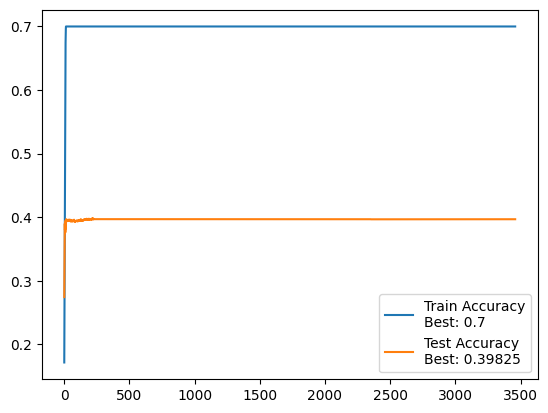

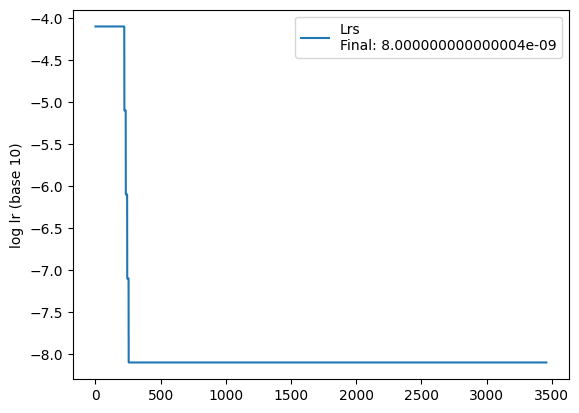


 =============== Epoch 3461 ===============


100%|██████████| 110/110 [00:03<00:00, 31.28it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.27it/s]


 Test accuracy: 39.7%, Avg loss: 6.789147

 =============== Epoch 3462 ===============


100%|██████████| 110/110 [00:03<00:00, 31.60it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.789151

 =============== Epoch 3463 ===============


100%|██████████| 110/110 [00:03<00:00, 30.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.789155

 =============== Epoch 3464 ===============


100%|██████████| 110/110 [00:03<00:00, 31.43it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.789159

 =============== Epoch 3465 ===============


100%|██████████| 110/110 [00:03<00:00, 31.38it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.76it/s]


 Test accuracy: 39.7%, Avg loss: 6.789162

 =============== Epoch 3466 ===============


100%|██████████| 110/110 [00:03<00:00, 30.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.789166

 =============== Epoch 3467 ===============


100%|██████████| 110/110 [00:03<00:00, 31.64it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.789169

 =============== Epoch 3468 ===============


100%|██████████| 110/110 [00:03<00:00, 30.33it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.789173

 =============== Epoch 3469 ===============


100%|██████████| 110/110 [00:03<00:00, 31.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.789177

 =============== Epoch 3470 ===============


100%|██████████| 110/110 [00:03<00:00, 31.44it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.789181


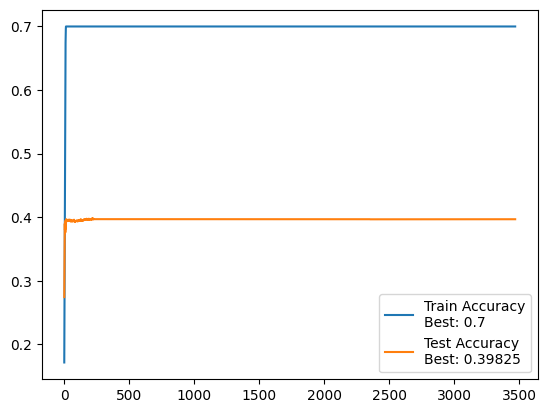

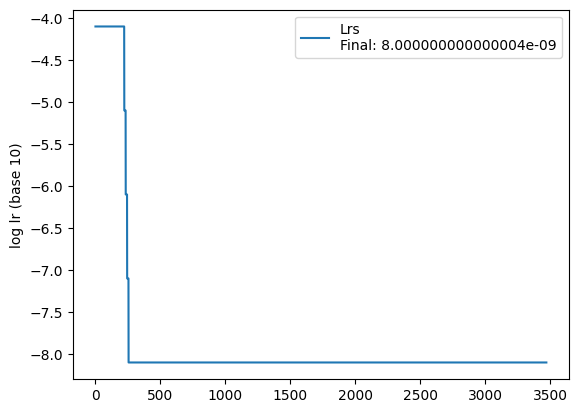


 =============== Epoch 3471 ===============


100%|██████████| 110/110 [00:03<00:00, 31.59it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.789184

 =============== Epoch 3472 ===============


100%|██████████| 110/110 [00:03<00:00, 31.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.62it/s]


 Test accuracy: 39.7%, Avg loss: 6.789188

 =============== Epoch 3473 ===============


100%|██████████| 110/110 [00:03<00:00, 30.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.789192

 =============== Epoch 3474 ===============


100%|██████████| 110/110 [00:03<00:00, 31.40it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.68it/s]


 Test accuracy: 39.7%, Avg loss: 6.789195

 =============== Epoch 3475 ===============


100%|██████████| 110/110 [00:03<00:00, 31.46it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.789200

 =============== Epoch 3476 ===============


100%|██████████| 110/110 [00:03<00:00, 31.02it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.789203

 =============== Epoch 3477 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.789207

 =============== Epoch 3478 ===============


100%|██████████| 110/110 [00:03<00:00, 31.41it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.789211

 =============== Epoch 3479 ===============


100%|██████████| 110/110 [00:03<00:00, 31.37it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.789214

 =============== Epoch 3480 ===============


100%|██████████| 110/110 [00:03<00:00, 31.48it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.35it/s]


 Test accuracy: 39.7%, Avg loss: 6.789218


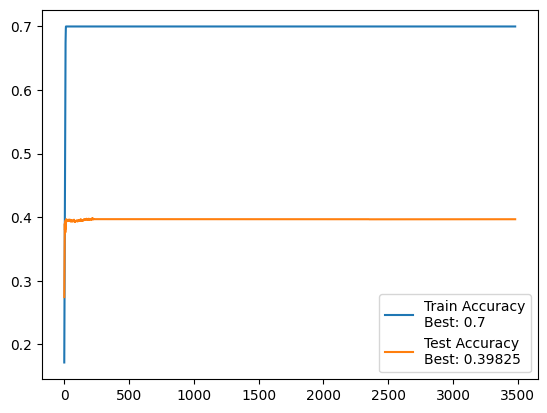

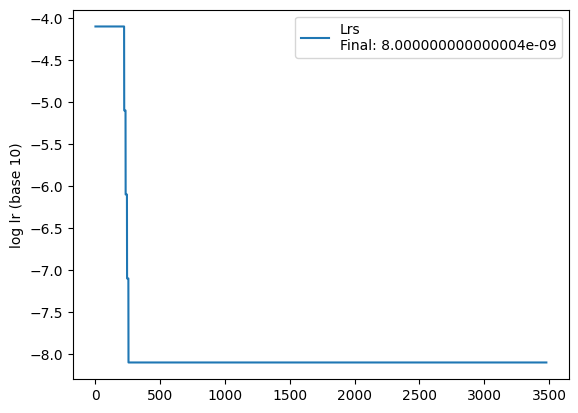


 =============== Epoch 3481 ===============


100%|██████████| 110/110 [00:03<00:00, 31.41it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.73it/s]


 Test accuracy: 39.7%, Avg loss: 6.789222

 =============== Epoch 3482 ===============


100%|██████████| 110/110 [00:03<00:00, 31.58it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.789225

 =============== Epoch 3483 ===============


100%|██████████| 110/110 [00:03<00:00, 31.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.789229

 =============== Epoch 3484 ===============


100%|██████████| 110/110 [00:03<00:00, 29.95it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.24it/s]


 Test accuracy: 39.7%, Avg loss: 6.789233

 =============== Epoch 3485 ===============


100%|██████████| 110/110 [00:03<00:00, 31.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.32it/s]


 Test accuracy: 39.7%, Avg loss: 6.789237

 =============== Epoch 3486 ===============


100%|██████████| 110/110 [00:03<00:00, 31.73it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.60it/s]


 Test accuracy: 39.7%, Avg loss: 6.789240

 =============== Epoch 3487 ===============


100%|██████████| 110/110 [00:03<00:00, 31.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.78it/s]


 Test accuracy: 39.7%, Avg loss: 6.789244

 =============== Epoch 3488 ===============


100%|██████████| 110/110 [00:03<00:00, 31.36it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.789248

 =============== Epoch 3489 ===============


100%|██████████| 110/110 [00:03<00:00, 31.46it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.789252

 =============== Epoch 3490 ===============


100%|██████████| 110/110 [00:03<00:00, 31.57it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.789256


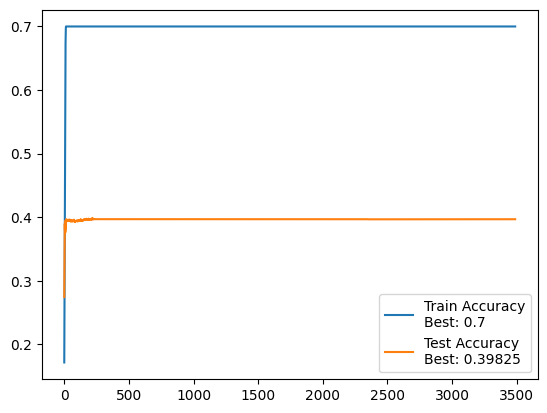

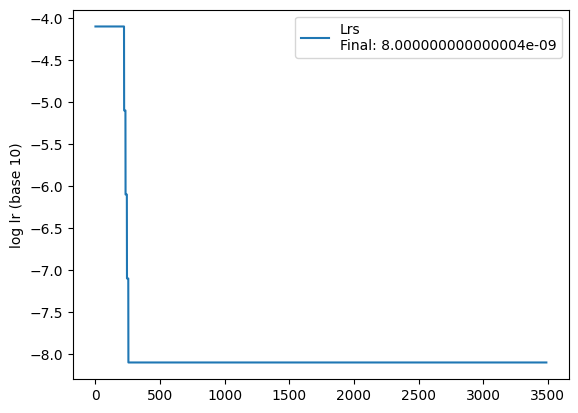


 =============== Epoch 3491 ===============


100%|██████████| 110/110 [00:03<00:00, 31.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.789259

 =============== Epoch 3492 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.97it/s]


 Test accuracy: 39.7%, Avg loss: 6.789263

 =============== Epoch 3493 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.789267

 =============== Epoch 3494 ===============


100%|██████████| 110/110 [00:03<00:00, 30.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.28it/s]


 Test accuracy: 39.7%, Avg loss: 6.789270

 =============== Epoch 3495 ===============


100%|██████████| 110/110 [00:03<00:00, 31.26it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.16it/s]


 Test accuracy: 39.7%, Avg loss: 6.789274

 =============== Epoch 3496 ===============


100%|██████████| 110/110 [00:03<00:00, 31.56it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.789278

 =============== Epoch 3497 ===============


100%|██████████| 110/110 [00:03<00:00, 30.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.789281

 =============== Epoch 3498 ===============


100%|██████████| 110/110 [00:03<00:00, 31.37it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.789285

 =============== Epoch 3499 ===============


100%|██████████| 110/110 [00:03<00:00, 31.38it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.21it/s]


 Test accuracy: 39.7%, Avg loss: 6.789289

 =============== Epoch 3500 ===============


100%|██████████| 110/110 [00:03<00:00, 31.62it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.789292


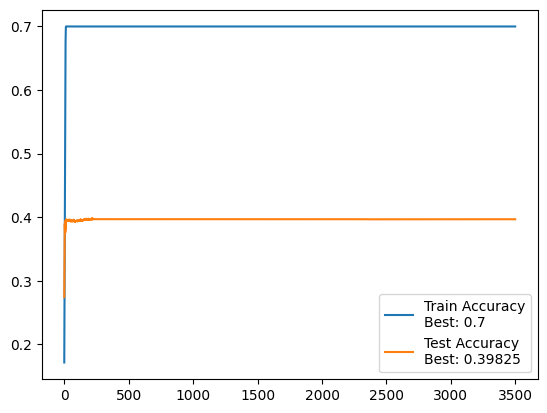

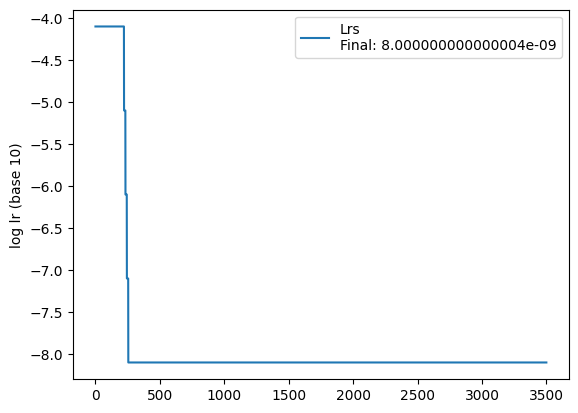


 =============== Epoch 3501 ===============


100%|██████████| 110/110 [00:03<00:00, 30.69it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.81it/s]


 Test accuracy: 39.7%, Avg loss: 6.789296

 =============== Epoch 3502 ===============


100%|██████████| 110/110 [00:03<00:00, 31.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.789300

 =============== Epoch 3503 ===============


100%|██████████| 110/110 [00:03<00:00, 31.39it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.29it/s]


 Test accuracy: 39.7%, Avg loss: 6.789303

 =============== Epoch 3504 ===============


100%|██████████| 110/110 [00:03<00:00, 31.36it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.30it/s]


 Test accuracy: 39.7%, Avg loss: 6.789307

 =============== Epoch 3505 ===============


100%|██████████| 110/110 [00:03<00:00, 30.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.789311

 =============== Epoch 3506 ===============


100%|██████████| 110/110 [00:03<00:00, 31.71it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.789315

 =============== Epoch 3507 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.789318

 =============== Epoch 3508 ===============


100%|██████████| 110/110 [00:03<00:00, 31.48it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.87it/s]


 Test accuracy: 39.7%, Avg loss: 6.789322

 =============== Epoch 3509 ===============


100%|██████████| 110/110 [00:03<00:00, 31.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.18it/s]


 Test accuracy: 39.7%, Avg loss: 6.789325

 =============== Epoch 3510 ===============


100%|██████████| 110/110 [00:03<00:00, 31.54it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.789329


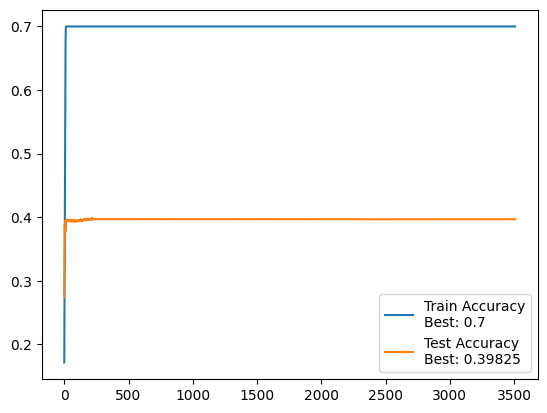

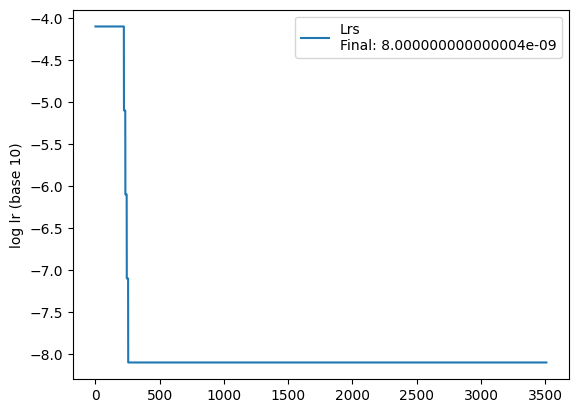


 =============== Epoch 3511 ===============


100%|██████████| 110/110 [00:03<00:00, 31.53it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.24it/s]


 Test accuracy: 39.7%, Avg loss: 6.789333

 =============== Epoch 3512 ===============


100%|██████████| 110/110 [00:03<00:00, 31.59it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.789337

 =============== Epoch 3513 ===============


100%|██████████| 110/110 [00:03<00:00, 31.49it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.789340

 =============== Epoch 3514 ===============


100%|██████████| 110/110 [00:03<00:00, 31.18it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.89it/s]


 Test accuracy: 39.7%, Avg loss: 6.789344

 =============== Epoch 3515 ===============


100%|██████████| 110/110 [00:03<00:00, 31.61it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.38it/s]


 Test accuracy: 39.7%, Avg loss: 6.789348

 =============== Epoch 3516 ===============


100%|██████████| 110/110 [00:03<00:00, 31.62it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.40it/s]


 Test accuracy: 39.7%, Avg loss: 6.789351

 =============== Epoch 3517 ===============


100%|██████████| 110/110 [00:03<00:00, 31.04it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.32it/s]


 Test accuracy: 39.7%, Avg loss: 6.789355

 =============== Epoch 3518 ===============


100%|██████████| 110/110 [00:03<00:00, 31.48it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.27it/s]


 Test accuracy: 39.7%, Avg loss: 6.789359

 =============== Epoch 3519 ===============


100%|██████████| 110/110 [00:03<00:00, 31.41it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.77it/s]


 Test accuracy: 39.7%, Avg loss: 6.789362

 =============== Epoch 3520 ===============


100%|██████████| 110/110 [00:03<00:00, 31.57it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.789366


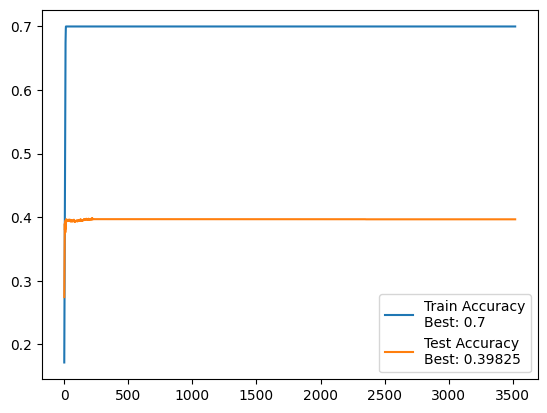

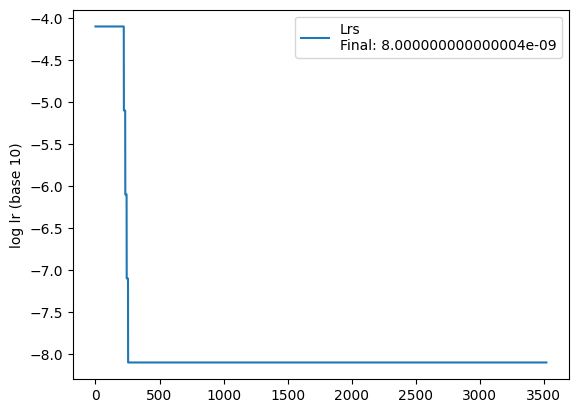


 =============== Epoch 3521 ===============


100%|██████████| 110/110 [00:03<00:00, 30.58it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.76it/s]


 Test accuracy: 39.7%, Avg loss: 6.789370

 =============== Epoch 3522 ===============


100%|██████████| 110/110 [00:03<00:00, 31.42it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.72it/s]


 Test accuracy: 39.7%, Avg loss: 6.789374

 =============== Epoch 3523 ===============


100%|██████████| 110/110 [00:03<00:00, 31.44it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.26it/s]


 Test accuracy: 39.7%, Avg loss: 6.789377

 =============== Epoch 3524 ===============


100%|██████████| 110/110 [00:03<00:00, 31.32it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.789381

 =============== Epoch 3525 ===============


100%|██████████| 110/110 [00:03<00:00, 30.98it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.789385

 =============== Epoch 3526 ===============


100%|██████████| 110/110 [00:03<00:00, 31.28it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.66it/s]


 Test accuracy: 39.7%, Avg loss: 6.789389

 =============== Epoch 3527 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.789392

 =============== Epoch 3528 ===============


100%|██████████| 110/110 [00:03<00:00, 31.62it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.10it/s]


 Test accuracy: 39.7%, Avg loss: 6.789396

 =============== Epoch 3529 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.18it/s]


 Test accuracy: 39.7%, Avg loss: 6.789399

 =============== Epoch 3530 ===============


100%|██████████| 110/110 [00:03<00:00, 31.37it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.98it/s]


 Test accuracy: 39.7%, Avg loss: 6.789403


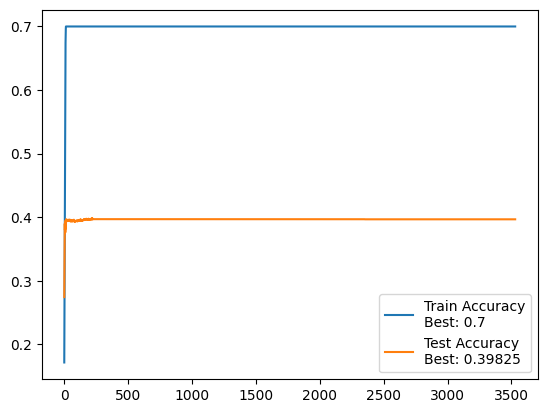

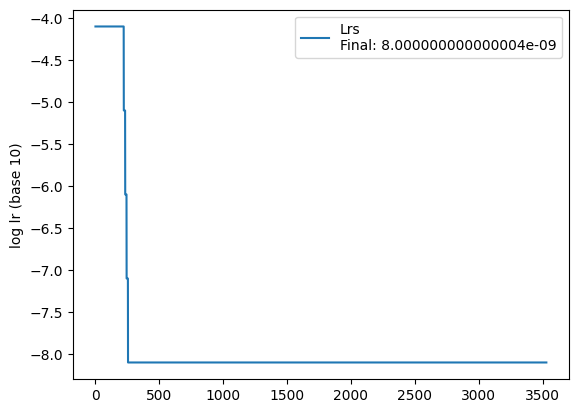


 =============== Epoch 3531 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.789407

 =============== Epoch 3532 ===============


100%|██████████| 110/110 [00:03<00:00, 31.40it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.73it/s]


 Test accuracy: 39.7%, Avg loss: 6.789410

 =============== Epoch 3533 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.04it/s]


 Test accuracy: 39.7%, Avg loss: 6.789414

 =============== Epoch 3534 ===============


100%|██████████| 110/110 [00:03<00:00, 31.54it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.28it/s]


 Test accuracy: 39.7%, Avg loss: 6.789418

 =============== Epoch 3535 ===============


100%|██████████| 110/110 [00:03<00:00, 31.68it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.789422

 =============== Epoch 3536 ===============


100%|██████████| 110/110 [00:03<00:00, 31.02it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.789425

 =============== Epoch 3537 ===============


100%|██████████| 110/110 [00:03<00:00, 31.54it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.44it/s]


 Test accuracy: 39.7%, Avg loss: 6.789429

 =============== Epoch 3538 ===============


100%|██████████| 110/110 [00:03<00:00, 31.41it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.22it/s]


 Test accuracy: 39.7%, Avg loss: 6.789433

 =============== Epoch 3539 ===============


100%|██████████| 110/110 [00:03<00:00, 30.77it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.73it/s]


 Test accuracy: 39.7%, Avg loss: 6.789437

 =============== Epoch 3540 ===============


100%|██████████| 110/110 [00:03<00:00, 31.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.17it/s]


 Test accuracy: 39.7%, Avg loss: 6.789440


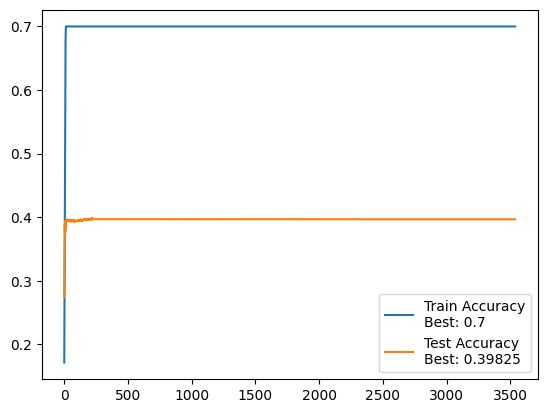

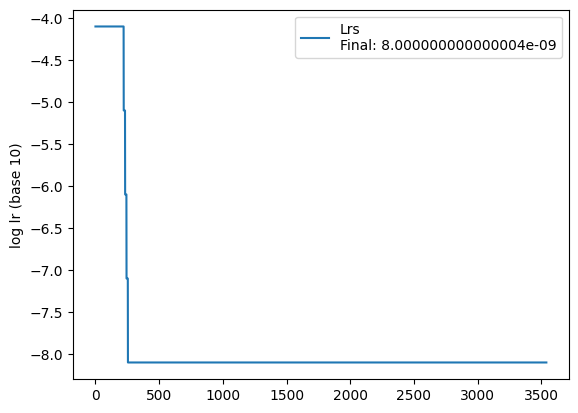


 =============== Epoch 3541 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.19it/s]


 Test accuracy: 39.7%, Avg loss: 6.789444

 =============== Epoch 3542 ===============


100%|██████████| 110/110 [00:03<00:00, 31.49it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.79it/s]


 Test accuracy: 39.7%, Avg loss: 6.789447

 =============== Epoch 3543 ===============


100%|██████████| 110/110 [00:03<00:00, 31.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.10it/s]


 Test accuracy: 39.7%, Avg loss: 6.789451

 =============== Epoch 3544 ===============


100%|██████████| 110/110 [00:03<00:00, 31.37it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.75it/s]


 Test accuracy: 39.7%, Avg loss: 6.789455

 =============== Epoch 3545 ===============


100%|██████████| 110/110 [00:03<00:00, 31.62it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.789459

 =============== Epoch 3546 ===============


100%|██████████| 110/110 [00:03<00:00, 31.22it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.789462

 =============== Epoch 3547 ===============


100%|██████████| 110/110 [00:03<00:00, 30.98it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.29it/s]


 Test accuracy: 39.7%, Avg loss: 6.789466

 =============== Epoch 3548 ===============


100%|██████████| 110/110 [00:03<00:00, 31.44it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.91it/s]


 Test accuracy: 39.7%, Avg loss: 6.789469

 =============== Epoch 3549 ===============


100%|██████████| 110/110 [00:03<00:00, 30.43it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.789473

 =============== Epoch 3550 ===============


100%|██████████| 110/110 [00:03<00:00, 31.48it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 64.14it/s]


 Test accuracy: 39.7%, Avg loss: 6.789476


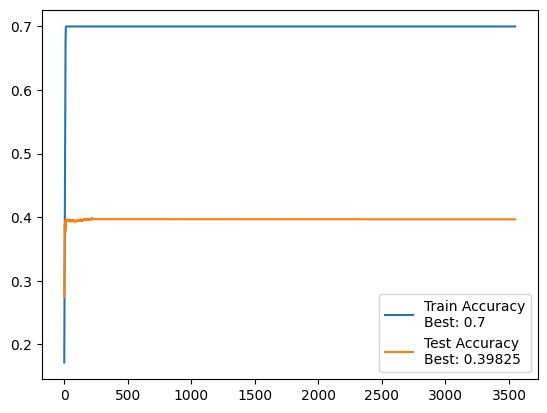

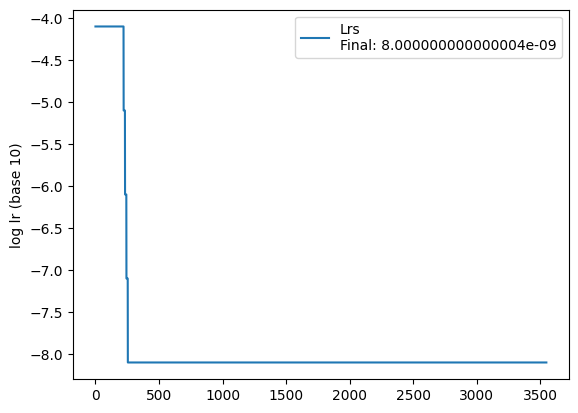


 =============== Epoch 3551 ===============


100%|██████████| 110/110 [00:03<00:00, 31.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.79it/s]


 Test accuracy: 39.7%, Avg loss: 6.789480

 =============== Epoch 3552 ===============


100%|██████████| 110/110 [00:03<00:00, 31.57it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.789484

 =============== Epoch 3553 ===============


100%|██████████| 110/110 [00:03<00:00, 31.51it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.68it/s]


 Test accuracy: 39.7%, Avg loss: 6.789487

 =============== Epoch 3554 ===============


100%|██████████| 110/110 [00:03<00:00, 30.07it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.789491

 =============== Epoch 3555 ===============


100%|██████████| 110/110 [00:03<00:00, 29.60it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.11it/s]


 Test accuracy: 39.7%, Avg loss: 6.789494

 =============== Epoch 3556 ===============


100%|██████████| 110/110 [00:03<00:00, 31.65it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.11it/s]


 Test accuracy: 39.7%, Avg loss: 6.789497

 =============== Epoch 3557 ===============


100%|██████████| 110/110 [00:03<00:00, 29.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.78it/s]


 Test accuracy: 39.7%, Avg loss: 6.789501

 =============== Epoch 3558 ===============


100%|██████████| 110/110 [00:04<00:00, 27.46it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.789505

 =============== Epoch 3559 ===============


100%|██████████| 110/110 [00:03<00:00, 28.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.97it/s]


 Test accuracy: 39.7%, Avg loss: 6.789508

 =============== Epoch 3560 ===============


100%|██████████| 110/110 [00:03<00:00, 28.61it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 55.21it/s]


 Test accuracy: 39.7%, Avg loss: 6.789512


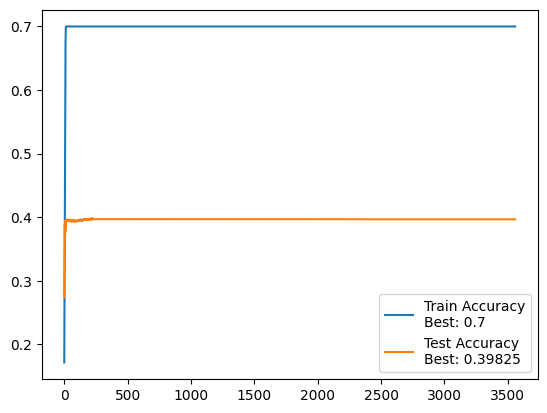

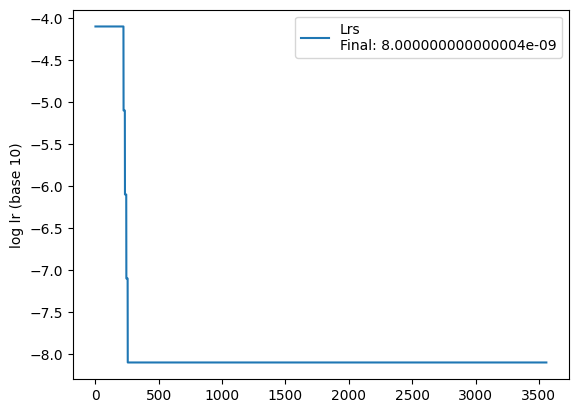


 =============== Epoch 3561 ===============


100%|██████████| 110/110 [00:03<00:00, 28.42it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 54.66it/s]


 Test accuracy: 39.7%, Avg loss: 6.789515

 =============== Epoch 3562 ===============


100%|██████████| 110/110 [00:03<00:00, 28.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.41it/s]


 Test accuracy: 39.7%, Avg loss: 6.789519

 =============== Epoch 3563 ===============


100%|██████████| 110/110 [00:03<00:00, 27.93it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.52it/s]


 Test accuracy: 39.7%, Avg loss: 6.789522

 =============== Epoch 3564 ===============


100%|██████████| 110/110 [00:03<00:00, 28.07it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 55.37it/s]


 Test accuracy: 39.7%, Avg loss: 6.789526

 =============== Epoch 3565 ===============


100%|██████████| 110/110 [00:03<00:00, 27.98it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.60it/s]


 Test accuracy: 39.7%, Avg loss: 6.789530

 =============== Epoch 3566 ===============


100%|██████████| 110/110 [00:03<00:00, 27.93it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.789533

 =============== Epoch 3567 ===============


100%|██████████| 110/110 [00:03<00:00, 28.90it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 55.44it/s]


 Test accuracy: 39.7%, Avg loss: 6.789537

 =============== Epoch 3568 ===============


100%|██████████| 110/110 [00:03<00:00, 28.61it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.789540

 =============== Epoch 3569 ===============


100%|██████████| 110/110 [00:03<00:00, 28.65it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 54.75it/s]


 Test accuracy: 39.7%, Avg loss: 6.789544

 =============== Epoch 3570 ===============


100%|██████████| 110/110 [00:03<00:00, 28.49it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 55.83it/s]


 Test accuracy: 39.7%, Avg loss: 6.789547


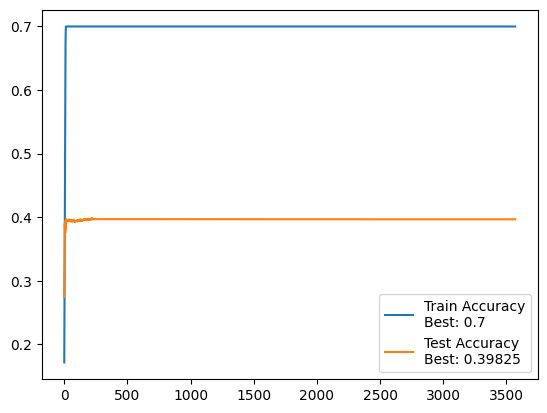

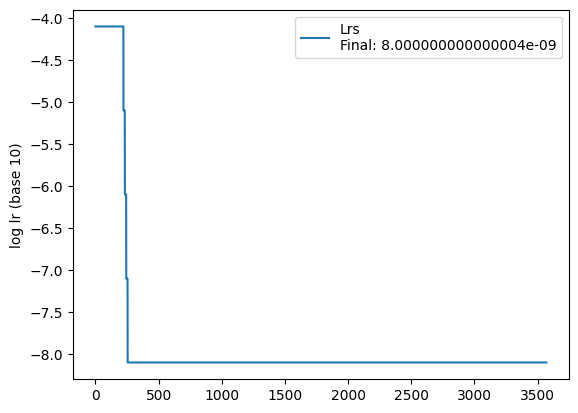


 =============== Epoch 3571 ===============


100%|██████████| 110/110 [00:03<00:00, 28.56it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 55.46it/s]


 Test accuracy: 39.7%, Avg loss: 6.789551

 =============== Epoch 3572 ===============


100%|██████████| 110/110 [00:03<00:00, 28.35it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.99it/s]


 Test accuracy: 39.7%, Avg loss: 6.789554

 =============== Epoch 3573 ===============


100%|██████████| 110/110 [00:03<00:00, 28.36it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 55.72it/s]


 Test accuracy: 39.7%, Avg loss: 6.789558

 =============== Epoch 3574 ===============


100%|██████████| 110/110 [00:03<00:00, 27.94it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.54it/s]


 Test accuracy: 39.7%, Avg loss: 6.789561

 =============== Epoch 3575 ===============


100%|██████████| 110/110 [00:03<00:00, 27.93it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.99it/s]


 Test accuracy: 39.7%, Avg loss: 6.789565

 =============== Epoch 3576 ===============


100%|██████████| 110/110 [00:03<00:00, 27.98it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.79it/s]


 Test accuracy: 39.7%, Avg loss: 6.789568

 =============== Epoch 3577 ===============


100%|██████████| 110/110 [00:03<00:00, 28.60it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 54.84it/s]


 Test accuracy: 39.7%, Avg loss: 6.789572

 =============== Epoch 3578 ===============


100%|██████████| 110/110 [00:03<00:00, 28.44it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 54.29it/s]


 Test accuracy: 39.7%, Avg loss: 6.789575

 =============== Epoch 3579 ===============


100%|██████████| 110/110 [00:03<00:00, 28.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 55.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.789579

 =============== Epoch 3580 ===============


100%|██████████| 110/110 [00:03<00:00, 28.51it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.789583


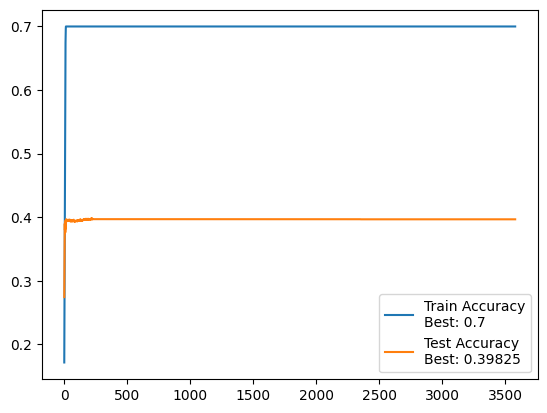

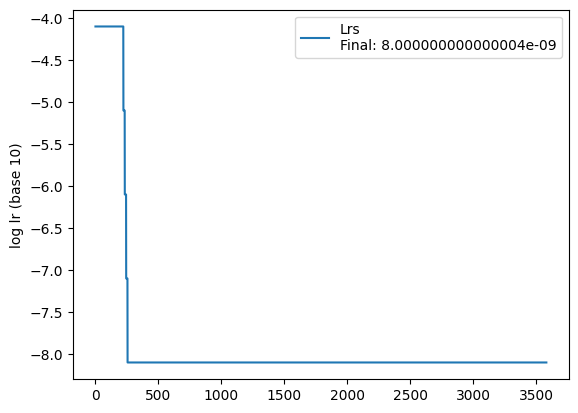


 =============== Epoch 3581 ===============


100%|██████████| 110/110 [00:03<00:00, 28.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.789586

 =============== Epoch 3582 ===============


100%|██████████| 110/110 [00:03<00:00, 27.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 55.43it/s]


 Test accuracy: 39.7%, Avg loss: 6.789590

 =============== Epoch 3583 ===============


100%|██████████| 110/110 [00:03<00:00, 28.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.789593

 =============== Epoch 3584 ===============


100%|██████████| 110/110 [00:04<00:00, 27.40it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.09it/s]


 Test accuracy: 39.7%, Avg loss: 6.789597

 =============== Epoch 3585 ===============


100%|██████████| 110/110 [00:03<00:00, 27.84it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.73it/s]


 Test accuracy: 39.7%, Avg loss: 6.789601

 =============== Epoch 3586 ===============


100%|██████████| 110/110 [00:03<00:00, 27.74it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.96it/s]


 Test accuracy: 39.7%, Avg loss: 6.789604

 =============== Epoch 3587 ===============


100%|██████████| 110/110 [00:03<00:00, 27.68it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 55.08it/s]


 Test accuracy: 39.7%, Avg loss: 6.789607

 =============== Epoch 3588 ===============


100%|██████████| 110/110 [00:03<00:00, 27.93it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.789611

 =============== Epoch 3589 ===============


100%|██████████| 110/110 [00:03<00:00, 28.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 55.10it/s]


 Test accuracy: 39.7%, Avg loss: 6.789615

 =============== Epoch 3590 ===============


100%|██████████| 110/110 [00:03<00:00, 27.69it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 53.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.789618


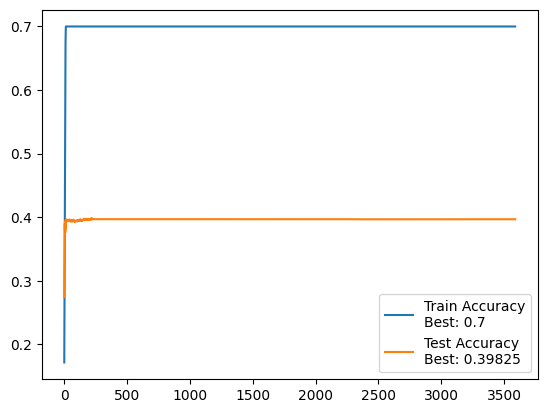

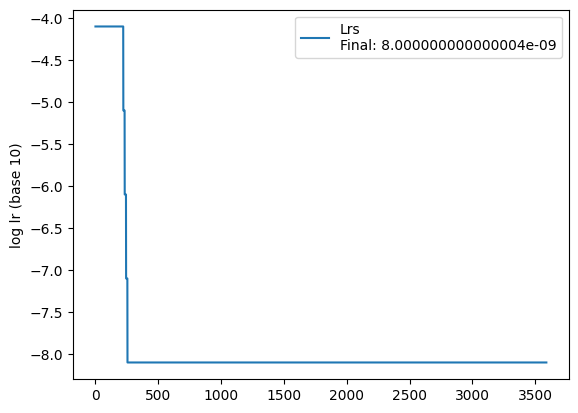


 =============== Epoch 3591 ===============


100%|██████████| 110/110 [00:03<00:00, 28.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 54.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.789622

 =============== Epoch 3592 ===============


100%|██████████| 110/110 [00:03<00:00, 27.98it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.52it/s]


 Test accuracy: 39.7%, Avg loss: 6.789625

 =============== Epoch 3593 ===============


100%|██████████| 110/110 [00:03<00:00, 28.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.29it/s]


 Test accuracy: 39.7%, Avg loss: 6.789628

 =============== Epoch 3594 ===============


100%|██████████| 110/110 [00:03<00:00, 27.85it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.27it/s]


 Test accuracy: 39.7%, Avg loss: 6.789632

 =============== Epoch 3595 ===============


100%|██████████| 110/110 [00:04<00:00, 27.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.23it/s]


 Test accuracy: 39.7%, Avg loss: 6.789636

 =============== Epoch 3596 ===============


100%|██████████| 110/110 [00:03<00:00, 28.40it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 54.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.789639

 =============== Epoch 3597 ===============


100%|██████████| 110/110 [00:03<00:00, 29.94it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.51it/s]


 Test accuracy: 39.7%, Avg loss: 6.789643

 =============== Epoch 3598 ===============


100%|██████████| 110/110 [00:03<00:00, 28.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 54.08it/s]


 Test accuracy: 39.7%, Avg loss: 6.789646

 =============== Epoch 3599 ===============


100%|██████████| 110/110 [00:03<00:00, 27.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 54.93it/s]


 Test accuracy: 39.7%, Avg loss: 6.789650

 =============== Epoch 3600 ===============


100%|██████████| 110/110 [00:03<00:00, 28.48it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 55.29it/s]


 Test accuracy: 39.7%, Avg loss: 6.789653


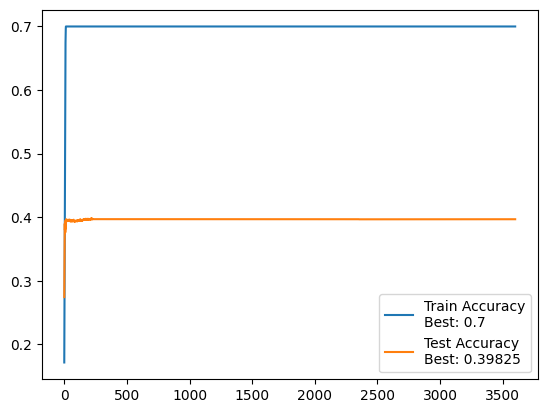

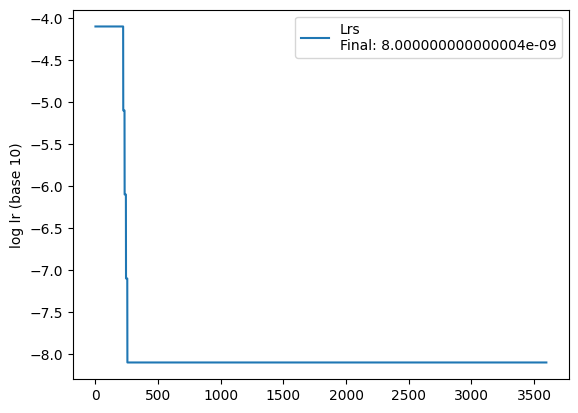


 =============== Epoch 3601 ===============


100%|██████████| 110/110 [00:03<00:00, 27.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.789656

 =============== Epoch 3602 ===============


100%|██████████| 110/110 [00:03<00:00, 28.71it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.62it/s]


 Test accuracy: 39.7%, Avg loss: 6.789660

 =============== Epoch 3603 ===============


100%|██████████| 110/110 [00:03<00:00, 28.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.789664

 =============== Epoch 3604 ===============


100%|██████████| 110/110 [00:03<00:00, 29.07it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.17it/s]


 Test accuracy: 39.7%, Avg loss: 6.789667

 =============== Epoch 3605 ===============


100%|██████████| 110/110 [00:03<00:00, 29.90it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.06it/s]


 Test accuracy: 39.7%, Avg loss: 6.789670

 =============== Epoch 3606 ===============


100%|██████████| 110/110 [00:03<00:00, 29.36it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.789674

 =============== Epoch 3607 ===============


100%|██████████| 110/110 [00:03<00:00, 30.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.92it/s]


 Test accuracy: 39.7%, Avg loss: 6.789678

 =============== Epoch 3608 ===============


100%|██████████| 110/110 [00:03<00:00, 29.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.789681

 =============== Epoch 3609 ===============


100%|██████████| 110/110 [00:03<00:00, 29.33it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.46it/s]


 Test accuracy: 39.7%, Avg loss: 6.789685

 =============== Epoch 3610 ===============


100%|██████████| 110/110 [00:03<00:00, 29.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.789688


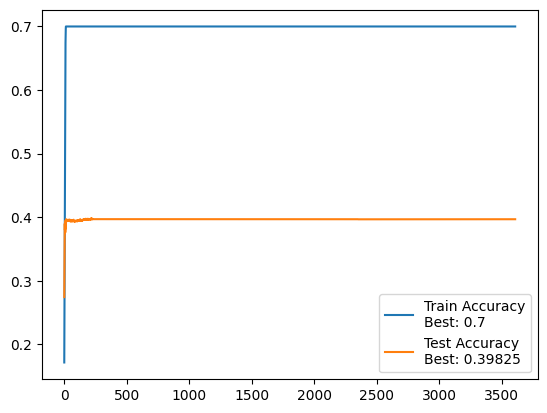

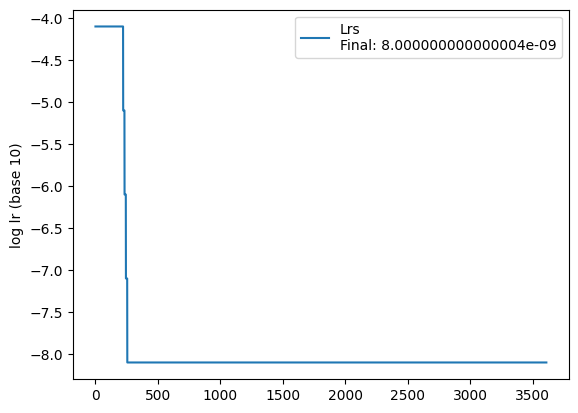


 =============== Epoch 3611 ===============


100%|██████████| 110/110 [00:03<00:00, 28.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.789692

 =============== Epoch 3612 ===============


100%|██████████| 110/110 [00:03<00:00, 30.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.28it/s]


 Test accuracy: 39.7%, Avg loss: 6.789696

 =============== Epoch 3613 ===============


100%|██████████| 110/110 [00:03<00:00, 30.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.789699

 =============== Epoch 3614 ===============


100%|██████████| 110/110 [00:03<00:00, 29.15it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.78it/s]


 Test accuracy: 39.7%, Avg loss: 6.789703

 =============== Epoch 3615 ===============


100%|██████████| 110/110 [00:03<00:00, 29.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.789706

 =============== Epoch 3616 ===============


100%|██████████| 110/110 [00:03<00:00, 30.17it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.27it/s]


 Test accuracy: 39.7%, Avg loss: 6.789709

 =============== Epoch 3617 ===============


100%|██████████| 110/110 [00:03<00:00, 29.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.01it/s]


 Test accuracy: 39.7%, Avg loss: 6.789713

 =============== Epoch 3618 ===============


100%|██████████| 110/110 [00:03<00:00, 29.51it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.04it/s]


 Test accuracy: 39.7%, Avg loss: 6.789717

 =============== Epoch 3619 ===============


100%|██████████| 110/110 [00:03<00:00, 29.49it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.89it/s]


 Test accuracy: 39.7%, Avg loss: 6.789720

 =============== Epoch 3620 ===============


100%|██████████| 110/110 [00:03<00:00, 29.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.789724


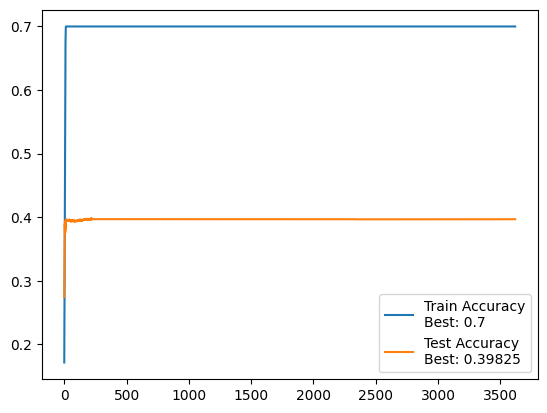

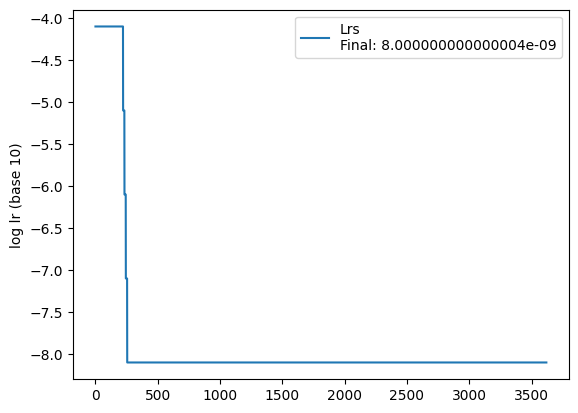


 =============== Epoch 3621 ===============


100%|██████████| 110/110 [00:03<00:00, 29.81it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.789727

 =============== Epoch 3622 ===============


100%|██████████| 110/110 [00:03<00:00, 30.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.03it/s]


 Test accuracy: 39.7%, Avg loss: 6.789730

 =============== Epoch 3623 ===============


100%|██████████| 110/110 [00:03<00:00, 29.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.789734

 =============== Epoch 3624 ===============


100%|██████████| 110/110 [00:03<00:00, 30.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.789738

 =============== Epoch 3625 ===============


100%|██████████| 110/110 [00:03<00:00, 29.48it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.789741

 =============== Epoch 3626 ===============


100%|██████████| 110/110 [00:03<00:00, 29.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.71it/s]


 Test accuracy: 39.7%, Avg loss: 6.789745

 =============== Epoch 3627 ===============


100%|██████████| 110/110 [00:03<00:00, 30.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.789748

 =============== Epoch 3628 ===============


100%|██████████| 110/110 [00:03<00:00, 29.78it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.62it/s]


 Test accuracy: 39.7%, Avg loss: 6.789751

 =============== Epoch 3629 ===============


100%|██████████| 110/110 [00:03<00:00, 29.36it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.44it/s]


 Test accuracy: 39.7%, Avg loss: 6.789755

 =============== Epoch 3630 ===============


100%|██████████| 110/110 [00:03<00:00, 29.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.08it/s]


 Test accuracy: 39.7%, Avg loss: 6.789758


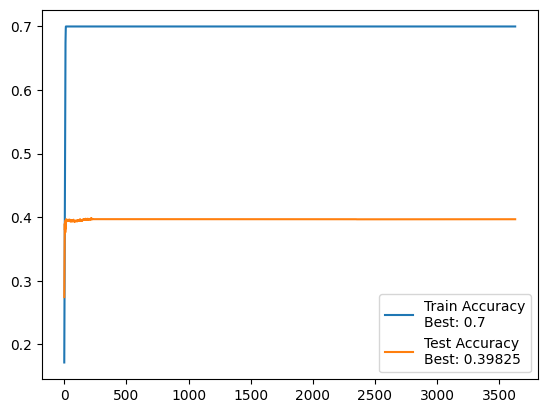

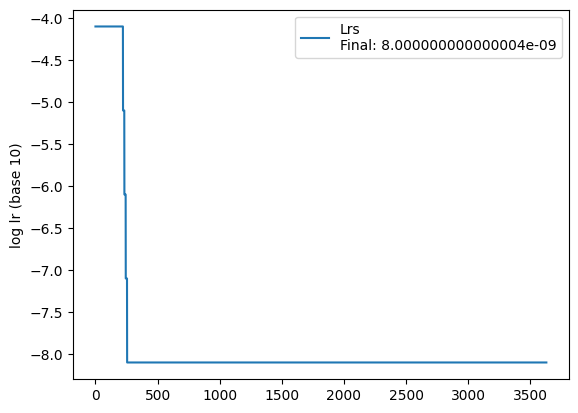


 =============== Epoch 3631 ===============


100%|██████████| 110/110 [00:03<00:00, 29.59it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.789762

 =============== Epoch 3632 ===============


100%|██████████| 110/110 [00:03<00:00, 29.91it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.98it/s]


 Test accuracy: 39.7%, Avg loss: 6.789765

 =============== Epoch 3633 ===============


100%|██████████| 110/110 [00:03<00:00, 29.94it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.789769

 =============== Epoch 3634 ===============


100%|██████████| 110/110 [00:03<00:00, 30.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.93it/s]


 Test accuracy: 39.7%, Avg loss: 6.789773

 =============== Epoch 3635 ===============


100%|██████████| 110/110 [00:03<00:00, 30.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.789776

 =============== Epoch 3636 ===============


100%|██████████| 110/110 [00:03<00:00, 28.89it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.789780

 =============== Epoch 3637 ===============


100%|██████████| 110/110 [00:03<00:00, 29.44it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.14it/s]


 Test accuracy: 39.7%, Avg loss: 6.789784

 =============== Epoch 3638 ===============


100%|██████████| 110/110 [00:03<00:00, 29.51it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.79it/s]


 Test accuracy: 39.7%, Avg loss: 6.789787

 =============== Epoch 3639 ===============


100%|██████████| 110/110 [00:03<00:00, 29.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.789791

 =============== Epoch 3640 ===============


100%|██████████| 110/110 [00:03<00:00, 29.67it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.27it/s]


 Test accuracy: 39.7%, Avg loss: 6.789794


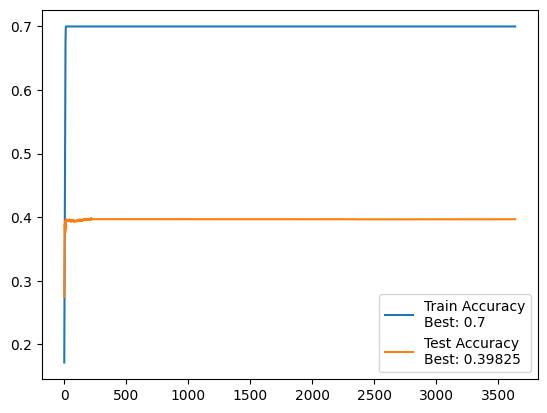

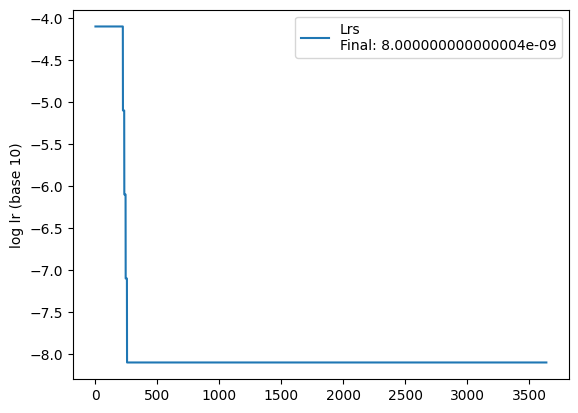


 =============== Epoch 3641 ===============


100%|██████████| 110/110 [00:03<00:00, 29.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.34it/s]


 Test accuracy: 39.7%, Avg loss: 6.789798

 =============== Epoch 3642 ===============


100%|██████████| 110/110 [00:03<00:00, 29.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.84it/s]


 Test accuracy: 39.7%, Avg loss: 6.789801

 =============== Epoch 3643 ===============


100%|██████████| 110/110 [00:03<00:00, 29.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.87it/s]


 Test accuracy: 39.7%, Avg loss: 6.789804

 =============== Epoch 3644 ===============


100%|██████████| 110/110 [00:03<00:00, 29.26it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.33it/s]


 Test accuracy: 39.7%, Avg loss: 6.789808

 =============== Epoch 3645 ===============


100%|██████████| 110/110 [00:03<00:00, 30.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.25it/s]


 Test accuracy: 39.7%, Avg loss: 6.789812

 =============== Epoch 3646 ===============


100%|██████████| 110/110 [00:03<00:00, 29.95it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.789816

 =============== Epoch 3647 ===============


100%|██████████| 110/110 [00:03<00:00, 29.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.87it/s]


 Test accuracy: 39.7%, Avg loss: 6.789819

 =============== Epoch 3648 ===============


100%|██████████| 110/110 [00:03<00:00, 29.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.47it/s]


 Test accuracy: 39.7%, Avg loss: 6.789822

 =============== Epoch 3649 ===============


100%|██████████| 110/110 [00:03<00:00, 29.75it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.01it/s]


 Test accuracy: 39.7%, Avg loss: 6.789826

 =============== Epoch 3650 ===============


100%|██████████| 110/110 [00:03<00:00, 29.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.789829


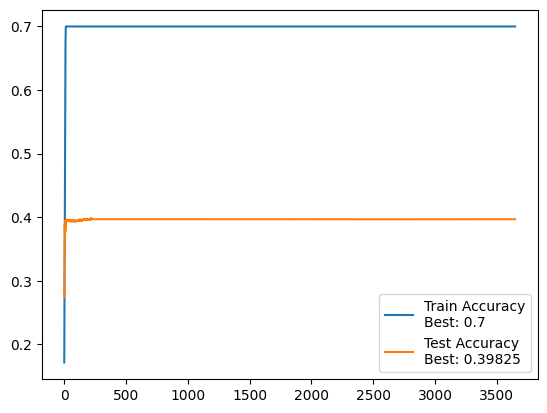

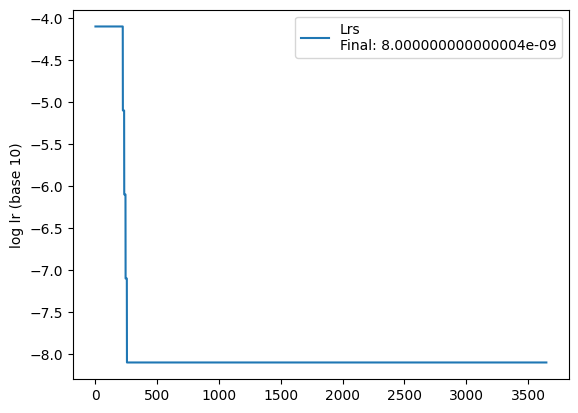


 =============== Epoch 3651 ===============


100%|██████████| 110/110 [00:03<00:00, 29.47it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.95it/s]


 Test accuracy: 39.7%, Avg loss: 6.789833

 =============== Epoch 3652 ===============


100%|██████████| 110/110 [00:03<00:00, 30.04it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.789836

 =============== Epoch 3653 ===============


100%|██████████| 110/110 [00:03<00:00, 29.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.33it/s]


 Test accuracy: 39.7%, Avg loss: 6.789840

 =============== Epoch 3654 ===============


100%|██████████| 110/110 [00:03<00:00, 29.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.87it/s]


 Test accuracy: 39.7%, Avg loss: 6.789843

 =============== Epoch 3655 ===============


100%|██████████| 110/110 [00:03<00:00, 29.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.45it/s]


 Test accuracy: 39.7%, Avg loss: 6.789847

 =============== Epoch 3656 ===============


100%|██████████| 110/110 [00:03<00:00, 29.89it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.85it/s]


 Test accuracy: 39.7%, Avg loss: 6.789850

 =============== Epoch 3657 ===============


100%|██████████| 110/110 [00:03<00:00, 29.73it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.26it/s]


 Test accuracy: 39.7%, Avg loss: 6.789854

 =============== Epoch 3658 ===============


100%|██████████| 110/110 [00:03<00:00, 29.71it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.789857

 =============== Epoch 3659 ===============


100%|██████████| 110/110 [00:03<00:00, 29.44it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.72it/s]


 Test accuracy: 39.7%, Avg loss: 6.789861

 =============== Epoch 3660 ===============


100%|██████████| 110/110 [00:03<00:00, 29.42it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.47it/s]


 Test accuracy: 39.7%, Avg loss: 6.789864


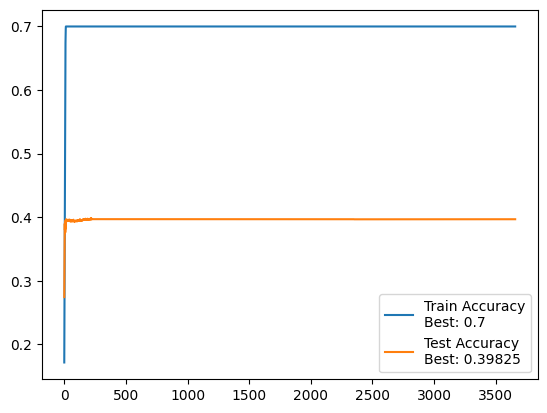

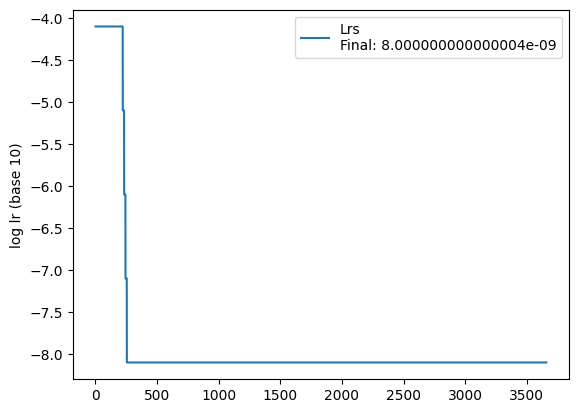


 =============== Epoch 3661 ===============


100%|██████████| 110/110 [00:03<00:00, 28.79it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.789867

 =============== Epoch 3662 ===============


100%|██████████| 110/110 [00:03<00:00, 29.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.28it/s]


 Test accuracy: 39.7%, Avg loss: 6.789871

 =============== Epoch 3663 ===============


100%|██████████| 110/110 [00:03<00:00, 29.78it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.17it/s]


 Test accuracy: 39.7%, Avg loss: 6.789875

 =============== Epoch 3664 ===============


100%|██████████| 110/110 [00:03<00:00, 29.37it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.18it/s]


 Test accuracy: 39.7%, Avg loss: 6.789878

 =============== Epoch 3665 ===============


100%|██████████| 110/110 [00:03<00:00, 29.30it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.99it/s]


 Test accuracy: 39.7%, Avg loss: 6.789882

 =============== Epoch 3666 ===============


100%|██████████| 110/110 [00:03<00:00, 29.33it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.789885

 =============== Epoch 3667 ===============


100%|██████████| 110/110 [00:03<00:00, 29.44it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.789888

 =============== Epoch 3668 ===============


100%|██████████| 110/110 [00:03<00:00, 29.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.26it/s]


 Test accuracy: 39.7%, Avg loss: 6.789892

 =============== Epoch 3669 ===============


100%|██████████| 110/110 [00:03<00:00, 29.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.789896

 =============== Epoch 3670 ===============


100%|██████████| 110/110 [00:03<00:00, 29.51it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.789899


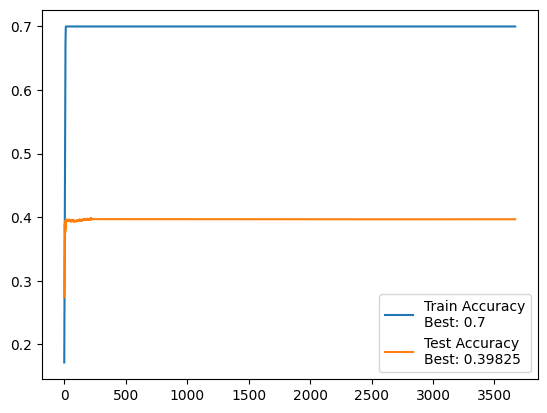

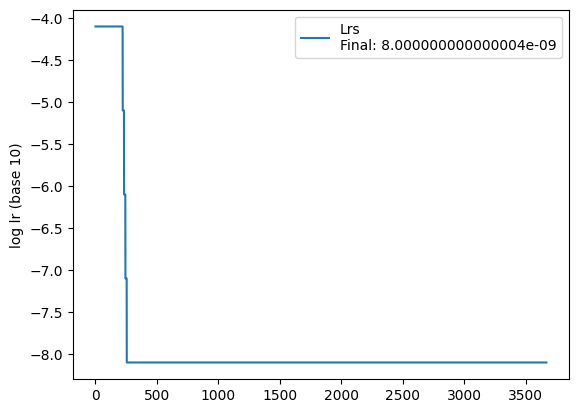


 =============== Epoch 3671 ===============


100%|██████████| 110/110 [00:03<00:00, 29.02it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.789903

 =============== Epoch 3672 ===============


100%|██████████| 110/110 [00:03<00:00, 29.60it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.72it/s]


 Test accuracy: 39.7%, Avg loss: 6.789906

 =============== Epoch 3673 ===============


100%|██████████| 110/110 [00:03<00:00, 29.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.34it/s]


 Test accuracy: 39.7%, Avg loss: 6.789909

 =============== Epoch 3674 ===============


100%|██████████| 110/110 [00:03<00:00, 28.73it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.789913

 =============== Epoch 3675 ===============


100%|██████████| 110/110 [00:03<00:00, 30.17it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.789917

 =============== Epoch 3676 ===============


100%|██████████| 110/110 [00:03<00:00, 29.73it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.87it/s]


 Test accuracy: 39.7%, Avg loss: 6.789920

 =============== Epoch 3677 ===============


100%|██████████| 110/110 [00:03<00:00, 29.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.75it/s]


 Test accuracy: 39.7%, Avg loss: 6.789923

 =============== Epoch 3678 ===============


100%|██████████| 110/110 [00:03<00:00, 29.31it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.03it/s]


 Test accuracy: 39.7%, Avg loss: 6.789926

 =============== Epoch 3679 ===============


100%|██████████| 110/110 [00:03<00:00, 29.47it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.789930

 =============== Epoch 3680 ===============


100%|██████████| 110/110 [00:03<00:00, 29.32it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.789933


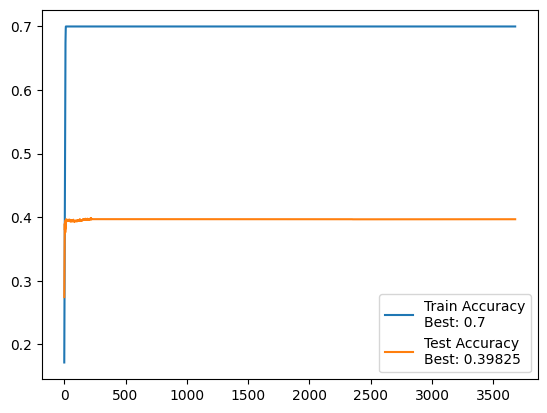

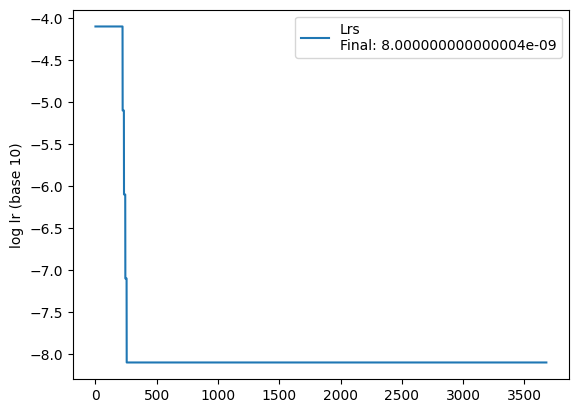


 =============== Epoch 3681 ===============


100%|██████████| 110/110 [00:03<00:00, 28.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.75it/s]


 Test accuracy: 39.7%, Avg loss: 6.789937

 =============== Epoch 3682 ===============


100%|██████████| 110/110 [00:03<00:00, 29.84it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.31it/s]


 Test accuracy: 39.7%, Avg loss: 6.789940

 =============== Epoch 3683 ===============


100%|██████████| 110/110 [00:03<00:00, 30.49it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.22it/s]


 Test accuracy: 39.7%, Avg loss: 6.789943

 =============== Epoch 3684 ===============


100%|██████████| 110/110 [00:03<00:00, 30.59it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.19it/s]


 Test accuracy: 39.7%, Avg loss: 6.789947

 =============== Epoch 3685 ===============


100%|██████████| 110/110 [00:03<00:00, 30.50it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.789950

 =============== Epoch 3686 ===============


100%|██████████| 110/110 [00:03<00:00, 31.18it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.789953

 =============== Epoch 3687 ===============


100%|██████████| 110/110 [00:03<00:00, 31.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.789957

 =============== Epoch 3688 ===============


100%|██████████| 110/110 [00:03<00:00, 31.18it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.38it/s]


 Test accuracy: 39.7%, Avg loss: 6.789960

 =============== Epoch 3689 ===============


100%|██████████| 110/110 [00:03<00:00, 31.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.83it/s]


 Test accuracy: 39.7%, Avg loss: 6.789963

 =============== Epoch 3690 ===============


100%|██████████| 110/110 [00:03<00:00, 30.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.789967


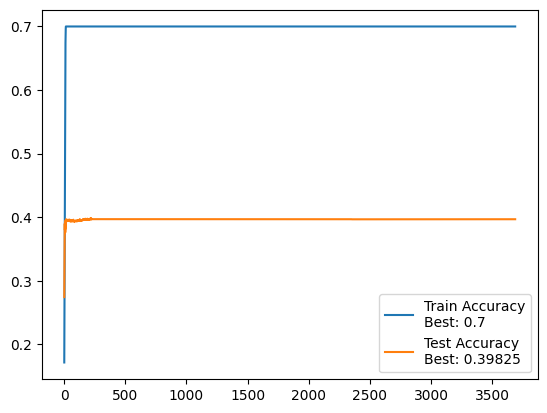

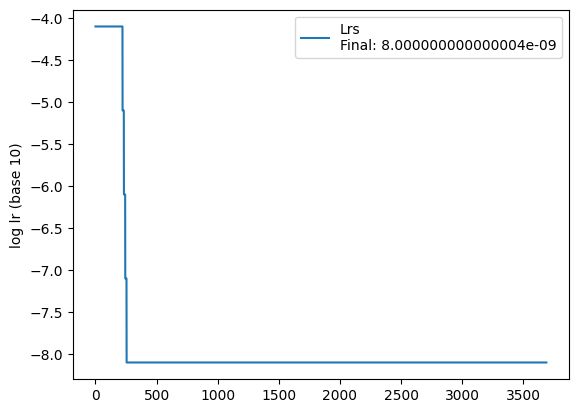


 =============== Epoch 3691 ===============


100%|██████████| 110/110 [00:03<00:00, 30.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.789970

 =============== Epoch 3692 ===============


100%|██████████| 110/110 [00:03<00:00, 30.85it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.21it/s]


 Test accuracy: 39.7%, Avg loss: 6.789974

 =============== Epoch 3693 ===============


100%|██████████| 110/110 [00:03<00:00, 31.38it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.789977

 =============== Epoch 3694 ===============


100%|██████████| 110/110 [00:03<00:00, 30.58it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.66it/s]


 Test accuracy: 39.7%, Avg loss: 6.789980

 =============== Epoch 3695 ===============


100%|██████████| 110/110 [00:03<00:00, 30.67it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.19it/s]


 Test accuracy: 39.7%, Avg loss: 6.789983

 =============== Epoch 3696 ===============


100%|██████████| 110/110 [00:03<00:00, 30.48it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.47it/s]


 Test accuracy: 39.7%, Avg loss: 6.789987

 =============== Epoch 3697 ===============


100%|██████████| 110/110 [00:03<00:00, 31.17it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.24it/s]


 Test accuracy: 39.7%, Avg loss: 6.789990

 =============== Epoch 3698 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.47it/s]


 Test accuracy: 39.7%, Avg loss: 6.789994

 =============== Epoch 3699 ===============


100%|██████████| 110/110 [00:03<00:00, 31.37it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.789997

 =============== Epoch 3700 ===============


100%|██████████| 110/110 [00:03<00:00, 30.89it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.95it/s]


 Test accuracy: 39.7%, Avg loss: 6.790000


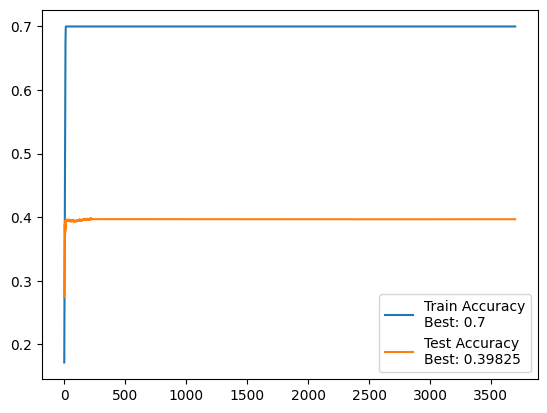

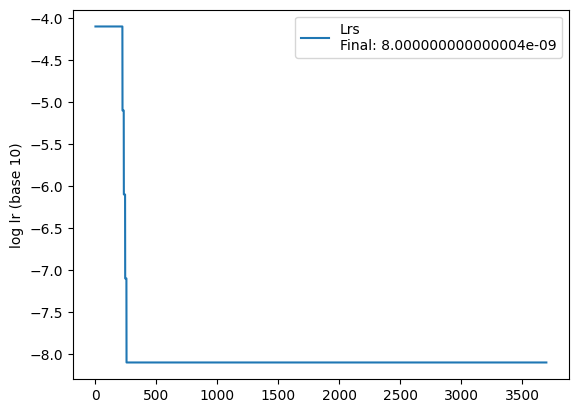


 =============== Epoch 3701 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.93it/s]


 Test accuracy: 39.7%, Avg loss: 6.790004

 =============== Epoch 3702 ===============


100%|██████████| 110/110 [00:03<00:00, 31.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.32it/s]


 Test accuracy: 39.7%, Avg loss: 6.790007

 =============== Epoch 3703 ===============


100%|██████████| 110/110 [00:03<00:00, 30.72it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.790011

 =============== Epoch 3704 ===============


100%|██████████| 110/110 [00:03<00:00, 30.39it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.790014

 =============== Epoch 3705 ===============


100%|██████████| 110/110 [00:03<00:00, 30.46it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.790017

 =============== Epoch 3706 ===============


100%|██████████| 110/110 [00:03<00:00, 31.35it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.790021

 =============== Epoch 3707 ===============


100%|██████████| 110/110 [00:03<00:00, 31.28it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.790024

 =============== Epoch 3708 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.790027

 =============== Epoch 3709 ===============


100%|██████████| 110/110 [00:03<00:00, 30.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.47it/s]


 Test accuracy: 39.7%, Avg loss: 6.790031

 =============== Epoch 3710 ===============


100%|██████████| 110/110 [00:03<00:00, 31.18it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.46it/s]


 Test accuracy: 39.7%, Avg loss: 6.790034


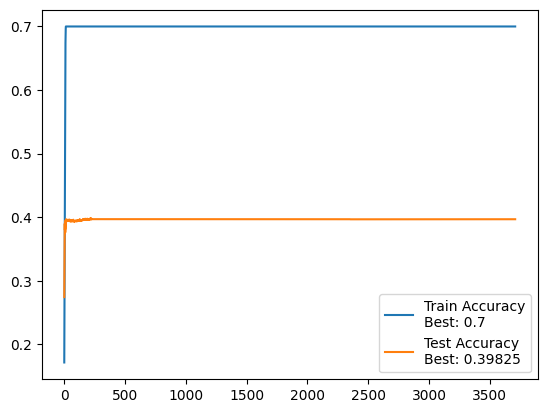

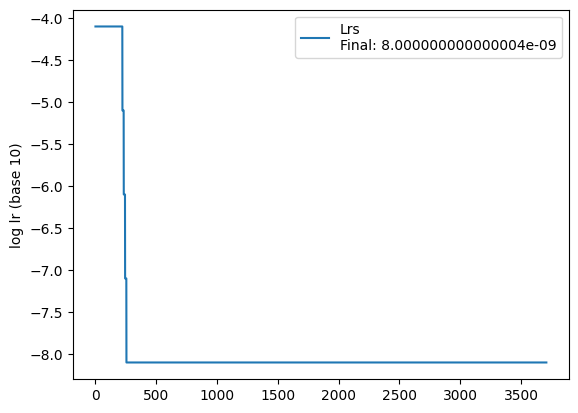


 =============== Epoch 3711 ===============


100%|██████████| 110/110 [00:03<00:00, 31.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.790037

 =============== Epoch 3712 ===============


100%|██████████| 110/110 [00:03<00:00, 31.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.790041

 =============== Epoch 3713 ===============


100%|██████████| 110/110 [00:03<00:00, 31.26it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.23it/s]


 Test accuracy: 39.7%, Avg loss: 6.790044

 =============== Epoch 3714 ===============


100%|██████████| 110/110 [00:03<00:00, 31.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.790047

 =============== Epoch 3715 ===============


100%|██████████| 110/110 [00:03<00:00, 30.73it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.84it/s]


 Test accuracy: 39.7%, Avg loss: 6.790051

 =============== Epoch 3716 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.790054

 =============== Epoch 3717 ===============


100%|██████████| 110/110 [00:03<00:00, 30.89it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.790057

 =============== Epoch 3718 ===============


100%|██████████| 110/110 [00:03<00:00, 30.68it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.790060

 =============== Epoch 3719 ===============


100%|██████████| 110/110 [00:03<00:00, 30.72it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.89it/s]


 Test accuracy: 39.7%, Avg loss: 6.790064

 =============== Epoch 3720 ===============


100%|██████████| 110/110 [00:03<00:00, 30.73it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.790067


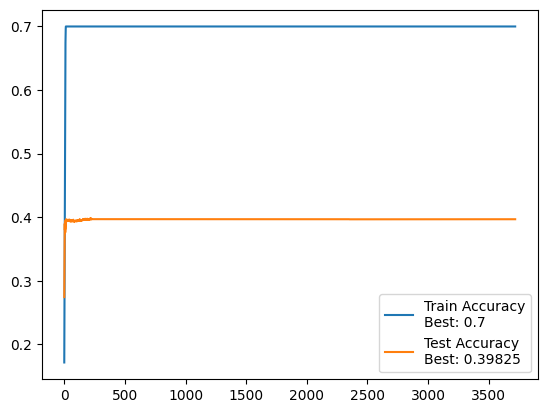

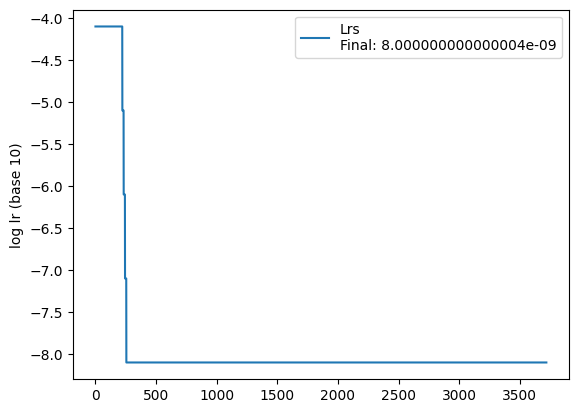


 =============== Epoch 3721 ===============


100%|██████████| 110/110 [00:03<00:00, 29.54it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.790071

 =============== Epoch 3722 ===============


100%|██████████| 110/110 [00:03<00:00, 30.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.09it/s]


 Test accuracy: 39.7%, Avg loss: 6.790074

 =============== Epoch 3723 ===============


100%|██████████| 110/110 [00:03<00:00, 31.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.790077

 =============== Epoch 3724 ===============


100%|██████████| 110/110 [00:03<00:00, 30.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.790080

 =============== Epoch 3725 ===============


100%|██████████| 110/110 [00:03<00:00, 30.81it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.11it/s]


 Test accuracy: 39.7%, Avg loss: 6.790084

 =============== Epoch 3726 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.01it/s]


 Test accuracy: 39.7%, Avg loss: 6.790087

 =============== Epoch 3727 ===============


100%|██████████| 110/110 [00:03<00:00, 31.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.38it/s]


 Test accuracy: 39.7%, Avg loss: 6.790090

 =============== Epoch 3728 ===============


100%|██████████| 110/110 [00:03<00:00, 30.34it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.25it/s]


 Test accuracy: 39.7%, Avg loss: 6.790093

 =============== Epoch 3729 ===============


100%|██████████| 110/110 [00:03<00:00, 30.52it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.790097

 =============== Epoch 3730 ===============


100%|██████████| 110/110 [00:03<00:00, 29.89it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.83it/s]


 Test accuracy: 39.7%, Avg loss: 6.790100


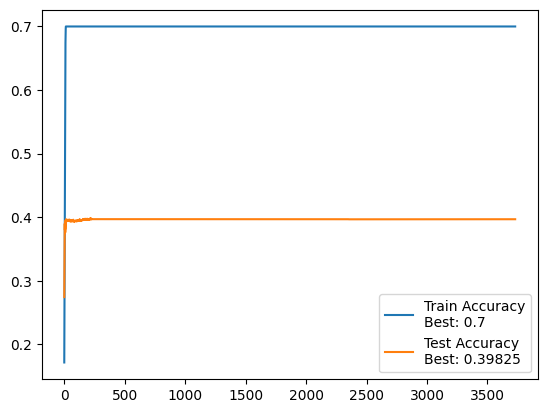

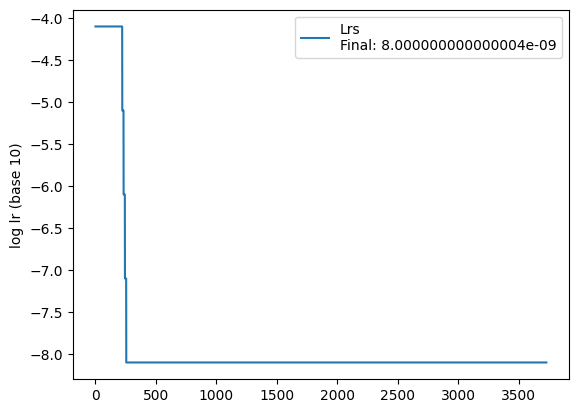


 =============== Epoch 3731 ===============


100%|██████████| 110/110 [00:03<00:00, 30.28it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.790103

 =============== Epoch 3732 ===============


100%|██████████| 110/110 [00:03<00:00, 30.62it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.45it/s]


 Test accuracy: 39.7%, Avg loss: 6.790107

 =============== Epoch 3733 ===============


100%|██████████| 110/110 [00:03<00:00, 31.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.73it/s]


 Test accuracy: 39.7%, Avg loss: 6.790110

 =============== Epoch 3734 ===============


100%|██████████| 110/110 [00:03<00:00, 30.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.71it/s]


 Test accuracy: 39.7%, Avg loss: 6.790113

 =============== Epoch 3735 ===============


100%|██████████| 110/110 [00:03<00:00, 30.94it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.790117

 =============== Epoch 3736 ===============


100%|██████████| 110/110 [00:03<00:00, 30.93it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.73it/s]


 Test accuracy: 39.7%, Avg loss: 6.790120

 =============== Epoch 3737 ===============


100%|██████████| 110/110 [00:03<00:00, 31.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.23it/s]


 Test accuracy: 39.7%, Avg loss: 6.790123

 =============== Epoch 3738 ===============


100%|██████████| 110/110 [00:03<00:00, 30.56it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.27it/s]


 Test accuracy: 39.7%, Avg loss: 6.790127

 =============== Epoch 3739 ===============


100%|██████████| 110/110 [00:03<00:00, 30.46it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.790130

 =============== Epoch 3740 ===============


100%|██████████| 110/110 [00:03<00:00, 29.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.76it/s]


 Test accuracy: 39.7%, Avg loss: 6.790133


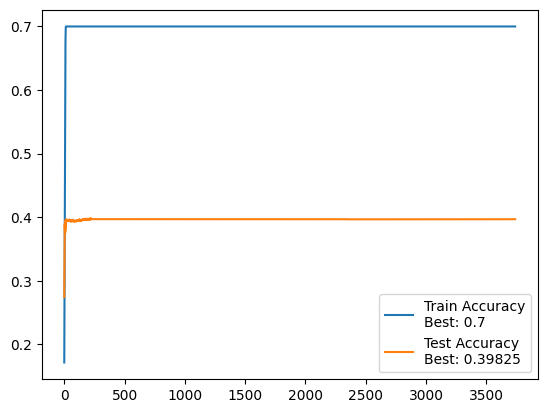

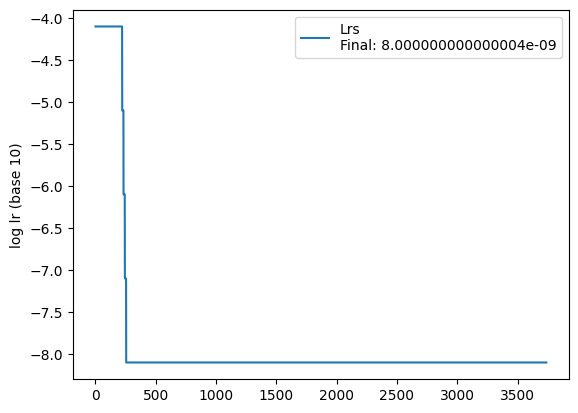


 =============== Epoch 3741 ===============


100%|██████████| 110/110 [00:03<00:00, 30.30it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.92it/s]


 Test accuracy: 39.7%, Avg loss: 6.790137

 =============== Epoch 3742 ===============


100%|██████████| 110/110 [00:03<00:00, 30.65it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.790140

 =============== Epoch 3743 ===============


100%|██████████| 110/110 [00:03<00:00, 30.75it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.89it/s]


 Test accuracy: 39.7%, Avg loss: 6.790143

 =============== Epoch 3744 ===============


100%|██████████| 110/110 [00:03<00:00, 30.48it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.790146

 =============== Epoch 3745 ===============


100%|██████████| 110/110 [00:03<00:00, 30.35it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.790150

 =============== Epoch 3746 ===============


100%|██████████| 110/110 [00:03<00:00, 30.65it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.790153

 =============== Epoch 3747 ===============


100%|██████████| 110/110 [00:03<00:00, 30.29it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.790156

 =============== Epoch 3748 ===============


100%|██████████| 110/110 [00:03<00:00, 30.42it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.47it/s]


 Test accuracy: 39.7%, Avg loss: 6.790159

 =============== Epoch 3749 ===============


100%|██████████| 110/110 [00:03<00:00, 31.15it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.790163

 =============== Epoch 3750 ===============


100%|██████████| 110/110 [00:03<00:00, 31.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.30it/s]


 Test accuracy: 39.7%, Avg loss: 6.790166


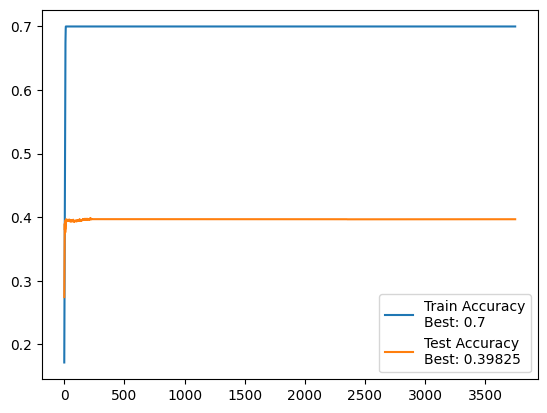

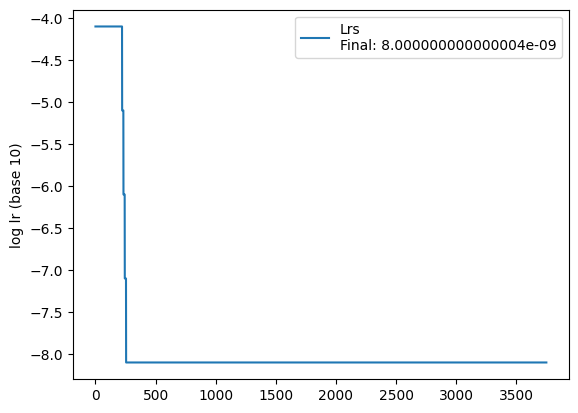


 =============== Epoch 3751 ===============


100%|██████████| 110/110 [00:03<00:00, 30.52it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.790170

 =============== Epoch 3752 ===============


100%|██████████| 110/110 [00:03<00:00, 31.04it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.44it/s]


 Test accuracy: 39.7%, Avg loss: 6.790173

 =============== Epoch 3753 ===============


100%|██████████| 110/110 [00:03<00:00, 30.95it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.32it/s]


 Test accuracy: 39.7%, Avg loss: 6.790176

 =============== Epoch 3754 ===============


100%|██████████| 110/110 [00:03<00:00, 31.02it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.06it/s]


 Test accuracy: 39.7%, Avg loss: 6.790180

 =============== Epoch 3755 ===============


100%|██████████| 110/110 [00:03<00:00, 31.28it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.89it/s]


 Test accuracy: 39.7%, Avg loss: 6.790183

 =============== Epoch 3756 ===============


100%|██████████| 110/110 [00:03<00:00, 31.15it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.47it/s]


 Test accuracy: 39.7%, Avg loss: 6.790187

 =============== Epoch 3757 ===============


100%|██████████| 110/110 [00:03<00:00, 30.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.38it/s]


 Test accuracy: 39.7%, Avg loss: 6.790190

 =============== Epoch 3758 ===============


100%|██████████| 110/110 [00:03<00:00, 31.15it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.790193

 =============== Epoch 3759 ===============


100%|██████████| 110/110 [00:03<00:00, 31.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.790196

 =============== Epoch 3760 ===============


100%|██████████| 110/110 [00:03<00:00, 30.71it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.41it/s]


 Test accuracy: 39.7%, Avg loss: 6.790200


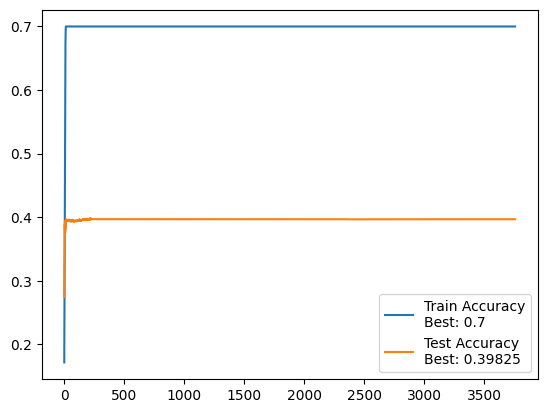

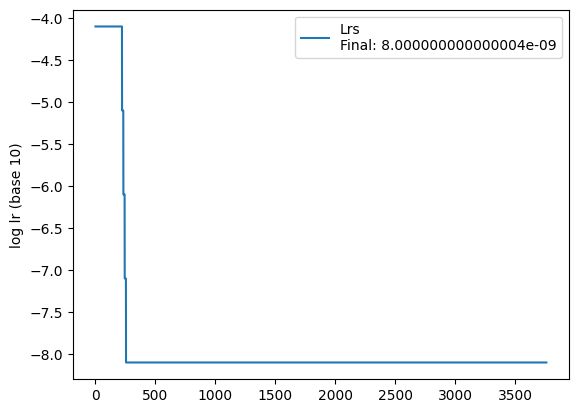


 =============== Epoch 3761 ===============


100%|██████████| 110/110 [00:03<00:00, 30.81it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.790203

 =============== Epoch 3762 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.790206

 =============== Epoch 3763 ===============


100%|██████████| 110/110 [00:03<00:00, 31.28it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.46it/s]


 Test accuracy: 39.7%, Avg loss: 6.790210

 =============== Epoch 3764 ===============


100%|██████████| 110/110 [00:03<00:00, 30.38it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.38it/s]


 Test accuracy: 39.7%, Avg loss: 6.790213

 =============== Epoch 3765 ===============


100%|██████████| 110/110 [00:03<00:00, 30.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.43it/s]


 Test accuracy: 39.7%, Avg loss: 6.790216

 =============== Epoch 3766 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.790220

 =============== Epoch 3767 ===============


100%|██████████| 110/110 [00:03<00:00, 31.03it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.87it/s]


 Test accuracy: 39.7%, Avg loss: 6.790223

 =============== Epoch 3768 ===============


100%|██████████| 110/110 [00:03<00:00, 30.70it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.18it/s]


 Test accuracy: 39.7%, Avg loss: 6.790226

 =============== Epoch 3769 ===============


100%|██████████| 110/110 [00:03<00:00, 31.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.43it/s]


 Test accuracy: 39.7%, Avg loss: 6.790230

 =============== Epoch 3770 ===============


100%|██████████| 110/110 [00:03<00:00, 31.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.790232


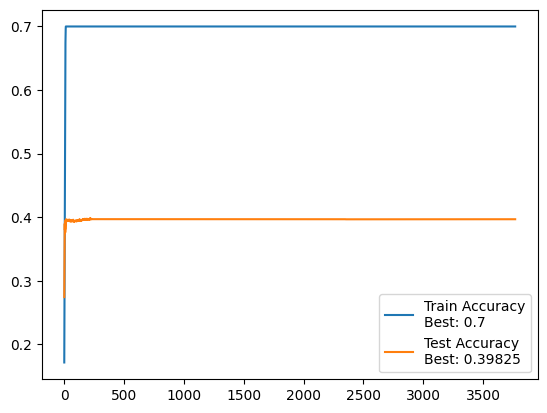

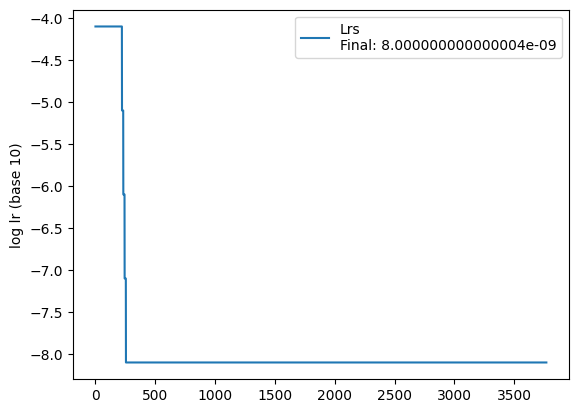


 =============== Epoch 3771 ===============


100%|██████████| 110/110 [00:03<00:00, 30.34it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.27it/s]


 Test accuracy: 39.7%, Avg loss: 6.790236

 =============== Epoch 3772 ===============


100%|██████████| 110/110 [00:03<00:00, 29.84it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.790239

 =============== Epoch 3773 ===============


100%|██████████| 110/110 [00:03<00:00, 30.56it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.790242

 =============== Epoch 3774 ===============


100%|██████████| 110/110 [00:03<00:00, 30.51it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.18it/s]


 Test accuracy: 39.7%, Avg loss: 6.790246

 =============== Epoch 3775 ===============


100%|██████████| 110/110 [00:03<00:00, 30.04it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.790248

 =============== Epoch 3776 ===============


100%|██████████| 110/110 [00:03<00:00, 30.37it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.62it/s]


 Test accuracy: 39.7%, Avg loss: 6.790252

 =============== Epoch 3777 ===============


100%|██████████| 110/110 [00:03<00:00, 30.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.790255

 =============== Epoch 3778 ===============


100%|██████████| 110/110 [00:03<00:00, 30.33it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.790258

 =============== Epoch 3779 ===============


100%|██████████| 110/110 [00:03<00:00, 30.25it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.790262

 =============== Epoch 3780 ===============


100%|██████████| 110/110 [00:03<00:00, 31.04it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.98it/s]


 Test accuracy: 39.7%, Avg loss: 6.790265


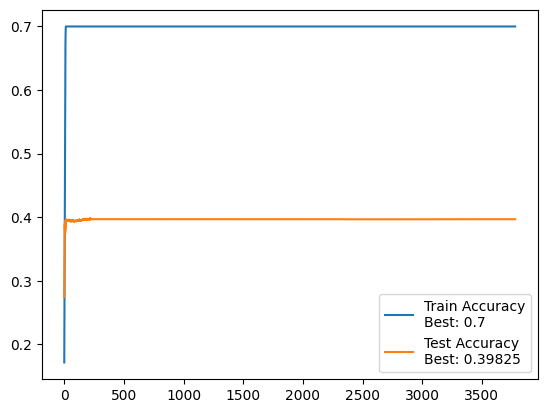

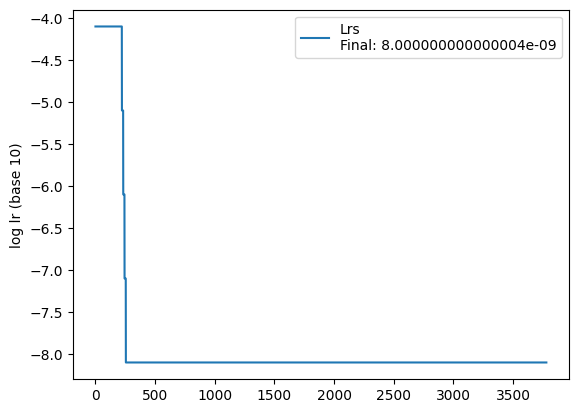


 =============== Epoch 3781 ===============


100%|██████████| 110/110 [00:03<00:00, 30.34it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.790268

 =============== Epoch 3782 ===============


100%|██████████| 110/110 [00:03<00:00, 31.03it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.44it/s]


 Test accuracy: 39.7%, Avg loss: 6.790272

 =============== Epoch 3783 ===============


100%|██████████| 110/110 [00:03<00:00, 30.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.27it/s]


 Test accuracy: 39.7%, Avg loss: 6.790275

 =============== Epoch 3784 ===============


100%|██████████| 110/110 [00:03<00:00, 31.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.790278

 =============== Epoch 3785 ===============


100%|██████████| 110/110 [00:03<00:00, 30.91it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.96it/s]


 Test accuracy: 39.7%, Avg loss: 6.790281

 =============== Epoch 3786 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.30it/s]


 Test accuracy: 39.7%, Avg loss: 6.790284

 =============== Epoch 3787 ===============


100%|██████████| 110/110 [00:03<00:00, 31.07it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.33it/s]


 Test accuracy: 39.7%, Avg loss: 6.790288

 =============== Epoch 3788 ===============


100%|██████████| 110/110 [00:03<00:00, 30.36it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.19it/s]


 Test accuracy: 39.7%, Avg loss: 6.790291

 =============== Epoch 3789 ===============


100%|██████████| 110/110 [00:03<00:00, 30.30it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.87it/s]


 Test accuracy: 39.7%, Avg loss: 6.790295

 =============== Epoch 3790 ===============


100%|██████████| 110/110 [00:03<00:00, 30.31it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.790298


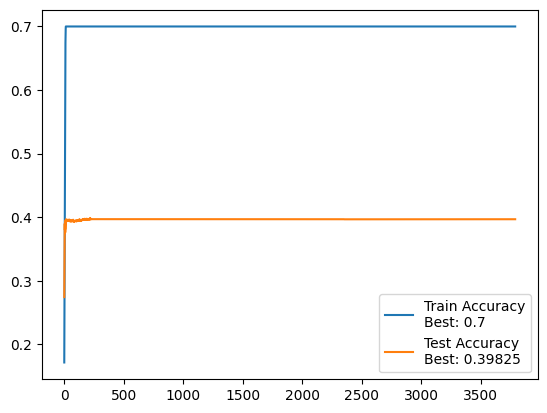

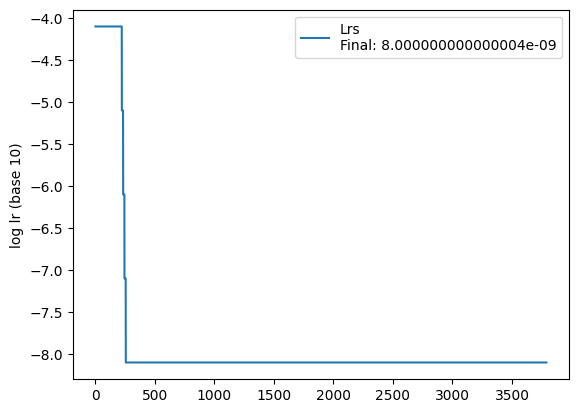


 =============== Epoch 3791 ===============


100%|██████████| 110/110 [00:03<00:00, 29.38it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.98it/s]


 Test accuracy: 39.7%, Avg loss: 6.790301

 =============== Epoch 3792 ===============


100%|██████████| 110/110 [00:03<00:00, 29.65it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.87it/s]


 Test accuracy: 39.7%, Avg loss: 6.790304

 =============== Epoch 3793 ===============


100%|██████████| 110/110 [00:03<00:00, 29.30it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.17it/s]


 Test accuracy: 39.7%, Avg loss: 6.790308

 =============== Epoch 3794 ===============


100%|██████████| 110/110 [00:03<00:00, 29.56it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.790310

 =============== Epoch 3795 ===============


100%|██████████| 110/110 [00:03<00:00, 29.71it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.790314

 =============== Epoch 3796 ===============


100%|██████████| 110/110 [00:03<00:00, 29.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.790317

 =============== Epoch 3797 ===============


100%|██████████| 110/110 [00:03<00:00, 29.60it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.790320

 =============== Epoch 3798 ===============


100%|██████████| 110/110 [00:03<00:00, 29.39it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.98it/s]


 Test accuracy: 39.7%, Avg loss: 6.790324

 =============== Epoch 3799 ===============


100%|██████████| 110/110 [00:03<00:00, 29.62it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.24it/s]


 Test accuracy: 39.7%, Avg loss: 6.790327

 =============== Epoch 3800 ===============


100%|██████████| 110/110 [00:03<00:00, 29.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.84it/s]


 Test accuracy: 39.7%, Avg loss: 6.790330


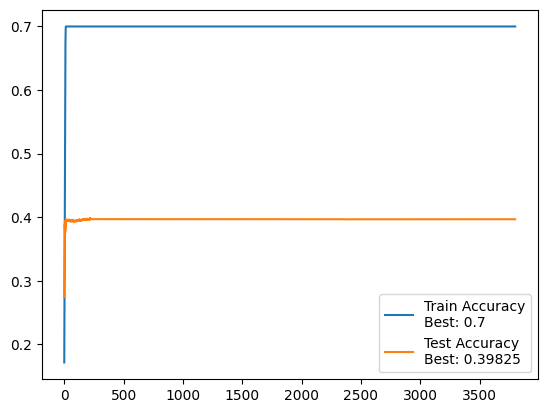

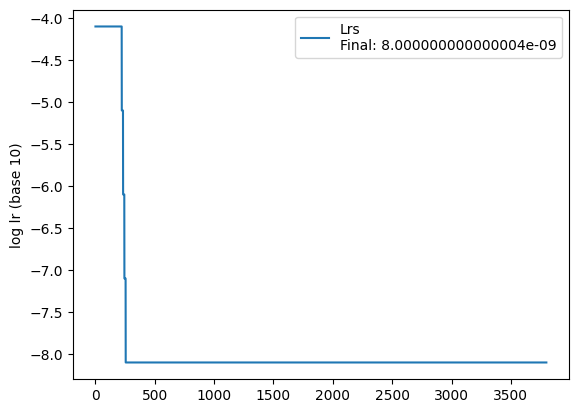


 =============== Epoch 3801 ===============


100%|██████████| 110/110 [00:03<00:00, 29.72it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.790333

 =============== Epoch 3802 ===============


100%|██████████| 110/110 [00:03<00:00, 29.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.39it/s]


 Test accuracy: 39.7%, Avg loss: 6.790337

 =============== Epoch 3803 ===============


100%|██████████| 110/110 [00:03<00:00, 29.79it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.01it/s]


 Test accuracy: 39.7%, Avg loss: 6.790340

 =============== Epoch 3804 ===============


100%|██████████| 110/110 [00:03<00:00, 29.71it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.17it/s]


 Test accuracy: 39.7%, Avg loss: 6.790343

 =============== Epoch 3805 ===============


100%|██████████| 110/110 [00:03<00:00, 29.69it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.62it/s]


 Test accuracy: 39.7%, Avg loss: 6.790346

 =============== Epoch 3806 ===============


100%|██████████| 110/110 [00:03<00:00, 29.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.44it/s]


 Test accuracy: 39.7%, Avg loss: 6.790350

 =============== Epoch 3807 ===============


100%|██████████| 110/110 [00:03<00:00, 29.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.29it/s]


 Test accuracy: 39.7%, Avg loss: 6.790353

 =============== Epoch 3808 ===============


100%|██████████| 110/110 [00:03<00:00, 29.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.66it/s]


 Test accuracy: 39.7%, Avg loss: 6.790356

 =============== Epoch 3809 ===============


100%|██████████| 110/110 [00:03<00:00, 29.35it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.46it/s]


 Test accuracy: 39.7%, Avg loss: 6.790360

 =============== Epoch 3810 ===============


100%|██████████| 110/110 [00:03<00:00, 28.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.86it/s]


 Test accuracy: 39.7%, Avg loss: 6.790363


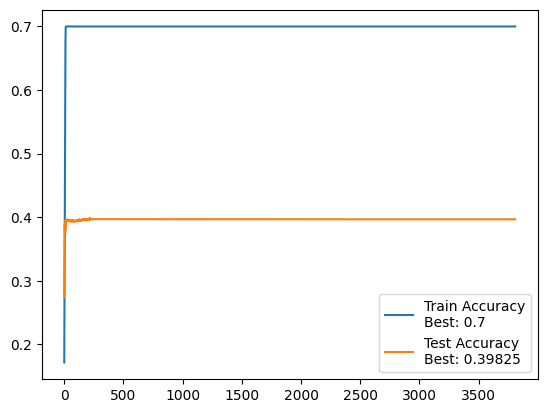

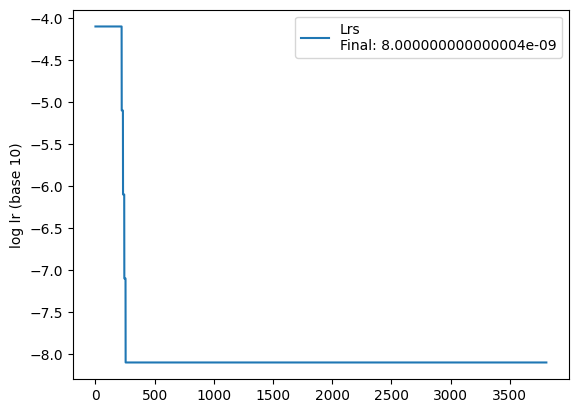


 =============== Epoch 3811 ===============


100%|██████████| 110/110 [00:03<00:00, 29.45it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.41it/s]


 Test accuracy: 39.7%, Avg loss: 6.790366

 =============== Epoch 3812 ===============


100%|██████████| 110/110 [00:03<00:00, 30.44it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.72it/s]


 Test accuracy: 39.7%, Avg loss: 6.790370

 =============== Epoch 3813 ===============


100%|██████████| 110/110 [00:03<00:00, 30.40it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.98it/s]


 Test accuracy: 39.7%, Avg loss: 6.790373

 =============== Epoch 3814 ===============


100%|██████████| 110/110 [00:03<00:00, 30.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.06it/s]


 Test accuracy: 39.7%, Avg loss: 6.790376

 =============== Epoch 3815 ===============


100%|██████████| 110/110 [00:03<00:00, 30.24it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.790379

 =============== Epoch 3816 ===============


100%|██████████| 110/110 [00:03<00:00, 30.22it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.62it/s]


 Test accuracy: 39.7%, Avg loss: 6.790382

 =============== Epoch 3817 ===============


100%|██████████| 110/110 [00:03<00:00, 30.11it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.790385

 =============== Epoch 3818 ===============


100%|██████████| 110/110 [00:03<00:00, 30.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.790388

 =============== Epoch 3819 ===============


100%|██████████| 110/110 [00:03<00:00, 30.32it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.88it/s]


 Test accuracy: 39.7%, Avg loss: 6.790392

 =============== Epoch 3820 ===============


100%|██████████| 110/110 [00:03<00:00, 30.58it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.04it/s]


 Test accuracy: 39.7%, Avg loss: 6.790395


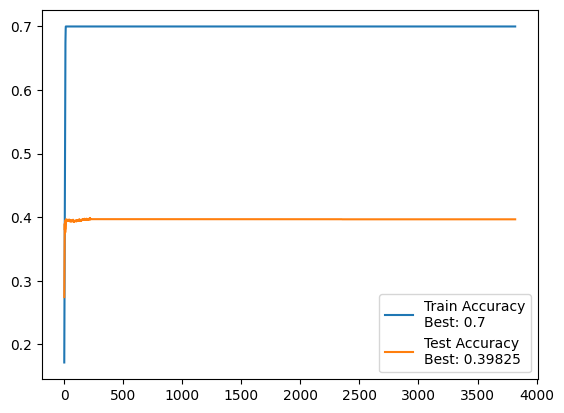

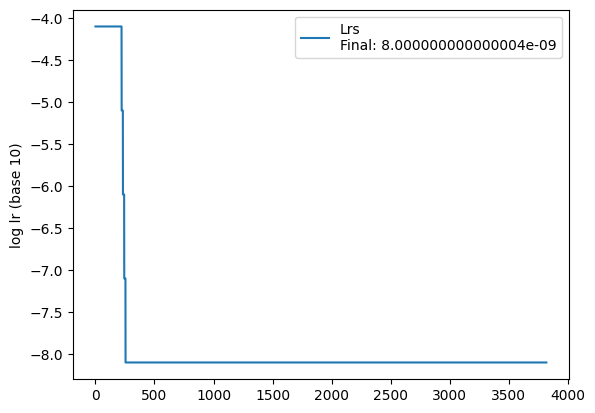


 =============== Epoch 3821 ===============


100%|██████████| 110/110 [00:03<00:00, 29.22it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.96it/s]


 Test accuracy: 39.7%, Avg loss: 6.790398

 =============== Epoch 3822 ===============


100%|██████████| 110/110 [00:03<00:00, 30.33it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.57it/s]


 Test accuracy: 39.7%, Avg loss: 6.790401

 =============== Epoch 3823 ===============


100%|██████████| 110/110 [00:03<00:00, 30.41it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.98it/s]


 Test accuracy: 39.7%, Avg loss: 6.790405

 =============== Epoch 3824 ===============


100%|██████████| 110/110 [00:03<00:00, 30.51it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.790408

 =============== Epoch 3825 ===============


100%|██████████| 110/110 [00:03<00:00, 30.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.79it/s]


 Test accuracy: 39.7%, Avg loss: 6.790411

 =============== Epoch 3826 ===============


100%|██████████| 110/110 [00:03<00:00, 30.62it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.57it/s]


 Test accuracy: 39.7%, Avg loss: 6.790414

 =============== Epoch 3827 ===============


100%|██████████| 110/110 [00:03<00:00, 30.42it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.88it/s]


 Test accuracy: 39.7%, Avg loss: 6.790418

 =============== Epoch 3828 ===============


100%|██████████| 110/110 [00:03<00:00, 30.34it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.61it/s]


 Test accuracy: 39.7%, Avg loss: 6.790421

 =============== Epoch 3829 ===============


100%|██████████| 110/110 [00:03<00:00, 28.95it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.46it/s]


 Test accuracy: 39.7%, Avg loss: 6.790424

 =============== Epoch 3830 ===============


100%|██████████| 110/110 [00:03<00:00, 29.78it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.78it/s]


 Test accuracy: 39.7%, Avg loss: 6.790427


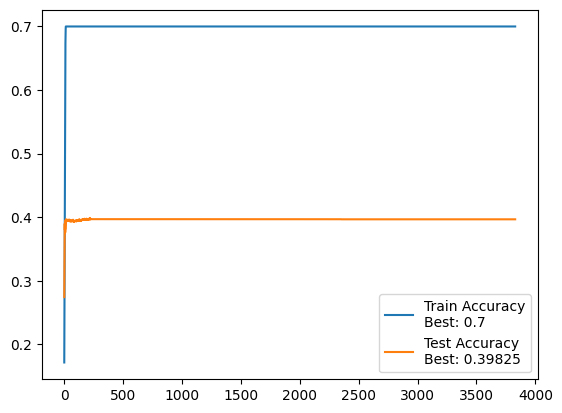

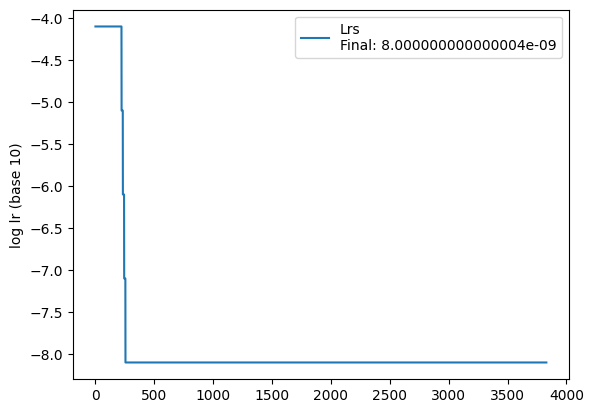


 =============== Epoch 3831 ===============


100%|██████████| 110/110 [00:03<00:00, 29.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.01it/s]


 Test accuracy: 39.7%, Avg loss: 6.790430

 =============== Epoch 3832 ===============


100%|██████████| 110/110 [00:03<00:00, 29.24it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.87it/s]


 Test accuracy: 39.7%, Avg loss: 6.790434

 =============== Epoch 3833 ===============


100%|██████████| 110/110 [00:03<00:00, 29.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.68it/s]


 Test accuracy: 39.7%, Avg loss: 6.790437

 =============== Epoch 3834 ===============


100%|██████████| 110/110 [00:03<00:00, 29.75it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.68it/s]


 Test accuracy: 39.7%, Avg loss: 6.790440

 =============== Epoch 3835 ===============


100%|██████████| 110/110 [00:03<00:00, 29.67it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.32it/s]


 Test accuracy: 39.7%, Avg loss: 6.790443

 =============== Epoch 3836 ===============


100%|██████████| 110/110 [00:03<00:00, 28.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.06it/s]


 Test accuracy: 39.7%, Avg loss: 6.790446

 =============== Epoch 3837 ===============


100%|██████████| 110/110 [00:03<00:00, 29.71it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.99it/s]


 Test accuracy: 39.7%, Avg loss: 6.790449

 =============== Epoch 3838 ===============


100%|██████████| 110/110 [00:03<00:00, 29.63it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.99it/s]


 Test accuracy: 39.7%, Avg loss: 6.790452

 =============== Epoch 3839 ===============


100%|██████████| 110/110 [00:03<00:00, 29.75it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.68it/s]


 Test accuracy: 39.7%, Avg loss: 6.790456

 =============== Epoch 3840 ===============


100%|██████████| 110/110 [00:03<00:00, 29.09it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.58it/s]


 Test accuracy: 39.7%, Avg loss: 6.790459


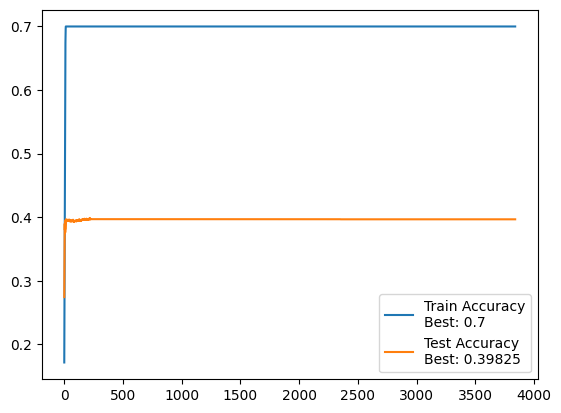

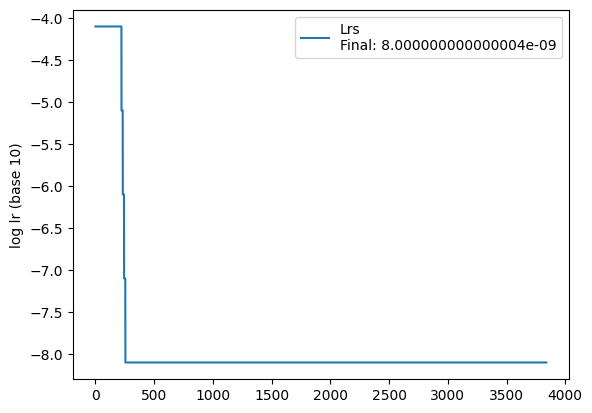


 =============== Epoch 3841 ===============


100%|██████████| 110/110 [00:03<00:00, 30.28it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.790462

 =============== Epoch 3842 ===============


100%|██████████| 110/110 [00:03<00:00, 31.04it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.790465

 =============== Epoch 3843 ===============


100%|██████████| 110/110 [00:03<00:00, 31.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.40it/s]


 Test accuracy: 39.7%, Avg loss: 6.790468

 =============== Epoch 3844 ===============


100%|██████████| 110/110 [00:03<00:00, 31.04it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.71it/s]


 Test accuracy: 39.7%, Avg loss: 6.790471

 =============== Epoch 3845 ===============


100%|██████████| 110/110 [00:03<00:00, 30.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.790475

 =============== Epoch 3846 ===============


100%|██████████| 110/110 [00:03<00:00, 31.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.99it/s]


 Test accuracy: 39.7%, Avg loss: 6.790478

 =============== Epoch 3847 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.790481

 =============== Epoch 3848 ===============


100%|██████████| 110/110 [00:03<00:00, 31.09it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.32it/s]


 Test accuracy: 39.7%, Avg loss: 6.790484

 =============== Epoch 3849 ===============


100%|██████████| 110/110 [00:03<00:00, 30.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.790487

 =============== Epoch 3850 ===============


100%|██████████| 110/110 [00:03<00:00, 31.28it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.18it/s]


 Test accuracy: 39.7%, Avg loss: 6.790491


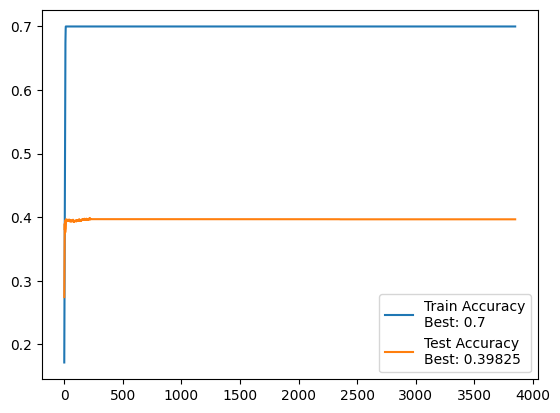

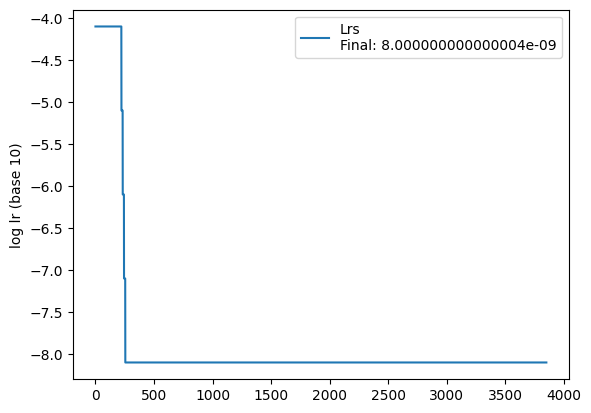


 =============== Epoch 3851 ===============


100%|██████████| 110/110 [00:03<00:00, 29.93it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.790494

 =============== Epoch 3852 ===============


100%|██████████| 110/110 [00:03<00:00, 31.15it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.21it/s]


 Test accuracy: 39.7%, Avg loss: 6.790497

 =============== Epoch 3853 ===============


100%|██████████| 110/110 [00:03<00:00, 31.05it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.47it/s]


 Test accuracy: 39.7%, Avg loss: 6.790500

 =============== Epoch 3854 ===============


100%|██████████| 110/110 [00:03<00:00, 30.89it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.790503

 =============== Epoch 3855 ===============


100%|██████████| 110/110 [00:03<00:00, 30.57it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.62it/s]


 Test accuracy: 39.7%, Avg loss: 6.790506

 =============== Epoch 3856 ===============


100%|██████████| 110/110 [00:03<00:00, 30.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.35it/s]


 Test accuracy: 39.7%, Avg loss: 6.790509

 =============== Epoch 3857 ===============


100%|██████████| 110/110 [00:03<00:00, 30.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.790512

 =============== Epoch 3858 ===============


100%|██████████| 110/110 [00:03<00:00, 30.93it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.35it/s]


 Test accuracy: 39.7%, Avg loss: 6.790516

 =============== Epoch 3859 ===============


100%|██████████| 110/110 [00:03<00:00, 30.76it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.790519

 =============== Epoch 3860 ===============


100%|██████████| 110/110 [00:03<00:00, 31.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.73it/s]


 Test accuracy: 39.7%, Avg loss: 6.790522


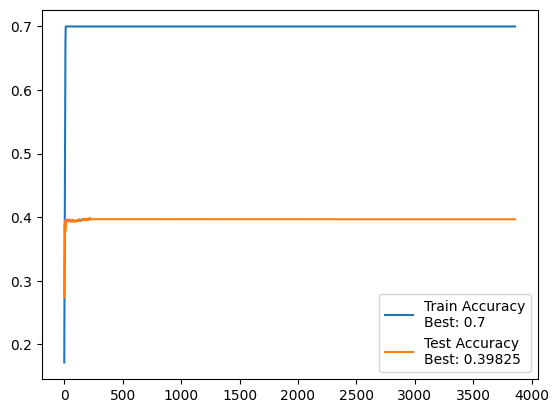

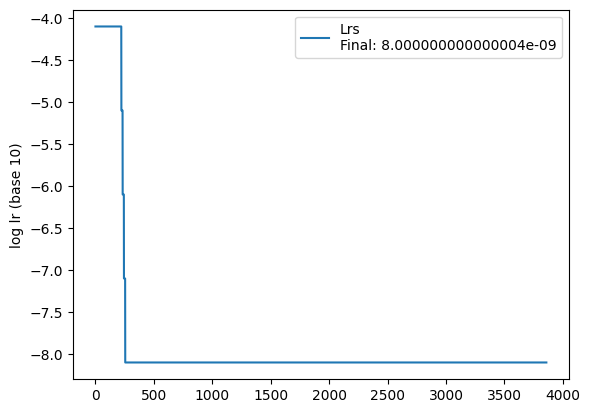


 =============== Epoch 3861 ===============


100%|██████████| 110/110 [00:03<00:00, 29.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.790525

 =============== Epoch 3862 ===============


100%|██████████| 110/110 [00:03<00:00, 30.40it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.41it/s]


 Test accuracy: 39.7%, Avg loss: 6.790529

 =============== Epoch 3863 ===============


100%|██████████| 110/110 [00:03<00:00, 30.46it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.14it/s]


 Test accuracy: 39.7%, Avg loss: 6.790532

 =============== Epoch 3864 ===============


100%|██████████| 110/110 [00:03<00:00, 30.31it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.16it/s]


 Test accuracy: 39.7%, Avg loss: 6.790535

 =============== Epoch 3865 ===============


100%|██████████| 110/110 [00:03<00:00, 29.62it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.12it/s]


 Test accuracy: 39.7%, Avg loss: 6.790538

 =============== Epoch 3866 ===============


100%|██████████| 110/110 [00:03<00:00, 30.71it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.790541

 =============== Epoch 3867 ===============


100%|██████████| 110/110 [00:03<00:00, 30.51it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.11it/s]


 Test accuracy: 39.7%, Avg loss: 6.790544

 =============== Epoch 3868 ===============


100%|██████████| 110/110 [00:03<00:00, 30.67it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.790547

 =============== Epoch 3869 ===============


100%|██████████| 110/110 [00:03<00:00, 30.38it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.83it/s]


 Test accuracy: 39.7%, Avg loss: 6.790550

 =============== Epoch 3870 ===============


100%|██████████| 110/110 [00:03<00:00, 30.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.98it/s]


 Test accuracy: 39.7%, Avg loss: 6.790553


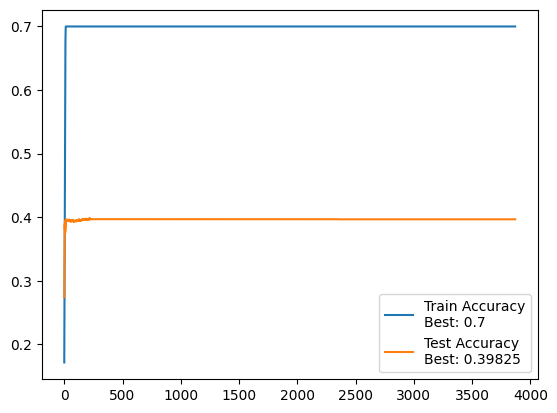

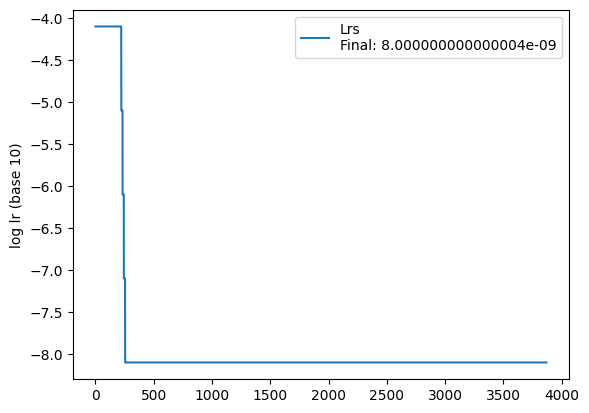


 =============== Epoch 3871 ===============


100%|██████████| 110/110 [00:03<00:00, 30.63it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.77it/s]


 Test accuracy: 39.7%, Avg loss: 6.790557

 =============== Epoch 3872 ===============


100%|██████████| 110/110 [00:03<00:00, 30.51it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.790560

 =============== Epoch 3873 ===============


100%|██████████| 110/110 [00:03<00:00, 30.58it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.790563

 =============== Epoch 3874 ===============


100%|██████████| 110/110 [00:03<00:00, 30.30it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.790566

 =============== Epoch 3875 ===============


100%|██████████| 110/110 [00:03<00:00, 30.45it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.66it/s]


 Test accuracy: 39.7%, Avg loss: 6.790569

 =============== Epoch 3876 ===============


100%|██████████| 110/110 [00:03<00:00, 31.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.30it/s]


 Test accuracy: 39.7%, Avg loss: 6.790572

 =============== Epoch 3877 ===============


100%|██████████| 110/110 [00:03<00:00, 31.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.81it/s]


 Test accuracy: 39.7%, Avg loss: 6.790575

 =============== Epoch 3878 ===============


100%|██████████| 110/110 [00:03<00:00, 30.89it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.96it/s]


 Test accuracy: 39.7%, Avg loss: 6.790579

 =============== Epoch 3879 ===============


100%|██████████| 110/110 [00:03<00:00, 31.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.26it/s]


 Test accuracy: 39.7%, Avg loss: 6.790582

 =============== Epoch 3880 ===============


100%|██████████| 110/110 [00:03<00:00, 31.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.790585


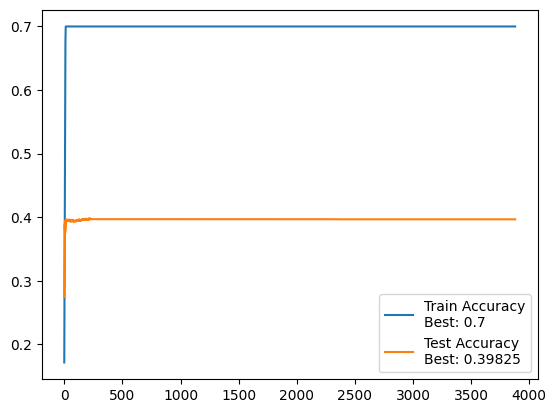

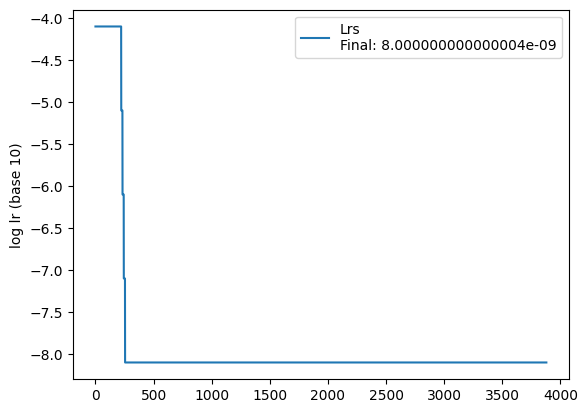


 =============== Epoch 3881 ===============


100%|██████████| 110/110 [00:03<00:00, 30.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.790588

 =============== Epoch 3882 ===============


100%|██████████| 110/110 [00:03<00:00, 30.58it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.790591

 =============== Epoch 3883 ===============


100%|██████████| 110/110 [00:03<00:00, 29.46it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.790595

 =============== Epoch 3884 ===============


100%|██████████| 110/110 [00:03<00:00, 30.60it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.99it/s]


 Test accuracy: 39.7%, Avg loss: 6.790598

 =============== Epoch 3885 ===============


100%|██████████| 110/110 [00:03<00:00, 30.93it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.77it/s]


 Test accuracy: 39.7%, Avg loss: 6.790601

 =============== Epoch 3886 ===============


100%|██████████| 110/110 [00:03<00:00, 30.90it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.93it/s]


 Test accuracy: 39.7%, Avg loss: 6.790604

 =============== Epoch 3887 ===============


100%|██████████| 110/110 [00:03<00:00, 30.65it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.70it/s]


 Test accuracy: 39.7%, Avg loss: 6.790607

 =============== Epoch 3888 ===============


100%|██████████| 110/110 [00:03<00:00, 31.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.59it/s]


 Test accuracy: 39.7%, Avg loss: 6.790611

 =============== Epoch 3889 ===============


100%|██████████| 110/110 [00:03<00:00, 30.97it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.790614

 =============== Epoch 3890 ===============


100%|██████████| 110/110 [00:03<00:00, 31.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.35it/s]


 Test accuracy: 39.7%, Avg loss: 6.790617


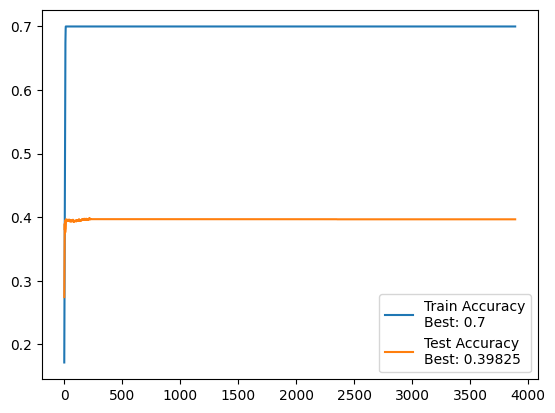

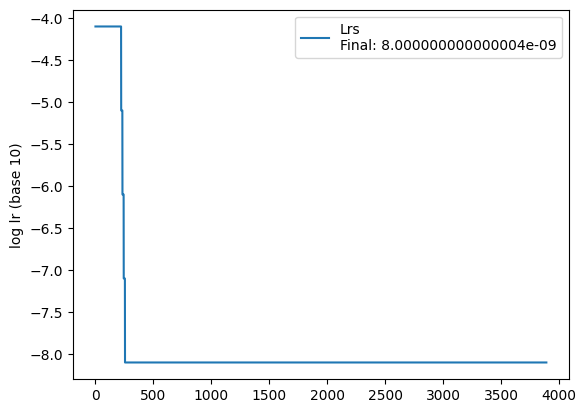


 =============== Epoch 3891 ===============


100%|██████████| 110/110 [00:03<00:00, 29.94it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 62.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.790620

 =============== Epoch 3892 ===============


100%|██████████| 110/110 [00:03<00:00, 30.40it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:03<00:00, 63.10it/s]


 Test accuracy: 39.7%, Avg loss: 6.790623

 =============== Epoch 3893 ===============


100%|██████████| 110/110 [00:03<00:00, 30.77it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.26it/s]


 Test accuracy: 39.7%, Avg loss: 6.790626

 =============== Epoch 3894 ===============


100%|██████████| 110/110 [00:03<00:00, 31.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.790629

 =============== Epoch 3895 ===============


100%|██████████| 110/110 [00:03<00:00, 29.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.790632

 =============== Epoch 3896 ===============


100%|██████████| 110/110 [00:03<00:00, 30.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.05it/s]


 Test accuracy: 39.7%, Avg loss: 6.790635

 =============== Epoch 3897 ===============


100%|██████████| 110/110 [00:03<00:00, 30.11it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.790638

 =============== Epoch 3898 ===============


100%|██████████| 110/110 [00:03<00:00, 30.35it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.99it/s]


 Test accuracy: 39.7%, Avg loss: 6.790641

 =============== Epoch 3899 ===============


100%|██████████| 110/110 [00:03<00:00, 30.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.95it/s]


 Test accuracy: 39.7%, Avg loss: 6.790645

 =============== Epoch 3900 ===============


100%|██████████| 110/110 [00:03<00:00, 30.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.93it/s]


 Test accuracy: 39.7%, Avg loss: 6.790648


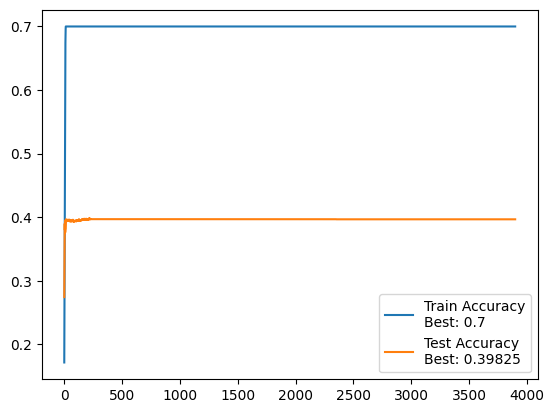

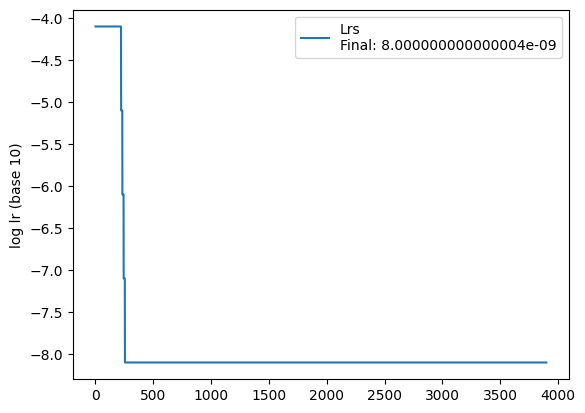


 =============== Epoch 3901 ===============


100%|██████████| 110/110 [00:03<00:00, 30.20it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.790651

 =============== Epoch 3902 ===============


100%|██████████| 110/110 [00:03<00:00, 29.53it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.790654

 =============== Epoch 3903 ===============


100%|██████████| 110/110 [00:03<00:00, 30.16it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.30it/s]


 Test accuracy: 39.7%, Avg loss: 6.790657

 =============== Epoch 3904 ===============


100%|██████████| 110/110 [00:03<00:00, 30.32it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.41it/s]


 Test accuracy: 39.7%, Avg loss: 6.790660

 =============== Epoch 3905 ===============


100%|██████████| 110/110 [00:03<00:00, 30.06it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.51it/s]


 Test accuracy: 39.7%, Avg loss: 6.790663

 =============== Epoch 3906 ===============


100%|██████████| 110/110 [00:03<00:00, 29.84it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.73it/s]


 Test accuracy: 39.7%, Avg loss: 6.790666

 =============== Epoch 3907 ===============


100%|██████████| 110/110 [00:03<00:00, 29.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.78it/s]


 Test accuracy: 39.7%, Avg loss: 6.790670

 =============== Epoch 3908 ===============


100%|██████████| 110/110 [00:03<00:00, 30.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.38it/s]


 Test accuracy: 39.7%, Avg loss: 6.790673

 =============== Epoch 3909 ===============


100%|██████████| 110/110 [00:03<00:00, 30.24it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.99it/s]


 Test accuracy: 39.7%, Avg loss: 6.790676

 =============== Epoch 3910 ===============


100%|██████████| 110/110 [00:03<00:00, 29.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 55.67it/s]


 Test accuracy: 39.7%, Avg loss: 6.790679


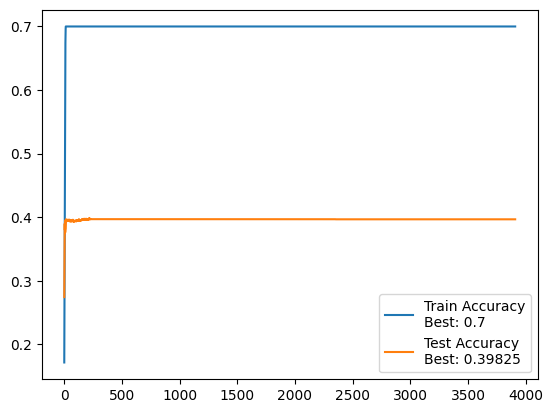

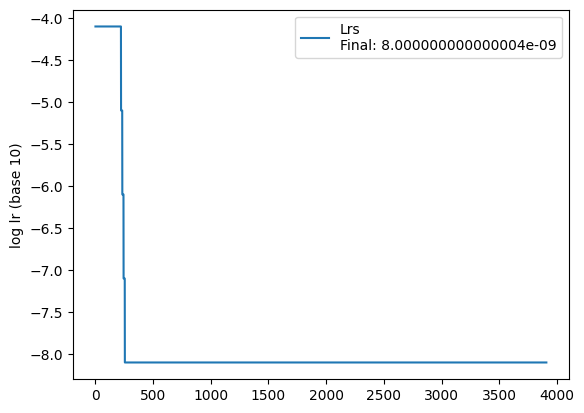


 =============== Epoch 3911 ===============


100%|██████████| 110/110 [00:03<00:00, 28.74it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.52it/s]


 Test accuracy: 39.7%, Avg loss: 6.790682

 =============== Epoch 3912 ===============


100%|██████████| 110/110 [00:03<00:00, 29.13it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.35it/s]


 Test accuracy: 39.7%, Avg loss: 6.790685

 =============== Epoch 3913 ===============


100%|██████████| 110/110 [00:03<00:00, 28.85it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.89it/s]


 Test accuracy: 39.7%, Avg loss: 6.790688

 =============== Epoch 3914 ===============


100%|██████████| 110/110 [00:03<00:00, 29.41it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.790691

 =============== Epoch 3915 ===============


100%|██████████| 110/110 [00:03<00:00, 29.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.790694

 =============== Epoch 3916 ===============


100%|██████████| 110/110 [00:03<00:00, 29.48it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.69it/s]


 Test accuracy: 39.7%, Avg loss: 6.790697

 =============== Epoch 3917 ===============


100%|██████████| 110/110 [00:03<00:00, 28.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.18it/s]


 Test accuracy: 39.7%, Avg loss: 6.790700

 =============== Epoch 3918 ===============


100%|██████████| 110/110 [00:03<00:00, 29.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.53it/s]


 Test accuracy: 39.7%, Avg loss: 6.790703

 =============== Epoch 3919 ===============


100%|██████████| 110/110 [00:03<00:00, 29.36it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.65it/s]


 Test accuracy: 39.7%, Avg loss: 6.790706

 =============== Epoch 3920 ===============


100%|██████████| 110/110 [00:03<00:00, 30.39it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.38it/s]


 Test accuracy: 39.7%, Avg loss: 6.790709


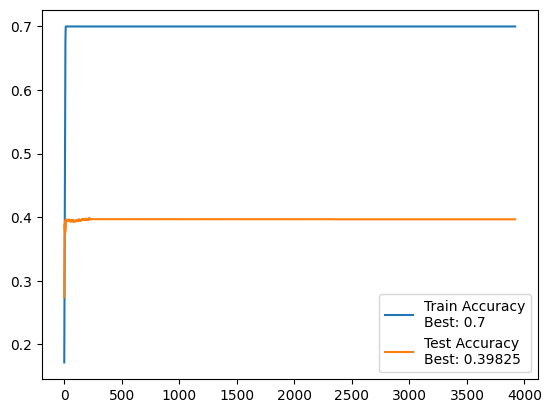

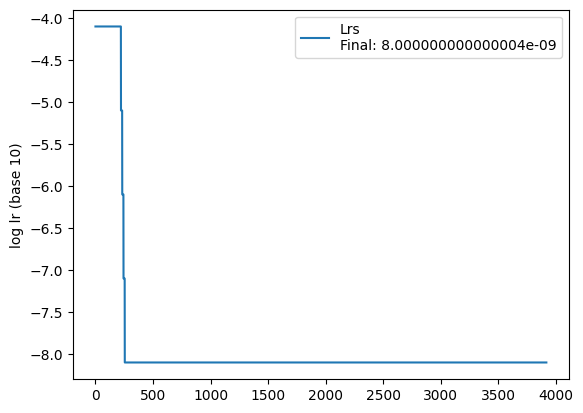


 =============== Epoch 3921 ===============


100%|██████████| 110/110 [00:03<00:00, 29.45it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.790712

 =============== Epoch 3922 ===============


100%|██████████| 110/110 [00:03<00:00, 30.50it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.30it/s]


 Test accuracy: 39.7%, Avg loss: 6.790716

 =============== Epoch 3923 ===============


100%|██████████| 110/110 [00:03<00:00, 30.39it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.790719

 =============== Epoch 3924 ===============


100%|██████████| 110/110 [00:03<00:00, 30.32it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 62.17it/s]


 Test accuracy: 39.7%, Avg loss: 6.790722

 =============== Epoch 3925 ===============


100%|██████████| 110/110 [00:03<00:00, 30.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.790725

 =============== Epoch 3926 ===============


100%|██████████| 110/110 [00:03<00:00, 29.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.23it/s]


 Test accuracy: 39.7%, Avg loss: 6.790728

 =============== Epoch 3927 ===============


100%|██████████| 110/110 [00:03<00:00, 28.74it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.790731

 =============== Epoch 3928 ===============


100%|██████████| 110/110 [00:03<00:00, 29.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.96it/s]


 Test accuracy: 39.7%, Avg loss: 6.790734

 =============== Epoch 3929 ===============


100%|██████████| 110/110 [00:03<00:00, 29.99it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.75it/s]


 Test accuracy: 39.7%, Avg loss: 6.790736

 =============== Epoch 3930 ===============


100%|██████████| 110/110 [00:03<00:00, 28.50it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 55.85it/s]


 Test accuracy: 39.7%, Avg loss: 6.790740


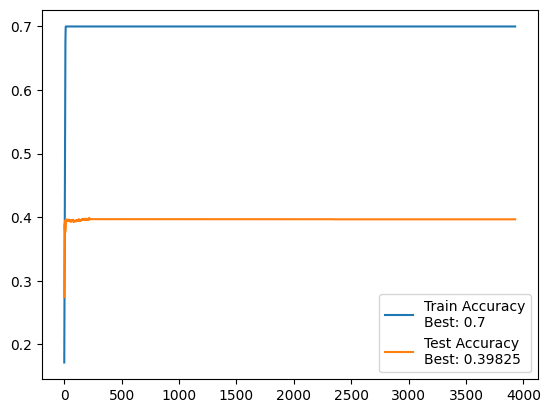

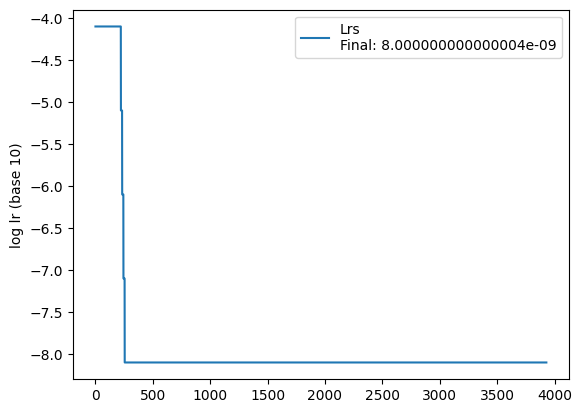


 =============== Epoch 3931 ===============


100%|██████████| 110/110 [00:03<00:00, 28.48it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.790743

 =============== Epoch 3932 ===============


100%|██████████| 110/110 [00:03<00:00, 27.54it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 56.84it/s]


 Test accuracy: 39.7%, Avg loss: 6.790746

 =============== Epoch 3933 ===============


100%|██████████| 110/110 [00:03<00:00, 27.80it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.76it/s]


 Test accuracy: 39.7%, Avg loss: 6.790749

 =============== Epoch 3934 ===============


100%|██████████| 110/110 [00:03<00:00, 28.37it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.21it/s]


 Test accuracy: 39.7%, Avg loss: 6.790752

 =============== Epoch 3935 ===============


100%|██████████| 110/110 [00:03<00:00, 28.35it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.62it/s]


 Test accuracy: 39.7%, Avg loss: 6.790755

 =============== Epoch 3936 ===============


100%|██████████| 110/110 [00:03<00:00, 27.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.20it/s]


 Test accuracy: 39.7%, Avg loss: 6.790758

 =============== Epoch 3937 ===============


100%|██████████| 110/110 [00:03<00:00, 29.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.82it/s]


 Test accuracy: 39.7%, Avg loss: 6.790761

 =============== Epoch 3938 ===============


100%|██████████| 110/110 [00:03<00:00, 29.33it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.04it/s]


 Test accuracy: 39.7%, Avg loss: 6.790764

 =============== Epoch 3939 ===============


100%|██████████| 110/110 [00:03<00:00, 28.23it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.35it/s]


 Test accuracy: 39.7%, Avg loss: 6.790767

 =============== Epoch 3940 ===============


100%|██████████| 110/110 [00:03<00:00, 28.81it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.48it/s]


 Test accuracy: 39.7%, Avg loss: 6.790770


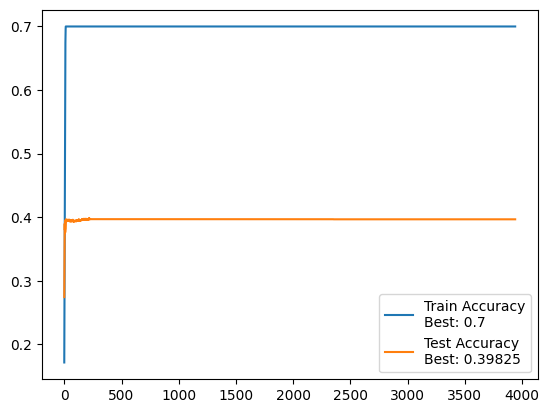

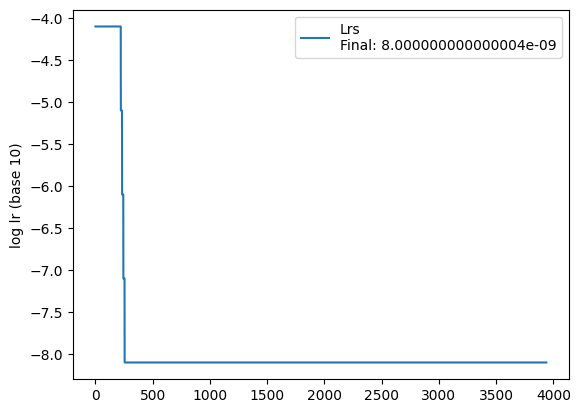


 =============== Epoch 3941 ===============


100%|██████████| 110/110 [00:03<00:00, 29.72it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.81it/s]


 Test accuracy: 39.7%, Avg loss: 6.790773

 =============== Epoch 3942 ===============


100%|██████████| 110/110 [00:03<00:00, 29.51it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.89it/s]


 Test accuracy: 39.7%, Avg loss: 6.790776

 =============== Epoch 3943 ===============


100%|██████████| 110/110 [00:03<00:00, 28.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.21it/s]


 Test accuracy: 39.7%, Avg loss: 6.790779

 =============== Epoch 3944 ===============


100%|██████████| 110/110 [00:03<00:00, 29.30it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.13it/s]


 Test accuracy: 39.7%, Avg loss: 6.790782

 =============== Epoch 3945 ===============


100%|██████████| 110/110 [00:03<00:00, 29.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.74it/s]


 Test accuracy: 39.7%, Avg loss: 6.790785

 =============== Epoch 3946 ===============


100%|██████████| 110/110 [00:03<00:00, 29.28it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.97it/s]


 Test accuracy: 39.7%, Avg loss: 6.790788

 =============== Epoch 3947 ===============


100%|██████████| 110/110 [00:03<00:00, 28.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.55it/s]


 Test accuracy: 39.7%, Avg loss: 6.790791

 =============== Epoch 3948 ===============


100%|██████████| 110/110 [00:03<00:00, 29.41it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.11it/s]


 Test accuracy: 39.7%, Avg loss: 6.790794

 =============== Epoch 3949 ===============


100%|██████████| 110/110 [00:03<00:00, 29.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.28it/s]


 Test accuracy: 39.7%, Avg loss: 6.790797

 =============== Epoch 3950 ===============


100%|██████████| 110/110 [00:03<00:00, 29.36it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.790800


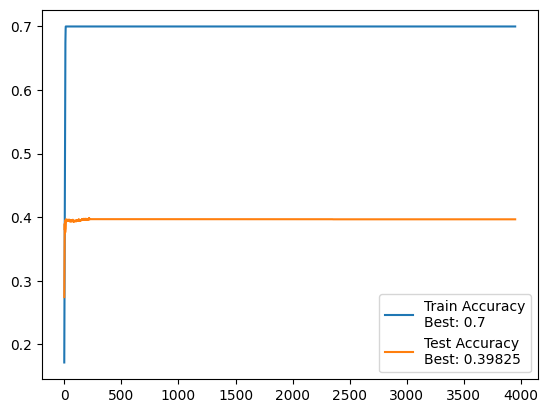

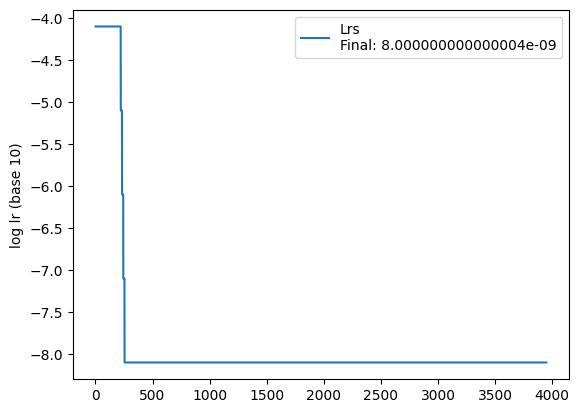


 =============== Epoch 3951 ===============


100%|██████████| 110/110 [00:03<00:00, 29.11it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.64it/s]


 Test accuracy: 39.7%, Avg loss: 6.790803

 =============== Epoch 3952 ===============


100%|██████████| 110/110 [00:03<00:00, 29.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.49it/s]


 Test accuracy: 39.7%, Avg loss: 6.790806

 =============== Epoch 3953 ===============


100%|██████████| 110/110 [00:03<00:00, 29.72it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.790809

 =============== Epoch 3954 ===============


100%|██████████| 110/110 [00:03<00:00, 29.89it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.790812

 =============== Epoch 3955 ===============


100%|██████████| 110/110 [00:03<00:00, 29.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.790815

 =============== Epoch 3956 ===============


100%|██████████| 110/110 [00:03<00:00, 29.96it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.17it/s]


 Test accuracy: 39.7%, Avg loss: 6.790818

 =============== Epoch 3957 ===============


100%|██████████| 110/110 [00:03<00:00, 29.71it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.19it/s]


 Test accuracy: 39.7%, Avg loss: 6.790821

 =============== Epoch 3958 ===============


100%|██████████| 110/110 [00:03<00:00, 30.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.78it/s]


 Test accuracy: 39.7%, Avg loss: 6.790824

 =============== Epoch 3959 ===============


100%|██████████| 110/110 [00:03<00:00, 30.01it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.34it/s]


 Test accuracy: 39.7%, Avg loss: 6.790827

 =============== Epoch 3960 ===============


100%|██████████| 110/110 [00:03<00:00, 29.90it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.83it/s]


 Test accuracy: 39.7%, Avg loss: 6.790830


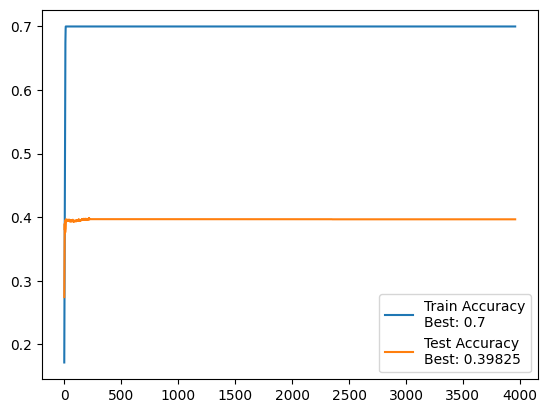

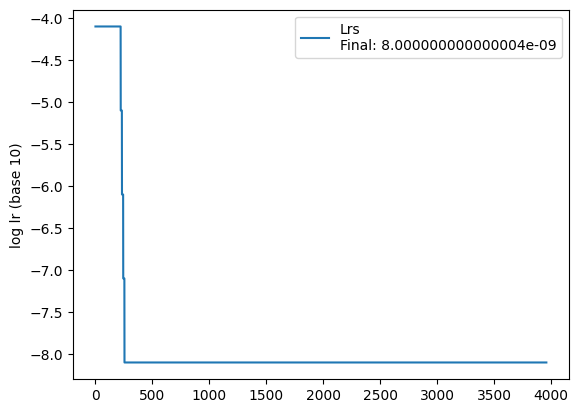


 =============== Epoch 3961 ===============


100%|██████████| 110/110 [00:03<00:00, 28.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.03it/s]


 Test accuracy: 39.7%, Avg loss: 6.790833

 =============== Epoch 3962 ===============


100%|██████████| 110/110 [00:03<00:00, 29.18it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.14it/s]


 Test accuracy: 39.7%, Avg loss: 6.790836

 =============== Epoch 3963 ===============


100%|██████████| 110/110 [00:03<00:00, 29.24it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.37it/s]


 Test accuracy: 39.7%, Avg loss: 6.790839

 =============== Epoch 3964 ===============


100%|██████████| 110/110 [00:03<00:00, 29.83it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.33it/s]


 Test accuracy: 39.7%, Avg loss: 6.790842

 =============== Epoch 3965 ===============


100%|██████████| 110/110 [00:03<00:00, 30.10it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.78it/s]


 Test accuracy: 39.7%, Avg loss: 6.790845

 =============== Epoch 3966 ===============


100%|██████████| 110/110 [00:03<00:00, 29.56it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.15it/s]


 Test accuracy: 39.7%, Avg loss: 6.790848

 =============== Epoch 3967 ===============


100%|██████████| 110/110 [00:03<00:00, 29.61it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.790851

 =============== Epoch 3968 ===============


100%|██████████| 110/110 [00:03<00:00, 30.08it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.17it/s]


 Test accuracy: 39.7%, Avg loss: 6.790854

 =============== Epoch 3969 ===============


100%|██████████| 110/110 [00:03<00:00, 29.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.78it/s]


 Test accuracy: 39.7%, Avg loss: 6.790857

 =============== Epoch 3970 ===============


100%|██████████| 110/110 [00:03<00:00, 29.70it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.00it/s]


 Test accuracy: 39.7%, Avg loss: 6.790860


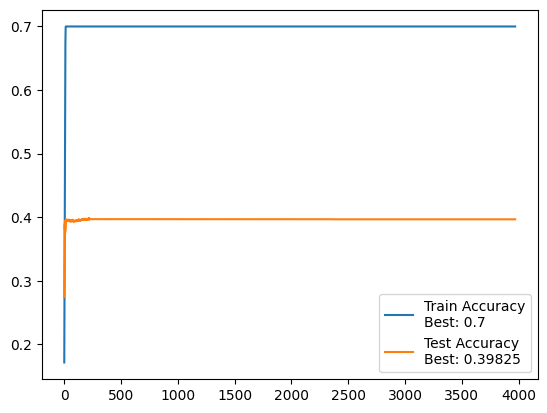

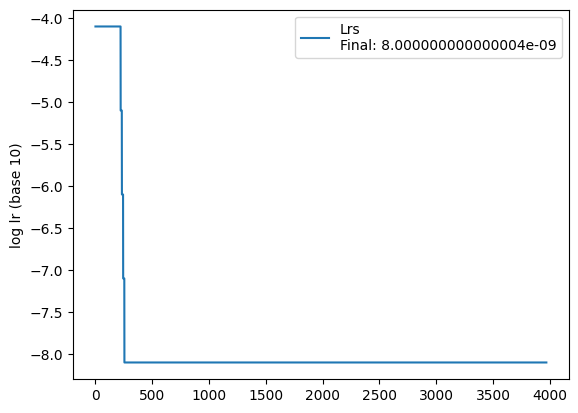


 =============== Epoch 3971 ===============


100%|██████████| 110/110 [00:03<00:00, 29.07it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.07it/s]


 Test accuracy: 39.7%, Avg loss: 6.790862

 =============== Epoch 3972 ===============


100%|██████████| 110/110 [00:03<00:00, 28.90it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.16it/s]


 Test accuracy: 39.7%, Avg loss: 6.790866

 =============== Epoch 3973 ===============


100%|██████████| 110/110 [00:03<00:00, 29.39it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.50it/s]


 Test accuracy: 39.7%, Avg loss: 6.790869

 =============== Epoch 3974 ===============


100%|██████████| 110/110 [00:03<00:00, 29.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.790871

 =============== Epoch 3975 ===============


100%|██████████| 110/110 [00:03<00:00, 29.38it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.37it/s]


 Test accuracy: 39.7%, Avg loss: 6.790875

 =============== Epoch 3976 ===============


100%|██████████| 110/110 [00:03<00:00, 29.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.95it/s]


 Test accuracy: 39.7%, Avg loss: 6.790878

 =============== Epoch 3977 ===============


100%|██████████| 110/110 [00:03<00:00, 29.36it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.94it/s]


 Test accuracy: 39.7%, Avg loss: 6.790881

 =============== Epoch 3978 ===============


100%|██████████| 110/110 [00:03<00:00, 29.26it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.790883

 =============== Epoch 3979 ===============


100%|██████████| 110/110 [00:03<00:00, 29.09it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.56it/s]


 Test accuracy: 39.7%, Avg loss: 6.790886

 =============== Epoch 3980 ===============


100%|██████████| 110/110 [00:03<00:00, 30.14it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.90it/s]


 Test accuracy: 39.7%, Avg loss: 6.790889


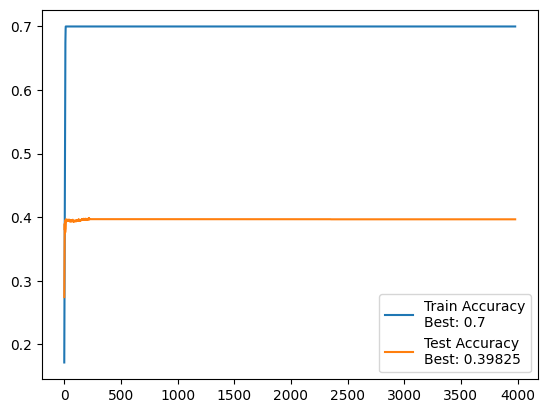

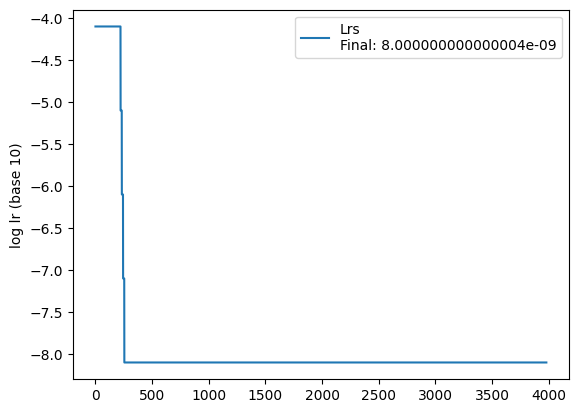


 =============== Epoch 3981 ===============


100%|██████████| 110/110 [00:03<00:00, 28.86it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.35it/s]


 Test accuracy: 39.7%, Avg loss: 6.790893

 =============== Epoch 3982 ===============


100%|██████████| 110/110 [00:03<00:00, 29.31it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.42it/s]


 Test accuracy: 39.7%, Avg loss: 6.790896

 =============== Epoch 3983 ===============


100%|██████████| 110/110 [00:03<00:00, 29.69it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.80it/s]


 Test accuracy: 39.7%, Avg loss: 6.790899

 =============== Epoch 3984 ===============


100%|██████████| 110/110 [00:03<00:00, 29.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.24it/s]


 Test accuracy: 39.7%, Avg loss: 6.790901

 =============== Epoch 3985 ===============


100%|██████████| 110/110 [00:03<00:00, 29.26it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.02it/s]


 Test accuracy: 39.7%, Avg loss: 6.790904

 =============== Epoch 3986 ===============


100%|██████████| 110/110 [00:03<00:00, 29.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.90it/s]


 Test accuracy: 39.7%, Avg loss: 6.790907

 =============== Epoch 3987 ===============


100%|██████████| 110/110 [00:03<00:00, 29.79it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.23it/s]


 Test accuracy: 39.7%, Avg loss: 6.790910

 =============== Epoch 3988 ===============


100%|██████████| 110/110 [00:03<00:00, 29.87it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.63it/s]


 Test accuracy: 39.7%, Avg loss: 6.790914

 =============== Epoch 3989 ===============


100%|██████████| 110/110 [00:03<00:00, 30.03it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.79it/s]


 Test accuracy: 39.7%, Avg loss: 6.790916

 =============== Epoch 3990 ===============


100%|██████████| 110/110 [00:03<00:00, 29.88it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.93it/s]


 Test accuracy: 39.7%, Avg loss: 6.790919


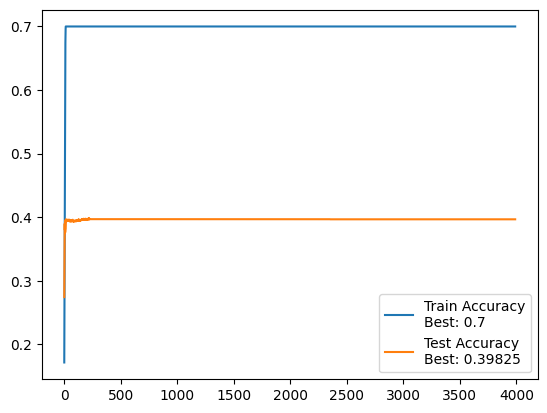

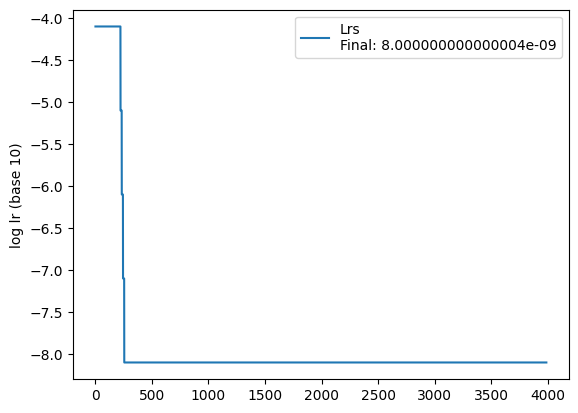


 =============== Epoch 3991 ===============


100%|██████████| 110/110 [00:03<00:00, 28.37it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.37it/s]


 Test accuracy: 39.7%, Avg loss: 6.790922

 =============== Epoch 3992 ===============


100%|██████████| 110/110 [00:03<00:00, 28.61it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.11it/s]


 Test accuracy: 39.7%, Avg loss: 6.790925

 =============== Epoch 3993 ===============


100%|██████████| 110/110 [00:03<00:00, 29.21it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 61.11it/s]


 Test accuracy: 39.7%, Avg loss: 6.790928

 =============== Epoch 3994 ===============


100%|██████████| 110/110 [00:03<00:00, 29.19it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.52it/s]


 Test accuracy: 39.7%, Avg loss: 6.790931

 =============== Epoch 3995 ===============


100%|██████████| 110/110 [00:03<00:00, 29.55it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 60.36it/s]


 Test accuracy: 39.7%, Avg loss: 6.790934

 =============== Epoch 3996 ===============


100%|██████████| 110/110 [00:03<00:00, 30.00it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.92it/s]


 Test accuracy: 39.7%, Avg loss: 6.790937

 =============== Epoch 3997 ===============


100%|██████████| 110/110 [00:03<00:00, 29.92it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 59.28it/s]


 Test accuracy: 39.7%, Avg loss: 6.790940

 =============== Epoch 3998 ===============


100%|██████████| 110/110 [00:03<00:00, 30.12it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 57.79it/s]


 Test accuracy: 39.7%, Avg loss: 6.790943

 =============== Epoch 3999 ===============


100%|██████████| 110/110 [00:03<00:00, 29.82it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.88it/s]


 Test accuracy: 39.7%, Avg loss: 6.790946

 =============== Epoch 4000 ===============


100%|██████████| 110/110 [00:03<00:00, 29.75it/s]


 Train accuracy: 70.0%, Avg loss: 0.000000, lr: 8.000000000000004e-09


100%|██████████| 250/250 [00:04<00:00, 58.51it/s]


 Test accuracy: 39.7%, Avg loss: 6.790949


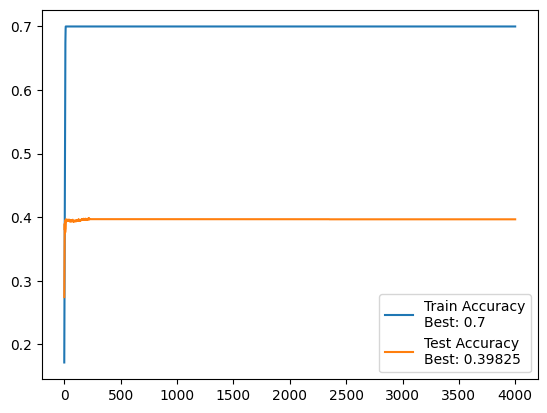

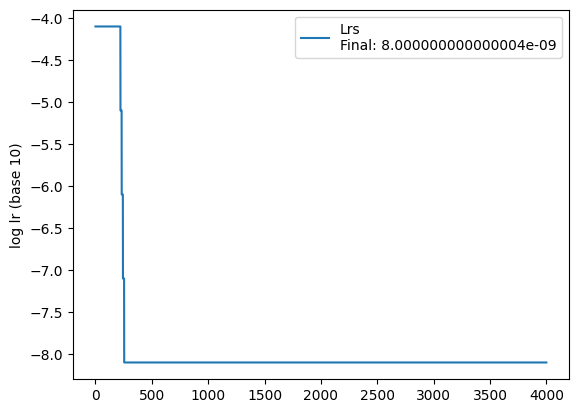

In [75]:
for i in range(NUM_EPOCHS//NUM_EPOCHS_TO_SAVE):
    train_(epochs=NUM_EPOCHS_TO_SAVE)
    STORE_PATH = save(os.path.join(str(TRAIN_ID), f'{epoch}'))
    plot(STORE_PATH)

## Test and Outputs

In [76]:
val_loss, val_accuracy = test(val_loader, model, loss_fn)

 Test accuracy: 39.7%, Avg loss: 6.790949


In [77]:
val_transform = transforms.ToTensor()

In [78]:
import pandas as pd
import torchvision

PATH_ROOT = "data"
PATH_LIST = os.path.join(PATH_ROOT,"test_list.txt")
PATH_TEST = os.path.join(PATH_ROOT,"test")

output = pd.DataFrame(columns=['id','label'])

model.eval()

with torch.no_grad():
    with open(PATH_LIST) as f:
        queries = f.read().splitlines()
        for query in tqdm(queries):
            img = torchvision.io.read_image(os.path.join(PATH_TEST, query))
            img = img/256
            #plt.imshow(np.transpose(img.numpy(), axes=[1,2,0]))
            img = img.float().to(device)
            img = img.expand(size=[1,-1,-1,-1])
            #img = val_transform(img)
            pred = model(img)
            pred = pred.argmax(1)[0]
            pred = pred.cpu().detach().numpy()
            pred = val_data.classes[pred]
            output = pd.concat((output, pd.DataFrame([[query, pred]], columns=['id','label'])), join='inner', axis=0, ignore_index=True)

#plt.show()

FileNotFoundError: [Errno 2] No such file or directory: 'data\\test_list.txt'

In [ ]:
output.to_csv(f"{STORE_PATH[:-3]}_submission.csv", index=False)

## Ideas for Improvements

1. Normalize the inputs.
2. Perform masking on the inputs.
3. Perform random resized crops on the inputs.
4. Migrate data augmentations to GPU.